In [1]:
import numpy as np
import csv
import matplotlib.pyplot as plt
import seaborn as sns
from bilinear_model_single_cells import *
plt.rcParams['font.size'] = 16

In [2]:
reader=csv.reader(open("ContactSubgraphMatrix.csv", "r"), delimiter=",")
ta=list(reader)
ta=np.array(ta).astype("int") # contact matrix
reader=csv.reader(open("GapJunctContact.csv", "r"), delimiter=",")
tb=list(reader)
tb=np.array(tb).astype("double") # connectivity matrix
reader=csv.reader(open("INXExpressionJustContact.csv", "r"), delimiter=",")
tx=list(reader)
tx=np.array(tx).astype("double") #connexin expression matrix

W = ta
Z = tb
X = Y = tx

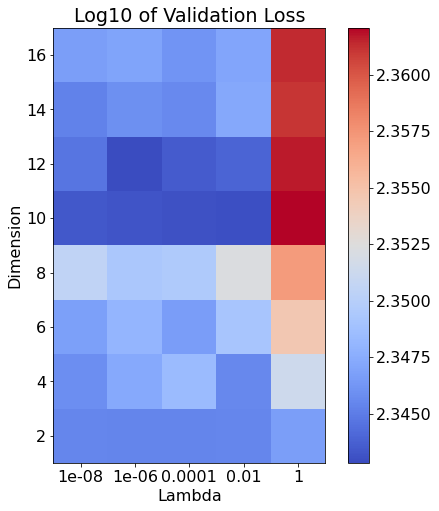

In [3]:
lambdas = [1e-8, 1e-6, 1e-4, 1e-2, 1]
ds = [16, 14, 12, 10, 8, 6, 4, 2]

# Create an empty array to store the test loss values
test_losses = np.zeros((len(ds), len(lambdas)))

# Load the test loss values from the npy files
for i, d in enumerate(ds):
    for j, l in enumerate(lambdas):
        filename = f'bilinear_lambda_{l}_dimension_{d}.npy'
        result = np.load(filename)
        test_loss = result[0]
        test_losses[i, j] = np.log10(test_loss)

# Create a 2D heatmap plot
fig, axs = plt.subplots(1, 1, figsize=(8, 8))
plt.imshow(test_losses, cmap='coolwarm', interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(lambdas)), lambdas)
plt.yticks(range(len(ds)), ds)
plt.xlabel('Lambda')
plt.ylabel('Dimension')
plt.title ('Log10 of Validation Loss')
plt.savefig('figure1_cv.svg', format='svg', bbox_inches='tight')

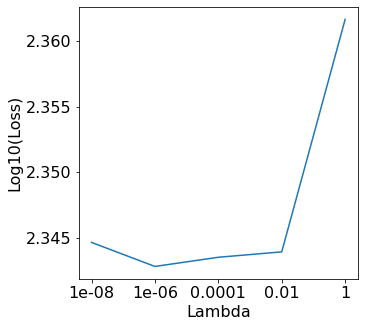

In [4]:
# Select the indices corresponding to dimensionality of 12
dim_index = ds.index(12)

# Create a 1D array for the test loss values for dimensionality of 12
test_losses_dim = test_losses[dim_index, :]

# Plot the test loss values for dimensionality of 2 against lambdas
fig, axs = plt.subplots(1, 1, figsize=(5, 5))
plt.plot(np.arange(len(lambdas)), test_losses_dim)
plt.xlabel('Lambda')
plt.ylabel('Log10(Loss)')
plt.xticks(np.arange(len(lambdas)), lambdas[:])
plt.savefig('figure1_lambda_1.svg', format='svg', bbox_inches='tight')

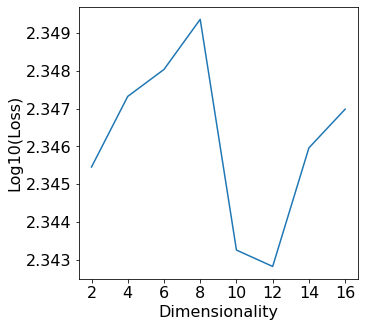

In [5]:
# Select the index corresponding to lambda of 1e-6
lambda_index = lambdas.index(1e-6)

# Create a 1D array for the test loss values for lambda of 1e-6
test_losses_lambda = test_losses[:, lambda_index]

# Plot the test loss values for lambda of 1 against dimensionalities
fig, axs = plt.subplots(1, 1, figsize=(5, 5))
plt.plot(np.arange(len(ds)), test_losses_lambda[::-1])
plt.xlabel('Dimensionality')
plt.ylabel('Log10(Loss)')
plt.xticks(np.arange(len(ds)), ds[::-1])
plt.savefig('figure1_dim_2.svg', format='svg', bbox_inches='tight')

In [6]:
# Find the minimal element and its index
min_value = np.min(test_losses)
min_index = np.unravel_index(np.argmin(test_losses), test_losses.shape)

# Get the values of d and l for the minimal test loss
opt_d = ds[min_index[0]]
opt_l = lambdas[min_index[1]]

# Print the minimal test loss and its corresponding d and l values
print("Minimal Log10 of Test Loss:", min_value)
print("d for Minimal Test Loss:", opt_d)
print("l for Minimal Test Loss:", opt_l)

Minimal Log10 of Test Loss: 2.3428227084302558
d for Minimal Test Loss: 12
l for Minimal Test Loss: 1e-06


In [7]:
A_est, B_est, loss = transformed_gradient_descent_output_loss(Z, X, Y, W = W, n_factors = opt_d, n_iterations=1000000, learning_rate=0.0001/opt_d, lambda_a=opt_l, lambda_b=opt_l, verbose = True, tol=1e-6)


Iteration 1, Loss: 1301.1815057075491
Iteration 2, Loss: 1291.606358351138
Iteration 3, Loss: 1282.7251453994759
Iteration 4, Loss: 1274.468977295587
Iteration 5, Loss: 1266.7780234540492
Iteration 6, Loss: 1259.6000847190633
Iteration 7, Loss: 1252.889420706153
Iteration 8, Loss: 1246.605781205837
Iteration 9, Loss: 1240.7136020242488
Iteration 10, Loss: 1235.1813341454983
Iteration 11, Loss: 1229.9808816174425
Iteration 12, Loss: 1225.0871285891167
Iteration 13, Loss: 1220.4775398315337
Iteration 14, Loss: 1216.1318221245128
Iteration 15, Loss: 1212.0316362915755
Iteration 16, Loss: 1208.160351562991
Iteration 17, Loss: 1204.5028354571068
Iteration 18, Loss: 1201.045273578001
Iteration 19, Loss: 1197.7750146988203
Iteration 20, Loss: 1194.6804372853005
Iteration 21, Loss: 1191.750834251761
Iteration 22, Loss: 1188.9763132625387
Iteration 23, Loss: 1186.3477103189261
Iteration 24, Loss: 1183.856514723712
Iteration 25, Loss: 1181.4948038069201
Iteration 26, Loss: 1179.2551860388414
Ite

Iteration 213, Loss: 1117.2790177999098
Iteration 214, Loss: 1117.1877896958515
Iteration 215, Loss: 1117.0969903209677
Iteration 216, Loss: 1117.0066157879648
Iteration 217, Loss: 1116.9166622595244
Iteration 218, Loss: 1116.8271259474798
Iteration 219, Loss: 1116.7380031120124
Iteration 220, Loss: 1116.6492900608637
Iteration 221, Loss: 1116.5609831485633
Iteration 222, Loss: 1116.4730787756762
Iteration 223, Loss: 1116.3855733880605
Iteration 224, Loss: 1116.2984634761451
Iteration 225, Loss: 1116.2117455742175
Iteration 226, Loss: 1116.1254162597313
Iteration 227, Loss: 1116.039472152621
Iteration 228, Loss: 1115.9539099146368
Iteration 229, Loss: 1115.868726248687
Iteration 230, Loss: 1115.7839178981958
Iteration 231, Loss: 1115.6994816464762
Iteration 232, Loss: 1115.6154143161086
Iteration 233, Loss: 1115.5317127683359
Iteration 234, Loss: 1115.4483739024697
Iteration 235, Loss: 1115.365394655306
Iteration 236, Loss: 1115.2827720005541
Iteration 237, Loss: 1115.2005029482725
Ite

Iteration 453, Loss: 1102.6454783965662
Iteration 454, Loss: 1102.6028478790179
Iteration 455, Loss: 1102.5603110660238
Iteration 456, Loss: 1102.5178675336333
Iteration 457, Loss: 1102.4755168606625
Iteration 458, Loss: 1102.4332586286678
Iteration 459, Loss: 1102.3910924219267
Iteration 460, Loss: 1102.3490178274092
Iteration 461, Loss: 1102.3070344347555
Iteration 462, Loss: 1102.2651418362545
Iteration 463, Loss: 1102.2233396268161
Iteration 464, Loss: 1102.1816274039531
Iteration 465, Loss: 1102.1400047677557
Iteration 466, Loss: 1102.09847132087
Iteration 467, Loss: 1102.057026668475
Iteration 468, Loss: 1102.0156704182614
Iteration 469, Loss: 1101.97440218041
Iteration 470, Loss: 1101.933221567569
Iteration 471, Loss: 1101.8921281948355
Iteration 472, Loss: 1101.8511216797299
Iteration 473, Loss: 1101.81020164218
Iteration 474, Loss: 1101.7693677044974
Iteration 475, Loss: 1101.7286194913584
Iteration 476, Loss: 1101.687956629783
Iteration 477, Loss: 1101.647378749116
Iteration 

Iteration 715, Loss: 1093.7902447768283
Iteration 716, Loss: 1093.7628894477073
Iteration 717, Loss: 1093.735569646588
Iteration 718, Loss: 1093.708285263517
Iteration 719, Loss: 1093.6810361890023
Iteration 720, Loss: 1093.6538223140112
Iteration 721, Loss: 1093.6266435299679
Iteration 722, Loss: 1093.5994997287505
Iteration 723, Loss: 1093.5723908026894
Iteration 724, Loss: 1093.5453166445648
Iteration 725, Loss: 1093.5182771476032
Iteration 726, Loss: 1093.4912722054767
Iteration 727, Loss: 1093.4643017122999
Iteration 728, Loss: 1093.4373655626275
Iteration 729, Loss: 1093.4104636514517
Iteration 730, Loss: 1093.3835958742
Iteration 731, Loss: 1093.3567621267343
Iteration 732, Loss: 1093.3299623053465
Iteration 733, Loss: 1093.3031963067572
Iteration 734, Loss: 1093.2764640281143
Iteration 735, Loss: 1093.249765366989
Iteration 736, Loss: 1093.223100221376
Iteration 737, Loss: 1093.1964684896877
Iteration 738, Loss: 1093.1698700707568
Iteration 739, Loss: 1093.1433048638294
Iterati

Iteration 949, Loss: 1088.1710575173163
Iteration 950, Loss: 1088.1497628079046
Iteration 951, Loss: 1088.1284867577665
Iteration 952, Loss: 1088.1072293214106
Iteration 953, Loss: 1088.0859904534996
Iteration 954, Loss: 1088.064770108852
Iteration 955, Loss: 1088.0435682424402
Iteration 956, Loss: 1088.0223848093906
Iteration 957, Loss: 1088.0012197649824
Iteration 958, Loss: 1087.9800730646482
Iteration 959, Loss: 1087.9589446639711
Iteration 960, Loss: 1087.9378345186863
Iteration 961, Loss: 1087.9167425846797
Iteration 962, Loss: 1087.895668817987
Iteration 963, Loss: 1087.874613174793
Iteration 964, Loss: 1087.8535756114322
Iteration 965, Loss: 1087.8325560843869
Iteration 966, Loss: 1087.8115545502867
Iteration 967, Loss: 1087.7905709659087
Iteration 968, Loss: 1087.769605288176
Iteration 969, Loss: 1087.748657474158
Iteration 970, Loss: 1087.72772748107
Iteration 971, Loss: 1087.70681526627
Iteration 972, Loss: 1087.6859207872626
Iteration 973, Loss: 1087.6650440016942
Iteration

Iteration 1184, Loss: 1083.5989454622934
Iteration 1185, Loss: 1083.5810540486218
Iteration 1186, Loss: 1083.56317384814
Iteration 1187, Loss: 1083.5453048396905
Iteration 1188, Loss: 1083.527447002181
Iteration 1189, Loss: 1083.509600314587
Iteration 1190, Loss: 1083.4917647559514
Iteration 1191, Loss: 1083.4739403053832
Iteration 1192, Loss: 1083.4561269420578
Iteration 1193, Loss: 1083.4383246452182
Iteration 1194, Loss: 1083.4205333941723
Iteration 1195, Loss: 1083.4027531682939
Iteration 1196, Loss: 1083.3849839470226
Iteration 1197, Loss: 1083.3672257098644
Iteration 1198, Loss: 1083.3494784363897
Iteration 1199, Loss: 1083.331742106234
Iteration 1200, Loss: 1083.3140166990984
Iteration 1201, Loss: 1083.296302194748
Iteration 1202, Loss: 1083.2785985730127
Iteration 1203, Loss: 1083.2609058137868
Iteration 1204, Loss: 1083.243223897029
Iteration 1205, Loss: 1083.2255528027613
Iteration 1206, Loss: 1083.2078925110695
Iteration 1207, Loss: 1083.1902430021041
Iteration 1208, Loss: 1

Iteration 1389, Loss: 1080.140025650904
Iteration 1390, Loss: 1080.1240731327468
Iteration 1391, Loss: 1080.1081286566275
Iteration 1392, Loss: 1080.0921922118257
Iteration 1393, Loss: 1080.076263787658
Iteration 1394, Loss: 1080.060343373481
Iteration 1395, Loss: 1080.0444309586876
Iteration 1396, Loss: 1080.0285265327084
Iteration 1397, Loss: 1080.0126300850118
Iteration 1398, Loss: 1079.996741605104
Iteration 1399, Loss: 1079.9808610825276
Iteration 1400, Loss: 1079.9649885068625
Iteration 1401, Loss: 1079.9491238677274
Iteration 1402, Loss: 1079.9332671547766
Iteration 1403, Loss: 1079.9174183577006
Iteration 1404, Loss: 1079.9015774662294
Iteration 1405, Loss: 1079.8857444701266
Iteration 1406, Loss: 1079.8699193591947
Iteration 1407, Loss: 1079.854102123272
Iteration 1408, Loss: 1079.8382927522334
Iteration 1409, Loss: 1079.8224912359901
Iteration 1410, Loss: 1079.8066975644888
Iteration 1411, Loss: 1079.7909117277145
Iteration 1412, Loss: 1079.7751337156858
Iteration 1413, Loss:

Iteration 1630, Loss: 1076.5079537753695
Iteration 1631, Loss: 1076.49370447725
Iteration 1632, Loss: 1076.479461533199
Iteration 1633, Loss: 1076.4652249392054
Iteration 1634, Loss: 1076.4509946912779
Iteration 1635, Loss: 1076.4367707854433
Iteration 1636, Loss: 1076.4225532177481
Iteration 1637, Loss: 1076.4083419842568
Iteration 1638, Loss: 1076.3941370810535
Iteration 1639, Loss: 1076.3799385042414
Iteration 1640, Loss: 1076.3657462499414
Iteration 1641, Loss: 1076.3515603142932
Iteration 1642, Loss: 1076.3373806934562
Iteration 1643, Loss: 1076.3232073836068
Iteration 1644, Loss: 1076.3090403809406
Iteration 1645, Loss: 1076.294879681672
Iteration 1646, Loss: 1076.2807252820328
Iteration 1647, Loss: 1076.2665771782745
Iteration 1648, Loss: 1076.2524353666652
Iteration 1649, Loss: 1076.2382998434919
Iteration 1650, Loss: 1076.2241706050595
Iteration 1651, Loss: 1076.2100476476917
Iteration 1652, Loss: 1076.1959309677288
Iteration 1653, Loss: 1076.1818205615298
Iteration 1654, Loss

Iteration 1868, Loss: 1073.2890480999959
Iteration 1869, Loss: 1073.2762325696845
Iteration 1870, Loss: 1073.2634228477962
Iteration 1871, Loss: 1073.2506189332646
Iteration 1872, Loss: 1073.2378208250298
Iteration 1873, Loss: 1073.225028522038
Iteration 1874, Loss: 1073.212242023242
Iteration 1875, Loss: 1073.1994613276008
Iteration 1876, Loss: 1073.1866864340798
Iteration 1877, Loss: 1073.17391734165
Iteration 1878, Loss: 1073.1611540492886
Iteration 1879, Loss: 1073.1483965559798
Iteration 1880, Loss: 1073.1356448607128
Iteration 1881, Loss: 1073.1228989624833
Iteration 1882, Loss: 1073.1101588602928
Iteration 1883, Loss: 1073.097424553149
Iteration 1884, Loss: 1073.084696040065
Iteration 1885, Loss: 1073.0719733200597
Iteration 1886, Loss: 1073.0592563921584
Iteration 1887, Loss: 1073.0465452553922
Iteration 1888, Loss: 1073.0338399087966
Iteration 1889, Loss: 1073.021140351415
Iteration 1890, Loss: 1073.0084465822936
Iteration 1891, Loss: 1072.9957586004866
Iteration 1892, Loss: 1

Iteration 2110, Loss: 1070.3552087534579
Iteration 2111, Loss: 1070.34377724478
Iteration 2112, Loss: 1070.332351384648
Iteration 2113, Loss: 1070.3209311724966
Iteration 2114, Loss: 1070.3095166077585
Iteration 2115, Loss: 1070.2981076898643
Iteration 2116, Loss: 1070.2867044182447
Iteration 2117, Loss: 1070.2753067923275
Iteration 2118, Loss: 1070.2639148115404
Iteration 2119, Loss: 1070.2525284753087
Iteration 2120, Loss: 1070.2411477830567
Iteration 2121, Loss: 1070.2297727342072
Iteration 2122, Loss: 1070.218403328181
Iteration 2123, Loss: 1070.2070395643973
Iteration 2124, Loss: 1070.195681442275
Iteration 2125, Loss: 1070.1843289612298
Iteration 2126, Loss: 1070.172982120677
Iteration 2127, Loss: 1070.1616409200296
Iteration 2128, Loss: 1070.1503053586991
Iteration 2129, Loss: 1070.1389754360957
Iteration 2130, Loss: 1070.1276511516273
Iteration 2131, Loss: 1070.1163325047012
Iteration 2132, Loss: 1070.1050194947213
Iteration 2133, Loss: 1070.0937121210911
Iteration 2134, Loss: 

Iteration 2347, Loss: 1067.8023929309975
Iteration 2348, Loss: 1067.7922792313657
Iteration 2349, Loss: 1067.7821709745842
Iteration 2350, Loss: 1067.7720681593835
Iteration 2351, Loss: 1067.7619707844876
Iteration 2352, Loss: 1067.7518788486193
Iteration 2353, Loss: 1067.7417923504947
Iteration 2354, Loss: 1067.731711288829
Iteration 2355, Loss: 1067.7216356623321
Iteration 2356, Loss: 1067.7115654697095
Iteration 2357, Loss: 1067.7015007096632
Iteration 2358, Loss: 1067.6914413808925
Iteration 2359, Loss: 1067.6813874820912
Iteration 2360, Loss: 1067.6713390119498
Iteration 2361, Loss: 1067.6612959691554
Iteration 2362, Loss: 1067.6512583523906
Iteration 2363, Loss: 1067.6412261603346
Iteration 2364, Loss: 1067.6311993916622
Iteration 2365, Loss: 1067.6211780450449
Iteration 2366, Loss: 1067.6111621191499
Iteration 2367, Loss: 1067.6011516126407
Iteration 2368, Loss: 1067.5911465241766
Iteration 2369, Loss: 1067.581146852414
Iteration 2370, Loss: 1067.571152596004
Iteration 2371, Los

Iteration 2594, Loss: 1065.4659336316104
Iteration 2595, Loss: 1065.4571162378088
Iteration 2596, Loss: 1065.448303858792
Iteration 2597, Loss: 1065.439496492399
Iteration 2598, Loss: 1065.4306941364662
Iteration 2599, Loss: 1065.4218967888276
Iteration 2600, Loss: 1065.413104447313
Iteration 2601, Loss: 1065.4043171097499
Iteration 2602, Loss: 1065.3955347739634
Iteration 2603, Loss: 1065.3867574377748
Iteration 2604, Loss: 1065.377985099003
Iteration 2605, Loss: 1065.3692177554638
Iteration 2606, Loss: 1065.3604554049696
Iteration 2607, Loss: 1065.3516980453312
Iteration 2608, Loss: 1065.342945674355
Iteration 2609, Loss: 1065.3341982898455
Iteration 2610, Loss: 1065.3254558896042
Iteration 2611, Loss: 1065.316718471429
Iteration 2612, Loss: 1065.3079860331165
Iteration 2613, Loss: 1065.2992585724587
Iteration 2614, Loss: 1065.2905360872453
Iteration 2615, Loss: 1065.2818185752642
Iteration 2616, Loss: 1065.2731060342983
Iteration 2617, Loss: 1065.26439846213
Iteration 2618, Loss: 10

Iteration 2833, Loss: 1063.4960019006169
Iteration 2834, Loss: 1063.4883159491142
Iteration 2835, Loss: 1063.4806344291753
Iteration 2836, Loss: 1063.4729573381544
Iteration 2837, Loss: 1063.465284673406
Iteration 2838, Loss: 1063.4576164322818
Iteration 2839, Loss: 1063.4499526121347
Iteration 2840, Loss: 1063.4422932103148
Iteration 2841, Loss: 1063.4346382241713
Iteration 2842, Loss: 1063.4269876510534
Iteration 2843, Loss: 1063.4193414883086
Iteration 2844, Loss: 1063.4116997332837
Iteration 2845, Loss: 1063.404062383324
Iteration 2846, Loss: 1063.3964294357736
Iteration 2847, Loss: 1063.3888008879767
Iteration 2848, Loss: 1063.3811767372758
Iteration 2849, Loss: 1063.3735569810128
Iteration 2850, Loss: 1063.3659416165283
Iteration 2851, Loss: 1063.3583306411615
Iteration 2852, Loss: 1063.3507240522513
Iteration 2853, Loss: 1063.343121847136
Iteration 2854, Loss: 1063.3355240231524
Iteration 2855, Loss: 1063.3279305776362
Iteration 2856, Loss: 1063.3203415079224
Iteration 2857, Los

Iteration 3073, Loss: 1061.7723554391475
Iteration 3074, Loss: 1061.7656557528064
Iteration 3075, Loss: 1061.7589598487905
Iteration 3076, Loss: 1061.7522677243956
Iteration 3077, Loss: 1061.745579376918
Iteration 3078, Loss: 1061.7388948036541
Iteration 3079, Loss: 1061.7322140019012
Iteration 3080, Loss: 1061.725536968957
Iteration 3081, Loss: 1061.718863702119
Iteration 3082, Loss: 1061.7121941986861
Iteration 3083, Loss: 1061.7055284559576
Iteration 3084, Loss: 1061.6988664712326
Iteration 3085, Loss: 1061.6922082418112
Iteration 3086, Loss: 1061.6855537649944
Iteration 3087, Loss: 1061.6789030380826
Iteration 3088, Loss: 1061.6722560583773
Iteration 3089, Loss: 1061.665612823181
Iteration 3090, Loss: 1061.6589733297958
Iteration 3091, Loss: 1061.6523375755257
Iteration 3092, Loss: 1061.6457055576732
Iteration 3093, Loss: 1061.639077273543
Iteration 3094, Loss: 1061.6324527204397
Iteration 3095, Loss: 1061.6258318956684
Iteration 3096, Loss: 1061.6192147965357
Iteration 3097, Loss:

Iteration 3320, Loss: 1060.225834950557
Iteration 3321, Loss: 1060.2199891085536
Iteration 3322, Loss: 1060.2141464048084
Iteration 3323, Loss: 1060.208306836844
Iteration 3324, Loss: 1060.2024704021856
Iteration 3325, Loss: 1060.1966370983585
Iteration 3326, Loss: 1060.19080692289
Iteration 3327, Loss: 1060.184979873308
Iteration 3328, Loss: 1060.179155947143
Iteration 3329, Loss: 1060.1733351419252
Iteration 3330, Loss: 1060.1675174551865
Iteration 3331, Loss: 1060.1617028844607
Iteration 3332, Loss: 1060.155891427283
Iteration 3333, Loss: 1060.1500830811883
Iteration 3334, Loss: 1060.1442778437147
Iteration 3335, Loss: 1060.1384757124006
Iteration 3336, Loss: 1060.132676684785
Iteration 3337, Loss: 1060.1268807584104
Iteration 3338, Loss: 1060.1210879308185
Iteration 3339, Loss: 1060.1152981995535
Iteration 3340, Loss: 1060.1095115621595
Iteration 3341, Loss: 1060.1037280161838
Iteration 3342, Loss: 1060.0979475591741
Iteration 3343, Loss: 1060.0921701886782
Iteration 3344, Loss: 10

Iteration 3558, Loss: 1058.9177125354652
Iteration 3559, Loss: 1058.9125467540857
Iteration 3560, Loss: 1058.9073835603635
Iteration 3561, Loss: 1058.9022229521586
Iteration 3562, Loss: 1058.8970649273326
Iteration 3563, Loss: 1058.8919094837497
Iteration 3564, Loss: 1058.8867566192741
Iteration 3565, Loss: 1058.881606331773
Iteration 3566, Loss: 1058.876458619113
Iteration 3567, Loss: 1058.871313479165
Iteration 3568, Loss: 1058.8661709097994
Iteration 3569, Loss: 1058.8610309088888
Iteration 3570, Loss: 1058.8558934743066
Iteration 3571, Loss: 1058.8507586039286
Iteration 3572, Loss: 1058.8456262956322
Iteration 3573, Loss: 1058.8404965472953
Iteration 3574, Loss: 1058.8353693567979
Iteration 3575, Loss: 1058.8302447220221
Iteration 3576, Loss: 1058.8251226408502
Iteration 3577, Loss: 1058.8200031111664
Iteration 3578, Loss: 1058.8148861308575
Iteration 3579, Loss: 1058.8097716978102
Iteration 3580, Loss: 1058.8046598099147
Iteration 3581, Loss: 1058.7995504650605
Iteration 3582, Los

Iteration 3805, Loss: 1057.7152993010393
Iteration 3806, Loss: 1057.7107113981551
Iteration 3807, Loss: 1057.706125600026
Iteration 3808, Loss: 1057.7015419048805
Iteration 3809, Loss: 1057.6969603109487
Iteration 3810, Loss: 1057.6923808164618
Iteration 3811, Loss: 1057.687803419653
Iteration 3812, Loss: 1057.6832281187565
Iteration 3813, Loss: 1057.6786549120081
Iteration 3814, Loss: 1057.674083797645
Iteration 3815, Loss: 1057.6695147739058
Iteration 3816, Loss: 1057.6649478390311
Iteration 3817, Loss: 1057.6603829912622
Iteration 3818, Loss: 1057.655820228842
Iteration 3819, Loss: 1057.651259550015
Iteration 3820, Loss: 1057.6467009530268
Iteration 3821, Loss: 1057.6421444361256
Iteration 3822, Loss: 1057.6375899975594
Iteration 3823, Loss: 1057.6330376355784
Iteration 3824, Loss: 1057.628487348435
Iteration 3825, Loss: 1057.6239391343818
Iteration 3826, Loss: 1057.6193929916728
Iteration 3827, Loss: 1057.614848918565
Iteration 3828, Loss: 1057.6103069133148
Iteration 3829, Loss: 1

Iteration 4034, Loss: 1056.716275444506
Iteration 4035, Loss: 1056.7121260732918
Iteration 4036, Loss: 1056.707978437671
Iteration 4037, Loss: 1056.7038325361866
Iteration 4038, Loss: 1056.6996883673817
Iteration 4039, Loss: 1056.6955459298008
Iteration 4040, Loss: 1056.6914052219915
Iteration 4041, Loss: 1056.6872662424998
Iteration 4042, Loss: 1056.6831289898757
Iteration 4043, Loss: 1056.6789934626688
Iteration 4044, Loss: 1056.674859659431
Iteration 4045, Loss: 1056.670727578714
Iteration 4046, Loss: 1056.6665972190726
Iteration 4047, Loss: 1056.6624685790614
Iteration 4048, Loss: 1056.6583416572373
Iteration 4049, Loss: 1056.6542164521586
Iteration 4050, Loss: 1056.650092962383
Iteration 4051, Loss: 1056.6459711864716
Iteration 4052, Loss: 1056.6418511229858
Iteration 4053, Loss: 1056.6377327704888
Iteration 4054, Loss: 1056.6336161275444
Iteration 4055, Loss: 1056.6295011927182
Iteration 4056, Loss: 1056.6253879645762
Iteration 4057, Loss: 1056.621276441687
Iteration 4058, Loss: 

Iteration 4269, Loss: 1055.785934992806
Iteration 4270, Loss: 1055.782156047748
Iteration 4271, Loss: 1055.7783785292593
Iteration 4272, Loss: 1055.7746024361616
Iteration 4273, Loss: 1055.7708277672766
Iteration 4274, Loss: 1055.7670545214269
Iteration 4275, Loss: 1055.7632826974373
Iteration 4276, Loss: 1055.7595122941332
Iteration 4277, Loss: 1055.7557433103407
Iteration 4278, Loss: 1055.7519757448874
Iteration 4279, Loss: 1055.7482095966013
Iteration 4280, Loss: 1055.744444864313
Iteration 4281, Loss: 1055.7406815468523
Iteration 4282, Loss: 1055.7369196430518
Iteration 4283, Loss: 1055.7331591517436
Iteration 4284, Loss: 1055.7294000717623
Iteration 4285, Loss: 1055.7256424019422
Iteration 4286, Loss: 1055.72188614112
Iteration 4287, Loss: 1055.7181312881326
Iteration 4288, Loss: 1055.7143778418178
Iteration 4289, Loss: 1055.7106258010156
Iteration 4290, Loss: 1055.7068751645663
Iteration 4291, Loss: 1055.7031259313108
Iteration 4292, Loss: 1055.699378100092
Iteration 4293, Loss: 

Iteration 4479, Loss: 1055.0219513493262
Iteration 4480, Loss: 1055.0184476940324
Iteration 4481, Loss: 1055.0149452402352
Iteration 4482, Loss: 1055.011443986965
Iteration 4483, Loss: 1055.0079439332533
Iteration 4484, Loss: 1055.0044450781322
Iteration 4485, Loss: 1055.0009474206342
Iteration 4486, Loss: 1054.997450959794
Iteration 4487, Loss: 1054.9939556946463
Iteration 4488, Loss: 1054.9904616242272
Iteration 4489, Loss: 1054.986968747573
Iteration 4490, Loss: 1054.9834770637215
Iteration 4491, Loss: 1054.9799865717116
Iteration 4492, Loss: 1054.976497270582
Iteration 4493, Loss: 1054.9730091593738
Iteration 4494, Loss: 1054.9695222371279
Iteration 4495, Loss: 1054.9660365028865
Iteration 4496, Loss: 1054.962551955692
Iteration 4497, Loss: 1054.9590685945896
Iteration 4498, Loss: 1054.9555864186236
Iteration 4499, Loss: 1054.9521054268398
Iteration 4500, Loss: 1054.9486256182843
Iteration 4501, Loss: 1054.9451469920054
Iteration 4502, Loss: 1054.941669547051
Iteration 4503, Loss: 

Iteration 4713, Loss: 1054.2329123718434
Iteration 4714, Loss: 1054.2296652591674
Iteration 4715, Loss: 1054.2264191442948
Iteration 4716, Loss: 1054.2231740264479
Iteration 4717, Loss: 1054.21992990485
Iteration 4718, Loss: 1054.2166867787255
Iteration 4719, Loss: 1054.2134446472992
Iteration 4720, Loss: 1054.2102035097962
Iteration 4721, Loss: 1054.206963365444
Iteration 4722, Loss: 1054.2037242134681
Iteration 4723, Loss: 1054.2004860530976
Iteration 4724, Loss: 1054.1972488835604
Iteration 4725, Loss: 1054.1940127040855
Iteration 4726, Loss: 1054.1907775139039
Iteration 4727, Loss: 1054.187543312245
Iteration 4728, Loss: 1054.1843100983413
Iteration 4729, Loss: 1054.1810778714241
Iteration 4730, Loss: 1054.1778466307271
Iteration 4731, Loss: 1054.1746163754835
Iteration 4732, Loss: 1054.1713871049278
Iteration 4733, Loss: 1054.1681588182946
Iteration 4734, Loss: 1054.1649315148204
Iteration 4735, Loss: 1054.1617051937415
Iteration 4736, Loss: 1054.1584798542947
Iteration 4737, Loss

Iteration 4931, Loss: 1053.547383722537
Iteration 4932, Loss: 1053.5443369360182
Iteration 4933, Loss: 1053.5412909941108
Iteration 4934, Loss: 1053.5382458961822
Iteration 4935, Loss: 1053.5352016416011
Iteration 4936, Loss: 1053.5321582297356
Iteration 4937, Loss: 1053.529115659955
Iteration 4938, Loss: 1053.5260739316293
Iteration 4939, Loss: 1053.5230330441293
Iteration 4940, Loss: 1053.5199929968255
Iteration 4941, Loss: 1053.5169537890904
Iteration 4942, Loss: 1053.5139154202952
Iteration 4943, Loss: 1053.5108778898136
Iteration 4944, Loss: 1053.5078411970185
Iteration 4945, Loss: 1053.5048053412845
Iteration 4946, Loss: 1053.5017703219858
Iteration 4947, Loss: 1053.4987361384979
Iteration 4948, Loss: 1053.495702790196
Iteration 4949, Loss: 1053.4926702764571
Iteration 4950, Loss: 1053.4896385966583
Iteration 4951, Loss: 1053.486607750177
Iteration 4952, Loss: 1053.4835777363912
Iteration 4953, Loss: 1053.4805485546794
Iteration 4954, Loss: 1053.4775202044214
Iteration 4955, Loss

Iteration 5180, Loss: 1052.8132931272153
Iteration 5181, Loss: 1052.8104385482031
Iteration 5182, Loss: 1052.8075846733097
Iteration 5183, Loss: 1052.8047315020344
Iteration 5184, Loss: 1052.8018790338765
Iteration 5185, Loss: 1052.7990272683362
Iteration 5186, Loss: 1052.7961762049142
Iteration 5187, Loss: 1052.793325843111
Iteration 5188, Loss: 1052.7904761824284
Iteration 5189, Loss: 1052.787627222368
Iteration 5190, Loss: 1052.7847789624332
Iteration 5191, Loss: 1052.7819314021253
Iteration 5192, Loss: 1052.7790845409481
Iteration 5193, Loss: 1052.776238378406
Iteration 5194, Loss: 1052.7733929140024
Iteration 5195, Loss: 1052.7705481472426
Iteration 5196, Loss: 1052.7677040776316
Iteration 5197, Loss: 1052.764860704674
Iteration 5198, Loss: 1052.7620180278775
Iteration 5199, Loss: 1052.7591760467474
Iteration 5200, Loss: 1052.7563347607909
Iteration 5201, Loss: 1052.7534941695155
Iteration 5202, Loss: 1052.750654272429
Iteration 5203, Loss: 1052.7478150690404
Iteration 5204, Loss:

Iteration 5437, Loss: 1052.101506982154
Iteration 5438, Loss: 1052.0988181055222
Iteration 5439, Loss: 1052.096129818345
Iteration 5440, Loss: 1052.0934421202264
Iteration 5441, Loss: 1052.0907550107709
Iteration 5442, Loss: 1052.0880684895842
Iteration 5443, Loss: 1052.0853825562715
Iteration 5444, Loss: 1052.082697210439
Iteration 5445, Loss: 1052.0800124516925
Iteration 5446, Loss: 1052.0773282796386
Iteration 5447, Loss: 1052.0746446938845
Iteration 5448, Loss: 1052.0719616940369
Iteration 5449, Loss: 1052.0692792797033
Iteration 5450, Loss: 1052.0665974504927
Iteration 5451, Loss: 1052.0639162060122
Iteration 5452, Loss: 1052.061235545871
Iteration 5453, Loss: 1052.0585554696786
Iteration 5454, Loss: 1052.055875977044
Iteration 5455, Loss: 1052.0531970675765
Iteration 5456, Loss: 1052.0505187408864
Iteration 5457, Loss: 1052.0478409965847
Iteration 5458, Loss: 1052.0451638342813
Iteration 5459, Loss: 1052.0424872535887
Iteration 5460, Loss: 1052.0398112541166
Iteration 5461, Loss:

Iteration 5661, Loss: 1051.5132246745077
Iteration 5662, Loss: 1051.5106585817211
Iteration 5663, Loss: 1051.5080929980872
Iteration 5664, Loss: 1051.505527923282
Iteration 5665, Loss: 1051.5029633569811
Iteration 5666, Loss: 1051.5003992988625
Iteration 5667, Loss: 1051.4978357486023
Iteration 5668, Loss: 1051.4952727058783
Iteration 5669, Loss: 1051.4927101703684
Iteration 5670, Loss: 1051.4901481417498
Iteration 5671, Loss: 1051.4875866197017
Iteration 5672, Loss: 1051.4850256039024
Iteration 5673, Loss: 1051.4824650940295
Iteration 5674, Loss: 1051.4799050897634
Iteration 5675, Loss: 1051.477345590783
Iteration 5676, Loss: 1051.4747865967681
Iteration 5677, Loss: 1051.4722281073982
Iteration 5678, Loss: 1051.469670122354
Iteration 5679, Loss: 1051.4671126413155
Iteration 5680, Loss: 1051.4645556639637
Iteration 5681, Loss: 1051.46199918998
Iteration 5682, Loss: 1051.4594432190447
Iteration 5683, Loss: 1051.4568877508407
Iteration 5684, Loss: 1051.4543327850492
Iteration 5685, Loss:

Iteration 5895, Loss: 1050.925989604703
Iteration 5896, Loss: 1050.9235343957655
Iteration 5897, Loss: 1050.9210796274306
Iteration 5898, Loss: 1050.918625299434
Iteration 5899, Loss: 1050.916171411512
Iteration 5900, Loss: 1050.9137179634008
Iteration 5901, Loss: 1050.9112649548365
Iteration 5902, Loss: 1050.9088123855563
Iteration 5903, Loss: 1050.906360255297
Iteration 5904, Loss: 1050.9039085637955
Iteration 5905, Loss: 1050.9014573107895
Iteration 5906, Loss: 1050.8990064960167
Iteration 5907, Loss: 1050.8965561192144
Iteration 5908, Loss: 1050.8941061801215
Iteration 5909, Loss: 1050.8916566784753
Iteration 5910, Loss: 1050.889207614015
Iteration 5911, Loss: 1050.886758986479
Iteration 5912, Loss: 1050.8843107956066
Iteration 5913, Loss: 1050.8818630411365
Iteration 5914, Loss: 1050.8794157228085
Iteration 5915, Loss: 1050.876968840362
Iteration 5916, Loss: 1050.8745223935368
Iteration 5917, Loss: 1050.8720763820731
Iteration 5918, Loss: 1050.8696308057117
Iteration 5919, Loss: 1

Iteration 6133, Loss: 1050.3535181914267
Iteration 6134, Loss: 1050.3511608684837
Iteration 6135, Loss: 1050.3488039291724
Iteration 6136, Loss: 1050.3464473732759
Iteration 6137, Loss: 1050.3440912005779
Iteration 6138, Loss: 1050.3417354108633
Iteration 6139, Loss: 1050.3393800039162
Iteration 6140, Loss: 1050.3370249795205
Iteration 6141, Loss: 1050.3346703374618
Iteration 6142, Loss: 1050.3323160775242
Iteration 6143, Loss: 1050.329962199493
Iteration 6144, Loss: 1050.3276087031536
Iteration 6145, Loss: 1050.325255588291
Iteration 6146, Loss: 1050.322902854691
Iteration 6147, Loss: 1050.320550502139
Iteration 6148, Loss: 1050.3181985304218
Iteration 6149, Loss: 1050.3158469393243
Iteration 6150, Loss: 1050.3134957286338
Iteration 6151, Loss: 1050.3111448981365
Iteration 6152, Loss: 1050.3087944476185
Iteration 6153, Loss: 1050.3064443768667
Iteration 6154, Loss: 1050.3040946856688
Iteration 6155, Loss: 1050.3017453738112
Iteration 6156, Loss: 1050.2993964410814
Iteration 6157, Loss

Iteration 6384, Loss: 1049.7733310749247
Iteration 6385, Loss: 1049.7710636991337
Iteration 6386, Loss: 1049.7687966578967
Iteration 6387, Loss: 1049.7665299510384
Iteration 6388, Loss: 1049.7642635783823
Iteration 6389, Loss: 1049.7619975397524
Iteration 6390, Loss: 1049.7597318349724
Iteration 6391, Loss: 1049.7574664638673
Iteration 6392, Loss: 1049.7552014262615
Iteration 6393, Loss: 1049.7529367219793
Iteration 6394, Loss: 1049.7506723508452
Iteration 6395, Loss: 1049.7484083126844
Iteration 6396, Loss: 1049.7461446073225
Iteration 6397, Loss: 1049.7438812345833
Iteration 6398, Loss: 1049.7416181942936
Iteration 6399, Loss: 1049.7393554862772
Iteration 6400, Loss: 1049.737093110361
Iteration 6401, Loss: 1049.7348310663701
Iteration 6402, Loss: 1049.7325693541306
Iteration 6403, Loss: 1049.7303079734681
Iteration 6404, Loss: 1049.7280469242094
Iteration 6405, Loss: 1049.7257862061804
Iteration 6406, Loss: 1049.7235258192065
Iteration 6407, Loss: 1049.7212657631164
Iteration 6408, L

Iteration 6622, Loss: 1049.2427576424056
Iteration 6623, Loss: 1049.2405652162183
Iteration 6624, Loss: 1049.2383730863396
Iteration 6625, Loss: 1049.2361812526233
Iteration 6626, Loss: 1049.233989714924
Iteration 6627, Loss: 1049.231798473095
Iteration 6628, Loss: 1049.2296075269908
Iteration 6629, Loss: 1049.2274168764668
Iteration 6630, Loss: 1049.2252265213756
Iteration 6631, Loss: 1049.2230364615737
Iteration 6632, Loss: 1049.220846696914
Iteration 6633, Loss: 1049.2186572272522
Iteration 6634, Loss: 1049.2164680524436
Iteration 6635, Loss: 1049.2142791723422
Iteration 6636, Loss: 1049.2120905868037
Iteration 6637, Loss: 1049.209902295684
Iteration 6638, Loss: 1049.2077142988373
Iteration 6639, Loss: 1049.2055265961199
Iteration 6640, Loss: 1049.2033391873867
Iteration 6641, Loss: 1049.2011520724939
Iteration 6642, Loss: 1049.1989652512968
Iteration 6643, Loss: 1049.1967787236522
Iteration 6644, Loss: 1049.1945924894155
Iteration 6645, Loss: 1049.1924065484427
Iteration 6646, Loss

Iteration 6824, Loss: 1048.805712545589
Iteration 6825, Loss: 1048.8035771544967
Iteration 6826, Loss: 1048.801442032371
Iteration 6827, Loss: 1048.799307179085
Iteration 6828, Loss: 1048.7971725945151
Iteration 6829, Loss: 1048.7950382785355
Iteration 6830, Loss: 1048.7929042310213
Iteration 6831, Loss: 1048.7907704518486
Iteration 6832, Loss: 1048.7886369408916
Iteration 6833, Loss: 1048.7865036980268
Iteration 6834, Loss: 1048.7843707231286
Iteration 6835, Loss: 1048.7822380160735
Iteration 6836, Loss: 1048.7801055767366
Iteration 6837, Loss: 1048.7779734049946
Iteration 6838, Loss: 1048.7758415007224
Iteration 6839, Loss: 1048.7737098637967
Iteration 6840, Loss: 1048.7715784940933
Iteration 6841, Loss: 1048.7694473914883
Iteration 6842, Loss: 1048.767316555858
Iteration 6843, Loss: 1048.765185987079
Iteration 6844, Loss: 1048.7630556850274
Iteration 6845, Loss: 1048.7609256495803
Iteration 6846, Loss: 1048.7587958806137
Iteration 6847, Loss: 1048.7566663780046
Iteration 6848, Loss:

Iteration 7053, Loss: 1048.3234925915858
Iteration 7054, Loss: 1048.321415705224
Iteration 7055, Loss: 1048.3193390614915
Iteration 7056, Loss: 1048.3172626602832
Iteration 7057, Loss: 1048.3151865014943
Iteration 7058, Loss: 1048.3131105850186
Iteration 7059, Loss: 1048.311034910752
Iteration 7060, Loss: 1048.308959478588
Iteration 7061, Loss: 1048.3068842884227
Iteration 7062, Loss: 1048.3048093401503
Iteration 7063, Loss: 1048.3027346336664
Iteration 7064, Loss: 1048.3006601688664
Iteration 7065, Loss: 1048.2985859456455
Iteration 7066, Loss: 1048.2965119638984
Iteration 7067, Loss: 1048.2944382235214
Iteration 7068, Loss: 1048.2923647244093
Iteration 7069, Loss: 1048.2902914664578
Iteration 7070, Loss: 1048.2882184495631
Iteration 7071, Loss: 1048.2861456736202
Iteration 7072, Loss: 1048.2840731385256
Iteration 7073, Loss: 1048.282000844175
Iteration 7074, Loss: 1048.2799287904636
Iteration 7075, Loss: 1048.2778569772884
Iteration 7076, Loss: 1048.2757854045453
Iteration 7077, Loss

Iteration 7306, Loss: 1047.8055061686896
Iteration 7307, Loss: 1047.80348750424
Iteration 7308, Loss: 1047.8014690580655
Iteration 7309, Loss: 1047.79945083008
Iteration 7310, Loss: 1047.7974328201958
Iteration 7311, Loss: 1047.7954150283247
Iteration 7312, Loss: 1047.7933974543798
Iteration 7313, Loss: 1047.7913800982733
Iteration 7314, Loss: 1047.7893629599182
Iteration 7315, Loss: 1047.787346039227
Iteration 7316, Loss: 1047.7853293361127
Iteration 7317, Loss: 1047.783312850488
Iteration 7318, Loss: 1047.781296582266
Iteration 7319, Loss: 1047.77928053136
Iteration 7320, Loss: 1047.777264697682
Iteration 7321, Loss: 1047.775249081146
Iteration 7322, Loss: 1047.7732336816653
Iteration 7323, Loss: 1047.7712184991526
Iteration 7324, Loss: 1047.7692035335212
Iteration 7325, Loss: 1047.767188784685
Iteration 7326, Loss: 1047.7651742525572
Iteration 7327, Loss: 1047.7631599370511
Iteration 7328, Loss: 1047.7611458380802
Iteration 7329, Loss: 1047.7591319555586
Iteration 7330, Loss: 1047.7

Iteration 7560, Loss: 1047.2995525950262
Iteration 7561, Loss: 1047.297586719346
Iteration 7562, Loss: 1047.2956210415853
Iteration 7563, Loss: 1047.29365556167
Iteration 7564, Loss: 1047.2916902795278
Iteration 7565, Loss: 1047.2897251950856
Iteration 7566, Loss: 1047.2877603082707
Iteration 7567, Loss: 1047.2857956190096
Iteration 7568, Loss: 1047.2838311272299
Iteration 7569, Loss: 1047.2818668328587
Iteration 7570, Loss: 1047.2799027358233
Iteration 7571, Loss: 1047.2779388360514
Iteration 7572, Loss: 1047.2759751334697
Iteration 7573, Loss: 1047.2740116280058
Iteration 7574, Loss: 1047.2720483195878
Iteration 7575, Loss: 1047.270085208143
Iteration 7576, Loss: 1047.268122293598
Iteration 7577, Loss: 1047.2661595758816
Iteration 7578, Loss: 1047.2641970549212
Iteration 7579, Loss: 1047.2622347306444
Iteration 7580, Loss: 1047.2602726029786
Iteration 7581, Loss: 1047.2583106718528
Iteration 7582, Loss: 1047.2563489371935
Iteration 7583, Loss: 1047.2543873989298
Iteration 7584, Loss:

Iteration 7823, Loss: 1046.7891368179319
Iteration 7824, Loss: 1046.7872206245302
Iteration 7825, Loss: 1046.7853046114951
Iteration 7826, Loss: 1046.7833887787651
Iteration 7827, Loss: 1046.78147312628
Iteration 7828, Loss: 1046.7795576539784
Iteration 7829, Loss: 1046.7776423618004
Iteration 7830, Loss: 1046.775727249685
Iteration 7831, Loss: 1046.7738123175718
Iteration 7832, Loss: 1046.7718975654002
Iteration 7833, Loss: 1046.7699829931096
Iteration 7834, Loss: 1046.7680686006402
Iteration 7835, Loss: 1046.766154387931
Iteration 7836, Loss: 1046.7642403549216
Iteration 7837, Loss: 1046.7623265015523
Iteration 7838, Loss: 1046.7604128277624
Iteration 7839, Loss: 1046.7584993334917
Iteration 7840, Loss: 1046.75658601868
Iteration 7841, Loss: 1046.7546728832674
Iteration 7842, Loss: 1046.7527599271937
Iteration 7843, Loss: 1046.7508471503986
Iteration 7844, Loss: 1046.7489345528222
Iteration 7845, Loss: 1046.7470221344047
Iteration 7846, Loss: 1046.7451098950867
Iteration 7847, Loss: 

Iteration 8068, Loss: 1046.324919445526
Iteration 8069, Loss: 1046.3230457235868
Iteration 8070, Loss: 1046.3211721683178
Iteration 8071, Loss: 1046.319298779669
Iteration 8072, Loss: 1046.3174255575882
Iteration 8073, Loss: 1046.3155525020247
Iteration 8074, Loss: 1046.3136796129268
Iteration 8075, Loss: 1046.3118068902436
Iteration 8076, Loss: 1046.3099343339238
Iteration 8077, Loss: 1046.3080619439168
Iteration 8078, Loss: 1046.306189720171
Iteration 8079, Loss: 1046.304317662636
Iteration 8080, Loss: 1046.3024457712604
Iteration 8081, Loss: 1046.300574045994
Iteration 8082, Loss: 1046.2987024867846
Iteration 8083, Loss: 1046.296831093582
Iteration 8084, Loss: 1046.2949598663358
Iteration 8085, Loss: 1046.2930888049946
Iteration 8086, Loss: 1046.2912179095083
Iteration 8087, Loss: 1046.2893471798252
Iteration 8088, Loss: 1046.2874766158955
Iteration 8089, Loss: 1046.285606217668
Iteration 8090, Loss: 1046.2837359850923
Iteration 8091, Loss: 1046.281865918118
Iteration 8092, Loss: 10

Iteration 8326, Loss: 1045.8468858742256
Iteration 8327, Loss: 1045.8450535485226
Iteration 8328, Loss: 1045.8432213773608
Iteration 8329, Loss: 1045.8413893606958
Iteration 8330, Loss: 1045.8395574984847
Iteration 8331, Loss: 1045.8377257906857
Iteration 8332, Loss: 1045.8358942372554
Iteration 8333, Loss: 1045.8340628381509
Iteration 8334, Loss: 1045.8322315933292
Iteration 8335, Loss: 1045.8304005027474
Iteration 8336, Loss: 1045.8285695663635
Iteration 8337, Loss: 1045.8267387841338
Iteration 8338, Loss: 1045.8249081560161
Iteration 8339, Loss: 1045.8230776819676
Iteration 8340, Loss: 1045.821247361946
Iteration 8341, Loss: 1045.819417195908
Iteration 8342, Loss: 1045.8175871838114
Iteration 8343, Loss: 1045.8157573256133
Iteration 8344, Loss: 1045.813927621272
Iteration 8345, Loss: 1045.812098070744
Iteration 8346, Loss: 1045.8102686739874
Iteration 8347, Loss: 1045.8084394309594
Iteration 8348, Loss: 1045.8066103416184
Iteration 8349, Loss: 1045.8047814059207
Iteration 8350, Loss

Iteration 8598, Loss: 1045.3540527612893
Iteration 8599, Loss: 1045.352260979323
Iteration 8600, Loss: 1045.350469341222
Iteration 8601, Loss: 1045.3486778469496
Iteration 8602, Loss: 1045.3468864964702
Iteration 8603, Loss: 1045.345095289749
Iteration 8604, Loss: 1045.3433042267495
Iteration 8605, Loss: 1045.341513307436
Iteration 8606, Loss: 1045.339722531773
Iteration 8607, Loss: 1045.3379318997252
Iteration 8608, Loss: 1045.336141411257
Iteration 8609, Loss: 1045.3343510663328
Iteration 8610, Loss: 1045.332560864917
Iteration 8611, Loss: 1045.330770806974
Iteration 8612, Loss: 1045.3289808924687
Iteration 8613, Loss: 1045.3271911213656
Iteration 8614, Loss: 1045.325401493629
Iteration 8615, Loss: 1045.3236120092238
Iteration 8616, Loss: 1045.3218226681145
Iteration 8617, Loss: 1045.3200334702656
Iteration 8618, Loss: 1045.3182444156419
Iteration 8619, Loss: 1045.316455504208
Iteration 8620, Loss: 1045.3146667359294
Iteration 8621, Loss: 1045.31287811077
Iteration 8622, Loss: 1045.3

Iteration 8854, Loss: 1044.8999576689157
Iteration 8855, Loss: 1044.8982016141285
Iteration 8856, Loss: 1044.8964456948045
Iteration 8857, Loss: 1044.894689910913
Iteration 8858, Loss: 1044.8929342624244
Iteration 8859, Loss: 1044.891178749309
Iteration 8860, Loss: 1044.889423371536
Iteration 8861, Loss: 1044.8876681290762
Iteration 8862, Loss: 1044.8859130218991
Iteration 8863, Loss: 1044.8841580499754
Iteration 8864, Loss: 1044.8824032132743
Iteration 8865, Loss: 1044.8806485117666
Iteration 8866, Loss: 1044.878893945422
Iteration 8867, Loss: 1044.8771395142112
Iteration 8868, Loss: 1044.875385218104
Iteration 8869, Loss: 1044.8736310570705
Iteration 8870, Loss: 1044.8718770310807
Iteration 8871, Loss: 1044.8701231401055
Iteration 8872, Loss: 1044.8683693841147
Iteration 8873, Loss: 1044.8666157630782
Iteration 8874, Loss: 1044.8648622769674
Iteration 8875, Loss: 1044.8631089257517
Iteration 8876, Loss: 1044.8613557094013
Iteration 8877, Loss: 1044.8596026278872
Iteration 8878, Loss:

Iteration 9107, Loss: 1044.459917189372
Iteration 9108, Loss: 1044.4581945002578
Iteration 9109, Loss: 1044.4564719396112
Iteration 9110, Loss: 1044.4547495074073
Iteration 9111, Loss: 1044.4530272036202
Iteration 9112, Loss: 1044.4513050282249
Iteration 9113, Loss: 1044.4495829811958
Iteration 9114, Loss: 1044.4478610625079
Iteration 9115, Loss: 1044.4461392721357
Iteration 9116, Loss: 1044.444417610054
Iteration 9117, Loss: 1044.442696076238
Iteration 9118, Loss: 1044.440974670662
Iteration 9119, Loss: 1044.4392533933008
Iteration 9120, Loss: 1044.437532244129
Iteration 9121, Loss: 1044.4358112231218
Iteration 9122, Loss: 1044.434090330254
Iteration 9123, Loss: 1044.432369565501
Iteration 9124, Loss: 1044.4306489288363
Iteration 9125, Loss: 1044.428928420236
Iteration 9126, Loss: 1044.4272080396745
Iteration 9127, Loss: 1044.4254877871267
Iteration 9128, Loss: 1044.4237676625683
Iteration 9129, Loss: 1044.422047665973
Iteration 9130, Loss: 1044.4203277973168
Iteration 9131, Loss: 104

Iteration 9357, Loss: 1044.0331808307947
Iteration 9358, Loss: 1044.0314895112406
Iteration 9359, Loss: 1044.0297983143141
Iteration 9360, Loss: 1044.0281072399944
Iteration 9361, Loss: 1044.02641628826
Iteration 9362, Loss: 1044.0247254590893
Iteration 9363, Loss: 1044.0230347524612
Iteration 9364, Loss: 1044.0213441683538
Iteration 9365, Loss: 1044.0196537067463
Iteration 9366, Loss: 1044.0179633676166
Iteration 9367, Loss: 1044.0162731509442
Iteration 9368, Loss: 1044.0145830567071
Iteration 9369, Loss: 1044.0128930848844
Iteration 9370, Loss: 1044.0112032354543
Iteration 9371, Loss: 1044.0095135083961
Iteration 9372, Loss: 1044.0078239036882
Iteration 9373, Loss: 1044.006134421309
Iteration 9374, Loss: 1044.0044450612381
Iteration 9375, Loss: 1044.0027558234533
Iteration 9376, Loss: 1044.0010667079341
Iteration 9377, Loss: 1043.9993777146587
Iteration 9378, Loss: 1043.9976888436067
Iteration 9379, Loss: 1043.9960000947563
Iteration 9380, Loss: 1043.9943114680862
Iteration 9381, Los

Iteration 9613, Loss: 1043.6041487366563
Iteration 9614, Loss: 1043.602488147551
Iteration 9615, Loss: 1043.6008276760228
Iteration 9616, Loss: 1043.5991673220537
Iteration 9617, Loss: 1043.5975070856255
Iteration 9618, Loss: 1043.595846966721
Iteration 9619, Loss: 1043.5941869653207
Iteration 9620, Loss: 1043.592527081407
Iteration 9621, Loss: 1043.590867314963
Iteration 9622, Loss: 1043.5892076659693
Iteration 9623, Loss: 1043.5875481344085
Iteration 9624, Loss: 1043.5858887202626
Iteration 9625, Loss: 1043.5842294235138
Iteration 9626, Loss: 1043.5825702441437
Iteration 9627, Loss: 1043.5809111821343
Iteration 9628, Loss: 1043.5792522374682
Iteration 9629, Loss: 1043.5775934101268
Iteration 9630, Loss: 1043.5759347000926
Iteration 9631, Loss: 1043.5742761073477
Iteration 9632, Loss: 1043.572617631874
Iteration 9633, Loss: 1043.570959273654
Iteration 9634, Loss: 1043.5693010326693
Iteration 9635, Loss: 1043.567642908902
Iteration 9636, Loss: 1043.565984902335
Iteration 9637, Loss: 10

Iteration 9867, Loss: 1043.1860901143655
Iteration 9868, Loss: 1043.184458839635
Iteration 9869, Loss: 1043.1828276782514
Iteration 9870, Loss: 1043.1811966301984
Iteration 9871, Loss: 1043.1795656954616
Iteration 9872, Loss: 1043.1779348740251
Iteration 9873, Loss: 1043.176304165874
Iteration 9874, Loss: 1043.1746735709933
Iteration 9875, Loss: 1043.1730430893672
Iteration 9876, Loss: 1043.1714127209812
Iteration 9877, Loss: 1043.1697824658188
Iteration 9878, Loss: 1043.1681523238663
Iteration 9879, Loss: 1043.1665222951071
Iteration 9880, Loss: 1043.1648923795271
Iteration 9881, Loss: 1043.1632625771108
Iteration 9882, Loss: 1043.1616328878426
Iteration 9883, Loss: 1043.160003311708
Iteration 9884, Loss: 1043.158373848691
Iteration 9885, Loss: 1043.1567444987777
Iteration 9886, Loss: 1043.1551152619518
Iteration 9887, Loss: 1043.153486138199
Iteration 9888, Loss: 1043.1518571275033
Iteration 9889, Loss: 1043.1502282298504
Iteration 9890, Loss: 1043.1485994452248
Iteration 9891, Loss:

Iteration 10116, Loss: 1042.783365040472
Iteration 10117, Loss: 1042.7817615414103
Iteration 10118, Loss: 1042.7801581521812
Iteration 10119, Loss: 1042.778554872772
Iteration 10120, Loss: 1042.77695170317
Iteration 10121, Loss: 1042.7753486433614
Iteration 10122, Loss: 1042.7737456933344
Iteration 10123, Loss: 1042.772142853075
Iteration 10124, Loss: 1042.7705401225708
Iteration 10125, Loss: 1042.7689375018083
Iteration 10126, Loss: 1042.7673349907752
Iteration 10127, Loss: 1042.7657325894584
Iteration 10128, Loss: 1042.764130297845
Iteration 10129, Loss: 1042.762528115922
Iteration 10130, Loss: 1042.7609260436764
Iteration 10131, Loss: 1042.7593240810957
Iteration 10132, Loss: 1042.7577222281664
Iteration 10133, Loss: 1042.7561204848766
Iteration 10134, Loss: 1042.7545188512124
Iteration 10135, Loss: 1042.7529173271619
Iteration 10136, Loss: 1042.751315912711
Iteration 10137, Loss: 1042.7497146078485
Iteration 10138, Loss: 1042.74811341256
Iteration 10139, Loss: 1042.7465123268337
It

Iteration 10369, Loss: 1042.381147756285
Iteration 10370, Loss: 1042.3795716525824
Iteration 10371, Loss: 1042.3779956556823
Iteration 10372, Loss: 1042.3764197655732
Iteration 10373, Loss: 1042.374843982244
Iteration 10374, Loss: 1042.3732683056842
Iteration 10375, Loss: 1042.371692735882
Iteration 10376, Loss: 1042.3701172728274
Iteration 10377, Loss: 1042.3685419165088
Iteration 10378, Loss: 1042.3669666669155
Iteration 10379, Loss: 1042.3653915240357
Iteration 10380, Loss: 1042.3638164878594
Iteration 10381, Loss: 1042.3622415583757
Iteration 10382, Loss: 1042.3606667355727
Iteration 10383, Loss: 1042.3590920194406
Iteration 10384, Loss: 1042.3575174099672
Iteration 10385, Loss: 1042.3559429071431
Iteration 10386, Loss: 1042.354368510956
Iteration 10387, Loss: 1042.3527942213955
Iteration 10388, Loss: 1042.3512200384507
Iteration 10389, Loss: 1042.3496459621113
Iteration 10390, Loss: 1042.3480719923652
Iteration 10391, Loss: 1042.346498129202
Iteration 10392, Loss: 1042.34492437261

Iteration 10629, Loss: 1041.974926177813
Iteration 10630, Loss: 1041.9733774911701
Iteration 10631, Loss: 1041.971828908689
Iteration 10632, Loss: 1041.9702804303593
Iteration 10633, Loss: 1041.968732056172
Iteration 10634, Loss: 1041.9671837861174
Iteration 10635, Loss: 1041.9656356201872
Iteration 10636, Loss: 1041.964087558371
Iteration 10637, Loss: 1041.96253960066
Iteration 10638, Loss: 1041.9609917470448
Iteration 10639, Loss: 1041.9594439975165
Iteration 10640, Loss: 1041.9578963520648
Iteration 10641, Loss: 1041.9563488106812
Iteration 10642, Loss: 1041.9548013733563
Iteration 10643, Loss: 1041.9532540400805
Iteration 10644, Loss: 1041.951706810845
Iteration 10645, Loss: 1041.9501596856403
Iteration 10646, Loss: 1041.9486126644572
Iteration 10647, Loss: 1041.9470657472866
Iteration 10648, Loss: 1041.9455189341188
Iteration 10649, Loss: 1041.9439722249451
Iteration 10650, Loss: 1041.9424256197558
Iteration 10651, Loss: 1041.940879118542
Iteration 10652, Loss: 1041.9393327212942


Iteration 10889, Loss: 1041.5757487625701
Iteration 10890, Loss: 1041.574226859577
Iteration 10891, Loss: 1041.5727050585024
Iteration 10892, Loss: 1041.5711833593389
Iteration 10893, Loss: 1041.5696617620777
Iteration 10894, Loss: 1041.5681402667117
Iteration 10895, Loss: 1041.5666188732325
Iteration 10896, Loss: 1041.5650975816325
Iteration 10897, Loss: 1041.5635763919033
Iteration 10898, Loss: 1041.5620553040374
Iteration 10899, Loss: 1041.5605343180266
Iteration 10900, Loss: 1041.5590134338631
Iteration 10901, Loss: 1041.557492651539
Iteration 10902, Loss: 1041.5559719710466
Iteration 10903, Loss: 1041.5544513923778
Iteration 10904, Loss: 1041.552930915525
Iteration 10905, Loss: 1041.5514105404795
Iteration 10906, Loss: 1041.5498902672346
Iteration 10907, Loss: 1041.5483700957811
Iteration 10908, Loss: 1041.5468500261122
Iteration 10909, Loss: 1041.5453300582194
Iteration 10910, Loss: 1041.5438101920954
Iteration 10911, Loss: 1041.542290427732
Iteration 10912, Loss: 1041.5407707651

Iteration 11138, Loss: 1041.1999222839909
Iteration 11139, Loss: 1041.1984255251136
Iteration 11140, Loss: 1041.1969288663167
Iteration 11141, Loss: 1041.1954323075936
Iteration 11142, Loss: 1041.193935848937
Iteration 11143, Loss: 1041.1924394903401
Iteration 11144, Loss: 1041.1909432317964
Iteration 11145, Loss: 1041.1894470732987
Iteration 11146, Loss: 1041.1879510148403
Iteration 11147, Loss: 1041.1864550564146
Iteration 11148, Loss: 1041.1849591980147
Iteration 11149, Loss: 1041.1834634396332
Iteration 11150, Loss: 1041.1819677812641
Iteration 11151, Loss: 1041.1804722229003
Iteration 11152, Loss: 1041.1789767645348
Iteration 11153, Loss: 1041.177481406161
Iteration 11154, Loss: 1041.1759861477722
Iteration 11155, Loss: 1041.1744909893612
Iteration 11156, Loss: 1041.1729959309216
Iteration 11157, Loss: 1041.1715009724464
Iteration 11158, Loss: 1041.170006113929
Iteration 11159, Loss: 1041.1685113553626
Iteration 11160, Loss: 1041.1670166967406
Iteration 11161, Loss: 1041.165522138

Iteration 11386, Loss: 1040.8317747388362
Iteration 11387, Loss: 1040.8303025997475
Iteration 11388, Loss: 1040.8288305591561
Iteration 11389, Loss: 1040.8273586170558
Iteration 11390, Loss: 1040.825886773441
Iteration 11391, Loss: 1040.8244150283056
Iteration 11392, Loss: 1040.8229433816437
Iteration 11393, Loss: 1040.8214718334489
Iteration 11394, Loss: 1040.8200003837162
Iteration 11395, Loss: 1040.8185290324388
Iteration 11396, Loss: 1040.8170577796113
Iteration 11397, Loss: 1040.8155866252275
Iteration 11398, Loss: 1040.814115569282
Iteration 11399, Loss: 1040.812644611768
Iteration 11400, Loss: 1040.8111737526804
Iteration 11401, Loss: 1040.8097029920127
Iteration 11402, Loss: 1040.8082323297597
Iteration 11403, Loss: 1040.8067617659149
Iteration 11404, Loss: 1040.8052913004726
Iteration 11405, Loss: 1040.803820933427
Iteration 11406, Loss: 1040.8023506647717
Iteration 11407, Loss: 1040.8008804945014
Iteration 11408, Loss: 1040.7994104226102
Iteration 11409, Loss: 1040.7979404490

Iteration 11640, Loss: 1040.4610007111678
Iteration 11641, Loss: 1040.4595534077544
Iteration 11642, Loss: 1040.4581062014265
Iteration 11643, Loss: 1040.4566590921786
Iteration 11644, Loss: 1040.4552120800063
Iteration 11645, Loss: 1040.4537651649034
Iteration 11646, Loss: 1040.4523183468657
Iteration 11647, Loss: 1040.4508716258877
Iteration 11648, Loss: 1040.4494250019634
Iteration 11649, Loss: 1040.447978475089
Iteration 11650, Loss: 1040.4465320452584
Iteration 11651, Loss: 1040.4450857124668
Iteration 11652, Loss: 1040.443639476709
Iteration 11653, Loss: 1040.4421933379792
Iteration 11654, Loss: 1040.4407472962732
Iteration 11655, Loss: 1040.4393013515855
Iteration 11656, Loss: 1040.4378555039104
Iteration 11657, Loss: 1040.4364097532437
Iteration 11658, Loss: 1040.4349640995795
Iteration 11659, Loss: 1040.4335185429127
Iteration 11660, Loss: 1040.432073083239
Iteration 11661, Loss: 1040.4306277205515
Iteration 11662, Loss: 1040.429182454847
Iteration 11663, Loss: 1040.4277372861

Iteration 11880, Loss: 1040.1164208289624
Iteration 11881, Loss: 1040.1149966828227
Iteration 11882, Loss: 1040.1135726325929
Iteration 11883, Loss: 1040.112148678268
Iteration 11884, Loss: 1040.1107248198443
Iteration 11885, Loss: 1040.109301057316
Iteration 11886, Loss: 1040.1078773906786
Iteration 11887, Loss: 1040.1064538199282
Iteration 11888, Loss: 1040.1050303450595
Iteration 11889, Loss: 1040.1036069660684
Iteration 11890, Loss: 1040.1021836829498
Iteration 11891, Loss: 1040.1007604956997
Iteration 11892, Loss: 1040.099337404313
Iteration 11893, Loss: 1040.0979144087858
Iteration 11894, Loss: 1040.0964915091122
Iteration 11895, Loss: 1040.095068705289
Iteration 11896, Loss: 1040.0936459973107
Iteration 11897, Loss: 1040.0922233851727
Iteration 11898, Loss: 1040.090800868871
Iteration 11899, Loss: 1040.0893784484006
Iteration 11900, Loss: 1040.0879561237573
Iteration 11901, Loss: 1040.0865338949359
Iteration 11902, Loss: 1040.0851117619322
Iteration 11903, Loss: 1040.08368972474

Iteration 12131, Loss: 1039.7619576037932
Iteration 12132, Loss: 1039.7605573911628
Iteration 12133, Loss: 1039.7591572733438
Iteration 12134, Loss: 1039.7577572503312
Iteration 12135, Loss: 1039.7563573221214
Iteration 12136, Loss: 1039.75495748871
Iteration 12137, Loss: 1039.753557750093
Iteration 12138, Loss: 1039.7521581062663
Iteration 12139, Loss: 1039.7507585572253
Iteration 12140, Loss: 1039.7493591029668
Iteration 12141, Loss: 1039.7479597434851
Iteration 12142, Loss: 1039.7465604787783
Iteration 12143, Loss: 1039.7451613088401
Iteration 12144, Loss: 1039.7437622336677
Iteration 12145, Loss: 1039.7423632532561
Iteration 12146, Loss: 1039.7409643676024
Iteration 12147, Loss: 1039.739565576701
Iteration 12148, Loss: 1039.7381668805488
Iteration 12149, Loss: 1039.7367682791412
Iteration 12150, Loss: 1039.7353697724743
Iteration 12151, Loss: 1039.7339713605436
Iteration 12152, Loss: 1039.7325730433456
Iteration 12153, Loss: 1039.7311748208756
Iteration 12154, Loss: 1039.7297766931

Iteration 12389, Loss: 1039.4038345530585
Iteration 12390, Loss: 1039.4024586684216
Iteration 12391, Loss: 1039.4010828775745
Iteration 12392, Loss: 1039.3997071805143
Iteration 12393, Loss: 1039.3983315772364
Iteration 12394, Loss: 1039.3969560677374
Iteration 12395, Loss: 1039.3955806520135
Iteration 12396, Loss: 1039.3942053300607
Iteration 12397, Loss: 1039.3928301018752
Iteration 12398, Loss: 1039.391454967454
Iteration 12399, Loss: 1039.3900799267922
Iteration 12400, Loss: 1039.3887049798866
Iteration 12401, Loss: 1039.3873301267338
Iteration 12402, Loss: 1039.3859553673292
Iteration 12403, Loss: 1039.3845807016696
Iteration 12404, Loss: 1039.3832061297514
Iteration 12405, Loss: 1039.38183165157
Iteration 12406, Loss: 1039.3804572671227
Iteration 12407, Loss: 1039.3790829764048
Iteration 12408, Loss: 1039.3777087794133
Iteration 12409, Loss: 1039.3763346761436
Iteration 12410, Loss: 1039.3749606665929
Iteration 12411, Loss: 1039.373586750757
Iteration 12412, Loss: 1039.3722129286

Iteration 12636, Loss: 1039.0668312842035
Iteration 12637, Loss: 1039.065478453741
Iteration 12638, Loss: 1039.0641257161687
Iteration 12639, Loss: 1039.0627730714834
Iteration 12640, Loss: 1039.0614205196819
Iteration 12641, Loss: 1039.0600680607597
Iteration 12642, Loss: 1039.0587156947142
Iteration 12643, Loss: 1039.0573634215414
Iteration 12644, Loss: 1039.056011241238
Iteration 12645, Loss: 1039.0546591538002
Iteration 12646, Loss: 1039.053307159225
Iteration 12647, Loss: 1039.0519552575083
Iteration 12648, Loss: 1039.0506034486468
Iteration 12649, Loss: 1039.0492517326375
Iteration 12650, Loss: 1039.0479001094761
Iteration 12651, Loss: 1039.04654857916
Iteration 12652, Loss: 1039.0451971416844
Iteration 12653, Loss: 1039.0438457970472
Iteration 12654, Loss: 1039.0424945452437
Iteration 12655, Loss: 1039.041143386271
Iteration 12656, Loss: 1039.0397923201258
Iteration 12657, Loss: 1039.0384413468041
Iteration 12658, Loss: 1039.0370904663027
Iteration 12659, Loss: 1039.035739678617

Iteration 12886, Loss: 1038.7315059604716
Iteration 12887, Loss: 1038.7301762451782
Iteration 12888, Loss: 1038.7288466219204
Iteration 12889, Loss: 1038.7275170906944
Iteration 12890, Loss: 1038.726187651497
Iteration 12891, Loss: 1038.7248583043245
Iteration 12892, Loss: 1038.723529049174
Iteration 12893, Loss: 1038.7221998860418
Iteration 12894, Loss: 1038.720870814925
Iteration 12895, Loss: 1038.71954183582
Iteration 12896, Loss: 1038.7182129487232
Iteration 12897, Loss: 1038.7168841536318
Iteration 12898, Loss: 1038.7155554505423
Iteration 12899, Loss: 1038.7142268394512
Iteration 12900, Loss: 1038.7128983203552
Iteration 12901, Loss: 1038.7115698932514
Iteration 12902, Loss: 1038.7102415581355
Iteration 12903, Loss: 1038.7089133150052
Iteration 12904, Loss: 1038.707585163857
Iteration 12905, Loss: 1038.706257104687
Iteration 12906, Loss: 1038.7049291374924
Iteration 12907, Loss: 1038.7036012622696
Iteration 12908, Loss: 1038.7022734790153
Iteration 12909, Loss: 1038.7009457877264

Iteration 13147, Loss: 1038.3875633537648
Iteration 13148, Loss: 1038.3862575480184
Iteration 13149, Loss: 1038.3849518334537
Iteration 13150, Loss: 1038.3836462100676
Iteration 13151, Loss: 1038.3823406778565
Iteration 13152, Loss: 1038.3810352368175
Iteration 13153, Loss: 1038.3797298869474
Iteration 13154, Loss: 1038.3784246282432
Iteration 13155, Loss: 1038.377119460701
Iteration 13156, Loss: 1038.3758143843174
Iteration 13157, Loss: 1038.3745093990906
Iteration 13158, Loss: 1038.3732045050162
Iteration 13159, Loss: 1038.3718997020915
Iteration 13160, Loss: 1038.370594990313
Iteration 13161, Loss: 1038.3692903696772
Iteration 13162, Loss: 1038.3679858401817
Iteration 13163, Loss: 1038.3666814018227
Iteration 13164, Loss: 1038.3653770545975
Iteration 13165, Loss: 1038.3640727985023
Iteration 13166, Loss: 1038.3627686335342
Iteration 13167, Loss: 1038.3614645596895
Iteration 13168, Loss: 1038.3601605769659
Iteration 13169, Loss: 1038.3588566853596
Iteration 13170, Loss: 1038.35755288

Iteration 13404, Loss: 1038.0549618471662
Iteration 13405, Loss: 1038.0536793700824
Iteration 13406, Loss: 1038.0523969833619
Iteration 13407, Loss: 1038.051114687002
Iteration 13408, Loss: 1038.049832480999
Iteration 13409, Loss: 1038.0485503653508
Iteration 13410, Loss: 1038.047268340053
Iteration 13411, Loss: 1038.0459864051033
Iteration 13412, Loss: 1038.0447045604983
Iteration 13413, Loss: 1038.0434228062347
Iteration 13414, Loss: 1038.04214114231
Iteration 13415, Loss: 1038.0408595687193
Iteration 13416, Loss: 1038.0395780854617
Iteration 13417, Loss: 1038.0382966925322
Iteration 13418, Loss: 1038.037015389929
Iteration 13419, Loss: 1038.035734177648
Iteration 13420, Loss: 1038.0344530556868
Iteration 13421, Loss: 1038.0331720240413
Iteration 13422, Loss: 1038.0318910827093
Iteration 13423, Loss: 1038.0306102316872
Iteration 13424, Loss: 1038.0293294709718
Iteration 13425, Loss: 1038.0280488005599
Iteration 13426, Loss: 1038.0267682204487
Iteration 13427, Loss: 1038.0254877306345

Iteration 13656, Loss: 1037.7346271511453
Iteration 13657, Loss: 1037.733367346003
Iteration 13658, Loss: 1037.73210763043
Iteration 13659, Loss: 1037.7308480044237
Iteration 13660, Loss: 1037.7295884679809
Iteration 13661, Loss: 1037.7283290210983
Iteration 13662, Loss: 1037.7270696637727
Iteration 13663, Loss: 1037.7258103960012
Iteration 13664, Loss: 1037.7245512177801
Iteration 13665, Loss: 1037.723292129107
Iteration 13666, Loss: 1037.7220331299789
Iteration 13667, Loss: 1037.7207742203914
Iteration 13668, Loss: 1037.7195154003423
Iteration 13669, Loss: 1037.718256669828
Iteration 13670, Loss: 1037.7169980288459
Iteration 13671, Loss: 1037.7157394773926
Iteration 13672, Loss: 1037.7144810154648
Iteration 13673, Loss: 1037.71322264306
Iteration 13674, Loss: 1037.7119643601739
Iteration 13675, Loss: 1037.710706166804
Iteration 13676, Loss: 1037.709448062947
Iteration 13677, Loss: 1037.7081900486
Iteration 13678, Loss: 1037.7069321237595
Iteration 13679, Loss: 1037.7056742884229
Iter

Iteration 13901, Loss: 1037.4286444966308
Iteration 13902, Loss: 1037.4274065417792
Iteration 13903, Loss: 1037.426168675723
Iteration 13904, Loss: 1037.4249308984602
Iteration 13905, Loss: 1037.4236932099864
Iteration 13906, Loss: 1037.422455610299
Iteration 13907, Loss: 1037.4212180993954
Iteration 13908, Loss: 1037.419980677271
Iteration 13909, Loss: 1037.418743343924
Iteration 13910, Loss: 1037.4175060993505
Iteration 13911, Loss: 1037.4162689435475
Iteration 13912, Loss: 1037.4150318765119
Iteration 13913, Loss: 1037.4137948982402
Iteration 13914, Loss: 1037.4125580087298
Iteration 13915, Loss: 1037.4113212079772
Iteration 13916, Loss: 1037.4100844959792
Iteration 13917, Loss: 1037.4088478727326
Iteration 13918, Loss: 1037.4076113382341
Iteration 13919, Loss: 1037.406374892481
Iteration 13920, Loss: 1037.4051385354696
Iteration 13921, Loss: 1037.4039022671973
Iteration 13922, Loss: 1037.40266608766
Iteration 13923, Loss: 1037.4014299968555
Iteration 13924, Loss: 1037.4001939947802

Iteration 14154, Loss: 1037.1182640641098
Iteration 14155, Loss: 1037.1170484730128
Iteration 14156, Loss: 1037.1158329699035
Iteration 14157, Loss: 1037.1146175547783
Iteration 14158, Loss: 1037.1134022276335
Iteration 14159, Loss: 1037.1121869884669
Iteration 14160, Loss: 1037.110971837275
Iteration 14161, Loss: 1037.1097567740544
Iteration 14162, Loss: 1037.1085417988018
Iteration 14163, Loss: 1037.107326911514
Iteration 14164, Loss: 1037.106112112188
Iteration 14165, Loss: 1037.1048974008202
Iteration 14166, Loss: 1037.1036827774076
Iteration 14167, Loss: 1037.102468241947
Iteration 14168, Loss: 1037.1012537944353
Iteration 14169, Loss: 1037.1000394348687
Iteration 14170, Loss: 1037.0988251632446
Iteration 14171, Loss: 1037.0976109795592
Iteration 14172, Loss: 1037.09639688381
Iteration 14173, Loss: 1037.0951828759933
Iteration 14174, Loss: 1037.0939689561062
Iteration 14175, Loss: 1037.0927551241452
Iteration 14176, Loss: 1037.0915413801072
Iteration 14177, Loss: 1037.090327723988

Iteration 14402, Loss: 1036.8194842212815
Iteration 14403, Loss: 1036.8182903517663
Iteration 14404, Loss: 1036.817096569432
Iteration 14405, Loss: 1036.8159028742748
Iteration 14406, Loss: 1036.8147092662923
Iteration 14407, Loss: 1036.8135157454803
Iteration 14408, Loss: 1036.8123223118362
Iteration 14409, Loss: 1036.8111289653561
Iteration 14410, Loss: 1036.8099357060373
Iteration 14411, Loss: 1036.8087425338763
Iteration 14412, Loss: 1036.8075494488696
Iteration 14413, Loss: 1036.8063564510142
Iteration 14414, Loss: 1036.8051635403067
Iteration 14415, Loss: 1036.8039707167436
Iteration 14416, Loss: 1036.8027779803224
Iteration 14417, Loss: 1036.8015853310387
Iteration 14418, Loss: 1036.8003927688899
Iteration 14419, Loss: 1036.7992002938727
Iteration 14420, Loss: 1036.7980079059835
Iteration 14421, Loss: 1036.7968156052193
Iteration 14422, Loss: 1036.7956233915766
Iteration 14423, Loss: 1036.794431265052
Iteration 14424, Loss: 1036.7932392256428
Iteration 14425, Loss: 1036.79204727

Iteration 14646, Loss: 1036.530756724486
Iteration 14647, Loss: 1036.5295840290235
Iteration 14648, Loss: 1036.5284114199317
Iteration 14649, Loss: 1036.5272388972078
Iteration 14650, Loss: 1036.5260664608481
Iteration 14651, Loss: 1036.5248941108491
Iteration 14652, Loss: 1036.5237218472075
Iteration 14653, Loss: 1036.5225496699202
Iteration 14654, Loss: 1036.5213775789841
Iteration 14655, Loss: 1036.5202055743953
Iteration 14656, Loss: 1036.5190336561504
Iteration 14657, Loss: 1036.5178618242462
Iteration 14658, Loss: 1036.5166900786794
Iteration 14659, Loss: 1036.5155184194468
Iteration 14660, Loss: 1036.5143468465449
Iteration 14661, Loss: 1036.5131753599703
Iteration 14662, Loss: 1036.5120039597198
Iteration 14663, Loss: 1036.5108326457898
Iteration 14664, Loss: 1036.5096614181768
Iteration 14665, Loss: 1036.508490276878
Iteration 14666, Loss: 1036.5073192218895
Iteration 14667, Loss: 1036.5061482532085
Iteration 14668, Loss: 1036.5049773708313
Iteration 14669, Loss: 1036.50380657

Iteration 14898, Loss: 1036.2379601518026
Iteration 14899, Loss: 1036.2368091150306
Iteration 14900, Loss: 1036.235658163776
Iteration 14901, Loss: 1036.234507298035
Iteration 14902, Loss: 1036.2333565178042
Iteration 14903, Loss: 1036.2322058230804
Iteration 14904, Loss: 1036.2310552138604
Iteration 14905, Loss: 1036.2299046901398
Iteration 14906, Loss: 1036.2287542519161
Iteration 14907, Loss: 1036.2276038991856
Iteration 14908, Loss: 1036.2264536319449
Iteration 14909, Loss: 1036.2253034501903
Iteration 14910, Loss: 1036.2241533539188
Iteration 14911, Loss: 1036.2230033431267
Iteration 14912, Loss: 1036.2218534178105
Iteration 14913, Loss: 1036.2207035779672
Iteration 14914, Loss: 1036.219553823593
Iteration 14915, Loss: 1036.2184041546848
Iteration 14916, Loss: 1036.2172545712385
Iteration 14917, Loss: 1036.2161050732514
Iteration 14918, Loss: 1036.2149556607199
Iteration 14919, Loss: 1036.2138063336402
Iteration 14920, Loss: 1036.2126570920093
Iteration 14921, Loss: 1036.211507935

Iteration 15160, Loss: 1035.9393022445613
Iteration 15161, Loss: 1035.9381734955255
Iteration 15162, Loss: 1035.9370448311017
Iteration 15163, Loss: 1035.9359162512862
Iteration 15164, Loss: 1035.9347877560758
Iteration 15165, Loss: 1035.9336593454673
Iteration 15166, Loss: 1035.9325310194565
Iteration 15167, Loss: 1035.9314027780408
Iteration 15168, Loss: 1035.9302746212159
Iteration 15169, Loss: 1035.929146548979
Iteration 15170, Loss: 1035.9280185613259
Iteration 15171, Loss: 1035.9268906582531
Iteration 15172, Loss: 1035.9257628397581
Iteration 15173, Loss: 1035.9246351058368
Iteration 15174, Loss: 1035.9235074564858
Iteration 15175, Loss: 1035.9223798917012
Iteration 15176, Loss: 1035.9212524114798
Iteration 15177, Loss: 1035.9201250158185
Iteration 15178, Loss: 1035.9189977047135
Iteration 15179, Loss: 1035.9178704781607
Iteration 15180, Loss: 1035.9167433361577
Iteration 15181, Loss: 1035.9156162787006
Iteration 15182, Loss: 1035.9144893057855
Iteration 15183, Loss: 1035.9133624

Iteration 15414, Loss: 1035.65530921937
Iteration 15415, Loss: 1035.6542018492867
Iteration 15416, Loss: 1035.6530945629238
Iteration 15417, Loss: 1035.6519873602783
Iteration 15418, Loss: 1035.6508802413462
Iteration 15419, Loss: 1035.6497732061248
Iteration 15420, Loss: 1035.6486662546092
Iteration 15421, Loss: 1035.6475593867972
Iteration 15422, Loss: 1035.6464526026843
Iteration 15423, Loss: 1035.6453459022673
Iteration 15424, Loss: 1035.6442392855433
Iteration 15425, Loss: 1035.6431327525074
Iteration 15426, Loss: 1035.6420263031578
Iteration 15427, Loss: 1035.6409199374893
Iteration 15428, Loss: 1035.6398136554997
Iteration 15429, Loss: 1035.6387074571844
Iteration 15430, Loss: 1035.6376013425404
Iteration 15431, Loss: 1035.6364953115644
Iteration 15432, Loss: 1035.6353893642522
Iteration 15433, Loss: 1035.634283500601
Iteration 15434, Loss: 1035.6331777206067
Iteration 15435, Loss: 1035.6320720242657
Iteration 15436, Loss: 1035.6309664115754
Iteration 15437, Loss: 1035.629860882

Iteration 15618, Loss: 1035.4311343104453
Iteration 15619, Loss: 1035.430043946084
Iteration 15620, Loss: 1035.4289536647204
Iteration 15621, Loss: 1035.427863466351
Iteration 15622, Loss: 1035.426773350972
Iteration 15623, Loss: 1035.4256833185807
Iteration 15624, Loss: 1035.424593369172
Iteration 15625, Loss: 1035.4235035027436
Iteration 15626, Loss: 1035.4224137192916
Iteration 15627, Loss: 1035.421324018813
Iteration 15628, Loss: 1035.420234401303
Iteration 15629, Loss: 1035.4191448667589
Iteration 15630, Loss: 1035.418055415177
Iteration 15631, Loss: 1035.4169660465539
Iteration 15632, Loss: 1035.4158767608858
Iteration 15633, Loss: 1035.4147875581687
Iteration 15634, Loss: 1035.4136984383997
Iteration 15635, Loss: 1035.4126094015753
Iteration 15636, Loss: 1035.411520447692
Iteration 15637, Loss: 1035.4104315767456
Iteration 15638, Loss: 1035.409342788733
Iteration 15639, Loss: 1035.4082540836505
Iteration 15640, Loss: 1035.407165461495
Iteration 15641, Loss: 1035.4060769222622
It

Iteration 15870, Loss: 1035.1589779973779
Iteration 15871, Loss: 1035.1579084358484
Iteration 15872, Loss: 1035.1568389564186
Iteration 15873, Loss: 1035.1557695590857
Iteration 15874, Loss: 1035.154700243846
Iteration 15875, Loss: 1035.153631010695
Iteration 15876, Loss: 1035.1525618596306
Iteration 15877, Loss: 1035.151492790648
Iteration 15878, Loss: 1035.1504238037442
Iteration 15879, Loss: 1035.1493548989154
Iteration 15880, Loss: 1035.1482860761587
Iteration 15881, Loss: 1035.1472173354693
Iteration 15882, Loss: 1035.1461486768449
Iteration 15883, Loss: 1035.1450801002811
Iteration 15884, Loss: 1035.1440116057745
Iteration 15885, Loss: 1035.1429431933218
Iteration 15886, Loss: 1035.1418748629194
Iteration 15887, Loss: 1035.1408066145634
Iteration 15888, Loss: 1035.1397384482507
Iteration 15889, Loss: 1035.1386703639769
Iteration 15890, Loss: 1035.1376023617397
Iteration 15891, Loss: 1035.1365344415346
Iteration 15892, Loss: 1035.135466603358
Iteration 15893, Loss: 1035.1343988472

Iteration 16104, Loss: 1034.910931214799
Iteration 16105, Loss: 1034.9098807675264
Iteration 16106, Loss: 1034.9088304015202
Iteration 16107, Loss: 1034.907780116777
Iteration 16108, Loss: 1034.906729913293
Iteration 16109, Loss: 1034.9056797910646
Iteration 16110, Loss: 1034.9046297500886
Iteration 16111, Loss: 1034.9035797903612
Iteration 16112, Loss: 1034.9025299118791
Iteration 16113, Loss: 1034.901480114638
Iteration 16114, Loss: 1034.900430398635
Iteration 16115, Loss: 1034.8993807638662
Iteration 16116, Loss: 1034.898331210329
Iteration 16117, Loss: 1034.8972817380184
Iteration 16118, Loss: 1034.8962323469318
Iteration 16119, Loss: 1034.8951830370654
Iteration 16120, Loss: 1034.8941338084155
Iteration 16121, Loss: 1034.8930846609787
Iteration 16122, Loss: 1034.8920355947516
Iteration 16123, Loss: 1034.8909866097301
Iteration 16124, Loss: 1034.8899377059113
Iteration 16125, Loss: 1034.8888888832914
Iteration 16126, Loss: 1034.8878401418665
Iteration 16127, Loss: 1034.886791481633

Iteration 16358, Loss: 1034.646719194724
Iteration 16359, Loss: 1034.645689275101
Iteration 16360, Loss: 1034.6446594358442
Iteration 16361, Loss: 1034.6436296769505
Iteration 16362, Loss: 1034.6425999984162
Iteration 16363, Loss: 1034.6415704002375
Iteration 16364, Loss: 1034.6405408824112
Iteration 16365, Loss: 1034.6395114449333
Iteration 16366, Loss: 1034.6384820878009
Iteration 16367, Loss: 1034.63745281101
Iteration 16368, Loss: 1034.6364236145573
Iteration 16369, Loss: 1034.635394498439
Iteration 16370, Loss: 1034.634365462652
Iteration 16371, Loss: 1034.6333365071926
Iteration 16372, Loss: 1034.6323076320573
Iteration 16373, Loss: 1034.6312788372425
Iteration 16374, Loss: 1034.6302501227444
Iteration 16375, Loss: 1034.62922148856
Iteration 16376, Loss: 1034.6281929346853
Iteration 16377, Loss: 1034.6271644611174
Iteration 16378, Loss: 1034.626136067852
Iteration 16379, Loss: 1034.6251077548864
Iteration 16380, Loss: 1034.624079522216
Iteration 16381, Loss: 1034.6230513698385
It

Iteration 16602, Loss: 1034.397792937848
Iteration 16603, Loss: 1034.396782523473
Iteration 16604, Loss: 1034.3957721886095
Iteration 16605, Loss: 1034.3947619332532
Iteration 16606, Loss: 1034.3937517574016
Iteration 16607, Loss: 1034.3927416610504
Iteration 16608, Loss: 1034.3917316441964
Iteration 16609, Loss: 1034.3907217068363
Iteration 16610, Loss: 1034.389711848966
Iteration 16611, Loss: 1034.388702070583
Iteration 16612, Loss: 1034.387692371683
Iteration 16613, Loss: 1034.3866827522627
Iteration 16614, Loss: 1034.3856732123193
Iteration 16615, Loss: 1034.384663751848
Iteration 16616, Loss: 1034.3836543708462
Iteration 16617, Loss: 1034.3826450693107
Iteration 16618, Loss: 1034.3816358472372
Iteration 16619, Loss: 1034.3806267046227
Iteration 16620, Loss: 1034.3796176414642
Iteration 16621, Loss: 1034.378608657757
Iteration 16622, Loss: 1034.3775997534985
Iteration 16623, Loss: 1034.3765909286851
Iteration 16624, Loss: 1034.3755821833133
Iteration 16625, Loss: 1034.3745735173793

Iteration 16848, Loss: 1034.1516185733599
Iteration 16849, Loss: 1034.150627614414
Iteration 16850, Loss: 1034.1496367341301
Iteration 16851, Loss: 1034.1486459325051
Iteration 16852, Loss: 1034.1476552095355
Iteration 16853, Loss: 1034.1466645652176
Iteration 16854, Loss: 1034.1456739995483
Iteration 16855, Loss: 1034.1446835125241
Iteration 16856, Loss: 1034.1436931041414
Iteration 16857, Loss: 1034.142702774397
Iteration 16858, Loss: 1034.1417125232877
Iteration 16859, Loss: 1034.1407223508093
Iteration 16860, Loss: 1034.1397322569592
Iteration 16861, Loss: 1034.1387422417336
Iteration 16862, Loss: 1034.1377523051287
Iteration 16863, Loss: 1034.136762447142
Iteration 16864, Loss: 1034.1357726677697
Iteration 16865, Loss: 1034.134782967008
Iteration 16866, Loss: 1034.1337933448538
Iteration 16867, Loss: 1034.132803801304
Iteration 16868, Loss: 1034.131814336354
Iteration 16869, Loss: 1034.1308249500019
Iteration 16870, Loss: 1034.1298356422437
Iteration 16871, Loss: 1034.128846413075

Iteration 17108, Loss: 1033.8966079525333
Iteration 17109, Loss: 1033.895637331426
Iteration 17110, Loss: 1033.8946667881014
Iteration 17111, Loss: 1033.8936963225567
Iteration 17112, Loss: 1033.8927259347874
Iteration 17113, Loss: 1033.8917556247907
Iteration 17114, Loss: 1033.8907853925634
Iteration 17115, Loss: 1033.8898152381023
Iteration 17116, Loss: 1033.8888451614032
Iteration 17117, Loss: 1033.8878751624636
Iteration 17118, Loss: 1033.8869052412797
Iteration 17119, Loss: 1033.8859353978487
Iteration 17120, Loss: 1033.8849656321668
Iteration 17121, Loss: 1033.8839959442305
Iteration 17122, Loss: 1033.883026334037
Iteration 17123, Loss: 1033.8820568015824
Iteration 17124, Loss: 1033.8810873468638
Iteration 17125, Loss: 1033.8801179698776
Iteration 17126, Loss: 1033.8791486706207
Iteration 17127, Loss: 1033.8781794490897
Iteration 17128, Loss: 1033.8772103052809
Iteration 17129, Loss: 1033.8762412391914
Iteration 17130, Loss: 1033.8752722508175
Iteration 17131, Loss: 1033.87430334

Iteration 17353, Loss: 1033.6611226512773
Iteration 17354, Loss: 1033.6601709876838
Iteration 17355, Loss: 1033.659219401063
Iteration 17356, Loss: 1033.6582678914112
Iteration 17357, Loss: 1033.657316458725
Iteration 17358, Loss: 1033.6563651030017
Iteration 17359, Loss: 1033.6554138242373
Iteration 17360, Loss: 1033.654462622429
Iteration 17361, Loss: 1033.6535114975734
Iteration 17362, Loss: 1033.6525604496674
Iteration 17363, Loss: 1033.6516094787075
Iteration 17364, Loss: 1033.6506585846907
Iteration 17365, Loss: 1033.6497077676133
Iteration 17366, Loss: 1033.6487570274726
Iteration 17367, Loss: 1033.6478063642646
Iteration 17368, Loss: 1033.6468557779867
Iteration 17369, Loss: 1033.645905268635
Iteration 17370, Loss: 1033.6449548362073
Iteration 17371, Loss: 1033.6440044806993
Iteration 17372, Loss: 1033.6430542021083
Iteration 17373, Loss: 1033.6421040004304
Iteration 17374, Loss: 1033.6411538756631
Iteration 17375, Loss: 1033.6402038278027
Iteration 17376, Loss: 1033.6392538568

Iteration 17605, Loss: 1033.4237291857517
Iteration 17606, Loss: 1033.4227968165815
Iteration 17607, Loss: 1033.4218645235696
Iteration 17608, Loss: 1033.420932306712
Iteration 17609, Loss: 1033.420000166006
Iteration 17610, Loss: 1033.4190681014488
Iteration 17611, Loss: 1033.4181361130363
Iteration 17612, Loss: 1033.4172042007658
Iteration 17613, Loss: 1033.416272364634
Iteration 17614, Loss: 1033.4153406046382
Iteration 17615, Loss: 1033.4144089207746
Iteration 17616, Loss: 1033.41347731304
Iteration 17617, Loss: 1033.4125457814314
Iteration 17618, Loss: 1033.411614325946
Iteration 17619, Loss: 1033.41068294658
Iteration 17620, Loss: 1033.40975164333
Iteration 17621, Loss: 1033.4088204161937
Iteration 17622, Loss: 1033.4078892651676
Iteration 17623, Loss: 1033.4069581902477
Iteration 17624, Loss: 1033.406027191432
Iteration 17625, Loss: 1033.4050962687168
Iteration 17626, Loss: 1033.4041654220985
Iteration 17627, Loss: 1033.4032346515746
Iteration 17628, Loss: 1033.4023039571414
Ite

Iteration 17867, Loss: 1033.182042966171
Iteration 17868, Loss: 1033.1811304419703
Iteration 17869, Loss: 1033.1802179931003
Iteration 17870, Loss: 1033.1793056195572
Iteration 17871, Loss: 1033.1783933213378
Iteration 17872, Loss: 1033.1774810984398
Iteration 17873, Loss: 1033.1765689508593
Iteration 17874, Loss: 1033.1756568785934
Iteration 17875, Loss: 1033.1747448816388
Iteration 17876, Loss: 1033.1738329599928
Iteration 17877, Loss: 1033.1729211136524
Iteration 17878, Loss: 1033.1720093426136
Iteration 17879, Loss: 1033.171097646874
Iteration 17880, Loss: 1033.17018602643
Iteration 17881, Loss: 1033.169274481279
Iteration 17882, Loss: 1033.1683630114176
Iteration 17883, Loss: 1033.167451616843
Iteration 17884, Loss: 1033.1665402975514
Iteration 17885, Loss: 1033.16562905354
Iteration 17886, Loss: 1033.164717884806
Iteration 17887, Loss: 1033.1638067913461
Iteration 17888, Loss: 1033.1628957731568
Iteration 17889, Loss: 1033.1619848302353
Iteration 17890, Loss: 1033.1610739625787
I

Iteration 18121, Loss: 1032.9526738572101
Iteration 18122, Loss: 1032.951780367057
Iteration 18123, Loss: 1032.9508869514473
Iteration 18124, Loss: 1032.9499936103775
Iteration 18125, Loss: 1032.9491003438445
Iteration 18126, Loss: 1032.9482071518462
Iteration 18127, Loss: 1032.9473140343782
Iteration 18128, Loss: 1032.9464209914386
Iteration 18129, Loss: 1032.9455280230234
Iteration 18130, Loss: 1032.94463512913
Iteration 18131, Loss: 1032.9437423097552
Iteration 18132, Loss: 1032.942849564896
Iteration 18133, Loss: 1032.941956894549
Iteration 18134, Loss: 1032.9410642987118
Iteration 18135, Loss: 1032.9401717773808
Iteration 18136, Loss: 1032.939279330553
Iteration 18137, Loss: 1032.9383869582255
Iteration 18138, Loss: 1032.9374946603948
Iteration 18139, Loss: 1032.9366024370586
Iteration 18140, Loss: 1032.9357102882132
Iteration 18141, Loss: 1032.9348182138556
Iteration 18142, Loss: 1032.9339262139829
Iteration 18143, Loss: 1032.933034288592
Iteration 18144, Loss: 1032.9321424376799

Iteration 18379, Loss: 1032.7246160575369
Iteration 18380, Loss: 1032.7237416980058
Iteration 18381, Loss: 1032.7228674122284
Iteration 18382, Loss: 1032.7219932002029
Iteration 18383, Loss: 1032.7211190619257
Iteration 18384, Loss: 1032.7202449973934
Iteration 18385, Loss: 1032.7193710066035
Iteration 18386, Loss: 1032.718497089553
Iteration 18387, Loss: 1032.7176232462384
Iteration 18388, Loss: 1032.716749476657
Iteration 18389, Loss: 1032.7158757808056
Iteration 18390, Loss: 1032.7150021586813
Iteration 18391, Loss: 1032.7141286102808
Iteration 18392, Loss: 1032.7132551356015
Iteration 18393, Loss: 1032.7123817346396
Iteration 18394, Loss: 1032.711508407393
Iteration 18395, Loss: 1032.710635153858
Iteration 18396, Loss: 1032.7097619740318
Iteration 18397, Loss: 1032.7088888679114
Iteration 18398, Loss: 1032.7080158354934
Iteration 18399, Loss: 1032.7071428767752
Iteration 18400, Loss: 1032.7062699917535
Iteration 18401, Loss: 1032.7053971804253
Iteration 18402, Loss: 1032.7045244427

Iteration 18624, Loss: 1032.5125951271114
Iteration 18625, Loss: 1032.5117387465045
Iteration 18626, Loss: 1032.510882438907
Iteration 18627, Loss: 1032.510026204316
Iteration 18628, Loss: 1032.509170042728
Iteration 18629, Loss: 1032.5083139541407
Iteration 18630, Loss: 1032.5074579385503
Iteration 18631, Loss: 1032.506601995954
Iteration 18632, Loss: 1032.5057461263493
Iteration 18633, Loss: 1032.5048903297325
Iteration 18634, Loss: 1032.5040346061007
Iteration 18635, Loss: 1032.503178955451
Iteration 18636, Loss: 1032.5023233777804
Iteration 18637, Loss: 1032.5014678730854
Iteration 18638, Loss: 1032.5006124413637
Iteration 18639, Loss: 1032.4997570826117
Iteration 18640, Loss: 1032.4989017968267
Iteration 18641, Loss: 1032.4980465840051
Iteration 18642, Loss: 1032.4971914441442
Iteration 18643, Loss: 1032.4963363772413
Iteration 18644, Loss: 1032.4954813832928
Iteration 18645, Loss: 1032.494626462296
Iteration 18646, Loss: 1032.493771614248
Iteration 18647, Loss: 1032.4929168391452

Iteration 18887, Loss: 1032.2898732895262
Iteration 18888, Loss: 1032.2890360053661
Iteration 18889, Loss: 1032.2881987934127
Iteration 18890, Loss: 1032.2873616536622
Iteration 18891, Loss: 1032.2865245861124
Iteration 18892, Loss: 1032.2856875907594
Iteration 18893, Loss: 1032.2848506676003
Iteration 18894, Loss: 1032.284013816633
Iteration 18895, Loss: 1032.2831770378532
Iteration 18896, Loss: 1032.2823403312584
Iteration 18897, Loss: 1032.2815036968457
Iteration 18898, Loss: 1032.2806671346113
Iteration 18899, Loss: 1032.2798306445527
Iteration 18900, Loss: 1032.2789942266668
Iteration 18901, Loss: 1032.2781578809506
Iteration 18902, Loss: 1032.2773216074008
Iteration 18903, Loss: 1032.2764854060142
Iteration 18904, Loss: 1032.275649276788
Iteration 18905, Loss: 1032.2748132197191
Iteration 18906, Loss: 1032.2739772348048
Iteration 18907, Loss: 1032.2731413220408
Iteration 18908, Loss: 1032.272305481426
Iteration 18909, Loss: 1032.2714697129552
Iteration 18910, Loss: 1032.270634016

Iteration 19134, Loss: 1032.0852501555419
Iteration 19135, Loss: 1032.0844306125555
Iteration 19136, Loss: 1032.0836111410101
Iteration 19137, Loss: 1032.082791740903
Iteration 19138, Loss: 1032.081972412231
Iteration 19139, Loss: 1032.0811531549907
Iteration 19140, Loss: 1032.0803339691793
Iteration 19141, Loss: 1032.0795148547934
Iteration 19142, Loss: 1032.07869581183
Iteration 19143, Loss: 1032.0778768402856
Iteration 19144, Loss: 1032.0770579401578
Iteration 19145, Loss: 1032.0762391114429
Iteration 19146, Loss: 1032.075420354138
Iteration 19147, Loss: 1032.07460166824
Iteration 19148, Loss: 1032.0737830537455
Iteration 19149, Loss: 1032.0729645106517
Iteration 19150, Loss: 1032.072146038955
Iteration 19151, Loss: 1032.071327638653
Iteration 19152, Loss: 1032.0705093097415
Iteration 19153, Loss: 1032.0696910522188
Iteration 19154, Loss: 1032.0688728660805
Iteration 19155, Loss: 1032.0680547513239
Iteration 19156, Loss: 1032.067236707946
Iteration 19157, Loss: 1032.0664187359434
It

Iteration 19363, Loss: 1031.8994336357468
Iteration 19364, Loss: 1031.8986303704087
Iteration 19365, Loss: 1031.8978271757858
Iteration 19366, Loss: 1031.8970240518747
Iteration 19367, Loss: 1031.896220998672
Iteration 19368, Loss: 1031.8954180161754
Iteration 19369, Loss: 1031.894615104381
Iteration 19370, Loss: 1031.8938122632856
Iteration 19371, Loss: 1031.8930094928864
Iteration 19372, Loss: 1031.8922067931796
Iteration 19373, Loss: 1031.8914041641622
Iteration 19374, Loss: 1031.8906016058315
Iteration 19375, Loss: 1031.8897991181834
Iteration 19376, Loss: 1031.8889967012153
Iteration 19377, Loss: 1031.8881943549234
Iteration 19378, Loss: 1031.8873920793053
Iteration 19379, Loss: 1031.8865898743572
Iteration 19380, Loss: 1031.885787740076
Iteration 19381, Loss: 1031.8849856764587
Iteration 19382, Loss: 1031.8841836835015
Iteration 19383, Loss: 1031.8833817612017
Iteration 19384, Loss: 1031.8825799095562
Iteration 19385, Loss: 1031.881778128561
Iteration 19386, Loss: 1031.8809764182

Iteration 19630, Loss: 1031.687462775537
Iteration 19631, Loss: 1031.6866782754967
Iteration 19632, Loss: 1031.685893845296
Iteration 19633, Loss: 1031.685109484932
Iteration 19634, Loss: 1031.6843251944003
Iteration 19635, Loss: 1031.6835409736987
Iteration 19636, Loss: 1031.6827568228227
Iteration 19637, Loss: 1031.6819727417699
Iteration 19638, Loss: 1031.6811887305364
Iteration 19639, Loss: 1031.680404789119
Iteration 19640, Loss: 1031.6796209175143
Iteration 19641, Loss: 1031.678837115719
Iteration 19642, Loss: 1031.6780533837298
Iteration 19643, Loss: 1031.6772697215433
Iteration 19644, Loss: 1031.676486129156
Iteration 19645, Loss: 1031.675702606565
Iteration 19646, Loss: 1031.6749191537663
Iteration 19647, Loss: 1031.674135770757
Iteration 19648, Loss: 1031.6733524575334
Iteration 19649, Loss: 1031.6725692140924
Iteration 19650, Loss: 1031.671786040431
Iteration 19651, Loss: 1031.671002936545
Iteration 19652, Loss: 1031.6702199024317
Iteration 19653, Loss: 1031.669436938087
Ite

Iteration 19891, Loss: 1031.4850679945287
Iteration 19892, Loss: 1031.4843016071668
Iteration 19893, Loss: 1031.4835352887494
Iteration 19894, Loss: 1031.4827690392729
Iteration 19895, Loss: 1031.4820028587337
Iteration 19896, Loss: 1031.4812367471277
Iteration 19897, Loss: 1031.480470704452
Iteration 19898, Loss: 1031.479704730703
Iteration 19899, Loss: 1031.4789388258773
Iteration 19900, Loss: 1031.478172989971
Iteration 19901, Loss: 1031.4774072229807
Iteration 19902, Loss: 1031.476641524903
Iteration 19903, Loss: 1031.4758758957344
Iteration 19904, Loss: 1031.4751103354713
Iteration 19905, Loss: 1031.4743448441102
Iteration 19906, Loss: 1031.4735794216474
Iteration 19907, Loss: 1031.4728140680797
Iteration 19908, Loss: 1031.4720487834034
Iteration 19909, Loss: 1031.4712835676148
Iteration 19910, Loss: 1031.4705184207107
Iteration 19911, Loss: 1031.4697533426872
Iteration 19912, Loss: 1031.4689883335411
Iteration 19913, Loss: 1031.468223393269
Iteration 19914, Loss: 1031.46745852186

Iteration 20140, Loss: 1031.296357210228
Iteration 20141, Loss: 1031.2956078795416
Iteration 20142, Loss: 1031.2948586169011
Iteration 20143, Loss: 1031.2941094223027
Iteration 20144, Loss: 1031.2933602957426
Iteration 20145, Loss: 1031.292611237217
Iteration 20146, Loss: 1031.2918622467225
Iteration 20147, Loss: 1031.2911133242553
Iteration 20148, Loss: 1031.2903644698115
Iteration 20149, Loss: 1031.2896156833876
Iteration 20150, Loss: 1031.28886696498
Iteration 20151, Loss: 1031.2881183145842
Iteration 20152, Loss: 1031.2873697321975
Iteration 20153, Loss: 1031.2866212178155
Iteration 20154, Loss: 1031.2858727714352
Iteration 20155, Loss: 1031.2851243930522
Iteration 20156, Loss: 1031.284376082663
Iteration 20157, Loss: 1031.283627840264
Iteration 20158, Loss: 1031.2828796658512
Iteration 20159, Loss: 1031.2821315594213
Iteration 20160, Loss: 1031.28138352097
Iteration 20161, Loss: 1031.2806355504943
Iteration 20162, Loss: 1031.2798876479899
Iteration 20163, Loss: 1031.2791398134532


Iteration 20392, Loss: 1031.1096679927334
Iteration 20393, Loss: 1031.1089356902178
Iteration 20394, Loss: 1031.1082034547878
Iteration 20395, Loss: 1031.1074712864395
Iteration 20396, Loss: 1031.1067391851684
Iteration 20397, Loss: 1031.1060071509717
Iteration 20398, Loss: 1031.1052751838447
Iteration 20399, Loss: 1031.1045432837834
Iteration 20400, Loss: 1031.1038114507846
Iteration 20401, Loss: 1031.103079684844
Iteration 20402, Loss: 1031.1023479859577
Iteration 20403, Loss: 1031.1016163541215
Iteration 20404, Loss: 1031.1008847893315
Iteration 20405, Loss: 1031.1001532915839
Iteration 20406, Loss: 1031.099421860875
Iteration 20407, Loss: 1031.0986904972006
Iteration 20408, Loss: 1031.0979592005567
Iteration 20409, Loss: 1031.0972279709397
Iteration 20410, Loss: 1031.0964968083454
Iteration 20411, Loss: 1031.09576571277
Iteration 20412, Loss: 1031.0950346842096
Iteration 20413, Loss: 1031.0943037226598
Iteration 20414, Loss: 1031.0935728281174
Iteration 20415, Loss: 1031.0928420005

Iteration 20646, Loss: 1030.9258079466747
Iteration 20647, Loss: 1030.9250925554782
Iteration 20648, Loss: 1030.924377230342
Iteration 20649, Loss: 1030.9236619712622
Iteration 20650, Loss: 1030.9229467782345
Iteration 20651, Loss: 1030.9222316512544
Iteration 20652, Loss: 1030.921516590318
Iteration 20653, Loss: 1030.9208015954216
Iteration 20654, Loss: 1030.92008666656
Iteration 20655, Loss: 1030.91937180373
Iteration 20656, Loss: 1030.9186570069269
Iteration 20657, Loss: 1030.9179422761467
Iteration 20658, Loss: 1030.9172276113852
Iteration 20659, Loss: 1030.9165130126382
Iteration 20660, Loss: 1030.915798479902
Iteration 20661, Loss: 1030.9150840131715
Iteration 20662, Loss: 1030.9143696124434
Iteration 20663, Loss: 1030.9136552777131
Iteration 20664, Loss: 1030.9129410089763
Iteration 20665, Loss: 1030.9122268062295
Iteration 20666, Loss: 1030.9115126694676
Iteration 20667, Loss: 1030.910798598687
Iteration 20668, Loss: 1030.9100845938835
Iteration 20669, Loss: 1030.909370655053
I

Iteration 20899, Loss: 1030.7469085967966
Iteration 20900, Loss: 1030.7462097837572
Iteration 20901, Loss: 1030.745511035695
Iteration 20902, Loss: 1030.744812352606
Iteration 20903, Loss: 1030.7441137344856
Iteration 20904, Loss: 1030.7434151813295
Iteration 20905, Loss: 1030.7427166931332
Iteration 20906, Loss: 1030.7420182698922
Iteration 20907, Loss: 1030.7413199116022
Iteration 20908, Loss: 1030.740621618259
Iteration 20909, Loss: 1030.7399233898582
Iteration 20910, Loss: 1030.7392252263949
Iteration 20911, Loss: 1030.738527127865
Iteration 20912, Loss: 1030.7378290942636
Iteration 20913, Loss: 1030.7371311255877
Iteration 20914, Loss: 1030.7364332218312
Iteration 20915, Loss: 1030.7357353829905
Iteration 20916, Loss: 1030.7350376090612
Iteration 20917, Loss: 1030.734339900039
Iteration 20918, Loss: 1030.733642255919
Iteration 20919, Loss: 1030.732944676697
Iteration 20920, Loss: 1030.7322471623688
Iteration 20921, Loss: 1030.7315497129296
Iteration 20922, Loss: 1030.7308523283748

Iteration 21151, Loss: 1030.5728509102717
Iteration 21152, Loss: 1030.5721683295412
Iteration 21153, Loss: 1030.5714858126457
Iteration 21154, Loss: 1030.5708033595804
Iteration 21155, Loss: 1030.5701209703411
Iteration 21156, Loss: 1030.5694386449231
Iteration 21157, Loss: 1030.568756383321
Iteration 21158, Loss: 1030.568074185531
Iteration 21159, Loss: 1030.5673920515483
Iteration 21160, Loss: 1030.5667099813675
Iteration 21161, Loss: 1030.566027974985
Iteration 21162, Loss: 1030.5653460323954
Iteration 21163, Loss: 1030.5646641535939
Iteration 21164, Loss: 1030.5639823385764
Iteration 21165, Loss: 1030.5633005873376
Iteration 21166, Loss: 1030.5626188998738
Iteration 21167, Loss: 1030.5619372761798
Iteration 21168, Loss: 1030.5612557162503
Iteration 21169, Loss: 1030.5605742200817
Iteration 21170, Loss: 1030.5598927876683
Iteration 21171, Loss: 1030.5592114190063
Iteration 21172, Loss: 1030.5585301140902
Iteration 21173, Loss: 1030.557848872916
Iteration 21174, Loss: 1030.5571676954

Iteration 21408, Loss: 1030.3995143642564
Iteration 21409, Loss: 1030.3988480329242
Iteration 21410, Loss: 1030.3981817641964
Iteration 21411, Loss: 1030.397515558066
Iteration 21412, Loss: 1030.3968494145297
Iteration 21413, Loss: 1030.3961833335818
Iteration 21414, Loss: 1030.3955173152178
Iteration 21415, Loss: 1030.394851359432
Iteration 21416, Loss: 1030.3941854662205
Iteration 21417, Loss: 1030.3935196355778
Iteration 21418, Loss: 1030.3928538674988
Iteration 21419, Loss: 1030.3921881619792
Iteration 21420, Loss: 1030.3915225190133
Iteration 21421, Loss: 1030.3908569385967
Iteration 21422, Loss: 1030.3901914207242
Iteration 21423, Loss: 1030.3895259653914
Iteration 21424, Loss: 1030.3888605725926
Iteration 21425, Loss: 1030.3881952423235
Iteration 21426, Loss: 1030.3875299745787
Iteration 21427, Loss: 1030.386864769353
Iteration 21428, Loss: 1030.3861996266423
Iteration 21429, Loss: 1030.3855345464415
Iteration 21430, Loss: 1030.3848695287447
Iteration 21431, Loss: 1030.384204573

Iteration 21647, Loss: 1030.242030481887
Iteration 21648, Loss: 1030.2413789704635
Iteration 21649, Loss: 1030.2407275204378
Iteration 21650, Loss: 1030.240076131805
Iteration 21651, Loss: 1030.2394248045603
Iteration 21652, Loss: 1030.2387735386976
Iteration 21653, Loss: 1030.2381223342131
Iteration 21654, Loss: 1030.2374711911
Iteration 21655, Loss: 1030.2368201093543
Iteration 21656, Loss: 1030.2361690889709
Iteration 21657, Loss: 1030.2355181299438
Iteration 21658, Loss: 1030.234867232268
Iteration 21659, Loss: 1030.2342163959388
Iteration 21660, Loss: 1030.2335656209511
Iteration 21661, Loss: 1030.2329149072993
Iteration 21662, Loss: 1030.2322642549782
Iteration 21663, Loss: 1030.2316136639831
Iteration 21664, Loss: 1030.2309631343085
Iteration 21665, Loss: 1030.2303126659492
Iteration 21666, Loss: 1030.2296622589
Iteration 21667, Loss: 1030.2290119131555
Iteration 21668, Loss: 1030.2283616287111
Iteration 21669, Loss: 1030.2277114055616
Iteration 21670, Loss: 1030.2270612437012
I

Iteration 21898, Loss: 1030.0804138791539
Iteration 21899, Loss: 1030.079777614162
Iteration 21900, Loss: 1030.079141409242
Iteration 21901, Loss: 1030.0785052643885
Iteration 21902, Loss: 1030.0778691795963
Iteration 21903, Loss: 1030.07723315486
Iteration 21904, Loss: 1030.0765971901747
Iteration 21905, Loss: 1030.0759612855345
Iteration 21906, Loss: 1030.075325440934
Iteration 21907, Loss: 1030.0746896563676
Iteration 21908, Loss: 1030.0740539318301
Iteration 21909, Loss: 1030.0734182673161
Iteration 21910, Loss: 1030.0727826628201
Iteration 21911, Loss: 1030.0721471183372
Iteration 21912, Loss: 1030.0715116338613
Iteration 21913, Loss: 1030.0708762093873
Iteration 21914, Loss: 1030.0702408449097
Iteration 21915, Loss: 1030.0696055404233
Iteration 21916, Loss: 1030.0689702959223
Iteration 21917, Loss: 1030.068335111402
Iteration 21918, Loss: 1030.0676999868558
Iteration 21919, Loss: 1030.0670649222793
Iteration 21920, Loss: 1030.066429917667
Iteration 21921, Loss: 1030.0657949730128

Iteration 22145, Loss: 1029.9250679387865
Iteration 22146, Loss: 1029.924446345265
Iteration 22147, Loss: 1029.9238248104546
Iteration 22148, Loss: 1029.923203334349
Iteration 22149, Loss: 1029.9225819169426
Iteration 22150, Loss: 1029.92196055823
Iteration 22151, Loss: 1029.9213392582058
Iteration 22152, Loss: 1029.9207180168642
Iteration 22153, Loss: 1029.920096834199
Iteration 22154, Loss: 1029.9194757102057
Iteration 22155, Loss: 1029.9188546448777
Iteration 22156, Loss: 1029.9182336382096
Iteration 22157, Loss: 1029.917612690196
Iteration 22158, Loss: 1029.9169918008308
Iteration 22159, Loss: 1029.9163709701093
Iteration 22160, Loss: 1029.9157501980253
Iteration 22161, Loss: 1029.9151294845728
Iteration 22162, Loss: 1029.9145088297469
Iteration 22163, Loss: 1029.9138882335415
Iteration 22164, Loss: 1029.9132676959505
Iteration 22165, Loss: 1029.9126472169694
Iteration 22166, Loss: 1029.912026796592
Iteration 22167, Loss: 1029.9114064348128
Iteration 22168, Loss: 1029.9107861316256

Iteration 22394, Loss: 1029.772089482489
Iteration 22395, Loss: 1029.7714823322613
Iteration 22396, Loss: 1029.7708752393194
Iteration 22397, Loss: 1029.7702682036572
Iteration 22398, Loss: 1029.7696612252691
Iteration 22399, Loss: 1029.7690543041492
Iteration 22400, Loss: 1029.7684474402918
Iteration 22401, Loss: 1029.7678406336913
Iteration 22402, Loss: 1029.767233884341
Iteration 22403, Loss: 1029.766627192236
Iteration 22404, Loss: 1029.76602055737
Iteration 22405, Loss: 1029.7654139797373
Iteration 22406, Loss: 1029.7648074593321
Iteration 22407, Loss: 1029.7642009961485
Iteration 22408, Loss: 1029.7635945901807
Iteration 22409, Loss: 1029.7629882414228
Iteration 22410, Loss: 1029.762381949869
Iteration 22411, Loss: 1029.7617757155137
Iteration 22412, Loss: 1029.7611695383505
Iteration 22413, Loss: 1029.7605634183744
Iteration 22414, Loss: 1029.759957355579
Iteration 22415, Loss: 1029.7593513499585
Iteration 22416, Loss: 1029.7587454015072
Iteration 22417, Loss: 1029.7581395102188

Iteration 22642, Loss: 1029.6232560385795
Iteration 22643, Loss: 1029.6226629150667
Iteration 22644, Loss: 1029.6220698473737
Iteration 22645, Loss: 1029.6214768354944
Iteration 22646, Loss: 1029.620883879423
Iteration 22647, Loss: 1029.6202909791537
Iteration 22648, Loss: 1029.61969813468
Iteration 22649, Loss: 1029.619105345996
Iteration 22650, Loss: 1029.6185126130958
Iteration 22651, Loss: 1029.6179199359735
Iteration 22652, Loss: 1029.6173273146233
Iteration 22653, Loss: 1029.6167347490382
Iteration 22654, Loss: 1029.6161422392136
Iteration 22655, Loss: 1029.615549785142
Iteration 22656, Loss: 1029.614957386819
Iteration 22657, Loss: 1029.6143650442373
Iteration 22658, Loss: 1029.6137727573914
Iteration 22659, Loss: 1029.6131805262758
Iteration 22660, Loss: 1029.6125883508835
Iteration 22661, Loss: 1029.6119962312089
Iteration 22662, Loss: 1029.611404167246
Iteration 22663, Loss: 1029.6108121589893
Iteration 22664, Loss: 1029.6102202064317
Iteration 22665, Loss: 1029.6096283095683

Iteration 22886, Loss: 1029.4801743026067
Iteration 22887, Loss: 1029.4795946198387
Iteration 22888, Loss: 1029.4790149914086
Iteration 22889, Loss: 1029.4784354173112
Iteration 22890, Loss: 1029.4778558975393
Iteration 22891, Loss: 1029.4772764320871
Iteration 22892, Loss: 1029.4766970209484
Iteration 22893, Loss: 1029.476117664118
Iteration 22894, Loss: 1029.4755383615882
Iteration 22895, Loss: 1029.4749591133539
Iteration 22896, Loss: 1029.4743799194084
Iteration 22897, Loss: 1029.473800779746
Iteration 22898, Loss: 1029.4732216943605
Iteration 22899, Loss: 1029.4726426632453
Iteration 22900, Loss: 1029.472063686395
Iteration 22901, Loss: 1029.4714847638027
Iteration 22902, Loss: 1029.4709058954622
Iteration 22903, Loss: 1029.4703270813686
Iteration 22904, Loss: 1029.4697483215143
Iteration 22905, Loss: 1029.4691696158936
Iteration 22906, Loss: 1029.468590964501
Iteration 22907, Loss: 1029.4680123673293
Iteration 22908, Loss: 1029.4674338243728
Iteration 22909, Loss: 1029.4668553356

Iteration 23128, Loss: 1029.3414612255103
Iteration 23129, Loss: 1029.3408945122471
Iteration 23130, Loss: 1029.340327851821
Iteration 23131, Loss: 1029.3397612442252
Iteration 23132, Loss: 1029.3391946894542
Iteration 23133, Loss: 1029.338628187501
Iteration 23134, Loss: 1029.3380617383593
Iteration 23135, Loss: 1029.3374953420234
Iteration 23136, Loss: 1029.3369289984867
Iteration 23137, Loss: 1029.3363627077429
Iteration 23138, Loss: 1029.3357964697857
Iteration 23139, Loss: 1029.3352302846095
Iteration 23140, Loss: 1029.3346641522069
Iteration 23141, Loss: 1029.3340980725725
Iteration 23142, Loss: 1029.3335320456997
Iteration 23143, Loss: 1029.3329660715824
Iteration 23144, Loss: 1029.3324001502144
Iteration 23145, Loss: 1029.3318342815887
Iteration 23146, Loss: 1029.3312684657003
Iteration 23147, Loss: 1029.3307027025417
Iteration 23148, Loss: 1029.3301369921073
Iteration 23149, Loss: 1029.329571334391
Iteration 23150, Loss: 1029.3290057293862
Iteration 23151, Loss: 1029.328440177

Iteration 23377, Loss: 1029.2019650344566
Iteration 23378, Loss: 1029.2014112832499
Iteration 23379, Loss: 1029.2008575833097
Iteration 23380, Loss: 1029.2003039346284
Iteration 23381, Loss: 1029.1997503372008
Iteration 23382, Loss: 1029.1991967910203
Iteration 23383, Loss: 1029.19864329608
Iteration 23384, Loss: 1029.198089852374
Iteration 23385, Loss: 1029.197536459896
Iteration 23386, Loss: 1029.1969831186393
Iteration 23387, Loss: 1029.1964298285984
Iteration 23388, Loss: 1029.1958765897655
Iteration 23389, Loss: 1029.1953234021353
Iteration 23390, Loss: 1029.1947702657014
Iteration 23391, Loss: 1029.1942171804571
Iteration 23392, Loss: 1029.193664146396
Iteration 23393, Loss: 1029.193111163512
Iteration 23394, Loss: 1029.1925582317992
Iteration 23395, Loss: 1029.1920053512504
Iteration 23396, Loss: 1029.1914525218594
Iteration 23397, Loss: 1029.19089974362
Iteration 23398, Loss: 1029.190347016526
Iteration 23399, Loss: 1029.189794340571
Iteration 23400, Loss: 1029.1892417157485
It

Iteration 23627, Loss: 1029.0651064991446
Iteration 23628, Loss: 1029.0645653660326
Iteration 23629, Loss: 1029.064024282591
Iteration 23630, Loss: 1029.0634832488126
Iteration 23631, Loss: 1029.062942264691
Iteration 23632, Loss: 1029.0624013302204
Iteration 23633, Loss: 1029.061860445394
Iteration 23634, Loss: 1029.0613196102051
Iteration 23635, Loss: 1029.0607788246477
Iteration 23636, Loss: 1029.0602380887153
Iteration 23637, Loss: 1029.0596974024015
Iteration 23638, Loss: 1029.0591567656998
Iteration 23639, Loss: 1029.0586161786039
Iteration 23640, Loss: 1029.058075641107
Iteration 23641, Loss: 1029.0575351532034
Iteration 23642, Loss: 1029.056994714886
Iteration 23643, Loss: 1029.056454326149
Iteration 23644, Loss: 1029.0559139869856
Iteration 23645, Loss: 1029.055373697389
Iteration 23646, Loss: 1029.0548334573537
Iteration 23647, Loss: 1029.0542932668727
Iteration 23648, Loss: 1029.0537531259395
Iteration 23649, Loss: 1029.0532130345482
Iteration 23650, Loss: 1029.0526729926917

Iteration 23882, Loss: 1028.928708574293
Iteration 23883, Loss: 1028.928179898923
Iteration 23884, Loss: 1028.927651271583
Iteration 23885, Loss: 1028.9271226922667
Iteration 23886, Loss: 1028.9265941609679
Iteration 23887, Loss: 1028.9260656776803
Iteration 23888, Loss: 1028.925537242396
Iteration 23889, Loss: 1028.9250088551105
Iteration 23890, Loss: 1028.9244805158164
Iteration 23891, Loss: 1028.9239522245073
Iteration 23892, Loss: 1028.923423981177
Iteration 23893, Loss: 1028.922895785819
Iteration 23894, Loss: 1028.9223676384265
Iteration 23895, Loss: 1028.9218395389935
Iteration 23896, Loss: 1028.9213114875133
Iteration 23897, Loss: 1028.9207834839792
Iteration 23898, Loss: 1028.9202555283855
Iteration 23899, Loss: 1028.9197276207253
Iteration 23900, Loss: 1028.9191997609923
Iteration 23901, Loss: 1028.91867194918
Iteration 23902, Loss: 1028.9181441852816
Iteration 23903, Loss: 1028.917616469291
Iteration 23904, Loss: 1028.9170888012022
Iteration 23905, Loss: 1028.9165611810076
I

Iteration 24134, Loss: 1028.7969843984533
Iteration 24135, Loss: 1028.7964676228592
Iteration 24136, Loss: 1028.7959508936706
Iteration 24137, Loss: 1028.795434210882
Iteration 24138, Loss: 1028.7949175744864
Iteration 24139, Loss: 1028.794400984477
Iteration 24140, Loss: 1028.7938844408488
Iteration 24141, Loss: 1028.793367943594
Iteration 24142, Loss: 1028.7928514927064
Iteration 24143, Loss: 1028.7923350881802
Iteration 24144, Loss: 1028.7918187300083
Iteration 24145, Loss: 1028.7913024181842
Iteration 24146, Loss: 1028.790786152702
Iteration 24147, Loss: 1028.7902699335546
Iteration 24148, Loss: 1028.7897537607364
Iteration 24149, Loss: 1028.78923763424
Iteration 24150, Loss: 1028.7887215540595
Iteration 24151, Loss: 1028.788205520189
Iteration 24152, Loss: 1028.7876895326208
Iteration 24153, Loss: 1028.7871735913495
Iteration 24154, Loss: 1028.786657696368
Iteration 24155, Loss: 1028.7861418476703
Iteration 24156, Loss: 1028.7856260452497
Iteration 24157, Loss: 1028.7851102891
Ite

Iteration 24383, Loss: 1028.6697237427468
Iteration 24384, Loss: 1028.6692183235505
Iteration 24385, Loss: 1028.6687129491588
Iteration 24386, Loss: 1028.6682076195652
Iteration 24387, Loss: 1028.6677023347636
Iteration 24388, Loss: 1028.6671970947477
Iteration 24389, Loss: 1028.6666918995106
Iteration 24390, Loss: 1028.6661867490463
Iteration 24391, Loss: 1028.6656816433485
Iteration 24392, Loss: 1028.6651765824106
Iteration 24393, Loss: 1028.6646715662257
Iteration 24394, Loss: 1028.664166594788
Iteration 24395, Loss: 1028.663661668091
Iteration 24396, Loss: 1028.6631567861282
Iteration 24397, Loss: 1028.6626519488927
Iteration 24398, Loss: 1028.662147156379
Iteration 24399, Loss: 1028.6616424085803
Iteration 24400, Loss: 1028.66113770549
Iteration 24401, Loss: 1028.6606330471018
Iteration 24402, Loss: 1028.6601284334097
Iteration 24403, Loss: 1028.6596238644065
Iteration 24404, Loss: 1028.6591193400861
Iteration 24405, Loss: 1028.6586148604426
Iteration 24406, Loss: 1028.65811042546

Iteration 24636, Loss: 1028.5432638943057
Iteration 24637, Loss: 1028.5427696067368
Iteration 24638, Loss: 1028.5422753623563
Iteration 24639, Loss: 1028.5417811611571
Iteration 24640, Loss: 1028.5412870031341
Iteration 24641, Loss: 1028.5407928882798
Iteration 24642, Loss: 1028.5402988165886
Iteration 24643, Loss: 1028.539804788054
Iteration 24644, Loss: 1028.5393108026688
Iteration 24645, Loss: 1028.5388168604277
Iteration 24646, Loss: 1028.5383229613242
Iteration 24647, Loss: 1028.5378291053516
Iteration 24648, Loss: 1028.5373352925035
Iteration 24649, Loss: 1028.5368415227736
Iteration 24650, Loss: 1028.536347796156
Iteration 24651, Loss: 1028.5358541126434
Iteration 24652, Loss: 1028.5353604722304
Iteration 24653, Loss: 1028.5348668749102
Iteration 24654, Loss: 1028.5343733206764
Iteration 24655, Loss: 1028.533879809523
Iteration 24656, Loss: 1028.5333863414435
Iteration 24657, Loss: 1028.5328929164311
Iteration 24658, Loss: 1028.53239953448
Iteration 24659, Loss: 1028.53190619558

Iteration 24881, Loss: 1028.423438980455
Iteration 24882, Loss: 1028.4229550846112
Iteration 24883, Loss: 1028.4224712304065
Iteration 24884, Loss: 1028.4219874178343
Iteration 24885, Loss: 1028.4215036468884
Iteration 24886, Loss: 1028.4210199175625
Iteration 24887, Loss: 1028.420536229851
Iteration 24888, Loss: 1028.4200525837466
Iteration 24889, Loss: 1028.4195689792436
Iteration 24890, Loss: 1028.4190854163357
Iteration 24891, Loss: 1028.4186018950163
Iteration 24892, Loss: 1028.4181184152797
Iteration 24893, Loss: 1028.4176349771187
Iteration 24894, Loss: 1028.4171515805278
Iteration 24895, Loss: 1028.4166682255006
Iteration 24896, Loss: 1028.4161849120305
Iteration 24897, Loss: 1028.4157016401118
Iteration 24898, Loss: 1028.4152184097377
Iteration 24899, Loss: 1028.4147352209018
Iteration 24900, Loss: 1028.4142520735984
Iteration 24901, Loss: 1028.4137689678207
Iteration 24902, Loss: 1028.4132859035628
Iteration 24903, Loss: 1028.4128028808184
Iteration 24904, Loss: 1028.41231989

Iteration 25130, Loss: 1028.3042186447753
Iteration 25131, Loss: 1028.3037449239803
Iteration 25132, Loss: 1028.3032712432714
Iteration 25133, Loss: 1028.3027976026424
Iteration 25134, Loss: 1028.3023240020873
Iteration 25135, Loss: 1028.3018504415998
Iteration 25136, Loss: 1028.3013769211736
Iteration 25137, Loss: 1028.3009034408028
Iteration 25138, Loss: 1028.3004300004811
Iteration 25139, Loss: 1028.2999566002022
Iteration 25140, Loss: 1028.2994832399602
Iteration 25141, Loss: 1028.2990099197489
Iteration 25142, Loss: 1028.2985366395617
Iteration 25143, Loss: 1028.2980633993925
Iteration 25144, Loss: 1028.2975901992354
Iteration 25145, Loss: 1028.2971170390842
Iteration 25146, Loss: 1028.2966439189324
Iteration 25147, Loss: 1028.2961708387745
Iteration 25148, Loss: 1028.2956977986037
Iteration 25149, Loss: 1028.2952247984138
Iteration 25150, Loss: 1028.2947518381986
Iteration 25151, Loss: 1028.2942789179526
Iteration 25152, Loss: 1028.2938060376691
Iteration 25153, Loss: 1028.293333

Iteration 25383, Loss: 1028.1856287296077
Iteration 25384, Loss: 1028.1851649546586
Iteration 25385, Loss: 1028.1847012182454
Iteration 25386, Loss: 1028.1842375203623
Iteration 25387, Loss: 1028.1837738610031
Iteration 25388, Loss: 1028.1833102401615
Iteration 25389, Loss: 1028.1828466578318
Iteration 25390, Loss: 1028.1823831140077
Iteration 25391, Loss: 1028.181919608683
Iteration 25392, Loss: 1028.1814561418525
Iteration 25393, Loss: 1028.1809927135089
Iteration 25394, Loss: 1028.1805293236469
Iteration 25395, Loss: 1028.1800659722603
Iteration 25396, Loss: 1028.1796026593427
Iteration 25397, Loss: 1028.1791393848887
Iteration 25398, Loss: 1028.1786761488918
Iteration 25399, Loss: 1028.1782129513458
Iteration 25400, Loss: 1028.1777497922453
Iteration 25401, Loss: 1028.1772866715837
Iteration 25402, Loss: 1028.1768235893549
Iteration 25403, Loss: 1028.1763605455528
Iteration 25404, Loss: 1028.1758975401717
Iteration 25405, Loss: 1028.1754345732056
Iteration 25406, Loss: 1028.1749716

Iteration 25601, Loss: 1028.085426999436
Iteration 25602, Loss: 1028.0849714827389
Iteration 25603, Loss: 1028.0845160032677
Iteration 25604, Loss: 1028.0840605610167
Iteration 25605, Loss: 1028.0836051559795
Iteration 25606, Loss: 1028.0831497881509
Iteration 25607, Loss: 1028.0826944575242
Iteration 25608, Loss: 1028.0822391640938
Iteration 25609, Loss: 1028.0817839078538
Iteration 25610, Loss: 1028.081328688798
Iteration 25611, Loss: 1028.0808735069206
Iteration 25612, Loss: 1028.0804183622156
Iteration 25613, Loss: 1028.0799632546773
Iteration 25614, Loss: 1028.0795081842991
Iteration 25615, Loss: 1028.079053151076
Iteration 25616, Loss: 1028.0785981550014
Iteration 25617, Loss: 1028.0781431960695
Iteration 25618, Loss: 1028.0776882742746
Iteration 25619, Loss: 1028.0772333896102
Iteration 25620, Loss: 1028.076778542071
Iteration 25621, Loss: 1028.0763237316507
Iteration 25622, Loss: 1028.0758689583436
Iteration 25623, Loss: 1028.075414222143
Iteration 25624, Loss: 1028.07495952304

Iteration 25854, Loss: 1027.9713521898998
Iteration 25855, Loss: 1027.97090590322
Iteration 25856, Loss: 1027.9704596522793
Iteration 25857, Loss: 1027.9700134370719
Iteration 25858, Loss: 1027.9695672575913
Iteration 25859, Loss: 1027.9691211138324
Iteration 25860, Loss: 1027.9686750057892
Iteration 25861, Loss: 1027.9682289334562
Iteration 25862, Loss: 1027.9677828968272
Iteration 25863, Loss: 1027.9673368958966
Iteration 25864, Loss: 1027.9668909306583
Iteration 25865, Loss: 1027.9664450011066
Iteration 25866, Loss: 1027.965999107236
Iteration 25867, Loss: 1027.9655532490408
Iteration 25868, Loss: 1027.9651074265146
Iteration 25869, Loss: 1027.9646616396524
Iteration 25870, Loss: 1027.9642158884476
Iteration 25871, Loss: 1027.9637701728948
Iteration 25872, Loss: 1027.963324492988
Iteration 25873, Loss: 1027.9628788487216
Iteration 25874, Loss: 1027.9624332400901
Iteration 25875, Loss: 1027.961987667087
Iteration 25876, Loss: 1027.9615421297071
Iteration 25877, Loss: 1027.96109662794

Iteration 26109, Loss: 1027.8586907502868
Iteration 26110, Loss: 1027.858253390808
Iteration 26111, Loss: 1027.8578160656086
Iteration 26112, Loss: 1027.857378774683
Iteration 26113, Loss: 1027.8569415180255
Iteration 26114, Loss: 1027.8565042956307
Iteration 26115, Loss: 1027.8560671074922
Iteration 26116, Loss: 1027.8556299536056
Iteration 26117, Loss: 1027.8551928339643
Iteration 26118, Loss: 1027.8547557485629
Iteration 26119, Loss: 1027.8543186973961
Iteration 26120, Loss: 1027.8538816804578
Iteration 26121, Loss: 1027.8534446977421
Iteration 26122, Loss: 1027.8530077492446
Iteration 26123, Loss: 1027.8525708349587
Iteration 26124, Loss: 1027.8521339548786
Iteration 26125, Loss: 1027.851697108999
Iteration 26126, Loss: 1027.8512602973142
Iteration 26127, Loss: 1027.850823519819
Iteration 26128, Loss: 1027.850386776507
Iteration 26129, Loss: 1027.8499500673734
Iteration 26130, Loss: 1027.8495133924118
Iteration 26131, Loss: 1027.8490767516173
Iteration 26132, Loss: 1027.84864014498

Iteration 26363, Loss: 1027.7486877580911
Iteration 26364, Loss: 1027.7482589260762
Iteration 26365, Loss: 1027.7478301269286
Iteration 26366, Loss: 1027.7474013606434
Iteration 26367, Loss: 1027.7469726272145
Iteration 26368, Loss: 1027.746543926637
Iteration 26369, Loss: 1027.7461152589049
Iteration 26370, Loss: 1027.7456866240132
Iteration 26371, Loss: 1027.745258021956
Iteration 26372, Loss: 1027.7448294527285
Iteration 26373, Loss: 1027.7444009163244
Iteration 26374, Loss: 1027.7439724127385
Iteration 26375, Loss: 1027.743543941966
Iteration 26376, Loss: 1027.7431155040003
Iteration 26377, Loss: 1027.7426870988368
Iteration 26378, Loss: 1027.7422587264698
Iteration 26379, Loss: 1027.7418303868935
Iteration 26380, Loss: 1027.7414020801032
Iteration 26381, Loss: 1027.7409738060926
Iteration 26382, Loss: 1027.7405455648568
Iteration 26383, Loss: 1027.7401173563899
Iteration 26384, Loss: 1027.7396891806868
Iteration 26385, Loss: 1027.739261037742
Iteration 26386, Loss: 1027.7388329275

Iteration 26618, Loss: 1027.6403851802722
Iteration 26619, Loss: 1027.6399645541144
Iteration 26620, Loss: 1027.6395439594507
Iteration 26621, Loss: 1027.6391233962759
Iteration 26622, Loss: 1027.638702864585
Iteration 26623, Loss: 1027.6382823643721
Iteration 26624, Loss: 1027.6378618956323
Iteration 26625, Loss: 1027.6374414583604
Iteration 26626, Loss: 1027.6370210525508
Iteration 26627, Loss: 1027.6366006781986
Iteration 26628, Loss: 1027.6361803352981
Iteration 26629, Loss: 1027.635760023844
Iteration 26630, Loss: 1027.6353397438315
Iteration 26631, Loss: 1027.634919495255
Iteration 26632, Loss: 1027.6344992781092
Iteration 26633, Loss: 1027.634079092389
Iteration 26634, Loss: 1027.6336589380887
Iteration 26635, Loss: 1027.6332388152032
Iteration 26636, Loss: 1027.6328187237275
Iteration 26637, Loss: 1027.632398663656
Iteration 26638, Loss: 1027.6319786349836
Iteration 26639, Loss: 1027.6315586377048
Iteration 26640, Loss: 1027.6311386718146
Iteration 26641, Loss: 1027.63071873730

Iteration 26842, Loss: 1027.546941804151
Iteration 26843, Loss: 1027.5465281017266
Iteration 26844, Loss: 1027.5461144296276
Iteration 26845, Loss: 1027.545700787849
Iteration 26846, Loss: 1027.5452871763857
Iteration 26847, Loss: 1027.5448735952327
Iteration 26848, Loss: 1027.5444600443846
Iteration 26849, Loss: 1027.5440465238362
Iteration 26850, Loss: 1027.5436330335829
Iteration 26851, Loss: 1027.543219573619
Iteration 26852, Loss: 1027.5428061439395
Iteration 26853, Loss: 1027.5423927445395
Iteration 26854, Loss: 1027.5419793754136
Iteration 26855, Loss: 1027.5415660365568
Iteration 26856, Loss: 1027.541152727964
Iteration 26857, Loss: 1027.5407394496297
Iteration 26858, Loss: 1027.5403262015493
Iteration 26859, Loss: 1027.5399129837176
Iteration 26860, Loss: 1027.5394997961293
Iteration 26861, Loss: 1027.5390866387793
Iteration 26862, Loss: 1027.5386735116622
Iteration 26863, Loss: 1027.5382604147735
Iteration 26864, Loss: 1027.5378473481076
Iteration 26865, Loss: 1027.5374343116

Iteration 27094, Loss: 1027.4436344479268
Iteration 27095, Loss: 1027.4432282269697
Iteration 27096, Loss: 1027.442822035066
Iteration 27097, Loss: 1027.4424158722118
Iteration 27098, Loss: 1027.442009738401
Iteration 27099, Loss: 1027.441603633629
Iteration 27100, Loss: 1027.4411975578914
Iteration 27101, Loss: 1027.4407915111826
Iteration 27102, Loss: 1027.4403854934976
Iteration 27103, Loss: 1027.4399795048323
Iteration 27104, Loss: 1027.4395735451806
Iteration 27105, Loss: 1027.4391676145385
Iteration 27106, Loss: 1027.4387617129003
Iteration 27107, Loss: 1027.4383558402617
Iteration 27108, Loss: 1027.4379499966171
Iteration 27109, Loss: 1027.4375441819625
Iteration 27110, Loss: 1027.4371383962919
Iteration 27111, Loss: 1027.436732639601
Iteration 27112, Loss: 1027.4363269118846
Iteration 27113, Loss: 1027.4359212131378
Iteration 27114, Loss: 1027.435515543356
Iteration 27115, Loss: 1027.435109902534
Iteration 27116, Loss: 1027.4347042906666
Iteration 27117, Loss: 1027.434298707749

Iteration 27344, Loss: 1027.342970873504
Iteration 27345, Loss: 1027.3425717636346
Iteration 27346, Loss: 1027.3421726816032
Iteration 27347, Loss: 1027.341773627404
Iteration 27348, Loss: 1027.341374601033
Iteration 27349, Loss: 1027.340975602486
Iteration 27350, Loss: 1027.340576631757
Iteration 27351, Loss: 1027.3401776888418
Iteration 27352, Loss: 1027.3397787737358
Iteration 27353, Loss: 1027.3393798864338
Iteration 27354, Loss: 1027.3389810269314
Iteration 27355, Loss: 1027.3385821952236
Iteration 27356, Loss: 1027.338183391306
Iteration 27357, Loss: 1027.3377846151732
Iteration 27358, Loss: 1027.3373858668213
Iteration 27359, Loss: 1027.3369871462448
Iteration 27360, Loss: 1027.3365884534392
Iteration 27361, Loss: 1027.3361897883995
Iteration 27362, Loss: 1027.3357911511214
Iteration 27363, Loss: 1027.3353925415997
Iteration 27364, Loss: 1027.3349939598302
Iteration 27365, Loss: 1027.3345954058075
Iteration 27366, Loss: 1027.3341968795273
Iteration 27367, Loss: 1027.333798380984

Iteration 27601, Loss: 1027.2413021669965
Iteration 27602, Loss: 1027.2409100564203
Iteration 27603, Loss: 1027.2405179724794
Iteration 27604, Loss: 1027.2401259151688
Iteration 27605, Loss: 1027.2397338844837
Iteration 27606, Loss: 1027.2393418804197
Iteration 27607, Loss: 1027.2389499029723
Iteration 27608, Loss: 1027.2385579521367
Iteration 27609, Loss: 1027.2381660279086
Iteration 27610, Loss: 1027.2377741302835
Iteration 27611, Loss: 1027.2373822592565
Iteration 27612, Loss: 1027.2369904148231
Iteration 27613, Loss: 1027.2365985969786
Iteration 27614, Loss: 1027.2362068057191
Iteration 27615, Loss: 1027.2358150410391
Iteration 27616, Loss: 1027.2354233029346
Iteration 27617, Loss: 1027.235031591401
Iteration 27618, Loss: 1027.2346399064334
Iteration 27619, Loss: 1027.2342482480276
Iteration 27620, Loss: 1027.2338566161782
Iteration 27621, Loss: 1027.2334650108817
Iteration 27622, Loss: 1027.233073432133
Iteration 27623, Loss: 1027.232681879928
Iteration 27624, Loss: 1027.232290354

Iteration 27854, Loss: 1027.14293514776
Iteration 27855, Loss: 1027.142549631551
Iteration 27856, Loss: 1027.142164140839
Iteration 27857, Loss: 1027.141778675621
Iteration 27858, Loss: 1027.1413932358914
Iteration 27859, Loss: 1027.1410078216466
Iteration 27860, Loss: 1027.1406224328816
Iteration 27861, Loss: 1027.1402370695926
Iteration 27862, Loss: 1027.1398517317748
Iteration 27863, Loss: 1027.139466419424
Iteration 27864, Loss: 1027.1390811325352
Iteration 27865, Loss: 1027.1386958711048
Iteration 27866, Loss: 1027.1383106351282
Iteration 27867, Loss: 1027.137925424601
Iteration 27868, Loss: 1027.1375402395186
Iteration 27869, Loss: 1027.1371550798767
Iteration 27870, Loss: 1027.1367699456705
Iteration 27871, Loss: 1027.1363848368967
Iteration 27872, Loss: 1027.1359997535499
Iteration 27873, Loss: 1027.1356146956261
Iteration 27874, Loss: 1027.1352296631205
Iteration 27875, Loss: 1027.1348446560294
Iteration 27876, Loss: 1027.1344596743481
Iteration 27877, Loss: 1027.1340747180725

Iteration 28105, Loss: 1027.0469592185655
Iteration 28106, Loss: 1027.046579965991
Iteration 28107, Loss: 1027.0462007378317
Iteration 28108, Loss: 1027.0458215340827
Iteration 28109, Loss: 1027.0454423547403
Iteration 28110, Loss: 1027.0450631998006
Iteration 28111, Loss: 1027.0446840692582
Iteration 28112, Loss: 1027.04430496311
Iteration 28113, Loss: 1027.0439258813512
Iteration 28114, Loss: 1027.043546823978
Iteration 28115, Loss: 1027.043167790986
Iteration 28116, Loss: 1027.0427887823707
Iteration 28117, Loss: 1027.0424097981281
Iteration 28118, Loss: 1027.0420308382543
Iteration 28119, Loss: 1027.0416519027447
Iteration 28120, Loss: 1027.041272991595
Iteration 28121, Loss: 1027.0408941048008
Iteration 28122, Loss: 1027.0405152423589
Iteration 28123, Loss: 1027.0401364042639
Iteration 28124, Loss: 1027.0397575905124
Iteration 28125, Loss: 1027.0393788011
Iteration 28126, Loss: 1027.0390000360221
Iteration 28127, Loss: 1027.0386212952747
Iteration 28128, Loss: 1027.0382425788541
I

Iteration 28361, Loss: 1026.9506559121223
Iteration 28362, Loss: 1026.9502827738359
Iteration 28363, Loss: 1026.9499096589059
Iteration 28364, Loss: 1026.9495365673288
Iteration 28365, Loss: 1026.9491634991
Iteration 28366, Loss: 1026.9487904542154
Iteration 28367, Loss: 1026.948417432671
Iteration 28368, Loss: 1026.948044434463
Iteration 28369, Loss: 1026.9476714595874
Iteration 28370, Loss: 1026.9472985080397
Iteration 28371, Loss: 1026.946925579816
Iteration 28372, Loss: 1026.9465526749127
Iteration 28373, Loss: 1026.9461797933254
Iteration 28374, Loss: 1026.94580693505
Iteration 28375, Loss: 1026.9454341000828
Iteration 28376, Loss: 1026.945061288419
Iteration 28377, Loss: 1026.9446885000555
Iteration 28378, Loss: 1026.944315734988
Iteration 28379, Loss: 1026.9439429932122
Iteration 28380, Loss: 1026.9435702747242
Iteration 28381, Loss: 1026.94319757952
Iteration 28382, Loss: 1026.9428249075957
Iteration 28383, Loss: 1026.942452258947
Iteration 28384, Loss: 1026.9420796335698
Itera

Iteration 28616, Loss: 1026.8562511200898
Iteration 28617, Loss: 1026.8558838085926
Iteration 28618, Loss: 1026.8555165194423
Iteration 28619, Loss: 1026.8551492526358
Iteration 28620, Loss: 1026.8547820081687
Iteration 28621, Loss: 1026.8544147860368
Iteration 28622, Loss: 1026.8540475862374
Iteration 28623, Loss: 1026.8536804087655
Iteration 28624, Loss: 1026.8533132536181
Iteration 28625, Loss: 1026.8529461207906
Iteration 28626, Loss: 1026.8525790102792
Iteration 28627, Loss: 1026.8522119220809
Iteration 28628, Loss: 1026.851844856191
Iteration 28629, Loss: 1026.8514778126055
Iteration 28630, Loss: 1026.8511107913214
Iteration 28631, Loss: 1026.850743792334
Iteration 28632, Loss: 1026.8503768156402
Iteration 28633, Loss: 1026.850009861235
Iteration 28634, Loss: 1026.849642929116
Iteration 28635, Loss: 1026.8492760192782
Iteration 28636, Loss: 1026.848909131718
Iteration 28637, Loss: 1026.8485422664319
Iteration 28638, Loss: 1026.848175423416
Iteration 28639, Loss: 1026.847808602665

Iteration 28867, Loss: 1026.764747110332
Iteration 28868, Loss: 1026.7643852883223
Iteration 28869, Loss: 1026.7640234877094
Iteration 28870, Loss: 1026.76366170849
Iteration 28871, Loss: 1026.7632999506598
Iteration 28872, Loss: 1026.7629382142154
Iteration 28873, Loss: 1026.7625764991526
Iteration 28874, Loss: 1026.7622148054688
Iteration 28875, Loss: 1026.7618531331593
Iteration 28876, Loss: 1026.7614914822211
Iteration 28877, Loss: 1026.7611298526501
Iteration 28878, Loss: 1026.7607682444423
Iteration 28879, Loss: 1026.7604066575946
Iteration 28880, Loss: 1026.760045092103
Iteration 28881, Loss: 1026.7596835479637
Iteration 28882, Loss: 1026.7593220251733
Iteration 28883, Loss: 1026.7589605237279
Iteration 28884, Loss: 1026.7585990436241
Iteration 28885, Loss: 1026.758237584858
Iteration 28886, Loss: 1026.7578761474256
Iteration 28887, Loss: 1026.7575147313237
Iteration 28888, Loss: 1026.7571533365483
Iteration 28889, Loss: 1026.756791963096
Iteration 28890, Loss: 1026.756430610963

Iteration 29119, Loss: 1026.6742350087386
Iteration 29120, Loss: 1026.6738784633435
Iteration 29121, Loss: 1026.6735219384327
Iteration 29122, Loss: 1026.6731654340028
Iteration 29123, Loss: 1026.6728089500496
Iteration 29124, Loss: 1026.6724524865704
Iteration 29125, Loss: 1026.6720960435614
Iteration 29126, Loss: 1026.6717396210188
Iteration 29127, Loss: 1026.6713832189394
Iteration 29128, Loss: 1026.6710268373195
Iteration 29129, Loss: 1026.6706704761552
Iteration 29130, Loss: 1026.6703141354437
Iteration 29131, Loss: 1026.6699578151809
Iteration 29132, Loss: 1026.6696015153636
Iteration 29133, Loss: 1026.669245235988
Iteration 29134, Loss: 1026.6688889770508
Iteration 29135, Loss: 1026.668532738548
Iteration 29136, Loss: 1026.668176520477
Iteration 29137, Loss: 1026.6678203228332
Iteration 29138, Loss: 1026.6674641456138
Iteration 29139, Loss: 1026.667107988815
Iteration 29140, Loss: 1026.6667518524332
Iteration 29141, Loss: 1026.6663957364651
Iteration 29142, Loss: 1026.6660396409

Iteration 29377, Loss: 1026.582915510596
Iteration 29378, Loss: 1026.5825641345632
Iteration 29379, Loss: 1026.5822127781219
Iteration 29380, Loss: 1026.5818614412692
Iteration 29381, Loss: 1026.5815101240012
Iteration 29382, Loss: 1026.581158826315
Iteration 29383, Loss: 1026.5808075482073
Iteration 29384, Loss: 1026.5804562896742
Iteration 29385, Loss: 1026.5801050507127
Iteration 29386, Loss: 1026.5797538313195
Iteration 29387, Loss: 1026.5794026314911
Iteration 29388, Loss: 1026.579051451224
Iteration 29389, Loss: 1026.5787002905151
Iteration 29390, Loss: 1026.5783491493607
Iteration 29391, Loss: 1026.5779980277573
Iteration 29392, Loss: 1026.5776469257025
Iteration 29393, Loss: 1026.5772958431917
Iteration 29394, Loss: 1026.576944780222
Iteration 29395, Loss: 1026.5765937367903
Iteration 29396, Loss: 1026.5762427128936
Iteration 29397, Loss: 1026.5758917085273
Iteration 29398, Loss: 1026.5755407236886
Iteration 29399, Loss: 1026.5751897583746
Iteration 29400, Loss: 1026.5748388125

Iteration 29628, Loss: 1026.4953261188386
Iteration 29629, Loss: 1026.4949795559255
Iteration 29630, Loss: 1026.4946330117755
Iteration 29631, Loss: 1026.494286486385
Iteration 29632, Loss: 1026.493939979751
Iteration 29633, Loss: 1026.4935934918697
Iteration 29634, Loss: 1026.4932470227388
Iteration 29635, Loss: 1026.492900572354
Iteration 29636, Loss: 1026.4925541407129
Iteration 29637, Loss: 1026.4922077278122
Iteration 29638, Loss: 1026.4918613336486
Iteration 29639, Loss: 1026.4915149582182
Iteration 29640, Loss: 1026.491168601519
Iteration 29641, Loss: 1026.4908222635465
Iteration 29642, Loss: 1026.4904759442984
Iteration 29643, Loss: 1026.4901296437713
Iteration 29644, Loss: 1026.4897833619616
Iteration 29645, Loss: 1026.4894370988666
Iteration 29646, Loss: 1026.4890908544828
Iteration 29647, Loss: 1026.488744628807
Iteration 29648, Loss: 1026.4883984218359
Iteration 29649, Loss: 1026.4880522335663
Iteration 29650, Loss: 1026.4877060639951
Iteration 29651, Loss: 1026.48735991311

Iteration 29879, Loss: 1026.4089192011463
Iteration 29880, Loss: 1026.408577247968
Iteration 29881, Loss: 1026.4082353127608
Iteration 29882, Loss: 1026.4078933955213
Iteration 29883, Loss: 1026.4075514962467
Iteration 29884, Loss: 1026.407209614934
Iteration 29885, Loss: 1026.40686775158
Iteration 29886, Loss: 1026.4065259061817
Iteration 29887, Loss: 1026.4061840787365
Iteration 29888, Loss: 1026.4058422692403
Iteration 29889, Loss: 1026.4055004776912
Iteration 29890, Loss: 1026.405158704085
Iteration 29891, Loss: 1026.4048169484192
Iteration 29892, Loss: 1026.4044752106906
Iteration 29893, Loss: 1026.4041334908961
Iteration 29894, Loss: 1026.4037917890328
Iteration 29895, Loss: 1026.4034501050974
Iteration 29896, Loss: 1026.403108439087
Iteration 29897, Loss: 1026.4027667909988
Iteration 29898, Loss: 1026.4024251608291
Iteration 29899, Loss: 1026.402083548575
Iteration 29900, Loss: 1026.4017419542336
Iteration 29901, Loss: 1026.401400377802
Iteration 29902, Loss: 1026.4010588192768


Iteration 30129, Loss: 1026.3239824182638
Iteration 30130, Loss: 1026.3236448634016
Iteration 30131, Loss: 1026.3233073257577
Iteration 30132, Loss: 1026.3229698053287
Iteration 30133, Loss: 1026.3226323021124
Iteration 30134, Loss: 1026.3222948161056
Iteration 30135, Loss: 1026.321957347305
Iteration 30136, Loss: 1026.321619895708
Iteration 30137, Loss: 1026.3212824613115
Iteration 30138, Loss: 1026.3209450441127
Iteration 30139, Loss: 1026.3206076441088
Iteration 30140, Loss: 1026.3202702612966
Iteration 30141, Loss: 1026.319932895673
Iteration 30142, Loss: 1026.3195955472358
Iteration 30143, Loss: 1026.3192582159809
Iteration 30144, Loss: 1026.3189209019065
Iteration 30145, Loss: 1026.318583605009
Iteration 30146, Loss: 1026.3182463252858
Iteration 30147, Loss: 1026.3179090627339
Iteration 30148, Loss: 1026.3175718173497
Iteration 30149, Loss: 1026.3172345891317
Iteration 30150, Loss: 1026.3168973780755
Iteration 30151, Loss: 1026.316560184179
Iteration 30152, Loss: 1026.31622300743

Iteration 30381, Loss: 1026.2394554723483
Iteration 30382, Loss: 1026.2391221648659
Iteration 30383, Loss: 1026.2387888738776
Iteration 30384, Loss: 1026.2384555993801
Iteration 30385, Loss: 1026.2381223413713
Iteration 30386, Loss: 1026.2377890998478
Iteration 30387, Loss: 1026.2374558748068
Iteration 30388, Loss: 1026.237122666246
Iteration 30389, Loss: 1026.2367894741622
Iteration 30390, Loss: 1026.2364562985529
Iteration 30391, Loss: 1026.2361231394148
Iteration 30392, Loss: 1026.2357899967456
Iteration 30393, Loss: 1026.2354568705418
Iteration 30394, Loss: 1026.2351237608016
Iteration 30395, Loss: 1026.2347906675216
Iteration 30396, Loss: 1026.2344575906989
Iteration 30397, Loss: 1026.234124530331
Iteration 30398, Loss: 1026.233791486415
Iteration 30399, Loss: 1026.2334584589478
Iteration 30400, Loss: 1026.233125447927
Iteration 30401, Loss: 1026.2327924533497
Iteration 30402, Loss: 1026.2324594752133
Iteration 30403, Loss: 1026.2321265135147
Iteration 30404, Loss: 1026.2317935682

Iteration 30621, Loss: 1026.1599284057804
Iteration 30622, Loss: 1026.1595989775162
Iteration 30623, Loss: 1026.159269565087
Iteration 30624, Loss: 1026.1589401684903
Iteration 30625, Loss: 1026.1586107877233
Iteration 30626, Loss: 1026.1582814227834
Iteration 30627, Loss: 1026.1579520736677
Iteration 30628, Loss: 1026.1576227403737
Iteration 30629, Loss: 1026.1572934228984
Iteration 30630, Loss: 1026.1569641212398
Iteration 30631, Loss: 1026.1566348353947
Iteration 30632, Loss: 1026.1563055653608
Iteration 30633, Loss: 1026.1559763111347
Iteration 30634, Loss: 1026.1556470727144
Iteration 30635, Loss: 1026.1553178500972
Iteration 30636, Loss: 1026.15498864328
Iteration 30637, Loss: 1026.15465945226
Iteration 30638, Loss: 1026.1543302770351
Iteration 30639, Loss: 1026.1540011176028
Iteration 30640, Loss: 1026.1536719739597
Iteration 30641, Loss: 1026.1533428461034
Iteration 30642, Loss: 1026.1530137340312
Iteration 30643, Loss: 1026.1526846377408
Iteration 30644, Loss: 1026.15235555722

Iteration 30872, Loss: 1026.077731828427
Iteration 30873, Loss: 1026.0774062918565
Iteration 30874, Loss: 1026.0770807704635
Iteration 30875, Loss: 1026.0767552642444
Iteration 30876, Loss: 1026.076429773198
Iteration 30877, Loss: 1026.0761042973204
Iteration 30878, Loss: 1026.0757788366093
Iteration 30879, Loss: 1026.0754533910626
Iteration 30880, Loss: 1026.0751279606775
Iteration 30881, Loss: 1026.0748025454516
Iteration 30882, Loss: 1026.0744771453822
Iteration 30883, Loss: 1026.0741517604667
Iteration 30884, Loss: 1026.0738263907024
Iteration 30885, Loss: 1026.0735010360872
Iteration 30886, Loss: 1026.0731756966181
Iteration 30887, Loss: 1026.072850372293
Iteration 30888, Loss: 1026.072525063109
Iteration 30889, Loss: 1026.0721997690634
Iteration 30890, Loss: 1026.071874490154
Iteration 30891, Loss: 1026.0715492263782
Iteration 30892, Loss: 1026.071223977733
Iteration 30893, Loss: 1026.0708987442167
Iteration 30894, Loss: 1026.070573525826
Iteration 30895, Loss: 1026.0702483225587

Iteration 31128, Loss: 1025.9948828504741
Iteration 31129, Loss: 1025.9945611169503
Iteration 31130, Loss: 1025.994239397964
Iteration 31131, Loss: 1025.9939176935122
Iteration 31132, Loss: 1025.993596003592
Iteration 31133, Loss: 1025.9932743282018
Iteration 31134, Loss: 1025.992952667339
Iteration 31135, Loss: 1025.9926310210008
Iteration 31136, Loss: 1025.9923093891848
Iteration 31137, Loss: 1025.9919877718885
Iteration 31138, Loss: 1025.99166616911
Iteration 31139, Loss: 1025.9913445808465
Iteration 31140, Loss: 1025.991023007095
Iteration 31141, Loss: 1025.9907014478542
Iteration 31142, Loss: 1025.990379903121
Iteration 31143, Loss: 1025.9900583728934
Iteration 31144, Loss: 1025.9897368571678
Iteration 31145, Loss: 1025.989415355943
Iteration 31146, Loss: 1025.989093869216
Iteration 31147, Loss: 1025.9887723969853
Iteration 31148, Loss: 1025.9884509392468
Iteration 31149, Loss: 1025.9881294959994
Iteration 31150, Loss: 1025.9878080672402
Iteration 31151, Loss: 1025.9874866529665
I

Iteration 31380, Loss: 1025.9142593914517
Iteration 31381, Loss: 1025.9139412452591
Iteration 31382, Loss: 1025.913623113003
Iteration 31383, Loss: 1025.9133049946806
Iteration 31384, Loss: 1025.9129868902899
Iteration 31385, Loss: 1025.9126687998282
Iteration 31386, Loss: 1025.912350723294
Iteration 31387, Loss: 1025.9120326606842
Iteration 31388, Loss: 1025.9117146119966
Iteration 31389, Loss: 1025.9113965772292
Iteration 31390, Loss: 1025.9110785563796
Iteration 31391, Loss: 1025.9107605494453
Iteration 31392, Loss: 1025.9104425564237
Iteration 31393, Loss: 1025.9101245773134
Iteration 31394, Loss: 1025.909806612111
Iteration 31395, Loss: 1025.9094886608148
Iteration 31396, Loss: 1025.9091707234222
Iteration 31397, Loss: 1025.9088527999313
Iteration 31398, Loss: 1025.9085348903393
Iteration 31399, Loss: 1025.908216994644
Iteration 31400, Loss: 1025.9078991128433
Iteration 31401, Loss: 1025.9075812449348
Iteration 31402, Loss: 1025.9072633909161
Iteration 31403, Loss: 1025.9069455507

Iteration 31634, Loss: 1025.8338918371228
Iteration 31635, Loss: 1025.8335771571324
Iteration 31636, Loss: 1025.8332624905013
Iteration 31637, Loss: 1025.8329478372268
Iteration 31638, Loss: 1025.832633197307
Iteration 31639, Loss: 1025.8323185707393
Iteration 31640, Loss: 1025.8320039575217
Iteration 31641, Loss: 1025.8316893576523
Iteration 31642, Loss: 1025.8313747711281
Iteration 31643, Loss: 1025.8310601979476
Iteration 31644, Loss: 1025.8307456381083
Iteration 31645, Loss: 1025.8304310916078
Iteration 31646, Loss: 1025.8301165584444
Iteration 31647, Loss: 1025.829802038615
Iteration 31648, Loss: 1025.8294875321187
Iteration 31649, Loss: 1025.8291730389521
Iteration 31650, Loss: 1025.828858559114
Iteration 31651, Loss: 1025.828544092601
Iteration 31652, Loss: 1025.828229639412
Iteration 31653, Loss: 1025.8279151995441
Iteration 31654, Loss: 1025.827600772995
Iteration 31655, Loss: 1025.8272863597629
Iteration 31656, Loss: 1025.8269719598454
Iteration 31657, Loss: 1025.826657573240

Iteration 31886, Loss: 1025.7550091901528
Iteration 31887, Loss: 1025.7546978075336
Iteration 31888, Loss: 1025.754386437727
Iteration 31889, Loss: 1025.754075080731
Iteration 31890, Loss: 1025.7537637365438
Iteration 31891, Loss: 1025.753452405163
Iteration 31892, Loss: 1025.7531410865863
Iteration 31893, Loss: 1025.7528297808121
Iteration 31894, Loss: 1025.7525184878377
Iteration 31895, Loss: 1025.7522072076617
Iteration 31896, Loss: 1025.751895940281
Iteration 31897, Loss: 1025.7515846856945
Iteration 31898, Loss: 1025.7512734438997
Iteration 31899, Loss: 1025.7509622148941
Iteration 31900, Loss: 1025.7506509986758
Iteration 31901, Loss: 1025.7503397952435
Iteration 31902, Loss: 1025.7500286045936
Iteration 31903, Loss: 1025.749717426725
Iteration 31904, Loss: 1025.7494062616358
Iteration 31905, Loss: 1025.749095109323
Iteration 31906, Loss: 1025.748783969785
Iteration 31907, Loss: 1025.74847284302
Iteration 31908, Loss: 1025.7481617290252
Iteration 31909, Loss: 1025.7478506277992
I

Iteration 32144, Loss: 1025.6750913404026
Iteration 32145, Loss: 1025.6747831944297
Iteration 32146, Loss: 1025.6744750607363
Iteration 32147, Loss: 1025.6741669393211
Iteration 32148, Loss: 1025.6738588301816
Iteration 32149, Loss: 1025.6735507333156
Iteration 32150, Loss: 1025.673242648721
Iteration 32151, Loss: 1025.6729345763963
Iteration 32152, Loss: 1025.6726265163393
Iteration 32153, Loss: 1025.672318468548
Iteration 32154, Loss: 1025.6720104330202
Iteration 32155, Loss: 1025.6717024097536
Iteration 32156, Loss: 1025.671394398747
Iteration 32157, Loss: 1025.671086399998
Iteration 32158, Loss: 1025.6707784135046
Iteration 32159, Loss: 1025.6704704392646
Iteration 32160, Loss: 1025.6701624772759
Iteration 32161, Loss: 1025.6698545275372
Iteration 32162, Loss: 1025.669546590046
Iteration 32163, Loss: 1025.6692386647999
Iteration 32164, Loss: 1025.6689307517975
Iteration 32165, Loss: 1025.6686228510366
Iteration 32166, Loss: 1025.6683149625153
Iteration 32167, Loss: 1025.66800708623

Iteration 32397, Loss: 1025.5975165471289
Iteration 32398, Loss: 1025.5972114446474
Iteration 32399, Loss: 1025.5969063539474
Iteration 32400, Loss: 1025.5966012750264
Iteration 32401, Loss: 1025.5962962078834
Iteration 32402, Loss: 1025.595991152516
Iteration 32403, Loss: 1025.5956861089226
Iteration 32404, Loss: 1025.5953810771007
Iteration 32405, Loss: 1025.595076057049
Iteration 32406, Loss: 1025.594771048765
Iteration 32407, Loss: 1025.5944660522473
Iteration 32408, Loss: 1025.5941610674938
Iteration 32409, Loss: 1025.5938560945026
Iteration 32410, Loss: 1025.5935511332716
Iteration 32411, Loss: 1025.5932461837988
Iteration 32412, Loss: 1025.5929412460825
Iteration 32413, Loss: 1025.592636320121
Iteration 32414, Loss: 1025.5923314059123
Iteration 32415, Loss: 1025.5920265034542
Iteration 32416, Loss: 1025.5917216127445
Iteration 32417, Loss: 1025.591416733782
Iteration 32418, Loss: 1025.5911118665647
Iteration 32419, Loss: 1025.5908070110902
Iteration 32420, Loss: 1025.59050216735

Iteration 32647, Loss: 1025.5216027330978
Iteration 32648, Loss: 1025.5213005170394
Iteration 32649, Loss: 1025.520998312293
Iteration 32650, Loss: 1025.520696118856
Iteration 32651, Loss: 1025.5203939367277
Iteration 32652, Loss: 1025.5200917659051
Iteration 32653, Loss: 1025.5197896063873
Iteration 32654, Loss: 1025.5194874581719
Iteration 32655, Loss: 1025.519185321257
Iteration 32656, Loss: 1025.5188831956411
Iteration 32657, Loss: 1025.518581081322
Iteration 32658, Loss: 1025.5182789782987
Iteration 32659, Loss: 1025.5179768865685
Iteration 32660, Loss: 1025.5176748061297
Iteration 32661, Loss: 1025.5173727369806
Iteration 32662, Loss: 1025.5170706791196
Iteration 32663, Loss: 1025.5167686325444
Iteration 32664, Loss: 1025.5164665972534
Iteration 32665, Loss: 1025.516164573245
Iteration 32666, Loss: 1025.5158625605172
Iteration 32667, Loss: 1025.5155605590678
Iteration 32668, Loss: 1025.5152585688957
Iteration 32669, Loss: 1025.5149565899985
Iteration 32670, Loss: 1025.51465462237

Iteration 32905, Loss: 1025.4440008763888
Iteration 32906, Loss: 1025.443701518865
Iteration 32907, Loss: 1025.4434021721906
Iteration 32908, Loss: 1025.4431028363638
Iteration 32909, Loss: 1025.4428035113829
Iteration 32910, Loss: 1025.442504197246
Iteration 32911, Loss: 1025.4422048939516
Iteration 32912, Loss: 1025.4419056014979
Iteration 32913, Loss: 1025.441606319883
Iteration 32914, Loss: 1025.4413070491055
Iteration 32915, Loss: 1025.441007789163
Iteration 32916, Loss: 1025.4407085400544
Iteration 32917, Loss: 1025.4404093017777
Iteration 32918, Loss: 1025.440110074331
Iteration 32919, Loss: 1025.439810857713
Iteration 32920, Loss: 1025.4395116519213
Iteration 32921, Loss: 1025.439212456955
Iteration 32922, Loss: 1025.4389132728115
Iteration 32923, Loss: 1025.4386140994895
Iteration 32924, Loss: 1025.4383149369874
Iteration 32925, Loss: 1025.438015785303
Iteration 32926, Loss: 1025.4377166444349
Iteration 32927, Loss: 1025.4374175143814
Iteration 32928, Loss: 1025.4371183951405


Iteration 33155, Loss: 1025.369494733304
Iteration 33156, Loss: 1025.369198034513
Iteration 33157, Loss: 1025.3689013461444
Iteration 33158, Loss: 1025.3686046681958
Iteration 33159, Loss: 1025.368308000666
Iteration 33160, Loss: 1025.3680113435535
Iteration 33161, Loss: 1025.3677146968564
Iteration 33162, Loss: 1025.3674180605728
Iteration 33163, Loss: 1025.3671214347014
Iteration 33164, Loss: 1025.3668248192405
Iteration 33165, Loss: 1025.3665282141883
Iteration 33166, Loss: 1025.3662316195432
Iteration 33167, Loss: 1025.3659350353032
Iteration 33168, Loss: 1025.3656384614671
Iteration 33169, Loss: 1025.3653418980334
Iteration 33170, Loss: 1025.365045345
Iteration 33171, Loss: 1025.3647488023648
Iteration 33172, Loss: 1025.364452270127
Iteration 33173, Loss: 1025.364155748285
Iteration 33174, Loss: 1025.363859236836
Iteration 33175, Loss: 1025.3635627357799
Iteration 33176, Loss: 1025.3632662451134
Iteration 33177, Loss: 1025.362969764836
Iteration 33178, Loss: 1025.3626732949456
Ite

Iteration 33409, Loss: 1025.2944636578445
Iteration 33410, Loss: 1025.2941695534405
Iteration 33411, Loss: 1025.293875459044
Iteration 33412, Loss: 1025.293581374654
Iteration 33413, Loss: 1025.2932873002685
Iteration 33414, Loss: 1025.2929932358857
Iteration 33415, Loss: 1025.2926991815048
Iteration 33416, Loss: 1025.292405137123
Iteration 33417, Loss: 1025.2921111027404
Iteration 33418, Loss: 1025.2918170783537
Iteration 33419, Loss: 1025.2915230639624
Iteration 33420, Loss: 1025.2912290595643
Iteration 33421, Loss: 1025.2909350651582
Iteration 33422, Loss: 1025.2906410807425
Iteration 33423, Loss: 1025.2903471063153
Iteration 33424, Loss: 1025.2900531418754
Iteration 33425, Loss: 1025.2897591874207
Iteration 33426, Loss: 1025.2894652429504
Iteration 33427, Loss: 1025.2891713084618
Iteration 33428, Loss: 1025.2888773839543
Iteration 33429, Loss: 1025.288583469426
Iteration 33430, Loss: 1025.2882895648754
Iteration 33431, Loss: 1025.2879956703005
Iteration 33432, Loss: 1025.2877017856

Iteration 33655, Loss: 1025.2224116982616
Iteration 33656, Loss: 1025.222120008484
Iteration 33657, Loss: 1025.221828328331
Iteration 33658, Loss: 1025.2215366578014
Iteration 33659, Loss: 1025.2212449968933
Iteration 33660, Loss: 1025.220953345605
Iteration 33661, Loss: 1025.2206617039353
Iteration 33662, Loss: 1025.220370071883
Iteration 33663, Loss: 1025.2200784494464
Iteration 33664, Loss: 1025.2197868366231
Iteration 33665, Loss: 1025.219495233413
Iteration 33666, Loss: 1025.2192036398137
Iteration 33667, Loss: 1025.218912055824
Iteration 33668, Loss: 1025.2186204814416
Iteration 33669, Loss: 1025.2183289166662
Iteration 33670, Loss: 1025.2180373614958
Iteration 33671, Loss: 1025.2177458159285
Iteration 33672, Loss: 1025.217454279963
Iteration 33673, Loss: 1025.2171627535981
Iteration 33674, Loss: 1025.216871236832
Iteration 33675, Loss: 1025.2165797296632
Iteration 33676, Loss: 1025.2162882320897
Iteration 33677, Loss: 1025.2159967441112
Iteration 33678, Loss: 1025.2157052657253


Iteration 33907, Loss: 1025.149206298346
Iteration 33908, Loss: 1025.148916986579
Iteration 33909, Loss: 1025.1486276840621
Iteration 33910, Loss: 1025.1483383907932
Iteration 33911, Loss: 1025.1480491067719
Iteration 33912, Loss: 1025.1477598319957
Iteration 33913, Loss: 1025.1474705664634
Iteration 33914, Loss: 1025.147181310174
Iteration 33915, Loss: 1025.1468920631255
Iteration 33916, Loss: 1025.1466028253167
Iteration 33917, Loss: 1025.146313596746
Iteration 33918, Loss: 1025.1460243774122
Iteration 33919, Loss: 1025.1457351673137
Iteration 33920, Loss: 1025.1454459664492
Iteration 33921, Loss: 1025.145156774817
Iteration 33922, Loss: 1025.144867592416
Iteration 33923, Loss: 1025.1445784192442
Iteration 33924, Loss: 1025.1442892553007
Iteration 33925, Loss: 1025.1440001005835
Iteration 33926, Loss: 1025.1437109550918
Iteration 33927, Loss: 1025.1434218188238
Iteration 33928, Loss: 1025.1431326917782
Iteration 33929, Loss: 1025.142843573953
Iteration 33930, Loss: 1025.1425544653475

Iteration 34161, Loss: 1025.0760144391686
Iteration 34162, Loss: 1025.075727430885
Iteration 34163, Loss: 1025.0754404314907
Iteration 34164, Loss: 1025.0751534409842
Iteration 34165, Loss: 1025.074866459364
Iteration 34166, Loss: 1025.074579486629
Iteration 34167, Loss: 1025.0742925227776
Iteration 34168, Loss: 1025.0740055678084
Iteration 34169, Loss: 1025.0737186217202
Iteration 34170, Loss: 1025.0734316845114
Iteration 34171, Loss: 1025.0731447561811
Iteration 34172, Loss: 1025.072857836727
Iteration 34173, Loss: 1025.0725709261487
Iteration 34174, Loss: 1025.072284024444
Iteration 34175, Loss: 1025.0719971316123
Iteration 34176, Loss: 1025.071710247651
Iteration 34177, Loss: 1025.0714233725603
Iteration 34178, Loss: 1025.0711365063378
Iteration 34179, Loss: 1025.0708496489822
Iteration 34180, Loss: 1025.0705628004926
Iteration 34181, Loss: 1025.0702759608666
Iteration 34182, Loss: 1025.0699891301042
Iteration 34183, Loss: 1025.069702308203
Iteration 34184, Loss: 1025.069415495162


Iteration 34373, Loss: 1025.0153653483476
Iteration 34374, Loss: 1025.015080193951
Iteration 34375, Loss: 1025.014795048155
Iteration 34376, Loss: 1025.0145099109586
Iteration 34377, Loss: 1025.0142247823603
Iteration 34378, Loss: 1025.0139396623588
Iteration 34379, Loss: 1025.0136545509527
Iteration 34380, Loss: 1025.0133694481406
Iteration 34381, Loss: 1025.0130843539216
Iteration 34382, Loss: 1025.012799268294
Iteration 34383, Loss: 1025.0125141912563
Iteration 34384, Loss: 1025.0122291228076
Iteration 34385, Loss: 1025.0119440629462
Iteration 34386, Loss: 1025.011659011671
Iteration 34387, Loss: 1025.0113739689807
Iteration 34388, Loss: 1025.011088934874
Iteration 34389, Loss: 1025.0108039093493
Iteration 34390, Loss: 1025.0105188924051
Iteration 34391, Loss: 1025.0102338840406
Iteration 34392, Loss: 1025.0099488842543
Iteration 34393, Loss: 1025.0096638930447
Iteration 34394, Loss: 1025.0093789104105
Iteration 34395, Loss: 1025.0090939363508
Iteration 34396, Loss: 1025.00880897086

Iteration 34623, Loss: 1024.9443410547224
Iteration 34624, Loss: 1024.944058009621
Iteration 34625, Loss: 1024.9437749727942
Iteration 34626, Loss: 1024.9434919442413
Iteration 34627, Loss: 1024.9432089239604
Iteration 34628, Loss: 1024.9429259119506
Iteration 34629, Loss: 1024.9426429082102
Iteration 34630, Loss: 1024.9423599127385
Iteration 34631, Loss: 1024.9420769255335
Iteration 34632, Loss: 1024.9417939465943
Iteration 34633, Loss: 1024.9415109759202
Iteration 34634, Loss: 1024.9412280135086
Iteration 34635, Loss: 1024.9409450593598
Iteration 34636, Loss: 1024.9406621134713
Iteration 34637, Loss: 1024.9403791758423
Iteration 34638, Loss: 1024.9400962464713
Iteration 34639, Loss: 1024.9398133253574
Iteration 34640, Loss: 1024.9395304124994
Iteration 34641, Loss: 1024.9392475078953
Iteration 34642, Loss: 1024.9389646115446
Iteration 34643, Loss: 1024.9386817234456
Iteration 34644, Loss: 1024.938398843597
Iteration 34645, Loss: 1024.9381159719985
Iteration 34646, Loss: 1024.93783310

Iteration 34873, Loss: 1024.8738340876932
Iteration 34874, Loss: 1024.8735530721954
Iteration 34875, Loss: 1024.8732720646603
Iteration 34876, Loss: 1024.8729910650877
Iteration 34877, Loss: 1024.872710073476
Iteration 34878, Loss: 1024.8724290898233
Iteration 34879, Loss: 1024.8721481141295
Iteration 34880, Loss: 1024.8718671463923
Iteration 34881, Loss: 1024.8715861866115
Iteration 34882, Loss: 1024.8713052347848
Iteration 34883, Loss: 1024.8710242909121
Iteration 34884, Loss: 1024.8707433549912
Iteration 34885, Loss: 1024.8704624270217
Iteration 34886, Loss: 1024.8701815070017
Iteration 34887, Loss: 1024.8699005949306
Iteration 34888, Loss: 1024.8696196908065
Iteration 34889, Loss: 1024.869338794629
Iteration 34890, Loss: 1024.8690579063962
Iteration 34891, Loss: 1024.8687770261072
Iteration 34892, Loss: 1024.8684961537608
Iteration 34893, Loss: 1024.8682152893557
Iteration 34894, Loss: 1024.8679344328903
Iteration 34895, Loss: 1024.8676535843642
Iteration 34896, Loss: 1024.86737274

Iteration 35126, Loss: 1024.80298780567
Iteration 35127, Loss: 1024.8027087666185
Iteration 35128, Loss: 1024.8024297352283
Iteration 35129, Loss: 1024.8021507114997
Iteration 35130, Loss: 1024.8018716954305
Iteration 35131, Loss: 1024.8015926870196
Iteration 35132, Loss: 1024.8013136862662
Iteration 35133, Loss: 1024.801034693169
Iteration 35134, Loss: 1024.800755707727
Iteration 35135, Loss: 1024.8004767299385
Iteration 35136, Loss: 1024.8001977598028
Iteration 35137, Loss: 1024.7999187973185
Iteration 35138, Loss: 1024.799639842485
Iteration 35139, Loss: 1024.7993608953004
Iteration 35140, Loss: 1024.799081955764
Iteration 35141, Loss: 1024.7988030238741
Iteration 35142, Loss: 1024.7985240996304
Iteration 35143, Loss: 1024.798245183031
Iteration 35144, Loss: 1024.7979662740752
Iteration 35145, Loss: 1024.7976873727614
Iteration 35146, Loss: 1024.7974084790887
Iteration 35147, Loss: 1024.7971295930563
Iteration 35148, Loss: 1024.7968507146622
Iteration 35149, Loss: 1024.796571843906


Iteration 35376, Loss: 1024.7334635620268
Iteration 35377, Loss: 1024.7331864027983
Iteration 35378, Loss: 1024.7329092509478
Iteration 35379, Loss: 1024.7326321064736
Iteration 35380, Loss: 1024.7323549693747
Iteration 35381, Loss: 1024.7320778396502
Iteration 35382, Loss: 1024.7318007172987
Iteration 35383, Loss: 1024.7315236023194
Iteration 35384, Loss: 1024.7312464947108
Iteration 35385, Loss: 1024.7309693944721
Iteration 35386, Loss: 1024.7306923016024
Iteration 35387, Loss: 1024.7304152161
Iteration 35388, Loss: 1024.730138137964
Iteration 35389, Loss: 1024.7298610671937
Iteration 35390, Loss: 1024.7295840037875
Iteration 35391, Loss: 1024.7293069477444
Iteration 35392, Loss: 1024.7290298990636
Iteration 35393, Loss: 1024.7287528577433
Iteration 35394, Loss: 1024.7284758237831
Iteration 35395, Loss: 1024.7281987971817
Iteration 35396, Loss: 1024.7279217779378
Iteration 35397, Loss: 1024.7276447660504
Iteration 35398, Loss: 1024.7273677615183
Iteration 35399, Loss: 1024.7270907643

Iteration 35633, Loss: 1024.6624732598084
Iteration 35634, Loss: 1024.6621979605966
Iteration 35635, Loss: 1024.6619226684836
Iteration 35636, Loss: 1024.6616473834679
Iteration 35637, Loss: 1024.6613721055483
Iteration 35638, Loss: 1024.6610968347238
Iteration 35639, Loss: 1024.660821570993
Iteration 35640, Loss: 1024.6605463143555
Iteration 35641, Loss: 1024.66027106481
Iteration 35642, Loss: 1024.6599958223555
Iteration 35643, Loss: 1024.6597205869907
Iteration 35644, Loss: 1024.6594453587147
Iteration 35645, Loss: 1024.6591701375262
Iteration 35646, Loss: 1024.6588949234247
Iteration 35647, Loss: 1024.6586197164083
Iteration 35648, Loss: 1024.658344516477
Iteration 35649, Loss: 1024.6580693236288
Iteration 35650, Loss: 1024.657794137863
Iteration 35651, Loss: 1024.6575189591783
Iteration 35652, Loss: 1024.6572437875743
Iteration 35653, Loss: 1024.6569686230494
Iteration 35654, Loss: 1024.656693465603
Iteration 35655, Loss: 1024.6564183152332
Iteration 35656, Loss: 1024.656143171939

Iteration 35879, Loss: 1024.5949609873192
Iteration 35880, Loss: 1024.5946874027602
Iteration 35881, Loss: 1024.5944138250438
Iteration 35882, Loss: 1024.5941402541696
Iteration 35883, Loss: 1024.5938666901357
Iteration 35884, Loss: 1024.593593132942
Iteration 35885, Loss: 1024.5933195825867
Iteration 35886, Loss: 1024.5930460390693
Iteration 35887, Loss: 1024.5927725023885
Iteration 35888, Loss: 1024.5924989725436
Iteration 35889, Loss: 1024.592225449533
Iteration 35890, Loss: 1024.5919519333563
Iteration 35891, Loss: 1024.5916784240123
Iteration 35892, Loss: 1024.5914049214998
Iteration 35893, Loss: 1024.591131425818
Iteration 35894, Loss: 1024.5908579369657
Iteration 35895, Loss: 1024.5905844549422
Iteration 35896, Loss: 1024.5903109797462
Iteration 35897, Loss: 1024.5900375113763
Iteration 35898, Loss: 1024.5897640498326
Iteration 35899, Loss: 1024.5894905951134
Iteration 35900, Loss: 1024.5892171472174
Iteration 35901, Loss: 1024.588943706144
Iteration 35902, Loss: 1024.5886702718

Iteration 36125, Loss: 1024.527862930608
Iteration 36126, Loss: 1024.5275909992067
Iteration 36127, Loss: 1024.5273190744037
Iteration 36128, Loss: 1024.527047156198
Iteration 36129, Loss: 1024.5267752445886
Iteration 36130, Loss: 1024.526503339575
Iteration 36131, Loss: 1024.5262314411552
Iteration 36132, Loss: 1024.525959549329
Iteration 36133, Loss: 1024.5256876640954
Iteration 36134, Loss: 1024.5254157854533
Iteration 36135, Loss: 1024.5251439134017
Iteration 36136, Loss: 1024.5248720479399
Iteration 36137, Loss: 1024.5246001890666
Iteration 36138, Loss: 1024.5243283367809
Iteration 36139, Loss: 1024.5240564910819
Iteration 36140, Loss: 1024.5237846519685
Iteration 36141, Loss: 1024.5235128194397
Iteration 36142, Loss: 1024.5232409934947
Iteration 36143, Loss: 1024.5229691741324
Iteration 36144, Loss: 1024.5226973613521
Iteration 36145, Loss: 1024.5224255551523
Iteration 36146, Loss: 1024.5221537555328
Iteration 36147, Loss: 1024.521881962492
Iteration 36148, Loss: 1024.52161017602

Iteration 36374, Loss: 1024.460353296959
Iteration 36375, Loss: 1024.460082978961
Iteration 36376, Loss: 1024.4598126673243
Iteration 36377, Loss: 1024.4595423620483
Iteration 36378, Loss: 1024.459272063132
Iteration 36379, Loss: 1024.459001770574
Iteration 36380, Loss: 1024.4587314843745
Iteration 36381, Loss: 1024.4584612045317
Iteration 36382, Loss: 1024.4581909310448
Iteration 36383, Loss: 1024.457920663913
Iteration 36384, Loss: 1024.457650403135
Iteration 36385, Loss: 1024.4573801487104
Iteration 36386, Loss: 1024.4571099006384
Iteration 36387, Loss: 1024.4568396589173
Iteration 36388, Loss: 1024.4565694235469
Iteration 36389, Loss: 1024.456299194526
Iteration 36390, Loss: 1024.4560289718534
Iteration 36391, Loss: 1024.4557587555284
Iteration 36392, Loss: 1024.45548854555
Iteration 36393, Loss: 1024.4552183419178
Iteration 36394, Loss: 1024.4549481446304
Iteration 36395, Loss: 1024.4546779536865
Iteration 36396, Loss: 1024.454407769086
Iteration 36397, Loss: 1024.4541375908277
It

Iteration 36624, Loss: 1024.392969434573
Iteration 36625, Loss: 1024.3927006784456
Iteration 36626, Loss: 1024.3924319284529
Iteration 36627, Loss: 1024.392163184593
Iteration 36628, Loss: 1024.3918944468655
Iteration 36629, Loss: 1024.3916257152703
Iteration 36630, Loss: 1024.391356989805
Iteration 36631, Loss: 1024.3910882704697
Iteration 36632, Loss: 1024.3908195572635
Iteration 36633, Loss: 1024.3905508501846
Iteration 36634, Loss: 1024.3902821492334
Iteration 36635, Loss: 1024.390013454408
Iteration 36636, Loss: 1024.3897447657082
Iteration 36637, Loss: 1024.3894760831329
Iteration 36638, Loss: 1024.3892074066807
Iteration 36639, Loss: 1024.3889387363515
Iteration 36640, Loss: 1024.3886700721441
Iteration 36641, Loss: 1024.3884014140572
Iteration 36642, Loss: 1024.3881327620904
Iteration 36643, Loss: 1024.387864116243
Iteration 36644, Loss: 1024.3875954765133
Iteration 36645, Loss: 1024.3873268429015
Iteration 36646, Loss: 1024.387058215406
Iteration 36647, Loss: 1024.386789594025

Iteration 36880, Loss: 1024.3243656558923
Iteration 36881, Loss: 1024.324098441524
Iteration 36882, Loss: 1024.3238312330675
Iteration 36883, Loss: 1024.3235640305215
Iteration 36884, Loss: 1024.3232968338857
Iteration 36885, Loss: 1024.3230296431589
Iteration 36886, Loss: 1024.3227624583403
Iteration 36887, Loss: 1024.3224952794294
Iteration 36888, Loss: 1024.3222281064245
Iteration 36889, Loss: 1024.3219609393254
Iteration 36890, Loss: 1024.321693778131
Iteration 36891, Loss: 1024.3214266228408
Iteration 36892, Loss: 1024.3211594734537
Iteration 36893, Loss: 1024.320892329969
Iteration 36894, Loss: 1024.3206251923857
Iteration 36895, Loss: 1024.3203580607028
Iteration 36896, Loss: 1024.3200909349198
Iteration 36897, Loss: 1024.3198238150355
Iteration 36898, Loss: 1024.3195567010494
Iteration 36899, Loss: 1024.3192895929606
Iteration 36900, Loss: 1024.3190224907678
Iteration 36901, Loss: 1024.3187553944706
Iteration 36902, Loss: 1024.3184883040683
Iteration 36903, Loss: 1024.318221219

Iteration 37129, Loss: 1024.2580096685072
Iteration 37130, Loss: 1024.257743900274
Iteration 37131, Loss: 1024.2574781377452
Iteration 37132, Loss: 1024.2572123809202
Iteration 37133, Loss: 1024.2569466297984
Iteration 37134, Loss: 1024.2566808843785
Iteration 37135, Loss: 1024.2564151446602
Iteration 37136, Loss: 1024.2561494106424
Iteration 37137, Loss: 1024.2558836823243
Iteration 37138, Loss: 1024.2556179597052
Iteration 37139, Loss: 1024.2553522427843
Iteration 37140, Loss: 1024.2550865315604
Iteration 37141, Loss: 1024.2548208260334
Iteration 37142, Loss: 1024.254555126202
Iteration 37143, Loss: 1024.254289432065
Iteration 37144, Loss: 1024.2540237436222
Iteration 37145, Loss: 1024.253758060873
Iteration 37146, Loss: 1024.253492383816
Iteration 37147, Loss: 1024.2532267124502
Iteration 37148, Loss: 1024.252961046776
Iteration 37149, Loss: 1024.2526953867914
Iteration 37150, Loss: 1024.2524297324962
Iteration 37151, Loss: 1024.2521640838893
Iteration 37152, Loss: 1024.251898440969

Iteration 37375, Loss: 1024.1928006201292
Iteration 37376, Loss: 1024.1925362310783
Iteration 37377, Loss: 1024.1922718475362
Iteration 37378, Loss: 1024.1920074695026
Iteration 37379, Loss: 1024.1917430969763
Iteration 37380, Loss: 1024.191478729956
Iteration 37381, Loss: 1024.191214368442
Iteration 37382, Loss: 1024.190950012433
Iteration 37383, Loss: 1024.1906856619282
Iteration 37384, Loss: 1024.1904213169264
Iteration 37385, Loss: 1024.1901569774275
Iteration 37386, Loss: 1024.1898926434305
Iteration 37387, Loss: 1024.1896283149347
Iteration 37388, Loss: 1024.1893639919388
Iteration 37389, Loss: 1024.1890996744428
Iteration 37390, Loss: 1024.1888353624456
Iteration 37391, Loss: 1024.1885710559463
Iteration 37392, Loss: 1024.1883067549438
Iteration 37393, Loss: 1024.1880424594385
Iteration 37394, Loss: 1024.1877781694284
Iteration 37395, Loss: 1024.1875138849134
Iteration 37396, Loss: 1024.187249605892
Iteration 37397, Loss: 1024.1869853323647
Iteration 37398, Loss: 1024.1867210643

Iteration 37616, Loss: 1024.1292404007406
Iteration 37617, Loss: 1024.1289773171297
Iteration 37618, Loss: 1024.1287142388437
Iteration 37619, Loss: 1024.1284511658823
Iteration 37620, Loss: 1024.1281880982447
Iteration 37621, Loss: 1024.1279250359294
Iteration 37622, Loss: 1024.127661978937
Iteration 37623, Loss: 1024.1273989272659
Iteration 37624, Loss: 1024.1271358809151
Iteration 37625, Loss: 1024.126872839885
Iteration 37626, Loss: 1024.1266098041733
Iteration 37627, Loss: 1024.1263467737808
Iteration 37628, Loss: 1024.126083748706
Iteration 37629, Loss: 1024.1258207289477
Iteration 37630, Loss: 1024.1255577145057
Iteration 37631, Loss: 1024.1252947053792
Iteration 37632, Loss: 1024.1250317015679
Iteration 37633, Loss: 1024.1247687030705
Iteration 37634, Loss: 1024.124505709886
Iteration 37635, Loss: 1024.1242427220143
Iteration 37636, Loss: 1024.1239797394542
Iteration 37637, Loss: 1024.1237167622053
Iteration 37638, Loss: 1024.123453790267
Iteration 37639, Loss: 1024.12319082363

Iteration 37865, Loss: 1024.0638951260037
Iteration 37866, Loss: 1024.063633345661
Iteration 37867, Loss: 1024.063371570462
Iteration 37868, Loss: 1024.0631098004053
Iteration 37869, Loss: 1024.0628480354912
Iteration 37870, Loss: 1024.0625862757176
Iteration 37871, Loss: 1024.0623245210852
Iteration 37872, Loss: 1024.0620627715923
Iteration 37873, Loss: 1024.061801027239
Iteration 37874, Loss: 1024.0615392880236
Iteration 37875, Loss: 1024.0612775539464
Iteration 37876, Loss: 1024.0610158250058
Iteration 37877, Loss: 1024.0607541012016
Iteration 37878, Loss: 1024.060492382533
Iteration 37879, Loss: 1024.0602306689993
Iteration 37880, Loss: 1024.0599689605997
Iteration 37881, Loss: 1024.0597072573337
Iteration 37882, Loss: 1024.0594455592004
Iteration 37883, Loss: 1024.059183866199
Iteration 37884, Loss: 1024.058922178329
Iteration 37885, Loss: 1024.0586604955897
Iteration 37886, Loss: 1024.0583988179803
Iteration 37887, Loss: 1024.0581371454996
Iteration 37888, Loss: 1024.057875478148

Iteration 38106, Loss: 1024.000953183481
Iteration 38107, Loss: 1024.0006926223427
Iteration 38108, Loss: 1024.000432066179
Iteration 38109, Loss: 1024.0001715149897
Iteration 38110, Loss: 1023.9999109687742
Iteration 38111, Loss: 1023.9996504275313
Iteration 38112, Loss: 1023.9993898912608
Iteration 38113, Loss: 1023.9991293599618
Iteration 38114, Loss: 1023.9988688336334
Iteration 38115, Loss: 1023.9986083122753
Iteration 38116, Loss: 1023.9983477958866
Iteration 38117, Loss: 1023.9980872844669
Iteration 38118, Loss: 1023.9978267780151
Iteration 38119, Loss: 1023.9975662765307
Iteration 38120, Loss: 1023.9973057800132
Iteration 38121, Loss: 1023.9970452884615
Iteration 38122, Loss: 1023.9967848018755
Iteration 38123, Loss: 1023.996524320254
Iteration 38124, Loss: 1023.9962638435966
Iteration 38125, Loss: 1023.9960033719025
Iteration 38126, Loss: 1023.9957429051708
Iteration 38127, Loss: 1023.9954824434012
Iteration 38128, Loss: 1023.995221986593
Iteration 38129, Loss: 1023.9949615347

Iteration 38333, Loss: 1023.9419321134509
Iteration 38334, Loss: 1023.9416726642978
Iteration 38335, Loss: 1023.9414132199674
Iteration 38336, Loss: 1023.9411537804591
Iteration 38337, Loss: 1023.9408943457718
Iteration 38338, Loss: 1023.9406349159053
Iteration 38339, Loss: 1023.940375490859
Iteration 38340, Loss: 1023.9401160706318
Iteration 38341, Loss: 1023.9398566552235
Iteration 38342, Loss: 1023.9395972446329
Iteration 38343, Loss: 1023.9393378388601
Iteration 38344, Loss: 1023.9390784379035
Iteration 38345, Loss: 1023.9388190417633
Iteration 38346, Loss: 1023.9385596504386
Iteration 38347, Loss: 1023.9383002639283
Iteration 38348, Loss: 1023.9380408822325
Iteration 38349, Loss: 1023.9377815053498
Iteration 38350, Loss: 1023.93752213328
Iteration 38351, Loss: 1023.9372627660224
Iteration 38352, Loss: 1023.937003403576
Iteration 38353, Loss: 1023.9367440459407
Iteration 38354, Loss: 1023.9364846931156
Iteration 38355, Loss: 1023.9362253450996
Iteration 38356, Loss: 1023.9359660018

Iteration 38574, Loss: 1023.879542838634
Iteration 38575, Loss: 1023.87928453298
Iteration 38576, Loss: 1023.8790262319935
Iteration 38577, Loss: 1023.8787679356737
Iteration 38578, Loss: 1023.87850964402
Iteration 38579, Loss: 1023.8782513570322
Iteration 38580, Loss: 1023.8779930747089
Iteration 38581, Loss: 1023.8777347970503
Iteration 38582, Loss: 1023.8774765240549
Iteration 38583, Loss: 1023.8772182557229
Iteration 38584, Loss: 1023.8769599920531
Iteration 38585, Loss: 1023.876701733045
Iteration 38586, Loss: 1023.8764434786982
Iteration 38587, Loss: 1023.876185229012
Iteration 38588, Loss: 1023.8759269839853
Iteration 38589, Loss: 1023.8756687436182
Iteration 38590, Loss: 1023.8754105079096
Iteration 38591, Loss: 1023.8751522768592
Iteration 38592, Loss: 1023.8748940504657
Iteration 38593, Loss: 1023.8746358287294
Iteration 38594, Loss: 1023.8743776116489
Iteration 38595, Loss: 1023.874119399224
Iteration 38596, Loss: 1023.873861191454
Iteration 38597, Loss: 1023.8736029883381
I

Iteration 38824, Loss: 1023.8151100945288
Iteration 38825, Loss: 1023.8148529363946
Iteration 38826, Loss: 1023.8145957827733
Iteration 38827, Loss: 1023.814338633665
Iteration 38828, Loss: 1023.8140814890683
Iteration 38829, Loss: 1023.8138243489834
Iteration 38830, Loss: 1023.8135672134091
Iteration 38831, Loss: 1023.8133100823451
Iteration 38832, Loss: 1023.8130529557906
Iteration 38833, Loss: 1023.8127958337454
Iteration 38834, Loss: 1023.8125387162083
Iteration 38835, Loss: 1023.8122816031794
Iteration 38836, Loss: 1023.8120244946572
Iteration 38837, Loss: 1023.8117673906416
Iteration 38838, Loss: 1023.8115102911323
Iteration 38839, Loss: 1023.8112531961284
Iteration 38840, Loss: 1023.8109961056293
Iteration 38841, Loss: 1023.8107390196343
Iteration 38842, Loss: 1023.8104819381427
Iteration 38843, Loss: 1023.8102248611544
Iteration 38844, Loss: 1023.8099677886682
Iteration 38845, Loss: 1023.8097107206839
Iteration 38846, Loss: 1023.809453657201
Iteration 38847, Loss: 1023.80919659

Iteration 39074, Loss: 1023.7509594993821
Iteration 39075, Loss: 1023.7507034510442
Iteration 39076, Loss: 1023.7504474070719
Iteration 39077, Loss: 1023.7501913674646
Iteration 39078, Loss: 1023.7499353322219
Iteration 39079, Loss: 1023.7496793013428
Iteration 39080, Loss: 1023.7494232748273
Iteration 39081, Loss: 1023.7491672526745
Iteration 39082, Loss: 1023.748911234884
Iteration 39083, Loss: 1023.7486552214548
Iteration 39084, Loss: 1023.7483992123865
Iteration 39085, Loss: 1023.7481432076792
Iteration 39086, Loss: 1023.7478872073312
Iteration 39087, Loss: 1023.7476312113425
Iteration 39088, Loss: 1023.7473752197129
Iteration 39089, Loss: 1023.7471192324413
Iteration 39090, Loss: 1023.7468632495273
Iteration 39091, Loss: 1023.74660727097
Iteration 39092, Loss: 1023.7463512967693
Iteration 39093, Loss: 1023.7460953269243
Iteration 39094, Loss: 1023.7458393614346
Iteration 39095, Loss: 1023.7455834002996
Iteration 39096, Loss: 1023.7453274435188
Iteration 39097, Loss: 1023.745071491

Iteration 39323, Loss: 1023.6873368038679
Iteration 39324, Loss: 1023.6870818249937
Iteration 39325, Loss: 1023.6868268503442
Iteration 39326, Loss: 1023.6865718799191
Iteration 39327, Loss: 1023.6863169137176
Iteration 39328, Loss: 1023.6860619517397
Iteration 39329, Loss: 1023.6858069939841
Iteration 39330, Loss: 1023.6855520404512
Iteration 39331, Loss: 1023.6852970911393
Iteration 39332, Loss: 1023.6850421460488
Iteration 39333, Loss: 1023.6847872051786
Iteration 39334, Loss: 1023.6845322685283
Iteration 39335, Loss: 1023.6842773360974
Iteration 39336, Loss: 1023.6840224078853
Iteration 39337, Loss: 1023.6837674838915
Iteration 39338, Loss: 1023.6835125641156
Iteration 39339, Loss: 1023.6832576485565
Iteration 39340, Loss: 1023.6830027372145
Iteration 39341, Loss: 1023.6827478300881
Iteration 39342, Loss: 1023.6824929271773
Iteration 39343, Loss: 1023.6822380284816
Iteration 39344, Loss: 1023.6819831340003
Iteration 39345, Loss: 1023.6817282437328
Iteration 39346, Loss: 1023.681473

Iteration 39576, Loss: 1023.622960371207
Iteration 39577, Loss: 1023.6227064438608
Iteration 39578, Loss: 1023.6224525206027
Iteration 39579, Loss: 1023.6221986014318
Iteration 39580, Loss: 1023.6219446863483
Iteration 39581, Loss: 1023.6216907753511
Iteration 39582, Loss: 1023.6214368684397
Iteration 39583, Loss: 1023.6211829656137
Iteration 39584, Loss: 1023.6209290668728
Iteration 39585, Loss: 1023.6206751722161
Iteration 39586, Loss: 1023.6204212816433
Iteration 39587, Loss: 1023.6201673951538
Iteration 39588, Loss: 1023.6199135127468
Iteration 39589, Loss: 1023.6196596344223
Iteration 39590, Loss: 1023.6194057601796
Iteration 39591, Loss: 1023.6191518900177
Iteration 39592, Loss: 1023.6188980239367
Iteration 39593, Loss: 1023.6186441619358
Iteration 39594, Loss: 1023.6183903040144
Iteration 39595, Loss: 1023.6181364501722
Iteration 39596, Loss: 1023.6178826004083
Iteration 39597, Loss: 1023.6176287547228
Iteration 39598, Loss: 1023.6173749131143
Iteration 39599, Loss: 1023.6171210

Iteration 39832, Loss: 1023.5580869584943
Iteration 39833, Loss: 1023.5578340606738
Iteration 39834, Loss: 1023.5575811668089
Iteration 39835, Loss: 1023.557328276899
Iteration 39836, Loss: 1023.557075390944
Iteration 39837, Loss: 1023.5568225089428
Iteration 39838, Loss: 1023.5565696308955
Iteration 39839, Loss: 1023.5563167568008
Iteration 39840, Loss: 1023.556063886659
Iteration 39841, Loss: 1023.5558110204689
Iteration 39842, Loss: 1023.5555581582307
Iteration 39843, Loss: 1023.5553052999434
Iteration 39844, Loss: 1023.5550524456066
Iteration 39845, Loss: 1023.55479959522
Iteration 39846, Loss: 1023.5545467487827
Iteration 39847, Loss: 1023.5542939062947
Iteration 39848, Loss: 1023.5540410677551
Iteration 39849, Loss: 1023.5537882331636
Iteration 39850, Loss: 1023.5535354025194
Iteration 39851, Loss: 1023.5532825758224
Iteration 39852, Loss: 1023.5530297530717
Iteration 39853, Loss: 1023.5527769342671
Iteration 39854, Loss: 1023.552524119408
Iteration 39855, Loss: 1023.552271308494

Iteration 40084, Loss: 1023.4944804885457
Iteration 40085, Loss: 1023.494228571767
Iteration 40086, Loss: 1023.4939766588192
Iteration 40087, Loss: 1023.493724749702
Iteration 40088, Loss: 1023.4934728444146
Iteration 40089, Loss: 1023.4932209429564
Iteration 40090, Loss: 1023.4929690453273
Iteration 40091, Loss: 1023.4927171515266
Iteration 40092, Loss: 1023.4924652615538
Iteration 40093, Loss: 1023.4922133754088
Iteration 40094, Loss: 1023.4919614930905
Iteration 40095, Loss: 1023.4917096145989
Iteration 40096, Loss: 1023.491457739933
Iteration 40097, Loss: 1023.491205869093
Iteration 40098, Loss: 1023.4909540020783
Iteration 40099, Loss: 1023.4907021388875
Iteration 40100, Loss: 1023.4904502795213
Iteration 40101, Loss: 1023.4901984239787
Iteration 40102, Loss: 1023.4899465722591
Iteration 40103, Loss: 1023.489694724362
Iteration 40104, Loss: 1023.4894428802874
Iteration 40105, Loss: 1023.4891910400344
Iteration 40106, Loss: 1023.4889392036023
Iteration 40107, Loss: 1023.48868737099

Iteration 40336, Loss: 1023.4311173534485
Iteration 40337, Loss: 1023.4308663869605
Iteration 40338, Loss: 1023.4306154241841
Iteration 40339, Loss: 1023.4303644651187
Iteration 40340, Loss: 1023.4301135097639
Iteration 40341, Loss: 1023.4298625581192
Iteration 40342, Loss: 1023.4296116101842
Iteration 40343, Loss: 1023.4293606659585
Iteration 40344, Loss: 1023.4291097254414
Iteration 40345, Loss: 1023.4288587886329
Iteration 40346, Loss: 1023.4286078555319
Iteration 40347, Loss: 1023.428356926138
Iteration 40348, Loss: 1023.4281060004514
Iteration 40349, Loss: 1023.4278550784713
Iteration 40350, Loss: 1023.4276041601969
Iteration 40351, Loss: 1023.4273532456282
Iteration 40352, Loss: 1023.4271023347643
Iteration 40353, Loss: 1023.4268514276051
Iteration 40354, Loss: 1023.4266005241501
Iteration 40355, Loss: 1023.4263496243988
Iteration 40356, Loss: 1023.4260987283504
Iteration 40357, Loss: 1023.425847836005
Iteration 40358, Loss: 1023.4255969473618
Iteration 40359, Loss: 1023.42534606

Iteration 40592, Loss: 1023.3669898103915
Iteration 40593, Loss: 1023.3667397791538
Iteration 40594, Loss: 1023.3664897515117
Iteration 40595, Loss: 1023.3662397274644
Iteration 40596, Loss: 1023.3659897070121
Iteration 40597, Loss: 1023.3657396901536
Iteration 40598, Loss: 1023.3654896768892
Iteration 40599, Loss: 1023.365239667218
Iteration 40600, Loss: 1023.3649896611396
Iteration 40601, Loss: 1023.3647396586535
Iteration 40602, Loss: 1023.3644896597599
Iteration 40603, Loss: 1023.3642396644574
Iteration 40604, Loss: 1023.363989672746
Iteration 40605, Loss: 1023.3637396846254
Iteration 40606, Loss: 1023.3634897000952
Iteration 40607, Loss: 1023.3632397191546
Iteration 40608, Loss: 1023.3629897418033
Iteration 40609, Loss: 1023.3627397680409
Iteration 40610, Loss: 1023.362489797867
Iteration 40611, Loss: 1023.3622398312813
Iteration 40612, Loss: 1023.3619898682829
Iteration 40613, Loss: 1023.3617399088718
Iteration 40614, Loss: 1023.3614899530471
Iteration 40615, Loss: 1023.361240000

Iteration 40846, Loss: 1023.303596221486
Iteration 40847, Loss: 1023.3033470894873
Iteration 40848, Loss: 1023.3030979609738
Iteration 40849, Loss: 1023.3028488359454
Iteration 40850, Loss: 1023.3025997144016
Iteration 40851, Loss: 1023.302350596342
Iteration 40852, Loss: 1023.3021014817663
Iteration 40853, Loss: 1023.3018523706738
Iteration 40854, Loss: 1023.3016032630642
Iteration 40855, Loss: 1023.3013541589372
Iteration 40856, Loss: 1023.3011050582924
Iteration 40857, Loss: 1023.3008559611291
Iteration 40858, Loss: 1023.3006068674471
Iteration 40859, Loss: 1023.3003577772458
Iteration 40860, Loss: 1023.3001086905249
Iteration 40861, Loss: 1023.299859607284
Iteration 40862, Loss: 1023.2996105275228
Iteration 40863, Loss: 1023.2993614512403
Iteration 40864, Loss: 1023.2991123784369
Iteration 40865, Loss: 1023.2988633091117
Iteration 40866, Loss: 1023.2986142432643
Iteration 40867, Loss: 1023.2983651808943
Iteration 40868, Loss: 1023.2981161220015
Iteration 40869, Loss: 1023.297867066

Iteration 41101, Loss: 1023.2401792939761
Iteration 41102, Loss: 1023.2399310372487
Iteration 41103, Loss: 1023.239682783901
Iteration 41104, Loss: 1023.2394345339327
Iteration 41105, Loss: 1023.2391862873432
Iteration 41106, Loss: 1023.2389380441324
Iteration 41107, Loss: 1023.2386898043
Iteration 41108, Loss: 1023.2384415678449
Iteration 41109, Loss: 1023.2381933347674
Iteration 41110, Loss: 1023.2379451050666
Iteration 41111, Loss: 1023.2376968787427
Iteration 41112, Loss: 1023.2374486557947
Iteration 41113, Loss: 1023.2372004362227
Iteration 41114, Loss: 1023.2369522200256
Iteration 41115, Loss: 1023.2367040072036
Iteration 41116, Loss: 1023.2364557977563
Iteration 41117, Loss: 1023.2362075916827
Iteration 41118, Loss: 1023.2359593889832
Iteration 41119, Loss: 1023.2357111896567
Iteration 41120, Loss: 1023.2354629937034
Iteration 41121, Loss: 1023.2352148011224
Iteration 41122, Loss: 1023.2349666119135
Iteration 41123, Loss: 1023.2347184260764
Iteration 41124, Loss: 1023.2344702436

Iteration 41356, Loss: 1023.176982187775
Iteration 41357, Loss: 1023.1767347799572
Iteration 41358, Loss: 1023.1764873754182
Iteration 41359, Loss: 1023.1762399741577
Iteration 41360, Loss: 1023.175992576175
Iteration 41361, Loss: 1023.1757451814697
Iteration 41362, Loss: 1023.1754977900415
Iteration 41363, Loss: 1023.1752504018904
Iteration 41364, Loss: 1023.1750030170155
Iteration 41365, Loss: 1023.1747556354167
Iteration 41366, Loss: 1023.1745082570931
Iteration 41367, Loss: 1023.1742608820451
Iteration 41368, Loss: 1023.1740135102718
Iteration 41369, Loss: 1023.173766141773
Iteration 41370, Loss: 1023.173518776548
Iteration 41371, Loss: 1023.1732714145969
Iteration 41372, Loss: 1023.1730240559191
Iteration 41373, Loss: 1023.1727767005141
Iteration 41374, Loss: 1023.1725293483813
Iteration 41375, Loss: 1023.1722819995211
Iteration 41376, Loss: 1023.1720346539324
Iteration 41377, Loss: 1023.1717873116153
Iteration 41378, Loss: 1023.1715399725689
Iteration 41379, Loss: 1023.1712926367

Iteration 41606, Loss: 1023.1152312961799
Iteration 41607, Loss: 1023.114984696145
Iteration 41608, Loss: 1023.1147380992943
Iteration 41609, Loss: 1023.1144915056271
Iteration 41610, Loss: 1023.1142449151429
Iteration 41611, Loss: 1023.1139983278413
Iteration 41612, Loss: 1023.1137517437222
Iteration 41613, Loss: 1023.1135051627853
Iteration 41614, Loss: 1023.1132585850298
Iteration 41615, Loss: 1023.1130120104559
Iteration 41616, Loss: 1023.1127654390625
Iteration 41617, Loss: 1023.1125188708498
Iteration 41618, Loss: 1023.1122723058176
Iteration 41619, Loss: 1023.1120257439651
Iteration 41620, Loss: 1023.1117791852919
Iteration 41621, Loss: 1023.1115326297976
Iteration 41622, Loss: 1023.1112860774824
Iteration 41623, Loss: 1023.1110395283451
Iteration 41624, Loss: 1023.1107929823862
Iteration 41625, Loss: 1023.1105464396045
Iteration 41626, Loss: 1023.1102999
Iteration 41627, Loss: 1023.1100533635727
Iteration 41628, Loss: 1023.1098068303215
Iteration 41629, Loss: 1023.1095603002465

Iteration 41849, Loss: 1023.055400236268
Iteration 41850, Loss: 1023.0551543991604
Iteration 41851, Loss: 1023.0549085651486
Iteration 41852, Loss: 1023.054662734232
Iteration 41853, Loss: 1023.0544169064102
Iteration 41854, Loss: 1023.0541710816832
Iteration 41855, Loss: 1023.0539252600503
Iteration 41856, Loss: 1023.053679441511
Iteration 41857, Loss: 1023.0534336260655
Iteration 41858, Loss: 1023.053187813713
Iteration 41859, Loss: 1023.0529420044533
Iteration 41860, Loss: 1023.0526961982858
Iteration 41861, Loss: 1023.0524503952106
Iteration 41862, Loss: 1023.0522045952273
Iteration 41863, Loss: 1023.0519587983352
Iteration 41864, Loss: 1023.051713004534
Iteration 41865, Loss: 1023.0514672138235
Iteration 41866, Loss: 1023.0512214262033
Iteration 41867, Loss: 1023.050975641673
Iteration 41868, Loss: 1023.0507298602322
Iteration 41869, Loss: 1023.0504840818807
Iteration 41870, Loss: 1023.050238306618
Iteration 41871, Loss: 1023.049992534444
Iteration 41872, Loss: 1023.049746765358
I

Iteration 42094, Loss: 1022.995261821359
Iteration 42095, Loss: 1022.995016732202
Iteration 42096, Loss: 1022.9947716460551
Iteration 42097, Loss: 1022.9945265629185
Iteration 42098, Loss: 1022.9942814827915
Iteration 42099, Loss: 1022.9940364056737
Iteration 42100, Loss: 1022.9937913315649
Iteration 42101, Loss: 1022.993546260465
Iteration 42102, Loss: 1022.9933011923733
Iteration 42103, Loss: 1022.9930561272895
Iteration 42104, Loss: 1022.9928110652133
Iteration 42105, Loss: 1022.9925660061446
Iteration 42106, Loss: 1022.9923209500827
Iteration 42107, Loss: 1022.9920758970273
Iteration 42108, Loss: 1022.9918308469786
Iteration 42109, Loss: 1022.9915857999356
Iteration 42110, Loss: 1022.9913407558981
Iteration 42111, Loss: 1022.9910957148659
Iteration 42112, Loss: 1022.9908506768387
Iteration 42113, Loss: 1022.9906056418159
Iteration 42114, Loss: 1022.9903606097974
Iteration 42115, Loss: 1022.9901155807831
Iteration 42116, Loss: 1022.989870554772
Iteration 42117, Loss: 1022.9896255317

Iteration 42354, Loss: 1022.9316390244162
Iteration 42355, Loss: 1022.9313947066594
Iteration 42356, Loss: 1022.9311503918262
Iteration 42357, Loss: 1022.9309060799168
Iteration 42358, Loss: 1022.9306617709303
Iteration 42359, Loss: 1022.9304174648667
Iteration 42360, Loss: 1022.9301731617257
Iteration 42361, Loss: 1022.929928861507
Iteration 42362, Loss: 1022.9296845642099
Iteration 42363, Loss: 1022.9294402698345
Iteration 42364, Loss: 1022.9291959783801
Iteration 42365, Loss: 1022.9289516898468
Iteration 42366, Loss: 1022.928707404234
Iteration 42367, Loss: 1022.9284631215415
Iteration 42368, Loss: 1022.9282188417689
Iteration 42369, Loss: 1022.9279745649158
Iteration 42370, Loss: 1022.9277302909821
Iteration 42371, Loss: 1022.9274860199672
Iteration 42372, Loss: 1022.9272417518712
Iteration 42373, Loss: 1022.926997486693
Iteration 42374, Loss: 1022.926753224433
Iteration 42375, Loss: 1022.9265089650908
Iteration 42376, Loss: 1022.9262647086657
Iteration 42377, Loss: 1022.9260204551

Iteration 42608, Loss: 1022.8696753909135
Iteration 42609, Loss: 1022.8694318055066
Iteration 42610, Loss: 1022.8691882229426
Iteration 42611, Loss: 1022.8689446432217
Iteration 42612, Loss: 1022.868701066343
Iteration 42613, Loss: 1022.8684574923064
Iteration 42614, Loss: 1022.8682139211114
Iteration 42615, Loss: 1022.867970352758
Iteration 42616, Loss: 1022.8677267872458
Iteration 42617, Loss: 1022.8674832245745
Iteration 42618, Loss: 1022.8672396647434
Iteration 42619, Loss: 1022.8669961077527
Iteration 42620, Loss: 1022.8667525536017
Iteration 42621, Loss: 1022.8665090022906
Iteration 42622, Loss: 1022.8662654538186
Iteration 42623, Loss: 1022.8660219081856
Iteration 42624, Loss: 1022.8657783653914
Iteration 42625, Loss: 1022.8655348254354
Iteration 42626, Loss: 1022.8652912883175
Iteration 42627, Loss: 1022.8650477540373
Iteration 42628, Loss: 1022.8648042225944
Iteration 42629, Loss: 1022.8645606939888
Iteration 42630, Loss: 1022.8643171682197
Iteration 42631, Loss: 1022.86407364

Iteration 42861, Loss: 1022.8081380919385
Iteration 42862, Loss: 1022.807895216043
Iteration 42863, Loss: 1022.8076523429133
Iteration 42864, Loss: 1022.8074094725496
Iteration 42865, Loss: 1022.8071666049512
Iteration 42866, Loss: 1022.8069237401181
Iteration 42867, Loss: 1022.8066808780497
Iteration 42868, Loss: 1022.8064380187459
Iteration 42869, Loss: 1022.8061951622066
Iteration 42870, Loss: 1022.805952308431
Iteration 42871, Loss: 1022.805709457419
Iteration 42872, Loss: 1022.8054666091706
Iteration 42873, Loss: 1022.805223763685
Iteration 42874, Loss: 1022.8049809209624
Iteration 42875, Loss: 1022.8047380810023
Iteration 42876, Loss: 1022.8044952438044
Iteration 42877, Loss: 1022.8042524093684
Iteration 42878, Loss: 1022.8040095776937
Iteration 42879, Loss: 1022.8037667487806
Iteration 42880, Loss: 1022.8035239226284
Iteration 42881, Loss: 1022.8032810992369
Iteration 42882, Loss: 1022.8030382786059
Iteration 42883, Loss: 1022.8027954607346
Iteration 42884, Loss: 1022.8025526456

Iteration 43110, Loss: 1022.7477466505383
Iteration 43111, Loss: 1022.7475044543386
Iteration 43112, Loss: 1022.7472622608321
Iteration 43113, Loss: 1022.7470200700194
Iteration 43114, Loss: 1022.7467778818993
Iteration 43115, Loss: 1022.7465356964722
Iteration 43116, Loss: 1022.7462935137376
Iteration 43117, Loss: 1022.7460513336948
Iteration 43118, Loss: 1022.7458091563444
Iteration 43119, Loss: 1022.7455669816852
Iteration 43120, Loss: 1022.7453248097175
Iteration 43121, Loss: 1022.7450826404408
Iteration 43122, Loss: 1022.744840473855
Iteration 43123, Loss: 1022.7445983099597
Iteration 43124, Loss: 1022.7443561487545
Iteration 43125, Loss: 1022.744113990239
Iteration 43126, Loss: 1022.7438718344133
Iteration 43127, Loss: 1022.743629681277
Iteration 43128, Loss: 1022.7433875308296
Iteration 43129, Loss: 1022.743145383071
Iteration 43130, Loss: 1022.742903238001
Iteration 43131, Loss: 1022.7426610956192
Iteration 43132, Loss: 1022.7424189559251
Iteration 43133, Loss: 1022.74217681891

Iteration 43366, Loss: 1022.6858315649275
Iteration 43367, Loss: 1022.6855900491406
Iteration 43368, Loss: 1022.685348535976
Iteration 43369, Loss: 1022.6851070254332
Iteration 43370, Loss: 1022.6848655175128
Iteration 43371, Loss: 1022.6846240122136
Iteration 43372, Loss: 1022.6843825095358
Iteration 43373, Loss: 1022.6841410094789
Iteration 43374, Loss: 1022.6838995120427
Iteration 43375, Loss: 1022.6836580172272
Iteration 43376, Loss: 1022.6834165250319
Iteration 43377, Loss: 1022.6831750354567
Iteration 43378, Loss: 1022.6829335485007
Iteration 43379, Loss: 1022.6826920641645
Iteration 43380, Loss: 1022.6824505824474
Iteration 43381, Loss: 1022.6822091033489
Iteration 43382, Loss: 1022.6819676268692
Iteration 43383, Loss: 1022.6817261530078
Iteration 43384, Loss: 1022.6814846817643
Iteration 43385, Loss: 1022.6812432131388
Iteration 43386, Loss: 1022.6810017471307
Iteration 43387, Loss: 1022.6807602837397
Iteration 43388, Loss: 1022.6805188229658
Iteration 43389, Loss: 1022.6802773

Iteration 43621, Loss: 1022.6243292311593
Iteration 43622, Loss: 1022.6240883754095
Iteration 43623, Loss: 1022.6238475222141
Iteration 43624, Loss: 1022.6236066715732
Iteration 43625, Loss: 1022.6233658234863
Iteration 43626, Loss: 1022.6231249779532
Iteration 43627, Loss: 1022.6228841349737
Iteration 43628, Loss: 1022.6226432945477
Iteration 43629, Loss: 1022.6224024566745
Iteration 43630, Loss: 1022.6221616213545
Iteration 43631, Loss: 1022.6219207885866
Iteration 43632, Loss: 1022.6216799583714
Iteration 43633, Loss: 1022.6214391307078
Iteration 43634, Loss: 1022.6211983055965
Iteration 43635, Loss: 1022.6209574830361
Iteration 43636, Loss: 1022.6207166630273
Iteration 43637, Loss: 1022.6204758455694
Iteration 43638, Loss: 1022.6202350306622
Iteration 43639, Loss: 1022.6199942183056
Iteration 43640, Loss: 1022.6197534084993
Iteration 43641, Loss: 1022.6195126012427
Iteration 43642, Loss: 1022.6192717965359
Iteration 43643, Loss: 1022.6190309943787
Iteration 43644, Loss: 1022.618790

Iteration 43871, Loss: 1022.5641941454736
Iteration 43872, Loss: 1022.5639539204153
Iteration 43873, Loss: 1022.5637136978481
Iteration 43874, Loss: 1022.5634734777718
Iteration 43875, Loss: 1022.563233260186
Iteration 43876, Loss: 1022.562993045091
Iteration 43877, Loss: 1022.5627528324858
Iteration 43878, Loss: 1022.5625126223706
Iteration 43879, Loss: 1022.562272414745
Iteration 43880, Loss: 1022.5620322096088
Iteration 43881, Loss: 1022.5617920069619
Iteration 43882, Loss: 1022.5615518068039
Iteration 43883, Loss: 1022.5613116091342
Iteration 43884, Loss: 1022.5610714139532
Iteration 43885, Loss: 1022.5608312212603
Iteration 43886, Loss: 1022.5605910310552
Iteration 43887, Loss: 1022.5603508433379
Iteration 43888, Loss: 1022.560110658108
Iteration 43889, Loss: 1022.5598704753651
Iteration 43890, Loss: 1022.5596302951093
Iteration 43891, Loss: 1022.5593901173403
Iteration 43892, Loss: 1022.5591499420575
Iteration 43893, Loss: 1022.5589097692608
Iteration 43894, Loss: 1022.5586695989

Iteration 44094, Loss: 1022.5106851722721
Iteration 44095, Loss: 1022.5104454966724
Iteration 44096, Loss: 1022.5102058235098
Iteration 44097, Loss: 1022.5099661527837
Iteration 44098, Loss: 1022.5097264844939
Iteration 44099, Loss: 1022.5094868186404
Iteration 44100, Loss: 1022.5092471552227
Iteration 44101, Loss: 1022.509007494241
Iteration 44102, Loss: 1022.5087678356945
Iteration 44103, Loss: 1022.5085281795831
Iteration 44104, Loss: 1022.5082885259069
Iteration 44105, Loss: 1022.5080488746653
Iteration 44106, Loss: 1022.5078092258582
Iteration 44107, Loss: 1022.5075695794852
Iteration 44108, Loss: 1022.5073299355465
Iteration 44109, Loss: 1022.5070902940413
Iteration 44110, Loss: 1022.5068506549696
Iteration 44111, Loss: 1022.5066110183316
Iteration 44112, Loss: 1022.5063713841263
Iteration 44113, Loss: 1022.506131752354
Iteration 44114, Loss: 1022.5058921230142
Iteration 44115, Loss: 1022.5056524961066
Iteration 44116, Loss: 1022.5054128716315
Iteration 44117, Loss: 1022.50517324

Iteration 44337, Loss: 1022.4525150958038
Iteration 44338, Loss: 1022.452276005455
Iteration 44339, Loss: 1022.4520369174862
Iteration 44340, Loss: 1022.4517978318974
Iteration 44341, Loss: 1022.4515587486883
Iteration 44342, Loss: 1022.4513196678586
Iteration 44343, Loss: 1022.4510805894084
Iteration 44344, Loss: 1022.4508415133372
Iteration 44345, Loss: 1022.4506024396447
Iteration 44346, Loss: 1022.450363368331
Iteration 44347, Loss: 1022.4501242993954
Iteration 44348, Loss: 1022.4498852328381
Iteration 44349, Loss: 1022.4496461686588
Iteration 44350, Loss: 1022.449407106857
Iteration 44351, Loss: 1022.4491680474326
Iteration 44352, Loss: 1022.4489289903858
Iteration 44353, Loss: 1022.4486899357157
Iteration 44354, Loss: 1022.4484508834225
Iteration 44355, Loss: 1022.4482118335058
Iteration 44356, Loss: 1022.4479727859655
Iteration 44357, Loss: 1022.4477337408011
Iteration 44358, Loss: 1022.4474946980126
Iteration 44359, Loss: 1022.4472556576001
Iteration 44360, Loss: 1022.447016619

Iteration 44577, Loss: 1022.3952011626313
Iteration 44578, Loss: 1022.3949626370818
Iteration 44579, Loss: 1022.3947241138586
Iteration 44580, Loss: 1022.3944855929619
Iteration 44581, Loss: 1022.3942470743912
Iteration 44582, Loss: 1022.3940085581469
Iteration 44583, Loss: 1022.3937700442281
Iteration 44584, Loss: 1022.3935315326349
Iteration 44585, Loss: 1022.3932930233669
Iteration 44586, Loss: 1022.3930545164242
Iteration 44587, Loss: 1022.3928160118063
Iteration 44588, Loss: 1022.3925775095132
Iteration 44589, Loss: 1022.3923390095445
Iteration 44590, Loss: 1022.3921005119
Iteration 44591, Loss: 1022.3918620165792
Iteration 44592, Loss: 1022.3916235235827
Iteration 44593, Loss: 1022.3913850329096
Iteration 44594, Loss: 1022.3911465445601
Iteration 44595, Loss: 1022.3909080585333
Iteration 44596, Loss: 1022.3906695748299
Iteration 44597, Loss: 1022.3904310934489
Iteration 44598, Loss: 1022.3901926143905
Iteration 44599, Loss: 1022.3899541376544
Iteration 44600, Loss: 1022.389715663

Iteration 44833, Loss: 1022.3342139672718
Iteration 44834, Loss: 1022.3339760303287
Iteration 44835, Loss: 1022.3337380956576
Iteration 44836, Loss: 1022.3335001632587
Iteration 44837, Loss: 1022.3332622331311
Iteration 44838, Loss: 1022.3330243052752
Iteration 44839, Loss: 1022.3327863796903
Iteration 44840, Loss: 1022.3325484563766
Iteration 44841, Loss: 1022.3323105353336
Iteration 44842, Loss: 1022.3320726165613
Iteration 44843, Loss: 1022.3318347000593
Iteration 44844, Loss: 1022.3315967858277
Iteration 44845, Loss: 1022.3313588738662
Iteration 44846, Loss: 1022.3311209641744
Iteration 44847, Loss: 1022.3308830567519
Iteration 44848, Loss: 1022.3306451515989
Iteration 44849, Loss: 1022.3304072487149
Iteration 44850, Loss: 1022.3301693481001
Iteration 44851, Loss: 1022.3299314497541
Iteration 44852, Loss: 1022.3296935536765
Iteration 44853, Loss: 1022.3294556598672
Iteration 44854, Loss: 1022.3292177683261
Iteration 44855, Loss: 1022.3289798790528
Iteration 44856, Loss: 1022.328741

Iteration 45091, Loss: 1022.2729009801634
Iteration 45092, Loss: 1022.2726636226242
Iteration 45093, Loss: 1022.2724262673049
Iteration 45094, Loss: 1022.272188914205
Iteration 45095, Loss: 1022.2719515633245
Iteration 45096, Loss: 1022.2717142146629
Iteration 45097, Loss: 1022.2714768682202
Iteration 45098, Loss: 1022.2712395239963
Iteration 45099, Loss: 1022.2710021819905
Iteration 45100, Loss: 1022.2707648422034
Iteration 45101, Loss: 1022.2705275046342
Iteration 45102, Loss: 1022.2702901692829
Iteration 45103, Loss: 1022.270052836149
Iteration 45104, Loss: 1022.2698155052328
Iteration 45105, Loss: 1022.2695781765341
Iteration 45106, Loss: 1022.2693408500521
Iteration 45107, Loss: 1022.2691035257872
Iteration 45108, Loss: 1022.2688662037386
Iteration 45109, Loss: 1022.268628883907
Iteration 45110, Loss: 1022.2683915662916
Iteration 45111, Loss: 1022.2681542508922
Iteration 45112, Loss: 1022.2679169377085
Iteration 45113, Loss: 1022.2676796267408
Iteration 45114, Loss: 1022.267442317

Iteration 45342, Loss: 1022.2133933692226
Iteration 45343, Loss: 1022.213156562693
Iteration 45344, Loss: 1022.2129197583344
Iteration 45345, Loss: 1022.2126829561465
Iteration 45346, Loss: 1022.2124461561297
Iteration 45347, Loss: 1022.2122093582832
Iteration 45348, Loss: 1022.2119725626068
Iteration 45349, Loss: 1022.2117357691006
Iteration 45350, Loss: 1022.2114989777643
Iteration 45351, Loss: 1022.2112621885979
Iteration 45352, Loss: 1022.2110254016009
Iteration 45353, Loss: 1022.2107886167734
Iteration 45354, Loss: 1022.2105518341148
Iteration 45355, Loss: 1022.2103150536253
Iteration 45356, Loss: 1022.2100782753046
Iteration 45357, Loss: 1022.2098414991525
Iteration 45358, Loss: 1022.2096047251688
Iteration 45359, Loss: 1022.2093679533533
Iteration 45360, Loss: 1022.209131183706
Iteration 45361, Loss: 1022.2088944162264
Iteration 45362, Loss: 1022.2086576509145
Iteration 45363, Loss: 1022.2084208877699
Iteration 45364, Loss: 1022.2081841267927
Iteration 45365, Loss: 1022.20794736

Iteration 45591, Loss: 1022.1544951018526
Iteration 45592, Loss: 1022.15425883017
Iteration 45593, Loss: 1022.1540225606124
Iteration 45594, Loss: 1022.1537862931798
Iteration 45595, Loss: 1022.1535500278719
Iteration 45596, Loss: 1022.1533137646886
Iteration 45597, Loss: 1022.1530775036296
Iteration 45598, Loss: 1022.1528412446949
Iteration 45599, Loss: 1022.1526049878839
Iteration 45600, Loss: 1022.152368733197
Iteration 45601, Loss: 1022.1521324806339
Iteration 45602, Loss: 1022.1518962301939
Iteration 45603, Loss: 1022.1516599818774
Iteration 45604, Loss: 1022.151423735684
Iteration 45605, Loss: 1022.1511874916135
Iteration 45606, Loss: 1022.1509512496659
Iteration 45607, Loss: 1022.1507150098407
Iteration 45608, Loss: 1022.150478772138
Iteration 45609, Loss: 1022.1502425365575
Iteration 45610, Loss: 1022.150006303099
Iteration 45611, Loss: 1022.1497700717621
Iteration 45612, Loss: 1022.1495338425472
Iteration 45613, Loss: 1022.1492976154536
Iteration 45614, Loss: 1022.149061390481

Iteration 45849, Loss: 1022.0936069574866
Iteration 45850, Loss: 1022.0933712282031
Iteration 45851, Loss: 1022.0931355009992
Iteration 45852, Loss: 1022.092899775875
Iteration 45853, Loss: 1022.0926640528304
Iteration 45854, Loss: 1022.0924283318648
Iteration 45855, Loss: 1022.0921926129784
Iteration 45856, Loss: 1022.0919568961709
Iteration 45857, Loss: 1022.091721181442
Iteration 45858, Loss: 1022.0914854687917
Iteration 45859, Loss: 1022.0912497582199
Iteration 45860, Loss: 1022.091014049726
Iteration 45861, Loss: 1022.0907783433106
Iteration 45862, Loss: 1022.0905426389727
Iteration 45863, Loss: 1022.0903069367126
Iteration 45864, Loss: 1022.0900712365301
Iteration 45865, Loss: 1022.089835538425
Iteration 45866, Loss: 1022.089599842397
Iteration 45867, Loss: 1022.0893641484462
Iteration 45868, Loss: 1022.0891284565721
Iteration 45869, Loss: 1022.0888927667746
Iteration 45870, Loss: 1022.088657079054
Iteration 45871, Loss: 1022.0884213934092
Iteration 45872, Loss: 1022.088185709840

Iteration 46105, Loss: 1022.033327676817
Iteration 46106, Loss: 1022.0330924744546
Iteration 46107, Loss: 1022.0328572741292
Iteration 46108, Loss: 1022.0326220758404
Iteration 46109, Loss: 1022.0323868795884
Iteration 46110, Loss: 1022.032151685373
Iteration 46111, Loss: 1022.0319164931941
Iteration 46112, Loss: 1022.0316813030512
Iteration 46113, Loss: 1022.0314461149443
Iteration 46114, Loss: 1022.0312109288733
Iteration 46115, Loss: 1022.0309757448381
Iteration 46116, Loss: 1022.0307405628381
Iteration 46117, Loss: 1022.0305053828739
Iteration 46118, Loss: 1022.0302702049449
Iteration 46119, Loss: 1022.0300350290507
Iteration 46120, Loss: 1022.0297998551915
Iteration 46121, Loss: 1022.0295646833672
Iteration 46122, Loss: 1022.0293295135771
Iteration 46123, Loss: 1022.0290943458218
Iteration 46124, Loss: 1022.0288591801007
Iteration 46125, Loss: 1022.0286240164136
Iteration 46126, Loss: 1022.0283888547602
Iteration 46127, Loss: 1022.0281536951409
Iteration 46128, Loss: 1022.02791853

Iteration 46374, Loss: 1021.9701311522613
Iteration 46375, Loss: 1021.9698964920932
Iteration 46376, Loss: 1021.9696618339195
Iteration 46377, Loss: 1021.96942717774
Iteration 46378, Loss: 1021.9691925235547
Iteration 46379, Loss: 1021.9689578713634
Iteration 46380, Loss: 1021.968723221166
Iteration 46381, Loss: 1021.968488572962
Iteration 46382, Loss: 1021.9682539267515
Iteration 46383, Loss: 1021.9680192825344
Iteration 46384, Loss: 1021.9677846403104
Iteration 46385, Loss: 1021.9675500000794
Iteration 46386, Loss: 1021.9673153618412
Iteration 46387, Loss: 1021.9670807255959
Iteration 46388, Loss: 1021.9668460913433
Iteration 46389, Loss: 1021.9666114590829
Iteration 46390, Loss: 1021.966376828815
Iteration 46391, Loss: 1021.9661422005388
Iteration 46392, Loss: 1021.9659075742547
Iteration 46393, Loss: 1021.9656729499626
Iteration 46394, Loss: 1021.9654383276619
Iteration 46395, Loss: 1021.9652037073528
Iteration 46396, Loss: 1021.9649690890348
Iteration 46397, Loss: 1021.96473447270

Iteration 46641, Loss: 1021.9075472342358
Iteration 46642, Loss: 1021.9073131012046
Iteration 46643, Loss: 1021.9070789701277
Iteration 46644, Loss: 1021.9068448410051
Iteration 46645, Loss: 1021.9066107138364
Iteration 46646, Loss: 1021.9063765886218
Iteration 46647, Loss: 1021.9061424653612
Iteration 46648, Loss: 1021.9059083440541
Iteration 46649, Loss: 1021.9056742247005
Iteration 46650, Loss: 1021.9054401073004
Iteration 46651, Loss: 1021.9052059918533
Iteration 46652, Loss: 1021.9049718783598
Iteration 46653, Loss: 1021.9047377668188
Iteration 46654, Loss: 1021.9045036572306
Iteration 46655, Loss: 1021.9042695495953
Iteration 46656, Loss: 1021.9040354439122
Iteration 46657, Loss: 1021.9038013401819
Iteration 46658, Loss: 1021.9035672384035
Iteration 46659, Loss: 1021.9033331385774
Iteration 46660, Loss: 1021.9030990407031
Iteration 46661, Loss: 1021.9028649447807
Iteration 46662, Loss: 1021.9026308508099
Iteration 46663, Loss: 1021.9023967587906
Iteration 46664, Loss: 1021.902162

Iteration 46901, Loss: 1021.8467380349545
Iteration 46902, Loss: 1021.8465044052541
Iteration 46903, Loss: 1021.8462707774714
Iteration 46904, Loss: 1021.8460371516061
Iteration 46905, Loss: 1021.8458035276583
Iteration 46906, Loss: 1021.8455699056274
Iteration 46907, Loss: 1021.8453362855136
Iteration 46908, Loss: 1021.8451026673165
Iteration 46909, Loss: 1021.8448690510365
Iteration 46910, Loss: 1021.8446354366728
Iteration 46911, Loss: 1021.8444018242261
Iteration 46912, Loss: 1021.8441682136953
Iteration 46913, Loss: 1021.8439346050807
Iteration 46914, Loss: 1021.8437009983822
Iteration 46915, Loss: 1021.8434673935997
Iteration 46916, Loss: 1021.843233790733
Iteration 46917, Loss: 1021.8430001897817
Iteration 46918, Loss: 1021.8427665907462
Iteration 46919, Loss: 1021.8425329936262
Iteration 46920, Loss: 1021.842299398421
Iteration 46921, Loss: 1021.8420658051313
Iteration 46922, Loss: 1021.8418322137562
Iteration 46923, Loss: 1021.8415986242962
Iteration 46924, Loss: 1021.84136503

Iteration 47157, Loss: 1021.7869910460943
Iteration 47158, Loss: 1021.7867579028823
Iteration 47159, Loss: 1021.7865247615534
Iteration 47160, Loss: 1021.7862916221078
Iteration 47161, Loss: 1021.7860584845452
Iteration 47162, Loss: 1021.7858253488656
Iteration 47163, Loss: 1021.7855922150686
Iteration 47164, Loss: 1021.7853590831547
Iteration 47165, Loss: 1021.7851259531229
Iteration 47166, Loss: 1021.7848928249736
Iteration 47167, Loss: 1021.7846596987065
Iteration 47168, Loss: 1021.7844265743219
Iteration 47169, Loss: 1021.7841934518192
Iteration 47170, Loss: 1021.7839603311982
Iteration 47171, Loss: 1021.783727212459
Iteration 47172, Loss: 1021.7834940956012
Iteration 47173, Loss: 1021.7832609806251
Iteration 47174, Loss: 1021.7830278675304
Iteration 47175, Loss: 1021.7827947563167
Iteration 47176, Loss: 1021.7825616469843
Iteration 47177, Loss: 1021.7823285395328
Iteration 47178, Loss: 1021.7820954339626
Iteration 47179, Loss: 1021.7818623302726
Iteration 47180, Loss: 1021.7816292

Iteration 47417, Loss: 1021.7264368508104
Iteration 47418, Loss: 1021.7262041929646
Iteration 47419, Loss: 1021.7259715369695
Iteration 47420, Loss: 1021.7257388828247
Iteration 47421, Loss: 1021.7255062305296
Iteration 47422, Loss: 1021.7252735800852
Iteration 47423, Loss: 1021.7250409314905
Iteration 47424, Loss: 1021.7248082847459
Iteration 47425, Loss: 1021.724575639851
Iteration 47426, Loss: 1021.7243429968055
Iteration 47427, Loss: 1021.7241103556097
Iteration 47428, Loss: 1021.7238777162632
Iteration 47429, Loss: 1021.7236450787661
Iteration 47430, Loss: 1021.7234124431179
Iteration 47431, Loss: 1021.7231798093188
Iteration 47432, Loss: 1021.7229471773686
Iteration 47433, Loss: 1021.7227145472674
Iteration 47434, Loss: 1021.7224819190147
Iteration 47435, Loss: 1021.7222492926105
Iteration 47436, Loss: 1021.7220166680547
Iteration 47437, Loss: 1021.721784045347
Iteration 47438, Loss: 1021.7215514244876
Iteration 47439, Loss: 1021.7213188054765
Iteration 47440, Loss: 1021.72108618

Iteration 47677, Loss: 1021.6660077674661
Iteration 47678, Loss: 1021.6657755867066
Iteration 47679, Loss: 1021.6655434077663
Iteration 47680, Loss: 1021.665311230646
Iteration 47681, Loss: 1021.6650790553446
Iteration 47682, Loss: 1021.6648468818628
Iteration 47683, Loss: 1021.6646147101999
Iteration 47684, Loss: 1021.6643825403562
Iteration 47685, Loss: 1021.6641503723313
Iteration 47686, Loss: 1021.6639182061255
Iteration 47687, Loss: 1021.6636860417381
Iteration 47688, Loss: 1021.6634538791694
Iteration 47689, Loss: 1021.663221718419
Iteration 47690, Loss: 1021.6629895594873
Iteration 47691, Loss: 1021.6627574023736
Iteration 47692, Loss: 1021.6625252470781
Iteration 47693, Loss: 1021.6622930936005
Iteration 47694, Loss: 1021.6620609419408
Iteration 47695, Loss: 1021.6618287920988
Iteration 47696, Loss: 1021.6615966440746
Iteration 47697, Loss: 1021.6613644978681
Iteration 47698, Loss: 1021.6611323534787
Iteration 47699, Loss: 1021.6609002109069
Iteration 47700, Loss: 1021.66066807

Iteration 47934, Loss: 1021.6063968537031
Iteration 47935, Loss: 1021.6061651368801
Iteration 47936, Loss: 1021.6059334218484
Iteration 47937, Loss: 1021.6057017086071
Iteration 47938, Loss: 1021.6054699971568
Iteration 47939, Loss: 1021.6052382874972
Iteration 47940, Loss: 1021.605006579628
Iteration 47941, Loss: 1021.6047748735491
Iteration 47942, Loss: 1021.6045431692609
Iteration 47943, Loss: 1021.6043114667629
Iteration 47944, Loss: 1021.6040797660548
Iteration 47945, Loss: 1021.6038480671368
Iteration 47946, Loss: 1021.6036163700086
Iteration 47947, Loss: 1021.6033846746706
Iteration 47948, Loss: 1021.603152981122
Iteration 47949, Loss: 1021.6029212893629
Iteration 47950, Loss: 1021.6026895993933
Iteration 47951, Loss: 1021.6024579112133
Iteration 47952, Loss: 1021.6022262248224
Iteration 47953, Loss: 1021.6019945402209
Iteration 47954, Loss: 1021.6017628574082
Iteration 47955, Loss: 1021.6015311763844
Iteration 47956, Loss: 1021.6012994971494
Iteration 47957, Loss: 1021.60106781

Iteration 48191, Loss: 1021.5469042501061
Iteration 48192, Loss: 1021.5466729900994
Iteration 48193, Loss: 1021.5464417318569
Iteration 48194, Loss: 1021.5462104753785
Iteration 48195, Loss: 1021.5459792206643
Iteration 48196, Loss: 1021.5457479677137
Iteration 48197, Loss: 1021.5455167165271
Iteration 48198, Loss: 1021.5452854671042
Iteration 48199, Loss: 1021.5450542194449
Iteration 48200, Loss: 1021.5448229735491
Iteration 48201, Loss: 1021.5445917294167
Iteration 48202, Loss: 1021.5443604870475
Iteration 48203, Loss: 1021.5441292464415
Iteration 48204, Loss: 1021.5438980075986
Iteration 48205, Loss: 1021.5436667705188
Iteration 48206, Loss: 1021.543435535202
Iteration 48207, Loss: 1021.5432043016477
Iteration 48208, Loss: 1021.5429730698564
Iteration 48209, Loss: 1021.5427418398275
Iteration 48210, Loss: 1021.542510611561
Iteration 48211, Loss: 1021.542279385057
Iteration 48212, Loss: 1021.5420481603155
Iteration 48213, Loss: 1021.5418169373359
Iteration 48214, Loss: 1021.541585716

Iteration 48436, Loss: 1021.4902980409526
Iteration 48437, Loss: 1021.4900672102348
Iteration 48438, Loss: 1021.4898363812574
Iteration 48439, Loss: 1021.4896055540203
Iteration 48440, Loss: 1021.4893747285236
Iteration 48441, Loss: 1021.4891439047666
Iteration 48442, Loss: 1021.4889130827497
Iteration 48443, Loss: 1021.4886822624727
Iteration 48444, Loss: 1021.4884514439356
Iteration 48445, Loss: 1021.488220627138
Iteration 48446, Loss: 1021.4879898120804
Iteration 48447, Loss: 1021.487758998762
Iteration 48448, Loss: 1021.4875281871831
Iteration 48449, Loss: 1021.4872973773437
Iteration 48450, Loss: 1021.4870665692433
Iteration 48451, Loss: 1021.4868357628823
Iteration 48452, Loss: 1021.4866049582602
Iteration 48453, Loss: 1021.486374155377
Iteration 48454, Loss: 1021.4861433542328
Iteration 48455, Loss: 1021.4859125548275
Iteration 48456, Loss: 1021.4856817571607
Iteration 48457, Loss: 1021.4854509612323
Iteration 48458, Loss: 1021.4852201670426
Iteration 48459, Loss: 1021.484989374

Iteration 48684, Loss: 1021.433105095353
Iteration 48685, Loss: 1021.4328746934391
Iteration 48686, Loss: 1021.4326442932431
Iteration 48687, Loss: 1021.4324138947653
Iteration 48688, Loss: 1021.432183498005
Iteration 48689, Loss: 1021.4319531029623
Iteration 48690, Loss: 1021.4317227096374
Iteration 48691, Loss: 1021.4314923180297
Iteration 48692, Loss: 1021.4312619281395
Iteration 48693, Loss: 1021.4310315399667
Iteration 48694, Loss: 1021.4308011535111
Iteration 48695, Loss: 1021.4305707687724
Iteration 48696, Loss: 1021.430340385751
Iteration 48697, Loss: 1021.4301100044464
Iteration 48698, Loss: 1021.4298796248588
Iteration 48699, Loss: 1021.4296492469881
Iteration 48700, Loss: 1021.4294188708337
Iteration 48701, Loss: 1021.4291884963964
Iteration 48702, Loss: 1021.4289581236751
Iteration 48703, Loss: 1021.4287277526707
Iteration 48704, Loss: 1021.4284973833825
Iteration 48705, Loss: 1021.4282670158103
Iteration 48706, Loss: 1021.4280366499547
Iteration 48707, Loss: 1021.427806285

Iteration 48932, Loss: 1021.3760178222668
Iteration 48933, Loss: 1021.375787843794
Iteration 48934, Loss: 1021.3755578670183
Iteration 48935, Loss: 1021.3753278919398
Iteration 48936, Loss: 1021.375097918558
Iteration 48937, Loss: 1021.3748679468735
Iteration 48938, Loss: 1021.3746379768857
Iteration 48939, Loss: 1021.3744080085944
Iteration 48940, Loss: 1021.3741780419997
Iteration 48941, Loss: 1021.3739480771017
Iteration 48942, Loss: 1021.3737181139
Iteration 48943, Loss: 1021.3734881523948
Iteration 48944, Loss: 1021.3732581925859
Iteration 48945, Loss: 1021.3730282344735
Iteration 48946, Loss: 1021.372798278057
Iteration 48947, Loss: 1021.3725683233367
Iteration 48948, Loss: 1021.3723383703124
Iteration 48949, Loss: 1021.3721084189839
Iteration 48950, Loss: 1021.3718784693515
Iteration 48951, Loss: 1021.3716485214147
Iteration 48952, Loss: 1021.3714185751735
Iteration 48953, Loss: 1021.371188630628
Iteration 48954, Loss: 1021.370958687778
Iteration 48955, Loss: 1021.3707287466233


Iteration 49181, Loss: 1021.3188053826622
Iteration 49182, Loss: 1021.3185758243576
Iteration 49183, Loss: 1021.318346267731
Iteration 49184, Loss: 1021.3181167127826
Iteration 49185, Loss: 1021.3178871595118
Iteration 49186, Loss: 1021.3176576079188
Iteration 49187, Loss: 1021.3174280580032
Iteration 49188, Loss: 1021.3171985097655
Iteration 49189, Loss: 1021.3169689632051
Iteration 49190, Loss: 1021.3167394183218
Iteration 49191, Loss: 1021.3165098751163
Iteration 49192, Loss: 1021.3162803335877
Iteration 49193, Loss: 1021.3160507937366
Iteration 49194, Loss: 1021.3158212555624
Iteration 49195, Loss: 1021.3155917190653
Iteration 49196, Loss: 1021.3153621842451
Iteration 49197, Loss: 1021.3151326511021
Iteration 49198, Loss: 1021.3149031196355
Iteration 49199, Loss: 1021.3146735898462
Iteration 49200, Loss: 1021.314444061733
Iteration 49201, Loss: 1021.3142145352964
Iteration 49202, Loss: 1021.3139850105367
Iteration 49203, Loss: 1021.3137554874532
Iteration 49204, Loss: 1021.31352596

Iteration 49433, Loss: 1021.2610095659991
Iteration 49434, Loss: 1021.2607804282698
Iteration 49435, Loss: 1021.2605512922005
Iteration 49436, Loss: 1021.2603221577917
Iteration 49437, Loss: 1021.2600930250427
Iteration 49438, Loss: 1021.2598638939538
Iteration 49439, Loss: 1021.2596347645248
Iteration 49440, Loss: 1021.2594056367557
Iteration 49441, Loss: 1021.2591765106462
Iteration 49442, Loss: 1021.2589473861966
Iteration 49443, Loss: 1021.2587182634064
Iteration 49444, Loss: 1021.2584891422761
Iteration 49445, Loss: 1021.2582600228051
Iteration 49446, Loss: 1021.2580309049938
Iteration 49447, Loss: 1021.2578017888418
Iteration 49448, Loss: 1021.2575726743489
Iteration 49449, Loss: 1021.2573435615154
Iteration 49450, Loss: 1021.2571144503412
Iteration 49451, Loss: 1021.256885340826
Iteration 49452, Loss: 1021.2566562329698
Iteration 49453, Loss: 1021.2564271267728
Iteration 49454, Loss: 1021.2561980222343
Iteration 49455, Loss: 1021.2559689193552
Iteration 49456, Loss: 1021.2557398

Iteration 49685, Loss: 1021.2033191912857
Iteration 49686, Loss: 1021.2030904698771
Iteration 49687, Loss: 1021.2028617501129
Iteration 49688, Loss: 1021.2026330319924
Iteration 49689, Loss: 1021.2024043155164
Iteration 49690, Loss: 1021.2021756006844
Iteration 49691, Loss: 1021.2019468874961
Iteration 49692, Loss: 1021.2017181759516
Iteration 49693, Loss: 1021.2014894660512
Iteration 49694, Loss: 1021.2012607577943
Iteration 49695, Loss: 1021.2010320511812
Iteration 49696, Loss: 1021.2008033462116
Iteration 49697, Loss: 1021.2005746428856
Iteration 49698, Loss: 1021.2003459412032
Iteration 49699, Loss: 1021.2001172411643
Iteration 49700, Loss: 1021.1998885427687
Iteration 49701, Loss: 1021.1996598460164
Iteration 49702, Loss: 1021.1994311509073
Iteration 49703, Loss: 1021.1992024574414
Iteration 49704, Loss: 1021.1989737656188
Iteration 49705, Loss: 1021.1987450754393
Iteration 49706, Loss: 1021.1985163869027
Iteration 49707, Loss: 1021.1982877000091
Iteration 49708, Loss: 1021.198059

Iteration 49943, Loss: 1021.144363411623
Iteration 49944, Loss: 1021.1441351124914
Iteration 49945, Loss: 1021.1439068149894
Iteration 49946, Loss: 1021.1436785191169
Iteration 49947, Loss: 1021.1434502248736
Iteration 49948, Loss: 1021.14322193226
Iteration 49949, Loss: 1021.1429936412756
Iteration 49950, Loss: 1021.1427653519203
Iteration 49951, Loss: 1021.1425370641945
Iteration 49952, Loss: 1021.1423087780977
Iteration 49953, Loss: 1021.14208049363
Iteration 49954, Loss: 1021.1418522107914
Iteration 49955, Loss: 1021.1416239295819
Iteration 49956, Loss: 1021.1413956500014
Iteration 49957, Loss: 1021.1411673720497
Iteration 49958, Loss: 1021.1409390957268
Iteration 49959, Loss: 1021.1407108210329
Iteration 49960, Loss: 1021.1404825479677
Iteration 49961, Loss: 1021.140254276531
Iteration 49962, Loss: 1021.1400260067231
Iteration 49963, Loss: 1021.1397977385437
Iteration 49964, Loss: 1021.1395694719928
Iteration 49965, Loss: 1021.1393412070706
Iteration 49966, Loss: 1021.139112943776

Iteration 50197, Loss: 1021.0864276521081
Iteration 50198, Loss: 1021.0861997652453
Iteration 50199, Loss: 1021.0859718799993
Iteration 50200, Loss: 1021.0857439963701
Iteration 50201, Loss: 1021.0855161143578
Iteration 50202, Loss: 1021.0852882339623
Iteration 50203, Loss: 1021.0850603551835
Iteration 50204, Loss: 1021.0848324780216
Iteration 50205, Loss: 1021.084604602476
Iteration 50206, Loss: 1021.0843767285469
Iteration 50207, Loss: 1021.0841488562347
Iteration 50208, Loss: 1021.0839209855387
Iteration 50209, Loss: 1021.0836931164595
Iteration 50210, Loss: 1021.0834652489964
Iteration 50211, Loss: 1021.0832373831498
Iteration 50212, Loss: 1021.0830095189194
Iteration 50213, Loss: 1021.0827816563052
Iteration 50214, Loss: 1021.0825537953076
Iteration 50215, Loss: 1021.0823259359258
Iteration 50216, Loss: 1021.0820980781602
Iteration 50217, Loss: 1021.0818702220109
Iteration 50218, Loss: 1021.0816423674776
Iteration 50219, Loss: 1021.08141451456
Iteration 50220, Loss: 1021.081186663

Iteration 50453, Loss: 1021.0281412682477
Iteration 50454, Loss: 1021.0279137938813
Iteration 50455, Loss: 1021.0276863211205
Iteration 50456, Loss: 1021.0274588499659
Iteration 50457, Loss: 1021.0272313804173
Iteration 50458, Loss: 1021.0270039124744
Iteration 50459, Loss: 1021.0267764461373
Iteration 50460, Loss: 1021.0265489814059
Iteration 50461, Loss: 1021.0263215182804
Iteration 50462, Loss: 1021.0260940567605
Iteration 50463, Loss: 1021.0258665968464
Iteration 50464, Loss: 1021.0256391385377
Iteration 50465, Loss: 1021.025411681835
Iteration 50466, Loss: 1021.0251842267373
Iteration 50467, Loss: 1021.0249567732453
Iteration 50468, Loss: 1021.024729321359
Iteration 50469, Loss: 1021.0245018710779
Iteration 50470, Loss: 1021.0242744224024
Iteration 50471, Loss: 1021.0240469753319
Iteration 50472, Loss: 1021.0238195298671
Iteration 50473, Loss: 1021.0235920860072
Iteration 50474, Loss: 1021.0233646437528
Iteration 50475, Loss: 1021.0231372031035
Iteration 50476, Loss: 1021.02290976

Iteration 50717, Loss: 1020.9681436751815
Iteration 50718, Loss: 1020.9679166235164
Iteration 50719, Loss: 1020.9676895734476
Iteration 50720, Loss: 1020.9674625249754
Iteration 50721, Loss: 1020.9672354780998
Iteration 50722, Loss: 1020.9670084328211
Iteration 50723, Loss: 1020.9667813891383
Iteration 50724, Loss: 1020.9665543470521
Iteration 50725, Loss: 1020.9663273065624
Iteration 50726, Loss: 1020.966100267669
Iteration 50727, Loss: 1020.965873230372
Iteration 50728, Loss: 1020.9656461946714
Iteration 50729, Loss: 1020.9654191605669
Iteration 50730, Loss: 1020.9651921280587
Iteration 50731, Loss: 1020.9649650971467
Iteration 50732, Loss: 1020.964738067831
Iteration 50733, Loss: 1020.9645110401115
Iteration 50734, Loss: 1020.9642840139878
Iteration 50735, Loss: 1020.9640569894605
Iteration 50736, Loss: 1020.9638299665291
Iteration 50737, Loss: 1020.9636029451938
Iteration 50738, Loss: 1020.9633759254544
Iteration 50739, Loss: 1020.963148907311
Iteration 50740, Loss: 1020.9629218907

Iteration 50974, Loss: 1020.9098438349249
Iteration 50975, Loss: 1020.9096171926172
Iteration 50976, Loss: 1020.909390551899
Iteration 50977, Loss: 1020.9091639127704
Iteration 50978, Loss: 1020.9089372752311
Iteration 50979, Loss: 1020.9087106392809
Iteration 50980, Loss: 1020.9084840049201
Iteration 50981, Loss: 1020.9082573721483
Iteration 50982, Loss: 1020.908030740966
Iteration 50983, Loss: 1020.9078041113726
Iteration 50984, Loss: 1020.9075774833684
Iteration 50985, Loss: 1020.9073508569536
Iteration 50986, Loss: 1020.9071242321276
Iteration 50987, Loss: 1020.9068976088909
Iteration 50988, Loss: 1020.906670987243
Iteration 50989, Loss: 1020.9064443671841
Iteration 50990, Loss: 1020.9062177487145
Iteration 50991, Loss: 1020.9059911318336
Iteration 50992, Loss: 1020.9057645165419
Iteration 50993, Loss: 1020.9055379028391
Iteration 50994, Loss: 1020.9053112907252
Iteration 50995, Loss: 1020.9050846802002
Iteration 50996, Loss: 1020.904858071264
Iteration 50997, Loss: 1020.9046314639

Iteration 51233, Loss: 1020.8511965141012
Iteration 51234, Loss: 1020.8509702826976
Iteration 51235, Loss: 1020.8507440528782
Iteration 51236, Loss: 1020.8505178246427
Iteration 51237, Loss: 1020.8502915979907
Iteration 51238, Loss: 1020.8500653729229
Iteration 51239, Loss: 1020.8498391494392
Iteration 51240, Loss: 1020.849612927539
Iteration 51241, Loss: 1020.8493867072231
Iteration 51242, Loss: 1020.8491604884907
Iteration 51243, Loss: 1020.848934271342
Iteration 51244, Loss: 1020.8487080557773
Iteration 51245, Loss: 1020.8484818417963
Iteration 51246, Loss: 1020.8482556293991
Iteration 51247, Loss: 1020.8480294185857
Iteration 51248, Loss: 1020.847803209356
Iteration 51249, Loss: 1020.8475770017101
Iteration 51250, Loss: 1020.8473507956477
Iteration 51251, Loss: 1020.8471245911692
Iteration 51252, Loss: 1020.8468983882741
Iteration 51253, Loss: 1020.8466721869629
Iteration 51254, Loss: 1020.8464459872353
Iteration 51255, Loss: 1020.8462197890912
Iteration 51256, Loss: 1020.845993592

Iteration 51498, Loss: 1020.7913005523183
Iteration 51499, Loss: 1020.7910747401543
Iteration 51500, Loss: 1020.7908489295704
Iteration 51501, Loss: 1020.7906231205671
Iteration 51502, Loss: 1020.7903973131444
Iteration 51503, Loss: 1020.7901715073019
Iteration 51504, Loss: 1020.7899457030401
Iteration 51505, Loss: 1020.7897199003585
Iteration 51506, Loss: 1020.7894940992572
Iteration 51507, Loss: 1020.7892682997364
Iteration 51508, Loss: 1020.7890425017961
Iteration 51509, Loss: 1020.788816705436
Iteration 51510, Loss: 1020.7885909106562
Iteration 51511, Loss: 1020.7883651174569
Iteration 51512, Loss: 1020.788139325838
Iteration 51513, Loss: 1020.7879135357992
Iteration 51514, Loss: 1020.7876877473408
Iteration 51515, Loss: 1020.7874619604627
Iteration 51516, Loss: 1020.7872361751649
Iteration 51517, Loss: 1020.7870103914474
Iteration 51518, Loss: 1020.7867846093103
Iteration 51519, Loss: 1020.7865588287534
Iteration 51520, Loss: 1020.7863330497767
Iteration 51521, Loss: 1020.78610727

Iteration 51756, Loss: 1020.7330933895043
Iteration 51757, Loss: 1020.7328679848703
Iteration 51758, Loss: 1020.7326425818154
Iteration 51759, Loss: 1020.7324171803397
Iteration 51760, Loss: 1020.732191780443
Iteration 51761, Loss: 1020.7319663821252
Iteration 51762, Loss: 1020.7317409853864
Iteration 51763, Loss: 1020.7315155902265
Iteration 51764, Loss: 1020.7312901966458
Iteration 51765, Loss: 1020.7310648046441
Iteration 51766, Loss: 1020.7308394142214
Iteration 51767, Loss: 1020.7306140253779
Iteration 51768, Loss: 1020.7303886381131
Iteration 51769, Loss: 1020.7301632524276
Iteration 51770, Loss: 1020.7299378683208
Iteration 51771, Loss: 1020.7297124857931
Iteration 51772, Loss: 1020.7294871048447
Iteration 51773, Loss: 1020.729261725475
Iteration 51774, Loss: 1020.7290363476843
Iteration 51775, Loss: 1020.7288109714727
Iteration 51776, Loss: 1020.72858559684
Iteration 51777, Loss: 1020.7283602237864
Iteration 51778, Loss: 1020.728134852312
Iteration 51779, Loss: 1020.72790948241

Iteration 52014, Loss: 1020.6749913443631
Iteration 52015, Loss: 1020.6747663471506
Iteration 52016, Loss: 1020.6745413515177
Iteration 52017, Loss: 1020.6743163574644
Iteration 52018, Loss: 1020.6740913649909
Iteration 52019, Loss: 1020.673866374097
Iteration 52020, Loss: 1020.6736413847825
Iteration 52021, Loss: 1020.6734163970478
Iteration 52022, Loss: 1020.6731914108927
Iteration 52023, Loss: 1020.6729664263174
Iteration 52024, Loss: 1020.6727414433216
Iteration 52025, Loss: 1020.6725164619054
Iteration 52026, Loss: 1020.6722914820691
Iteration 52027, Loss: 1020.6720665038125
Iteration 52028, Loss: 1020.6718415271356
Iteration 52029, Loss: 1020.6716165520384
Iteration 52030, Loss: 1020.6713915785206
Iteration 52031, Loss: 1020.6711666065828
Iteration 52032, Loss: 1020.6709416362247
Iteration 52033, Loss: 1020.6707166674463
Iteration 52034, Loss: 1020.6704917002476
Iteration 52035, Loss: 1020.6702667346286
Iteration 52036, Loss: 1020.6700417705894
Iteration 52037, Loss: 1020.6698168

Iteration 52262, Loss: 1020.6192404366434
Iteration 52263, Loss: 1020.6190158314454
Iteration 52264, Loss: 1020.6187912278292
Iteration 52265, Loss: 1020.6185666257956
Iteration 52266, Loss: 1020.6183420253436
Iteration 52267, Loss: 1020.618117426474
Iteration 52268, Loss: 1020.6178928291866
Iteration 52269, Loss: 1020.6176682334813
Iteration 52270, Loss: 1020.6174436393583
Iteration 52271, Loss: 1020.6172190468172
Iteration 52272, Loss: 1020.6169944558586
Iteration 52273, Loss: 1020.6167698664823
Iteration 52274, Loss: 1020.6165452786882
Iteration 52275, Loss: 1020.6163206924764
Iteration 52276, Loss: 1020.6160961078468
Iteration 52277, Loss: 1020.6158715247997
Iteration 52278, Loss: 1020.6156469433347
Iteration 52279, Loss: 1020.6154223634521
Iteration 52280, Loss: 1020.6151977851517
Iteration 52281, Loss: 1020.614973208434
Iteration 52282, Loss: 1020.6147486332985
Iteration 52283, Loss: 1020.6145240597451
Iteration 52284, Loss: 1020.6142994877745
Iteration 52285, Loss: 1020.61407491

Iteration 52518, Loss: 1020.5617931903502
Iteration 52519, Loss: 1020.5615689907174
Iteration 52520, Loss: 1020.5613447926712
Iteration 52521, Loss: 1020.561120596212
Iteration 52522, Loss: 1020.5608964013395
Iteration 52523, Loss: 1020.5606722080538
Iteration 52524, Loss: 1020.560448016355
Iteration 52525, Loss: 1020.5602238262429
Iteration 52526, Loss: 1020.5599996377177
Iteration 52527, Loss: 1020.5597754507795
Iteration 52528, Loss: 1020.5595512654281
Iteration 52529, Loss: 1020.5593270816636
Iteration 52530, Loss: 1020.5591028994861
Iteration 52531, Loss: 1020.5588787188957
Iteration 52532, Loss: 1020.5586545398921
Iteration 52533, Loss: 1020.5584303624755
Iteration 52534, Loss: 1020.558206186646
Iteration 52535, Loss: 1020.5579820124037
Iteration 52536, Loss: 1020.5577578397482
Iteration 52537, Loss: 1020.5575336686799
Iteration 52538, Loss: 1020.557309499199
Iteration 52539, Loss: 1020.557085331305
Iteration 52540, Loss: 1020.556861164998
Iteration 52541, Loss: 1020.556637000278

Iteration 52775, Loss: 1020.5042261493127
Iteration 52776, Loss: 1020.504002358287
Iteration 52777, Loss: 1020.5037785688547
Iteration 52778, Loss: 1020.503554781016
Iteration 52779, Loss: 1020.5033309947709
Iteration 52780, Loss: 1020.5031072101192
Iteration 52781, Loss: 1020.5028834270612
Iteration 52782, Loss: 1020.5026596455967
Iteration 52783, Loss: 1020.5024358657259
Iteration 52784, Loss: 1020.502212087449
Iteration 52785, Loss: 1020.5019883107657
Iteration 52786, Loss: 1020.5017645356761
Iteration 52787, Loss: 1020.5015407621803
Iteration 52788, Loss: 1020.5013169902784
Iteration 52789, Loss: 1020.5010932199701
Iteration 52790, Loss: 1020.5008694512561
Iteration 52791, Loss: 1020.5006456841356
Iteration 52792, Loss: 1020.5004219186092
Iteration 52793, Loss: 1020.5001981546767
Iteration 52794, Loss: 1020.4999743923385
Iteration 52795, Loss: 1020.499750631594
Iteration 52796, Loss: 1020.4995268724437
Iteration 52797, Loss: 1020.4993031148874
Iteration 52798, Loss: 1020.4990793589

Iteration 53024, Loss: 1020.4485514667623
Iteration 53025, Loss: 1020.4483280735375
Iteration 53026, Loss: 1020.448104681915
Iteration 53027, Loss: 1020.4478812918944
Iteration 53028, Loss: 1020.4476579034762
Iteration 53029, Loss: 1020.4474345166599
Iteration 53030, Loss: 1020.4472111314461
Iteration 53031, Loss: 1020.4469877478346
Iteration 53032, Loss: 1020.4467643658253
Iteration 53033, Loss: 1020.4465409854182
Iteration 53034, Loss: 1020.4463176066138
Iteration 53035, Loss: 1020.4460942294115
Iteration 53036, Loss: 1020.4458708538122
Iteration 53037, Loss: 1020.4456474798152
Iteration 53038, Loss: 1020.4454241074203
Iteration 53039, Loss: 1020.4452007366285
Iteration 53040, Loss: 1020.4449773674393
Iteration 53041, Loss: 1020.4447539998524
Iteration 53042, Loss: 1020.4445306338687
Iteration 53043, Loss: 1020.4443072694875
Iteration 53044, Loss: 1020.4440839067091
Iteration 53045, Loss: 1020.4438605455337
Iteration 53046, Loss: 1020.443637185961
Iteration 53047, Loss: 1020.44341382

Iteration 53241, Loss: 1020.4001127517023
Iteration 53242, Loss: 1020.3998897070961
Iteration 53243, Loss: 1020.3996666641013
Iteration 53244, Loss: 1020.3994436227177
Iteration 53245, Loss: 1020.3992205829458
Iteration 53246, Loss: 1020.3989975447851
Iteration 53247, Loss: 1020.3987745082359
Iteration 53248, Loss: 1020.3985514732981
Iteration 53249, Loss: 1020.398328439972
Iteration 53250, Loss: 1020.3981054082576
Iteration 53251, Loss: 1020.3978823781546
Iteration 53252, Loss: 1020.3976593496635
Iteration 53253, Loss: 1020.3974363227842
Iteration 53254, Loss: 1020.3972132975166
Iteration 53255, Loss: 1020.3969902738608
Iteration 53256, Loss: 1020.3967672518171
Iteration 53257, Loss: 1020.3965442313851
Iteration 53258, Loss: 1020.3963212125653
Iteration 53259, Loss: 1020.3960981953575
Iteration 53260, Loss: 1020.3958751797617
Iteration 53261, Loss: 1020.3956521657782
Iteration 53262, Loss: 1020.3954291534064
Iteration 53263, Loss: 1020.3952061426473
Iteration 53264, Loss: 1020.3949831

Iteration 53491, Loss: 1020.3444018758512
Iteration 53492, Loss: 1020.3441792355928
Iteration 53493, Loss: 1020.3439565969586
Iteration 53494, Loss: 1020.3437339599483
Iteration 53495, Loss: 1020.3435113245619
Iteration 53496, Loss: 1020.3432886907997
Iteration 53497, Loss: 1020.3430660586616
Iteration 53498, Loss: 1020.3428434281475
Iteration 53499, Loss: 1020.3426207992579
Iteration 53500, Loss: 1020.3423981719924
Iteration 53501, Loss: 1020.3421755463513
Iteration 53502, Loss: 1020.3419529223347
Iteration 53503, Loss: 1020.3417302999422
Iteration 53504, Loss: 1020.3415076791747
Iteration 53505, Loss: 1020.3412850600314
Iteration 53506, Loss: 1020.3410624425128
Iteration 53507, Loss: 1020.3408398266188
Iteration 53508, Loss: 1020.3406172123496
Iteration 53509, Loss: 1020.3403945997052
Iteration 53510, Loss: 1020.3401719886857
Iteration 53511, Loss: 1020.3399493792912
Iteration 53512, Loss: 1020.3397267715214
Iteration 53513, Loss: 1020.3395041653768
Iteration 53514, Loss: 1020.339281

Iteration 53744, Loss: 1020.2881258092613
Iteration 53745, Loss: 1020.2879035816908
Iteration 53746, Loss: 1020.2876813557592
Iteration 53747, Loss: 1020.2874591314666
Iteration 53748, Loss: 1020.287236908813
Iteration 53749, Loss: 1020.2870146877983
Iteration 53750, Loss: 1020.2867924684231
Iteration 53751, Loss: 1020.2865702506867
Iteration 53752, Loss: 1020.2863480345898
Iteration 53753, Loss: 1020.2861258201323
Iteration 53754, Loss: 1020.2859036073139
Iteration 53755, Loss: 1020.2856813961353
Iteration 53756, Loss: 1020.2854591865962
Iteration 53757, Loss: 1020.2852369786964
Iteration 53758, Loss: 1020.2850147724366
Iteration 53759, Loss: 1020.2847925678161
Iteration 53760, Loss: 1020.2845703648359
Iteration 53761, Loss: 1020.2843481634952
Iteration 53762, Loss: 1020.2841259637946
Iteration 53763, Loss: 1020.283903765734
Iteration 53764, Loss: 1020.2836815693131
Iteration 53765, Loss: 1020.2834593745326
Iteration 53766, Loss: 1020.2832371813922
Iteration 53767, Loss: 1020.28301498

Iteration 53989, Loss: 1020.2337292005027
Iteration 53990, Loss: 1020.2335073764527
Iteration 53991, Loss: 1020.2332855540583
Iteration 53992, Loss: 1020.2330637333195
Iteration 53993, Loss: 1020.2328419142364
Iteration 53994, Loss: 1020.2326200968092
Iteration 53995, Loss: 1020.232398281038
Iteration 53996, Loss: 1020.2321764669226
Iteration 53997, Loss: 1020.2319546544633
Iteration 53998, Loss: 1020.2317328436601
Iteration 53999, Loss: 1020.2315110345129
Iteration 54000, Loss: 1020.231289227022
Iteration 54001, Loss: 1020.2310674211875
Iteration 54002, Loss: 1020.2308456170092
Iteration 54003, Loss: 1020.2306238144878
Iteration 54004, Loss: 1020.2304020136226
Iteration 54005, Loss: 1020.2301802144138
Iteration 54006, Loss: 1020.2299584168619
Iteration 54007, Loss: 1020.2297366209671
Iteration 54008, Loss: 1020.2295148267286
Iteration 54009, Loss: 1020.2292930341473
Iteration 54010, Loss: 1020.2290712432227
Iteration 54011, Loss: 1020.2288494539556
Iteration 54012, Loss: 1020.22862766

Iteration 54246, Loss: 1020.1767750913449
Iteration 54247, Loss: 1020.1765536952717
Iteration 54248, Loss: 1020.1763323008737
Iteration 54249, Loss: 1020.1761109081514
Iteration 54250, Loss: 1020.1758895171049
Iteration 54251, Loss: 1020.175668127734
Iteration 54252, Loss: 1020.1754467400386
Iteration 54253, Loss: 1020.1752253540193
Iteration 54254, Loss: 1020.175003969676
Iteration 54255, Loss: 1020.1747825870087
Iteration 54256, Loss: 1020.1745612060174
Iteration 54257, Loss: 1020.1743398267026
Iteration 54258, Loss: 1020.1741184490637
Iteration 54259, Loss: 1020.1738970731016
Iteration 54260, Loss: 1020.1736756988156
Iteration 54261, Loss: 1020.173454326206
Iteration 54262, Loss: 1020.1732329552732
Iteration 54263, Loss: 1020.1730115860172
Iteration 54264, Loss: 1020.1727902184379
Iteration 54265, Loss: 1020.1725688525355
Iteration 54266, Loss: 1020.1723474883098
Iteration 54267, Loss: 1020.1721261257616
Iteration 54268, Loss: 1020.1719047648901
Iteration 54269, Loss: 1020.171683405

Iteration 54505, Loss: 1020.1194897288159
Iteration 54506, Loss: 1020.1192687695354
Iteration 54507, Loss: 1020.1190478119528
Iteration 54508, Loss: 1020.1188268560683
Iteration 54509, Loss: 1020.1186059018819
Iteration 54510, Loss: 1020.1183849493939
Iteration 54511, Loss: 1020.118163998604
Iteration 54512, Loss: 1020.1179430495129
Iteration 54513, Loss: 1020.11772210212
Iteration 54514, Loss: 1020.1175011564255
Iteration 54515, Loss: 1020.1172802124302
Iteration 54516, Loss: 1020.1170592701334
Iteration 54517, Loss: 1020.1168383295357
Iteration 54518, Loss: 1020.1166173906366
Iteration 54519, Loss: 1020.116396453437
Iteration 54520, Loss: 1020.1161755179361
Iteration 54521, Loss: 1020.1159545841348
Iteration 54522, Loss: 1020.1157336520331
Iteration 54523, Loss: 1020.1155127216304
Iteration 54524, Loss: 1020.1152917929275
Iteration 54525, Loss: 1020.1150708659238
Iteration 54526, Loss: 1020.1148499406204
Iteration 54527, Loss: 1020.1146290170162
Iteration 54528, Loss: 1020.1144080951

Iteration 54762, Loss: 1020.0627593135977
Iteration 54763, Loss: 1020.0625387938225
Iteration 54764, Loss: 1020.0623182757697
Iteration 54765, Loss: 1020.0620977594398
Iteration 54766, Loss: 1020.0618772448333
Iteration 54767, Loss: 1020.0616567319495
Iteration 54768, Loss: 1020.0614362207892
Iteration 54769, Loss: 1020.0612157113525
Iteration 54770, Loss: 1020.0609952036388
Iteration 54771, Loss: 1020.0607746976486
Iteration 54772, Loss: 1020.0605541933822
Iteration 54773, Loss: 1020.0603336908396
Iteration 54774, Loss: 1020.0601131900208
Iteration 54775, Loss: 1020.059892690926
Iteration 54776, Loss: 1020.059672193555
Iteration 54777, Loss: 1020.0594516979082
Iteration 54778, Loss: 1020.0592312039859
Iteration 54779, Loss: 1020.0590107117879
Iteration 54780, Loss: 1020.0587902213141
Iteration 54781, Loss: 1020.0585697325649
Iteration 54782, Loss: 1020.0583492455407
Iteration 54783, Loss: 1020.0581287602408
Iteration 54784, Loss: 1020.0579082766661
Iteration 54785, Loss: 1020.05768779

Iteration 55019, Loss: 1020.0061426964077
Iteration 55020, Loss: 1020.0059226228501
Iteration 55021, Loss: 1020.0057025510429
Iteration 55022, Loss: 1020.0054824809862
Iteration 55023, Loss: 1020.0052624126795
Iteration 55024, Loss: 1020.0050423461238
Iteration 55025, Loss: 1020.0048222813184
Iteration 55026, Loss: 1020.0046022182639
Iteration 55027, Loss: 1020.0043821569604
Iteration 55028, Loss: 1020.0041620974079
Iteration 55029, Loss: 1020.0039420396065
Iteration 55030, Loss: 1020.0037219835561
Iteration 55031, Loss: 1020.0035019292574
Iteration 55032, Loss: 1020.00328187671
Iteration 55033, Loss: 1020.0030618259142
Iteration 55034, Loss: 1020.0028417768702
Iteration 55035, Loss: 1020.0026217295778
Iteration 55036, Loss: 1020.0024016840372
Iteration 55037, Loss: 1020.0021816402488
Iteration 55038, Loss: 1020.0019615982125
Iteration 55039, Loss: 1020.0017415579283
Iteration 55040, Loss: 1020.0015215193969
Iteration 55041, Loss: 1020.0013014826175
Iteration 55042, Loss: 1020.00108144

Iteration 55276, Loss: 1019.9496416867609
Iteration 55277, Loss: 1019.9494220667945
Iteration 55278, Loss: 1019.9492024486084
Iteration 55279, Loss: 1019.9489828322027
Iteration 55280, Loss: 1019.9487632175773
Iteration 55281, Loss: 1019.9485436047328
Iteration 55282, Loss: 1019.9483239936686
Iteration 55283, Loss: 1019.9481043843854
Iteration 55284, Loss: 1019.9478847768831
Iteration 55285, Loss: 1019.9476651711619
Iteration 55286, Loss: 1019.9474455672221
Iteration 55287, Loss: 1019.9472259650635
Iteration 55288, Loss: 1019.9470063646863
Iteration 55289, Loss: 1019.9467867660904
Iteration 55290, Loss: 1019.9465671692766
Iteration 55291, Loss: 1019.9463475742444
Iteration 55292, Loss: 1019.9461279809943
Iteration 55293, Loss: 1019.945908389526
Iteration 55294, Loss: 1019.94568879984
Iteration 55295, Loss: 1019.9454692119363
Iteration 55296, Loss: 1019.9452496258149
Iteration 55297, Loss: 1019.9450300414763
Iteration 55298, Loss: 1019.94481045892
Iteration 55299, Loss: 1019.94459087814

Iteration 55532, Loss: 1019.8934774252571
Iteration 55533, Loss: 1019.8932582651122
Iteration 55534, Loss: 1019.8930391067803
Iteration 55535, Loss: 1019.8928199502609
Iteration 55536, Loss: 1019.8926007955548
Iteration 55537, Loss: 1019.8923816426616
Iteration 55538, Loss: 1019.8921624915816
Iteration 55539, Loss: 1019.891943342315
Iteration 55540, Loss: 1019.8917241948618
Iteration 55541, Loss: 1019.8915050492225
Iteration 55542, Loss: 1019.8912859053966
Iteration 55543, Loss: 1019.8910667633847
Iteration 55544, Loss: 1019.8908476231868
Iteration 55545, Loss: 1019.8906284848033
Iteration 55546, Loss: 1019.8904093482339
Iteration 55547, Loss: 1019.890190213479
Iteration 55548, Loss: 1019.8899710805385
Iteration 55549, Loss: 1019.8897519494127
Iteration 55550, Loss: 1019.8895328201019
Iteration 55551, Loss: 1019.8893136926059
Iteration 55552, Loss: 1019.889094566925
Iteration 55553, Loss: 1019.8888754430595
Iteration 55554, Loss: 1019.8886563210092
Iteration 55555, Loss: 1019.888437200

Iteration 55794, Loss: 1019.8361198443654
Iteration 55795, Loss: 1019.8359011637822
Iteration 55796, Loss: 1019.8356824850475
Iteration 55797, Loss: 1019.8354638081618
Iteration 55798, Loss: 1019.835245133125
Iteration 55799, Loss: 1019.8350264599372
Iteration 55800, Loss: 1019.8348077885987
Iteration 55801, Loss: 1019.8345891191096
Iteration 55802, Loss: 1019.8343704514701
Iteration 55803, Loss: 1019.8341517856803
Iteration 55804, Loss: 1019.8339331217402
Iteration 55805, Loss: 1019.83371445965
Iteration 55806, Loss: 1019.83349579941
Iteration 55807, Loss: 1019.8332771410204
Iteration 55808, Loss: 1019.833058484481
Iteration 55809, Loss: 1019.832839829792
Iteration 55810, Loss: 1019.8326211769538
Iteration 55811, Loss: 1019.8324025259667
Iteration 55812, Loss: 1019.8321838768301
Iteration 55813, Loss: 1019.8319652295448
Iteration 55814, Loss: 1019.8317465841108
Iteration 55815, Loss: 1019.8315279405281
Iteration 55816, Loss: 1019.8313092987969
Iteration 55817, Loss: 1019.8310906589174

Iteration 56044, Loss: 1019.7815076119014
Iteration 56045, Loss: 1019.7812893980298
Iteration 56046, Loss: 1019.781071186044
Iteration 56047, Loss: 1019.7808529759436
Iteration 56048, Loss: 1019.7806347677293
Iteration 56049, Loss: 1019.780416561401
Iteration 56050, Loss: 1019.780198356959
Iteration 56051, Loss: 1019.7799801544032
Iteration 56052, Loss: 1019.779761953734
Iteration 56053, Loss: 1019.7795437549515
Iteration 56054, Loss: 1019.7793255580559
Iteration 56055, Loss: 1019.7791073630472
Iteration 56056, Loss: 1019.7788891699255
Iteration 56057, Loss: 1019.7786709786913
Iteration 56058, Loss: 1019.7784527893443
Iteration 56059, Loss: 1019.778234601885
Iteration 56060, Loss: 1019.7780164163133
Iteration 56061, Loss: 1019.7777982326297
Iteration 56062, Loss: 1019.7775800508339
Iteration 56063, Loss: 1019.7773618709264
Iteration 56064, Loss: 1019.7771436929074
Iteration 56065, Loss: 1019.7769255167766
Iteration 56066, Loss: 1019.7767073425348
Iteration 56067, Loss: 1019.77648917018

Iteration 56301, Loss: 1019.7254891098429
Iteration 56302, Loss: 1019.725271385709
Iteration 56303, Loss: 1019.7250536635014
Iteration 56304, Loss: 1019.7248359432202
Iteration 56305, Loss: 1019.7246182248654
Iteration 56306, Loss: 1019.7244005084374
Iteration 56307, Loss: 1019.7241827939363
Iteration 56308, Loss: 1019.7239650813623
Iteration 56309, Loss: 1019.7237473707152
Iteration 56310, Loss: 1019.7235296619955
Iteration 56311, Loss: 1019.7233119552035
Iteration 56312, Loss: 1019.723094250339
Iteration 56313, Loss: 1019.7228765474024
Iteration 56314, Loss: 1019.7226588463939
Iteration 56315, Loss: 1019.7224411473134
Iteration 56316, Loss: 1019.7222234501613
Iteration 56317, Loss: 1019.7220057549376
Iteration 56318, Loss: 1019.7217880616429
Iteration 56319, Loss: 1019.7215703702767
Iteration 56320, Loss: 1019.7213526808393
Iteration 56321, Loss: 1019.7211349933315
Iteration 56322, Loss: 1019.7209173077529
Iteration 56323, Loss: 1019.7206996241038
Iteration 56324, Loss: 1019.72048194

Iteration 56559, Loss: 1019.6693806121633
Iteration 56560, Loss: 1019.6691633905203
Iteration 56561, Loss: 1019.6689461708468
Iteration 56562, Loss: 1019.6687289531435
Iteration 56563, Loss: 1019.66851173741
Iteration 56564, Loss: 1019.6682945236466
Iteration 56565, Loss: 1019.6680773118538
Iteration 56566, Loss: 1019.6678601020315
Iteration 56567, Loss: 1019.6676428941802
Iteration 56568, Loss: 1019.6674256882993
Iteration 56569, Loss: 1019.6672084843898
Iteration 56570, Loss: 1019.6669912824517
Iteration 56571, Loss: 1019.666774082485
Iteration 56572, Loss: 1019.6665568844895
Iteration 56573, Loss: 1019.6663396884663
Iteration 56574, Loss: 1019.6661224944147
Iteration 56575, Loss: 1019.6659053023355
Iteration 56576, Loss: 1019.6656881122285
Iteration 56577, Loss: 1019.6654709240938
Iteration 56578, Loss: 1019.665253737932
Iteration 56579, Loss: 1019.665036553743
Iteration 56580, Loss: 1019.6648193715267
Iteration 56581, Loss: 1019.664602191284
Iteration 56582, Loss: 1019.664385013014

Iteration 56805, Loss: 1019.6160038770619
Iteration 56806, Loss: 1019.6157871453046
Iteration 56807, Loss: 1019.6155704155609
Iteration 56808, Loss: 1019.6153536878313
Iteration 56809, Loss: 1019.6151369621158
Iteration 56810, Loss: 1019.6149202384142
Iteration 56811, Loss: 1019.6147035167276
Iteration 56812, Loss: 1019.6144867970552
Iteration 56813, Loss: 1019.6142700793978
Iteration 56814, Loss: 1019.6140533637553
Iteration 56815, Loss: 1019.6138366501278
Iteration 56816, Loss: 1019.6136199385161
Iteration 56817, Loss: 1019.6134032289197
Iteration 56818, Loss: 1019.613186521339
Iteration 56819, Loss: 1019.6129698157742
Iteration 56820, Loss: 1019.6127531122257
Iteration 56821, Loss: 1019.6125364106932
Iteration 56822, Loss: 1019.6123197111774
Iteration 56823, Loss: 1019.6121030136783
Iteration 56824, Loss: 1019.611886318196
Iteration 56825, Loss: 1019.6116696247304
Iteration 56826, Loss: 1019.6114529332824
Iteration 56827, Loss: 1019.6112362438516
Iteration 56828, Loss: 1019.61101955

Iteration 57060, Loss: 1019.5608030023221
Iteration 57061, Loss: 1019.5605867901294
Iteration 57062, Loss: 1019.5603705799986
Iteration 57063, Loss: 1019.56015437193
Iteration 57064, Loss: 1019.5599381659235
Iteration 57065, Loss: 1019.55972196198
Iteration 57066, Loss: 1019.5595057600989
Iteration 57067, Loss: 1019.5592895602806
Iteration 57068, Loss: 1019.5590733625256
Iteration 57069, Loss: 1019.5588571668338
Iteration 57070, Loss: 1019.5586409732056
Iteration 57071, Loss: 1019.5584247816413
Iteration 57072, Loss: 1019.5582085921404
Iteration 57073, Loss: 1019.557992404704
Iteration 57074, Loss: 1019.5577762193316
Iteration 57075, Loss: 1019.5575600360239
Iteration 57076, Loss: 1019.5573438547807
Iteration 57077, Loss: 1019.5571276756024
Iteration 57078, Loss: 1019.5569114984891
Iteration 57079, Loss: 1019.5566953234411
Iteration 57080, Loss: 1019.5564791504586
Iteration 57081, Loss: 1019.5562629795418
Iteration 57082, Loss: 1019.5560468106908
Iteration 57083, Loss: 1019.55583064390

Iteration 57317, Loss: 1019.5053048491004
Iteration 57318, Loss: 1019.5050891733338
Iteration 57319, Loss: 1019.5048734996807
Iteration 57320, Loss: 1019.5046578281409
Iteration 57321, Loss: 1019.5044421587147
Iteration 57322, Loss: 1019.5042264914024
Iteration 57323, Loss: 1019.5040108262041
Iteration 57324, Loss: 1019.5037951631201
Iteration 57325, Loss: 1019.5035795021506
Iteration 57326, Loss: 1019.5033638432957
Iteration 57327, Loss: 1019.5031481865558
Iteration 57328, Loss: 1019.5029325319308
Iteration 57329, Loss: 1019.5027168794212
Iteration 57330, Loss: 1019.502501229027
Iteration 57331, Loss: 1019.5022855807484
Iteration 57332, Loss: 1019.5020699345858
Iteration 57333, Loss: 1019.5018542905393
Iteration 57334, Loss: 1019.5016386486092
Iteration 57335, Loss: 1019.5014230087955
Iteration 57336, Loss: 1019.5012073710986
Iteration 57337, Loss: 1019.5009917355186
Iteration 57338, Loss: 1019.5007761020556
Iteration 57339, Loss: 1019.5005604707101
Iteration 57340, Loss: 1019.5003448

Iteration 57573, Loss: 1019.4501614015882
Iteration 57574, Loss: 1019.4499462736031
Iteration 57575, Loss: 1019.4497311477849
Iteration 57576, Loss: 1019.449516024134
Iteration 57577, Loss: 1019.4493009026503
Iteration 57578, Loss: 1019.4490857833343
Iteration 57579, Loss: 1019.4488706661862
Iteration 57580, Loss: 1019.448655551206
Iteration 57581, Loss: 1019.4484404383941
Iteration 57582, Loss: 1019.4482253277507
Iteration 57583, Loss: 1019.448010219276
Iteration 57584, Loss: 1019.4477951129703
Iteration 57585, Loss: 1019.4475800088335
Iteration 57586, Loss: 1019.4473649068659
Iteration 57587, Loss: 1019.4471498070682
Iteration 57588, Loss: 1019.44693470944
Iteration 57589, Loss: 1019.4467196139818
Iteration 57590, Loss: 1019.446504520694
Iteration 57591, Loss: 1019.4462894295764
Iteration 57592, Loss: 1019.4460743406296
Iteration 57593, Loss: 1019.4458592538535
Iteration 57594, Loss: 1019.4456441692485
Iteration 57595, Loss: 1019.4454290868147
Iteration 57596, Loss: 1019.445214006552

Iteration 57831, Loss: 1019.3947308381171
Iteration 57832, Loss: 1019.3945162764486
Iteration 57833, Loss: 1019.3943017170034
Iteration 57834, Loss: 1019.3940871597823
Iteration 57835, Loss: 1019.3938726047857
Iteration 57836, Loss: 1019.393658052013
Iteration 57837, Loss: 1019.3934435014652
Iteration 57838, Loss: 1019.3932289531424
Iteration 57839, Loss: 1019.3930144070446
Iteration 57840, Loss: 1019.3927998631721
Iteration 57841, Loss: 1019.3925853215253
Iteration 57842, Loss: 1019.392370782104
Iteration 57843, Loss: 1019.3921562449088
Iteration 57844, Loss: 1019.3919417099399
Iteration 57845, Loss: 1019.3917271771974
Iteration 57846, Loss: 1019.3915126466817
Iteration 57847, Loss: 1019.3912981183927
Iteration 57848, Loss: 1019.3910835923309
Iteration 57849, Loss: 1019.3908690684965
Iteration 57850, Loss: 1019.3906545468897
Iteration 57851, Loss: 1019.3904400275106
Iteration 57852, Loss: 1019.3902255103598
Iteration 57853, Loss: 1019.3900109954369
Iteration 57854, Loss: 1019.38979648

Iteration 58091, Loss: 1019.3390203370357
Iteration 58092, Loss: 1019.338806361235
Iteration 58093, Loss: 1019.3385923877179
Iteration 58094, Loss: 1019.3383784164848
Iteration 58095, Loss: 1019.3381644475357
Iteration 58096, Loss: 1019.3379504808711
Iteration 58097, Loss: 1019.3377365164907
Iteration 58098, Loss: 1019.3375225543954
Iteration 58099, Loss: 1019.3373085945847
Iteration 58100, Loss: 1019.3370946370595
Iteration 58101, Loss: 1019.3368806818198
Iteration 58102, Loss: 1019.3366667288658
Iteration 58103, Loss: 1019.3364527781979
Iteration 58104, Loss: 1019.336238829816
Iteration 58105, Loss: 1019.3360248837204
Iteration 58106, Loss: 1019.3358109399117
Iteration 58107, Loss: 1019.3355969983897
Iteration 58108, Loss: 1019.335383059155
Iteration 58109, Loss: 1019.3351691222075
Iteration 58110, Loss: 1019.3349551875477
Iteration 58111, Loss: 1019.3347412551757
Iteration 58112, Loss: 1019.3345273250919
Iteration 58113, Loss: 1019.3343133972961
Iteration 58114, Loss: 1019.334099471

Iteration 58345, Loss: 1019.2847444991901
Iteration 58346, Loss: 1019.2845311110829
Iteration 58347, Loss: 1019.2843177253201
Iteration 58348, Loss: 1019.2841043419019
Iteration 58349, Loss: 1019.283890960829
Iteration 58350, Loss: 1019.2836775821014
Iteration 58351, Loss: 1019.2834642057194
Iteration 58352, Loss: 1019.283250831683
Iteration 58353, Loss: 1019.2830374599927
Iteration 58354, Loss: 1019.2828240906485
Iteration 58355, Loss: 1019.282610723651
Iteration 58356, Loss: 1019.2823973590004
Iteration 58357, Loss: 1019.2821839966963
Iteration 58358, Loss: 1019.28197063674
Iteration 58359, Loss: 1019.2817572791308
Iteration 58360, Loss: 1019.2815439238694
Iteration 58361, Loss: 1019.2813305709562
Iteration 58362, Loss: 1019.2811172203911
Iteration 58363, Loss: 1019.2809038721743
Iteration 58364, Loss: 1019.2806905263064
Iteration 58365, Loss: 1019.2804771827876
Iteration 58366, Loss: 1019.2802638416177
Iteration 58367, Loss: 1019.2800505027976
Iteration 58368, Loss: 1019.27983716632

Iteration 58605, Loss: 1019.229343247912
Iteration 58606, Loss: 1019.2291304777353
Iteration 58607, Loss: 1019.2289177099682
Iteration 58608, Loss: 1019.2287049446105
Iteration 58609, Loss: 1019.2284921816631
Iteration 58610, Loss: 1019.2282794211255
Iteration 58611, Loss: 1019.2280666629986
Iteration 58612, Loss: 1019.227853907282
Iteration 58613, Loss: 1019.2276411539768
Iteration 58614, Loss: 1019.2274284030826
Iteration 58615, Loss: 1019.2272156546
Iteration 58616, Loss: 1019.2270029085289
Iteration 58617, Loss: 1019.2267901648698
Iteration 58618, Loss: 1019.2265774236231
Iteration 58619, Loss: 1019.2263646847887
Iteration 58620, Loss: 1019.2261519483669
Iteration 58621, Loss: 1019.2259392143584
Iteration 58622, Loss: 1019.225726482763
Iteration 58623, Loss: 1019.225513753581
Iteration 58624, Loss: 1019.2253010268128
Iteration 58625, Loss: 1019.2250883024586
Iteration 58626, Loss: 1019.2248755805188
Iteration 58627, Loss: 1019.2246628609935
Iteration 58628, Loss: 1019.2244501438827

Iteration 58860, Loss: 1019.1751655822954
Iteration 58861, Loss: 1019.17495343485
Iteration 58862, Loss: 1019.17474128988
Iteration 58863, Loss: 1019.1745291473853
Iteration 58864, Loss: 1019.1743170073669
Iteration 58865, Loss: 1019.1741048698243
Iteration 58866, Loss: 1019.1738927347584
Iteration 58867, Loss: 1019.1736806021692
Iteration 58868, Loss: 1019.1734684720569
Iteration 58869, Loss: 1019.1732563444217
Iteration 58870, Loss: 1019.1730442192642
Iteration 58871, Loss: 1019.1728320965843
Iteration 58872, Loss: 1019.1726199763825
Iteration 58873, Loss: 1019.1724078586592
Iteration 58874, Loss: 1019.172195743414
Iteration 58875, Loss: 1019.1719836306478
Iteration 58876, Loss: 1019.1717715203607
Iteration 58877, Loss: 1019.1715594125528
Iteration 58878, Loss: 1019.1713473072249
Iteration 58879, Loss: 1019.1711352043765
Iteration 58880, Loss: 1019.1709231040085
Iteration 58881, Loss: 1019.1707110061204
Iteration 58882, Loss: 1019.1704989107134
Iteration 58883, Loss: 1019.17028681778

Iteration 59102, Loss: 1019.1238987037543
Iteration 59103, Loss: 1019.1236871631039
Iteration 59104, Loss: 1019.123475624994
Iteration 59105, Loss: 1019.1232640894241
Iteration 59106, Loss: 1019.1230525563946
Iteration 59107, Loss: 1019.1228410259064
Iteration 59108, Loss: 1019.122629497959
Iteration 59109, Loss: 1019.1224179725532
Iteration 59110, Loss: 1019.122206449689
Iteration 59111, Loss: 1019.1219949293666
Iteration 59112, Loss: 1019.1217834115868
Iteration 59113, Loss: 1019.121571896349
Iteration 59114, Loss: 1019.1213603836544
Iteration 59115, Loss: 1019.1211488735028
Iteration 59116, Loss: 1019.1209373658941
Iteration 59117, Loss: 1019.1207258608293
Iteration 59118, Loss: 1019.1205143583082
Iteration 59119, Loss: 1019.1203028583313
Iteration 59120, Loss: 1019.1200913608989
Iteration 59121, Loss: 1019.1198798660108
Iteration 59122, Loss: 1019.1196683736679
Iteration 59123, Loss: 1019.1194568838702
Iteration 59124, Loss: 1019.1192453966181
Iteration 59125, Loss: 1019.1190339119

Iteration 59356, Loss: 1019.0702497304088
Iteration 59357, Loss: 1019.0700388437328
Iteration 59358, Loss: 1019.0698279596667
Iteration 59359, Loss: 1019.069617078211
Iteration 59360, Loss: 1019.069406199366
Iteration 59361, Loss: 1019.0691953231315
Iteration 59362, Loss: 1019.0689844495081
Iteration 59363, Loss: 1019.0687735784963
Iteration 59364, Loss: 1019.0685627100961
Iteration 59365, Loss: 1019.0683518443077
Iteration 59366, Loss: 1019.0681409811317
Iteration 59367, Loss: 1019.067930120568
Iteration 59368, Loss: 1019.067719262617
Iteration 59369, Loss: 1019.0675084072792
Iteration 59370, Loss: 1019.0672975545548
Iteration 59371, Loss: 1019.0670867044439
Iteration 59372, Loss: 1019.0668758569468
Iteration 59373, Loss: 1019.0666650120639
Iteration 59374, Loss: 1019.0664541697956
Iteration 59375, Loss: 1019.0662433301418
Iteration 59376, Loss: 1019.0660324931033
Iteration 59377, Loss: 1019.0658216586801
Iteration 59378, Loss: 1019.0656108268722
Iteration 59379, Loss: 1019.0653999976

Iteration 59620, Loss: 1019.0146671087133
Iteration 59621, Loss: 1019.0144569208594
Iteration 59622, Loss: 1019.0142467356906
Iteration 59623, Loss: 1019.0140365532066
Iteration 59624, Loss: 1019.0138263734079
Iteration 59625, Loss: 1019.0136161962951
Iteration 59626, Loss: 1019.0134060218679
Iteration 59627, Loss: 1019.0131958501272
Iteration 59628, Loss: 1019.0129856810727
Iteration 59629, Loss: 1019.012775514705
Iteration 59630, Loss: 1019.0125653510245
Iteration 59631, Loss: 1019.0123551900315
Iteration 59632, Loss: 1019.0121450317256
Iteration 59633, Loss: 1019.0119348761081
Iteration 59634, Loss: 1019.0117247231788
Iteration 59635, Loss: 1019.0115145729377
Iteration 59636, Loss: 1019.0113044253856
Iteration 59637, Loss: 1019.0110942805227
Iteration 59638, Loss: 1019.0108841383488
Iteration 59639, Loss: 1019.0106739988648
Iteration 59640, Loss: 1019.0104638620708
Iteration 59641, Loss: 1019.0102537279669
Iteration 59642, Loss: 1019.0100435965535
Iteration 59643, Loss: 1019.0098334

Iteration 59873, Loss: 1018.9615759373532
Iteration 59874, Loss: 1018.9613664379755
Iteration 59875, Loss: 1018.9611569413564
Iteration 59876, Loss: 1018.9609474474956
Iteration 59877, Loss: 1018.9607379563938
Iteration 59878, Loss: 1018.9605284680514
Iteration 59879, Loss: 1018.9603189824684
Iteration 59880, Loss: 1018.9601094996451
Iteration 59881, Loss: 1018.9599000195819
Iteration 59882, Loss: 1018.9596905422792
Iteration 59883, Loss: 1018.959481067737
Iteration 59884, Loss: 1018.9592715959559
Iteration 59885, Loss: 1018.9590621269359
Iteration 59886, Loss: 1018.9588526606777
Iteration 59887, Loss: 1018.9586431971812
Iteration 59888, Loss: 1018.958433736447
Iteration 59889, Loss: 1018.9582242784752
Iteration 59890, Loss: 1018.9580148232659
Iteration 59891, Loss: 1018.9578053708199
Iteration 59892, Loss: 1018.9575959211371
Iteration 59893, Loss: 1018.9573864742181
Iteration 59894, Loss: 1018.9571770300627
Iteration 59895, Loss: 1018.9569675886718
Iteration 59896, Loss: 1018.95675815

Iteration 60123, Loss: 1018.9092877069235
Iteration 60124, Loss: 1018.9090789063512
Iteration 60125, Loss: 1018.9088701086116
Iteration 60126, Loss: 1018.908661313705
Iteration 60127, Loss: 1018.9084525216315
Iteration 60128, Loss: 1018.9082437323916
Iteration 60129, Loss: 1018.908034945986
Iteration 60130, Loss: 1018.9078261624142
Iteration 60131, Loss: 1018.9076173816768
Iteration 60132, Loss: 1018.9074086037742
Iteration 60133, Loss: 1018.907199828707
Iteration 60134, Loss: 1018.906991056475
Iteration 60135, Loss: 1018.9067822870787
Iteration 60136, Loss: 1018.9065735205184
Iteration 60137, Loss: 1018.9063647567943
Iteration 60138, Loss: 1018.9061559959068
Iteration 60139, Loss: 1018.9059472378565
Iteration 60140, Loss: 1018.9057384826431
Iteration 60141, Loss: 1018.9055297302672
Iteration 60142, Loss: 1018.905320980729
Iteration 60143, Loss: 1018.9051122340292
Iteration 60144, Loss: 1018.9049034901677
Iteration 60145, Loss: 1018.9046947491448
Iteration 60146, Loss: 1018.90448601096

Iteration 60378, Loss: 1018.8561361224594
Iteration 60379, Loss: 1018.8559280540206
Iteration 60380, Loss: 1018.8557199884916
Iteration 60381, Loss: 1018.8555119258733
Iteration 60382, Loss: 1018.8553038661659
Iteration 60383, Loss: 1018.855095809369
Iteration 60384, Loss: 1018.8548877554834
Iteration 60385, Loss: 1018.8546797045099
Iteration 60386, Loss: 1018.854471656448
Iteration 60387, Loss: 1018.8542636112983
Iteration 60388, Loss: 1018.8540555690614
Iteration 60389, Loss: 1018.8538475297373
Iteration 60390, Loss: 1018.8536394933262
Iteration 60391, Loss: 1018.8534314598288
Iteration 60392, Loss: 1018.853223429245
Iteration 60393, Loss: 1018.8530154015751
Iteration 60394, Loss: 1018.85280737682
Iteration 60395, Loss: 1018.8525993549791
Iteration 60396, Loss: 1018.8523913360538
Iteration 60397, Loss: 1018.8521833200432
Iteration 60398, Loss: 1018.8519753069486
Iteration 60399, Loss: 1018.8517672967699
Iteration 60400, Loss: 1018.8515592895073
Iteration 60401, Loss: 1018.85135128516

Iteration 60624, Loss: 1018.8050397364797
Iteration 60625, Loss: 1018.8048323932113
Iteration 60626, Loss: 1018.8046250529287
Iteration 60627, Loss: 1018.8044177156328
Iteration 60628, Loss: 1018.8042103813234
Iteration 60629, Loss: 1018.8040030500014
Iteration 60630, Loss: 1018.8037957216662
Iteration 60631, Loss: 1018.8035883963191
Iteration 60632, Loss: 1018.8033810739597
Iteration 60633, Loss: 1018.803173754589
Iteration 60634, Loss: 1018.8029664382063
Iteration 60635, Loss: 1018.802759124813
Iteration 60636, Loss: 1018.802551814409
Iteration 60637, Loss: 1018.8023445069941
Iteration 60638, Loss: 1018.8021372025695
Iteration 60639, Loss: 1018.8019299011348
Iteration 60640, Loss: 1018.8017226026907
Iteration 60641, Loss: 1018.8015153072373
Iteration 60642, Loss: 1018.801308014775
Iteration 60643, Loss: 1018.8011007253041
Iteration 60644, Loss: 1018.800893438825
Iteration 60645, Loss: 1018.800686155338
Iteration 60646, Loss: 1018.8004788748434
Iteration 60647, Loss: 1018.800271597341

Iteration 60858, Loss: 1018.7566034751072
Iteration 60859, Loss: 1018.7563968391206
Iteration 60860, Loss: 1018.7561902061937
Iteration 60861, Loss: 1018.7559835763265
Iteration 60862, Loss: 1018.7557769495194
Iteration 60863, Loss: 1018.7555703257727
Iteration 60864, Loss: 1018.755363705087
Iteration 60865, Loss: 1018.7551570874622
Iteration 60866, Loss: 1018.7549504728988
Iteration 60867, Loss: 1018.7547438613972
Iteration 60868, Loss: 1018.7545372529578
Iteration 60869, Loss: 1018.7543306475804
Iteration 60870, Loss: 1018.7541240452658
Iteration 60871, Loss: 1018.7539174460143
Iteration 60872, Loss: 1018.7537108498259
Iteration 60873, Loss: 1018.7535042567013
Iteration 60874, Loss: 1018.7532976666407
Iteration 60875, Loss: 1018.7530910796442
Iteration 60876, Loss: 1018.7528844957121
Iteration 60877, Loss: 1018.752677914845
Iteration 60878, Loss: 1018.7524713370434
Iteration 60879, Loss: 1018.7522647623067
Iteration 60880, Loss: 1018.7520581906363
Iteration 60881, Loss: 1018.75185162

Iteration 61114, Loss: 1018.7038054000931
Iteration 61115, Loss: 1018.7035995576883
Iteration 61116, Loss: 1018.7033937184244
Iteration 61117, Loss: 1018.7031878823018
Iteration 61118, Loss: 1018.7029820493203
Iteration 61119, Loss: 1018.702776219481
Iteration 61120, Loss: 1018.7025703927835
Iteration 61121, Loss: 1018.7023645692287
Iteration 61122, Loss: 1018.7021587488167
Iteration 61123, Loss: 1018.7019529315476
Iteration 61124, Loss: 1018.7017471174219
Iteration 61125, Loss: 1018.7015413064398
Iteration 61126, Loss: 1018.7013354986021
Iteration 61127, Loss: 1018.7011296939082
Iteration 61128, Loss: 1018.7009238923592
Iteration 61129, Loss: 1018.7007180939555
Iteration 61130, Loss: 1018.7005122986967
Iteration 61131, Loss: 1018.7003065065838
Iteration 61132, Loss: 1018.7001007176168
Iteration 61133, Loss: 1018.699894931796
Iteration 61134, Loss: 1018.6996891491216
Iteration 61135, Loss: 1018.6994833695944
Iteration 61136, Loss: 1018.6992775932144
Iteration 61137, Loss: 1018.69907181

Iteration 61371, Loss: 1018.651008118764
Iteration 61372, Loss: 1018.6508030941013
Iteration 61373, Loss: 1018.6505980726621
Iteration 61374, Loss: 1018.6503930544466
Iteration 61375, Loss: 1018.6501880394549
Iteration 61376, Loss: 1018.6499830276878
Iteration 61377, Loss: 1018.6497780191451
Iteration 61378, Loss: 1018.6495730138276
Iteration 61379, Loss: 1018.6493680117353
Iteration 61380, Loss: 1018.6491630128685
Iteration 61381, Loss: 1018.648958017228
Iteration 61382, Loss: 1018.6487530248136
Iteration 61383, Loss: 1018.6485480356256
Iteration 61384, Loss: 1018.648343049665
Iteration 61385, Loss: 1018.648138066931
Iteration 61386, Loss: 1018.647933087425
Iteration 61387, Loss: 1018.647728111147
Iteration 61388, Loss: 1018.6475231380971
Iteration 61389, Loss: 1018.6473181682757
Iteration 61390, Loss: 1018.6471132016829
Iteration 61391, Loss: 1018.6469082383197
Iteration 61392, Loss: 1018.6467032781858
Iteration 61393, Loss: 1018.6464983212818
Iteration 61394, Loss: 1018.646293367607

Iteration 61623, Loss: 1018.5994446981038
Iteration 61624, Loss: 1018.5992404959605
Iteration 61625, Loss: 1018.5990362971226
Iteration 61626, Loss: 1018.5988321015897
Iteration 61627, Loss: 1018.5986279093622
Iteration 61628, Loss: 1018.5984237204408
Iteration 61629, Loss: 1018.598219534826
Iteration 61630, Loss: 1018.5980153525176
Iteration 61631, Loss: 1018.5978111735161
Iteration 61632, Loss: 1018.5976069978217
Iteration 61633, Loss: 1018.597402825435
Iteration 61634, Loss: 1018.5971986563563
Iteration 61635, Loss: 1018.5969944905858
Iteration 61636, Loss: 1018.5967903281237
Iteration 61637, Loss: 1018.5965861689706
Iteration 61638, Loss: 1018.5963820131268
Iteration 61639, Loss: 1018.5961778605922
Iteration 61640, Loss: 1018.5959737113678
Iteration 61641, Loss: 1018.5957695654533
Iteration 61642, Loss: 1018.5955654228494
Iteration 61643, Loss: 1018.5953612835565
Iteration 61644, Loss: 1018.5951571475746
Iteration 61645, Loss: 1018.5949530149041
Iteration 61646, Loss: 1018.59474888

Iteration 61878, Loss: 1018.5474810717961
Iteration 61879, Loss: 1018.547277722962
Iteration 61880, Loss: 1018.5470743775159
Iteration 61881, Loss: 1018.5468710354579
Iteration 61882, Loss: 1018.546667696789
Iteration 61883, Loss: 1018.5464643615087
Iteration 61884, Loss: 1018.5462610296179
Iteration 61885, Loss: 1018.5460577011168
Iteration 61886, Loss: 1018.5458543760057
Iteration 61887, Loss: 1018.5456510542848
Iteration 61888, Loss: 1018.5454477359546
Iteration 61889, Loss: 1018.5452444210152
Iteration 61890, Loss: 1018.5450411094674
Iteration 61891, Loss: 1018.544837801311
Iteration 61892, Loss: 1018.5446344965468
Iteration 61893, Loss: 1018.5444311951748
Iteration 61894, Loss: 1018.5442278971951
Iteration 61895, Loss: 1018.5440246026085
Iteration 61896, Loss: 1018.5438213114154
Iteration 61897, Loss: 1018.5436180236155
Iteration 61898, Loss: 1018.5434147392095
Iteration 61899, Loss: 1018.5432114581981
Iteration 61900, Loss: 1018.5430081805811
Iteration 61901, Loss: 1018.542804906

Iteration 62140, Loss: 1018.4943204849952
Iteration 62141, Loss: 1018.494118034992
Iteration 62142, Loss: 1018.4939155884624
Iteration 62143, Loss: 1018.4937131454068
Iteration 62144, Loss: 1018.4935107058254
Iteration 62145, Loss: 1018.4933082697186
Iteration 62146, Loss: 1018.4931058370868
Iteration 62147, Loss: 1018.4929034079304
Iteration 62148, Loss: 1018.4927009822494
Iteration 62149, Loss: 1018.4924985600443
Iteration 62150, Loss: 1018.4922961413157
Iteration 62151, Loss: 1018.4920937260632
Iteration 62152, Loss: 1018.491891314288
Iteration 62153, Loss: 1018.4916889059899
Iteration 62154, Loss: 1018.4914865011694
Iteration 62155, Loss: 1018.4912840998268
Iteration 62156, Loss: 1018.4910817019622
Iteration 62157, Loss: 1018.4908793075764
Iteration 62158, Loss: 1018.4906769166691
Iteration 62159, Loss: 1018.4904745292414
Iteration 62160, Loss: 1018.490272145293
Iteration 62161, Loss: 1018.4900697648244
Iteration 62162, Loss: 1018.4898673878363
Iteration 62163, Loss: 1018.489665014

Iteration 62392, Loss: 1018.4434138028662
Iteration 62393, Loss: 1018.443212238557
Iteration 62394, Loss: 1018.443010677804
Iteration 62395, Loss: 1018.4428091206074
Iteration 62396, Loss: 1018.4426075669674
Iteration 62397, Loss: 1018.4424060168845
Iteration 62398, Loss: 1018.4422044703587
Iteration 62399, Loss: 1018.4420029273906
Iteration 62400, Loss: 1018.4418013879805
Iteration 62401, Loss: 1018.4415998521288
Iteration 62402, Loss: 1018.4413983198355
Iteration 62403, Loss: 1018.4411967911013
Iteration 62404, Loss: 1018.4409952659264
Iteration 62405, Loss: 1018.440793744311
Iteration 62406, Loss: 1018.4405922262554
Iteration 62407, Loss: 1018.4403907117601
Iteration 62408, Loss: 1018.4401892008257
Iteration 62409, Loss: 1018.4399876934518
Iteration 62410, Loss: 1018.4397861896394
Iteration 62411, Loss: 1018.4395846893885
Iteration 62412, Loss: 1018.4393831926996
Iteration 62413, Loss: 1018.4391816995725
Iteration 62414, Loss: 1018.4389802100083
Iteration 62415, Loss: 1018.438778724

Iteration 62649, Loss: 1018.3917296666108
Iteration 62650, Loss: 1018.3915290269312
Iteration 62651, Loss: 1018.3913283908914
Iteration 62652, Loss: 1018.3911277584916
Iteration 62653, Loss: 1018.3909271297325
Iteration 62654, Loss: 1018.390726504614
Iteration 62655, Loss: 1018.3905258831369
Iteration 62656, Loss: 1018.3903252653012
Iteration 62657, Loss: 1018.3901246511073
Iteration 62658, Loss: 1018.3899240405553
Iteration 62659, Loss: 1018.3897234336459
Iteration 62660, Loss: 1018.3895228303793
Iteration 62661, Loss: 1018.3893222307556
Iteration 62662, Loss: 1018.3891216347755
Iteration 62663, Loss: 1018.388921042439
Iteration 62664, Loss: 1018.3887204537467
Iteration 62665, Loss: 1018.3885198686987
Iteration 62666, Loss: 1018.3883192872954
Iteration 62667, Loss: 1018.388118709537
Iteration 62668, Loss: 1018.3879181354245
Iteration 62669, Loss: 1018.387717564957
Iteration 62670, Loss: 1018.3875169981359
Iteration 62671, Loss: 1018.387316434961
Iteration 62672, Loss: 1018.38711587543

Iteration 62906, Loss: 1018.3402859137816
Iteration 62907, Loss: 1018.3400862202267
Iteration 62908, Loss: 1018.3398865303952
Iteration 62909, Loss: 1018.339686844287
Iteration 62910, Loss: 1018.3394871619031
Iteration 62911, Loss: 1018.339287483243
Iteration 62912, Loss: 1018.3390878083077
Iteration 62913, Loss: 1018.3388881370969
Iteration 62914, Loss: 1018.3386884696115
Iteration 62915, Loss: 1018.3384888058517
Iteration 62916, Loss: 1018.3382891458177
Iteration 62917, Loss: 1018.3380894895098
Iteration 62918, Loss: 1018.3378898369285
Iteration 62919, Loss: 1018.3376901880739
Iteration 62920, Loss: 1018.3374905429463
Iteration 62921, Loss: 1018.3372909015465
Iteration 62922, Loss: 1018.3370912638741
Iteration 62923, Loss: 1018.3368916299299
Iteration 62924, Loss: 1018.3366919997142
Iteration 62925, Loss: 1018.3364923732273
Iteration 62926, Loss: 1018.3362927504694
Iteration 62927, Loss: 1018.3360931314406
Iteration 62928, Loss: 1018.3358935161418
Iteration 62929, Loss: 1018.33569390

Iteration 63123, Loss: 1018.297040212673
Iteration 63124, Loss: 1018.2968413346251
Iteration 63125, Loss: 1018.2966424603702
Iteration 63126, Loss: 1018.2964435899091
Iteration 63127, Loss: 1018.2962447232418
Iteration 63128, Loss: 1018.2960458603685
Iteration 63129, Loss: 1018.2958470012896
Iteration 63130, Loss: 1018.2956481460059
Iteration 63131, Loss: 1018.295449294517
Iteration 63132, Loss: 1018.2952504468237
Iteration 63133, Loss: 1018.2950516029259
Iteration 63134, Loss: 1018.2948527628242
Iteration 63135, Loss: 1018.2946539265191
Iteration 63136, Loss: 1018.2944550940106
Iteration 63137, Loss: 1018.2942562652992
Iteration 63138, Loss: 1018.2940574403849
Iteration 63139, Loss: 1018.2938586192687
Iteration 63140, Loss: 1018.2936598019502
Iteration 63141, Loss: 1018.2934609884301
Iteration 63142, Loss: 1018.2932621787087
Iteration 63143, Loss: 1018.293063372786
Iteration 63144, Loss: 1018.292864570663
Iteration 63145, Loss: 1018.2926657723392
Iteration 63146, Loss: 1018.2924669778

Iteration 63380, Loss: 1018.2460542302109
Iteration 63381, Loss: 1018.2458563375338
Iteration 63382, Loss: 1018.2456584487322
Iteration 63383, Loss: 1018.2454605638059
Iteration 63384, Loss: 1018.2452626827557
Iteration 63385, Loss: 1018.2450648055815
Iteration 63386, Loss: 1018.2448669322838
Iteration 63387, Loss: 1018.244669062863
Iteration 63388, Loss: 1018.2444711973193
Iteration 63389, Loss: 1018.244273335653
Iteration 63390, Loss: 1018.2440754778645
Iteration 63391, Loss: 1018.2438776239542
Iteration 63392, Loss: 1018.2436797739222
Iteration 63393, Loss: 1018.2434819277689
Iteration 63394, Loss: 1018.2432840854947
Iteration 63395, Loss: 1018.2430862471001
Iteration 63396, Loss: 1018.2428884125846
Iteration 63397, Loss: 1018.2426905819495
Iteration 63398, Loss: 1018.2424927551948
Iteration 63399, Loss: 1018.2422949323202
Iteration 63400, Loss: 1018.2420971133271
Iteration 63401, Loss: 1018.2418992982151
Iteration 63402, Loss: 1018.2417014869843
Iteration 63403, Loss: 1018.24150367

Iteration 63638, Loss: 1018.195127289854
Iteration 63639, Loss: 1018.1949304074595
Iteration 63640, Loss: 1018.1947335290213
Iteration 63641, Loss: 1018.1945366545402
Iteration 63642, Loss: 1018.1943397840163
Iteration 63643, Loss: 1018.1941429174497
Iteration 63644, Loss: 1018.1939460548409
Iteration 63645, Loss: 1018.1937491961902
Iteration 63646, Loss: 1018.193552341498
Iteration 63647, Loss: 1018.1933554907645
Iteration 63648, Loss: 1018.1931586439899
Iteration 63649, Loss: 1018.1929618011748
Iteration 63650, Loss: 1018.1927649623193
Iteration 63651, Loss: 1018.1925681274237
Iteration 63652, Loss: 1018.1923712964885
Iteration 63653, Loss: 1018.1921744695139
Iteration 63654, Loss: 1018.1919776465002
Iteration 63655, Loss: 1018.1917808274475
Iteration 63656, Loss: 1018.1915840123567
Iteration 63657, Loss: 1018.1913872012274
Iteration 63658, Loss: 1018.1911903940603
Iteration 63659, Loss: 1018.1909935908558
Iteration 63660, Loss: 1018.1907967916143
Iteration 63661, Loss: 1018.19059999

Iteration 63892, Loss: 1018.1452471295739
Iteration 63893, Loss: 1018.1450512621317
Iteration 63894, Loss: 1018.1448553987245
Iteration 63895, Loss: 1018.144659539353
Iteration 63896, Loss: 1018.1444636840174
Iteration 63897, Loss: 1018.1442678327182
Iteration 63898, Loss: 1018.1440719854554
Iteration 63899, Loss: 1018.1438761422294
Iteration 63900, Loss: 1018.1436803030408
Iteration 63901, Loss: 1018.1434844678895
Iteration 63902, Loss: 1018.1432886367759
Iteration 63903, Loss: 1018.1430928097001
Iteration 63904, Loss: 1018.1428969866631
Iteration 63905, Loss: 1018.1427011676648
Iteration 63906, Loss: 1018.1425053527051
Iteration 63907, Loss: 1018.1423095417852
Iteration 63908, Loss: 1018.1421137349045
Iteration 63909, Loss: 1018.1419179320638
Iteration 63910, Loss: 1018.1417221332632
Iteration 63911, Loss: 1018.1415263385035
Iteration 63912, Loss: 1018.1413305477844
Iteration 63913, Loss: 1018.1411347611064
Iteration 63914, Loss: 1018.14093897847
Iteration 63915, Loss: 1018.140743199

Iteration 64147, Loss: 1018.0954324503585
Iteration 64148, Loss: 1018.0952376218071
Iteration 64149, Loss: 1018.095042797368
Iteration 64150, Loss: 1018.0948479770424
Iteration 64151, Loss: 1018.0946531608304
Iteration 64152, Loss: 1018.094458348732
Iteration 64153, Loss: 1018.0942635407478
Iteration 64154, Loss: 1018.0940687368778
Iteration 64155, Loss: 1018.0938739371228
Iteration 64156, Loss: 1018.0936791414828
Iteration 64157, Loss: 1018.093484349958
Iteration 64158, Loss: 1018.0932895625486
Iteration 64159, Loss: 1018.0930947792552
Iteration 64160, Loss: 1018.0929000000782
Iteration 64161, Loss: 1018.0927052250175
Iteration 64162, Loss: 1018.0925104540739
Iteration 64163, Loss: 1018.0923156872473
Iteration 64164, Loss: 1018.092120924538
Iteration 64165, Loss: 1018.0919261659465
Iteration 64166, Loss: 1018.0917314114728
Iteration 64167, Loss: 1018.0915366611179
Iteration 64168, Loss: 1018.091341914881
Iteration 64169, Loss: 1018.0911471727635
Iteration 64170, Loss: 1018.09095243476

Iteration 64392, Loss: 1018.0478231148904
Iteration 64393, Loss: 1018.0476293029346
Iteration 64394, Loss: 1018.0474354951648
Iteration 64395, Loss: 1018.0472416915811
Iteration 64396, Loss: 1018.047047892184
Iteration 64397, Loss: 1018.0468540969736
Iteration 64398, Loss: 1018.0466603059502
Iteration 64399, Loss: 1018.046466519114
Iteration 64400, Loss: 1018.0462727364653
Iteration 64401, Loss: 1018.0460789580048
Iteration 64402, Loss: 1018.0458851837326
Iteration 64403, Loss: 1018.0456914136487
Iteration 64404, Loss: 1018.0454976477537
Iteration 64405, Loss: 1018.0453038860478
Iteration 64406, Loss: 1018.0451101285313
Iteration 64407, Loss: 1018.0449163752046
Iteration 64408, Loss: 1018.0447226260676
Iteration 64409, Loss: 1018.044528881121
Iteration 64410, Loss: 1018.0443351403651
Iteration 64411, Loss: 1018.0441414037999
Iteration 64412, Loss: 1018.0439476714258
Iteration 64413, Loss: 1018.0437539432434
Iteration 64414, Loss: 1018.0435602192528
Iteration 64415, Loss: 1018.043366499

Iteration 64651, Loss: 1017.997766509427
Iteration 64652, Loss: 1017.9975737913604
Iteration 64653, Loss: 1017.9973810775549
Iteration 64654, Loss: 1017.9971883680108
Iteration 64655, Loss: 1017.9969956627282
Iteration 64656, Loss: 1017.9968029617078
Iteration 64657, Loss: 1017.9966102649496
Iteration 64658, Loss: 1017.996417572454
Iteration 64659, Loss: 1017.9962248842209
Iteration 64660, Loss: 1017.9960322002512
Iteration 64661, Loss: 1017.9958395205448
Iteration 64662, Loss: 1017.9956468451019
Iteration 64663, Loss: 1017.9954541739233
Iteration 64664, Loss: 1017.9952615070085
Iteration 64665, Loss: 1017.9950688443587
Iteration 64666, Loss: 1017.9948761859737
Iteration 64667, Loss: 1017.9946835318538
Iteration 64668, Loss: 1017.9944908819988
Iteration 64669, Loss: 1017.99429823641
Iteration 64670, Loss: 1017.9941055950871
Iteration 64671, Loss: 1017.9939129580303
Iteration 64672, Loss: 1017.9937203252401
Iteration 64673, Loss: 1017.9935276967168
Iteration 64674, Loss: 1017.9933350724

Iteration 64905, Loss: 1017.9489538016476
Iteration 64906, Loss: 1017.948762175017
Iteration 64907, Loss: 1017.9485705527194
Iteration 64908, Loss: 1017.9483789347546
Iteration 64909, Loss: 1017.9481873211236
Iteration 64910, Loss: 1017.9479957118258
Iteration 64911, Loss: 1017.947804106862
Iteration 64912, Loss: 1017.9476125062324
Iteration 64913, Loss: 1017.9474209099374
Iteration 64914, Loss: 1017.9472293179771
Iteration 64915, Loss: 1017.9470377303518
Iteration 64916, Loss: 1017.9468461470617
Iteration 64917, Loss: 1017.9466545681072
Iteration 64918, Loss: 1017.9464629934887
Iteration 64919, Loss: 1017.9462714232063
Iteration 64920, Loss: 1017.9460798572602
Iteration 64921, Loss: 1017.945888295651
Iteration 64922, Loss: 1017.9456967383786
Iteration 64923, Loss: 1017.9455051854435
Iteration 64924, Loss: 1017.9453136368459
Iteration 64925, Loss: 1017.9451220925861
Iteration 64926, Loss: 1017.9449305526646
Iteration 64927, Loss: 1017.944739017081
Iteration 64928, Loss: 1017.9445474858

Iteration 65160, Loss: 1017.9002300817614
Iteration 65161, Loss: 1017.9000395689004
Iteration 65162, Loss: 1017.8998490604419
Iteration 65163, Loss: 1017.8996585563862
Iteration 65164, Loss: 1017.8994680567336
Iteration 65165, Loss: 1017.8992775614845
Iteration 65166, Loss: 1017.8990870706389
Iteration 65167, Loss: 1017.8988965841969
Iteration 65168, Loss: 1017.8987061021593
Iteration 65169, Loss: 1017.8985156245261
Iteration 65170, Loss: 1017.8983251512974
Iteration 65171, Loss: 1017.898134682474
Iteration 65172, Loss: 1017.8979442180554
Iteration 65173, Loss: 1017.8977537580425
Iteration 65174, Loss: 1017.8975633024353
Iteration 65175, Loss: 1017.8973728512341
Iteration 65176, Loss: 1017.8971824044394
Iteration 65177, Loss: 1017.896991962051
Iteration 65178, Loss: 1017.8968015240692
Iteration 65179, Loss: 1017.896611090495
Iteration 65180, Loss: 1017.8964206613279
Iteration 65181, Loss: 1017.8962302365686
Iteration 65182, Loss: 1017.8960398162169
Iteration 65183, Loss: 1017.895849400

Iteration 65417, Loss: 1017.8514138465772
Iteration 65418, Loss: 1017.8512244738982
Iteration 65419, Loss: 1017.8510351056894
Iteration 65420, Loss: 1017.8508457419513
Iteration 65421, Loss: 1017.8506563826837
Iteration 65422, Loss: 1017.8504670278877
Iteration 65423, Loss: 1017.850277677563
Iteration 65424, Loss: 1017.8500883317099
Iteration 65425, Loss: 1017.8498989903285
Iteration 65426, Loss: 1017.8497096534193
Iteration 65427, Loss: 1017.8495203209826
Iteration 65428, Loss: 1017.8493309930184
Iteration 65429, Loss: 1017.8491416695272
Iteration 65430, Loss: 1017.8489523505091
Iteration 65431, Loss: 1017.8487630359645
Iteration 65432, Loss: 1017.8485737258935
Iteration 65433, Loss: 1017.8483844202964
Iteration 65434, Loss: 1017.8481951191735
Iteration 65435, Loss: 1017.848005822525
Iteration 65436, Loss: 1017.8478165303515
Iteration 65437, Loss: 1017.8476272426527
Iteration 65438, Loss: 1017.8474379594294
Iteration 65439, Loss: 1017.8472486806816
Iteration 65440, Loss: 1017.84705940

Iteration 65675, Loss: 1017.8027046247008
Iteration 65676, Loss: 1017.8025164138284
Iteration 65677, Loss: 1017.8023282074913
Iteration 65678, Loss: 1017.8021400056906
Iteration 65679, Loss: 1017.801951808426
Iteration 65680, Loss: 1017.8017636156977
Iteration 65681, Loss: 1017.8015754275064
Iteration 65682, Loss: 1017.8013872438517
Iteration 65683, Loss: 1017.8011990647346
Iteration 65684, Loss: 1017.8010108901548
Iteration 65685, Loss: 1017.8008227201126
Iteration 65686, Loss: 1017.8006345546087
Iteration 65687, Loss: 1017.8004463936426
Iteration 65688, Loss: 1017.8002582372152
Iteration 65689, Loss: 1017.8000700853265
Iteration 65690, Loss: 1017.7998819379767
Iteration 65691, Loss: 1017.799693795166
Iteration 65692, Loss: 1017.7995056568947
Iteration 65693, Loss: 1017.7993175231634
Iteration 65694, Loss: 1017.7991293939716
Iteration 65695, Loss: 1017.7989412693203
Iteration 65696, Loss: 1017.7987531492095
Iteration 65697, Loss: 1017.798565033639
Iteration 65698, Loss: 1017.798376922

Iteration 65934, Loss: 1017.7541102540862
Iteration 65935, Loss: 1017.7539232261328
Iteration 65936, Loss: 1017.7537362027779
Iteration 65937, Loss: 1017.7535491840218
Iteration 65938, Loss: 1017.7533621698648
Iteration 65939, Loss: 1017.7531751603068
Iteration 65940, Loss: 1017.7529881553485
Iteration 65941, Loss: 1017.75280115499
Iteration 65942, Loss: 1017.7526141592314
Iteration 65943, Loss: 1017.7524271680729
Iteration 65944, Loss: 1017.7522401815149
Iteration 65945, Loss: 1017.7520531995576
Iteration 65946, Loss: 1017.7518662222011
Iteration 65947, Loss: 1017.7516792494458
Iteration 65948, Loss: 1017.751492281292
Iteration 65949, Loss: 1017.7513053177396
Iteration 65950, Loss: 1017.7511183587892
Iteration 65951, Loss: 1017.7509314044408
Iteration 65952, Loss: 1017.7507444546949
Iteration 65953, Loss: 1017.7505575095515
Iteration 65954, Loss: 1017.7503705690109
Iteration 65955, Loss: 1017.750183633073
Iteration 65956, Loss: 1017.7499967017387
Iteration 65957, Loss: 1017.7498097750

Iteration 66191, Loss: 1017.7061959979678
Iteration 66192, Loss: 1017.7060101595048
Iteration 66193, Loss: 1017.7058243256998
Iteration 66194, Loss: 1017.7056384965531
Iteration 66195, Loss: 1017.7054526720647
Iteration 66196, Loss: 1017.7052668522346
Iteration 66197, Loss: 1017.7050810370637
Iteration 66198, Loss: 1017.7048952265517
Iteration 66199, Loss: 1017.7047094206989
Iteration 66200, Loss: 1017.7045236195057
Iteration 66201, Loss: 1017.7043378229722
Iteration 66202, Loss: 1017.7041520310985
Iteration 66203, Loss: 1017.7039662438852
Iteration 66204, Loss: 1017.7037804613323
Iteration 66205, Loss: 1017.7035946834399
Iteration 66206, Loss: 1017.7034089102084
Iteration 66207, Loss: 1017.7032231416379
Iteration 66208, Loss: 1017.7030373777287
Iteration 66209, Loss: 1017.702851618481
Iteration 66210, Loss: 1017.7026658638953
Iteration 66211, Loss: 1017.7024801139712
Iteration 66212, Loss: 1017.7022943687095
Iteration 66213, Loss: 1017.7021086281103
Iteration 66214, Loss: 1017.7019228

Iteration 66448, Loss: 1017.6585893612527
Iteration 66449, Loss: 1017.6584047271509
Iteration 66450, Loss: 1017.6582200977637
Iteration 66451, Loss: 1017.6580354730908
Iteration 66452, Loss: 1017.6578508531325
Iteration 66453, Loss: 1017.657666237889
Iteration 66454, Loss: 1017.6574816273608
Iteration 66455, Loss: 1017.6572970215477
Iteration 66456, Loss: 1017.6571124204502
Iteration 66457, Loss: 1017.6569278240686
Iteration 66458, Loss: 1017.6567432324027
Iteration 66459, Loss: 1017.6565586454532
Iteration 66460, Loss: 1017.6563740632198
Iteration 66461, Loss: 1017.6561894857031
Iteration 66462, Loss: 1017.6560049129032
Iteration 66463, Loss: 1017.6558203448203
Iteration 66464, Loss: 1017.6556357814545
Iteration 66465, Loss: 1017.6554512228063
Iteration 66466, Loss: 1017.6552666688757
Iteration 66467, Loss: 1017.6550821196629
Iteration 66468, Loss: 1017.6548975751682
Iteration 66469, Loss: 1017.6547130353916
Iteration 66470, Loss: 1017.6545285003338
Iteration 66471, Loss: 1017.6543439

Iteration 66701, Loss: 1017.6120277739506
Iteration 66702, Loss: 1017.6118443392107
Iteration 66703, Loss: 1017.6116609092375
Iteration 66704, Loss: 1017.6114774840308
Iteration 66705, Loss: 1017.6112940635917
Iteration 66706, Loss: 1017.6111106479194
Iteration 66707, Loss: 1017.610927237014
Iteration 66708, Loss: 1017.6107438308768
Iteration 66709, Loss: 1017.6105604295072
Iteration 66710, Loss: 1017.6103770329056
Iteration 66711, Loss: 1017.6101936410723
Iteration 66712, Loss: 1017.6100102540072
Iteration 66713, Loss: 1017.6098268717107
Iteration 66714, Loss: 1017.6096434941828
Iteration 66715, Loss: 1017.609460121424
Iteration 66716, Loss: 1017.6092767534345
Iteration 66717, Loss: 1017.6090933902142
Iteration 66718, Loss: 1017.6089100317636
Iteration 66719, Loss: 1017.6087266780828
Iteration 66720, Loss: 1017.6085433291718
Iteration 66721, Loss: 1017.608359985031
Iteration 66722, Loss: 1017.6081766456606
Iteration 66723, Loss: 1017.607993311061
Iteration 66724, Loss: 1017.6078099812

Iteration 66956, Loss: 1017.5654068199547
Iteration 66957, Loss: 1017.5652246070501
Iteration 66958, Loss: 1017.565042398962
Iteration 66959, Loss: 1017.56486019569
Iteration 66960, Loss: 1017.5646779972345
Iteration 66961, Loss: 1017.5644958035961
Iteration 66962, Loss: 1017.5643136147738
Iteration 66963, Loss: 1017.5641314307691
Iteration 66964, Loss: 1017.5639492515814
Iteration 66965, Loss: 1017.5637670772111
Iteration 66966, Loss: 1017.5635849076587
Iteration 66967, Loss: 1017.5634027429237
Iteration 66968, Loss: 1017.563220583007
Iteration 66969, Loss: 1017.563038427908
Iteration 66970, Loss: 1017.5628562776279
Iteration 66971, Loss: 1017.5626741321661
Iteration 66972, Loss: 1017.5624919915231
Iteration 66973, Loss: 1017.5623098556989
Iteration 66974, Loss: 1017.5621277246939
Iteration 66975, Loss: 1017.5619455985083
Iteration 66976, Loss: 1017.561763477142
Iteration 66977, Loss: 1017.5615813605954
Iteration 66978, Loss: 1017.5613992488686
Iteration 66979, Loss: 1017.561217141962

Iteration 67213, Loss: 1017.5187370501466
Iteration 67214, Loss: 1017.5185560810158
Iteration 67215, Loss: 1017.5183751167478
Iteration 67216, Loss: 1017.5181941573425
Iteration 67217, Loss: 1017.5180132028005
Iteration 67218, Loss: 1017.5178322531215
Iteration 67219, Loss: 1017.517651308306
Iteration 67220, Loss: 1017.5174703683539
Iteration 67221, Loss: 1017.5172894332653
Iteration 67222, Loss: 1017.5171085030411
Iteration 67223, Loss: 1017.5169275776807
Iteration 67224, Loss: 1017.5167466571847
Iteration 67225, Loss: 1017.516565741553
Iteration 67226, Loss: 1017.516384830786
Iteration 67227, Loss: 1017.5162039248838
Iteration 67228, Loss: 1017.5160230238465
Iteration 67229, Loss: 1017.5158421276743
Iteration 67230, Loss: 1017.5156612363672
Iteration 67231, Loss: 1017.5154803499261
Iteration 67232, Loss: 1017.5152994683503
Iteration 67233, Loss: 1017.5151185916401
Iteration 67234, Loss: 1017.5149377197962
Iteration 67235, Loss: 1017.5147568528183
Iteration 67236, Loss: 1017.514575990

Iteration 67472, Loss: 1017.4720290025882
Iteration 67473, Loss: 1017.4718492985769
Iteration 67474, Loss: 1017.4716695994713
Iteration 67475, Loss: 1017.4714899052726
Iteration 67476, Loss: 1017.4713102159799
Iteration 67477, Loss: 1017.4711305315941
Iteration 67478, Loss: 1017.470950852115
Iteration 67479, Loss: 1017.4707711775429
Iteration 67480, Loss: 1017.4705915078781
Iteration 67481, Loss: 1017.4704118431204
Iteration 67482, Loss: 1017.4702321832702
Iteration 67483, Loss: 1017.4700525283276
Iteration 67484, Loss: 1017.4698728782929
Iteration 67485, Loss: 1017.4696932331658
Iteration 67486, Loss: 1017.4695135929471
Iteration 67487, Loss: 1017.4693339576366
Iteration 67488, Loss: 1017.4691543272344
Iteration 67489, Loss: 1017.4689747017408
Iteration 67490, Loss: 1017.4687950811558
Iteration 67491, Loss: 1017.4686154654802
Iteration 67492, Loss: 1017.468435854713
Iteration 67493, Loss: 1017.4682562488554
Iteration 67494, Loss: 1017.468076647907
Iteration 67495, Loss: 1017.467897051

Iteration 67728, Loss: 1017.426185348601
Iteration 67729, Loss: 1017.4260069056776
Iteration 67730, Loss: 1017.4258284677
Iteration 67731, Loss: 1017.425650034668
Iteration 67732, Loss: 1017.4254716065818
Iteration 67733, Loss: 1017.4252931834421
Iteration 67734, Loss: 1017.4251147652485
Iteration 67735, Loss: 1017.4249363520013
Iteration 67736, Loss: 1017.4247579437007
Iteration 67737, Loss: 1017.4245795403469
Iteration 67738, Loss: 1017.4244011419396
Iteration 67739, Loss: 1017.4242227484796
Iteration 67740, Loss: 1017.4240443599665
Iteration 67741, Loss: 1017.4238659764009
Iteration 67742, Loss: 1017.4236875977826
Iteration 67743, Loss: 1017.423509224112
Iteration 67744, Loss: 1017.4233308553889
Iteration 67745, Loss: 1017.423152491614
Iteration 67746, Loss: 1017.422974132787
Iteration 67747, Loss: 1017.422795778908
Iteration 67748, Loss: 1017.4226174299774
Iteration 67749, Loss: 1017.4224390859953
Iteration 67750, Loss: 1017.4222607469618
Iteration 67751, Loss: 1017.4220824128771
I

Iteration 67986, Loss: 1017.3803114456717
Iteration 67987, Loss: 1017.3801342834689
Iteration 67988, Loss: 1017.3799571262485
Iteration 67989, Loss: 1017.3797799740097
Iteration 67990, Loss: 1017.3796028267535
Iteration 67991, Loss: 1017.3794256844794
Iteration 67992, Loss: 1017.3792485471878
Iteration 67993, Loss: 1017.3790714148789
Iteration 67994, Loss: 1017.3788942875528
Iteration 67995, Loss: 1017.3787171652095
Iteration 67996, Loss: 1017.3785400478491
Iteration 67997, Loss: 1017.3783629354721
Iteration 67998, Loss: 1017.3781858280781
Iteration 67999, Loss: 1017.3780087256679
Iteration 68000, Loss: 1017.3778316282409
Iteration 68001, Loss: 1017.3776545357978
Iteration 68002, Loss: 1017.3774774483385
Iteration 68003, Loss: 1017.3773003658631
Iteration 68004, Loss: 1017.3771232883718
Iteration 68005, Loss: 1017.3769462158646
Iteration 68006, Loss: 1017.3767691483419
Iteration 68007, Loss: 1017.3765920858036
Iteration 68008, Loss: 1017.37641502825
Iteration 68009, Loss: 1017.37623797

Iteration 68236, Loss: 1017.3361762937636
Iteration 68237, Loss: 1017.3360003810725
Iteration 68238, Loss: 1017.3358244733953
Iteration 68239, Loss: 1017.3356485707319
Iteration 68240, Loss: 1017.3354726730826
Iteration 68241, Loss: 1017.335296780447
Iteration 68242, Loss: 1017.3351208928259
Iteration 68243, Loss: 1017.3349450102189
Iteration 68244, Loss: 1017.3347691326263
Iteration 68245, Loss: 1017.3345932600485
Iteration 68246, Loss: 1017.3344173924852
Iteration 68247, Loss: 1017.3342415299367
Iteration 68248, Loss: 1017.3340656724032
Iteration 68249, Loss: 1017.3338898198849
Iteration 68250, Loss: 1017.3337139723811
Iteration 68251, Loss: 1017.3335381298931
Iteration 68252, Loss: 1017.3333622924205
Iteration 68253, Loss: 1017.3331864599634
Iteration 68254, Loss: 1017.3330106325218
Iteration 68255, Loss: 1017.3328348100958
Iteration 68256, Loss: 1017.3326589926859
Iteration 68257, Loss: 1017.3324831802919
Iteration 68258, Loss: 1017.3323073729141
Iteration 68259, Loss: 1017.3321315

Iteration 68490, Loss: 1017.2916558814105
Iteration 68491, Loss: 1017.2914812459227
Iteration 68492, Loss: 1017.2913066154775
Iteration 68493, Loss: 1017.2911319900749
Iteration 68494, Loss: 1017.2909573697152
Iteration 68495, Loss: 1017.2907827543982
Iteration 68496, Loss: 1017.2906081441241
Iteration 68497, Loss: 1017.2904335388931
Iteration 68498, Loss: 1017.2902589387056
Iteration 68499, Loss: 1017.2900843435611
Iteration 68500, Loss: 1017.2899097534599
Iteration 68501, Loss: 1017.2897351684023
Iteration 68502, Loss: 1017.2895605883886
Iteration 68503, Loss: 1017.2893860134184
Iteration 68504, Loss: 1017.2892114434918
Iteration 68505, Loss: 1017.2890368786094
Iteration 68506, Loss: 1017.2888623187708
Iteration 68507, Loss: 1017.2886877639767
Iteration 68508, Loss: 1017.2885132142267
Iteration 68509, Loss: 1017.288338669521
Iteration 68510, Loss: 1017.2881641298598
Iteration 68511, Loss: 1017.2879895952428
Iteration 68512, Loss: 1017.287815065671
Iteration 68513, Loss: 1017.28764054

Iteration 68749, Loss: 1017.2465940620162
Iteration 68750, Loss: 1017.246420735958
Iteration 68751, Loss: 1017.2462474149685
Iteration 68752, Loss: 1017.2460740990471
Iteration 68753, Loss: 1017.2459007881945
Iteration 68754, Loss: 1017.2457274824104
Iteration 68755, Loss: 1017.2455541816951
Iteration 68756, Loss: 1017.2453808860486
Iteration 68757, Loss: 1017.2452075954711
Iteration 68758, Loss: 1017.2450343099628
Iteration 68759, Loss: 1017.2448610295232
Iteration 68760, Loss: 1017.2446877541532
Iteration 68761, Loss: 1017.2445144838523
Iteration 68762, Loss: 1017.244341218621
Iteration 68763, Loss: 1017.2441679584591
Iteration 68764, Loss: 1017.2439947033665
Iteration 68765, Loss: 1017.243821453344
Iteration 68766, Loss: 1017.243648208391
Iteration 68767, Loss: 1017.2434749685079
Iteration 68768, Loss: 1017.243301733695
Iteration 68769, Loss: 1017.243128503952
Iteration 68770, Loss: 1017.2429552792792
Iteration 68771, Loss: 1017.2427820596764
Iteration 68772, Loss: 1017.242608845144

Iteration 69006, Loss: 1017.2022162447115
Iteration 69007, Loss: 1017.2020442241326
Iteration 69008, Loss: 1017.2018722086441
Iteration 69009, Loss: 1017.2017001982464
Iteration 69010, Loss: 1017.2015281929391
Iteration 69011, Loss: 1017.2013561927226
Iteration 69012, Loss: 1017.201184197597
Iteration 69013, Loss: 1017.201012207562
Iteration 69014, Loss: 1017.2008402226184
Iteration 69015, Loss: 1017.2006682427653
Iteration 69016, Loss: 1017.2004962680038
Iteration 69017, Loss: 1017.2003242983333
Iteration 69018, Loss: 1017.2001523337542
Iteration 69019, Loss: 1017.1999803742665
Iteration 69020, Loss: 1017.1998084198698
Iteration 69021, Loss: 1017.199636470565
Iteration 69022, Loss: 1017.1994645263517
Iteration 69023, Loss: 1017.19929258723
Iteration 69024, Loss: 1017.1991206532002
Iteration 69025, Loss: 1017.1989487242621
Iteration 69026, Loss: 1017.198776800416
Iteration 69027, Loss: 1017.1986048816618
Iteration 69028, Loss: 1017.1984329679997
Iteration 69029, Loss: 1017.198261059429

Iteration 69268, Loss: 1017.157321126419
Iteration 69269, Loss: 1017.157150442099
Iteration 69270, Loss: 1017.1569797628882
Iteration 69271, Loss: 1017.1568090887871
Iteration 69272, Loss: 1017.1566384197956
Iteration 69273, Loss: 1017.1564677559136
Iteration 69274, Loss: 1017.1562970971411
Iteration 69275, Loss: 1017.1561264434787
Iteration 69276, Loss: 1017.1559557949261
Iteration 69277, Loss: 1017.1557851514832
Iteration 69278, Loss: 1017.1556145131503
Iteration 69279, Loss: 1017.1554438799275
Iteration 69280, Loss: 1017.1552732518147
Iteration 69281, Loss: 1017.155102628812
Iteration 69282, Loss: 1017.1549320109194
Iteration 69283, Loss: 1017.1547613981375
Iteration 69284, Loss: 1017.1545907904657
Iteration 69285, Loss: 1017.1544201879043
Iteration 69286, Loss: 1017.1542495904533
Iteration 69287, Loss: 1017.1540789981132
Iteration 69288, Loss: 1017.1539084108833
Iteration 69289, Loss: 1017.1537378287641
Iteration 69290, Loss: 1017.1535672517556
Iteration 69291, Loss: 1017.153396679

Iteration 69498, Loss: 1017.1181984146565
Iteration 69499, Loss: 1017.1180289071239
Iteration 69500, Loss: 1017.1178594047144
Iteration 69501, Loss: 1017.1176899074279
Iteration 69502, Loss: 1017.1175204152648
Iteration 69503, Loss: 1017.117350928225
Iteration 69504, Loss: 1017.1171814463083
Iteration 69505, Loss: 1017.1170119695151
Iteration 69506, Loss: 1017.1168424978453
Iteration 69507, Loss: 1017.1166730312991
Iteration 69508, Loss: 1017.1165035698763
Iteration 69509, Loss: 1017.1163341135772
Iteration 69510, Loss: 1017.1161646624015
Iteration 69511, Loss: 1017.1159952163496
Iteration 69512, Loss: 1017.1158257754216
Iteration 69513, Loss: 1017.1156563396173
Iteration 69514, Loss: 1017.1154869089369
Iteration 69515, Loss: 1017.1153174833803
Iteration 69516, Loss: 1017.1151480629478
Iteration 69517, Loss: 1017.1149786476391
Iteration 69518, Loss: 1017.1148092374546
Iteration 69519, Loss: 1017.114639832394
Iteration 69520, Loss: 1017.1144704324579
Iteration 69521, Loss: 1017.11430103

Iteration 69748, Loss: 1017.0759811176098
Iteration 69749, Loss: 1017.0758128923862
Iteration 69750, Loss: 1017.0756446722976
Iteration 69751, Loss: 1017.0754764573437
Iteration 69752, Loss: 1017.0753082475251
Iteration 69753, Loss: 1017.0751400428411
Iteration 69754, Loss: 1017.0749718432925
Iteration 69755, Loss: 1017.0748036488787
Iteration 69756, Loss: 1017.0746354596002
Iteration 69757, Loss: 1017.0744672754569
Iteration 69758, Loss: 1017.0742990964487
Iteration 69759, Loss: 1017.0741309225757
Iteration 69760, Loss: 1017.0739627538383
Iteration 69761, Loss: 1017.0737945902359
Iteration 69762, Loss: 1017.0736264317691
Iteration 69763, Loss: 1017.0734582784374
Iteration 69764, Loss: 1017.0732901302413
Iteration 69765, Loss: 1017.0731219871807
Iteration 69766, Loss: 1017.0729538492558
Iteration 69767, Loss: 1017.0727857164661
Iteration 69768, Loss: 1017.0726175888124
Iteration 69769, Loss: 1017.0724494662942
Iteration 69770, Loss: 1017.0722813489117
Iteration 69771, Loss: 1017.072113

Iteration 70006, Loss: 1017.0327493528341
Iteration 70007, Loss: 1017.032582453618
Iteration 70008, Loss: 1017.032415559546
Iteration 70009, Loss: 1017.0322486706176
Iteration 70010, Loss: 1017.032081786833
Iteration 70011, Loss: 1017.0319149081921
Iteration 70012, Loss: 1017.0317480346952
Iteration 70013, Loss: 1017.0315811663422
Iteration 70014, Loss: 1017.031414303133
Iteration 70015, Loss: 1017.0312474450677
Iteration 70016, Loss: 1017.0310805921462
Iteration 70017, Loss: 1017.030913744369
Iteration 70018, Loss: 1017.0307469017356
Iteration 70019, Loss: 1017.0305800642462
Iteration 70020, Loss: 1017.0304132319008
Iteration 70021, Loss: 1017.0302464046997
Iteration 70022, Loss: 1017.0300795826427
Iteration 70023, Loss: 1017.0299127657297
Iteration 70024, Loss: 1017.029745953961
Iteration 70025, Loss: 1017.0295791473362
Iteration 70026, Loss: 1017.0294123458559
Iteration 70027, Loss: 1017.0292455495197
Iteration 70028, Loss: 1017.029078758328
Iteration 70029, Loss: 1017.0289119722805

Iteration 70261, Loss: 1016.9903566998958
Iteration 70262, Loss: 1016.9901911130969
Iteration 70263, Loss: 1016.9900255314477
Iteration 70264, Loss: 1016.9898599549474
Iteration 70265, Loss: 1016.9896943835968
Iteration 70266, Loss: 1016.9895288173948
Iteration 70267, Loss: 1016.9893632563426
Iteration 70268, Loss: 1016.9891977004395
Iteration 70269, Loss: 1016.9890321496856
Iteration 70270, Loss: 1016.9888666040814
Iteration 70271, Loss: 1016.9887010636263
Iteration 70272, Loss: 1016.9885355283207
Iteration 70273, Loss: 1016.9883699981644
Iteration 70274, Loss: 1016.9882044731575
Iteration 70275, Loss: 1016.9880389532999
Iteration 70276, Loss: 1016.9878734385921
Iteration 70277, Loss: 1016.9877079290333
Iteration 70278, Loss: 1016.9875424246244
Iteration 70279, Loss: 1016.9873769253646
Iteration 70280, Loss: 1016.9872114312545
Iteration 70281, Loss: 1016.987045942294
Iteration 70282, Loss: 1016.9868804584828
Iteration 70283, Loss: 1016.9867149798212
Iteration 70284, Loss: 1016.9865495

Iteration 70519, Loss: 1016.9478060532514
Iteration 70520, Loss: 1016.9476417953293
Iteration 70521, Loss: 1016.9474775425591
Iteration 70522, Loss: 1016.9473132949404
Iteration 70523, Loss: 1016.9471490524735
Iteration 70524, Loss: 1016.946984815158
Iteration 70525, Loss: 1016.9468205829943
Iteration 70526, Loss: 1016.946656355982
Iteration 70527, Loss: 1016.9464921341215
Iteration 70528, Loss: 1016.9463279174125
Iteration 70529, Loss: 1016.9461637058553
Iteration 70530, Loss: 1016.9459994994497
Iteration 70531, Loss: 1016.9458352981957
Iteration 70532, Loss: 1016.9456711020935
Iteration 70533, Loss: 1016.9455069111428
Iteration 70534, Loss: 1016.9453427253438
Iteration 70535, Loss: 1016.9451785446964
Iteration 70536, Loss: 1016.9450143692007
Iteration 70537, Loss: 1016.9448501988567
Iteration 70538, Loss: 1016.9446860336644
Iteration 70539, Loss: 1016.9445218736237
Iteration 70540, Loss: 1016.9443577187346
Iteration 70541, Loss: 1016.9441935689972
Iteration 70542, Loss: 1016.94402942

Iteration 70775, Loss: 1016.9059241745059
Iteration 70776, Loss: 1016.9057612353713
Iteration 70777, Loss: 1016.9055983013874
Iteration 70778, Loss: 1016.9054353725546
Iteration 70779, Loss: 1016.9052724488726
Iteration 70780, Loss: 1016.9051095303416
Iteration 70781, Loss: 1016.9049466169612
Iteration 70782, Loss: 1016.904783708732
Iteration 70783, Loss: 1016.9046208056534
Iteration 70784, Loss: 1016.9044579077256
Iteration 70785, Loss: 1016.9042950149487
Iteration 70786, Loss: 1016.9041321273228
Iteration 70787, Loss: 1016.9039692448474
Iteration 70788, Loss: 1016.903806367523
Iteration 70789, Loss: 1016.9036434953495
Iteration 70790, Loss: 1016.9034806283266
Iteration 70791, Loss: 1016.9033177664545
Iteration 70792, Loss: 1016.9031549097331
Iteration 70793, Loss: 1016.9029920581625
Iteration 70794, Loss: 1016.9028292117428
Iteration 70795, Loss: 1016.9026663704736
Iteration 70796, Loss: 1016.9025035343552
Iteration 70797, Loss: 1016.9023407033876
Iteration 70798, Loss: 1016.90217787

Iteration 71032, Loss: 1016.8642182286058
Iteration 71033, Loss: 1016.8640566128407
Iteration 71034, Loss: 1016.8638950022228
Iteration 71035, Loss: 1016.8637333967521
Iteration 71036, Loss: 1016.8635717964285
Iteration 71037, Loss: 1016.863410201252
Iteration 71038, Loss: 1016.8632486112225
Iteration 71039, Loss: 1016.8630870263403
Iteration 71040, Loss: 1016.8629254466049
Iteration 71041, Loss: 1016.8627638720169
Iteration 71042, Loss: 1016.8626023025755
Iteration 71043, Loss: 1016.8624407382813
Iteration 71044, Loss: 1016.8622791791344
Iteration 71045, Loss: 1016.8621176251341
Iteration 71046, Loss: 1016.861956076281
Iteration 71047, Loss: 1016.8617945325745
Iteration 71048, Loss: 1016.8616329940152
Iteration 71049, Loss: 1016.8614714606027
Iteration 71050, Loss: 1016.8613099323369
Iteration 71051, Loss: 1016.8611484092179
Iteration 71052, Loss: 1016.860986891246
Iteration 71053, Loss: 1016.8608253784208
Iteration 71054, Loss: 1016.8606638707423
Iteration 71055, Loss: 1016.860502368

Iteration 71291, Loss: 1016.8225316524703
Iteration 71292, Loss: 1016.8223713690287
Iteration 71293, Loss: 1016.822211090728
Iteration 71294, Loss: 1016.8220508175677
Iteration 71295, Loss: 1016.8218905495478
Iteration 71296, Loss: 1016.8217302866683
Iteration 71297, Loss: 1016.8215700289292
Iteration 71298, Loss: 1016.8214097763305
Iteration 71299, Loss: 1016.8212495288722
Iteration 71300, Loss: 1016.821089286554
Iteration 71301, Loss: 1016.8209290493761
Iteration 71302, Loss: 1016.8207688173386
Iteration 71303, Loss: 1016.8206085904411
Iteration 71304, Loss: 1016.820448368684
Iteration 71305, Loss: 1016.820288152067
Iteration 71306, Loss: 1016.8201279405898
Iteration 71307, Loss: 1016.8199677342529
Iteration 71308, Loss: 1016.8198075330562
Iteration 71309, Loss: 1016.8196473369992
Iteration 71310, Loss: 1016.8194871460826
Iteration 71311, Loss: 1016.8193269603055
Iteration 71312, Loss: 1016.8191667796684
Iteration 71313, Loss: 1016.8190066041714
Iteration 71314, Loss: 1016.8188464338

Iteration 71550, Loss: 1016.7811898937163
Iteration 71551, Loss: 1016.7810309405032
Iteration 71552, Loss: 1016.7808719924212
Iteration 71553, Loss: 1016.7807130494703
Iteration 71554, Loss: 1016.7805541116502
Iteration 71555, Loss: 1016.780395178961
Iteration 71556, Loss: 1016.7802362514027
Iteration 71557, Loss: 1016.7800773289752
Iteration 71558, Loss: 1016.7799184116785
Iteration 71559, Loss: 1016.7797594995125
Iteration 71560, Loss: 1016.779600592477
Iteration 71561, Loss: 1016.7794416905724
Iteration 71562, Loss: 1016.7792827937982
Iteration 71563, Loss: 1016.7791239021548
Iteration 71564, Loss: 1016.7789650156417
Iteration 71565, Loss: 1016.7788061342591
Iteration 71566, Loss: 1016.7786472580069
Iteration 71567, Loss: 1016.7784883868851
Iteration 71568, Loss: 1016.7783295208936
Iteration 71569, Loss: 1016.7781706600324
Iteration 71570, Loss: 1016.7780118043016
Iteration 71571, Loss: 1016.777852953701
Iteration 71572, Loss: 1016.7776941082303
Iteration 71573, Loss: 1016.777535267

Iteration 71808, Loss: 1016.7403499471999
Iteration 71809, Loss: 1016.7401923162822
Iteration 71810, Loss: 1016.7400346904836
Iteration 71811, Loss: 1016.7398770698037
Iteration 71812, Loss: 1016.7397194542424
Iteration 71813, Loss: 1016.7395618438
Iteration 71814, Loss: 1016.7394042384761
Iteration 71815, Loss: 1016.7392466382707
Iteration 71816, Loss: 1016.739089043184
Iteration 71817, Loss: 1016.7389314532157
Iteration 71818, Loss: 1016.7387738683658
Iteration 71819, Loss: 1016.7386162886344
Iteration 71820, Loss: 1016.7384587140212
Iteration 71821, Loss: 1016.7383011445264
Iteration 71822, Loss: 1016.7381435801498
Iteration 71823, Loss: 1016.7379860208912
Iteration 71824, Loss: 1016.737828466751
Iteration 71825, Loss: 1016.7376709177287
Iteration 71826, Loss: 1016.7375133738244
Iteration 71827, Loss: 1016.737355835038
Iteration 71828, Loss: 1016.7371983013696
Iteration 71829, Loss: 1016.737040772819
Iteration 71830, Loss: 1016.7368832493862
Iteration 71831, Loss: 1016.7367257310711

Iteration 72018, Loss: 1016.7073597050969
Iteration 72019, Loss: 1016.7072031479323
Iteration 72020, Loss: 1016.7070465958748
Iteration 72021, Loss: 1016.7068900489242
Iteration 72022, Loss: 1016.7067335070805
Iteration 72023, Loss: 1016.7065769703436
Iteration 72024, Loss: 1016.7064204387135
Iteration 72025, Loss: 1016.7062639121903
Iteration 72026, Loss: 1016.7061073907736
Iteration 72027, Loss: 1016.7059508744636
Iteration 72028, Loss: 1016.7057943632601
Iteration 72029, Loss: 1016.7056378571631
Iteration 72030, Loss: 1016.7054813561725
Iteration 72031, Loss: 1016.7053248602882
Iteration 72032, Loss: 1016.7051683695104
Iteration 72033, Loss: 1016.7050118838386
Iteration 72034, Loss: 1016.7048554032731
Iteration 72035, Loss: 1016.7046989278139
Iteration 72036, Loss: 1016.7045424574604
Iteration 72037, Loss: 1016.7043859922134
Iteration 72038, Loss: 1016.704229532072
Iteration 72039, Loss: 1016.7040730770366
Iteration 72040, Loss: 1016.703916627107
Iteration 72041, Loss: 1016.70376018

Iteration 72256, Loss: 1016.6702429951152
Iteration 72257, Loss: 1016.6700876516437
Iteration 72258, Loss: 1016.6699323132636
Iteration 72259, Loss: 1016.6697769799754
Iteration 72260, Loss: 1016.6696216517787
Iteration 72261, Loss: 1016.6694663286735
Iteration 72262, Loss: 1016.6693110106596
Iteration 72263, Loss: 1016.6691556977369
Iteration 72264, Loss: 1016.6690003899056
Iteration 72265, Loss: 1016.6688450871653
Iteration 72266, Loss: 1016.6686897895164
Iteration 72267, Loss: 1016.6685344969585
Iteration 72268, Loss: 1016.6683792094911
Iteration 72269, Loss: 1016.6682239271153
Iteration 72270, Loss: 1016.6680686498297
Iteration 72271, Loss: 1016.6679133776353
Iteration 72272, Loss: 1016.6677581105313
Iteration 72273, Loss: 1016.667602848518
Iteration 72274, Loss: 1016.6674475915953
Iteration 72275, Loss: 1016.6672923397631
Iteration 72276, Loss: 1016.6671370930213
Iteration 72277, Loss: 1016.6669818513698
Iteration 72278, Loss: 1016.6668266148085
Iteration 72279, Loss: 1016.6666713

Iteration 72504, Loss: 1016.6318735829459
Iteration 72505, Loss: 1016.631719500006
Iteration 72506, Loss: 1016.6315654221396
Iteration 72507, Loss: 1016.6314113493466
Iteration 72508, Loss: 1016.6312572816271
Iteration 72509, Loss: 1016.6311032189808
Iteration 72510, Loss: 1016.6309491614073
Iteration 72511, Loss: 1016.6307951089074
Iteration 72512, Loss: 1016.6306410614801
Iteration 72513, Loss: 1016.6304870191259
Iteration 72514, Loss: 1016.6303329818446
Iteration 72515, Loss: 1016.6301789496364
Iteration 72516, Loss: 1016.6300249225008
Iteration 72517, Loss: 1016.6298709004375
Iteration 72518, Loss: 1016.629716883447
Iteration 72519, Loss: 1016.629562871529
Iteration 72520, Loss: 1016.629408864683
Iteration 72521, Loss: 1016.6292548629098
Iteration 72522, Loss: 1016.6291008662088
Iteration 72523, Loss: 1016.6289468745796
Iteration 72524, Loss: 1016.6287928880226
Iteration 72525, Loss: 1016.6286389065381
Iteration 72526, Loss: 1016.6284849301251
Iteration 72527, Loss: 1016.6283309587

Iteration 72756, Loss: 1016.5932049263737
Iteration 72757, Loss: 1016.5930521194123
Iteration 72758, Loss: 1016.5928993175037
Iteration 72759, Loss: 1016.592746520648
Iteration 72760, Loss: 1016.5925937288449
Iteration 72761, Loss: 1016.5924409420944
Iteration 72762, Loss: 1016.5922881603965
Iteration 72763, Loss: 1016.592135383751
Iteration 72764, Loss: 1016.5919826121582
Iteration 72765, Loss: 1016.5918298456174
Iteration 72766, Loss: 1016.5916770841288
Iteration 72767, Loss: 1016.5915243276925
Iteration 72768, Loss: 1016.591371576308
Iteration 72769, Loss: 1016.5912188299754
Iteration 72770, Loss: 1016.591066088695
Iteration 72771, Loss: 1016.5909133524663
Iteration 72772, Loss: 1016.5907606212891
Iteration 72773, Loss: 1016.5906078951637
Iteration 72774, Loss: 1016.5904551740896
Iteration 72775, Loss: 1016.5903024580671
Iteration 72776, Loss: 1016.5901497470957
Iteration 72777, Loss: 1016.5899970411757
Iteration 72778, Loss: 1016.589844340307
Iteration 72779, Loss: 1016.58969164448

Iteration 73008, Loss: 1016.554857143322
Iteration 73009, Loss: 1016.5547056068903
Iteration 73010, Loss: 1016.5545540754885
Iteration 73011, Loss: 1016.5544025491171
Iteration 73012, Loss: 1016.5542510277756
Iteration 73013, Loss: 1016.5540995114642
Iteration 73014, Loss: 1016.5539480001826
Iteration 73015, Loss: 1016.5537964939308
Iteration 73016, Loss: 1016.5536449927088
Iteration 73017, Loss: 1016.5534934965162
Iteration 73018, Loss: 1016.5533420053532
Iteration 73019, Loss: 1016.5531905192197
Iteration 73020, Loss: 1016.5530390381153
Iteration 73021, Loss: 1016.5528875620403
Iteration 73022, Loss: 1016.5527360909946
Iteration 73023, Loss: 1016.5525846249776
Iteration 73024, Loss: 1016.5524331639897
Iteration 73025, Loss: 1016.5522817080306
Iteration 73026, Loss: 1016.5521302571003
Iteration 73027, Loss: 1016.5519788111985
Iteration 73028, Loss: 1016.5518273703254
Iteration 73029, Loss: 1016.5516759344807
Iteration 73030, Loss: 1016.5515245036646
Iteration 73031, Loss: 1016.5513730

Iteration 73266, Loss: 1016.5159272413565
Iteration 73267, Loss: 1016.5157769995382
Iteration 73268, Loss: 1016.515626762725
Iteration 73269, Loss: 1016.515476530917
Iteration 73270, Loss: 1016.5153263041138
Iteration 73271, Loss: 1016.5151760823155
Iteration 73272, Loss: 1016.5150258655217
Iteration 73273, Loss: 1016.5148756537324
Iteration 73274, Loss: 1016.5147254469476
Iteration 73275, Loss: 1016.5145752451672
Iteration 73276, Loss: 1016.5144250483912
Iteration 73277, Loss: 1016.5142748566194
Iteration 73278, Loss: 1016.5141246698514
Iteration 73279, Loss: 1016.5139744880876
Iteration 73280, Loss: 1016.5138243113275
Iteration 73281, Loss: 1016.5136741395714
Iteration 73282, Loss: 1016.5135239728189
Iteration 73283, Loss: 1016.5133738110698
Iteration 73284, Loss: 1016.5132236543242
Iteration 73285, Loss: 1016.5130735025821
Iteration 73286, Loss: 1016.5129233558432
Iteration 73287, Loss: 1016.5127732141075
Iteration 73288, Loss: 1016.5126230773748
Iteration 73289, Loss: 1016.51247294

Iteration 73514, Loss: 1016.4788203074028
Iteration 73515, Loss: 1016.478671303672
Iteration 73516, Loss: 1016.4785223049204
Iteration 73517, Loss: 1016.4783733111476
Iteration 73518, Loss: 1016.4782243223539
Iteration 73519, Loss: 1016.4780753385388
Iteration 73520, Loss: 1016.4779263597023
Iteration 73521, Loss: 1016.4777773858445
Iteration 73522, Loss: 1016.4776284169651
Iteration 73523, Loss: 1016.4774794530641
Iteration 73524, Loss: 1016.4773304941414
Iteration 73525, Loss: 1016.4771815401966
Iteration 73526, Loss: 1016.4770325912299
Iteration 73527, Loss: 1016.4768836472412
Iteration 73528, Loss: 1016.4767347082303
Iteration 73529, Loss: 1016.4765857741971
Iteration 73530, Loss: 1016.4764368451415
Iteration 73531, Loss: 1016.4762879210631
Iteration 73532, Loss: 1016.4761390019625
Iteration 73533, Loss: 1016.4759900878388
Iteration 73534, Loss: 1016.4758411786925
Iteration 73535, Loss: 1016.4756922745231
Iteration 73536, Loss: 1016.4755433753307
Iteration 73537, Loss: 1016.4753944

Iteration 73771, Loss: 1016.4406898339367
Iteration 73772, Loss: 1016.4405421062028
Iteration 73773, Loss: 1016.4403943834193
Iteration 73774, Loss: 1016.4402466655862
Iteration 73775, Loss: 1016.4400989527031
Iteration 73776, Loss: 1016.4399512447701
Iteration 73777, Loss: 1016.4398035417875
Iteration 73778, Loss: 1016.4396558437544
Iteration 73779, Loss: 1016.4395081506711
Iteration 73780, Loss: 1016.4393604625374
Iteration 73781, Loss: 1016.4392127793533
Iteration 73782, Loss: 1016.4390651011186
Iteration 73783, Loss: 1016.4389174278331
Iteration 73784, Loss: 1016.4387697594968
Iteration 73785, Loss: 1016.4386220961096
Iteration 73786, Loss: 1016.4384744376713
Iteration 73787, Loss: 1016.4383267841819
Iteration 73788, Loss: 1016.438179135641
Iteration 73789, Loss: 1016.4380314920489
Iteration 73790, Loss: 1016.4378838534055
Iteration 73791, Loss: 1016.43773621971
Iteration 73792, Loss: 1016.4375885909631
Iteration 73793, Loss: 1016.4374409671642
Iteration 73794, Loss: 1016.437293348

Iteration 74022, Loss: 1016.4037651897108
Iteration 74023, Loss: 1016.4036187008702
Iteration 74024, Loss: 1016.4034722169504
Iteration 74025, Loss: 1016.4033257379514
Iteration 74026, Loss: 1016.4031792638729
Iteration 74027, Loss: 1016.4030327947149
Iteration 74028, Loss: 1016.4028863304773
Iteration 74029, Loss: 1016.4027398711598
Iteration 74030, Loss: 1016.4025934167626
Iteration 74031, Loss: 1016.4024469672852
Iteration 74032, Loss: 1016.4023005227278
Iteration 74033, Loss: 1016.4021540830903
Iteration 74034, Loss: 1016.4020076483723
Iteration 74035, Loss: 1016.4018612185739
Iteration 74036, Loss: 1016.4017147936949
Iteration 74037, Loss: 1016.401568373735
Iteration 74038, Loss: 1016.4014219586944
Iteration 74039, Loss: 1016.4012755485726
Iteration 74040, Loss: 1016.4011291433702
Iteration 74041, Loss: 1016.4009827430863
Iteration 74042, Loss: 1016.400836347721
Iteration 74043, Loss: 1016.4006899572743
Iteration 74044, Loss: 1016.400543571746
Iteration 74045, Loss: 1016.400397191

Iteration 74271, Loss: 1016.3674410936252
Iteration 74272, Loss: 1016.3672958262854
Iteration 74273, Loss: 1016.3671505638354
Iteration 74274, Loss: 1016.3670053062755
Iteration 74275, Loss: 1016.3668600536053
Iteration 74276, Loss: 1016.3667148058247
Iteration 74277, Loss: 1016.3665695629337
Iteration 74278, Loss: 1016.3664243249323
Iteration 74279, Loss: 1016.3662790918202
Iteration 74280, Loss: 1016.3661338635968
Iteration 74281, Loss: 1016.3659886402628
Iteration 74282, Loss: 1016.3658434218177
Iteration 74283, Loss: 1016.3656982082614
Iteration 74284, Loss: 1016.3655529995935
Iteration 74285, Loss: 1016.3654077958142
Iteration 74286, Loss: 1016.3652625969235
Iteration 74287, Loss: 1016.3651174029209
Iteration 74288, Loss: 1016.3649722138065
Iteration 74289, Loss: 1016.3648270295802
Iteration 74290, Loss: 1016.3646818502416
Iteration 74291, Loss: 1016.3645366757908
Iteration 74292, Loss: 1016.3643915062278
Iteration 74293, Loss: 1016.3642463415522
Iteration 74294, Loss: 1016.364101

Iteration 74526, Loss: 1016.3305559369387
Iteration 74527, Loss: 1016.3304119124061
Iteration 74528, Loss: 1016.3302678927306
Iteration 74529, Loss: 1016.330123877912
Iteration 74530, Loss: 1016.3299798679504
Iteration 74531, Loss: 1016.3298358628452
Iteration 74532, Loss: 1016.3296918625967
Iteration 74533, Loss: 1016.3295478672047
Iteration 74534, Loss: 1016.3294038766693
Iteration 74535, Loss: 1016.3292598909895
Iteration 74536, Loss: 1016.3291159101661
Iteration 74537, Loss: 1016.3289719341988
Iteration 74538, Loss: 1016.328827963087
Iteration 74539, Loss: 1016.3286839968308
Iteration 74540, Loss: 1016.3285400354304
Iteration 74541, Loss: 1016.3283960788851
Iteration 74542, Loss: 1016.3282521271954
Iteration 74543, Loss: 1016.3281081803607
Iteration 74544, Loss: 1016.3279642383807
Iteration 74545, Loss: 1016.327820301256
Iteration 74546, Loss: 1016.3276763689857
Iteration 74547, Loss: 1016.32753244157
Iteration 74548, Loss: 1016.327388519009
Iteration 74549, Loss: 1016.327244601302

Iteration 74780, Loss: 1016.2941294103183
Iteration 74781, Loss: 1016.2939866152032
Iteration 74782, Loss: 1016.2938438249114
Iteration 74783, Loss: 1016.2937010394422
Iteration 74784, Loss: 1016.2935582587958
Iteration 74785, Loss: 1016.293415482972
Iteration 74786, Loss: 1016.2932727119709
Iteration 74787, Loss: 1016.2931299457916
Iteration 74788, Loss: 1016.2929871844349
Iteration 74789, Loss: 1016.2928444279001
Iteration 74790, Loss: 1016.2927016761871
Iteration 74791, Loss: 1016.2925589292961
Iteration 74792, Loss: 1016.2924161872268
Iteration 74793, Loss: 1016.2922734499788
Iteration 74794, Loss: 1016.2921307175523
Iteration 74795, Loss: 1016.2919879899468
Iteration 74796, Loss: 1016.2918452671629
Iteration 74797, Loss: 1016.2917025491994
Iteration 74798, Loss: 1016.2915598360569
Iteration 74799, Loss: 1016.2914171277349
Iteration 74800, Loss: 1016.2912744242338
Iteration 74801, Loss: 1016.291131725553
Iteration 74802, Loss: 1016.2909890316923
Iteration 74803, Loss: 1016.29084634

Iteration 75034, Loss: 1016.2580140471503
Iteration 75035, Loss: 1016.2578724726384
Iteration 75036, Loss: 1016.2577309029143
Iteration 75037, Loss: 1016.257589337978
Iteration 75038, Loss: 1016.2574477778288
Iteration 75039, Loss: 1016.2573062224672
Iteration 75040, Loss: 1016.2571646718925
Iteration 75041, Loss: 1016.2570231261051
Iteration 75042, Loss: 1016.2568815851043
Iteration 75043, Loss: 1016.2567400488904
Iteration 75044, Loss: 1016.2565985174629
Iteration 75045, Loss: 1016.256456990822
Iteration 75046, Loss: 1016.2563154689673
Iteration 75047, Loss: 1016.2561739518987
Iteration 75048, Loss: 1016.2560324396163
Iteration 75049, Loss: 1016.2558909321197
Iteration 75050, Loss: 1016.2557494294088
Iteration 75051, Loss: 1016.2556079314836
Iteration 75052, Loss: 1016.2554664383438
Iteration 75053, Loss: 1016.255324949989
Iteration 75054, Loss: 1016.2551834664199
Iteration 75055, Loss: 1016.2550419876357
Iteration 75056, Loss: 1016.2549005136362
Iteration 75057, Loss: 1016.254759044

Iteration 75288, Loss: 1016.2222075714403
Iteration 75289, Loss: 1016.2220672084279
Iteration 75290, Loss: 1016.2219268501674
Iteration 75291, Loss: 1016.2217864966575
Iteration 75292, Loss: 1016.2216461478989
Iteration 75293, Loss: 1016.2215058038912
Iteration 75294, Loss: 1016.2213654646341
Iteration 75295, Loss: 1016.2212251301278
Iteration 75296, Loss: 1016.221084800372
Iteration 75297, Loss: 1016.2209444753664
Iteration 75298, Loss: 1016.2208041551108
Iteration 75299, Loss: 1016.2206638396053
Iteration 75300, Loss: 1016.2205235288501
Iteration 75301, Loss: 1016.2203832228441
Iteration 75302, Loss: 1016.2202429215879
Iteration 75303, Loss: 1016.2201026250812
Iteration 75304, Loss: 1016.2199623333238
Iteration 75305, Loss: 1016.2198220463154
Iteration 75306, Loss: 1016.219681764056
Iteration 75307, Loss: 1016.2195414865457
Iteration 75308, Loss: 1016.2194012137842
Iteration 75309, Loss: 1016.2192609457708
Iteration 75310, Loss: 1016.219120682506
Iteration 75311, Loss: 1016.218980423

Iteration 75542, Loss: 1016.1867076368915
Iteration 75543, Loss: 1016.1865684760105
Iteration 75544, Loss: 1016.1864293198437
Iteration 75545, Loss: 1016.1862901683908
Iteration 75546, Loss: 1016.1861510216514
Iteration 75547, Loss: 1016.1860118796258
Iteration 75548, Loss: 1016.1858727423132
Iteration 75549, Loss: 1016.185733609714
Iteration 75550, Loss: 1016.1855944818278
Iteration 75551, Loss: 1016.1854553586546
Iteration 75552, Loss: 1016.1853162401942
Iteration 75553, Loss: 1016.1851771264463
Iteration 75554, Loss: 1016.1850380174111
Iteration 75555, Loss: 1016.1848989130881
Iteration 75556, Loss: 1016.1847598134772
Iteration 75557, Loss: 1016.1846207185782
Iteration 75558, Loss: 1016.1844816283913
Iteration 75559, Loss: 1016.184342542916
Iteration 75560, Loss: 1016.1842034621524
Iteration 75561, Loss: 1016.1840643861003
Iteration 75562, Loss: 1016.1839253147591
Iteration 75563, Loss: 1016.1837862481293
Iteration 75564, Loss: 1016.1836471862107
Iteration 75565, Loss: 1016.18350812

Iteration 75790, Loss: 1016.1523397414433
Iteration 75791, Loss: 1016.1522017450284
Iteration 75792, Loss: 1016.1520637532898
Iteration 75793, Loss: 1016.1519257662278
Iteration 75794, Loss: 1016.1517877838419
Iteration 75795, Loss: 1016.1516498061322
Iteration 75796, Loss: 1016.1515118330985
Iteration 75797, Loss: 1016.1513738647407
Iteration 75798, Loss: 1016.1512359010586
Iteration 75799, Loss: 1016.1510979420522
Iteration 75800, Loss: 1016.1509599877209
Iteration 75801, Loss: 1016.1508220380649
Iteration 75802, Loss: 1016.1506840930841
Iteration 75803, Loss: 1016.1505461527781
Iteration 75804, Loss: 1016.1504082171468
Iteration 75805, Loss: 1016.1502702861902
Iteration 75806, Loss: 1016.1501323599082
Iteration 75807, Loss: 1016.1499944383004
Iteration 75808, Loss: 1016.1498565213669
Iteration 75809, Loss: 1016.1497186091071
Iteration 75810, Loss: 1016.1495807015215
Iteration 75811, Loss: 1016.1494427986096
Iteration 75812, Loss: 1016.1493049003712
Iteration 75813, Loss: 1016.149167

Iteration 76035, Loss: 1016.1186700329268
Iteration 76036, Loss: 1016.1185331776983
Iteration 76037, Loss: 1016.1183963271087
Iteration 76038, Loss: 1016.1182594811579
Iteration 76039, Loss: 1016.118122639846
Iteration 76040, Loss: 1016.1179858031721
Iteration 76041, Loss: 1016.1178489711367
Iteration 76042, Loss: 1016.1177121437396
Iteration 76043, Loss: 1016.1175753209803
Iteration 76044, Loss: 1016.1174385028588
Iteration 76045, Loss: 1016.1173016893753
Iteration 76046, Loss: 1016.1171648805291
Iteration 76047, Loss: 1016.1170280763204
Iteration 76048, Loss: 1016.1168912767487
Iteration 76049, Loss: 1016.1167544818144
Iteration 76050, Loss: 1016.1166176915167
Iteration 76051, Loss: 1016.1164809058558
Iteration 76052, Loss: 1016.1163441248317
Iteration 76053, Loss: 1016.116207348444
Iteration 76054, Loss: 1016.1160705766926
Iteration 76055, Loss: 1016.1159338095771
Iteration 76056, Loss: 1016.1157970470978
Iteration 76057, Loss: 1016.1156602892543
Iteration 76058, Loss: 1016.11552353

Iteration 76277, Loss: 1016.0856859799486
Iteration 76278, Loss: 1016.0855502427904
Iteration 76279, Loss: 1016.0854145102334
Iteration 76280, Loss: 1016.085278782277
Iteration 76281, Loss: 1016.0851430589214
Iteration 76282, Loss: 1016.0850073401666
Iteration 76283, Loss: 1016.0848716260123
Iteration 76284, Loss: 1016.0847359164578
Iteration 76285, Loss: 1016.0846002115036
Iteration 76286, Loss: 1016.0844645111496
Iteration 76287, Loss: 1016.0843288153952
Iteration 76288, Loss: 1016.0841931242404
Iteration 76289, Loss: 1016.0840574376851
Iteration 76290, Loss: 1016.0839217557293
Iteration 76291, Loss: 1016.0837860783724
Iteration 76292, Loss: 1016.0836504056145
Iteration 76293, Loss: 1016.0835147374556
Iteration 76294, Loss: 1016.0833790738956
Iteration 76295, Loss: 1016.0832434149336
Iteration 76296, Loss: 1016.0831077605704
Iteration 76297, Loss: 1016.0829721108054
Iteration 76298, Loss: 1016.0828364656381
Iteration 76299, Loss: 1016.0827008250691
Iteration 76300, Loss: 1016.0825651

Iteration 76539, Loss: 1016.0502796897282
Iteration 76540, Loss: 1016.0501451526223
Iteration 76541, Loss: 1016.0500106200757
Iteration 76542, Loss: 1016.0498760920889
Iteration 76543, Loss: 1016.0497415686606
Iteration 76544, Loss: 1016.0496070497916
Iteration 76545, Loss: 1016.049472535481
Iteration 76546, Loss: 1016.049338025729
Iteration 76547, Loss: 1016.0492035205356
Iteration 76548, Loss: 1016.0490690199002
Iteration 76549, Loss: 1016.0489345238233
Iteration 76550, Loss: 1016.0488000323039
Iteration 76551, Loss: 1016.0486655453427
Iteration 76552, Loss: 1016.0485310629387
Iteration 76553, Loss: 1016.0483965850924
Iteration 76554, Loss: 1016.0482621118033
Iteration 76555, Loss: 1016.0481276430714
Iteration 76556, Loss: 1016.0479931788966
Iteration 76557, Loss: 1016.0478587192786
Iteration 76558, Loss: 1016.0477242642171
Iteration 76559, Loss: 1016.047589813712
Iteration 76560, Loss: 1016.0474553677633
Iteration 76561, Loss: 1016.047320926371
Iteration 76562, Loss: 1016.0471864895

Iteration 76808, Loss: 1016.014253039681
Iteration 76809, Loss: 1016.0141197232438
Iteration 76810, Loss: 1016.0139864113223
Iteration 76811, Loss: 1016.0138531039166
Iteration 76812, Loss: 1016.0137198010268
Iteration 76813, Loss: 1016.0135865026523
Iteration 76814, Loss: 1016.0134532087932
Iteration 76815, Loss: 1016.0133199194491
Iteration 76816, Loss: 1016.01318663462
Iteration 76817, Loss: 1016.0130533543057
Iteration 76818, Loss: 1016.0129200785061
Iteration 76819, Loss: 1016.0127868072211
Iteration 76820, Loss: 1016.0126535404505
Iteration 76821, Loss: 1016.0125202781937
Iteration 76822, Loss: 1016.0123870204511
Iteration 76823, Loss: 1016.0122537672225
Iteration 76824, Loss: 1016.0121205185075
Iteration 76825, Loss: 1016.0119872743061
Iteration 76826, Loss: 1016.0118540346178
Iteration 76827, Loss: 1016.0117207994429
Iteration 76828, Loss: 1016.0115875687809
Iteration 76829, Loss: 1016.0114543426316
Iteration 76830, Loss: 1016.0113211209956
Iteration 76831, Loss: 1016.011187903

Iteration 77071, Loss: 1015.9793459164215
Iteration 77072, Loss: 1015.97921378206
Iteration 77073, Loss: 1015.9790816521714
Iteration 77074, Loss: 1015.978949526756
Iteration 77075, Loss: 1015.9788174058131
Iteration 77076, Loss: 1015.9786852893426
Iteration 77077, Loss: 1015.9785531773442
Iteration 77078, Loss: 1015.9784210698183
Iteration 77079, Loss: 1015.9782889667644
Iteration 77080, Loss: 1015.978156868182
Iteration 77081, Loss: 1015.9780247740714
Iteration 77082, Loss: 1015.9778926844323
Iteration 77083, Loss: 1015.9777605992647
Iteration 77084, Loss: 1015.9776285185679
Iteration 77085, Loss: 1015.9774964423424
Iteration 77086, Loss: 1015.9773643705877
Iteration 77087, Loss: 1015.9772323033034
Iteration 77088, Loss: 1015.9771002404897
Iteration 77089, Loss: 1015.9769681821466
Iteration 77090, Loss: 1015.9768361282735
Iteration 77091, Loss: 1015.9767040788704
Iteration 77092, Loss: 1015.9765720339369
Iteration 77093, Loss: 1015.9764399934734
Iteration 77094, Loss: 1015.9763079574

Iteration 77333, Loss: 1015.9448791606136
Iteration 77334, Loss: 1015.9447481925304
Iteration 77335, Loss: 1015.9446172288768
Iteration 77336, Loss: 1015.9444862696527
Iteration 77337, Loss: 1015.944355314858
Iteration 77338, Loss: 1015.9442243644925
Iteration 77339, Loss: 1015.9440934185561
Iteration 77340, Loss: 1015.9439624770481
Iteration 77341, Loss: 1015.9438315399693
Iteration 77342, Loss: 1015.943700607319
Iteration 77343, Loss: 1015.9435696790968
Iteration 77344, Loss: 1015.9434387553029
Iteration 77345, Loss: 1015.943307835937
Iteration 77346, Loss: 1015.943176920999
Iteration 77347, Loss: 1015.9430460104887
Iteration 77348, Loss: 1015.9429151044059
Iteration 77349, Loss: 1015.9427842027507
Iteration 77350, Loss: 1015.9426533055222
Iteration 77351, Loss: 1015.9425224127212
Iteration 77352, Loss: 1015.9423915243469
Iteration 77353, Loss: 1015.942260640399
Iteration 77354, Loss: 1015.9421297608781
Iteration 77355, Loss: 1015.9419988857834
Iteration 77356, Loss: 1015.94186801511

Iteration 77579, Loss: 1015.9127940931331
Iteration 77580, Loss: 1015.9126642097382
Iteration 77581, Loss: 1015.9125343307319
Iteration 77582, Loss: 1015.9124044561144
Iteration 77583, Loss: 1015.912274585885
Iteration 77584, Loss: 1015.912144720044
Iteration 77585, Loss: 1015.9120148585909
Iteration 77586, Loss: 1015.9118850015258
Iteration 77587, Loss: 1015.9117551488481
Iteration 77588, Loss: 1015.9116253005582
Iteration 77589, Loss: 1015.9114954566555
Iteration 77590, Loss: 1015.9113656171401
Iteration 77591, Loss: 1015.9112357820118
Iteration 77592, Loss: 1015.9111059512704
Iteration 77593, Loss: 1015.9109761249154
Iteration 77594, Loss: 1015.9108463029472
Iteration 77595, Loss: 1015.9107164853651
Iteration 77596, Loss: 1015.9105866721694
Iteration 77597, Loss: 1015.9104568633596
Iteration 77598, Loss: 1015.910327058936
Iteration 77599, Loss: 1015.9101972588976
Iteration 77600, Loss: 1015.910067463245
Iteration 77601, Loss: 1015.9099376719778
Iteration 77602, Loss: 1015.9098078850

Iteration 77828, Loss: 1015.8805882076109
Iteration 77829, Loss: 1015.8804594118293
Iteration 77830, Loss: 1015.8803306203944
Iteration 77831, Loss: 1015.8802018333062
Iteration 77832, Loss: 1015.8800730505646
Iteration 77833, Loss: 1015.8799442721694
Iteration 77834, Loss: 1015.8798154981205
Iteration 77835, Loss: 1015.8796867284177
Iteration 77836, Loss: 1015.8795579630608
Iteration 77837, Loss: 1015.8794292020497
Iteration 77838, Loss: 1015.8793004453842
Iteration 77839, Loss: 1015.8791716930642
Iteration 77840, Loss: 1015.8790429450894
Iteration 77841, Loss: 1015.8789142014596
Iteration 77842, Loss: 1015.8787854621747
Iteration 77843, Loss: 1015.8786567272346
Iteration 77844, Loss: 1015.8785279966391
Iteration 77845, Loss: 1015.8783992703881
Iteration 77846, Loss: 1015.8782705484812
Iteration 77847, Loss: 1015.8781418309185
Iteration 77848, Loss: 1015.8780131176995
Iteration 77849, Loss: 1015.8778844088245
Iteration 77850, Loss: 1015.8777557042928
Iteration 77851, Loss: 1015.877627

Iteration 78084, Loss: 1015.847757905899
Iteration 78085, Loss: 1015.847630217432
Iteration 78086, Loss: 1015.8475025332685
Iteration 78087, Loss: 1015.8473748534087
Iteration 78088, Loss: 1015.8472471778524
Iteration 78089, Loss: 1015.8471195065994
Iteration 78090, Loss: 1015.8469918396493
Iteration 78091, Loss: 1015.8468641770022
Iteration 78092, Loss: 1015.8467365186581
Iteration 78093, Loss: 1015.8466088646163
Iteration 78094, Loss: 1015.8464812148769
Iteration 78095, Loss: 1015.8463535694398
Iteration 78096, Loss: 1015.8462259283046
Iteration 78097, Loss: 1015.8460982914714
Iteration 78098, Loss: 1015.84597065894
Iteration 78099, Loss: 1015.8458430307103
Iteration 78100, Loss: 1015.8457154067819
Iteration 78101, Loss: 1015.8455877871545
Iteration 78102, Loss: 1015.8454601718282
Iteration 78103, Loss: 1015.8453325608031
Iteration 78104, Loss: 1015.8452049540783
Iteration 78105, Loss: 1015.8450773516544
Iteration 78106, Loss: 1015.8449497535307
Iteration 78107, Loss: 1015.8448221597

Iteration 78342, Loss: 1015.8149564850672
Iteration 78343, Loss: 1015.814829901357
Iteration 78344, Loss: 1015.8147033219069
Iteration 78345, Loss: 1015.8145767467165
Iteration 78346, Loss: 1015.8144501757859
Iteration 78347, Loss: 1015.8143236091148
Iteration 78348, Loss: 1015.814197046703
Iteration 78349, Loss: 1015.8140704885506
Iteration 78350, Loss: 1015.8139439346572
Iteration 78351, Loss: 1015.8138173850226
Iteration 78352, Loss: 1015.8136908396466
Iteration 78353, Loss: 1015.8135642985292
Iteration 78354, Loss: 1015.8134377616702
Iteration 78355, Loss: 1015.8133112290695
Iteration 78356, Loss: 1015.8131847007268
Iteration 78357, Loss: 1015.8130581766417
Iteration 78358, Loss: 1015.8129316568144
Iteration 78359, Loss: 1015.8128051412447
Iteration 78360, Loss: 1015.8126786299322
Iteration 78361, Loss: 1015.8125521228769
Iteration 78362, Loss: 1015.8124256200787
Iteration 78363, Loss: 1015.8122991215371
Iteration 78364, Loss: 1015.8121726272525
Iteration 78365, Loss: 1015.81204613

Iteration 78602, Loss: 1015.7821876646832
Iteration 78603, Loss: 1015.782062182868
Iteration 78604, Loss: 1015.7819367052688
Iteration 78605, Loss: 1015.7818112318851
Iteration 78606, Loss: 1015.781685762717
Iteration 78607, Loss: 1015.7815602977641
Iteration 78608, Loss: 1015.7814348370268
Iteration 78609, Loss: 1015.7813093805045
Iteration 78610, Loss: 1015.7811839281965
Iteration 78611, Loss: 1015.7810584801038
Iteration 78612, Loss: 1015.7809330362252
Iteration 78613, Loss: 1015.7808075965612
Iteration 78614, Loss: 1015.7806821611111
Iteration 78615, Loss: 1015.7805567298752
Iteration 78616, Loss: 1015.7804313028531
Iteration 78617, Loss: 1015.7803058800447
Iteration 78618, Loss: 1015.7801804614496
Iteration 78619, Loss: 1015.7800550470682
Iteration 78620, Loss: 1015.7799296368997
Iteration 78621, Loss: 1015.7798042309443
Iteration 78622, Loss: 1015.7796788292013
Iteration 78623, Loss: 1015.7795534316715
Iteration 78624, Loss: 1015.7794280383538
Iteration 78625, Loss: 1015.77930264

Iteration 78860, Loss: 1015.7499526437853
Iteration 78861, Loss: 1015.7498282440229
Iteration 78862, Loss: 1015.7497038484324
Iteration 78863, Loss: 1015.7495794570136
Iteration 78864, Loss: 1015.7494550697667
Iteration 78865, Loss: 1015.7493306866909
Iteration 78866, Loss: 1015.7492063077865
Iteration 78867, Loss: 1015.7490819330533
Iteration 78868, Loss: 1015.748957562491
Iteration 78869, Loss: 1015.7488331960993
Iteration 78870, Loss: 1015.7487088338784
Iteration 78871, Loss: 1015.7485844758278
Iteration 78872, Loss: 1015.7484601219476
Iteration 78873, Loss: 1015.7483357722373
Iteration 78874, Loss: 1015.7482114266969
Iteration 78875, Loss: 1015.7480870853261
Iteration 78876, Loss: 1015.7479627481254
Iteration 78877, Loss: 1015.7478384150936
Iteration 78878, Loss: 1015.7477140862312
Iteration 78879, Loss: 1015.7475897615378
Iteration 78880, Loss: 1015.7474654410133
Iteration 78881, Loss: 1015.7473411246577
Iteration 78882, Loss: 1015.7472168124706
Iteration 78883, Loss: 1015.7470925

Iteration 79117, Loss: 1015.7181186689738
Iteration 79118, Loss: 1015.7179953357983
Iteration 79119, Loss: 1015.7178720067509
Iteration 79120, Loss: 1015.7177486818313
Iteration 79121, Loss: 1015.7176253610397
Iteration 79122, Loss: 1015.7175020443757
Iteration 79123, Loss: 1015.7173787318391
Iteration 79124, Loss: 1015.71725542343
Iteration 79125, Loss: 1015.7171321191479
Iteration 79126, Loss: 1015.7170088189928
Iteration 79127, Loss: 1015.7168855229644
Iteration 79128, Loss: 1015.7167622310628
Iteration 79129, Loss: 1015.7166389432875
Iteration 79130, Loss: 1015.7165156596386
Iteration 79131, Loss: 1015.7163923801161
Iteration 79132, Loss: 1015.7162691047192
Iteration 79133, Loss: 1015.716145833448
Iteration 79134, Loss: 1015.7160225663026
Iteration 79135, Loss: 1015.7158993032825
Iteration 79136, Loss: 1015.7157760443877
Iteration 79137, Loss: 1015.7156527896179
Iteration 79138, Loss: 1015.7155295389733
Iteration 79139, Loss: 1015.7154062924534
Iteration 79140, Loss: 1015.715283050

Iteration 79374, Loss: 1015.6865573664494
Iteration 79375, Loss: 1015.6864350886068
Iteration 79376, Loss: 1015.6863128148486
Iteration 79377, Loss: 1015.6861905451746
Iteration 79378, Loss: 1015.6860682795848
Iteration 79379, Loss: 1015.6859460180787
Iteration 79380, Loss: 1015.6858237606561
Iteration 79381, Loss: 1015.6857015073174
Iteration 79382, Loss: 1015.6855792580619
Iteration 79383, Loss: 1015.6854570128897
Iteration 79384, Loss: 1015.6853347718003
Iteration 79385, Loss: 1015.685212534794
Iteration 79386, Loss: 1015.6850903018702
Iteration 79387, Loss: 1015.6849680730288
Iteration 79388, Loss: 1015.68484584827
Iteration 79389, Loss: 1015.6847236275931
Iteration 79390, Loss: 1015.6846014109984
Iteration 79391, Loss: 1015.6844791984856
Iteration 79392, Loss: 1015.6843569900543
Iteration 79393, Loss: 1015.6842347857045
Iteration 79394, Loss: 1015.684112585436
Iteration 79395, Loss: 1015.6839903892487
Iteration 79396, Loss: 1015.6838681971423
Iteration 79397, Loss: 1015.6837460091

Iteration 79618, Loss: 1015.6568422512867
Iteration 79619, Loss: 1015.6567209649866
Iteration 79620, Loss: 1015.6565996827293
Iteration 79621, Loss: 1015.6564784045148
Iteration 79622, Loss: 1015.6563571303427
Iteration 79623, Loss: 1015.6562358602131
Iteration 79624, Loss: 1015.6561145941255
Iteration 79625, Loss: 1015.65599333208
Iteration 79626, Loss: 1015.6558720740763
Iteration 79627, Loss: 1015.6557508201145
Iteration 79628, Loss: 1015.6556295701939
Iteration 79629, Loss: 1015.6555083243148
Iteration 79630, Loss: 1015.6553870824768
Iteration 79631, Loss: 1015.6552658446797
Iteration 79632, Loss: 1015.6551446109236
Iteration 79633, Loss: 1015.6550233812081
Iteration 79634, Loss: 1015.6549021555329
Iteration 79635, Loss: 1015.6547809338982
Iteration 79636, Loss: 1015.6546597163036
Iteration 79637, Loss: 1015.6545385027488
Iteration 79638, Loss: 1015.654417293234
Iteration 79639, Loss: 1015.6542960877587
Iteration 79640, Loss: 1015.6541748863228
Iteration 79641, Loss: 1015.654053688

Iteration 79872, Loss: 1015.6261649733763
Iteration 79873, Loss: 1015.6260447085017
Iteration 79874, Loss: 1015.6259244476269
Iteration 79875, Loss: 1015.6258041907518
Iteration 79876, Loss: 1015.6256839378763
Iteration 79877, Loss: 1015.6255636889996
Iteration 79878, Loss: 1015.6254434441221
Iteration 79879, Loss: 1015.6253232032432
Iteration 79880, Loss: 1015.6252029663633
Iteration 79881, Loss: 1015.6250827334818
Iteration 79882, Loss: 1015.6249625045987
Iteration 79883, Loss: 1015.6248422797137
Iteration 79884, Loss: 1015.6247220588268
Iteration 79885, Loss: 1015.6246018419379
Iteration 79886, Loss: 1015.6244816290464
Iteration 79887, Loss: 1015.6243614201524
Iteration 79888, Loss: 1015.6242412152558
Iteration 79889, Loss: 1015.6241210143565
Iteration 79890, Loss: 1015.6240008174541
Iteration 79891, Loss: 1015.6238806245486
Iteration 79892, Loss: 1015.6237604356395
Iteration 79893, Loss: 1015.6236402507272
Iteration 79894, Loss: 1015.623520069811
Iteration 79895, Loss: 1015.6233998

Iteration 80131, Loss: 1015.5951495200206
Iteration 80132, Loss: 1015.5950302854086
Iteration 80133, Loss: 1015.5949110547525
Iteration 80134, Loss: 1015.5947918280518
Iteration 80135, Loss: 1015.5946726053069
Iteration 80136, Loss: 1015.594553386517
Iteration 80137, Loss: 1015.5944341716827
Iteration 80138, Loss: 1015.5943149608029
Iteration 80139, Loss: 1015.5941957538782
Iteration 80140, Loss: 1015.5940765509082
Iteration 80141, Loss: 1015.5939573518925
Iteration 80142, Loss: 1015.5938381568315
Iteration 80143, Loss: 1015.5937189657243
Iteration 80144, Loss: 1015.5935997785713
Iteration 80145, Loss: 1015.5934805953718
Iteration 80146, Loss: 1015.593361416126
Iteration 80147, Loss: 1015.5932422408337
Iteration 80148, Loss: 1015.5931230694948
Iteration 80149, Loss: 1015.593003902109
Iteration 80150, Loss: 1015.5928847386762
Iteration 80151, Loss: 1015.5927655791961
Iteration 80152, Loss: 1015.5926464236687
Iteration 80153, Loss: 1015.5925272720938
Iteration 80154, Loss: 1015.592408124

Iteration 80375, Loss: 1015.5661731452767
Iteration 80376, Loss: 1015.5660548708804
Iteration 80377, Loss: 1015.5659366003988
Iteration 80378, Loss: 1015.5658183338315
Iteration 80379, Loss: 1015.5657000711785
Iteration 80380, Loss: 1015.5655818124397
Iteration 80381, Loss: 1015.565463557615
Iteration 80382, Loss: 1015.565345306704
Iteration 80383, Loss: 1015.5652270597066
Iteration 80384, Loss: 1015.5651088166227
Iteration 80385, Loss: 1015.564990577452
Iteration 80386, Loss: 1015.5648723421942
Iteration 80387, Loss: 1015.5647541108499
Iteration 80388, Loss: 1015.5646358834183
Iteration 80389, Loss: 1015.5645176598989
Iteration 80390, Loss: 1015.5643994402922
Iteration 80391, Loss: 1015.564281224598
Iteration 80392, Loss: 1015.5641630128154
Iteration 80393, Loss: 1015.5640448049451
Iteration 80394, Loss: 1015.5639266009866
Iteration 80395, Loss: 1015.5638084009394
Iteration 80396, Loss: 1015.563690204804
Iteration 80397, Loss: 1015.5635720125798
Iteration 80398, Loss: 1015.56345382426

Iteration 80629, Loss: 1015.5362567755591
Iteration 80630, Loss: 1015.5361394900741
Iteration 80631, Loss: 1015.5360222084611
Iteration 80632, Loss: 1015.5359049307202
Iteration 80633, Loss: 1015.5357876568506
Iteration 80634, Loss: 1015.5356703868528
Iteration 80635, Loss: 1015.5355531207259
Iteration 80636, Loss: 1015.5354358584702
Iteration 80637, Loss: 1015.5353186000854
Iteration 80638, Loss: 1015.5352013455715
Iteration 80639, Loss: 1015.535084094928
Iteration 80640, Loss: 1015.534966848155
Iteration 80641, Loss: 1015.5348496052521
Iteration 80642, Loss: 1015.5347323662195
Iteration 80643, Loss: 1015.5346151310569
Iteration 80644, Loss: 1015.5344978997637
Iteration 80645, Loss: 1015.5343806723404
Iteration 80646, Loss: 1015.5342634487863
Iteration 80647, Loss: 1015.5341462291013
Iteration 80648, Loss: 1015.5340290132859
Iteration 80649, Loss: 1015.533911801339
Iteration 80650, Loss: 1015.5337945932611
Iteration 80651, Loss: 1015.5336773890514
Iteration 80652, Loss: 1015.533560188

Iteration 80889, Loss: 1015.5058924321222
Iteration 80890, Loss: 1015.5057761476991
Iteration 80891, Loss: 1015.5056598671042
Iteration 80892, Loss: 1015.5055435903378
Iteration 80893, Loss: 1015.5054273173995
Iteration 80894, Loss: 1015.5053110482891
Iteration 80895, Loss: 1015.5051947830062
Iteration 80896, Loss: 1015.505078521551
Iteration 80897, Loss: 1015.5049622639233
Iteration 80898, Loss: 1015.5048460101226
Iteration 80899, Loss: 1015.5047297601493
Iteration 80900, Loss: 1015.5046135140027
Iteration 80901, Loss: 1015.5044972716832
Iteration 80902, Loss: 1015.5043810331899
Iteration 80903, Loss: 1015.5042647985232
Iteration 80904, Loss: 1015.5041485676827
Iteration 80905, Loss: 1015.5040323406681
Iteration 80906, Loss: 1015.5039161174797
Iteration 80907, Loss: 1015.5037998981167
Iteration 80908, Loss: 1015.5036836825794
Iteration 80909, Loss: 1015.5035674708679
Iteration 80910, Loss: 1015.5034512629811
Iteration 80911, Loss: 1015.5033350589198
Iteration 80912, Loss: 1015.5032188

Iteration 81143, Loss: 1015.4764787495662
Iteration 81144, Loss: 1015.4763634322073
Iteration 81145, Loss: 1015.4762481186344
Iteration 81146, Loss: 1015.4761328088475
Iteration 81147, Loss: 1015.4760175028464
Iteration 81148, Loss: 1015.4759022006309
Iteration 81149, Loss: 1015.475786902201
Iteration 81150, Loss: 1015.475671607556
Iteration 81151, Loss: 1015.4755563166967
Iteration 81152, Loss: 1015.4754410296222
Iteration 81153, Loss: 1015.4753257463323
Iteration 81154, Loss: 1015.4752104668273
Iteration 81155, Loss: 1015.4750951911067
Iteration 81156, Loss: 1015.4749799191702
Iteration 81157, Loss: 1015.474864651018
Iteration 81158, Loss: 1015.4747493866499
Iteration 81159, Loss: 1015.4746341260656
Iteration 81160, Loss: 1015.4745188692648
Iteration 81161, Loss: 1015.4744036162475
Iteration 81162, Loss: 1015.4742883670135
Iteration 81163, Loss: 1015.4741731215626
Iteration 81164, Loss: 1015.4740578798949
Iteration 81165, Loss: 1015.47394264201
Iteration 81166, Loss: 1015.47382740790

Iteration 81398, Loss: 1015.4471949843985
Iteration 81399, Loss: 1015.4470806271395
Iteration 81400, Loss: 1015.4469662736248
Iteration 81401, Loss: 1015.4468519238537
Iteration 81402, Loss: 1015.4467375778262
Iteration 81403, Loss: 1015.4466232355422
Iteration 81404, Loss: 1015.4465088970014
Iteration 81405, Loss: 1015.446394562204
Iteration 81406, Loss: 1015.4462802311492
Iteration 81407, Loss: 1015.4461659038374
Iteration 81408, Loss: 1015.4460515802682
Iteration 81409, Loss: 1015.4459372604412
Iteration 81410, Loss: 1015.4458229443568
Iteration 81411, Loss: 1015.4457086320143
Iteration 81412, Loss: 1015.4455943234138
Iteration 81413, Loss: 1015.4454800185553
Iteration 81414, Loss: 1015.4453657174383
Iteration 81415, Loss: 1015.4452514200627
Iteration 81416, Loss: 1015.4451371264286
Iteration 81417, Loss: 1015.4450228365353
Iteration 81418, Loss: 1015.4449085503833
Iteration 81419, Loss: 1015.4447942679719
Iteration 81420, Loss: 1015.4446799893013
Iteration 81421, Loss: 1015.4445657

Iteration 81654, Loss: 1015.4180412732414
Iteration 81655, Loss: 1015.417927869059
Iteration 81656, Loss: 1015.4178144685783
Iteration 81657, Loss: 1015.4177010717995
Iteration 81658, Loss: 1015.4175876787223
Iteration 81659, Loss: 1015.417474289346
Iteration 81660, Loss: 1015.4173609036712
Iteration 81661, Loss: 1015.4172475216975
Iteration 81662, Loss: 1015.4171341434246
Iteration 81663, Loss: 1015.4170207688521
Iteration 81664, Loss: 1015.4169073979806
Iteration 81665, Loss: 1015.4167940308095
Iteration 81666, Loss: 1015.4166806673383
Iteration 81667, Loss: 1015.4165673075673
Iteration 81668, Loss: 1015.4164539514959
Iteration 81669, Loss: 1015.4163405991246
Iteration 81670, Loss: 1015.4162272504527
Iteration 81671, Loss: 1015.4161139054802
Iteration 81672, Loss: 1015.4160005642071
Iteration 81673, Loss: 1015.4158872266327
Iteration 81674, Loss: 1015.4157738927574
Iteration 81675, Loss: 1015.4156605625809
Iteration 81676, Loss: 1015.415547236103
Iteration 81677, Loss: 1015.415433913

Iteration 81913, Loss: 1015.3887928044227
Iteration 81914, Loss: 1015.3886803535588
Iteration 81915, Loss: 1015.3885679063543
Iteration 81916, Loss: 1015.3884554628091
Iteration 81917, Loss: 1015.3883430229233
Iteration 81918, Loss: 1015.3882305866965
Iteration 81919, Loss: 1015.3881181541286
Iteration 81920, Loss: 1015.3880057252194
Iteration 81921, Loss: 1015.3878932999689
Iteration 81922, Loss: 1015.3877808783768
Iteration 81923, Loss: 1015.3876684604429
Iteration 81924, Loss: 1015.3875560461672
Iteration 81925, Loss: 1015.3874436355495
Iteration 81926, Loss: 1015.3873312285895
Iteration 81927, Loss: 1015.3872188252869
Iteration 81928, Loss: 1015.387106425642
Iteration 81929, Loss: 1015.3869940296545
Iteration 81930, Loss: 1015.3868816373239
Iteration 81931, Loss: 1015.3867692486505
Iteration 81932, Loss: 1015.3866568636337
Iteration 81933, Loss: 1015.3865444822735
Iteration 81934, Loss: 1015.3864321045697
Iteration 81935, Loss: 1015.3863197305226
Iteration 81936, Loss: 1015.3862073

Iteration 82127, Loss: 1015.3648114631711
Iteration 82128, Loss: 1015.3646997917554
Iteration 82129, Loss: 1015.3645881239643
Iteration 82130, Loss: 1015.3644764597982
Iteration 82131, Loss: 1015.3643647992566
Iteration 82132, Loss: 1015.3642531423393
Iteration 82133, Loss: 1015.3641414890462
Iteration 82134, Loss: 1015.3640298393774
Iteration 82135, Loss: 1015.3639181933323
Iteration 82136, Loss: 1015.3638065509109
Iteration 82137, Loss: 1015.363694912113
Iteration 82138, Loss: 1015.3635832769388
Iteration 82139, Loss: 1015.3634716453878
Iteration 82140, Loss: 1015.3633600174596
Iteration 82141, Loss: 1015.3632483931548
Iteration 82142, Loss: 1015.3631367724724
Iteration 82143, Loss: 1015.3630251554129
Iteration 82144, Loss: 1015.3629135419754
Iteration 82145, Loss: 1015.3628019321606
Iteration 82146, Loss: 1015.3626903259678
Iteration 82147, Loss: 1015.3625787233968
Iteration 82148, Loss: 1015.3624671244478
Iteration 82149, Loss: 1015.3623555291205
Iteration 82150, Loss: 1015.3622439

Iteration 82385, Loss: 1015.336119956918
Iteration 82386, Loss: 1015.3360092153749
Iteration 82387, Loss: 1015.3358984774153
Iteration 82388, Loss: 1015.3357877430388
Iteration 82389, Loss: 1015.3356770122452
Iteration 82390, Loss: 1015.3355662850345
Iteration 82391, Loss: 1015.3354555614065
Iteration 82392, Loss: 1015.3353448413611
Iteration 82393, Loss: 1015.3352341248982
Iteration 82394, Loss: 1015.3351234120173
Iteration 82395, Loss: 1015.3350127027187
Iteration 82396, Loss: 1015.3349019970019
Iteration 82397, Loss: 1015.3347912948667
Iteration 82398, Loss: 1015.3346805963131
Iteration 82399, Loss: 1015.334569901341
Iteration 82400, Loss: 1015.3344592099503
Iteration 82401, Loss: 1015.3343485221405
Iteration 82402, Loss: 1015.3342378379116
Iteration 82403, Loss: 1015.3341271572635
Iteration 82404, Loss: 1015.334016480196
Iteration 82405, Loss: 1015.3339058067091
Iteration 82406, Loss: 1015.3337951368025
Iteration 82407, Loss: 1015.333684470476
Iteration 82408, Loss: 1015.3335738077

Iteration 82637, Loss: 1015.3083259931575
Iteration 82638, Loss: 1015.3082161495603
Iteration 82639, Loss: 1015.3081063095059
Iteration 82640, Loss: 1015.3079964729943
Iteration 82641, Loss: 1015.3078866400258
Iteration 82642, Loss: 1015.3077768105999
Iteration 82643, Loss: 1015.3076669847164
Iteration 82644, Loss: 1015.3075571623752
Iteration 82645, Loss: 1015.3074473435763
Iteration 82646, Loss: 1015.3073375283194
Iteration 82647, Loss: 1015.3072277166041
Iteration 82648, Loss: 1015.3071179084305
Iteration 82649, Loss: 1015.3070081037986
Iteration 82650, Loss: 1015.3068983027081
Iteration 82651, Loss: 1015.3067885051587
Iteration 82652, Loss: 1015.3066787111503
Iteration 82653, Loss: 1015.3065689206828
Iteration 82654, Loss: 1015.3064591337561
Iteration 82655, Loss: 1015.3063493503698
Iteration 82656, Loss: 1015.3062395705241
Iteration 82657, Loss: 1015.3061297942185
Iteration 82658, Loss: 1015.3060200214529
Iteration 82659, Loss: 1015.3059102522275
Iteration 82660, Loss: 1015.305800

Iteration 82892, Loss: 1015.2804301861102
Iteration 82893, Loss: 1015.2803212408717
Iteration 82894, Loss: 1015.2802122991358
Iteration 82895, Loss: 1015.2801033609026
Iteration 82896, Loss: 1015.2799944261717
Iteration 82897, Loss: 1015.2798854949431
Iteration 82898, Loss: 1015.2797765672166
Iteration 82899, Loss: 1015.2796676429922
Iteration 82900, Loss: 1015.2795587222694
Iteration 82901, Loss: 1015.2794498050486
Iteration 82902, Loss: 1015.2793408913287
Iteration 82903, Loss: 1015.2792319811108
Iteration 82904, Loss: 1015.2791230743936
Iteration 82905, Loss: 1015.2790141711774
Iteration 82906, Loss: 1015.2789052714621
Iteration 82907, Loss: 1015.2787963752476
Iteration 82908, Loss: 1015.2786874825339
Iteration 82909, Loss: 1015.2785785933204
Iteration 82910, Loss: 1015.2784697076069
Iteration 82911, Loss: 1015.2783608253936
Iteration 82912, Loss: 1015.2782519466801
Iteration 82913, Loss: 1015.2781430714664
Iteration 82914, Loss: 1015.2780341997524
Iteration 82915, Loss: 1015.277925

Iteration 83146, Loss: 1015.2528702177984
Iteration 83147, Loss: 1015.2527621572086
Iteration 83148, Loss: 1015.2526541000816
Iteration 83149, Loss: 1015.2525460464175
Iteration 83150, Loss: 1015.2524379962158
Iteration 83151, Loss: 1015.2523299494763
Iteration 83152, Loss: 1015.2522219061996
Iteration 83153, Loss: 1015.2521138663847
Iteration 83154, Loss: 1015.2520058300316
Iteration 83155, Loss: 1015.2518977971405
Iteration 83156, Loss: 1015.2517897677112
Iteration 83157, Loss: 1015.2516817417431
Iteration 83158, Loss: 1015.2515737192365
Iteration 83159, Loss: 1015.2514657001911
Iteration 83160, Loss: 1015.2513576846067
Iteration 83161, Loss: 1015.2512496724833
Iteration 83162, Loss: 1015.2511416638202
Iteration 83163, Loss: 1015.251033658618
Iteration 83164, Loss: 1015.2509256568762
Iteration 83165, Loss: 1015.2508176585944
Iteration 83166, Loss: 1015.2507096637729
Iteration 83167, Loss: 1015.2506016724113
Iteration 83168, Loss: 1015.2504936845095
Iteration 83169, Loss: 1015.2503857

Iteration 83390, Loss: 1015.2266057223028
Iteration 83391, Loss: 1015.2264985020444
Iteration 83392, Loss: 1015.2263912852105
Iteration 83393, Loss: 1015.2262840718018
Iteration 83394, Loss: 1015.2261768618175
Iteration 83395, Loss: 1015.2260696552577
Iteration 83396, Loss: 1015.2259624521224
Iteration 83397, Loss: 1015.2258552524114
Iteration 83398, Loss: 1015.2257480561243
Iteration 83399, Loss: 1015.225640863261
Iteration 83400, Loss: 1015.2255336738214
Iteration 83401, Loss: 1015.2254264878055
Iteration 83402, Loss: 1015.225319305213
Iteration 83403, Loss: 1015.2252121260437
Iteration 83404, Loss: 1015.2251049502977
Iteration 83405, Loss: 1015.2249977779744
Iteration 83406, Loss: 1015.2248906090741
Iteration 83407, Loss: 1015.2247834435964
Iteration 83408, Loss: 1015.2246762815411
Iteration 83409, Loss: 1015.2245691229082
Iteration 83410, Loss: 1015.2244619676975
Iteration 83411, Loss: 1015.2243548159088
Iteration 83412, Loss: 1015.2242476675418
Iteration 83413, Loss: 1015.22414052

Iteration 83637, Loss: 1015.2002259892666
Iteration 83638, Loss: 1015.2001196102881
Iteration 83639, Loss: 1015.2000132346963
Iteration 83640, Loss: 1015.1999068624913
Iteration 83641, Loss: 1015.1998004936729
Iteration 83642, Loss: 1015.1996941282409
Iteration 83643, Loss: 1015.1995877661955
Iteration 83644, Loss: 1015.1994814075359
Iteration 83645, Loss: 1015.1993750522624
Iteration 83646, Loss: 1015.1992687003749
Iteration 83647, Loss: 1015.199162351873
Iteration 83648, Loss: 1015.1990560067567
Iteration 83649, Loss: 1015.1989496650256
Iteration 83650, Loss: 1015.1988433266798
Iteration 83651, Loss: 1015.1987369917192
Iteration 83652, Loss: 1015.1986306601435
Iteration 83653, Loss: 1015.1985243319526
Iteration 83654, Loss: 1015.1984180071462
Iteration 83655, Loss: 1015.1983116857245
Iteration 83656, Loss: 1015.1982053676869
Iteration 83657, Loss: 1015.1980990530335
Iteration 83658, Loss: 1015.1979927417644
Iteration 83659, Loss: 1015.1978864338787
Iteration 83660, Loss: 1015.1977801

Iteration 83885, Loss: 1015.1739473531964
Iteration 83886, Loss: 1015.1738418094949
Iteration 83887, Loss: 1015.1737362691426
Iteration 83888, Loss: 1015.1736307321391
Iteration 83889, Loss: 1015.1735251984849
Iteration 83890, Loss: 1015.1734196681791
Iteration 83891, Loss: 1015.1733141412216
Iteration 83892, Loss: 1015.1732086176127
Iteration 83893, Loss: 1015.1731030973518
Iteration 83894, Loss: 1015.1729975804388
Iteration 83895, Loss: 1015.1728920668739
Iteration 83896, Loss: 1015.1727865566568
Iteration 83897, Loss: 1015.1726810497872
Iteration 83898, Loss: 1015.172575546265
Iteration 83899, Loss: 1015.17247004609
Iteration 83900, Loss: 1015.1723645492622
Iteration 83901, Loss: 1015.1722590557813
Iteration 83902, Loss: 1015.1721535656472
Iteration 83903, Loss: 1015.17204807886
Iteration 83904, Loss: 1015.1719425954191
Iteration 83905, Loss: 1015.1718371153247
Iteration 83906, Loss: 1015.1717316385763
Iteration 83907, Loss: 1015.1716261651741
Iteration 83908, Loss: 1015.17152069511

Iteration 84142, Loss: 1015.1469323704187
Iteration 84143, Loss: 1015.1468276824585
Iteration 84144, Loss: 1015.1467229978086
Iteration 84145, Loss: 1015.1466183164688
Iteration 84146, Loss: 1015.146513638439
Iteration 84147, Loss: 1015.146408963719
Iteration 84148, Loss: 1015.1463042923087
Iteration 84149, Loss: 1015.146199624208
Iteration 84150, Loss: 1015.1460949594168
Iteration 84151, Loss: 1015.1459902979345
Iteration 84152, Loss: 1015.1458856397617
Iteration 84153, Loss: 1015.1457809848977
Iteration 84154, Loss: 1015.1456763333422
Iteration 84155, Loss: 1015.1455716850955
Iteration 84156, Loss: 1015.1454670401573
Iteration 84157, Loss: 1015.1453623985275
Iteration 84158, Loss: 1015.1452577602057
Iteration 84159, Loss: 1015.1451531251922
Iteration 84160, Loss: 1015.1450484934866
Iteration 84161, Loss: 1015.1449438650884
Iteration 84162, Loss: 1015.144839239998
Iteration 84163, Loss: 1015.144734618215
Iteration 84164, Loss: 1015.1446299997392
Iteration 84165, Loss: 1015.14452538457

Iteration 84399, Loss: 1015.1201360409532
Iteration 84400, Loss: 1015.1200321988127
Iteration 84401, Loss: 1015.1199283599445
Iteration 84402, Loss: 1015.1198245243479
Iteration 84403, Loss: 1015.119720692023
Iteration 84404, Loss: 1015.1196168629695
Iteration 84405, Loss: 1015.1195130371872
Iteration 84406, Loss: 1015.1194092146762
Iteration 84407, Loss: 1015.1193053954358
Iteration 84408, Loss: 1015.1192015794668
Iteration 84409, Loss: 1015.1190977667682
Iteration 84410, Loss: 1015.1189939573402
Iteration 84411, Loss: 1015.1188901511827
Iteration 84412, Loss: 1015.1187863482953
Iteration 84413, Loss: 1015.1186825486781
Iteration 84414, Loss: 1015.1185787523306
Iteration 84415, Loss: 1015.1184749592533
Iteration 84416, Loss: 1015.1183711694455
Iteration 84417, Loss: 1015.1182673829071
Iteration 84418, Loss: 1015.1181635996383
Iteration 84419, Loss: 1015.1180598196385
Iteration 84420, Loss: 1015.1179560429081
Iteration 84421, Loss: 1015.1178522694462
Iteration 84422, Loss: 1015.1177484

Iteration 84652, Loss: 1015.0939678854824
Iteration 84653, Loss: 1015.09386486641
Iteration 84654, Loss: 1015.0937618505718
Iteration 84655, Loss: 1015.0936588379683
Iteration 84656, Loss: 1015.0935558285988
Iteration 84657, Loss: 1015.0934528224635
Iteration 84658, Loss: 1015.0933498195619
Iteration 84659, Loss: 1015.0932468198941
Iteration 84660, Loss: 1015.0931438234601
Iteration 84661, Loss: 1015.0930408302597
Iteration 84662, Loss: 1015.0929378402922
Iteration 84663, Loss: 1015.0928348535581
Iteration 84664, Loss: 1015.0927318700569
Iteration 84665, Loss: 1015.0926288897888
Iteration 84666, Loss: 1015.0925259127532
Iteration 84667, Loss: 1015.0924229389502
Iteration 84668, Loss: 1015.0923199683798
Iteration 84669, Loss: 1015.0922170010417
Iteration 84670, Loss: 1015.0921140369355
Iteration 84671, Loss: 1015.0920110760616
Iteration 84672, Loss: 1015.0919081184193
Iteration 84673, Loss: 1015.0918051640087
Iteration 84674, Loss: 1015.0917022128299
Iteration 84675, Loss: 1015.09159926

Iteration 84912, Loss: 1015.0672914076101
Iteration 84913, Loss: 1015.0671892245751
Iteration 84914, Loss: 1015.0670870447368
Iteration 84915, Loss: 1015.0669848680948
Iteration 84916, Loss: 1015.066882694649
Iteration 84917, Loss: 1015.0667805243992
Iteration 84918, Loss: 1015.0666783573455
Iteration 84919, Loss: 1015.0665761934877
Iteration 84920, Loss: 1015.0664740328249
Iteration 84921, Loss: 1015.0663718753581
Iteration 84922, Loss: 1015.0662697210864
Iteration 84923, Loss: 1015.0661675700101
Iteration 84924, Loss: 1015.0660654221284
Iteration 84925, Loss: 1015.065963277442
Iteration 84926, Loss: 1015.0658611359502
Iteration 84927, Loss: 1015.0657589976529
Iteration 84928, Loss: 1015.0656568625502
Iteration 84929, Loss: 1015.0655547306419
Iteration 84930, Loss: 1015.0654526019276
Iteration 84931, Loss: 1015.0653504764074
Iteration 84932, Loss: 1015.0652483540811
Iteration 84933, Loss: 1015.0651462349484
Iteration 84934, Loss: 1015.0650441190093
Iteration 84935, Loss: 1015.06494200

Iteration 85166, Loss: 1015.0414392320183
Iteration 85167, Loss: 1015.0413378562395
Iteration 85168, Loss: 1015.0412364836207
Iteration 85169, Loss: 1015.0411351141612
Iteration 85170, Loss: 1015.0410337478613
Iteration 85171, Loss: 1015.0409323847208
Iteration 85172, Loss: 1015.0408310247398
Iteration 85173, Loss: 1015.0407296679175
Iteration 85174, Loss: 1015.0406283142543
Iteration 85175, Loss: 1015.0405269637498
Iteration 85176, Loss: 1015.040425616404
Iteration 85177, Loss: 1015.0403242722166
Iteration 85178, Loss: 1015.0402229311874
Iteration 85179, Loss: 1015.0401215933167
Iteration 85180, Loss: 1015.040020258604
Iteration 85181, Loss: 1015.0399189270494
Iteration 85182, Loss: 1015.0398175986522
Iteration 85183, Loss: 1015.0397162734128
Iteration 85184, Loss: 1015.0396149513306
Iteration 85185, Loss: 1015.0395136324062
Iteration 85186, Loss: 1015.0394123166387
Iteration 85187, Loss: 1015.0393110040285
Iteration 85188, Loss: 1015.0392096945748
Iteration 85189, Loss: 1015.03910838

Iteration 85420, Loss: 1015.0157909244542
Iteration 85421, Loss: 1015.0156903466607
Iteration 85422, Loss: 1015.0155897719908
Iteration 85423, Loss: 1015.0154892004439
Iteration 85424, Loss: 1015.0153886320205
Iteration 85425, Loss: 1015.0152880667202
Iteration 85426, Loss: 1015.0151875045426
Iteration 85427, Loss: 1015.0150869454881
Iteration 85428, Loss: 1015.0149863895556
Iteration 85429, Loss: 1015.0148858367463
Iteration 85430, Loss: 1015.014785287059
Iteration 85431, Loss: 1015.0146847404941
Iteration 85432, Loss: 1015.0145841970511
Iteration 85433, Loss: 1015.01448365673
Iteration 85434, Loss: 1015.0143831195307
Iteration 85435, Loss: 1015.0142825854531
Iteration 85436, Loss: 1015.0141820544973
Iteration 85437, Loss: 1015.0140815266626
Iteration 85438, Loss: 1015.013981001949
Iteration 85439, Loss: 1015.0138804803566
Iteration 85440, Loss: 1015.013779961885
Iteration 85441, Loss: 1015.0136794465345
Iteration 85442, Loss: 1015.0135789343045
Iteration 85443, Loss: 1015.01347842519

Iteration 85669, Loss: 1014.990843134763
Iteration 85670, Loss: 1014.9907433303503
Iteration 85671, Loss: 1014.9906435290259
Iteration 85672, Loss: 1014.9905437307893
Iteration 85673, Loss: 1014.990443935641
Iteration 85674, Loss: 1014.9903441435807
Iteration 85675, Loss: 1014.9902443546081
Iteration 85676, Loss: 1014.9901445687233
Iteration 85677, Loss: 1014.9900447859254
Iteration 85678, Loss: 1014.9899450062152
Iteration 85679, Loss: 1014.9898452295926
Iteration 85680, Loss: 1014.9897454560564
Iteration 85681, Loss: 1014.9896456856076
Iteration 85682, Loss: 1014.9895459182453
Iteration 85683, Loss: 1014.9894461539697
Iteration 85684, Loss: 1014.9893463927808
Iteration 85685, Loss: 1014.989246634678
Iteration 85686, Loss: 1014.9891468796616
Iteration 85687, Loss: 1014.9890471277313
Iteration 85688, Loss: 1014.9889473788868
Iteration 85689, Loss: 1014.9888476331281
Iteration 85690, Loss: 1014.9887478904552
Iteration 85691, Loss: 1014.9886481508677
Iteration 85692, Loss: 1014.988548414

Iteration 85920, Loss: 1014.9658887588096
Iteration 85921, Loss: 1014.9657897251784
Iteration 85922, Loss: 1014.9656906946008
Iteration 85923, Loss: 1014.9655916670763
Iteration 85924, Loss: 1014.9654926426047
Iteration 85925, Loss: 1014.9653936211859
Iteration 85926, Loss: 1014.96529460282
Iteration 85927, Loss: 1014.9651955875066
Iteration 85928, Loss: 1014.9650965752456
Iteration 85929, Loss: 1014.9649975660371
Iteration 85930, Loss: 1014.9648985598806
Iteration 85931, Loss: 1014.9647995567763
Iteration 85932, Loss: 1014.9647005567238
Iteration 85933, Loss: 1014.964601559723
Iteration 85934, Loss: 1014.9645025657738
Iteration 85935, Loss: 1014.9644035748765
Iteration 85936, Loss: 1014.9643045870301
Iteration 85937, Loss: 1014.9642056022352
Iteration 85938, Loss: 1014.9641066204912
Iteration 85939, Loss: 1014.964007641798
Iteration 85940, Loss: 1014.9639086661558
Iteration 85941, Loss: 1014.9638096935643
Iteration 85942, Loss: 1014.9637107240235
Iteration 85943, Loss: 1014.9636117575

Iteration 86171, Loss: 1014.9411267541388
Iteration 86172, Loss: 1014.9410284825474
Iteration 86173, Loss: 1014.9409302139746
Iteration 86174, Loss: 1014.9408319484205
Iteration 86175, Loss: 1014.9407336858848
Iteration 86176, Loss: 1014.9406354263673
Iteration 86177, Loss: 1014.9405371698676
Iteration 86178, Loss: 1014.9404389163863
Iteration 86179, Loss: 1014.9403406659226
Iteration 86180, Loss: 1014.9402424184767
Iteration 86181, Loss: 1014.9401441740483
Iteration 86182, Loss: 1014.9400459326375
Iteration 86183, Loss: 1014.9399476942442
Iteration 86184, Loss: 1014.9398494588676
Iteration 86185, Loss: 1014.9397512265083
Iteration 86186, Loss: 1014.9396529971658
Iteration 86187, Loss: 1014.9395547708401
Iteration 86188, Loss: 1014.9394565475309
Iteration 86189, Loss: 1014.9393583272382
Iteration 86190, Loss: 1014.939260109962
Iteration 86191, Loss: 1014.9391618957019
Iteration 86192, Loss: 1014.9390636844581
Iteration 86193, Loss: 1014.9389654762298
Iteration 86194, Loss: 1014.9388672

Iteration 86426, Loss: 1014.916164884669
Iteration 86427, Loss: 1014.9160673784169
Iteration 86428, Loss: 1014.9159698751482
Iteration 86429, Loss: 1014.9158723748635
Iteration 86430, Loss: 1014.9157748775626
Iteration 86431, Loss: 1014.9156773832453
Iteration 86432, Loss: 1014.9155798919112
Iteration 86433, Loss: 1014.9154824035602
Iteration 86434, Loss: 1014.9153849181924
Iteration 86435, Loss: 1014.9152874358078
Iteration 86436, Loss: 1014.9151899564059
Iteration 86437, Loss: 1014.9150924799867
Iteration 86438, Loss: 1014.91499500655
Iteration 86439, Loss: 1014.914897536096
Iteration 86440, Loss: 1014.9148000686238
Iteration 86441, Loss: 1014.9147026041342
Iteration 86442, Loss: 1014.9146051426264
Iteration 86443, Loss: 1014.9145076841007
Iteration 86444, Loss: 1014.9144102285566
Iteration 86445, Loss: 1014.9143127759943
Iteration 86446, Loss: 1014.9142153264131
Iteration 86447, Loss: 1014.9141178798136
Iteration 86448, Loss: 1014.9140204361952
Iteration 86449, Loss: 1014.9139229955

Iteration 86684, Loss: 1014.891106815734
Iteration 86685, Loss: 1014.8910100748639
Iteration 86686, Loss: 1014.8909133369426
Iteration 86687, Loss: 1014.8908166019709
Iteration 86688, Loss: 1014.8907198699479
Iteration 86689, Loss: 1014.8906231408738
Iteration 86690, Loss: 1014.8905264147483
Iteration 86691, Loss: 1014.8904296915715
Iteration 86692, Loss: 1014.8903329713428
Iteration 86693, Loss: 1014.8902362540626
Iteration 86694, Loss: 1014.8901395397303
Iteration 86695, Loss: 1014.8900428283463
Iteration 86696, Loss: 1014.88994611991
Iteration 86697, Loss: 1014.8898494144217
Iteration 86698, Loss: 1014.8897527118806
Iteration 86699, Loss: 1014.889656012287
Iteration 86700, Loss: 1014.8895593156411
Iteration 86701, Loss: 1014.8894626219421
Iteration 86702, Loss: 1014.8893659311905
Iteration 86703, Loss: 1014.8892692433856
Iteration 86704, Loss: 1014.8891725585273
Iteration 86705, Loss: 1014.889075876616
Iteration 86706, Loss: 1014.8889791976511
Iteration 86707, Loss: 1014.88888252163

Iteration 86940, Loss: 1014.8664370468516
Iteration 86941, Loss: 1014.8663410566337
Iteration 86942, Loss: 1014.8662450693307
Iteration 86943, Loss: 1014.8661490849431
Iteration 86944, Loss: 1014.8660531034702
Iteration 86945, Loss: 1014.8659571249121
Iteration 86946, Loss: 1014.8658611492689
Iteration 86947, Loss: 1014.86576517654
Iteration 86948, Loss: 1014.8656692067257
Iteration 86949, Loss: 1014.8655732398255
Iteration 86950, Loss: 1014.8654772758395
Iteration 86951, Loss: 1014.8653813147674
Iteration 86952, Loss: 1014.8652853566095
Iteration 86953, Loss: 1014.8651894013652
Iteration 86954, Loss: 1014.8650934490345
Iteration 86955, Loss: 1014.8649974996171
Iteration 86956, Loss: 1014.8649015531133
Iteration 86957, Loss: 1014.8648056095226
Iteration 86958, Loss: 1014.864709668845
Iteration 86959, Loss: 1014.8646137310806
Iteration 86960, Loss: 1014.8645177962287
Iteration 86961, Loss: 1014.8644218642895
Iteration 86962, Loss: 1014.8643259352631
Iteration 86963, Loss: 1014.864230009

Iteration 87173, Loss: 1014.8441498441798
Iteration 87174, Loss: 1014.8440545296497
Iteration 87175, Loss: 1014.8439592180043
Iteration 87176, Loss: 1014.8438639092434
Iteration 87177, Loss: 1014.8437686033666
Iteration 87178, Loss: 1014.8436733003743
Iteration 87179, Loss: 1014.843578000266
Iteration 87180, Loss: 1014.8434827030417
Iteration 87181, Loss: 1014.8433874087013
Iteration 87182, Loss: 1014.8432921172447
Iteration 87183, Loss: 1014.8431968286716
Iteration 87184, Loss: 1014.8431015429819
Iteration 87185, Loss: 1014.8430062601753
Iteration 87186, Loss: 1014.8429109802522
Iteration 87187, Loss: 1014.8428157032121
Iteration 87188, Loss: 1014.842720429055
Iteration 87189, Loss: 1014.8426251577805
Iteration 87190, Loss: 1014.842529889389
Iteration 87191, Loss: 1014.8424346238795
Iteration 87192, Loss: 1014.8423393612529
Iteration 87193, Loss: 1014.8422441015084
Iteration 87194, Loss: 1014.8421488446461
Iteration 87195, Loss: 1014.8420535906656
Iteration 87196, Loss: 1014.841958339

Iteration 87423, Loss: 1014.8204106610315
Iteration 87424, Loss: 1014.8203160636147
Iteration 87425, Loss: 1014.82022146905
Iteration 87426, Loss: 1014.8201268773375
Iteration 87427, Loss: 1014.8200322884768
Iteration 87428, Loss: 1014.819937702468
Iteration 87429, Loss: 1014.8198431193109
Iteration 87430, Loss: 1014.8197485390054
Iteration 87431, Loss: 1014.8196539615514
Iteration 87432, Loss: 1014.8195593869488
Iteration 87433, Loss: 1014.8194648151972
Iteration 87434, Loss: 1014.8193702462966
Iteration 87435, Loss: 1014.819275680247
Iteration 87436, Loss: 1014.8191811170484
Iteration 87437, Loss: 1014.8190865567002
Iteration 87438, Loss: 1014.8189919992027
Iteration 87439, Loss: 1014.8188974445555
Iteration 87440, Loss: 1014.8188028927589
Iteration 87441, Loss: 1014.8187083438121
Iteration 87442, Loss: 1014.8186137977156
Iteration 87443, Loss: 1014.8185192544688
Iteration 87444, Loss: 1014.8184247140719
Iteration 87445, Loss: 1014.8183301765245
Iteration 87446, Loss: 1014.8182356418

Iteration 87684, Loss: 1014.7958171350355
Iteration 87685, Loss: 1014.7957232776976
Iteration 87686, Loss: 1014.7956294231784
Iteration 87687, Loss: 1014.795535571478
Iteration 87688, Loss: 1014.7954417225964
Iteration 87689, Loss: 1014.795347876533
Iteration 87690, Loss: 1014.7952540332878
Iteration 87691, Loss: 1014.795160192861
Iteration 87692, Loss: 1014.7950663552524
Iteration 87693, Loss: 1014.7949725204616
Iteration 87694, Loss: 1014.7948786884884
Iteration 87695, Loss: 1014.7947848593334
Iteration 87696, Loss: 1014.7946910329956
Iteration 87697, Loss: 1014.7945972094751
Iteration 87698, Loss: 1014.7945033887721
Iteration 87699, Loss: 1014.7944095708864
Iteration 87700, Loss: 1014.7943157558176
Iteration 87701, Loss: 1014.7942219435657
Iteration 87702, Loss: 1014.7941281341306
Iteration 87703, Loss: 1014.7940343275123
Iteration 87704, Loss: 1014.7939405237105
Iteration 87705, Loss: 1014.793846722725
Iteration 87706, Loss: 1014.793752924556
Iteration 87707, Loss: 1014.79365912920

Iteration 87939, Loss: 1014.7719744558267
Iteration 87940, Loss: 1014.7718813131941
Iteration 87941, Loss: 1014.7717881733481
Iteration 87942, Loss: 1014.7716950362883
Iteration 87943, Loss: 1014.7716019020152
Iteration 87944, Loss: 1014.7715087705279
Iteration 87945, Loss: 1014.7714156418273
Iteration 87946, Loss: 1014.7713225159123
Iteration 87947, Loss: 1014.7712293927834
Iteration 87948, Loss: 1014.77113627244
Iteration 87949, Loss: 1014.7710431548827
Iteration 87950, Loss: 1014.7709500401105
Iteration 87951, Loss: 1014.770856928124
Iteration 87952, Loss: 1014.7707638189227
Iteration 87953, Loss: 1014.7706707125064
Iteration 87954, Loss: 1014.7705776088753
Iteration 87955, Loss: 1014.770484508029
Iteration 87956, Loss: 1014.7703914099674
Iteration 87957, Loss: 1014.7702983146904
Iteration 87958, Loss: 1014.7702052221979
Iteration 87959, Loss: 1014.7701121324901
Iteration 87960, Loss: 1014.7700190455663
Iteration 87961, Loss: 1014.7699259614266
Iteration 87962, Loss: 1014.7698328800

Iteration 88194, Loss: 1014.7483129886574
Iteration 88195, Loss: 1014.7482205525766
Iteration 88196, Loss: 1014.7481281192506
Iteration 88197, Loss: 1014.7480356886798
Iteration 88198, Loss: 1014.7479432608633
Iteration 88199, Loss: 1014.7478508358013
Iteration 88200, Loss: 1014.7477584134938
Iteration 88201, Loss: 1014.7476659939405
Iteration 88202, Loss: 1014.7475735771413
Iteration 88203, Loss: 1014.7474811630963
Iteration 88204, Loss: 1014.7473887518048
Iteration 88205, Loss: 1014.7472963432675
Iteration 88206, Loss: 1014.7472039374837
Iteration 88207, Loss: 1014.7471115344534
Iteration 88208, Loss: 1014.7470191341766
Iteration 88209, Loss: 1014.7469267366531
Iteration 88210, Loss: 1014.7468343418826
Iteration 88211, Loss: 1014.7467419498652
Iteration 88212, Loss: 1014.7466495606009
Iteration 88213, Loss: 1014.746557174089
Iteration 88214, Loss: 1014.74646479033
Iteration 88215, Loss: 1014.7463724093236
Iteration 88216, Loss: 1014.7462800310695
Iteration 88217, Loss: 1014.746187655

Iteration 88453, Loss: 1014.7244637344379
Iteration 88454, Loss: 1014.7243720077589
Iteration 88455, Loss: 1014.724280283803
Iteration 88456, Loss: 1014.7241885625699
Iteration 88457, Loss: 1014.7240968440597
Iteration 88458, Loss: 1014.7240051282724
Iteration 88459, Loss: 1014.7239134152076
Iteration 88460, Loss: 1014.7238217048651
Iteration 88461, Loss: 1014.7237299972451
Iteration 88462, Loss: 1014.7236382923471
Iteration 88463, Loss: 1014.7235465901714
Iteration 88464, Loss: 1014.7234548907176
Iteration 88465, Loss: 1014.7233631939856
Iteration 88466, Loss: 1014.7232714999756
Iteration 88467, Loss: 1014.7231798086871
Iteration 88468, Loss: 1014.7230881201198
Iteration 88469, Loss: 1014.722996434274
Iteration 88470, Loss: 1014.7229047511494
Iteration 88471, Loss: 1014.722813070746
Iteration 88472, Loss: 1014.7227213930636
Iteration 88473, Loss: 1014.7226297181021
Iteration 88474, Loss: 1014.7225380458613
Iteration 88475, Loss: 1014.7224463763413
Iteration 88476, Loss: 1014.722354709

Iteration 88714, Loss: 1014.7006151088284
Iteration 88715, Loss: 1014.7005240887503
Iteration 88716, Loss: 1014.7004330713635
Iteration 88717, Loss: 1014.7003420566681
Iteration 88718, Loss: 1014.7002510446639
Iteration 88719, Loss: 1014.7001600353509
Iteration 88720, Loss: 1014.7000690287288
Iteration 88721, Loss: 1014.6999780247975
Iteration 88722, Loss: 1014.699887023557
Iteration 88723, Loss: 1014.699796025007
Iteration 88724, Loss: 1014.6997050291476
Iteration 88725, Loss: 1014.6996140359786
Iteration 88726, Loss: 1014.6995230454997
Iteration 88727, Loss: 1014.6994320577111
Iteration 88728, Loss: 1014.6993410726125
Iteration 88729, Loss: 1014.6992500902035
Iteration 88730, Loss: 1014.6991591104845
Iteration 88731, Loss: 1014.6990681334551
Iteration 88732, Loss: 1014.6989771591151
Iteration 88733, Loss: 1014.6988861874648
Iteration 88734, Loss: 1014.6987952185036
Iteration 88735, Loss: 1014.6987042522317
Iteration 88736, Loss: 1014.6986132886486
Iteration 88737, Loss: 1014.69852232

Iteration 88972, Loss: 1014.6772208191508
Iteration 88973, Loss: 1014.677130489497
Iteration 88974, Loss: 1014.6770401625037
Iteration 88975, Loss: 1014.676949838171
Iteration 88976, Loss: 1014.6768595164989
Iteration 88977, Loss: 1014.6767691974867
Iteration 88978, Loss: 1014.6766788811349
Iteration 88979, Loss: 1014.6765885674431
Iteration 88980, Loss: 1014.6764982564112
Iteration 88981, Loss: 1014.676407948039
Iteration 88982, Loss: 1014.6763176423266
Iteration 88983, Loss: 1014.6762273392736
Iteration 88984, Loss: 1014.6761370388803
Iteration 88985, Loss: 1014.6760467411461
Iteration 88986, Loss: 1014.6759564460712
Iteration 88987, Loss: 1014.6758661536555
Iteration 88988, Loss: 1014.6757758638988
Iteration 88989, Loss: 1014.6756855768006
Iteration 88990, Loss: 1014.6755952923614
Iteration 88991, Loss: 1014.6755050105809
Iteration 88992, Loss: 1014.6754147314584
Iteration 88993, Loss: 1014.6753244549948
Iteration 88994, Loss: 1014.6752341811892
Iteration 88995, Loss: 1014.675143910

Iteration 89227, Loss: 1014.654272599068
Iteration 89228, Loss: 1014.6541829440507
Iteration 89229, Loss: 1014.6540932916645
Iteration 89230, Loss: 1014.6540036419085
Iteration 89231, Loss: 1014.653913994783
Iteration 89232, Loss: 1014.6538243502874
Iteration 89233, Loss: 1014.6537347084222
Iteration 89234, Loss: 1014.6536450691871
Iteration 89235, Loss: 1014.6535554325816
Iteration 89236, Loss: 1014.6534657986061
Iteration 89237, Loss: 1014.6533761672601
Iteration 89238, Loss: 1014.6532865385437
Iteration 89239, Loss: 1014.6531969124569
Iteration 89240, Loss: 1014.6531072889993
Iteration 89241, Loss: 1014.6530176681706
Iteration 89242, Loss: 1014.6529280499715
Iteration 89243, Loss: 1014.652838434401
Iteration 89244, Loss: 1014.6527488214593
Iteration 89245, Loss: 1014.6526592111463
Iteration 89246, Loss: 1014.6525696034622
Iteration 89247, Loss: 1014.6524799984063
Iteration 89248, Loss: 1014.6523903959791
Iteration 89249, Loss: 1014.6523007961798
Iteration 89250, Loss: 1014.652211199

Iteration 89485, Loss: 1014.6312284869285
Iteration 89486, Loss: 1014.6311395067443
Iteration 89487, Loss: 1014.631050529161
Iteration 89488, Loss: 1014.630961554178
Iteration 89489, Loss: 1014.6308725817954
Iteration 89490, Loss: 1014.6307836120133
Iteration 89491, Loss: 1014.6306946448311
Iteration 89492, Loss: 1014.6306056802491
Iteration 89493, Loss: 1014.6305167182669
Iteration 89494, Loss: 1014.6304277588848
Iteration 89495, Loss: 1014.6303388021022
Iteration 89496, Loss: 1014.6302498479192
Iteration 89497, Loss: 1014.6301608963358
Iteration 89498, Loss: 1014.6300719473514
Iteration 89499, Loss: 1014.6299830009666
Iteration 89500, Loss: 1014.6298940571809
Iteration 89501, Loss: 1014.6298051159939
Iteration 89502, Loss: 1014.6297161774062
Iteration 89503, Loss: 1014.6296272414171
Iteration 89504, Loss: 1014.6295383080266
Iteration 89505, Loss: 1014.6294493772348
Iteration 89506, Loss: 1014.6293604490415
Iteration 89507, Loss: 1014.6292715234462
Iteration 89508, Loss: 1014.62918260

Iteration 89745, Loss: 1014.6081808694574
Iteration 89746, Loss: 1014.6080925615724
Iteration 89747, Loss: 1014.6080042562578
Iteration 89748, Loss: 1014.6079159535142
Iteration 89749, Loss: 1014.6078276533411
Iteration 89750, Loss: 1014.6077393557389
Iteration 89751, Loss: 1014.6076510607068
Iteration 89752, Loss: 1014.6075627682452
Iteration 89753, Loss: 1014.6074744783533
Iteration 89754, Loss: 1014.6073861910319
Iteration 89755, Loss: 1014.6072979062805
Iteration 89756, Loss: 1014.6072096240988
Iteration 89757, Loss: 1014.6071213444866
Iteration 89758, Loss: 1014.6070330674441
Iteration 89759, Loss: 1014.6069447929713
Iteration 89760, Loss: 1014.6068565210677
Iteration 89761, Loss: 1014.6067682517336
Iteration 89762, Loss: 1014.6066799849687
Iteration 89763, Loss: 1014.6065917207724
Iteration 89764, Loss: 1014.6065034591452
Iteration 89765, Loss: 1014.606415200087
Iteration 89766, Loss: 1014.6063269435972
Iteration 89767, Loss: 1014.6062386896764
Iteration 89768, Loss: 1014.6061504

Iteration 89997, Loss: 1014.5860082899143
Iteration 89998, Loss: 1014.585920626308
Iteration 89999, Loss: 1014.5858329652442
Iteration 90000, Loss: 1014.585745306723
Iteration 90001, Loss: 1014.5856576507437
Iteration 90002, Loss: 1014.5855699973066
Iteration 90003, Loss: 1014.5854823464113
Iteration 90004, Loss: 1014.585394698058
Iteration 90005, Loss: 1014.5853070522464
Iteration 90006, Loss: 1014.5852194089765
Iteration 90007, Loss: 1014.5851317682482
Iteration 90008, Loss: 1014.5850441300612
Iteration 90009, Loss: 1014.5849564944156
Iteration 90010, Loss: 1014.5848688613111
Iteration 90011, Loss: 1014.5847812307476
Iteration 90012, Loss: 1014.5846936027252
Iteration 90013, Loss: 1014.5846059772435
Iteration 90014, Loss: 1014.5845183543028
Iteration 90015, Loss: 1014.5844307339023
Iteration 90016, Loss: 1014.5843431160428
Iteration 90017, Loss: 1014.5842555007235
Iteration 90018, Loss: 1014.5841678879443
Iteration 90019, Loss: 1014.5840802777055
Iteration 90020, Loss: 1014.583992670

Iteration 90251, Loss: 1014.5638231230673
Iteration 90252, Loss: 1014.5637361016521
Iteration 90253, Loss: 1014.5636490827513
Iteration 90254, Loss: 1014.5635620663644
Iteration 90255, Loss: 1014.5634750524915
Iteration 90256, Loss: 1014.5633880411324
Iteration 90257, Loss: 1014.5633010322871
Iteration 90258, Loss: 1014.5632140259553
Iteration 90259, Loss: 1014.5631270221372
Iteration 90260, Loss: 1014.5630400208322
Iteration 90261, Loss: 1014.5629530220407
Iteration 90262, Loss: 1014.5628660257622
Iteration 90263, Loss: 1014.5627790319969
Iteration 90264, Loss: 1014.5626920407442
Iteration 90265, Loss: 1014.5626050520049
Iteration 90266, Loss: 1014.562518065778
Iteration 90267, Loss: 1014.5624310820637
Iteration 90268, Loss: 1014.5623441008619
Iteration 90269, Loss: 1014.5622571221725
Iteration 90270, Loss: 1014.5621701459954
Iteration 90271, Loss: 1014.5620831723307
Iteration 90272, Loss: 1014.5619962011779
Iteration 90273, Loss: 1014.5619092325368
Iteration 90274, Loss: 1014.5618222

Iteration 90506, Loss: 1014.5417137826665
Iteration 90507, Loss: 1014.5416273988016
Iteration 90508, Loss: 1014.5415410174232
Iteration 90509, Loss: 1014.5414546385308
Iteration 90510, Loss: 1014.5413682621243
Iteration 90511, Loss: 1014.5412818882038
Iteration 90512, Loss: 1014.541195516769
Iteration 90513, Loss: 1014.5411091478198
Iteration 90514, Loss: 1014.5410227813561
Iteration 90515, Loss: 1014.540936417378
Iteration 90516, Loss: 1014.5408500558854
Iteration 90517, Loss: 1014.5407636968774
Iteration 90518, Loss: 1014.540677340355
Iteration 90519, Loss: 1014.5405909863174
Iteration 90520, Loss: 1014.5405046347649
Iteration 90521, Loss: 1014.540418285697
Iteration 90522, Loss: 1014.5403319391138
Iteration 90523, Loss: 1014.5402455950151
Iteration 90524, Loss: 1014.540159253401
Iteration 90525, Loss: 1014.540072914271
Iteration 90526, Loss: 1014.5399865776255
Iteration 90527, Loss: 1014.539900243464
Iteration 90528, Loss: 1014.5398139117865
Iteration 90529, Loss: 1014.539727582593


Iteration 90748, Loss: 1014.5208811341906
Iteration 90749, Loss: 1014.5207953488245
Iteration 90750, Loss: 1014.5207095659185
Iteration 90751, Loss: 1014.5206237854723
Iteration 90752, Loss: 1014.5205380074858
Iteration 90753, Loss: 1014.5204522319592
Iteration 90754, Loss: 1014.5203664588922
Iteration 90755, Loss: 1014.5202806882847
Iteration 90756, Loss: 1014.5201949201363
Iteration 90757, Loss: 1014.5201091544476
Iteration 90758, Loss: 1014.5200233912176
Iteration 90759, Loss: 1014.5199376304471
Iteration 90760, Loss: 1014.5198518721354
Iteration 90761, Loss: 1014.5197661162824
Iteration 90762, Loss: 1014.5196803628882
Iteration 90763, Loss: 1014.5195946119529
Iteration 90764, Loss: 1014.519508863476
Iteration 90765, Loss: 1014.5194231174572
Iteration 90766, Loss: 1014.519337373897
Iteration 90767, Loss: 1014.519251632795
Iteration 90768, Loss: 1014.519165894151
Iteration 90769, Loss: 1014.5190801579652
Iteration 90770, Loss: 1014.5189944242371
Iteration 90771, Loss: 1014.5189086929

Iteration 90961, Loss: 1014.5026642237123
Iteration 90962, Loss: 1014.5025789599175
Iteration 90963, Loss: 1014.5024936985602
Iteration 90964, Loss: 1014.5024084396398
Iteration 90965, Loss: 1014.5023231831566
Iteration 90966, Loss: 1014.5022379291105
Iteration 90967, Loss: 1014.5021526775009
Iteration 90968, Loss: 1014.5020674283285
Iteration 90969, Loss: 1014.5019821815924
Iteration 90970, Loss: 1014.501896937293
Iteration 90971, Loss: 1014.5018116954302
Iteration 90972, Loss: 1014.5017264560034
Iteration 90973, Loss: 1014.5016412190132
Iteration 90974, Loss: 1014.501555984459
Iteration 90975, Loss: 1014.5014707523408
Iteration 90976, Loss: 1014.5013855226586
Iteration 90977, Loss: 1014.501300295412
Iteration 90978, Loss: 1014.5012150706012
Iteration 90979, Loss: 1014.501129848226
Iteration 90980, Loss: 1014.5010446282863
Iteration 90981, Loss: 1014.5009594107821
Iteration 90982, Loss: 1014.500874195713
Iteration 90983, Loss: 1014.5007889830792
Iteration 90984, Loss: 1014.50070377288

Iteration 91217, Loss: 1014.4809159535297
Iteration 91218, Loss: 1014.4808313102374
Iteration 91219, Loss: 1014.4807466693555
Iteration 91220, Loss: 1014.480662030884
Iteration 91221, Loss: 1014.4805773948223
Iteration 91222, Loss: 1014.4804927611709
Iteration 91223, Loss: 1014.4804081299294
Iteration 91224, Loss: 1014.4803235010976
Iteration 91225, Loss: 1014.4802388746756
Iteration 91226, Loss: 1014.4801542506632
Iteration 91227, Loss: 1014.4800696290602
Iteration 91228, Loss: 1014.4799850098668
Iteration 91229, Loss: 1014.4799003930825
Iteration 91230, Loss: 1014.4798157787075
Iteration 91231, Loss: 1014.4797311667414
Iteration 91232, Loss: 1014.4796465571844
Iteration 91233, Loss: 1014.4795619500366
Iteration 91234, Loss: 1014.4794773452971
Iteration 91235, Loss: 1014.4793927429666
Iteration 91236, Loss: 1014.4793081430446
Iteration 91237, Loss: 1014.4792235455308
Iteration 91238, Loss: 1014.4791389504256
Iteration 91239, Loss: 1014.4790543577286
Iteration 91240, Loss: 1014.4789697

Iteration 91470, Loss: 1014.4595777597432
Iteration 91471, Loss: 1014.459493722952
Iteration 91472, Loss: 1014.459409688545
Iteration 91473, Loss: 1014.4593256565219
Iteration 91474, Loss: 1014.4592416268827
Iteration 91475, Loss: 1014.4591575996274
Iteration 91476, Loss: 1014.4590735747557
Iteration 91477, Loss: 1014.4589895522676
Iteration 91478, Loss: 1014.4589055321629
Iteration 91479, Loss: 1014.4588215144418
Iteration 91480, Loss: 1014.4587374991037
Iteration 91481, Loss: 1014.4586534861489
Iteration 91482, Loss: 1014.4585694755772
Iteration 91483, Loss: 1014.4584854673882
Iteration 91484, Loss: 1014.4584014615823
Iteration 91485, Loss: 1014.4583174581591
Iteration 91486, Loss: 1014.4582334571187
Iteration 91487, Loss: 1014.4581494584606
Iteration 91488, Loss: 1014.458065462185
Iteration 91489, Loss: 1014.4579814682919
Iteration 91490, Loss: 1014.457897476781
Iteration 91491, Loss: 1014.4578134876523
Iteration 91492, Loss: 1014.4577295009054
Iteration 91493, Loss: 1014.4576455165

Iteration 91721, Loss: 1014.4385590589078
Iteration 91722, Loss: 1014.4384756173088
Iteration 91723, Loss: 1014.4383921780682
Iteration 91724, Loss: 1014.438308741186
Iteration 91725, Loss: 1014.4382253066619
Iteration 91726, Loss: 1014.4381418744962
Iteration 91727, Loss: 1014.4380584446883
Iteration 91728, Loss: 1014.4379750172382
Iteration 91729, Loss: 1014.4378915921462
Iteration 91730, Loss: 1014.4378081694118
Iteration 91731, Loss: 1014.437724749035
Iteration 91732, Loss: 1014.4376413310158
Iteration 91733, Loss: 1014.4375579153542
Iteration 91734, Loss: 1014.4374745020497
Iteration 91735, Loss: 1014.4373910911023
Iteration 91736, Loss: 1014.4373076825121
Iteration 91737, Loss: 1014.4372242762789
Iteration 91738, Loss: 1014.4371408724028
Iteration 91739, Loss: 1014.4370574708834
Iteration 91740, Loss: 1014.4369740717208
Iteration 91741, Loss: 1014.4368906749146
Iteration 91742, Loss: 1014.4368072804649
Iteration 91743, Loss: 1014.4367238883718
Iteration 91744, Loss: 1014.43664049

Iteration 91967, Loss: 1014.4181032491018
Iteration 91968, Loss: 1014.4180203846339
Iteration 91969, Loss: 1014.4179375224996
Iteration 91970, Loss: 1014.4178546626988
Iteration 91971, Loss: 1014.4177718052317
Iteration 91972, Loss: 1014.4176889500975
Iteration 91973, Loss: 1014.4176060972968
Iteration 91974, Loss: 1014.4175232468293
Iteration 91975, Loss: 1014.4174403986948
Iteration 91976, Loss: 1014.4173575528929
Iteration 91977, Loss: 1014.4172747094244
Iteration 91978, Loss: 1014.4171918682883
Iteration 91979, Loss: 1014.4171090294852
Iteration 91980, Loss: 1014.4170261930143
Iteration 91981, Loss: 1014.4169433588759
Iteration 91982, Loss: 1014.4168605270701
Iteration 91983, Loss: 1014.416777697596
Iteration 91984, Loss: 1014.4166948704544
Iteration 91985, Loss: 1014.4166120456449
Iteration 91986, Loss: 1014.4165292231673
Iteration 91987, Loss: 1014.4164464030216
Iteration 91988, Loss: 1014.4163635852076
Iteration 91989, Loss: 1014.4162807697252
Iteration 91990, Loss: 1014.4161979

Iteration 92211, Loss: 1014.397953263875
Iteration 92212, Loss: 1014.3978709658656
Iteration 92213, Loss: 1014.3977886701658
Iteration 92214, Loss: 1014.3977063767752
Iteration 92215, Loss: 1014.3976240856939
Iteration 92216, Loss: 1014.3975417969218
Iteration 92217, Loss: 1014.3974595104587
Iteration 92218, Loss: 1014.3973772263043
Iteration 92219, Loss: 1014.3972949444588
Iteration 92220, Loss: 1014.3972126649222
Iteration 92221, Loss: 1014.3971303876941
Iteration 92222, Loss: 1014.3970481127745
Iteration 92223, Loss: 1014.3969658401634
Iteration 92224, Loss: 1014.3968835698606
Iteration 92225, Loss: 1014.396801301866
Iteration 92226, Loss: 1014.3967190361798
Iteration 92227, Loss: 1014.3966367728013
Iteration 92228, Loss: 1014.3965545117308
Iteration 92229, Loss: 1014.3964722529682
Iteration 92230, Loss: 1014.3963899965134
Iteration 92231, Loss: 1014.3963077423663
Iteration 92232, Loss: 1014.3962254905265
Iteration 92233, Loss: 1014.3961432409943
Iteration 92234, Loss: 1014.39606099

Iteration 92464, Loss: 1014.3772052250735
Iteration 92465, Loss: 1014.3771235082188
Iteration 92466, Loss: 1014.3770417936487
Iteration 92467, Loss: 1014.3769600813632
Iteration 92468, Loss: 1014.3768783713623
Iteration 92469, Loss: 1014.3767966636455
Iteration 92470, Loss: 1014.3767149582129
Iteration 92471, Loss: 1014.3766332550648
Iteration 92472, Loss: 1014.3765515542007
Iteration 92473, Loss: 1014.3764698556205
Iteration 92474, Loss: 1014.376388159324
Iteration 92475, Loss: 1014.3763064653116
Iteration 92476, Loss: 1014.3762247735827
Iteration 92477, Loss: 1014.3761430841377
Iteration 92478, Loss: 1014.3760613969757
Iteration 92479, Loss: 1014.3759797120972
Iteration 92480, Loss: 1014.3758980295022
Iteration 92481, Loss: 1014.3758163491902
Iteration 92482, Loss: 1014.3757346711615
Iteration 92483, Loss: 1014.3756529954156
Iteration 92484, Loss: 1014.3755713219529
Iteration 92485, Loss: 1014.3754896507728
Iteration 92486, Loss: 1014.3754079818754
Iteration 92487, Loss: 1014.3753263

Iteration 92715, Loss: 1014.3567657236039
Iteration 92716, Loss: 1014.3566845771653
Iteration 92717, Loss: 1014.3566034329872
Iteration 92718, Loss: 1014.3565222910695
Iteration 92719, Loss: 1014.3564411514119
Iteration 92720, Loss: 1014.3563600140145
Iteration 92721, Loss: 1014.3562788788774
Iteration 92722, Loss: 1014.3561977460001
Iteration 92723, Loss: 1014.3561166153827
Iteration 92724, Loss: 1014.3560354870251
Iteration 92725, Loss: 1014.3559543609273
Iteration 92726, Loss: 1014.3558732370888
Iteration 92727, Loss: 1014.3557921155101
Iteration 92728, Loss: 1014.3557109961907
Iteration 92729, Loss: 1014.3556298791306
Iteration 92730, Loss: 1014.3555487643297
Iteration 92731, Loss: 1014.3554676517878
Iteration 92732, Loss: 1014.355386541505
Iteration 92733, Loss: 1014.3553054334815
Iteration 92734, Loss: 1014.3552243277164
Iteration 92735, Loss: 1014.35514322421
Iteration 92736, Loss: 1014.3550621229624
Iteration 92737, Loss: 1014.3549810239732
Iteration 92738, Loss: 1014.354899927

Iteration 92966, Loss: 1014.3364686410832
Iteration 92967, Loss: 1014.336388059032
Iteration 92968, Loss: 1014.3363074792171
Iteration 92969, Loss: 1014.3362269016388
Iteration 92970, Loss: 1014.336146326297
Iteration 92971, Loss: 1014.3360657531915
Iteration 92972, Loss: 1014.3359851823225
Iteration 92973, Loss: 1014.3359046136893
Iteration 92974, Loss: 1014.3358240472925
Iteration 92975, Loss: 1014.3357434831313
Iteration 92976, Loss: 1014.335662921206
Iteration 92977, Loss: 1014.3355823615167
Iteration 92978, Loss: 1014.3355018040627
Iteration 92979, Loss: 1014.3354212488446
Iteration 92980, Loss: 1014.335340695862
Iteration 92981, Loss: 1014.3352601451147
Iteration 92982, Loss: 1014.3351795966026
Iteration 92983, Loss: 1014.3350990503258
Iteration 92984, Loss: 1014.3350185062843
Iteration 92985, Loss: 1014.3349379644775
Iteration 92986, Loss: 1014.3348574249059
Iteration 92987, Loss: 1014.3347768875688
Iteration 92988, Loss: 1014.3346963524666
Iteration 92989, Loss: 1014.3346158195

Iteration 93221, Loss: 1014.315992394351
Iteration 93222, Loss: 1014.3159123795998
Iteration 93223, Loss: 1014.315832367061
Iteration 93224, Loss: 1014.3157523567352
Iteration 93225, Loss: 1014.315672348622
Iteration 93226, Loss: 1014.315592342721
Iteration 93227, Loss: 1014.3155123390326
Iteration 93228, Loss: 1014.3154323375563
Iteration 93229, Loss: 1014.3153523382925
Iteration 93230, Loss: 1014.3152723412404
Iteration 93231, Loss: 1014.3151923464005
Iteration 93232, Loss: 1014.3151123537726
Iteration 93233, Loss: 1014.3150323633564
Iteration 93234, Loss: 1014.3149523751521
Iteration 93235, Loss: 1014.3148723891594
Iteration 93236, Loss: 1014.3147924053783
Iteration 93237, Loss: 1014.3147124238086
Iteration 93238, Loss: 1014.3146324444502
Iteration 93239, Loss: 1014.3145524673031
Iteration 93240, Loss: 1014.3144724923674
Iteration 93241, Loss: 1014.3143925196424
Iteration 93242, Loss: 1014.3143125491289
Iteration 93243, Loss: 1014.3142325808259
Iteration 93244, Loss: 1014.3141526147

Iteration 93471, Loss: 1014.2960573407379
Iteration 93472, Loss: 1014.2959778763017
Iteration 93473, Loss: 1014.2958984140553
Iteration 93474, Loss: 1014.2958189539986
Iteration 93475, Loss: 1014.2957394961313
Iteration 93476, Loss: 1014.2956600404535
Iteration 93477, Loss: 1014.2955805869652
Iteration 93478, Loss: 1014.2955011356662
Iteration 93479, Loss: 1014.2954216865562
Iteration 93480, Loss: 1014.2953422396354
Iteration 93481, Loss: 1014.2952627949036
Iteration 93482, Loss: 1014.2951833523606
Iteration 93483, Loss: 1014.2951039120065
Iteration 93484, Loss: 1014.2950244738412
Iteration 93485, Loss: 1014.2949450378643
Iteration 93486, Loss: 1014.294865604076
Iteration 93487, Loss: 1014.2947861724763
Iteration 93488, Loss: 1014.2947067430648
Iteration 93489, Loss: 1014.2946273158416
Iteration 93490, Loss: 1014.2945478908067
Iteration 93491, Loss: 1014.2944684679597
Iteration 93492, Loss: 1014.2943890473007
Iteration 93493, Loss: 1014.2943096288296
Iteration 93494, Loss: 1014.2942302

Iteration 93721, Loss: 1014.2762591525225
Iteration 93722, Loss: 1014.2761802326856
Iteration 93723, Loss: 1014.276101315016
Iteration 93724, Loss: 1014.2760223995134
Iteration 93725, Loss: 1014.2759434861775
Iteration 93726, Loss: 1014.2758645750085
Iteration 93727, Loss: 1014.2757856660062
Iteration 93728, Loss: 1014.2757067591702
Iteration 93729, Loss: 1014.2756278545008
Iteration 93730, Loss: 1014.275548951998
Iteration 93731, Loss: 1014.2754700516613
Iteration 93732, Loss: 1014.275391153491
Iteration 93733, Loss: 1014.2753122574868
Iteration 93734, Loss: 1014.2752333636486
Iteration 93735, Loss: 1014.2751544719763
Iteration 93736, Loss: 1014.2750755824699
Iteration 93737, Loss: 1014.2749966951292
Iteration 93738, Loss: 1014.2749178099544
Iteration 93739, Loss: 1014.274838926945
Iteration 93740, Loss: 1014.274760046101
Iteration 93741, Loss: 1014.2746811674226
Iteration 93742, Loss: 1014.2746022909097
Iteration 93743, Loss: 1014.2745234165616
Iteration 93744, Loss: 1014.27444454437

Iteration 93973, Loss: 1014.256439651825
Iteration 93974, Loss: 1014.256361275247
Iteration 93975, Loss: 1014.256282900813
Iteration 93976, Loss: 1014.2562045285235
Iteration 93977, Loss: 1014.2561261583785
Iteration 93978, Loss: 1014.2560477903778
Iteration 93979, Loss: 1014.2559694245211
Iteration 93980, Loss: 1014.2558910608086
Iteration 93981, Loss: 1014.25581269924
Iteration 93982, Loss: 1014.2557343398153
Iteration 93983, Loss: 1014.2556559825344
Iteration 93984, Loss: 1014.2555776273972
Iteration 93985, Loss: 1014.2554992744036
Iteration 93986, Loss: 1014.2554209235537
Iteration 93987, Loss: 1014.2553425748471
Iteration 93988, Loss: 1014.2552642282839
Iteration 93989, Loss: 1014.2551858838639
Iteration 93990, Loss: 1014.255107541587
Iteration 93991, Loss: 1014.2550292014533
Iteration 93992, Loss: 1014.2549508634625
Iteration 93993, Loss: 1014.2548725276148
Iteration 93994, Loss: 1014.2547941939098
Iteration 93995, Loss: 1014.2547158623477
Iteration 93996, Loss: 1014.254637532928

Iteration 94225, Loss: 1014.2367563433701
Iteration 94226, Loss: 1014.2366785044163
Iteration 94227, Loss: 1014.2366006675849
Iteration 94228, Loss: 1014.2365228328756
Iteration 94229, Loss: 1014.2364450002884
Iteration 94230, Loss: 1014.2363671698233
Iteration 94231, Loss: 1014.2362893414802
Iteration 94232, Loss: 1014.2362115152589
Iteration 94233, Loss: 1014.2361336911595
Iteration 94234, Loss: 1014.2360558691815
Iteration 94235, Loss: 1014.2359780493255
Iteration 94236, Loss: 1014.2359002315909
Iteration 94237, Loss: 1014.2358224159776
Iteration 94238, Loss: 1014.2357446024859
Iteration 94239, Loss: 1014.2356667911155
Iteration 94240, Loss: 1014.235588981866
Iteration 94241, Loss: 1014.2355111747379
Iteration 94242, Loss: 1014.2354333697305
Iteration 94243, Loss: 1014.2353555668443
Iteration 94244, Loss: 1014.2352777660786
Iteration 94245, Loss: 1014.2351999674341
Iteration 94246, Loss: 1014.2351221709101
Iteration 94247, Loss: 1014.2350443765066
Iteration 94248, Loss: 1014.2349665

Iteration 94475, Loss: 1014.2173624382077
Iteration 94476, Loss: 1014.2172851271287
Iteration 94477, Loss: 1014.21720781815
Iteration 94478, Loss: 1014.2171305112722
Iteration 94479, Loss: 1014.2170532064948
Iteration 94480, Loss: 1014.2169759038178
Iteration 94481, Loss: 1014.2168986032409
Iteration 94482, Loss: 1014.2168213047645
Iteration 94483, Loss: 1014.216744008388
Iteration 94484, Loss: 1014.2166667141117
Iteration 94485, Loss: 1014.2165894219354
Iteration 94486, Loss: 1014.2165121318588
Iteration 94487, Loss: 1014.2164348438821
Iteration 94488, Loss: 1014.2163575580049
Iteration 94489, Loss: 1014.2162802742276
Iteration 94490, Loss: 1014.2162029925497
Iteration 94491, Loss: 1014.2161257129711
Iteration 94492, Loss: 1014.2160484354921
Iteration 94493, Loss: 1014.2159711601123
Iteration 94494, Loss: 1014.2158938868316
Iteration 94495, Loss: 1014.2158166156499
Iteration 94496, Loss: 1014.2157393465674
Iteration 94497, Loss: 1014.2156620795839
Iteration 94498, Loss: 1014.215584814

Iteration 94721, Loss: 1014.1984070055759
Iteration 94722, Loss: 1014.1983302086752
Iteration 94723, Loss: 1014.1982534138543
Iteration 94724, Loss: 1014.198176621113
Iteration 94725, Loss: 1014.1980998304513
Iteration 94726, Loss: 1014.1980230418689
Iteration 94727, Loss: 1014.1979462553657
Iteration 94728, Loss: 1014.1978694709417
Iteration 94729, Loss: 1014.1977926885967
Iteration 94730, Loss: 1014.197715908331
Iteration 94731, Loss: 1014.1976391301441
Iteration 94732, Loss: 1014.1975623540362
Iteration 94733, Loss: 1014.197485580007
Iteration 94734, Loss: 1014.1974088080565
Iteration 94735, Loss: 1014.1973320381846
Iteration 94736, Loss: 1014.1972552703915
Iteration 94737, Loss: 1014.1971785046765
Iteration 94738, Loss: 1014.1971017410399
Iteration 94739, Loss: 1014.1970249794817
Iteration 94740, Loss: 1014.1969482200017
Iteration 94741, Loss: 1014.1968714625998
Iteration 94742, Loss: 1014.1967947072761
Iteration 94743, Loss: 1014.19671795403
Iteration 94744, Loss: 1014.19664120286

Iteration 94976, Loss: 1014.1788909143538
Iteration 94977, Loss: 1014.1788146450294
Iteration 94978, Loss: 1014.1787383777636
Iteration 94979, Loss: 1014.1786621125556
Iteration 94980, Loss: 1014.1785858494059
Iteration 94981, Loss: 1014.178509588314
Iteration 94982, Loss: 1014.1784333292798
Iteration 94983, Loss: 1014.1783570723036
Iteration 94984, Loss: 1014.1782808173847
Iteration 94985, Loss: 1014.1782045645238
Iteration 94986, Loss: 1014.1781283137203
Iteration 94987, Loss: 1014.1780520649743
Iteration 94988, Loss: 1014.1779758182857
Iteration 94989, Loss: 1014.1778995736541
Iteration 94990, Loss: 1014.1778233310799
Iteration 94991, Loss: 1014.1777470905628
Iteration 94992, Loss: 1014.1776708521027
Iteration 94993, Loss: 1014.1775946156994
Iteration 94994, Loss: 1014.1775183813531
Iteration 94995, Loss: 1014.1774421490637
Iteration 94996, Loss: 1014.1773659188307
Iteration 94997, Loss: 1014.1772896906544
Iteration 94998, Loss: 1014.1772134645347
Iteration 94999, Loss: 1014.1771372

Iteration 95227, Loss: 1014.1598116731877
Iteration 95228, Loss: 1014.1597359178644
Iteration 95229, Loss: 1014.159660164578
Iteration 95230, Loss: 1014.1595844133293
Iteration 95231, Loss: 1014.1595086641177
Iteration 95232, Loss: 1014.1594329169433
Iteration 95233, Loss: 1014.1593571718058
Iteration 95234, Loss: 1014.1592814287054
Iteration 95235, Loss: 1014.159205687642
Iteration 95236, Loss: 1014.1591299486155
Iteration 95237, Loss: 1014.1590542116255
Iteration 95238, Loss: 1014.1589784766722
Iteration 95239, Loss: 1014.1589027437558
Iteration 95240, Loss: 1014.1588270128756
Iteration 95241, Loss: 1014.158751284032
Iteration 95242, Loss: 1014.1586755572246
Iteration 95243, Loss: 1014.1585998324534
Iteration 95244, Loss: 1014.1585241097184
Iteration 95245, Loss: 1014.1584483890196
Iteration 95246, Loss: 1014.1583726703568
Iteration 95247, Loss: 1014.1582969537297
Iteration 95248, Loss: 1014.1582212391388
Iteration 95249, Loss: 1014.1581455265834
Iteration 95250, Loss: 1014.158069816

Iteration 95483, Loss: 1014.140484585023
Iteration 95484, Loss: 1014.1404093486067
Iteration 95485, Loss: 1014.140334114207
Iteration 95486, Loss: 1014.1402588818237
Iteration 95487, Loss: 1014.1401836514567
Iteration 95488, Loss: 1014.1401084231063
Iteration 95489, Loss: 1014.1400331967718
Iteration 95490, Loss: 1014.1399579724534
Iteration 95491, Loss: 1014.1398827501513
Iteration 95492, Loss: 1014.1398075298649
Iteration 95493, Loss: 1014.1397323115943
Iteration 95494, Loss: 1014.1396570953399
Iteration 95495, Loss: 1014.139581881101
Iteration 95496, Loss: 1014.1395066688777
Iteration 95497, Loss: 1014.1394314586701
Iteration 95498, Loss: 1014.1393562504777
Iteration 95499, Loss: 1014.1392810443009
Iteration 95500, Loss: 1014.1392058401397
Iteration 95501, Loss: 1014.1391306379934
Iteration 95502, Loss: 1014.1390554378623
Iteration 95503, Loss: 1014.1389802397463
Iteration 95504, Loss: 1014.1389050436452
Iteration 95505, Loss: 1014.1388298495591
Iteration 95506, Loss: 1014.138754657

Iteration 95743, Loss: 1014.1209907801343
Iteration 95744, Loss: 1014.1209160653075
Iteration 95745, Loss: 1014.120841352476
Iteration 95746, Loss: 1014.1207666416402
Iteration 95747, Loss: 1014.1206919328
Iteration 95748, Loss: 1014.1206172259552
Iteration 95749, Loss: 1014.1205425211058
Iteration 95750, Loss: 1014.1204678182515
Iteration 95751, Loss: 1014.1203931173927
Iteration 95752, Loss: 1014.1203184185288
Iteration 95753, Loss: 1014.1202437216598
Iteration 95754, Loss: 1014.120169026786
Iteration 95755, Loss: 1014.1200943339071
Iteration 95756, Loss: 1014.1200196430228
Iteration 95757, Loss: 1014.1199449541332
Iteration 95758, Loss: 1014.1198702672383
Iteration 95759, Loss: 1014.1197955823379
Iteration 95760, Loss: 1014.1197208994322
Iteration 95761, Loss: 1014.1196462185209
Iteration 95762, Loss: 1014.1195715396034
Iteration 95763, Loss: 1014.1194968626806
Iteration 95764, Loss: 1014.1194221877521
Iteration 95765, Loss: 1014.1193475148173
Iteration 95766, Loss: 1014.11927284387

Iteration 96000, Loss: 1014.1018544973994
Iteration 96001, Loss: 1014.1017802928545
Iteration 96002, Loss: 1014.1017060902847
Iteration 96003, Loss: 1014.1016318896903
Iteration 96004, Loss: 1014.1015576910712
Iteration 96005, Loss: 1014.1014834944272
Iteration 96006, Loss: 1014.1014092997582
Iteration 96007, Loss: 1014.1013351070641
Iteration 96008, Loss: 1014.101260916345
Iteration 96009, Loss: 1014.1011867276006
Iteration 96010, Loss: 1014.1011125408311
Iteration 96011, Loss: 1014.1010383560364
Iteration 96012, Loss: 1014.1009641732161
Iteration 96013, Loss: 1014.1008899923702
Iteration 96014, Loss: 1014.1008158134989
Iteration 96015, Loss: 1014.1007416366019
Iteration 96016, Loss: 1014.1006674616793
Iteration 96017, Loss: 1014.1005932887308
Iteration 96018, Loss: 1014.1005191177564
Iteration 96019, Loss: 1014.1004449487559
Iteration 96020, Loss: 1014.1003707817296
Iteration 96021, Loss: 1014.100296616677
Iteration 96022, Loss: 1014.1002224535985
Iteration 96023, Loss: 1014.10014829

Iteration 96260, Loss: 1014.0826276004864
Iteration 96261, Loss: 1014.0825539069141
Iteration 96262, Loss: 1014.0824802152969
Iteration 96263, Loss: 1014.0824065256347
Iteration 96264, Loss: 1014.0823328379275
Iteration 96265, Loss: 1014.0822591521754
Iteration 96266, Loss: 1014.082185468378
Iteration 96267, Loss: 1014.0821117865355
Iteration 96268, Loss: 1014.0820381066477
Iteration 96269, Loss: 1014.0819644287144
Iteration 96270, Loss: 1014.0818907527358
Iteration 96271, Loss: 1014.0818170787114
Iteration 96272, Loss: 1014.0817434066417
Iteration 96273, Loss: 1014.0816697365261
Iteration 96274, Loss: 1014.081596068365
Iteration 96275, Loss: 1014.0815224021577
Iteration 96276, Loss: 1014.0814487379049
Iteration 96277, Loss: 1014.0813750756057
Iteration 96278, Loss: 1014.0813014152609
Iteration 96279, Loss: 1014.0812277568695
Iteration 96280, Loss: 1014.0811541004321
Iteration 96281, Loss: 1014.0810804459483
Iteration 96282, Loss: 1014.0810067934182
Iteration 96283, Loss: 1014.08093314

Iteration 96516, Loss: 1014.0638256502695
Iteration 96517, Loss: 1014.0637524547154
Iteration 96518, Loss: 1014.0636792610974
Iteration 96519, Loss: 1014.0636060694147
Iteration 96520, Loss: 1014.0635328796673
Iteration 96521, Loss: 1014.0634596918553
Iteration 96522, Loss: 1014.0633865059788
Iteration 96523, Loss: 1014.0633133220374
Iteration 96524, Loss: 1014.0632401400311
Iteration 96525, Loss: 1014.0631669599596
Iteration 96526, Loss: 1014.0630937818232
Iteration 96527, Loss: 1014.063020605622
Iteration 96528, Loss: 1014.0629474313554
Iteration 96529, Loss: 1014.0628742590236
Iteration 96530, Loss: 1014.0628010886263
Iteration 96531, Loss: 1014.0627279201638
Iteration 96532, Loss: 1014.0626547536358
Iteration 96533, Loss: 1014.0625815890421
Iteration 96534, Loss: 1014.0625084263828
Iteration 96535, Loss: 1014.062435265658
Iteration 96536, Loss: 1014.062362106867
Iteration 96537, Loss: 1014.0622889500105
Iteration 96538, Loss: 1014.0622157950882
Iteration 96539, Loss: 1014.062142642

Iteration 96770, Loss: 1014.0452959677558
Iteration 96771, Loss: 1014.045223261414
Iteration 96772, Loss: 1014.045150556989
Iteration 96773, Loss: 1014.04507785448
Iteration 96774, Loss: 1014.0450051538876
Iteration 96775, Loss: 1014.0449324552112
Iteration 96776, Loss: 1014.0448597584511
Iteration 96777, Loss: 1014.0447870636069
Iteration 96778, Loss: 1014.0447143706792
Iteration 96779, Loss: 1014.0446416796668
Iteration 96780, Loss: 1014.0445689905707
Iteration 96781, Loss: 1014.0444963033902
Iteration 96782, Loss: 1014.0444236181255
Iteration 96783, Loss: 1014.0443509347764
Iteration 96784, Loss: 1014.0442782533427
Iteration 96785, Loss: 1014.0442055738247
Iteration 96786, Loss: 1014.0441328962221
Iteration 96787, Loss: 1014.0440602205347
Iteration 96788, Loss: 1014.0439875467627
Iteration 96789, Loss: 1014.0439148749057
Iteration 96790, Loss: 1014.043842204964
Iteration 96791, Loss: 1014.0437695369374
Iteration 96792, Loss: 1014.0436968708256
Iteration 96793, Loss: 1014.04362420662

Iteration 97028, Loss: 1014.0266010574211
Iteration 97029, Loss: 1014.0265288430619
Iteration 97030, Loss: 1014.0264566306001
Iteration 97031, Loss: 1014.0263844200357
Iteration 97032, Loss: 1014.0263122113682
Iteration 97033, Loss: 1014.0262400045981
Iteration 97034, Loss: 1014.0261677997248
Iteration 97035, Loss: 1014.0260955967487
Iteration 97036, Loss: 1014.0260233956695
Iteration 97037, Loss: 1014.0259511964872
Iteration 97038, Loss: 1014.0258789992013
Iteration 97039, Loss: 1014.0258068038124
Iteration 97040, Loss: 1014.0257346103201
Iteration 97041, Loss: 1014.0256624187242
Iteration 97042, Loss: 1014.0255902290247
Iteration 97043, Loss: 1014.0255180412216
Iteration 97044, Loss: 1014.0254458553151
Iteration 97045, Loss: 1014.0253736713044
Iteration 97046, Loss: 1014.02530148919
Iteration 97047, Loss: 1014.0252293089718
Iteration 97048, Loss: 1014.0251571306496
Iteration 97049, Loss: 1014.0250849542231
Iteration 97050, Loss: 1014.0250127796928
Iteration 97051, Loss: 1014.02494060

Iteration 97280, Loss: 1014.0084628511535
Iteration 97281, Loss: 1014.0083911126108
Iteration 97282, Loss: 1014.0083193759469
Iteration 97283, Loss: 1014.0082476411619
Iteration 97284, Loss: 1014.0081759082559
Iteration 97285, Loss: 1014.0081041772286
Iteration 97286, Loss: 1014.0080324480798
Iteration 97287, Loss: 1014.0079607208097
Iteration 97288, Loss: 1014.0078889954183
Iteration 97289, Loss: 1014.007817271905
Iteration 97290, Loss: 1014.0077455502703
Iteration 97291, Loss: 1014.007673830514
Iteration 97292, Loss: 1014.0076021126357
Iteration 97293, Loss: 1014.0075303966356
Iteration 97294, Loss: 1014.0074586825136
Iteration 97295, Loss: 1014.0073869702697
Iteration 97296, Loss: 1014.0073152599036
Iteration 97297, Loss: 1014.0072435514156
Iteration 97298, Loss: 1014.0071718448052
Iteration 97299, Loss: 1014.0071001400727
Iteration 97300, Loss: 1014.0070284372177
Iteration 97301, Loss: 1014.0069567362405
Iteration 97302, Loss: 1014.0068850371406
Iteration 97303, Loss: 1014.00681333

Iteration 97541, Loss: 1013.9898026333698
Iteration 97542, Loss: 1013.9897313827925
Iteration 97543, Loss: 1013.9896601340754
Iteration 97544, Loss: 1013.9895888872185
Iteration 97545, Loss: 1013.9895176422218
Iteration 97546, Loss: 1013.9894463990848
Iteration 97547, Loss: 1013.9893751578081
Iteration 97548, Loss: 1013.9893039183911
Iteration 97549, Loss: 1013.9892326808339
Iteration 97550, Loss: 1013.9891614451363
Iteration 97551, Loss: 1013.9890902112984
Iteration 97552, Loss: 1013.9890189793202
Iteration 97553, Loss: 1013.9889477492014
Iteration 97554, Loss: 1013.9888765209421
Iteration 97555, Loss: 1013.9888052945423
Iteration 97556, Loss: 1013.9887340700017
Iteration 97557, Loss: 1013.98866284732
Iteration 97558, Loss: 1013.9885916264977
Iteration 97559, Loss: 1013.9885204075347
Iteration 97560, Loss: 1013.9884491904304
Iteration 97561, Loss: 1013.9883779751852
Iteration 97562, Loss: 1013.9883067617988
Iteration 97563, Loss: 1013.9882355502714
Iteration 97564, Loss: 1013.98816434

Iteration 97797, Loss: 1013.9716230072064
Iteration 97798, Loss: 1013.9715522305339
Iteration 97799, Loss: 1013.9714814557035
Iteration 97800, Loss: 1013.9714106827153
Iteration 97801, Loss: 1013.9713399115687
Iteration 97802, Loss: 1013.9712691422644
Iteration 97803, Loss: 1013.9711983748019
Iteration 97804, Loss: 1013.9711276091812
Iteration 97805, Loss: 1013.9710568454021
Iteration 97806, Loss: 1013.9709860834647
Iteration 97807, Loss: 1013.9709153233689
Iteration 97808, Loss: 1013.9708445651147
Iteration 97809, Loss: 1013.9707738087019
Iteration 97810, Loss: 1013.9707030541302
Iteration 97811, Loss: 1013.9706323013999
Iteration 97812, Loss: 1013.9705615505112
Iteration 97813, Loss: 1013.9704908014633
Iteration 97814, Loss: 1013.9704200542565
Iteration 97815, Loss: 1013.9703493088908
Iteration 97816, Loss: 1013.970278565366
Iteration 97817, Loss: 1013.970207823682
Iteration 97818, Loss: 1013.9701370838388
Iteration 97819, Loss: 1013.9700663458366
Iteration 97820, Loss: 1013.96999560

Iteration 98050, Loss: 1013.9537750465313
Iteration 98051, Loss: 1013.9537047336971
Iteration 98052, Loss: 1013.9536344226875
Iteration 98053, Loss: 1013.9535641135025
Iteration 98054, Loss: 1013.953493806142
Iteration 98055, Loss: 1013.9534235006057
Iteration 98056, Loss: 1013.9533531968937
Iteration 98057, Loss: 1013.9532828950057
Iteration 98058, Loss: 1013.9532125949421
Iteration 98059, Loss: 1013.9531422967025
Iteration 98060, Loss: 1013.9530720002867
Iteration 98061, Loss: 1013.9530017056951
Iteration 98062, Loss: 1013.9529314129271
Iteration 98063, Loss: 1013.9528611219829
Iteration 98064, Loss: 1013.9527908328625
Iteration 98065, Loss: 1013.9527205455661
Iteration 98066, Loss: 1013.9526502600929
Iteration 98067, Loss: 1013.9525799764433
Iteration 98068, Loss: 1013.9525096946172
Iteration 98069, Loss: 1013.9524394146144
Iteration 98070, Loss: 1013.9523691364349
Iteration 98071, Loss: 1013.9522988600785
Iteration 98072, Loss: 1013.9522285855454
Iteration 98073, Loss: 1013.9521583

Iteration 98303, Loss: 1013.9360438791385
Iteration 98304, Loss: 1013.9359740257274
Iteration 98305, Loss: 1013.9359041741233
Iteration 98306, Loss: 1013.9358343243266
Iteration 98307, Loss: 1013.9357644763365
Iteration 98308, Loss: 1013.9356946301539
Iteration 98309, Loss: 1013.9356247857779
Iteration 98310, Loss: 1013.935554943209
Iteration 98311, Loss: 1013.9354851024469
Iteration 98312, Loss: 1013.9354152634917
Iteration 98313, Loss: 1013.9353454263428
Iteration 98314, Loss: 1013.9352755910008
Iteration 98315, Loss: 1013.9352057574652
Iteration 98316, Loss: 1013.9351359257363
Iteration 98317, Loss: 1013.9350660958136
Iteration 98318, Loss: 1013.9349962676973
Iteration 98319, Loss: 1013.9349264413875
Iteration 98320, Loss: 1013.9348566168836
Iteration 98321, Loss: 1013.934786794186
Iteration 98322, Loss: 1013.9347169732944
Iteration 98323, Loss: 1013.934647154209
Iteration 98324, Loss: 1013.9345773369292
Iteration 98325, Loss: 1013.9345075214558
Iteration 98326, Loss: 1013.934437707

Iteration 98514, Loss: 1013.9213447440954
Iteration 98515, Loss: 1013.921275270512
Iteration 98516, Loss: 1013.9212057987218
Iteration 98517, Loss: 1013.9211363287243
Iteration 98518, Loss: 1013.9210668605197
Iteration 98519, Loss: 1013.920997394108
Iteration 98520, Loss: 1013.9209279294887
Iteration 98521, Loss: 1013.9208584666626
Iteration 98522, Loss: 1013.9207890056288
Iteration 98523, Loss: 1013.9207195463875
Iteration 98524, Loss: 1013.9206500889388
Iteration 98525, Loss: 1013.9205806332823
Iteration 98526, Loss: 1013.9205111794183
Iteration 98527, Loss: 1013.9204417273465
Iteration 98528, Loss: 1013.920372277067
Iteration 98529, Loss: 1013.9203028285795
Iteration 98530, Loss: 1013.9202333818841
Iteration 98531, Loss: 1013.9201639369807
Iteration 98532, Loss: 1013.9200944938692
Iteration 98533, Loss: 1013.9200250525494
Iteration 98534, Loss: 1013.9199556130217
Iteration 98535, Loss: 1013.9198861752855
Iteration 98536, Loss: 1013.9198167393412
Iteration 98537, Loss: 1013.919747305

Iteration 98765, Loss: 1013.9039629561479
Iteration 98766, Loss: 1013.9038939305153
Iteration 98767, Loss: 1013.9038249066591
Iteration 98768, Loss: 1013.903755884579
Iteration 98769, Loss: 1013.9036868642753
Iteration 98770, Loss: 1013.9036178457476
Iteration 98771, Loss: 1013.9035488289959
Iteration 98772, Loss: 1013.9034798140202
Iteration 98773, Loss: 1013.9034108008206
Iteration 98774, Loss: 1013.9033417893964
Iteration 98775, Loss: 1013.9032727797484
Iteration 98776, Loss: 1013.903203771876
Iteration 98777, Loss: 1013.9031347657793
Iteration 98778, Loss: 1013.903065761458
Iteration 98779, Loss: 1013.9029967589122
Iteration 98780, Loss: 1013.9029277581421
Iteration 98781, Loss: 1013.9028587591472
Iteration 98782, Loss: 1013.9027897619278
Iteration 98783, Loss: 1013.9027207664835
Iteration 98784, Loss: 1013.9026517728146
Iteration 98785, Loss: 1013.9025827809205
Iteration 98786, Loss: 1013.9025137908017
Iteration 98787, Loss: 1013.9024448024575
Iteration 98788, Loss: 1013.902375815

Iteration 99025, Loss: 1013.8860759097305
Iteration 99026, Loss: 1013.8860073437288
Iteration 99027, Loss: 1013.8859387794863
Iteration 99028, Loss: 1013.8858702170032
Iteration 99029, Loss: 1013.8858016562792
Iteration 99030, Loss: 1013.8857330973144
Iteration 99031, Loss: 1013.8856645401085
Iteration 99032, Loss: 1013.8855959846616
Iteration 99033, Loss: 1013.8855274309735
Iteration 99034, Loss: 1013.8854588790443
Iteration 99035, Loss: 1013.8853903288741
Iteration 99036, Loss: 1013.8853217804624
Iteration 99037, Loss: 1013.8852532338093
Iteration 99038, Loss: 1013.8851846889149
Iteration 99039, Loss: 1013.8851161457791
Iteration 99040, Loss: 1013.8850476044013
Iteration 99041, Loss: 1013.8849790647823
Iteration 99042, Loss: 1013.8849105269215
Iteration 99043, Loss: 1013.8848419908189
Iteration 99044, Loss: 1013.8847734564747
Iteration 99045, Loss: 1013.8847049238884
Iteration 99046, Loss: 1013.8846363930604
Iteration 99047, Loss: 1013.8845678639901
Iteration 99048, Loss: 1013.884499

Iteration 99289, Loss: 1013.8680353649454
Iteration 99290, Loss: 1013.8679672611561
Iteration 99291, Loss: 1013.8678991591094
Iteration 99292, Loss: 1013.8678310588048
Iteration 99293, Loss: 1013.8677629602422
Iteration 99294, Loss: 1013.8676948634219
Iteration 99295, Loss: 1013.8676267683436
Iteration 99296, Loss: 1013.8675586750072
Iteration 99297, Loss: 1013.867490583413
Iteration 99298, Loss: 1013.8674224935601
Iteration 99299, Loss: 1013.8673544054496
Iteration 99300, Loss: 1013.8672863190806
Iteration 99301, Loss: 1013.867218234453
Iteration 99302, Loss: 1013.8671501515672
Iteration 99303, Loss: 1013.8670820704231
Iteration 99304, Loss: 1013.8670139910203
Iteration 99305, Loss: 1013.866945913359
Iteration 99306, Loss: 1013.8668778374387
Iteration 99307, Loss: 1013.8668097632601
Iteration 99308, Loss: 1013.8667416908224
Iteration 99309, Loss: 1013.8666736201262
Iteration 99310, Loss: 1013.8666055511708
Iteration 99311, Loss: 1013.8665374839564
Iteration 99312, Loss: 1013.866469418

Iteration 99548, Loss: 1013.850454513469
Iteration 99549, Loss: 1013.8503868588132
Iteration 99550, Loss: 1013.8503192058834
Iteration 99551, Loss: 1013.8502515546793
Iteration 99552, Loss: 1013.8501839052012
Iteration 99553, Loss: 1013.8501162574487
Iteration 99554, Loss: 1013.8500486114218
Iteration 99555, Loss: 1013.8499809671205
Iteration 99556, Loss: 1013.8499133245448
Iteration 99557, Loss: 1013.8498456836945
Iteration 99558, Loss: 1013.8497780445693
Iteration 99559, Loss: 1013.8497104071698
Iteration 99560, Loss: 1013.8496427714955
Iteration 99561, Loss: 1013.8495751375464
Iteration 99562, Loss: 1013.8495075053223
Iteration 99563, Loss: 1013.8494398748236
Iteration 99564, Loss: 1013.8493722460496
Iteration 99565, Loss: 1013.8493046190007
Iteration 99566, Loss: 1013.8492369936768
Iteration 99567, Loss: 1013.8491693700773
Iteration 99568, Loss: 1013.849101748203
Iteration 99569, Loss: 1013.8490341280533
Iteration 99570, Loss: 1013.8489665096281
Iteration 99571, Loss: 1013.84889889

Iteration 99805, Loss: 1013.8331238670079
Iteration 99806, Loss: 1013.8330566538514
Iteration 99807, Loss: 1013.8329894424049
Iteration 99808, Loss: 1013.8329222326679
Iteration 99809, Loss: 1013.8328550246409
Iteration 99810, Loss: 1013.8327878183236
Iteration 99811, Loss: 1013.8327206137158
Iteration 99812, Loss: 1013.8326534108176
Iteration 99813, Loss: 1013.8325862096289
Iteration 99814, Loss: 1013.8325190101497
Iteration 99815, Loss: 1013.8324518123799
Iteration 99816, Loss: 1013.8323846163192
Iteration 99817, Loss: 1013.832317421968
Iteration 99818, Loss: 1013.832250229326
Iteration 99819, Loss: 1013.832183038393
Iteration 99820, Loss: 1013.8321158491692
Iteration 99821, Loss: 1013.8320486616542
Iteration 99822, Loss: 1013.8319814758485
Iteration 99823, Loss: 1013.8319142917513
Iteration 99824, Loss: 1013.8318471093631
Iteration 99825, Loss: 1013.8317799286837
Iteration 99826, Loss: 1013.831712749713
Iteration 99827, Loss: 1013.8316455724511
Iteration 99828, Loss: 1013.8315783968

Iteration 100061, Loss: 1013.8159729391597
Iteration 100062, Loss: 1013.8159061617245
Iteration 100063, Loss: 1013.8158393859833
Iteration 100064, Loss: 1013.8157726119364
Iteration 100065, Loss: 1013.8157058395836
Iteration 100066, Loss: 1013.8156390689247
Iteration 100067, Loss: 1013.8155722999599
Iteration 100068, Loss: 1013.8155055326889
Iteration 100069, Loss: 1013.8154387671118
Iteration 100070, Loss: 1013.8153720032282
Iteration 100071, Loss: 1013.8153052410383
Iteration 100072, Loss: 1013.8152384805422
Iteration 100073, Loss: 1013.8151717217396
Iteration 100074, Loss: 1013.8151049646302
Iteration 100075, Loss: 1013.8150382092148
Iteration 100076, Loss: 1013.8149714554925
Iteration 100077, Loss: 1013.8149047034638
Iteration 100078, Loss: 1013.8148379531281
Iteration 100079, Loss: 1013.8147712044856
Iteration 100080, Loss: 1013.8147044575362
Iteration 100081, Loss: 1013.8146377122799
Iteration 100082, Loss: 1013.8145709687168
Iteration 100083, Loss: 1013.8145042268463
Iteration 1

Iteration 100320, Loss: 1013.7987340141101
Iteration 100321, Loss: 1013.7986676734446
Iteration 100322, Loss: 1013.7986013344574
Iteration 100323, Loss: 1013.7985349971489
Iteration 100324, Loss: 1013.7984686615188
Iteration 100325, Loss: 1013.7984023275668
Iteration 100326, Loss: 1013.7983359952933
Iteration 100327, Loss: 1013.7982696646982
Iteration 100328, Loss: 1013.7982033357812
Iteration 100329, Loss: 1013.7981370085423
Iteration 100330, Loss: 1013.7980706829816
Iteration 100331, Loss: 1013.7980043590986
Iteration 100332, Loss: 1013.7979380368938
Iteration 100333, Loss: 1013.7978717163667
Iteration 100334, Loss: 1013.7978053975175
Iteration 100335, Loss: 1013.7977390803461
Iteration 100336, Loss: 1013.7976727648525
Iteration 100337, Loss: 1013.7976064510362
Iteration 100338, Loss: 1013.797540138898
Iteration 100339, Loss: 1013.797473828437
Iteration 100340, Loss: 1013.7974075196533
Iteration 100341, Loss: 1013.7973412125474
Iteration 100342, Loss: 1013.7972749071184
Iteration 100

Iteration 100576, Loss: 1013.7818054266003
Iteration 100577, Loss: 1013.7817395136983
Iteration 100578, Loss: 1013.7816736024595
Iteration 100579, Loss: 1013.781607692884
Iteration 100580, Loss: 1013.7815417849716
Iteration 100581, Loss: 1013.7814758787224
Iteration 100582, Loss: 1013.7814099741366
Iteration 100583, Loss: 1013.7813440712135
Iteration 100584, Loss: 1013.7812781699536
Iteration 100585, Loss: 1013.7812122703566
Iteration 100586, Loss: 1013.7811463724224
Iteration 100587, Loss: 1013.7810804761509
Iteration 100588, Loss: 1013.7810145815424
Iteration 100589, Loss: 1013.7809486885964
Iteration 100590, Loss: 1013.780882797313
Iteration 100591, Loss: 1013.7808169076924
Iteration 100592, Loss: 1013.7807510197342
Iteration 100593, Loss: 1013.7806851334384
Iteration 100594, Loss: 1013.7806192488049
Iteration 100595, Loss: 1013.780553365834
Iteration 100596, Loss: 1013.7804874845252
Iteration 100597, Loss: 1013.7804216048787
Iteration 100598, Loss: 1013.7803557268944
Iteration 1005

Iteration 100833, Loss: 1013.7649203638639
Iteration 100834, Loss: 1013.7648548765119
Iteration 100835, Loss: 1013.7647893908082
Iteration 100836, Loss: 1013.7647239067531
Iteration 100837, Loss: 1013.764658424346
Iteration 100838, Loss: 1013.7645929435869
Iteration 100839, Loss: 1013.7645274644759
Iteration 100840, Loss: 1013.7644619870131
Iteration 100841, Loss: 1013.7643965111982
Iteration 100842, Loss: 1013.7643310370311
Iteration 100843, Loss: 1013.764265564512
Iteration 100844, Loss: 1013.7642000936406
Iteration 100845, Loss: 1013.764134624417
Iteration 100846, Loss: 1013.7640691568411
Iteration 100847, Loss: 1013.7640036909129
Iteration 100848, Loss: 1013.763938226632
Iteration 100849, Loss: 1013.7638727639988
Iteration 100850, Loss: 1013.7638073030131
Iteration 100851, Loss: 1013.7637418436746
Iteration 100852, Loss: 1013.7636763859836
Iteration 100853, Loss: 1013.7636109299397
Iteration 100854, Loss: 1013.763545475543
Iteration 100855, Loss: 1013.7634800227938
Iteration 100856

Iteration 101072, Loss: 1013.7493156367482
Iteration 101073, Loss: 1013.7492505417031
Iteration 101074, Loss: 1013.7491854482927
Iteration 101075, Loss: 1013.7491203565166
Iteration 101076, Loss: 1013.7490552663751
Iteration 101077, Loss: 1013.7489901778678
Iteration 101078, Loss: 1013.748925090995
Iteration 101079, Loss: 1013.7488600057567
Iteration 101080, Loss: 1013.7487949221521
Iteration 101081, Loss: 1013.7487298401819
Iteration 101082, Loss: 1013.7486647598458
Iteration 101083, Loss: 1013.748599681144
Iteration 101084, Loss: 1013.748534604076
Iteration 101085, Loss: 1013.7484695286419
Iteration 101086, Loss: 1013.7484044548415
Iteration 101087, Loss: 1013.7483393826751
Iteration 101088, Loss: 1013.7482743121426
Iteration 101089, Loss: 1013.7482092432435
Iteration 101090, Loss: 1013.7481441759783
Iteration 101091, Loss: 1013.7480791103466
Iteration 101092, Loss: 1013.7480140463485
Iteration 101093, Loss: 1013.7479489839837
Iteration 101094, Loss: 1013.7478839232525
Iteration 1010

Iteration 101327, Loss: 1013.7327691801331
Iteration 101328, Loss: 1013.7327045000609
Iteration 101329, Loss: 1013.732639821609
Iteration 101330, Loss: 1013.732575144777
Iteration 101331, Loss: 1013.7325104695649
Iteration 101332, Loss: 1013.7324457959731
Iteration 101333, Loss: 1013.7323811240009
Iteration 101334, Loss: 1013.7323164536487
Iteration 101335, Loss: 1013.7322517849161
Iteration 101336, Loss: 1013.732187117803
Iteration 101337, Loss: 1013.7321224523101
Iteration 101338, Loss: 1013.7320577884365
Iteration 101339, Loss: 1013.7319931261824
Iteration 101340, Loss: 1013.731928465548
Iteration 101341, Loss: 1013.7318638065329
Iteration 101342, Loss: 1013.7317991491373
Iteration 101343, Loss: 1013.7317344933608
Iteration 101344, Loss: 1013.7316698392035
Iteration 101345, Loss: 1013.7316051866658
Iteration 101346, Loss: 1013.7315405357471
Iteration 101347, Loss: 1013.7314758864474
Iteration 101348, Loss: 1013.7314112387669
Iteration 101349, Loss: 1013.7313465927051
Iteration 10135

Iteration 101582, Loss: 1013.7163280760325
Iteration 101583, Loss: 1013.7162638072768
Iteration 101584, Loss: 1013.7161995401271
Iteration 101585, Loss: 1013.7161352745835
Iteration 101586, Loss: 1013.7160710106456
Iteration 101587, Loss: 1013.7160067483131
Iteration 101588, Loss: 1013.7159424875866
Iteration 101589, Loss: 1013.7158782284655
Iteration 101590, Loss: 1013.71581397095
Iteration 101591, Loss: 1013.7157497150401
Iteration 101592, Loss: 1013.7156854607355
Iteration 101593, Loss: 1013.7156212080364
Iteration 101594, Loss: 1013.7155569569425
Iteration 101595, Loss: 1013.7154927074541
Iteration 101596, Loss: 1013.7154284595708
Iteration 101597, Loss: 1013.7153642132924
Iteration 101598, Loss: 1013.7152999686195
Iteration 101599, Loss: 1013.7152357255516
Iteration 101600, Loss: 1013.7151714840885
Iteration 101601, Loss: 1013.7151072442305
Iteration 101602, Loss: 1013.7150430059773
Iteration 101603, Loss: 1013.7149787693292
Iteration 101604, Loss: 1013.7149145342855
Iteration 101

Iteration 101832, Loss: 1013.7003107284836
Iteration 101833, Loss: 1013.7002468594857
Iteration 101834, Loss: 1013.7001829920802
Iteration 101835, Loss: 1013.7001191262666
Iteration 101836, Loss: 1013.7000552620451
Iteration 101837, Loss: 1013.6999913994154
Iteration 101838, Loss: 1013.6999275383779
Iteration 101839, Loss: 1013.6998636789322
Iteration 101840, Loss: 1013.6997998210783
Iteration 101841, Loss: 1013.6997359648159
Iteration 101842, Loss: 1013.6996721101455
Iteration 101843, Loss: 1013.6996082570668
Iteration 101844, Loss: 1013.6995444055796
Iteration 101845, Loss: 1013.6994805556841
Iteration 101846, Loss: 1013.69941670738
Iteration 101847, Loss: 1013.6993528606673
Iteration 101848, Loss: 1013.699289015546
Iteration 101849, Loss: 1013.6992251720161
Iteration 101850, Loss: 1013.6991613300775
Iteration 101851, Loss: 1013.69909748973
Iteration 101852, Loss: 1013.699033650974
Iteration 101853, Loss: 1013.6989698138088
Iteration 101854, Loss: 1013.6989059782348
Iteration 101855,

Iteration 102085, Loss: 1013.6842024820372
Iteration 102086, Loss: 1013.6841390141271
Iteration 102087, Loss: 1013.6840755477954
Iteration 102088, Loss: 1013.6840120830421
Iteration 102089, Loss: 1013.6839486198672
Iteration 102090, Loss: 1013.6838851582711
Iteration 102091, Loss: 1013.6838216982527
Iteration 102092, Loss: 1013.6837582398126
Iteration 102093, Loss: 1013.6836947829509
Iteration 102094, Loss: 1013.6836313276668
Iteration 102095, Loss: 1013.6835678739611
Iteration 102096, Loss: 1013.6835044218334
Iteration 102097, Loss: 1013.6834409712835
Iteration 102098, Loss: 1013.6833775223116
Iteration 102099, Loss: 1013.6833140749178
Iteration 102100, Loss: 1013.6832506291014
Iteration 102101, Loss: 1013.6831871848628
Iteration 102102, Loss: 1013.683123742202
Iteration 102103, Loss: 1013.6830603011186
Iteration 102104, Loss: 1013.6829968616131
Iteration 102105, Loss: 1013.6829334236849
Iteration 102106, Loss: 1013.682869987334
Iteration 102107, Loss: 1013.6828065525608
Iteration 102

Iteration 102330, Loss: 1013.668699895435
Iteration 102331, Loss: 1013.6686368126572
Iteration 102332, Loss: 1013.6685737314448
Iteration 102333, Loss: 1013.6685106517978
Iteration 102334, Loss: 1013.6684475737161
Iteration 102335, Loss: 1013.6683844971998
Iteration 102336, Loss: 1013.6683214222486
Iteration 102337, Loss: 1013.6682583488627
Iteration 102338, Loss: 1013.6681952770416
Iteration 102339, Loss: 1013.668132206786
Iteration 102340, Loss: 1013.6680691380951
Iteration 102341, Loss: 1013.6680060709692
Iteration 102342, Loss: 1013.6679430054083
Iteration 102343, Loss: 1013.6678799414124
Iteration 102344, Loss: 1013.6678168789811
Iteration 102345, Loss: 1013.6677538181145
Iteration 102346, Loss: 1013.6676907588128
Iteration 102347, Loss: 1013.6676277010755
Iteration 102348, Loss: 1013.667564644903
Iteration 102349, Loss: 1013.6675015902949
Iteration 102350, Loss: 1013.6674385372514
Iteration 102351, Loss: 1013.6673754857724
Iteration 102352, Loss: 1013.6673124358576
Iteration 1023

Iteration 102582, Loss: 1013.6528524052679
Iteration 102583, Loss: 1013.6527897153182
Iteration 102584, Loss: 1013.652727026921
Iteration 102585, Loss: 1013.6526643400757
Iteration 102586, Loss: 1013.6526016547828
Iteration 102587, Loss: 1013.6525389710417
Iteration 102588, Loss: 1013.6524762888527
Iteration 102589, Loss: 1013.6524136082157
Iteration 102590, Loss: 1013.6523509291305
Iteration 102591, Loss: 1013.6522882515975
Iteration 102592, Loss: 1013.6522255756158
Iteration 102593, Loss: 1013.6521629011863
Iteration 102594, Loss: 1013.6521002283083
Iteration 102595, Loss: 1013.6520375569821
Iteration 102596, Loss: 1013.6519748872073
Iteration 102597, Loss: 1013.6519122189843
Iteration 102598, Loss: 1013.6518495523125
Iteration 102599, Loss: 1013.6517868871924
Iteration 102600, Loss: 1013.6517242236235
Iteration 102601, Loss: 1013.6516615616063
Iteration 102602, Loss: 1013.65159890114
Iteration 102603, Loss: 1013.6515362422251
Iteration 102604, Loss: 1013.6514735848614
Iteration 1026

Iteration 102837, Loss: 1013.6369165955616
Iteration 102838, Loss: 1013.6368542997549
Iteration 102839, Loss: 1013.6367920054873
Iteration 102840, Loss: 1013.6367297127586
Iteration 102841, Loss: 1013.6366674215689
Iteration 102842, Loss: 1013.636605131918
Iteration 102843, Loss: 1013.6365428438063
Iteration 102844, Loss: 1013.6364805572331
Iteration 102845, Loss: 1013.6364182721989
Iteration 102846, Loss: 1013.6363559887033
Iteration 102847, Loss: 1013.6362937067464
Iteration 102848, Loss: 1013.636231426328
Iteration 102849, Loss: 1013.6361691474483
Iteration 102850, Loss: 1013.6361068701069
Iteration 102851, Loss: 1013.6360445943039
Iteration 102852, Loss: 1013.6359823200398
Iteration 102853, Loss: 1013.6359200473136
Iteration 102854, Loss: 1013.6358577761257
Iteration 102855, Loss: 1013.6357955064764
Iteration 102856, Loss: 1013.635733238365
Iteration 102857, Loss: 1013.6356709717919
Iteration 102858, Loss: 1013.6356087067569
Iteration 102859, Loss: 1013.6355464432596
Iteration 1028

Iteration 103094, Loss: 1013.620957059929
Iteration 103095, Loss: 1013.6208951579882
Iteration 103096, Loss: 1013.6208332575735
Iteration 103097, Loss: 1013.6207713586849
Iteration 103098, Loss: 1013.6207094613222
Iteration 103099, Loss: 1013.6206475654852
Iteration 103100, Loss: 1013.6205856711744
Iteration 103101, Loss: 1013.6205237783889
Iteration 103102, Loss: 1013.6204618871292
Iteration 103103, Loss: 1013.6203999973955
Iteration 103104, Loss: 1013.6203381091872
Iteration 103105, Loss: 1013.6202762225043
Iteration 103106, Loss: 1013.6202143373471
Iteration 103107, Loss: 1013.6201524537155
Iteration 103108, Loss: 1013.6200905716091
Iteration 103109, Loss: 1013.6200286910281
Iteration 103110, Loss: 1013.6199668119724
Iteration 103111, Loss: 1013.6199049344419
Iteration 103112, Loss: 1013.6198430584368
Iteration 103113, Loss: 1013.6197811839568
Iteration 103114, Loss: 1013.619719311002
Iteration 103115, Loss: 1013.6196574395718
Iteration 103116, Loss: 1013.6195955696671
Iteration 103

Iteration 103354, Loss: 1013.6049137910932
Iteration 103355, Loss: 1013.6048522842301
Iteration 103356, Loss: 1013.6047907788799
Iteration 103357, Loss: 1013.6047292750426
Iteration 103358, Loss: 1013.6046677727182
Iteration 103359, Loss: 1013.6046062719068
Iteration 103360, Loss: 1013.6045447726083
Iteration 103361, Loss: 1013.6044832748223
Iteration 103362, Loss: 1013.6044217785494
Iteration 103363, Loss: 1013.6043602837889
Iteration 103364, Loss: 1013.6042987905413
Iteration 103365, Loss: 1013.6042372988061
Iteration 103366, Loss: 1013.6041758085834
Iteration 103367, Loss: 1013.6041143198731
Iteration 103368, Loss: 1013.6040528326754
Iteration 103369, Loss: 1013.6039913469899
Iteration 103370, Loss: 1013.6039298628169
Iteration 103371, Loss: 1013.6038683801561
Iteration 103372, Loss: 1013.6038068990074
Iteration 103373, Loss: 1013.6037454193711
Iteration 103374, Loss: 1013.6036839412468
Iteration 103375, Loss: 1013.6036224646348
Iteration 103376, Loss: 1013.6035609895348
Iteration 1

Iteration 103605, Loss: 1013.5895229109218
Iteration 103606, Loss: 1013.5894617822797
Iteration 103607, Loss: 1013.5894006551387
Iteration 103608, Loss: 1013.589339529498
Iteration 103609, Loss: 1013.5892784053578
Iteration 103610, Loss: 1013.5892172827184
Iteration 103611, Loss: 1013.5891561615795
Iteration 103612, Loss: 1013.5890950419408
Iteration 103613, Loss: 1013.5890339238025
Iteration 103614, Loss: 1013.5889728071646
Iteration 103615, Loss: 1013.5889116920271
Iteration 103616, Loss: 1013.5888505783897
Iteration 103617, Loss: 1013.5887894662526
Iteration 103618, Loss: 1013.5887283556154
Iteration 103619, Loss: 1013.5886672464786
Iteration 103620, Loss: 1013.5886061388418
Iteration 103621, Loss: 1013.5885450327048
Iteration 103622, Loss: 1013.5884839280677
Iteration 103623, Loss: 1013.5884228249306
Iteration 103624, Loss: 1013.5883617232934
Iteration 103625, Loss: 1013.588300623156
Iteration 103626, Loss: 1013.5882395245183
Iteration 103627, Loss: 1013.5881784273803
Iteration 103

Iteration 103859, Loss: 1013.5740443228109
Iteration 103860, Loss: 1013.57398357378
Iteration 103861, Loss: 1013.5739228262373
Iteration 103862, Loss: 1013.5738620801831
Iteration 103863, Loss: 1013.5738013356172
Iteration 103864, Loss: 1013.5737405925396
Iteration 103865, Loss: 1013.5736798509498
Iteration 103866, Loss: 1013.5736191108484
Iteration 103867, Loss: 1013.5735583722351
Iteration 103868, Loss: 1013.5734976351099
Iteration 103869, Loss: 1013.5734368994724
Iteration 103870, Loss: 1013.5733761653232
Iteration 103871, Loss: 1013.5733154326616
Iteration 103872, Loss: 1013.5732547014879
Iteration 103873, Loss: 1013.5731939718022
Iteration 103874, Loss: 1013.573133243604
Iteration 103875, Loss: 1013.5730725168937
Iteration 103876, Loss: 1013.5730117916708
Iteration 103877, Loss: 1013.5729510679358
Iteration 103878, Loss: 1013.5728903456882
Iteration 103879, Loss: 1013.5728296249282
Iteration 103880, Loss: 1013.5727689056555
Iteration 103881, Loss: 1013.5727081878703
Iteration 1038

Iteration 104111, Loss: 1013.5587825120908
Iteration 104112, Loss: 1013.5587221366177
Iteration 104113, Loss: 1013.5586617626205
Iteration 104114, Loss: 1013.5586013901
Iteration 104115, Loss: 1013.5585410190554
Iteration 104116, Loss: 1013.5584806494875
Iteration 104117, Loss: 1013.5584202813952
Iteration 104118, Loss: 1013.5583599147793
Iteration 104119, Loss: 1013.5582995496395
Iteration 104120, Loss: 1013.5582391859758
Iteration 104121, Loss: 1013.5581788237879
Iteration 104122, Loss: 1013.5581184630761
Iteration 104123, Loss: 1013.55805810384
Iteration 104124, Loss: 1013.5579977460798
Iteration 104125, Loss: 1013.5579373897953
Iteration 104126, Loss: 1013.5578770349867
Iteration 104127, Loss: 1013.5578166816538
Iteration 104128, Loss: 1013.5577563297963
Iteration 104129, Loss: 1013.5576959794145
Iteration 104130, Loss: 1013.5576356305086
Iteration 104131, Loss: 1013.5575752830777
Iteration 104132, Loss: 1013.5575149371225
Iteration 104133, Loss: 1013.5574545926427
Iteration 104134

Iteration 104366, Loss: 1013.5434344494059
Iteration 104367, Loss: 1013.5433744488786
Iteration 104368, Loss: 1013.5433144498157
Iteration 104369, Loss: 1013.5432544522172
Iteration 104370, Loss: 1013.5431944560827
Iteration 104371, Loss: 1013.5431344614127
Iteration 104372, Loss: 1013.5430744682068
Iteration 104373, Loss: 1013.5430144764651
Iteration 104374, Loss: 1013.5429544861876
Iteration 104375, Loss: 1013.5428944973737
Iteration 104376, Loss: 1013.542834510024
Iteration 104377, Loss: 1013.5427745241384
Iteration 104378, Loss: 1013.5427145397169
Iteration 104379, Loss: 1013.542654556759
Iteration 104380, Loss: 1013.5425945752651
Iteration 104381, Loss: 1013.5425345952348
Iteration 104382, Loss: 1013.5424746166685
Iteration 104383, Loss: 1013.5424146395655
Iteration 104384, Loss: 1013.5423546639265
Iteration 104385, Loss: 1013.5422946897509
Iteration 104386, Loss: 1013.5422347170387
Iteration 104387, Loss: 1013.5421747457901
Iteration 104388, Loss: 1013.5421147760052
Iteration 104

Iteration 104623, Loss: 1013.5280623564735
Iteration 104624, Loss: 1013.5280027307683
Iteration 104625, Loss: 1013.5279431065154
Iteration 104626, Loss: 1013.5278834837152
Iteration 104627, Loss: 1013.5278238623671
Iteration 104628, Loss: 1013.5277642424714
Iteration 104629, Loss: 1013.5277046240283
Iteration 104630, Loss: 1013.5276450070373
Iteration 104631, Loss: 1013.5275853914986
Iteration 104632, Loss: 1013.5275257774122
Iteration 104633, Loss: 1013.5274661647777
Iteration 104634, Loss: 1013.5274065535954
Iteration 104635, Loss: 1013.5273469438649
Iteration 104636, Loss: 1013.5272873355866
Iteration 104637, Loss: 1013.5272277287605
Iteration 104638, Loss: 1013.527168123386
Iteration 104639, Loss: 1013.5271085194636
Iteration 104640, Loss: 1013.5270489169928
Iteration 104641, Loss: 1013.5269893159738
Iteration 104642, Loss: 1013.5269297164065
Iteration 104643, Loss: 1013.5268701182911
Iteration 104644, Loss: 1013.5268105216271
Iteration 104645, Loss: 1013.5267509264148
Iteration 10

Iteration 104880, Loss: 1013.5127862041194
Iteration 104881, Loss: 1013.5127269502074
Iteration 104882, Loss: 1013.5126676977364
Iteration 104883, Loss: 1013.5126084467059
Iteration 104884, Loss: 1013.5125491971165
Iteration 104885, Loss: 1013.5124899489676
Iteration 104886, Loss: 1013.5124307022592
Iteration 104887, Loss: 1013.5123714569917
Iteration 104888, Loss: 1013.5123122131645
Iteration 104889, Loss: 1013.5122529707779
Iteration 104890, Loss: 1013.5121937298319
Iteration 104891, Loss: 1013.5121344903259
Iteration 104892, Loss: 1013.5120752522606
Iteration 104893, Loss: 1013.5120160156357
Iteration 104894, Loss: 1013.5119567804506
Iteration 104895, Loss: 1013.5118975467062
Iteration 104896, Loss: 1013.5118383144018
Iteration 104897, Loss: 1013.5117790835376
Iteration 104898, Loss: 1013.5117198541133
Iteration 104899, Loss: 1013.5116606261292
Iteration 104900, Loss: 1013.5116013995851
Iteration 104901, Loss: 1013.5115421744808
Iteration 104902, Loss: 1013.5114829508167
Iteration 1

Iteration 105141, Loss: 1013.4973696882573
Iteration 105142, Loss: 1013.4973108088747
Iteration 105143, Loss: 1013.497251930921
Iteration 105144, Loss: 1013.4971930543967
Iteration 105145, Loss: 1013.4971341793013
Iteration 105146, Loss: 1013.4970753056348
Iteration 105147, Loss: 1013.4970164333976
Iteration 105148, Loss: 1013.4969575625887
Iteration 105149, Loss: 1013.4968986932092
Iteration 105150, Loss: 1013.4968398252581
Iteration 105151, Loss: 1013.4967809587359
Iteration 105152, Loss: 1013.4967220936427
Iteration 105153, Loss: 1013.496663229978
Iteration 105154, Loss: 1013.496604367742
Iteration 105155, Loss: 1013.4965455069346
Iteration 105156, Loss: 1013.4964866475556
Iteration 105157, Loss: 1013.496427789605
Iteration 105158, Loss: 1013.4963689330832
Iteration 105159, Loss: 1013.4963100779895
Iteration 105160, Loss: 1013.4962512243245
Iteration 105161, Loss: 1013.4961923720876
Iteration 105162, Loss: 1013.496133521279
Iteration 105163, Loss: 1013.4960746718989
Iteration 105164

Iteration 105399, Loss: 1013.48222606224
Iteration 105400, Loss: 1013.4821675501075
Iteration 105401, Loss: 1013.4821090393928
Iteration 105402, Loss: 1013.4820505300956
Iteration 105403, Loss: 1013.4819920222163
Iteration 105404, Loss: 1013.4819335157546
Iteration 105405, Loss: 1013.4818750107103
Iteration 105406, Loss: 1013.4818165070837
Iteration 105407, Loss: 1013.4817580048746
Iteration 105408, Loss: 1013.4816995040828
Iteration 105409, Loss: 1013.4816410047085
Iteration 105410, Loss: 1013.4815825067518
Iteration 105411, Loss: 1013.4815240102121
Iteration 105412, Loss: 1013.4814655150898
Iteration 105413, Loss: 1013.4814070213846
Iteration 105414, Loss: 1013.4813485290967
Iteration 105415, Loss: 1013.481290038226
Iteration 105416, Loss: 1013.4812315487724
Iteration 105417, Loss: 1013.4811730607358
Iteration 105418, Loss: 1013.4811145741163
Iteration 105419, Loss: 1013.4810560889136
Iteration 105420, Loss: 1013.480997605128
Iteration 105421, Loss: 1013.4809391227593
Iteration 10542

Iteration 105656, Loss: 1013.4672349609788
Iteration 105657, Loss: 1013.4671768117795
Iteration 105658, Loss: 1013.4671186639865
Iteration 105659, Loss: 1013.4670605176003
Iteration 105660, Loss: 1013.4670023726205
Iteration 105661, Loss: 1013.4669442290474
Iteration 105662, Loss: 1013.4668860868803
Iteration 105663, Loss: 1013.46682794612
Iteration 105664, Loss: 1013.4667698067659
Iteration 105665, Loss: 1013.466711668818
Iteration 105666, Loss: 1013.4666535322767
Iteration 105667, Loss: 1013.4665953971414
Iteration 105668, Loss: 1013.4665372634123
Iteration 105669, Loss: 1013.4664791310894
Iteration 105670, Loss: 1013.4664210001723
Iteration 105671, Loss: 1013.4663628706616
Iteration 105672, Loss: 1013.4663047425566
Iteration 105673, Loss: 1013.4662466158578
Iteration 105674, Loss: 1013.4661884905648
Iteration 105675, Loss: 1013.4661303666778
Iteration 105676, Loss: 1013.4660722441968
Iteration 105677, Loss: 1013.4660141231213
Iteration 105678, Loss: 1013.4659560034515
Iteration 1056

Iteration 105904, Loss: 1013.4528569334652
Iteration 105905, Loss: 1013.4527991317934
Iteration 105906, Loss: 1013.4527413315175
Iteration 105907, Loss: 1013.4526835326377
Iteration 105908, Loss: 1013.4526257351538
Iteration 105909, Loss: 1013.4525679390655
Iteration 105910, Loss: 1013.4525101443733
Iteration 105911, Loss: 1013.452452351077
Iteration 105912, Loss: 1013.4523945591762
Iteration 105913, Loss: 1013.4523367686711
Iteration 105914, Loss: 1013.4522789795619
Iteration 105915, Loss: 1013.4522211918483
Iteration 105916, Loss: 1013.4521634055303
Iteration 105917, Loss: 1013.4521056206078
Iteration 105918, Loss: 1013.4520478370807
Iteration 105919, Loss: 1013.4519900549491
Iteration 105920, Loss: 1013.451932274213
Iteration 105921, Loss: 1013.4518744948724
Iteration 105922, Loss: 1013.4518167169269
Iteration 105923, Loss: 1013.4517589403769
Iteration 105924, Loss: 1013.4517011652221
Iteration 105925, Loss: 1013.4516433914624
Iteration 105926, Loss: 1013.4515856190978
Iteration 105

Iteration 106156, Loss: 1013.438334951243
Iteration 106157, Loss: 1013.4382775000333
Iteration 106158, Loss: 1013.4382200502087
Iteration 106159, Loss: 1013.4381626017698
Iteration 106160, Loss: 1013.4381051547161
Iteration 106161, Loss: 1013.4380477090476
Iteration 106162, Loss: 1013.4379902647646
Iteration 106163, Loss: 1013.4379328218664
Iteration 106164, Loss: 1013.4378753803537
Iteration 106165, Loss: 1013.4378179402262
Iteration 106166, Loss: 1013.4377605014835
Iteration 106167, Loss: 1013.437703064126
Iteration 106168, Loss: 1013.4376456281533
Iteration 106169, Loss: 1013.4375881935658
Iteration 106170, Loss: 1013.4375307603631
Iteration 106171, Loss: 1013.4374733285453
Iteration 106172, Loss: 1013.4374158981124
Iteration 106173, Loss: 1013.437358469064
Iteration 106174, Loss: 1013.4373010414008
Iteration 106175, Loss: 1013.4372436151218
Iteration 106176, Loss: 1013.4371861902279
Iteration 106177, Loss: 1013.4371287667183
Iteration 106178, Loss: 1013.4370713445936
Iteration 1061

Iteration 106414, Loss: 1013.4235583521008
Iteration 106415, Loss: 1013.4235012569511
Iteration 106416, Loss: 1013.4234441631759
Iteration 106417, Loss: 1013.4233870707756
Iteration 106418, Loss: 1013.4233299797497
Iteration 106419, Loss: 1013.4232728900986
Iteration 106420, Loss: 1013.423215801822
Iteration 106421, Loss: 1013.42315871492
Iteration 106422, Loss: 1013.4231016293922
Iteration 106423, Loss: 1013.4230445452391
Iteration 106424, Loss: 1013.4229874624604
Iteration 106425, Loss: 1013.4229303810561
Iteration 106426, Loss: 1013.4228733010259
Iteration 106427, Loss: 1013.4228162223702
Iteration 106428, Loss: 1013.4227591450887
Iteration 106429, Loss: 1013.4227020691811
Iteration 106430, Loss: 1013.4226449946481
Iteration 106431, Loss: 1013.4225879214889
Iteration 106432, Loss: 1013.4225308497038
Iteration 106433, Loss: 1013.4224737792928
Iteration 106434, Loss: 1013.4224167102558
Iteration 106435, Loss: 1013.4223596425926
Iteration 106436, Loss: 1013.4223025763034
Iteration 1064

Iteration 106667, Loss: 1013.4091569935563
Iteration 106668, Loss: 1013.4091002449089
Iteration 106669, Loss: 1013.4090434976262
Iteration 106670, Loss: 1013.4089867517076
Iteration 106671, Loss: 1013.4089300071535
Iteration 106672, Loss: 1013.4088732639635
Iteration 106673, Loss: 1013.408816522138
Iteration 106674, Loss: 1013.4087597816767
Iteration 106675, Loss: 1013.4087030425793
Iteration 106676, Loss: 1013.4086463048462
Iteration 106677, Loss: 1013.4085895684769
Iteration 106678, Loss: 1013.408532833472
Iteration 106679, Loss: 1013.4084760998309
Iteration 106680, Loss: 1013.4084193675538
Iteration 106681, Loss: 1013.408362636641
Iteration 106682, Loss: 1013.4083059070917
Iteration 106683, Loss: 1013.4082491789064
Iteration 106684, Loss: 1013.4081924520847
Iteration 106685, Loss: 1013.4081357266269
Iteration 106686, Loss: 1013.4080790025328
Iteration 106687, Loss: 1013.4080222798021
Iteration 106688, Loss: 1013.4079655584355
Iteration 106689, Loss: 1013.4079088384324
Iteration 1066

Iteration 106917, Loss: 1013.3950121952233
Iteration 106918, Loss: 1013.3949557864248
Iteration 106919, Loss: 1013.3948993789809
Iteration 106920, Loss: 1013.3948429728911
Iteration 106921, Loss: 1013.3947865681557
Iteration 106922, Loss: 1013.3947301647745
Iteration 106923, Loss: 1013.3946737627474
Iteration 106924, Loss: 1013.3946173620748
Iteration 106925, Loss: 1013.3945609627563
Iteration 106926, Loss: 1013.3945045647915
Iteration 106927, Loss: 1013.394448168181
Iteration 106928, Loss: 1013.3943917729247
Iteration 106929, Loss: 1013.3943353790221
Iteration 106930, Loss: 1013.3942789864733
Iteration 106931, Loss: 1013.3942225952786
Iteration 106932, Loss: 1013.3941662054377
Iteration 106933, Loss: 1013.3941098169507
Iteration 106934, Loss: 1013.3940534298175
Iteration 106935, Loss: 1013.3939970440377
Iteration 106936, Loss: 1013.3939406596119
Iteration 106937, Loss: 1013.3938842765398
Iteration 106938, Loss: 1013.393827894821
Iteration 106939, Loss: 1013.3937715144559
Iteration 106

Iteration 107174, Loss: 1013.3805595762692
Iteration 107175, Loss: 1013.3805035142384
Iteration 107176, Loss: 1013.380447453552
Iteration 107177, Loss: 1013.3803913942099
Iteration 107178, Loss: 1013.3803353362119
Iteration 107179, Loss: 1013.3802792795578
Iteration 107180, Loss: 1013.380223224248
Iteration 107181, Loss: 1013.3801671702822
Iteration 107182, Loss: 1013.38011111766
Iteration 107183, Loss: 1013.3800550663819
Iteration 107184, Loss: 1013.3799990164478
Iteration 107185, Loss: 1013.3799429678573
Iteration 107186, Loss: 1013.3798869206109
Iteration 107187, Loss: 1013.3798308747083
Iteration 107188, Loss: 1013.379774830149
Iteration 107189, Loss: 1013.3797187869337
Iteration 107190, Loss: 1013.3796627450623
Iteration 107191, Loss: 1013.3796067045341
Iteration 107192, Loss: 1013.3795506653497
Iteration 107193, Loss: 1013.3794946275088
Iteration 107194, Loss: 1013.3794385910113
Iteration 107195, Loss: 1013.3793825558574
Iteration 107196, Loss: 1013.3793265220469
Iteration 107197

Iteration 107427, Loss: 1013.3664186287181
Iteration 107428, Loss: 1013.3663629055258
Iteration 107429, Loss: 1013.3663071836678
Iteration 107430, Loss: 1013.3662514631441
Iteration 107431, Loss: 1013.3661957439547
Iteration 107432, Loss: 1013.3661400260996
Iteration 107433, Loss: 1013.3660843095786
Iteration 107434, Loss: 1013.366028594392
Iteration 107435, Loss: 1013.3659728805391
Iteration 107436, Loss: 1013.3659171680206
Iteration 107437, Loss: 1013.3658614568359
Iteration 107438, Loss: 1013.3658057469853
Iteration 107439, Loss: 1013.3657500384686
Iteration 107440, Loss: 1013.3656943312858
Iteration 107441, Loss: 1013.3656386254371
Iteration 107442, Loss: 1013.3655829209222
Iteration 107443, Loss: 1013.365527217741
Iteration 107444, Loss: 1013.3654715158937
Iteration 107445, Loss: 1013.3654158153801
Iteration 107446, Loss: 1013.3653601162
Iteration 107447, Loss: 1013.3653044183536
Iteration 107448, Loss: 1013.365248721841
Iteration 107449, Loss: 1013.3651930266617
Iteration 107450,

Iteration 107683, Loss: 1013.3521969381839
Iteration 107684, Loss: 1013.3521415553294
Iteration 107685, Loss: 1013.3520861737994
Iteration 107686, Loss: 1013.3520307935938
Iteration 107687, Loss: 1013.3519754147129
Iteration 107688, Loss: 1013.3519200371562
Iteration 107689, Loss: 1013.3518646609241
Iteration 107690, Loss: 1013.3518092860161
Iteration 107691, Loss: 1013.3517539124326
Iteration 107692, Loss: 1013.3516985401733
Iteration 107693, Loss: 1013.3516431692381
Iteration 107694, Loss: 1013.3515877996272
Iteration 107695, Loss: 1013.3515324313406
Iteration 107696, Loss: 1013.351477064378
Iteration 107697, Loss: 1013.3514216987393
Iteration 107698, Loss: 1013.3513663344249
Iteration 107699, Loss: 1013.3513109714343
Iteration 107700, Loss: 1013.3512556097676
Iteration 107701, Loss: 1013.3512002494249
Iteration 107702, Loss: 1013.3511448904061
Iteration 107703, Loss: 1013.3510895327113
Iteration 107704, Loss: 1013.3510341763401
Iteration 107705, Loss: 1013.3509788212928
Iteration 10

Iteration 107939, Loss: 1013.3380620552708
Iteration 107940, Loss: 1013.3380070102598
Iteration 107941, Loss: 1013.3379519665637
Iteration 107942, Loss: 1013.3378969241822
Iteration 107943, Loss: 1013.3378418831155
Iteration 107944, Loss: 1013.3377868433636
Iteration 107945, Loss: 1013.3377318049264
Iteration 107946, Loss: 1013.3376767678038
Iteration 107947, Loss: 1013.3376217319959
Iteration 107948, Loss: 1013.3375666975028
Iteration 107949, Loss: 1013.3375116643241
Iteration 107950, Loss: 1013.3374566324597
Iteration 107951, Loss: 1013.3374016019102
Iteration 107952, Loss: 1013.3373465726748
Iteration 107953, Loss: 1013.3372915447541
Iteration 107954, Loss: 1013.3372365181475
Iteration 107955, Loss: 1013.3371814928553
Iteration 107956, Loss: 1013.3371264688776
Iteration 107957, Loss: 1013.3370714462137
Iteration 107958, Loss: 1013.3370164248645
Iteration 107959, Loss: 1013.3369614048294
Iteration 107960, Loss: 1013.3369063861084
Iteration 107961, Loss: 1013.3368513687014
Iteration 1

Iteration 108193, Loss: 1013.3241227694398
Iteration 108194, Loss: 1013.3240680572051
Iteration 108195, Loss: 1013.3240133462757
Iteration 108196, Loss: 1013.3239586366515
Iteration 108197, Loss: 1013.3239039283328
Iteration 108198, Loss: 1013.3238492213192
Iteration 108199, Loss: 1013.3237945156112
Iteration 108200, Loss: 1013.3237398112084
Iteration 108201, Loss: 1013.3236851081108
Iteration 108202, Loss: 1013.3236304063181
Iteration 108203, Loss: 1013.3235757058306
Iteration 108204, Loss: 1013.3235210066482
Iteration 108205, Loss: 1013.3234663087708
Iteration 108206, Loss: 1013.3234116121986
Iteration 108207, Loss: 1013.3233569169312
Iteration 108208, Loss: 1013.3233022229689
Iteration 108209, Loss: 1013.3232475303114
Iteration 108210, Loss: 1013.3231928389586
Iteration 108211, Loss: 1013.3231381489106
Iteration 108212, Loss: 1013.3230834601677
Iteration 108213, Loss: 1013.3230287727296
Iteration 108214, Loss: 1013.322974086596
Iteration 108215, Loss: 1013.322919401767
Iteration 108

Iteration 108451, Loss: 1013.3100501871753
Iteration 108452, Loss: 1013.3099958105196
Iteration 108453, Loss: 1013.3099414351595
Iteration 108454, Loss: 1013.3098870610957
Iteration 108455, Loss: 1013.3098326883277
Iteration 108456, Loss: 1013.3097783168555
Iteration 108457, Loss: 1013.3097239466791
Iteration 108458, Loss: 1013.3096695777986
Iteration 108459, Loss: 1013.3096152102137
Iteration 108460, Loss: 1013.3095608439247
Iteration 108461, Loss: 1013.3095064789312
Iteration 108462, Loss: 1013.3094521152334
Iteration 108463, Loss: 1013.3093977528312
Iteration 108464, Loss: 1013.3093433917246
Iteration 108465, Loss: 1013.3092890319134
Iteration 108466, Loss: 1013.3092346733976
Iteration 108467, Loss: 1013.3091803161776
Iteration 108468, Loss: 1013.3091259602529
Iteration 108469, Loss: 1013.3090716056234
Iteration 108470, Loss: 1013.3090172522894
Iteration 108471, Loss: 1013.3089629002505
Iteration 108472, Loss: 1013.3089085495074
Iteration 108473, Loss: 1013.3088542000589
Iteration 1

Iteration 108711, Loss: 1013.2959557869045
Iteration 108712, Loss: 1013.2959017459817
Iteration 108713, Loss: 1013.2958477063454
Iteration 108714, Loss: 1013.2957936679957
Iteration 108715, Loss: 1013.2957396309325
Iteration 108716, Loss: 1013.2956855951559
Iteration 108717, Loss: 1013.2956315606656
Iteration 108718, Loss: 1013.2955775274617
Iteration 108719, Loss: 1013.2955234955441
Iteration 108720, Loss: 1013.2954694649131
Iteration 108721, Loss: 1013.2954154355681
Iteration 108722, Loss: 1013.2953614075096
Iteration 108723, Loss: 1013.2953073807373
Iteration 108724, Loss: 1013.295253355251
Iteration 108725, Loss: 1013.2951993310512
Iteration 108726, Loss: 1013.2951453081373
Iteration 108727, Loss: 1013.2950912865094
Iteration 108728, Loss: 1013.2950372661676
Iteration 108729, Loss: 1013.294983247112
Iteration 108730, Loss: 1013.2949292293422
Iteration 108731, Loss: 1013.2948752128584
Iteration 108732, Loss: 1013.2948211976603
Iteration 108733, Loss: 1013.2947671837483
Iteration 108

Iteration 108965, Loss: 1013.2822706356011
Iteration 108966, Loss: 1013.2822169203273
Iteration 108967, Loss: 1013.282163206331
Iteration 108968, Loss: 1013.2821094936123
Iteration 108969, Loss: 1013.2820557821711
Iteration 108970, Loss: 1013.2820020720073
Iteration 108971, Loss: 1013.281948363121
Iteration 108972, Loss: 1013.281894655512
Iteration 108973, Loss: 1013.2818409491803
Iteration 108974, Loss: 1013.2817872441262
Iteration 108975, Loss: 1013.2817335403494
Iteration 108976, Loss: 1013.2816798378495
Iteration 108977, Loss: 1013.281626136627
Iteration 108978, Loss: 1013.2815724366816
Iteration 108979, Loss: 1013.2815187380133
Iteration 108980, Loss: 1013.2814650406224
Iteration 108981, Loss: 1013.2814113445082
Iteration 108982, Loss: 1013.2813576496713
Iteration 108983, Loss: 1013.2813039561114
Iteration 108984, Loss: 1013.2812502638283
Iteration 108985, Loss: 1013.2811965728224
Iteration 108986, Loss: 1013.281142883093
Iteration 108987, Loss: 1013.2810891946407
Iteration 108988

Iteration 109222, Loss: 1013.2685077388779
Iteration 109223, Loss: 1013.2684543507852
Iteration 109224, Loss: 1013.268400963961
Iteration 109225, Loss: 1013.2683475784053
Iteration 109226, Loss: 1013.2682941941181
Iteration 109227, Loss: 1013.2682408110994
Iteration 109228, Loss: 1013.2681874293492
Iteration 109229, Loss: 1013.2681340488674
Iteration 109230, Loss: 1013.268080669654
Iteration 109231, Loss: 1013.2680272917089
Iteration 109232, Loss: 1013.267973915032
Iteration 109233, Loss: 1013.2679205396234
Iteration 109234, Loss: 1013.2678671654829
Iteration 109235, Loss: 1013.2678137926109
Iteration 109236, Loss: 1013.267760421007
Iteration 109237, Loss: 1013.2677070506711
Iteration 109238, Loss: 1013.2676536816033
Iteration 109239, Loss: 1013.2676003138037
Iteration 109240, Loss: 1013.267546947272
Iteration 109241, Loss: 1013.2674935820081
Iteration 109242, Loss: 1013.2674402180126
Iteration 109243, Loss: 1013.2673868552846
Iteration 109244, Loss: 1013.2673334938247
Iteration 109245

Iteration 109479, Loss: 1013.2548286334764
Iteration 109480, Loss: 1013.254775570272
Iteration 109481, Loss: 1013.2547225083275
Iteration 109482, Loss: 1013.2546694476425
Iteration 109483, Loss: 1013.2546163882173
Iteration 109484, Loss: 1013.2545633300515
Iteration 109485, Loss: 1013.2545102731455
Iteration 109486, Loss: 1013.2544572174992
Iteration 109487, Loss: 1013.2544041631121
Iteration 109488, Loss: 1013.2543511099844
Iteration 109489, Loss: 1013.2542980581167
Iteration 109490, Loss: 1013.2542450075078
Iteration 109491, Loss: 1013.2541919581588
Iteration 109492, Loss: 1013.2541389100687
Iteration 109493, Loss: 1013.2540858632382
Iteration 109494, Loss: 1013.2540328176668
Iteration 109495, Loss: 1013.2539797733547
Iteration 109496, Loss: 1013.2539267303019
Iteration 109497, Loss: 1013.2538736885084
Iteration 109498, Loss: 1013.2538206479737
Iteration 109499, Loss: 1013.2537676086985
Iteration 109500, Loss: 1013.2537145706822
Iteration 109501, Loss: 1013.2536615339249
Iteration 10

Iteration 109705, Loss: 1013.2428683131336
Iteration 109706, Loss: 1013.2428155337619
Iteration 109707, Loss: 1013.2427627556425
Iteration 109708, Loss: 1013.2427099787749
Iteration 109709, Loss: 1013.2426572031593
Iteration 109710, Loss: 1013.2426044287955
Iteration 109711, Loss: 1013.2425516556838
Iteration 109712, Loss: 1013.2424988838239
Iteration 109713, Loss: 1013.2424461132161
Iteration 109714, Loss: 1013.2423933438599
Iteration 109715, Loss: 1013.2423405757554
Iteration 109716, Loss: 1013.2422878089027
Iteration 109717, Loss: 1013.2422350433019
Iteration 109718, Loss: 1013.2421822789524
Iteration 109719, Loss: 1013.242129515855
Iteration 109720, Loss: 1013.242076754009
Iteration 109721, Loss: 1013.2420239934145
Iteration 109722, Loss: 1013.2419712340716
Iteration 109723, Loss: 1013.2419184759804
Iteration 109724, Loss: 1013.2418657191404
Iteration 109725, Loss: 1013.241812963552
Iteration 109726, Loss: 1013.2417602092149
Iteration 109727, Loss: 1013.2417074561293
Iteration 1097

Iteration 109937, Loss: 1013.2306569798372
Iteration 109938, Loss: 1013.2306044900419
Iteration 109939, Loss: 1013.2305520014909
Iteration 109940, Loss: 1013.2304995141841
Iteration 109941, Loss: 1013.2304470281214
Iteration 109942, Loss: 1013.2303945433033
Iteration 109943, Loss: 1013.2303420597289
Iteration 109944, Loss: 1013.2302895773988
Iteration 109945, Loss: 1013.2302370963129
Iteration 109946, Loss: 1013.2301846164709
Iteration 109947, Loss: 1013.2301321378729
Iteration 109948, Loss: 1013.2300796605191
Iteration 109949, Loss: 1013.2300271844089
Iteration 109950, Loss: 1013.2299747095427
Iteration 109951, Loss: 1013.2299222359205
Iteration 109952, Loss: 1013.2298697635423
Iteration 109953, Loss: 1013.2298172924077
Iteration 109954, Loss: 1013.2297648225168
Iteration 109955, Loss: 1013.2297123538699
Iteration 109956, Loss: 1013.2296598864666
Iteration 109957, Loss: 1013.2296074203068
Iteration 109958, Loss: 1013.229554955391
Iteration 109959, Loss: 1013.2295024917186
Iteration 10

Iteration 110194, Loss: 1013.2172079416381
Iteration 110195, Loss: 1013.2171557705341
Iteration 110196, Loss: 1013.217103600666
Iteration 110197, Loss: 1013.2170514320336
Iteration 110198, Loss: 1013.2169992646368
Iteration 110199, Loss: 1013.2169470984759
Iteration 110200, Loss: 1013.2168949335505
Iteration 110201, Loss: 1013.2168427698608
Iteration 110202, Loss: 1013.2167906074067
Iteration 110203, Loss: 1013.2167384461883
Iteration 110204, Loss: 1013.2166862862052
Iteration 110205, Loss: 1013.2166341274578
Iteration 110206, Loss: 1013.2165819699458
Iteration 110207, Loss: 1013.216529813669
Iteration 110208, Loss: 1013.2164776586278
Iteration 110209, Loss: 1013.2164255048222
Iteration 110210, Loss: 1013.2163733522515
Iteration 110211, Loss: 1013.2163212009165
Iteration 110212, Loss: 1013.2162690508165
Iteration 110213, Loss: 1013.216216901952
Iteration 110214, Loss: 1013.2161647543224
Iteration 110215, Loss: 1013.2161126079282
Iteration 110216, Loss: 1013.216060462769
Iteration 11021

Iteration 110440, Loss: 1013.2044110107493
Iteration 110441, Loss: 1013.2043591426683
Iteration 110442, Loss: 1013.2043072758152
Iteration 110443, Loss: 1013.2042554101901
Iteration 110444, Loss: 1013.2042035457923
Iteration 110445, Loss: 1013.2041516826224
Iteration 110446, Loss: 1013.2040998206803
Iteration 110447, Loss: 1013.2040479599658
Iteration 110448, Loss: 1013.203996100479
Iteration 110449, Loss: 1013.2039442422193
Iteration 110450, Loss: 1013.2038923851876
Iteration 110451, Loss: 1013.2038405293832
Iteration 110452, Loss: 1013.2037886748064
Iteration 110453, Loss: 1013.2037368214569
Iteration 110454, Loss: 1013.203684969335
Iteration 110455, Loss: 1013.2036331184403
Iteration 110456, Loss: 1013.203581268773
Iteration 110457, Loss: 1013.2035294203328
Iteration 110458, Loss: 1013.2034775731202
Iteration 110459, Loss: 1013.2034257271347
Iteration 110460, Loss: 1013.2033738823765
Iteration 110461, Loss: 1013.2033220388453
Iteration 110462, Loss: 1013.2032701965414
Iteration 1104

Iteration 110698, Loss: 1013.1910696599291
Iteration 110699, Loss: 1013.1910181075539
Iteration 110700, Loss: 1013.1909665563983
Iteration 110701, Loss: 1013.1909150064621
Iteration 110702, Loss: 1013.1908634577452
Iteration 110703, Loss: 1013.1908119102478
Iteration 110704, Loss: 1013.1907603639701
Iteration 110705, Loss: 1013.1907088189115
Iteration 110706, Loss: 1013.1906572750721
Iteration 110707, Loss: 1013.1906057324521
Iteration 110708, Loss: 1013.1905541910517
Iteration 110709, Loss: 1013.1905026508701
Iteration 110710, Loss: 1013.1904511119079
Iteration 110711, Loss: 1013.1903995741648
Iteration 110712, Loss: 1013.1903480376409
Iteration 110713, Loss: 1013.1902965023362
Iteration 110714, Loss: 1013.1902449682506
Iteration 110715, Loss: 1013.1901934353837
Iteration 110716, Loss: 1013.190141903736
Iteration 110717, Loss: 1013.1900903733074
Iteration 110718, Loss: 1013.1900388440979
Iteration 110719, Loss: 1013.189987316107
Iteration 110720, Loss: 1013.1899357893351
Iteration 110

Iteration 110956, Loss: 1013.1778094883904
Iteration 110957, Loss: 1013.1777582496036
Iteration 110958, Loss: 1013.1777070120279
Iteration 110959, Loss: 1013.1776557756639
Iteration 110960, Loss: 1013.1776045405111
Iteration 110961, Loss: 1013.1775533065692
Iteration 110962, Loss: 1013.1775020738389
Iteration 110963, Loss: 1013.1774508423198
Iteration 110964, Loss: 1013.1773996120119
Iteration 110965, Loss: 1013.177348382915
Iteration 110966, Loss: 1013.1772971550295
Iteration 110967, Loss: 1013.177245928355
Iteration 110968, Loss: 1013.1771947028915
Iteration 110969, Loss: 1013.1771434786392
Iteration 110970, Loss: 1013.1770922555977
Iteration 110971, Loss: 1013.177041033767
Iteration 110972, Loss: 1013.1769898131478
Iteration 110973, Loss: 1013.1769385937391
Iteration 110974, Loss: 1013.1768873755416
Iteration 110975, Loss: 1013.1768361585545
Iteration 110976, Loss: 1013.1767849427783
Iteration 110977, Loss: 1013.1767337282132
Iteration 110978, Loss: 1013.1766825148586
Iteration 1109

Iteration 111218, Loss: 1013.1644262520585
Iteration 111219, Loss: 1013.1643753295875
Iteration 111220, Loss: 1013.16432440832
Iteration 111221, Loss: 1013.1642734882556
Iteration 111222, Loss: 1013.1642225693943
Iteration 111223, Loss: 1013.1641716517361
Iteration 111224, Loss: 1013.1641207352812
Iteration 111225, Loss: 1013.1640698200293
Iteration 111226, Loss: 1013.1640189059807
Iteration 111227, Loss: 1013.1639679931346
Iteration 111228, Loss: 1013.1639170814917
Iteration 111229, Loss: 1013.1638661710518
Iteration 111230, Loss: 1013.1638152618149
Iteration 111231, Loss: 1013.1637643537808
Iteration 111232, Loss: 1013.1637134469497
Iteration 111233, Loss: 1013.1636625413214
Iteration 111234, Loss: 1013.1636116368959
Iteration 111235, Loss: 1013.1635607336731
Iteration 111236, Loss: 1013.1635098316531
Iteration 111237, Loss: 1013.1634589308358
Iteration 111238, Loss: 1013.1634080312209
Iteration 111239, Loss: 1013.1633571328091
Iteration 111240, Loss: 1013.1633062355995
Iteration 111

Iteration 111474, Loss: 1013.1514292881849
Iteration 111475, Loss: 1013.1513786727403
Iteration 111476, Loss: 1013.151328058491
Iteration 111477, Loss: 1013.1512774454374
Iteration 111478, Loss: 1013.1512268335789
Iteration 111479, Loss: 1013.1511762229158
Iteration 111480, Loss: 1013.1511256134478
Iteration 111481, Loss: 1013.151075005175
Iteration 111482, Loss: 1013.1510243980978
Iteration 111483, Loss: 1013.1509737922153
Iteration 111484, Loss: 1013.1509231875283
Iteration 111485, Loss: 1013.1508725840362
Iteration 111486, Loss: 1013.1508219817395
Iteration 111487, Loss: 1013.1507713806376
Iteration 111488, Loss: 1013.1507207807307
Iteration 111489, Loss: 1013.1506701820189
Iteration 111490, Loss: 1013.150619584502
Iteration 111491, Loss: 1013.1505689881802
Iteration 111492, Loss: 1013.1505183930533
Iteration 111493, Loss: 1013.1504677991212
Iteration 111494, Loss: 1013.150417206384
Iteration 111495, Loss: 1013.1503666148415
Iteration 111496, Loss: 1013.1503160244938
Iteration 11149

Iteration 111710, Loss: 1013.1395171260832
Iteration 111711, Loss: 1013.139466791913
Iteration 111712, Loss: 1013.1394164589311
Iteration 111713, Loss: 1013.1393661271378
Iteration 111714, Loss: 1013.1393157965322
Iteration 111715, Loss: 1013.1392654671151
Iteration 111716, Loss: 1013.1392151388861
Iteration 111717, Loss: 1013.1391648118453
Iteration 111718, Loss: 1013.1391144859923
Iteration 111719, Loss: 1013.1390641613277
Iteration 111720, Loss: 1013.1390138378512
Iteration 111721, Loss: 1013.1389635155622
Iteration 111722, Loss: 1013.1389131944616
Iteration 111723, Loss: 1013.1388628745487
Iteration 111724, Loss: 1013.1388125558237
Iteration 111725, Loss: 1013.1387622382869
Iteration 111726, Loss: 1013.1387119219378
Iteration 111727, Loss: 1013.1386616067763
Iteration 111728, Loss: 1013.1386112928028
Iteration 111729, Loss: 1013.1385609800172
Iteration 111730, Loss: 1013.138510668419
Iteration 111731, Loss: 1013.1384603580088
Iteration 111732, Loss: 1013.1384100487862
Iteration 111

Iteration 111961, Loss: 1013.1269204536459
Iteration 111962, Loss: 1013.126870416796
Iteration 111963, Loss: 1013.1268203811269
Iteration 111964, Loss: 1013.1267703466388
Iteration 111965, Loss: 1013.1267203133312
Iteration 111966, Loss: 1013.1266702812045
Iteration 111967, Loss: 1013.1266202502584
Iteration 111968, Loss: 1013.1265702204929
Iteration 111969, Loss: 1013.1265201919082
Iteration 111970, Loss: 1013.126470164504
Iteration 111971, Loss: 1013.1264201382803
Iteration 111972, Loss: 1013.1263701132372
Iteration 111973, Loss: 1013.1263200893745
Iteration 111974, Loss: 1013.1262700666924
Iteration 111975, Loss: 1013.1262200451907
Iteration 111976, Loss: 1013.1261700248693
Iteration 111977, Loss: 1013.1261200057286
Iteration 111978, Loss: 1013.1260699877679
Iteration 111979, Loss: 1013.1260199709877
Iteration 111980, Loss: 1013.1259699553879
Iteration 111981, Loss: 1013.1259199409682
Iteration 111982, Loss: 1013.1258699277288
Iteration 111983, Loss: 1013.1258199156697
Iteration 111

Iteration 112217, Loss: 1013.1141494801191
Iteration 112218, Loss: 1013.1140997445949
Iteration 112219, Loss: 1013.1140500102438
Iteration 112220, Loss: 1013.1140002770665
Iteration 112221, Loss: 1013.1139505450619
Iteration 112222, Loss: 1013.113900814231
Iteration 112223, Loss: 1013.113851084573
Iteration 112224, Loss: 1013.1138013560883
Iteration 112225, Loss: 1013.1137516287765
Iteration 112226, Loss: 1013.1137019026377
Iteration 112227, Loss: 1013.1136521776723
Iteration 112228, Loss: 1013.1136024538798
Iteration 112229, Loss: 1013.1135527312604
Iteration 112230, Loss: 1013.1135030098138
Iteration 112231, Loss: 1013.1134532895402
Iteration 112232, Loss: 1013.1134035704393
Iteration 112233, Loss: 1013.1133538525116
Iteration 112234, Loss: 1013.1133041357568
Iteration 112235, Loss: 1013.1132544201747
Iteration 112236, Loss: 1013.1132047057654
Iteration 112237, Loss: 1013.1131549925288
Iteration 112238, Loss: 1013.1131052804649
Iteration 112239, Loss: 1013.113055569574
Iteration 1122

Iteration 112470, Loss: 1013.1016037174173
Iteration 112471, Loss: 1013.1015542778132
Iteration 112472, Loss: 1013.1015048393748
Iteration 112473, Loss: 1013.1014554021025
Iteration 112474, Loss: 1013.101405965996
Iteration 112475, Loss: 1013.1013565310557
Iteration 112476, Loss: 1013.101307097281
Iteration 112477, Loss: 1013.1012576646723
Iteration 112478, Loss: 1013.1012082332293
Iteration 112479, Loss: 1013.1011588029521
Iteration 112480, Loss: 1013.1011093738406
Iteration 112481, Loss: 1013.101059945895
Iteration 112482, Loss: 1013.1010105191151
Iteration 112483, Loss: 1013.1009610935005
Iteration 112484, Loss: 1013.1009116690518
Iteration 112485, Loss: 1013.1008622457688
Iteration 112486, Loss: 1013.1008128236513
Iteration 112487, Loss: 1013.1007634026993
Iteration 112488, Loss: 1013.1007139829129
Iteration 112489, Loss: 1013.100664564292
Iteration 112490, Loss: 1013.1006151468364
Iteration 112491, Loss: 1013.1005657305464
Iteration 112492, Loss: 1013.1005163154218
Iteration 11249

Iteration 112725, Loss: 1013.0890343006113
Iteration 112726, Loss: 1013.0889851574079
Iteration 112727, Loss: 1013.0889360153634
Iteration 112728, Loss: 1013.0888868744776
Iteration 112729, Loss: 1013.0888377347502
Iteration 112730, Loss: 1013.088788596182
Iteration 112731, Loss: 1013.0887394587719
Iteration 112732, Loss: 1013.0886903225204
Iteration 112733, Loss: 1013.0886411874277
Iteration 112734, Loss: 1013.0885920534934
Iteration 112735, Loss: 1013.0885429207177
Iteration 112736, Loss: 1013.0884937891003
Iteration 112737, Loss: 1013.0884446586413
Iteration 112738, Loss: 1013.0883955293408
Iteration 112739, Loss: 1013.0883464011987
Iteration 112740, Loss: 1013.088297274215
Iteration 112741, Loss: 1013.0882481483898
Iteration 112742, Loss: 1013.0881990237226
Iteration 112743, Loss: 1013.0881499002136
Iteration 112744, Loss: 1013.0881007778629
Iteration 112745, Loss: 1013.0880516566705
Iteration 112746, Loss: 1013.0880025366364
Iteration 112747, Loss: 1013.0879534177602
Iteration 112

Iteration 112978, Loss: 1013.0766379327422
Iteration 112979, Loss: 1013.0765890817985
Iteration 112980, Loss: 1013.076540232006
Iteration 112981, Loss: 1013.0764913833655
Iteration 112982, Loss: 1013.0764425358764
Iteration 112983, Loss: 1013.0763936895386
Iteration 112984, Loss: 1013.0763448443527
Iteration 112985, Loss: 1013.076296000318
Iteration 112986, Loss: 1013.0762471574349
Iteration 112987, Loss: 1013.0761983157031
Iteration 112988, Loss: 1013.0761494751229
Iteration 112989, Loss: 1013.0761006356939
Iteration 112990, Loss: 1013.0760517974162
Iteration 112991, Loss: 1013.0760029602901
Iteration 112992, Loss: 1013.0759541243149
Iteration 112993, Loss: 1013.0759052894912
Iteration 112994, Loss: 1013.0758564558186
Iteration 112995, Loss: 1013.0758076232972
Iteration 112996, Loss: 1013.0757587919271
Iteration 112997, Loss: 1013.075709961708
Iteration 112998, Loss: 1013.0756611326401
Iteration 112999, Loss: 1013.0756123047234
Iteration 113000, Loss: 1013.0755634779576
Iteration 1130

Iteration 113235, Loss: 1013.0641210462081
Iteration 113236, Loss: 1013.0640724903182
Iteration 113237, Loss: 1013.0640239355729
Iteration 113238, Loss: 1013.0639753819721
Iteration 113239, Loss: 1013.0639268295158
Iteration 113240, Loss: 1013.0638782782039
Iteration 113241, Loss: 1013.0638297280364
Iteration 113242, Loss: 1013.0637811790132
Iteration 113243, Loss: 1013.0637326311344
Iteration 113244, Loss: 1013.0636840843998
Iteration 113245, Loss: 1013.0636355388095
Iteration 113246, Loss: 1013.0635869943636
Iteration 113247, Loss: 1013.063538451062
Iteration 113248, Loss: 1013.0634899089043
Iteration 113249, Loss: 1013.0634413678912
Iteration 113250, Loss: 1013.063392828022
Iteration 113251, Loss: 1013.0633442892968
Iteration 113252, Loss: 1013.0632957517159
Iteration 113253, Loss: 1013.0632472152793
Iteration 113254, Loss: 1013.0631986799863
Iteration 113255, Loss: 1013.0631501458374
Iteration 113256, Loss: 1013.0631016128326
Iteration 113257, Loss: 1013.0630530809718
Iteration 113

Iteration 113483, Loss: 1013.0521141708958
Iteration 113484, Loss: 1013.0520658980076
Iteration 113485, Loss: 1013.0520176262575
Iteration 113486, Loss: 1013.0519693556447
Iteration 113487, Loss: 1013.0519210861698
Iteration 113488, Loss: 1013.0518728178325
Iteration 113489, Loss: 1013.0518245506328
Iteration 113490, Loss: 1013.051776284571
Iteration 113491, Loss: 1013.0517280196462
Iteration 113492, Loss: 1013.0516797558594
Iteration 113493, Loss: 1013.0516314932102
Iteration 113494, Loss: 1013.0515832316981
Iteration 113495, Loss: 1013.0515349713239
Iteration 113496, Loss: 1013.0514867120871
Iteration 113497, Loss: 1013.0514384539874
Iteration 113498, Loss: 1013.0513901970254
Iteration 113499, Loss: 1013.0513419412006
Iteration 113500, Loss: 1013.0512936865131
Iteration 113501, Loss: 1013.0512454329631
Iteration 113502, Loss: 1013.0511971805505
Iteration 113503, Loss: 1013.0511489292749
Iteration 113504, Loss: 1013.0511006791365
Iteration 113505, Loss: 1013.0510524301355
Iteration 11

Iteration 113734, Loss: 1013.0400333026156
Iteration 113735, Loss: 1013.0399853144573
Iteration 113736, Loss: 1013.0399373274299
Iteration 113737, Loss: 1013.0398893415336
Iteration 113738, Loss: 1013.0398413567681
Iteration 113739, Loss: 1013.0397933731334
Iteration 113740, Loss: 1013.03974539063
Iteration 113741, Loss: 1013.0396974092571
Iteration 113742, Loss: 1013.0396494290152
Iteration 113743, Loss: 1013.0396014499041
Iteration 113744, Loss: 1013.0395534719238
Iteration 113745, Loss: 1013.0395054950742
Iteration 113746, Loss: 1013.0394575193556
Iteration 113747, Loss: 1013.0394095447674
Iteration 113748, Loss: 1013.0393615713099
Iteration 113749, Loss: 1013.0393135989833
Iteration 113750, Loss: 1013.0392656277871
Iteration 113751, Loss: 1013.0392176577216
Iteration 113752, Loss: 1013.0391696887864
Iteration 113753, Loss: 1013.0391217209822
Iteration 113754, Loss: 1013.039073754308
Iteration 113755, Loss: 1013.0390257887649
Iteration 113756, Loss: 1013.0389778243518
Iteration 1137

Iteration 113992, Loss: 1013.0276897786533
Iteration 113993, Loss: 1013.0276420814129
Iteration 113994, Loss: 1013.0275943852971
Iteration 113995, Loss: 1013.0275466903051
Iteration 113996, Loss: 1013.0274989964373
Iteration 113997, Loss: 1013.0274513036935
Iteration 113998, Loss: 1013.0274036120738
Iteration 113999, Loss: 1013.0273559215782
Iteration 114000, Loss: 1013.0273082322068
Iteration 114001, Loss: 1013.0272605439591
Iteration 114002, Loss: 1013.0272128568354
Iteration 114003, Loss: 1013.0271651708357
Iteration 114004, Loss: 1013.0271174859597
Iteration 114005, Loss: 1013.0270698022077
Iteration 114006, Loss: 1013.0270221195796
Iteration 114007, Loss: 1013.0269744380756
Iteration 114008, Loss: 1013.0269267576952
Iteration 114009, Loss: 1013.0268790784382
Iteration 114010, Loss: 1013.0268314003052
Iteration 114011, Loss: 1013.0267837232959
Iteration 114012, Loss: 1013.0267360474104
Iteration 114013, Loss: 1013.0266883726484
Iteration 114014, Loss: 1013.0266406990104
Iteration 1

Iteration 114215, Loss: 1013.0170810727741
Iteration 114216, Loss: 1013.0170336255745
Iteration 114217, Loss: 1013.0169861794934
Iteration 114218, Loss: 1013.0169387345306
Iteration 114219, Loss: 1013.0168912906864
Iteration 114220, Loss: 1013.0168438479602
Iteration 114221, Loss: 1013.0167964063523
Iteration 114222, Loss: 1013.0167489658627
Iteration 114223, Loss: 1013.0167015264911
Iteration 114224, Loss: 1013.0166540882377
Iteration 114225, Loss: 1013.0166066511024
Iteration 114226, Loss: 1013.0165592150853
Iteration 114227, Loss: 1013.0165117801863
Iteration 114228, Loss: 1013.0164643464051
Iteration 114229, Loss: 1013.0164169137423
Iteration 114230, Loss: 1013.0163694821973
Iteration 114231, Loss: 1013.0163220517702
Iteration 114232, Loss: 1013.0162746224611
Iteration 114233, Loss: 1013.0162271942702
Iteration 114234, Loss: 1013.0161797671968
Iteration 114235, Loss: 1013.0161323412414
Iteration 114236, Loss: 1013.016084916404
Iteration 114237, Loss: 1013.0160374926843
Iteration 11

Iteration 114472, Loss: 1013.0049238590299
Iteration 114473, Loss: 1013.0048766983932
Iteration 114474, Loss: 1013.0048295388682
Iteration 114475, Loss: 1013.0047823804548
Iteration 114476, Loss: 1013.004735223153
Iteration 114477, Loss: 1013.004688066963
Iteration 114478, Loss: 1013.0046409118845
Iteration 114479, Loss: 1013.0045937579175
Iteration 114480, Loss: 1013.0045466050624
Iteration 114481, Loss: 1013.0044994533185
Iteration 114482, Loss: 1013.0044523026862
Iteration 114483, Loss: 1013.0044051531655
Iteration 114484, Loss: 1013.0043580047562
Iteration 114485, Loss: 1013.0043108574581
Iteration 114486, Loss: 1013.0042637112716
Iteration 114487, Loss: 1013.0042165661966
Iteration 114488, Loss: 1013.004169422233
Iteration 114489, Loss: 1013.0041222793803
Iteration 114490, Loss: 1013.0040751376392
Iteration 114491, Loss: 1013.0040279970094
Iteration 114492, Loss: 1013.0039808574908
Iteration 114493, Loss: 1013.0039337190833
Iteration 114494, Loss: 1013.0038865817872
Iteration 1144

Iteration 114731, Loss: 1012.9927463244709
Iteration 114732, Loss: 1012.9926994509162
Iteration 114733, Loss: 1012.9926525784662
Iteration 114734, Loss: 1012.9926057071217
Iteration 114735, Loss: 1012.9925588368822
Iteration 114736, Loss: 1012.9925119677476
Iteration 114737, Loss: 1012.9924650997181
Iteration 114738, Loss: 1012.9924182327935
Iteration 114739, Loss: 1012.9923713669742
Iteration 114740, Loss: 1012.9923245022595
Iteration 114741, Loss: 1012.9922776386499
Iteration 114742, Loss: 1012.9922307761451
Iteration 114743, Loss: 1012.9921839147452
Iteration 114744, Loss: 1012.9921370544503
Iteration 114745, Loss: 1012.9920901952601
Iteration 114746, Loss: 1012.9920433371747
Iteration 114747, Loss: 1012.9919964801941
Iteration 114748, Loss: 1012.9919496243182
Iteration 114749, Loss: 1012.9919027695472
Iteration 114750, Loss: 1012.9918559158806
Iteration 114751, Loss: 1012.9918090633188
Iteration 114752, Loss: 1012.9917622118617
Iteration 114753, Loss: 1012.9917153615095
Iteration 1

Iteration 114988, Loss: 1012.9807361048473
Iteration 114989, Loss: 1012.980689514484
Iteration 114990, Loss: 1012.9806429252196
Iteration 114991, Loss: 1012.9805963370538
Iteration 114992, Loss: 1012.9805497499866
Iteration 114993, Loss: 1012.9805031640182
Iteration 114994, Loss: 1012.9804565791482
Iteration 114995, Loss: 1012.9804099953767
Iteration 114996, Loss: 1012.9803634127038
Iteration 114997, Loss: 1012.9803168311296
Iteration 114998, Loss: 1012.9802702506538
Iteration 114999, Loss: 1012.9802236712763
Iteration 115000, Loss: 1012.9801770929972
Iteration 115001, Loss: 1012.9801305158169
Iteration 115002, Loss: 1012.9800839397348
Iteration 115003, Loss: 1012.9800373647508
Iteration 115004, Loss: 1012.9799907908656
Iteration 115005, Loss: 1012.9799442180786
Iteration 115006, Loss: 1012.9798976463896
Iteration 115007, Loss: 1012.9798510757992
Iteration 115008, Loss: 1012.9798045063067
Iteration 115009, Loss: 1012.9797579379126
Iteration 115010, Loss: 1012.9797113706168
Iteration 11

Iteration 115245, Loss: 1012.9687984546825
Iteration 115246, Loss: 1012.9687521458679
Iteration 115247, Loss: 1012.9687058381459
Iteration 115248, Loss: 1012.9686595315161
Iteration 115249, Loss: 1012.9686132259783
Iteration 115250, Loss: 1012.9685669215334
Iteration 115251, Loss: 1012.9685206181803
Iteration 115252, Loss: 1012.9684743159194
Iteration 115253, Loss: 1012.9684280147507
Iteration 115254, Loss: 1012.9683817146741
Iteration 115255, Loss: 1012.96833541569
Iteration 115256, Loss: 1012.9682891177979
Iteration 115257, Loss: 1012.9682428209976
Iteration 115258, Loss: 1012.9681965252896
Iteration 115259, Loss: 1012.9681502306736
Iteration 115260, Loss: 1012.9681039371499
Iteration 115261, Loss: 1012.9680576447176
Iteration 115262, Loss: 1012.9680113533777
Iteration 115263, Loss: 1012.9679650631298
Iteration 115264, Loss: 1012.9679187739737
Iteration 115265, Loss: 1012.9678724859094
Iteration 115266, Loss: 1012.9678261989372
Iteration 115267, Loss: 1012.9677799130568
Iteration 115

Iteration 115498, Loss: 1012.9571170810923
Iteration 115499, Loss: 1012.9570710478622
Iteration 115500, Loss: 1012.9570250157182
Iteration 115501, Loss: 1012.9569789846604
Iteration 115502, Loss: 1012.9569329546886
Iteration 115503, Loss: 1012.9568869258027
Iteration 115504, Loss: 1012.9568408980031
Iteration 115505, Loss: 1012.9567948712895
Iteration 115506, Loss: 1012.9567488456619
Iteration 115507, Loss: 1012.9567028211205
Iteration 115508, Loss: 1012.956656797665
Iteration 115509, Loss: 1012.9566107752954
Iteration 115510, Loss: 1012.9565647540119
Iteration 115511, Loss: 1012.956518733814
Iteration 115512, Loss: 1012.9564727147023
Iteration 115513, Loss: 1012.9564266966763
Iteration 115514, Loss: 1012.9563806797362
Iteration 115515, Loss: 1012.956334663882
Iteration 115516, Loss: 1012.9562886491135
Iteration 115517, Loss: 1012.9562426354307
Iteration 115518, Loss: 1012.9561966228337
Iteration 115519, Loss: 1012.9561506113225
Iteration 115520, Loss: 1012.956104600897
Iteration 11552

Iteration 115754, Loss: 1012.9453679604585
Iteration 115755, Loss: 1012.9453222045047
Iteration 115756, Loss: 1012.9452764496308
Iteration 115757, Loss: 1012.945230695837
Iteration 115758, Loss: 1012.9451849431232
Iteration 115759, Loss: 1012.9451391914893
Iteration 115760, Loss: 1012.9450934409352
Iteration 115761, Loss: 1012.945047691461
Iteration 115762, Loss: 1012.9450019430668
Iteration 115763, Loss: 1012.9449561957529
Iteration 115764, Loss: 1012.9449104495183
Iteration 115765, Loss: 1012.9448647043637
Iteration 115766, Loss: 1012.9448189602889
Iteration 115767, Loss: 1012.9447732172939
Iteration 115768, Loss: 1012.9447274753785
Iteration 115769, Loss: 1012.9446817345427
Iteration 115770, Loss: 1012.944635994787
Iteration 115771, Loss: 1012.9445902561106
Iteration 115772, Loss: 1012.9445445185141
Iteration 115773, Loss: 1012.9444987819971
Iteration 115774, Loss: 1012.9444530465597
Iteration 115775, Loss: 1012.9444073122021
Iteration 115776, Loss: 1012.9443615789239
Iteration 1157

Iteration 116010, Loss: 1012.9336896228432
Iteration 116011, Loss: 1012.9336441426027
Iteration 116012, Loss: 1012.9335986634363
Iteration 116013, Loss: 1012.9335531853436
Iteration 116014, Loss: 1012.9335077083252
Iteration 116015, Loss: 1012.9334622323806
Iteration 116016, Loss: 1012.9334167575098
Iteration 116017, Loss: 1012.9333712837129
Iteration 116018, Loss: 1012.9333258109898
Iteration 116019, Loss: 1012.9332803393404
Iteration 116020, Loss: 1012.9332348687649
Iteration 116021, Loss: 1012.9331893992631
Iteration 116022, Loss: 1012.9331439308351
Iteration 116023, Loss: 1012.9330984634807
Iteration 116024, Loss: 1012.9330529972001
Iteration 116025, Loss: 1012.9330075319934
Iteration 116026, Loss: 1012.9329620678601
Iteration 116027, Loss: 1012.9329166048002
Iteration 116028, Loss: 1012.9328711428141
Iteration 116029, Loss: 1012.9328256819017
Iteration 116030, Loss: 1012.9327802220628
Iteration 116031, Loss: 1012.9327347632973
Iteration 116032, Loss: 1012.9326893056052
Iteration 1

Iteration 116265, Loss: 1012.9221268780511
Iteration 116266, Loss: 1012.9220816709148
Iteration 116267, Loss: 1012.9220364648467
Iteration 116268, Loss: 1012.9219912598465
Iteration 116269, Loss: 1012.9219460559144
Iteration 116270, Loss: 1012.9219008530501
Iteration 116271, Loss: 1012.9218556512538
Iteration 116272, Loss: 1012.9218104505255
Iteration 116273, Loss: 1012.921765250865
Iteration 116274, Loss: 1012.9217200522722
Iteration 116275, Loss: 1012.9216748547475
Iteration 116276, Loss: 1012.9216296582904
Iteration 116277, Loss: 1012.921584462901
Iteration 116278, Loss: 1012.9215392685795
Iteration 116279, Loss: 1012.9214940753259
Iteration 116280, Loss: 1012.9214488831399
Iteration 116281, Loss: 1012.9214036920215
Iteration 116282, Loss: 1012.9213585019706
Iteration 116283, Loss: 1012.9213133129876
Iteration 116284, Loss: 1012.9212681250724
Iteration 116285, Loss: 1012.9212229382244
Iteration 116286, Loss: 1012.9211777524441
Iteration 116287, Loss: 1012.9211325677313
Iteration 116

Iteration 116518, Loss: 1012.9107234571245
Iteration 116519, Loss: 1012.9106785194601
Iteration 116520, Loss: 1012.9106335828579
Iteration 116521, Loss: 1012.9105886473176
Iteration 116522, Loss: 1012.9105437128397
Iteration 116523, Loss: 1012.910498779424
Iteration 116524, Loss: 1012.9104538470702
Iteration 116525, Loss: 1012.9104089157786
Iteration 116526, Loss: 1012.9103639855488
Iteration 116527, Loss: 1012.9103190563812
Iteration 116528, Loss: 1012.9102741282757
Iteration 116529, Loss: 1012.910229201232
Iteration 116530, Loss: 1012.9101842752503
Iteration 116531, Loss: 1012.9101393503306
Iteration 116532, Loss: 1012.9100944264728
Iteration 116533, Loss: 1012.9100495036769
Iteration 116534, Loss: 1012.9100045819429
Iteration 116535, Loss: 1012.9099596612707
Iteration 116536, Loss: 1012.9099147416603
Iteration 116537, Loss: 1012.9098698231118
Iteration 116538, Loss: 1012.909824905625
Iteration 116539, Loss: 1012.9097799891997
Iteration 116540, Loss: 1012.9097350738364
Iteration 1165

Iteration 116774, Loss: 1012.8992540217876
Iteration 116775, Loss: 1012.8992093552995
Iteration 116776, Loss: 1012.8991646898679
Iteration 116777, Loss: 1012.8991200254928
Iteration 116778, Loss: 1012.8990753621738
Iteration 116779, Loss: 1012.8990306999112
Iteration 116780, Loss: 1012.8989860387045
Iteration 116781, Loss: 1012.8989413785546
Iteration 116782, Loss: 1012.8988967194606
Iteration 116783, Loss: 1012.898852061423
Iteration 116784, Loss: 1012.8988074044415
Iteration 116785, Loss: 1012.8987627485161
Iteration 116786, Loss: 1012.8987180936471
Iteration 116787, Loss: 1012.8986734398337
Iteration 116788, Loss: 1012.898628787077
Iteration 116789, Loss: 1012.898584135376
Iteration 116790, Loss: 1012.8985394847313
Iteration 116791, Loss: 1012.8984948351424
Iteration 116792, Loss: 1012.8984501866095
Iteration 116793, Loss: 1012.8984055391328
Iteration 116794, Loss: 1012.898360892712
Iteration 116795, Loss: 1012.8983162473471
Iteration 116796, Loss: 1012.898271603038
Iteration 116797

Iteration 117030, Loss: 1012.887853818617
Iteration 117031, Loss: 1012.8878094218265
Iteration 117032, Loss: 1012.8877650260866
Iteration 117033, Loss: 1012.8877206313971
Iteration 117034, Loss: 1012.8876762377586
Iteration 117035, Loss: 1012.8876318451704
Iteration 117036, Loss: 1012.8875874536327
Iteration 117037, Loss: 1012.8875430631456
Iteration 117038, Loss: 1012.887498673709
Iteration 117039, Loss: 1012.8874542853229
Iteration 117040, Loss: 1012.8874098979873
Iteration 117041, Loss: 1012.8873655117019
Iteration 117042, Loss: 1012.8873211264671
Iteration 117043, Loss: 1012.8872767422827
Iteration 117044, Loss: 1012.8872323591486
Iteration 117045, Loss: 1012.887187977065
Iteration 117046, Loss: 1012.8871435960316
Iteration 117047, Loss: 1012.8870992160481
Iteration 117048, Loss: 1012.8870548371154
Iteration 117049, Loss: 1012.8870104592329
Iteration 117050, Loss: 1012.8869660824006
Iteration 117051, Loss: 1012.8869217066185
Iteration 117052, Loss: 1012.8868773318864
Iteration 1170

Iteration 117275, Loss: 1012.8770079546028
Iteration 117276, Loss: 1012.8769638145548
Iteration 117277, Loss: 1012.8769196755518
Iteration 117278, Loss: 1012.8768755375938
Iteration 117279, Loss: 1012.8768314006815
Iteration 117280, Loss: 1012.8767872648139
Iteration 117281, Loss: 1012.8767431299916
Iteration 117282, Loss: 1012.8766989962144
Iteration 117283, Loss: 1012.8766548634821
Iteration 117284, Loss: 1012.8766107317952
Iteration 117285, Loss: 1012.876566601153
Iteration 117286, Loss: 1012.8765224715559
Iteration 117287, Loss: 1012.876478343004
Iteration 117288, Loss: 1012.8764342154967
Iteration 117289, Loss: 1012.8763900890347
Iteration 117290, Loss: 1012.8763459636175
Iteration 117291, Loss: 1012.8763018392452
Iteration 117292, Loss: 1012.8762577159176
Iteration 117293, Loss: 1012.8762135936352
Iteration 117294, Loss: 1012.8761694723976
Iteration 117295, Loss: 1012.8761253522047
Iteration 117296, Loss: 1012.8760812330565
Iteration 117297, Loss: 1012.8760371149533
Iteration 117

Iteration 117530, Loss: 1012.8657860317425
Iteration 117531, Loss: 1012.8657421575151
Iteration 117532, Loss: 1012.8656982843276
Iteration 117533, Loss: 1012.8656544121795
Iteration 117534, Loss: 1012.8656105410712
Iteration 117535, Loss: 1012.8655666710027
Iteration 117536, Loss: 1012.8655228019735
Iteration 117537, Loss: 1012.8654789339839
Iteration 117538, Loss: 1012.8654350670337
Iteration 117539, Loss: 1012.8653912011231
Iteration 117540, Loss: 1012.8653473362518
Iteration 117541, Loss: 1012.8653034724205
Iteration 117542, Loss: 1012.8652596096282
Iteration 117543, Loss: 1012.8652157478754
Iteration 117544, Loss: 1012.8651718871618
Iteration 117545, Loss: 1012.8651280274877
Iteration 117546, Loss: 1012.865084168853
Iteration 117547, Loss: 1012.8650403112576
Iteration 117548, Loss: 1012.8649964547016
Iteration 117549, Loss: 1012.8649525991847
Iteration 117550, Loss: 1012.864908744707
Iteration 117551, Loss: 1012.8648648912687
Iteration 117552, Loss: 1012.8648210388695
Iteration 117

Iteration 117782, Loss: 1012.8547625494397
Iteration 117783, Loss: 1012.8547189365211
Iteration 117784, Loss: 1012.8546753246367
Iteration 117785, Loss: 1012.8546317137865
Iteration 117786, Loss: 1012.8545881039704
Iteration 117787, Loss: 1012.8545444951884
Iteration 117788, Loss: 1012.8545008874408
Iteration 117789, Loss: 1012.8544572807269
Iteration 117790, Loss: 1012.8544136750476
Iteration 117791, Loss: 1012.8543700704022
Iteration 117792, Loss: 1012.8543264667907
Iteration 117793, Loss: 1012.8542828642132
Iteration 117794, Loss: 1012.8542392626699
Iteration 117795, Loss: 1012.8541956621605
Iteration 117796, Loss: 1012.8541520626852
Iteration 117797, Loss: 1012.8541084642436
Iteration 117798, Loss: 1012.854064866836
Iteration 117799, Loss: 1012.8540212704622
Iteration 117800, Loss: 1012.8539776751226
Iteration 117801, Loss: 1012.8539340808167
Iteration 117802, Loss: 1012.8538904875444
Iteration 117803, Loss: 1012.8538468953062
Iteration 117804, Loss: 1012.8538033041018
Iteration 11

Iteration 118037, Loss: 1012.843674690159
Iteration 118038, Loss: 1012.8436313402765
Iteration 118039, Loss: 1012.8435879914229
Iteration 118040, Loss: 1012.843544643598
Iteration 118041, Loss: 1012.8435012968017
Iteration 118042, Loss: 1012.8434579510346
Iteration 118043, Loss: 1012.8434146062959
Iteration 118044, Loss: 1012.843371262586
Iteration 118045, Loss: 1012.8433279199047
Iteration 118046, Loss: 1012.8432845782521
Iteration 118047, Loss: 1012.843241237628
Iteration 118048, Loss: 1012.8431978980328
Iteration 118049, Loss: 1012.843154559466
Iteration 118050, Loss: 1012.8431112219278
Iteration 118051, Loss: 1012.843067885418
Iteration 118052, Loss: 1012.8430245499369
Iteration 118053, Loss: 1012.8429812154842
Iteration 118054, Loss: 1012.8429378820601
Iteration 118055, Loss: 1012.8428945496644
Iteration 118056, Loss: 1012.8428512182971
Iteration 118057, Loss: 1012.8428078879583
Iteration 118058, Loss: 1012.842764558648
Iteration 118059, Loss: 1012.8427212303658
Iteration 118060, 

Iteration 118290, Loss: 1012.8327399098458
Iteration 118291, Loss: 1012.8326968195795
Iteration 118292, Loss: 1012.8326537303365
Iteration 118293, Loss: 1012.8326106421172
Iteration 118294, Loss: 1012.8325675549213
Iteration 118295, Loss: 1012.8325244687487
Iteration 118296, Loss: 1012.8324813835998
Iteration 118297, Loss: 1012.8324382994741
Iteration 118298, Loss: 1012.8323952163718
Iteration 118299, Loss: 1012.8323521342927
Iteration 118300, Loss: 1012.832309053237
Iteration 118301, Loss: 1012.8322659732048
Iteration 118302, Loss: 1012.8322228941959
Iteration 118303, Loss: 1012.8321798162101
Iteration 118304, Loss: 1012.8321367392474
Iteration 118305, Loss: 1012.832093663308
Iteration 118306, Loss: 1012.832050588392
Iteration 118307, Loss: 1012.8320075144992
Iteration 118308, Loss: 1012.8319644416291
Iteration 118309, Loss: 1012.8319213697824
Iteration 118310, Loss: 1012.8318782989589
Iteration 118311, Loss: 1012.8318352291584
Iteration 118312, Loss: 1012.8317921603812
Iteration 1183

Iteration 118542, Loss: 1012.821913476934
Iteration 118543, Loss: 1012.8218706439313
Iteration 118544, Loss: 1012.8218278119468
Iteration 118545, Loss: 1012.8217849809806
Iteration 118546, Loss: 1012.8217421510328
Iteration 118547, Loss: 1012.8216993221031
Iteration 118548, Loss: 1012.8216564941915
Iteration 118549, Loss: 1012.8216136672982
Iteration 118550, Loss: 1012.8215708414228
Iteration 118551, Loss: 1012.8215280165658
Iteration 118552, Loss: 1012.8214851927269
Iteration 118553, Loss: 1012.8214423699059
Iteration 118554, Loss: 1012.821399548103
Iteration 118555, Loss: 1012.8213567273182
Iteration 118556, Loss: 1012.8213139075515
Iteration 118557, Loss: 1012.8212710888026
Iteration 118558, Loss: 1012.821228271072
Iteration 118559, Loss: 1012.8211854543591
Iteration 118560, Loss: 1012.8211426386642
Iteration 118561, Loss: 1012.8210998239874
Iteration 118562, Loss: 1012.8210570103284
Iteration 118563, Loss: 1012.8210141976873
Iteration 118564, Loss: 1012.8209713860639
Iteration 1185

Iteration 118795, Loss: 1012.81110913306
Iteration 118796, Loss: 1012.8110665570275
Iteration 118797, Loss: 1012.8110239820077
Iteration 118798, Loss: 1012.8109814080012
Iteration 118799, Loss: 1012.8109388350076
Iteration 118800, Loss: 1012.8108962630275
Iteration 118801, Loss: 1012.81085369206
Iteration 118802, Loss: 1012.8108111221056
Iteration 118803, Loss: 1012.810768553164
Iteration 118804, Loss: 1012.8107259852358
Iteration 118805, Loss: 1012.8106834183202
Iteration 118806, Loss: 1012.8106408524175
Iteration 118807, Loss: 1012.8105982875278
Iteration 118808, Loss: 1012.8105557236509
Iteration 118809, Loss: 1012.810513160787
Iteration 118810, Loss: 1012.8104705989358
Iteration 118811, Loss: 1012.8104280380976
Iteration 118812, Loss: 1012.8103854782718
Iteration 118813, Loss: 1012.8103429194591
Iteration 118814, Loss: 1012.8103003616591
Iteration 118815, Loss: 1012.8102578048716
Iteration 118816, Loss: 1012.8102152490974
Iteration 118817, Loss: 1012.8101726943353
Iteration 118818,

Iteration 119055, Loss: 1012.8000734170212
Iteration 119056, Loss: 1012.8000311037136
Iteration 119057, Loss: 1012.7999887914141
Iteration 119058, Loss: 1012.7999464801222
Iteration 119059, Loss: 1012.7999041698381
Iteration 119060, Loss: 1012.7998618605618
Iteration 119061, Loss: 1012.7998195522932
Iteration 119062, Loss: 1012.7997772450324
Iteration 119063, Loss: 1012.7997349387796
Iteration 119064, Loss: 1012.7996926335342
Iteration 119065, Loss: 1012.7996503292965
Iteration 119066, Loss: 1012.7996080260665
Iteration 119067, Loss: 1012.7995657238444
Iteration 119068, Loss: 1012.7995234226297
Iteration 119069, Loss: 1012.7994811224228
Iteration 119070, Loss: 1012.7994388232232
Iteration 119071, Loss: 1012.7993965250313
Iteration 119072, Loss: 1012.799354227847
Iteration 119073, Loss: 1012.7993119316701
Iteration 119074, Loss: 1012.7992696365008
Iteration 119075, Loss: 1012.7992273423391
Iteration 119076, Loss: 1012.7991850491849
Iteration 119077, Loss: 1012.7991427570379
Iteration 11

Iteration 119314, Loss: 1012.7891478865366
Iteration 119315, Loss: 1012.7891058335961
Iteration 119316, Loss: 1012.7890637816579
Iteration 119317, Loss: 1012.7890217307228
Iteration 119318, Loss: 1012.7889796807901
Iteration 119319, Loss: 1012.7889376318599
Iteration 119320, Loss: 1012.7888955839326
Iteration 119321, Loss: 1012.7888535370079
Iteration 119322, Loss: 1012.7888114910857
Iteration 119323, Loss: 1012.788769446166
Iteration 119324, Loss: 1012.7887274022489
Iteration 119325, Loss: 1012.7886853593342
Iteration 119326, Loss: 1012.7886433174222
Iteration 119327, Loss: 1012.7886012765124
Iteration 119328, Loss: 1012.7885592366052
Iteration 119329, Loss: 1012.7885171977006
Iteration 119330, Loss: 1012.788475159798
Iteration 119331, Loss: 1012.7884331228981
Iteration 119332, Loss: 1012.7883910870007
Iteration 119333, Loss: 1012.7883490521053
Iteration 119334, Loss: 1012.7883070182125
Iteration 119335, Loss: 1012.788264985322
Iteration 119336, Loss: 1012.7882229534338
Iteration 1193

Iteration 119572, Loss: 1012.7783314143129
Iteration 119573, Loss: 1012.7782896194137
Iteration 119574, Loss: 1012.7782478255122
Iteration 119575, Loss: 1012.7782060326082
Iteration 119576, Loss: 1012.7781642407017
Iteration 119577, Loss: 1012.7781224497926
Iteration 119578, Loss: 1012.7780806598812
Iteration 119579, Loss: 1012.7780388709674
Iteration 119580, Loss: 1012.777997083051
Iteration 119581, Loss: 1012.7779552961321
Iteration 119582, Loss: 1012.7779135102107
Iteration 119583, Loss: 1012.7778717252864
Iteration 119584, Loss: 1012.7778299413602
Iteration 119585, Loss: 1012.7777881584311
Iteration 119586, Loss: 1012.7777463764992
Iteration 119587, Loss: 1012.7777045955647
Iteration 119588, Loss: 1012.7776628156277
Iteration 119589, Loss: 1012.777621036688
Iteration 119590, Loss: 1012.7775792587456
Iteration 119591, Loss: 1012.7775374818004
Iteration 119592, Loss: 1012.7774957058526
Iteration 119593, Loss: 1012.7774539309019
Iteration 119594, Loss: 1012.7774121569487
Iteration 119

Iteration 119787, Loss: 1012.7693684293419
Iteration 119788, Loss: 1012.7693268484826
Iteration 119789, Loss: 1012.7692852686168
Iteration 119790, Loss: 1012.769243689744
Iteration 119791, Loss: 1012.7692021118651
Iteration 119792, Loss: 1012.7691605349793
Iteration 119793, Loss: 1012.769118959087
Iteration 119794, Loss: 1012.7690773841879
Iteration 119795, Loss: 1012.7690358102823
Iteration 119796, Loss: 1012.7689942373698
Iteration 119797, Loss: 1012.7689526654508
Iteration 119798, Loss: 1012.7689110945248
Iteration 119799, Loss: 1012.7688695245923
Iteration 119800, Loss: 1012.768827955653
Iteration 119801, Loss: 1012.7687863877068
Iteration 119802, Loss: 1012.7687448207538
Iteration 119803, Loss: 1012.7687032547939
Iteration 119804, Loss: 1012.7686616898272
Iteration 119805, Loss: 1012.7686201258539
Iteration 119806, Loss: 1012.7685785628734
Iteration 119807, Loss: 1012.7685370008862
Iteration 119808, Loss: 1012.7684954398918
Iteration 119809, Loss: 1012.7684538798906
Iteration 1198

Iteration 120040, Loss: 1012.7588800893267
Iteration 120041, Loss: 1012.7588387591932
Iteration 120042, Loss: 1012.7587974300483
Iteration 120043, Loss: 1012.758756101892
Iteration 120044, Loss: 1012.758714774724
Iteration 120045, Loss: 1012.7586734485446
Iteration 120046, Loss: 1012.7586321233539
Iteration 120047, Loss: 1012.7585907991515
Iteration 120048, Loss: 1012.7585494759377
Iteration 120049, Loss: 1012.7585081537123
Iteration 120050, Loss: 1012.7584668324755
Iteration 120051, Loss: 1012.7584255122267
Iteration 120052, Loss: 1012.7583841929664
Iteration 120053, Loss: 1012.7583428746947
Iteration 120054, Loss: 1012.7583015574113
Iteration 120055, Loss: 1012.758260241116
Iteration 120056, Loss: 1012.7582189258094
Iteration 120057, Loss: 1012.7581776114905
Iteration 120058, Loss: 1012.75813629816
Iteration 120059, Loss: 1012.758094985818
Iteration 120060, Loss: 1012.7580536744643
Iteration 120061, Loss: 1012.7580123640989
Iteration 120062, Loss: 1012.7579710547212
Iteration 120063,

Iteration 120296, Loss: 1012.7483317896018
Iteration 120297, Loss: 1012.7482907119227
Iteration 120298, Loss: 1012.7482496352267
Iteration 120299, Loss: 1012.7482085595149
Iteration 120300, Loss: 1012.7481674847867
Iteration 120301, Loss: 1012.7481264110419
Iteration 120302, Loss: 1012.748085338281
Iteration 120303, Loss: 1012.7480442665036
Iteration 120304, Loss: 1012.7480031957097
Iteration 120305, Loss: 1012.7479621258994
Iteration 120306, Loss: 1012.7479210570729
Iteration 120307, Loss: 1012.7478799892299
Iteration 120308, Loss: 1012.7478389223703
Iteration 120309, Loss: 1012.7477978564943
Iteration 120310, Loss: 1012.7477567916017
Iteration 120311, Loss: 1012.7477157276924
Iteration 120312, Loss: 1012.7476746647669
Iteration 120313, Loss: 1012.7476336028246
Iteration 120314, Loss: 1012.7475925418659
Iteration 120315, Loss: 1012.7475514818905
Iteration 120316, Loss: 1012.7475104228984
Iteration 120317, Loss: 1012.7474693648898
Iteration 120318, Loss: 1012.7474283078643
Iteration 12

Iteration 120553, Loss: 1012.7378071336326
Iteration 120554, Loss: 1012.7377663081493
Iteration 120555, Loss: 1012.7377254836448
Iteration 120556, Loss: 1012.7376846601192
Iteration 120557, Loss: 1012.7376438375725
Iteration 120558, Loss: 1012.7376030160046
Iteration 120559, Loss: 1012.7375621954154
Iteration 120560, Loss: 1012.7375213758054
Iteration 120561, Loss: 1012.7374805571737
Iteration 120562, Loss: 1012.7374397395212
Iteration 120563, Loss: 1012.7373989228472
Iteration 120564, Loss: 1012.737358107152
Iteration 120565, Loss: 1012.7373172924354
Iteration 120566, Loss: 1012.7372764786977
Iteration 120567, Loss: 1012.7372356659383
Iteration 120568, Loss: 1012.7371948541578
Iteration 120569, Loss: 1012.7371540433559
Iteration 120570, Loss: 1012.7371132335327
Iteration 120571, Loss: 1012.7370724246879
Iteration 120572, Loss: 1012.7370316168218
Iteration 120573, Loss: 1012.7369908099344
Iteration 120574, Loss: 1012.7369500040254
Iteration 120575, Loss: 1012.7369091990948
Iteration 12

Iteration 120807, Loss: 1012.727468863488
Iteration 120808, Loss: 1012.7274282860465
Iteration 120809, Loss: 1012.7273877095795
Iteration 120810, Loss: 1012.7273471340865
Iteration 120811, Loss: 1012.7273065595675
Iteration 120812, Loss: 1012.7272659860229
Iteration 120813, Loss: 1012.7272254134523
Iteration 120814, Loss: 1012.7271848418557
Iteration 120815, Loss: 1012.7271442712331
Iteration 120816, Loss: 1012.727103701585
Iteration 120817, Loss: 1012.7270631329106
Iteration 120818, Loss: 1012.7270225652101
Iteration 120819, Loss: 1012.7269819984836
Iteration 120820, Loss: 1012.7269414327315
Iteration 120821, Loss: 1012.726900867953
Iteration 120822, Loss: 1012.7268603041484
Iteration 120823, Loss: 1012.726819741318
Iteration 120824, Loss: 1012.7267791794615
Iteration 120825, Loss: 1012.7267386185787
Iteration 120826, Loss: 1012.7266980586697
Iteration 120827, Loss: 1012.7266574997348
Iteration 120828, Loss: 1012.7266169417736
Iteration 120829, Loss: 1012.7265763847864
Iteration 12083

Iteration 121054, Loss: 1012.7174757865843
Iteration 121055, Loss: 1012.717435449209
Iteration 121056, Loss: 1012.7173951128033
Iteration 121057, Loss: 1012.717354777367
Iteration 121058, Loss: 1012.7173144429004
Iteration 121059, Loss: 1012.7172741094035
Iteration 121060, Loss: 1012.7172337768761
Iteration 121061, Loss: 1012.7171934453183
Iteration 121062, Loss: 1012.7171531147302
Iteration 121063, Loss: 1012.7171127851115
Iteration 121064, Loss: 1012.7170724564621
Iteration 121065, Loss: 1012.7170321287825
Iteration 121066, Loss: 1012.7169918020724
Iteration 121067, Loss: 1012.7169514763316
Iteration 121068, Loss: 1012.7169111515602
Iteration 121069, Loss: 1012.7168708277584
Iteration 121070, Loss: 1012.7168305049261
Iteration 121071, Loss: 1012.7167901830628
Iteration 121072, Loss: 1012.7167498621691
Iteration 121073, Loss: 1012.7167095422448
Iteration 121074, Loss: 1012.7166692232895
Iteration 121075, Loss: 1012.7166289053039
Iteration 121076, Loss: 1012.7165885882876
Iteration 121

Iteration 121312, Loss: 1012.7071008394412
Iteration 121313, Loss: 1012.7070607516363
Iteration 121314, Loss: 1012.7070206647963
Iteration 121315, Loss: 1012.7069805789213
Iteration 121316, Loss: 1012.7069404940111
Iteration 121317, Loss: 1012.706900410066
Iteration 121318, Loss: 1012.706860327086
Iteration 121319, Loss: 1012.7068202450706
Iteration 121320, Loss: 1012.70678016402
Iteration 121321, Loss: 1012.7067400839344
Iteration 121322, Loss: 1012.7067000048138
Iteration 121323, Loss: 1012.706659926658
Iteration 121324, Loss: 1012.7066198494668
Iteration 121325, Loss: 1012.7065797732404
Iteration 121326, Loss: 1012.706539697979
Iteration 121327, Loss: 1012.706499623682
Iteration 121328, Loss: 1012.70645955035
Iteration 121329, Loss: 1012.7064194779828
Iteration 121330, Loss: 1012.7063794065799
Iteration 121331, Loss: 1012.706339336142
Iteration 121332, Loss: 1012.7062992666688
Iteration 121333, Loss: 1012.7062591981601
Iteration 121334, Loss: 1012.706219130616
Iteration 121335, Loss

Iteration 121560, Loss: 1012.6971885743303
Iteration 121561, Loss: 1012.6971487252928
Iteration 121562, Loss: 1012.6971088772157
Iteration 121563, Loss: 1012.6970690300991
Iteration 121564, Loss: 1012.6970291839431
Iteration 121565, Loss: 1012.6969893387475
Iteration 121566, Loss: 1012.6969494945122
Iteration 121567, Loss: 1012.6969096512378
Iteration 121568, Loss: 1012.6968698089235
Iteration 121569, Loss: 1012.6968299675698
Iteration 121570, Loss: 1012.6967901271764
Iteration 121571, Loss: 1012.6967502877435
Iteration 121572, Loss: 1012.6967104492708
Iteration 121573, Loss: 1012.6966706117587
Iteration 121574, Loss: 1012.6966307752067
Iteration 121575, Loss: 1012.6965909396151
Iteration 121576, Loss: 1012.6965511049837
Iteration 121577, Loss: 1012.6965112713127
Iteration 121578, Loss: 1012.6964714386019
Iteration 121579, Loss: 1012.6964316068514
Iteration 121580, Loss: 1012.6963917760611
Iteration 121581, Loss: 1012.696351946231
Iteration 121582, Loss: 1012.696312117361
Iteration 121

Iteration 121810, Loss: 1012.6872561662464
Iteration 121811, Loss: 1012.6872165567931
Iteration 121812, Loss: 1012.6871769482962
Iteration 121813, Loss: 1012.6871373407554
Iteration 121814, Loss: 1012.6870977341705
Iteration 121815, Loss: 1012.6870581285418
Iteration 121816, Loss: 1012.6870185238691
Iteration 121817, Loss: 1012.6869789201522
Iteration 121818, Loss: 1012.6869393173916
Iteration 121819, Loss: 1012.6868997155868
Iteration 121820, Loss: 1012.6868601147382
Iteration 121821, Loss: 1012.6868205148455
Iteration 121822, Loss: 1012.6867809159088
Iteration 121823, Loss: 1012.6867413179281
Iteration 121824, Loss: 1012.686701720903
Iteration 121825, Loss: 1012.686662124834
Iteration 121826, Loss: 1012.6866225297208
Iteration 121827, Loss: 1012.6865829355635
Iteration 121828, Loss: 1012.686543342362
Iteration 121829, Loss: 1012.6865037501162
Iteration 121830, Loss: 1012.6864641588264
Iteration 121831, Loss: 1012.6864245684925
Iteration 121832, Loss: 1012.6863849791141
Iteration 1218

Iteration 122067, Loss: 1012.67710794022
Iteration 122068, Loss: 1012.6770685759127
Iteration 122069, Loss: 1012.6770292125569
Iteration 122070, Loss: 1012.6769898501526
Iteration 122071, Loss: 1012.6769504887002
Iteration 122072, Loss: 1012.6769111281992
Iteration 122073, Loss: 1012.6768717686498
Iteration 122074, Loss: 1012.6768324100519
Iteration 122075, Loss: 1012.6767930524054
Iteration 122076, Loss: 1012.6767536957108
Iteration 122077, Loss: 1012.6767143399671
Iteration 122078, Loss: 1012.6766749851754
Iteration 122079, Loss: 1012.6766356313349
Iteration 122080, Loss: 1012.6765962784459
Iteration 122081, Loss: 1012.676556926508
Iteration 122082, Loss: 1012.676517575522
Iteration 122083, Loss: 1012.676478225487
Iteration 122084, Loss: 1012.6764388764034
Iteration 122085, Loss: 1012.6763995282714
Iteration 122086, Loss: 1012.6763601810906
Iteration 122087, Loss: 1012.6763208348608
Iteration 122088, Loss: 1012.6762814895827
Iteration 122089, Loss: 1012.6762421452556
Iteration 122090

Iteration 122290, Loss: 1012.6683532234599
Iteration 122291, Loss: 1012.6683140709342
Iteration 122292, Loss: 1012.6682749193565
Iteration 122293, Loss: 1012.6682357687262
Iteration 122294, Loss: 1012.6681966190439
Iteration 122295, Loss: 1012.6681574703092
Iteration 122296, Loss: 1012.6681183225219
Iteration 122297, Loss: 1012.6680791756826
Iteration 122298, Loss: 1012.6680400297909
Iteration 122299, Loss: 1012.6680008848466
Iteration 122300, Loss: 1012.6679617408502
Iteration 122301, Loss: 1012.6679225978013
Iteration 122302, Loss: 1012.6678834557
Iteration 122303, Loss: 1012.6678443145464
Iteration 122304, Loss: 1012.6678051743402
Iteration 122305, Loss: 1012.6677660350814
Iteration 122306, Loss: 1012.6677268967702
Iteration 122307, Loss: 1012.6676877594067
Iteration 122308, Loss: 1012.6676486229906
Iteration 122309, Loss: 1012.6676094875218
Iteration 122310, Loss: 1012.6675703530004
Iteration 122311, Loss: 1012.6675312194268
Iteration 122312, Loss: 1012.6674920868003
Iteration 1223

Iteration 122549, Loss: 1012.6582443355622
Iteration 122550, Loss: 1012.6582054279312
Iteration 122551, Loss: 1012.6581665212436
Iteration 122552, Loss: 1012.6581276154993
Iteration 122553, Loss: 1012.6580887106984
Iteration 122554, Loss: 1012.6580498068405
Iteration 122555, Loss: 1012.658010903926
Iteration 122556, Loss: 1012.6579720019547
Iteration 122557, Loss: 1012.6579331009265
Iteration 122558, Loss: 1012.6578942008417
Iteration 122559, Loss: 1012.6578553016999
Iteration 122560, Loss: 1012.6578164035013
Iteration 122561, Loss: 1012.657777506246
Iteration 122562, Loss: 1012.6577386099336
Iteration 122563, Loss: 1012.6576997145644
Iteration 122564, Loss: 1012.6576608201384
Iteration 122565, Loss: 1012.6576219266552
Iteration 122566, Loss: 1012.6575830341154
Iteration 122567, Loss: 1012.6575441425186
Iteration 122568, Loss: 1012.6575052518647
Iteration 122569, Loss: 1012.6574663621537
Iteration 122570, Loss: 1012.657427473386
Iteration 122571, Loss: 1012.6573885855609
Iteration 1225

Iteration 122806, Loss: 1012.6482760581073
Iteration 122807, Loss: 1012.6482373923491
Iteration 122808, Loss: 1012.6481987275297
Iteration 122809, Loss: 1012.6481600636494
Iteration 122810, Loss: 1012.6481214007079
Iteration 122811, Loss: 1012.6480827387053
Iteration 122812, Loss: 1012.6480440776414
Iteration 122813, Loss: 1012.6480054175169
Iteration 122814, Loss: 1012.6479667583307
Iteration 122815, Loss: 1012.6479281000837
Iteration 122816, Loss: 1012.6478894427753
Iteration 122817, Loss: 1012.647850786406
Iteration 122818, Loss: 1012.647812130975
Iteration 122819, Loss: 1012.6477734764832
Iteration 122820, Loss: 1012.6477348229298
Iteration 122821, Loss: 1012.6476961703155
Iteration 122822, Loss: 1012.6476575186398
Iteration 122823, Loss: 1012.6476188679027
Iteration 122824, Loss: 1012.6475802181042
Iteration 122825, Loss: 1012.6475415692445
Iteration 122826, Loss: 1012.6475029213236
Iteration 122827, Loss: 1012.6474642743411
Iteration 122828, Loss: 1012.6474256282971
Iteration 122

Iteration 123061, Loss: 1012.6384466518067
Iteration 123062, Loss: 1012.6384082249373
Iteration 123063, Loss: 1012.6383697990021
Iteration 123064, Loss: 1012.6383313740021
Iteration 123065, Loss: 1012.6382929499365
Iteration 123066, Loss: 1012.6382545268056
Iteration 123067, Loss: 1012.6382161046091
Iteration 123068, Loss: 1012.6381776833474
Iteration 123069, Loss: 1012.6381392630202
Iteration 123070, Loss: 1012.6381008436276
Iteration 123071, Loss: 1012.6380624251694
Iteration 123072, Loss: 1012.6380240076459
Iteration 123073, Loss: 1012.6379855910568
Iteration 123074, Loss: 1012.6379471754025
Iteration 123075, Loss: 1012.6379087606822
Iteration 123076, Loss: 1012.6378703468965
Iteration 123077, Loss: 1012.6378319340454
Iteration 123078, Loss: 1012.6377935221286
Iteration 123079, Loss: 1012.6377551111461
Iteration 123080, Loss: 1012.6377167010982
Iteration 123081, Loss: 1012.6376782919846
Iteration 123082, Loss: 1012.6376398838054
Iteration 123083, Loss: 1012.6376014765605
Iteration 1

Iteration 123317, Loss: 1012.6286398349253
Iteration 123318, Loss: 1012.628601646789
Iteration 123319, Loss: 1012.6285634595831
Iteration 123320, Loss: 1012.6285252733077
Iteration 123321, Loss: 1012.628487087963
Iteration 123322, Loss: 1012.628448903548
Iteration 123323, Loss: 1012.6284107200638
Iteration 123324, Loss: 1012.6283725375099
Iteration 123325, Loss: 1012.6283343558863
Iteration 123326, Loss: 1012.628296175193
Iteration 123327, Loss: 1012.6282579954299
Iteration 123328, Loss: 1012.628219816597
Iteration 123329, Loss: 1012.6281816386946
Iteration 123330, Loss: 1012.6281434617225
Iteration 123331, Loss: 1012.6281052856802
Iteration 123332, Loss: 1012.6280671105683
Iteration 123333, Loss: 1012.6280289363868
Iteration 123334, Loss: 1012.6279907631354
Iteration 123335, Loss: 1012.6279525908138
Iteration 123336, Loss: 1012.6279144194228
Iteration 123337, Loss: 1012.6278762489617
Iteration 123338, Loss: 1012.627838079431
Iteration 123339, Loss: 1012.62779991083
Iteration 123340, L

Iteration 123573, Loss: 1012.6188939954377
Iteration 123574, Loss: 1012.6188560449518
Iteration 123575, Loss: 1012.6188180953919
Iteration 123576, Loss: 1012.6187801467581
Iteration 123577, Loss: 1012.6187421990509
Iteration 123578, Loss: 1012.6187042522696
Iteration 123579, Loss: 1012.6186663064143
Iteration 123580, Loss: 1012.6186283614854
Iteration 123581, Loss: 1012.6185904174826
Iteration 123582, Loss: 1012.6185524744056
Iteration 123583, Loss: 1012.6185145322548
Iteration 123584, Loss: 1012.6184765910303
Iteration 123585, Loss: 1012.6184386507316
Iteration 123586, Loss: 1012.618400711359
Iteration 123587, Loss: 1012.6183627729124
Iteration 123588, Loss: 1012.618324835392
Iteration 123589, Loss: 1012.6182868987974
Iteration 123590, Loss: 1012.6182489631286
Iteration 123591, Loss: 1012.618211028386
Iteration 123592, Loss: 1012.6181730945693
Iteration 123593, Loss: 1012.6181351616784
Iteration 123594, Loss: 1012.6180972297134
Iteration 123595, Loss: 1012.6180592986746
Iteration 1235

Iteration 123828, Loss: 1012.6092465722915
Iteration 123829, Loss: 1012.6092088574613
Iteration 123830, Loss: 1012.6091711435531
Iteration 123831, Loss: 1012.6091334305672
Iteration 123832, Loss: 1012.6090957185031
Iteration 123833, Loss: 1012.6090580073611
Iteration 123834, Loss: 1012.6090202971411
Iteration 123835, Loss: 1012.6089825878431
Iteration 123836, Loss: 1012.6089448794671
Iteration 123837, Loss: 1012.6089071720131
Iteration 123838, Loss: 1012.608869465481
Iteration 123839, Loss: 1012.6088317598707
Iteration 123840, Loss: 1012.6087940551822
Iteration 123841, Loss: 1012.6087563514159
Iteration 123842, Loss: 1012.6087186485712
Iteration 123843, Loss: 1012.6086809466484
Iteration 123844, Loss: 1012.6086432456475
Iteration 123845, Loss: 1012.6086055455685
Iteration 123846, Loss: 1012.6085678464111
Iteration 123847, Loss: 1012.6085301481755
Iteration 123848, Loss: 1012.6084924508618
Iteration 123849, Loss: 1012.6084547544698
Iteration 123850, Loss: 1012.6084170589995
Iteration 12

Iteration 124088, Loss: 1012.5994717154495
Iteration 124089, Loss: 1012.5994342398116
Iteration 124090, Loss: 1012.5993967650913
Iteration 124091, Loss: 1012.5993592912891
Iteration 124092, Loss: 1012.5993218184047
Iteration 124093, Loss: 1012.5992843464381
Iteration 124094, Loss: 1012.5992468753893
Iteration 124095, Loss: 1012.5992094052584
Iteration 124096, Loss: 1012.5991719360451
Iteration 124097, Loss: 1012.5991344677499
Iteration 124098, Loss: 1012.5990970003718
Iteration 124099, Loss: 1012.5990595339118
Iteration 124100, Loss: 1012.5990220683698
Iteration 124101, Loss: 1012.598984603745
Iteration 124102, Loss: 1012.5989471400381
Iteration 124103, Loss: 1012.5989096772489
Iteration 124104, Loss: 1012.5988722153772
Iteration 124105, Loss: 1012.5988347544234
Iteration 124106, Loss: 1012.5987972943869
Iteration 124107, Loss: 1012.5987598352682
Iteration 124108, Loss: 1012.598722377067
Iteration 124109, Loss: 1012.5986849197832
Iteration 124110, Loss: 1012.5986474634174
Iteration 124

Iteration 124345, Loss: 1012.5898706259962
Iteration 124346, Loss: 1012.589833385725
Iteration 124347, Loss: 1012.5897961463672
Iteration 124348, Loss: 1012.5897589079236
Iteration 124349, Loss: 1012.5897216703935
Iteration 124350, Loss: 1012.5896844337769
Iteration 124351, Loss: 1012.5896471980743
Iteration 124352, Loss: 1012.5896099632853
Iteration 124353, Loss: 1012.5895727294101
Iteration 124354, Loss: 1012.5895354964484
Iteration 124355, Loss: 1012.5894982644003
Iteration 124356, Loss: 1012.5894610332659
Iteration 124357, Loss: 1012.5894238030452
Iteration 124358, Loss: 1012.5893865737379
Iteration 124359, Loss: 1012.5893493453443
Iteration 124360, Loss: 1012.5893121178641
Iteration 124361, Loss: 1012.5892748912978
Iteration 124362, Loss: 1012.5892376656449
Iteration 124363, Loss: 1012.5892004409053
Iteration 124364, Loss: 1012.5891632170794
Iteration 124365, Loss: 1012.5891259941668
Iteration 124366, Loss: 1012.5890887721679
Iteration 124367, Loss: 1012.5890515510824
Iteration 12

Iteration 124605, Loss: 1012.5802188761106
Iteration 124606, Loss: 1012.580181872886
Iteration 124607, Loss: 1012.5801448705704
Iteration 124608, Loss: 1012.5801078691647
Iteration 124609, Loss: 1012.5800708686689
Iteration 124610, Loss: 1012.5800338690823
Iteration 124611, Loss: 1012.5799968704056
Iteration 124612, Loss: 1012.5799598726383
Iteration 124613, Loss: 1012.5799228757808
Iteration 124614, Loss: 1012.5798858798325
Iteration 124615, Loss: 1012.5798488847939
Iteration 124616, Loss: 1012.5798118906646
Iteration 124617, Loss: 1012.5797748974453
Iteration 124618, Loss: 1012.5797379051351
Iteration 124619, Loss: 1012.5797009137345
Iteration 124620, Loss: 1012.5796639232433
Iteration 124621, Loss: 1012.5796269336614
Iteration 124622, Loss: 1012.5795899449892
Iteration 124623, Loss: 1012.5795529572264
Iteration 124624, Loss: 1012.5795159703727
Iteration 124625, Loss: 1012.5794789844286
Iteration 124626, Loss: 1012.5794419993937
Iteration 124627, Loss: 1012.5794050152683
Iteration 12

Iteration 124848, Loss: 1012.5712538020038
Iteration 124849, Loss: 1012.5712170193639
Iteration 124850, Loss: 1012.57118023763
Iteration 124851, Loss: 1012.5711434568021
Iteration 124852, Loss: 1012.5711066768802
Iteration 124853, Loss: 1012.5710698978636
Iteration 124854, Loss: 1012.571033119753
Iteration 124855, Loss: 1012.5709963425483
Iteration 124856, Loss: 1012.5709595662493
Iteration 124857, Loss: 1012.570922790856
Iteration 124858, Loss: 1012.5708860163683
Iteration 124859, Loss: 1012.5708492427865
Iteration 124860, Loss: 1012.5708124701105
Iteration 124861, Loss: 1012.57077569834
Iteration 124862, Loss: 1012.5707389274751
Iteration 124863, Loss: 1012.5707021575159
Iteration 124864, Loss: 1012.5706653884624
Iteration 124865, Loss: 1012.5706286203144
Iteration 124866, Loss: 1012.5705918530721
Iteration 124867, Loss: 1012.5705550867351
Iteration 124868, Loss: 1012.5705183213041
Iteration 124869, Loss: 1012.5704815567785
Iteration 124870, Loss: 1012.5704447931585
Iteration 124871,

Iteration 125109, Loss: 1012.5616842229456
Iteration 125110, Loss: 1012.5616476762051
Iteration 125111, Loss: 1012.5616111303664
Iteration 125112, Loss: 1012.5615745854293
Iteration 125113, Loss: 1012.5615380413941
Iteration 125114, Loss: 1012.5615014982607
Iteration 125115, Loss: 1012.561464956029
Iteration 125116, Loss: 1012.5614284146989
Iteration 125117, Loss: 1012.5613918742707
Iteration 125118, Loss: 1012.561355334744
Iteration 125119, Loss: 1012.5613187961192
Iteration 125120, Loss: 1012.5612822583957
Iteration 125121, Loss: 1012.5612457215743
Iteration 125122, Loss: 1012.5612091856542
Iteration 125123, Loss: 1012.5611726506357
Iteration 125124, Loss: 1012.561136116519
Iteration 125125, Loss: 1012.5610995833036
Iteration 125126, Loss: 1012.56106305099
Iteration 125127, Loss: 1012.561026519578
Iteration 125128, Loss: 1012.5609899890674
Iteration 125129, Loss: 1012.5609534594583
Iteration 125130, Loss: 1012.5609169307509
Iteration 125131, Loss: 1012.5608804029448
Iteration 125132,

Iteration 125366, Loss: 1012.5523213330022
Iteration 125367, Loss: 1012.5522850175165
Iteration 125368, Loss: 1012.5522487029286
Iteration 125369, Loss: 1012.5522123892384
Iteration 125370, Loss: 1012.552176076446
Iteration 125371, Loss: 1012.5521397645516
Iteration 125372, Loss: 1012.5521034535548
Iteration 125373, Loss: 1012.5520671434558
Iteration 125374, Loss: 1012.5520308342545
Iteration 125375, Loss: 1012.551994525951
Iteration 125376, Loss: 1012.5519582185451
Iteration 125377, Loss: 1012.5519219120373
Iteration 125378, Loss: 1012.5518856064268
Iteration 125379, Loss: 1012.5518493017141
Iteration 125380, Loss: 1012.551812997899
Iteration 125381, Loss: 1012.5517766949818
Iteration 125382, Loss: 1012.5517403929618
Iteration 125383, Loss: 1012.5517040918397
Iteration 125384, Loss: 1012.5516677916152
Iteration 125385, Loss: 1012.5516314922882
Iteration 125386, Loss: 1012.5515951938587
Iteration 125387, Loss: 1012.5515588963268
Iteration 125388, Loss: 1012.5515225996924
Iteration 1253

Iteration 125622, Loss: 1012.5430538319232
Iteration 125623, Loss: 1012.5430177457861
Iteration 125624, Loss: 1012.5429816605431
Iteration 125625, Loss: 1012.5429455761936
Iteration 125626, Loss: 1012.5429094927382
Iteration 125627, Loss: 1012.5428734101768
Iteration 125628, Loss: 1012.5428373285091
Iteration 125629, Loss: 1012.5428012477353
Iteration 125630, Loss: 1012.5427651678555
Iteration 125631, Loss: 1012.5427290888694
Iteration 125632, Loss: 1012.542693010777
Iteration 125633, Loss: 1012.5426569335784
Iteration 125634, Loss: 1012.542620857274
Iteration 125635, Loss: 1012.5425847818628
Iteration 125636, Loss: 1012.5425487073458
Iteration 125637, Loss: 1012.5425126337225
Iteration 125638, Loss: 1012.5424765609928
Iteration 125639, Loss: 1012.5424404891567
Iteration 125640, Loss: 1012.5424044182143
Iteration 125641, Loss: 1012.5423683481657
Iteration 125642, Loss: 1012.5423322790108
Iteration 125643, Loss: 1012.5422962107494
Iteration 125644, Loss: 1012.5422601433818
Iteration 125

Iteration 125877, Loss: 1012.5338807756343
Iteration 125878, Loss: 1012.5338449169598
Iteration 125879, Loss: 1012.5338090591757
Iteration 125880, Loss: 1012.5337732022815
Iteration 125881, Loss: 1012.5337373462772
Iteration 125882, Loss: 1012.5337014911631
Iteration 125883, Loss: 1012.5336656369392
Iteration 125884, Loss: 1012.533629783605
Iteration 125885, Loss: 1012.5335939311607
Iteration 125886, Loss: 1012.5335580796067
Iteration 125887, Loss: 1012.5335222289425
Iteration 125888, Loss: 1012.5334863791683
Iteration 125889, Loss: 1012.533450530284
Iteration 125890, Loss: 1012.5334146822896
Iteration 125891, Loss: 1012.533378835185
Iteration 125892, Loss: 1012.5333429889702
Iteration 125893, Loss: 1012.5333071436455
Iteration 125894, Loss: 1012.5332712992107
Iteration 125895, Loss: 1012.5332354556655
Iteration 125896, Loss: 1012.5331996130102
Iteration 125897, Loss: 1012.5331637712449
Iteration 125898, Loss: 1012.5331279303691
Iteration 125899, Loss: 1012.5330920903833
Iteration 1259

Iteration 126134, Loss: 1012.524694334244
Iteration 126135, Loss: 1012.5246587038251
Iteration 126136, Loss: 1012.5246230742924
Iteration 126137, Loss: 1012.5245874456457
Iteration 126138, Loss: 1012.5245518178855
Iteration 126139, Loss: 1012.5245161910115
Iteration 126140, Loss: 1012.5244805650232
Iteration 126141, Loss: 1012.5244449399214
Iteration 126142, Loss: 1012.5244093157057
Iteration 126143, Loss: 1012.524373692376
Iteration 126144, Loss: 1012.5243380699325
Iteration 126145, Loss: 1012.524302448375
Iteration 126146, Loss: 1012.5242668277036
Iteration 126147, Loss: 1012.5242312079183
Iteration 126148, Loss: 1012.5241955890191
Iteration 126149, Loss: 1012.5241599710057
Iteration 126150, Loss: 1012.5241243538785
Iteration 126151, Loss: 1012.5240887376372
Iteration 126152, Loss: 1012.524053122282
Iteration 126153, Loss: 1012.5240175078126
Iteration 126154, Loss: 1012.5239818942292
Iteration 126155, Loss: 1012.523946281532
Iteration 126156, Loss: 1012.5239106697204
Iteration 126157

Iteration 126393, Loss: 1012.51549562252
Iteration 126394, Loss: 1012.515460221134
Iteration 126395, Loss: 1012.5154248206303
Iteration 126396, Loss: 1012.5153894210088
Iteration 126397, Loss: 1012.5153540222698
Iteration 126398, Loss: 1012.515318624413
Iteration 126399, Loss: 1012.5152832274384
Iteration 126400, Loss: 1012.5152478313463
Iteration 126401, Loss: 1012.5152124361364
Iteration 126402, Loss: 1012.5151770418088
Iteration 126403, Loss: 1012.5151416483633
Iteration 126404, Loss: 1012.5151062558002
Iteration 126405, Loss: 1012.5150708641193
Iteration 126406, Loss: 1012.5150354733205
Iteration 126407, Loss: 1012.5150000834038
Iteration 126408, Loss: 1012.5149646943695
Iteration 126409, Loss: 1012.5149293062171
Iteration 126410, Loss: 1012.514893918947
Iteration 126411, Loss: 1012.5148585325591
Iteration 126412, Loss: 1012.5148231470532
Iteration 126413, Loss: 1012.5147877624295
Iteration 126414, Loss: 1012.5147523786877
Iteration 126415, Loss: 1012.5147169958283
Iteration 126416

Iteration 126651, Loss: 1012.5063912760247
Iteration 126652, Loss: 1012.5063561017979
Iteration 126653, Loss: 1012.5063209284497
Iteration 126654, Loss: 1012.5062857559801
Iteration 126655, Loss: 1012.5062505843891
Iteration 126656, Loss: 1012.5062154136764
Iteration 126657, Loss: 1012.5061802438423
Iteration 126658, Loss: 1012.5061450748867
Iteration 126659, Loss: 1012.5061099068097
Iteration 126660, Loss: 1012.506074739611
Iteration 126661, Loss: 1012.5060395732908
Iteration 126662, Loss: 1012.5060044078488
Iteration 126663, Loss: 1012.5059692432853
Iteration 126664, Loss: 1012.5059340796004
Iteration 126665, Loss: 1012.5058989167937
Iteration 126666, Loss: 1012.5058637548655
Iteration 126667, Loss: 1012.5058285938155
Iteration 126668, Loss: 1012.5057934336438
Iteration 126669, Loss: 1012.5057582743505
Iteration 126670, Loss: 1012.5057231159356
Iteration 126671, Loss: 1012.5056879583988
Iteration 126672, Loss: 1012.5056528017404
Iteration 126673, Loss: 1012.5056176459601
Iteration 12

Iteration 126903, Loss: 1012.4975551172771
Iteration 126904, Loss: 1012.4975201639812
Iteration 126905, Loss: 1012.4974852115603
Iteration 126906, Loss: 1012.4974502600143
Iteration 126907, Loss: 1012.4974153093428
Iteration 126908, Loss: 1012.4973803595464
Iteration 126909, Loss: 1012.4973454106248
Iteration 126910, Loss: 1012.4973104625777
Iteration 126911, Loss: 1012.4972755154057
Iteration 126912, Loss: 1012.4972405691084
Iteration 126913, Loss: 1012.4972056236855
Iteration 126914, Loss: 1012.4971706791379
Iteration 126915, Loss: 1012.4971357354647
Iteration 126916, Loss: 1012.4971007926662
Iteration 126917, Loss: 1012.4970658507424
Iteration 126918, Loss: 1012.4970309096932
Iteration 126919, Loss: 1012.4969959695187
Iteration 126920, Loss: 1012.4969610302189
Iteration 126921, Loss: 1012.4969260917937
Iteration 126922, Loss: 1012.4968911542431
Iteration 126923, Loss: 1012.4968562175669
Iteration 126924, Loss: 1012.4968212817656
Iteration 126925, Loss: 1012.4967863468388
Iteration 1

Iteration 127160, Loss: 1012.4886008587799
Iteration 127161, Loss: 1012.4885661298431
Iteration 127162, Loss: 1012.4885314017771
Iteration 127163, Loss: 1012.4884966745824
Iteration 127164, Loss: 1012.4884619482585
Iteration 127165, Loss: 1012.4884272228062
Iteration 127166, Loss: 1012.4883924982246
Iteration 127167, Loss: 1012.488357774514
Iteration 127168, Loss: 1012.4883230516748
Iteration 127169, Loss: 1012.4882883297064
Iteration 127170, Loss: 1012.4882536086088
Iteration 127171, Loss: 1012.4882188883823
Iteration 127172, Loss: 1012.4881841690267
Iteration 127173, Loss: 1012.4881494505423
Iteration 127174, Loss: 1012.4881147329289
Iteration 127175, Loss: 1012.4880800161862
Iteration 127176, Loss: 1012.4880453003144
Iteration 127177, Loss: 1012.4880105853134
Iteration 127178, Loss: 1012.4879758711835
Iteration 127179, Loss: 1012.4879411579246
Iteration 127180, Loss: 1012.4879064455363
Iteration 127181, Loss: 1012.487871734019
Iteration 127182, Loss: 1012.4878370233723
Iteration 127

Iteration 127418, Loss: 1012.4796696321882
Iteration 127419, Loss: 1012.4796351275193
Iteration 127420, Loss: 1012.4796006237178
Iteration 127421, Loss: 1012.4795661207838
Iteration 127422, Loss: 1012.479531618717
Iteration 127423, Loss: 1012.4794971175178
Iteration 127424, Loss: 1012.4794626171857
Iteration 127425, Loss: 1012.479428117721
Iteration 127426, Loss: 1012.4793936191236
Iteration 127427, Loss: 1012.4793591213935
Iteration 127428, Loss: 1012.4793246245305
Iteration 127429, Loss: 1012.4792901285351
Iteration 127430, Loss: 1012.4792556334065
Iteration 127431, Loss: 1012.4792211391455
Iteration 127432, Loss: 1012.4791866457517
Iteration 127433, Loss: 1012.4791521532248
Iteration 127434, Loss: 1012.4791176615653
Iteration 127435, Loss: 1012.4790831707729
Iteration 127436, Loss: 1012.4790486808477
Iteration 127437, Loss: 1012.4790141917897
Iteration 127438, Loss: 1012.4789797035987
Iteration 127439, Loss: 1012.4789452162748
Iteration 127440, Loss: 1012.4789107298184
Iteration 127

Iteration 127677, Loss: 1012.4707618620567
Iteration 127678, Loss: 1012.4707275815609
Iteration 127679, Loss: 1012.4706933019288
Iteration 127680, Loss: 1012.4706590231602
Iteration 127681, Loss: 1012.4706247452552
Iteration 127682, Loss: 1012.4705904682139
Iteration 127683, Loss: 1012.4705561920363
Iteration 127684, Loss: 1012.4705219167221
Iteration 127685, Loss: 1012.4704876422715
Iteration 127686, Loss: 1012.4704533686846
Iteration 127687, Loss: 1012.4704190959612
Iteration 127688, Loss: 1012.4703848241015
Iteration 127689, Loss: 1012.4703505531049
Iteration 127690, Loss: 1012.4703162829722
Iteration 127691, Loss: 1012.4702820137029
Iteration 127692, Loss: 1012.4702477452971
Iteration 127693, Loss: 1012.4702134777546
Iteration 127694, Loss: 1012.4701792110757
Iteration 127695, Loss: 1012.4701449452604
Iteration 127696, Loss: 1012.4701106803083
Iteration 127697, Loss: 1012.4700764162197
Iteration 127698, Loss: 1012.4700421529943
Iteration 127699, Loss: 1012.4700078906325
Iteration 1

Iteration 127933, Loss: 1012.4620142057653
Iteration 127934, Loss: 1012.4619801459025
Iteration 127935, Loss: 1012.4619460868996
Iteration 127936, Loss: 1012.4619120287568
Iteration 127937, Loss: 1012.461877971474
Iteration 127938, Loss: 1012.4618439150512
Iteration 127939, Loss: 1012.4618098594883
Iteration 127940, Loss: 1012.4617758047855
Iteration 127941, Loss: 1012.4617417509423
Iteration 127942, Loss: 1012.4617076979594
Iteration 127943, Loss: 1012.4616736458364
Iteration 127944, Loss: 1012.4616395945728
Iteration 127945, Loss: 1012.4616055441695
Iteration 127946, Loss: 1012.4615714946259
Iteration 127947, Loss: 1012.4615374459422
Iteration 127948, Loss: 1012.4615033981185
Iteration 127949, Loss: 1012.4614693511543
Iteration 127950, Loss: 1012.4614353050503
Iteration 127951, Loss: 1012.4614012598056
Iteration 127952, Loss: 1012.461367215421
Iteration 127953, Loss: 1012.4613331718961
Iteration 127954, Loss: 1012.4612991292308
Iteration 127955, Loss: 1012.4612650874257
Iteration 127

Iteration 128191, Loss: 1012.4532552331564
Iteration 128192, Loss: 1012.4532213947077
Iteration 128193, Loss: 1012.4531875571154
Iteration 128194, Loss: 1012.4531537203794
Iteration 128195, Loss: 1012.4531198844999
Iteration 128196, Loss: 1012.4530860494765
Iteration 128197, Loss: 1012.4530522153095
Iteration 128198, Loss: 1012.453018381999
Iteration 128199, Loss: 1012.4529845495443
Iteration 128200, Loss: 1012.452950717946
Iteration 128201, Loss: 1012.4529168872041
Iteration 128202, Loss: 1012.4528830573184
Iteration 128203, Loss: 1012.452849228289
Iteration 128204, Loss: 1012.4528154001156
Iteration 128205, Loss: 1012.4527815727986
Iteration 128206, Loss: 1012.4527477463378
Iteration 128207, Loss: 1012.452713920733
Iteration 128208, Loss: 1012.4526800959845
Iteration 128209, Loss: 1012.4526462720918
Iteration 128210, Loss: 1012.4526124490557
Iteration 128211, Loss: 1012.4525786268754
Iteration 128212, Loss: 1012.4525448055512
Iteration 128213, Loss: 1012.452510985083
Iteration 128214

Iteration 128447, Loss: 1012.444620502932
Iteration 128448, Loss: 1012.4445868832514
Iteration 128449, Loss: 1012.4445532644238
Iteration 128450, Loss: 1012.4445196464488
Iteration 128451, Loss: 1012.4444860293266
Iteration 128452, Loss: 1012.444452413057
Iteration 128453, Loss: 1012.4444187976402
Iteration 128454, Loss: 1012.4443851830761
Iteration 128455, Loss: 1012.4443515693646
Iteration 128456, Loss: 1012.4443179565056
Iteration 128457, Loss: 1012.4442843444996
Iteration 128458, Loss: 1012.4442507333459
Iteration 128459, Loss: 1012.4442171230451
Iteration 128460, Loss: 1012.4441835135966
Iteration 128461, Loss: 1012.4441499050008
Iteration 128462, Loss: 1012.4441162972577
Iteration 128463, Loss: 1012.444082690367
Iteration 128464, Loss: 1012.4440490843291
Iteration 128465, Loss: 1012.4440154791434
Iteration 128466, Loss: 1012.4439818748104
Iteration 128467, Loss: 1012.4439482713299
Iteration 128468, Loss: 1012.4439146687017
Iteration 128469, Loss: 1012.4438810669261
Iteration 1284

Iteration 128657, Loss: 1012.4375790623991
Iteration 128658, Loss: 1012.4375456214893
Iteration 128659, Loss: 1012.4375121814295
Iteration 128660, Loss: 1012.4374787422196
Iteration 128661, Loss: 1012.4374453038592
Iteration 128662, Loss: 1012.437411866349
Iteration 128663, Loss: 1012.4373784296881
Iteration 128664, Loss: 1012.4373449938772
Iteration 128665, Loss: 1012.4373115589161
Iteration 128666, Loss: 1012.4372781248046
Iteration 128667, Loss: 1012.4372446915427
Iteration 128668, Loss: 1012.4372112591305
Iteration 128669, Loss: 1012.4371778275682
Iteration 128670, Loss: 1012.4371443968555
Iteration 128671, Loss: 1012.4371109669923
Iteration 128672, Loss: 1012.4370775379788
Iteration 128673, Loss: 1012.4370441098149
Iteration 128674, Loss: 1012.4370106825005
Iteration 128675, Loss: 1012.4369772560358
Iteration 128676, Loss: 1012.4369438304208
Iteration 128677, Loss: 1012.4369104056551
Iteration 128678, Loss: 1012.4368769817393
Iteration 128679, Loss: 1012.4368435586728
Iteration 12

Iteration 128913, Loss: 1012.4290458888563
Iteration 128914, Loss: 1012.4290126650433
Iteration 128915, Loss: 1012.4289794420768
Iteration 128916, Loss: 1012.4289462199563
Iteration 128917, Loss: 1012.428912998682
Iteration 128918, Loss: 1012.4288797782541
Iteration 128919, Loss: 1012.4288465586723
Iteration 128920, Loss: 1012.4288133399367
Iteration 128921, Loss: 1012.428780122047
Iteration 128922, Loss: 1012.4287469050038
Iteration 128923, Loss: 1012.4287136888064
Iteration 128924, Loss: 1012.4286804734554
Iteration 128925, Loss: 1012.4286472589506
Iteration 128926, Loss: 1012.4286140452915
Iteration 128927, Loss: 1012.4285808324788
Iteration 128928, Loss: 1012.4285476205121
Iteration 128929, Loss: 1012.4285144093914
Iteration 128930, Loss: 1012.4284811991167
Iteration 128931, Loss: 1012.428447989688
Iteration 128932, Loss: 1012.4284147811055
Iteration 128933, Loss: 1012.4283815733687
Iteration 128934, Loss: 1012.4283483664783
Iteration 128935, Loss: 1012.4283151604334
Iteration 1289

Iteration 129169, Loss: 1012.4205681758116
Iteration 129170, Loss: 1012.4205351681845
Iteration 129171, Loss: 1012.4205021614
Iteration 129172, Loss: 1012.420469155458
Iteration 129173, Loss: 1012.4204361503589
Iteration 129174, Loss: 1012.4204031461023
Iteration 129175, Loss: 1012.4203701426885
Iteration 129176, Loss: 1012.4203371401171
Iteration 129177, Loss: 1012.4203041383886
Iteration 129178, Loss: 1012.4202711375027
Iteration 129179, Loss: 1012.4202381374593
Iteration 129180, Loss: 1012.4202051382583
Iteration 129181, Loss: 1012.4201721398999
Iteration 129182, Loss: 1012.4201391423842
Iteration 129183, Loss: 1012.420106145711
Iteration 129184, Loss: 1012.4200731498802
Iteration 129185, Loss: 1012.420040154892
Iteration 129186, Loss: 1012.4200071607463
Iteration 129187, Loss: 1012.419974167443
Iteration 129188, Loss: 1012.419941174982
Iteration 129189, Loss: 1012.4199081833639
Iteration 129190, Loss: 1012.4198751925879
Iteration 129191, Loss: 1012.4198422026545
Iteration 129192, L

Iteration 129423, Loss: 1012.4122112778754
Iteration 129424, Loss: 1012.4121784838493
Iteration 129425, Loss: 1012.4121456906623
Iteration 129426, Loss: 1012.4121128983148
Iteration 129427, Loss: 1012.4120801068061
Iteration 129428, Loss: 1012.4120473161367
Iteration 129429, Loss: 1012.4120145263064
Iteration 129430, Loss: 1012.4119817373153
Iteration 129431, Loss: 1012.4119489491632
Iteration 129432, Loss: 1012.4119161618502
Iteration 129433, Loss: 1012.4118833753764
Iteration 129434, Loss: 1012.4118505897416
Iteration 129435, Loss: 1012.4118178049458
Iteration 129436, Loss: 1012.4117850209892
Iteration 129437, Loss: 1012.4117522378716
Iteration 129438, Loss: 1012.4117194555929
Iteration 129439, Loss: 1012.4116866741533
Iteration 129440, Loss: 1012.4116538935525
Iteration 129441, Loss: 1012.4116211137909
Iteration 129442, Loss: 1012.4115883348682
Iteration 129443, Loss: 1012.4115555567843
Iteration 129444, Loss: 1012.4115227795395
Iteration 129445, Loss: 1012.4114900031335
Iteration 1

Iteration 129675, Loss: 1012.4039736873758
Iteration 129676, Loss: 1012.4039411043916
Iteration 129677, Loss: 1012.4039085222432
Iteration 129678, Loss: 1012.4038759409309
Iteration 129679, Loss: 1012.4038433604538
Iteration 129680, Loss: 1012.4038107808126
Iteration 129681, Loss: 1012.4037782020071
Iteration 129682, Loss: 1012.403745624037
Iteration 129683, Loss: 1012.4037130469029
Iteration 129684, Loss: 1012.4036804706044
Iteration 129685, Loss: 1012.4036478951416
Iteration 129686, Loss: 1012.403615320514
Iteration 129687, Loss: 1012.4035827467222
Iteration 129688, Loss: 1012.4035501737661
Iteration 129689, Loss: 1012.4035176016457
Iteration 129690, Loss: 1012.4034850303606
Iteration 129691, Loss: 1012.4034524599109
Iteration 129692, Loss: 1012.403419890297
Iteration 129693, Loss: 1012.4033873215184
Iteration 129694, Loss: 1012.4033547535755
Iteration 129695, Loss: 1012.4033221864682
Iteration 129696, Loss: 1012.4032896201961
Iteration 129697, Loss: 1012.4032570547596
Iteration 1296

Iteration 129930, Loss: 1012.3956920543119
Iteration 129931, Loss: 1012.3956596839971
Iteration 129932, Loss: 1012.3956273145146
Iteration 129933, Loss: 1012.3955949458643
Iteration 129934, Loss: 1012.3955625780462
Iteration 129935, Loss: 1012.3955302110604
Iteration 129936, Loss: 1012.3954978449067
Iteration 129937, Loss: 1012.3954654795851
Iteration 129938, Loss: 1012.395433115096
Iteration 129939, Loss: 1012.3954007514387
Iteration 129940, Loss: 1012.3953683886137
Iteration 129941, Loss: 1012.3953360266206
Iteration 129942, Loss: 1012.39530366546
Iteration 129943, Loss: 1012.3952713051312
Iteration 129944, Loss: 1012.3952389456348
Iteration 129945, Loss: 1012.39520658697
Iteration 129946, Loss: 1012.3951742291378
Iteration 129947, Loss: 1012.3951418721372
Iteration 129948, Loss: 1012.3951095159689
Iteration 129949, Loss: 1012.3950771606326
Iteration 129950, Loss: 1012.395044806128
Iteration 129951, Loss: 1012.3950124524557
Iteration 129952, Loss: 1012.3949800996153
Iteration 129953,

Iteration 130190, Loss: 1012.3873037548958
Iteration 130191, Loss: 1012.3872716005077
Iteration 130192, Loss: 1012.3872394469483
Iteration 130193, Loss: 1012.3872072942178
Iteration 130194, Loss: 1012.3871751423158
Iteration 130195, Loss: 1012.3871429912426
Iteration 130196, Loss: 1012.3871108409978
Iteration 130197, Loss: 1012.3870786915818
Iteration 130198, Loss: 1012.3870465429945
Iteration 130199, Loss: 1012.3870143952358
Iteration 130200, Loss: 1012.3869822483056
Iteration 130201, Loss: 1012.3869501022041
Iteration 130202, Loss: 1012.3869179569311
Iteration 130203, Loss: 1012.3868858124869
Iteration 130204, Loss: 1012.3868536688709
Iteration 130205, Loss: 1012.3868215260836
Iteration 130206, Loss: 1012.3867893841248
Iteration 130207, Loss: 1012.3867572429945
Iteration 130208, Loss: 1012.3867251026928
Iteration 130209, Loss: 1012.3866929632196
Iteration 130210, Loss: 1012.3866608245746
Iteration 130211, Loss: 1012.3866286867583
Iteration 130212, Loss: 1012.3865965497703
Iteration 1

Iteration 130444, Loss: 1012.379163131147
Iteration 130445, Loss: 1012.379131186817
Iteration 130446, Loss: 1012.3790992433122
Iteration 130447, Loss: 1012.3790673006325
Iteration 130448, Loss: 1012.3790353587782
Iteration 130449, Loss: 1012.379003417749
Iteration 130450, Loss: 1012.3789714775452
Iteration 130451, Loss: 1012.3789395381665
Iteration 130452, Loss: 1012.3789075996131
Iteration 130453, Loss: 1012.3788756618845
Iteration 130454, Loss: 1012.3788437249814
Iteration 130455, Loss: 1012.3788117889035
Iteration 130456, Loss: 1012.3787798536507
Iteration 130457, Loss: 1012.3787479192229
Iteration 130458, Loss: 1012.3787159856203
Iteration 130459, Loss: 1012.3786840528427
Iteration 130460, Loss: 1012.3786521208903
Iteration 130461, Loss: 1012.3786201897631
Iteration 130462, Loss: 1012.3785882594605
Iteration 130463, Loss: 1012.3785563299832
Iteration 130464, Loss: 1012.378524401331
Iteration 130465, Loss: 1012.3784924735039
Iteration 130466, Loss: 1012.3784605465014
Iteration 13046

Iteration 130694, Loss: 1012.3712027005353
Iteration 130695, Loss: 1012.3711709621035
Iteration 130696, Loss: 1012.3711392244938
Iteration 130697, Loss: 1012.371107487706
Iteration 130698, Loss: 1012.37107575174
Iteration 130699, Loss: 1012.3710440165958
Iteration 130700, Loss: 1012.3710122822736
Iteration 130701, Loss: 1012.3709805487732
Iteration 130702, Loss: 1012.3709488160945
Iteration 130703, Loss: 1012.3709170842376
Iteration 130704, Loss: 1012.3708853532028
Iteration 130705, Loss: 1012.3708536229892
Iteration 130706, Loss: 1012.3708218935978
Iteration 130707, Loss: 1012.3707901650282
Iteration 130708, Loss: 1012.3707584372802
Iteration 130709, Loss: 1012.3707267103538
Iteration 130710, Loss: 1012.3706949842494
Iteration 130711, Loss: 1012.3706632589665
Iteration 130712, Loss: 1012.3706315345053
Iteration 130713, Loss: 1012.3705998108659
Iteration 130714, Loss: 1012.3705680880481
Iteration 130715, Loss: 1012.3705363660519
Iteration 130716, Loss: 1012.3705046448773
Iteration 1307

Iteration 130941, Loss: 1012.3633882447505
Iteration 130942, Loss: 1012.3633567089204
Iteration 130943, Loss: 1012.3633251739084
Iteration 130944, Loss: 1012.363293639715
Iteration 130945, Loss: 1012.3632621063406
Iteration 130946, Loss: 1012.3632305737844
Iteration 130947, Loss: 1012.363199042047
Iteration 130948, Loss: 1012.3631675111278
Iteration 130949, Loss: 1012.3631359810272
Iteration 130950, Loss: 1012.3631044517452
Iteration 130951, Loss: 1012.3630729232816
Iteration 130952, Loss: 1012.3630413956364
Iteration 130953, Loss: 1012.3630098688097
Iteration 130954, Loss: 1012.3629783428016
Iteration 130955, Loss: 1012.3629468176117
Iteration 130956, Loss: 1012.3629152932402
Iteration 130957, Loss: 1012.3628837696873
Iteration 130958, Loss: 1012.3628522469527
Iteration 130959, Loss: 1012.3628207250364
Iteration 130960, Loss: 1012.3627892039384
Iteration 130961, Loss: 1012.3627576836587
Iteration 130962, Loss: 1012.3627261641976
Iteration 130963, Loss: 1012.3626946455546
Iteration 130

Iteration 131197, Loss: 1012.355341753679
Iteration 131198, Loss: 1012.3553104269686
Iteration 131199, Loss: 1012.3552791010733
Iteration 131200, Loss: 1012.3552477759928
Iteration 131201, Loss: 1012.3552164517279
Iteration 131202, Loss: 1012.3551851282779
Iteration 131203, Loss: 1012.3551538056429
Iteration 131204, Loss: 1012.3551224838233
Iteration 131205, Loss: 1012.3550911628183
Iteration 131206, Loss: 1012.3550598426287
Iteration 131207, Loss: 1012.3550285232538
Iteration 131208, Loss: 1012.3549972046945
Iteration 131209, Loss: 1012.35496588695
Iteration 131210, Loss: 1012.3549345700203
Iteration 131211, Loss: 1012.354903253906
Iteration 131212, Loss: 1012.3548719386062
Iteration 131213, Loss: 1012.3548406241217
Iteration 131214, Loss: 1012.354809310452
Iteration 131215, Loss: 1012.3547779975972
Iteration 131216, Loss: 1012.3547466855575
Iteration 131217, Loss: 1012.3547153743325
Iteration 131218, Loss: 1012.3546840639226
Iteration 131219, Loss: 1012.3546527543274
Iteration 131220

Iteration 131455, Loss: 1012.3472864493871
Iteration 131456, Loss: 1012.3472553325436
Iteration 131457, Loss: 1012.3472242165119
Iteration 131458, Loss: 1012.3471931012916
Iteration 131459, Loss: 1012.3471619868834
Iteration 131460, Loss: 1012.3471308732867
Iteration 131461, Loss: 1012.3470997605018
Iteration 131462, Loss: 1012.3470686485285
Iteration 131463, Loss: 1012.3470375373669
Iteration 131464, Loss: 1012.3470064270167
Iteration 131465, Loss: 1012.3469753174782
Iteration 131466, Loss: 1012.3469442087513
Iteration 131467, Loss: 1012.346913100836
Iteration 131468, Loss: 1012.3468819937323
Iteration 131469, Loss: 1012.3468508874402
Iteration 131470, Loss: 1012.3468197819595
Iteration 131471, Loss: 1012.3467886772903
Iteration 131472, Loss: 1012.3467575734327
Iteration 131473, Loss: 1012.3467264703864
Iteration 131474, Loss: 1012.3466953681518
Iteration 131475, Loss: 1012.3466642667285
Iteration 131476, Loss: 1012.3466331661168
Iteration 131477, Loss: 1012.3466020663166
Iteration 13

Iteration 131712, Loss: 1012.3393160854432
Iteration 131713, Loss: 1012.3392851767716
Iteration 131714, Loss: 1012.3392542689082
Iteration 131715, Loss: 1012.3392233618533
Iteration 131716, Loss: 1012.3391924556064
Iteration 131717, Loss: 1012.3391615501681
Iteration 131718, Loss: 1012.3391306455377
Iteration 131719, Loss: 1012.3390997417157
Iteration 131720, Loss: 1012.3390688387018
Iteration 131721, Loss: 1012.3390379364963
Iteration 131722, Loss: 1012.3390070350987
Iteration 131723, Loss: 1012.3389761345095
Iteration 131724, Loss: 1012.3389452347285
Iteration 131725, Loss: 1012.3389143357554
Iteration 131726, Loss: 1012.3388834375907
Iteration 131727, Loss: 1012.3388525402339
Iteration 131728, Loss: 1012.3388216436854
Iteration 131729, Loss: 1012.3387907479447
Iteration 131730, Loss: 1012.3387598530122
Iteration 131731, Loss: 1012.3387289588879
Iteration 131732, Loss: 1012.3386980655716
Iteration 131733, Loss: 1012.3386671730634
Iteration 131734, Loss: 1012.3386362813632
Iteration 1

Iteration 131967, Loss: 1012.3314605144546
Iteration 131968, Loss: 1012.3314298114678
Iteration 131969, Loss: 1012.3313991092858
Iteration 131970, Loss: 1012.3313684079085
Iteration 131971, Loss: 1012.3313377073362
Iteration 131972, Loss: 1012.3313070075686
Iteration 131973, Loss: 1012.331276308606
Iteration 131974, Loss: 1012.3312456104481
Iteration 131975, Loss: 1012.3312149130952
Iteration 131976, Loss: 1012.3311842165471
Iteration 131977, Loss: 1012.3311535208037
Iteration 131978, Loss: 1012.3311228258651
Iteration 131979, Loss: 1012.3310921317313
Iteration 131980, Loss: 1012.3310614384023
Iteration 131981, Loss: 1012.3310307458783
Iteration 131982, Loss: 1012.3310000541585
Iteration 131983, Loss: 1012.3309693632438
Iteration 131984, Loss: 1012.3309386731338
Iteration 131985, Loss: 1012.3309079838283
Iteration 131986, Loss: 1012.3308772953275
Iteration 131987, Loss: 1012.3308466076315
Iteration 131988, Loss: 1012.3308159207402
Iteration 131989, Loss: 1012.3307852346533
Iteration 13

Iteration 132222, Loss: 1012.3236572835699
Iteration 132223, Loss: 1012.3236267854057
Iteration 132224, Loss: 1012.3235962880434
Iteration 132225, Loss: 1012.3235657914823
Iteration 132226, Loss: 1012.323535295723
Iteration 132227, Loss: 1012.3235048007649
Iteration 132228, Loss: 1012.3234743066088
Iteration 132229, Loss: 1012.3234438132538
Iteration 132230, Loss: 1012.3234133207002
Iteration 132231, Loss: 1012.3233828289482
Iteration 132232, Loss: 1012.3233523379976
Iteration 132233, Loss: 1012.3233218478483
Iteration 132234, Loss: 1012.3232913585003
Iteration 132235, Loss: 1012.323260869954
Iteration 132236, Loss: 1012.3232303822089
Iteration 132237, Loss: 1012.3231998952654
Iteration 132238, Loss: 1012.323169409123
Iteration 132239, Loss: 1012.323138923782
Iteration 132240, Loss: 1012.3231084392423
Iteration 132241, Loss: 1012.3230779555039
Iteration 132242, Loss: 1012.323047472567
Iteration 132243, Loss: 1012.3230169904311
Iteration 132244, Loss: 1012.3229865090966
Iteration 132245

Iteration 132465, Loss: 1012.3162697660646
Iteration 132466, Loss: 1012.3162394622855
Iteration 132467, Loss: 1012.3162091593047
Iteration 132468, Loss: 1012.3161788571219
Iteration 132469, Loss: 1012.3161485557379
Iteration 132470, Loss: 1012.3161182551518
Iteration 132471, Loss: 1012.3160879553642
Iteration 132472, Loss: 1012.3160576563747
Iteration 132473, Loss: 1012.3160273581835
Iteration 132474, Loss: 1012.3159970607906
Iteration 132475, Loss: 1012.3159667641958
Iteration 132476, Loss: 1012.3159364683994
Iteration 132477, Loss: 1012.3159061734012
Iteration 132478, Loss: 1012.3158758792009
Iteration 132479, Loss: 1012.315845585799
Iteration 132480, Loss: 1012.3158152931951
Iteration 132481, Loss: 1012.3157850013896
Iteration 132482, Loss: 1012.3157547103818
Iteration 132483, Loss: 1012.3157244201724
Iteration 132484, Loss: 1012.3156941307611
Iteration 132485, Loss: 1012.3156638421481
Iteration 132486, Loss: 1012.3156335543329
Iteration 132487, Loss: 1012.3156032673159
Iteration 13

Iteration 132697, Loss: 1012.3092606542118
Iteration 132698, Loss: 1012.3092305352917
Iteration 132699, Loss: 1012.3092004171668
Iteration 132700, Loss: 1012.3091702998372
Iteration 132701, Loss: 1012.3091401833026
Iteration 132702, Loss: 1012.3091100675636
Iteration 132703, Loss: 1012.3090799526198
Iteration 132704, Loss: 1012.3090498384709
Iteration 132705, Loss: 1012.3090197251172
Iteration 132706, Loss: 1012.3089896125589
Iteration 132707, Loss: 1012.3089595007957
Iteration 132708, Loss: 1012.3089293898275
Iteration 132709, Loss: 1012.3088992796547
Iteration 132710, Loss: 1012.3088691702769
Iteration 132711, Loss: 1012.3088390616944
Iteration 132712, Loss: 1012.3088089539067
Iteration 132713, Loss: 1012.3087788469143
Iteration 132714, Loss: 1012.3087487407169
Iteration 132715, Loss: 1012.3087186353143
Iteration 132716, Loss: 1012.3086885307072
Iteration 132717, Loss: 1012.3086584268949
Iteration 132718, Loss: 1012.3086283238777
Iteration 132719, Loss: 1012.3085982216554
Iteration 1

Iteration 132958, Loss: 1012.3014265611077
Iteration 132959, Loss: 1012.3013966493075
Iteration 132960, Loss: 1012.3013667382993
Iteration 132961, Loss: 1012.3013368280826
Iteration 132962, Loss: 1012.3013069186578
Iteration 132963, Loss: 1012.3012770100249
Iteration 132964, Loss: 1012.3012471021838
Iteration 132965, Loss: 1012.3012171951343
Iteration 132966, Loss: 1012.3011872888766
Iteration 132967, Loss: 1012.301157383411
Iteration 132968, Loss: 1012.3011274787365
Iteration 132969, Loss: 1012.3010975748542
Iteration 132970, Loss: 1012.3010676717633
Iteration 132971, Loss: 1012.3010377694643
Iteration 132972, Loss: 1012.3010078679571
Iteration 132973, Loss: 1012.3009779672415
Iteration 132974, Loss: 1012.3009480673173
Iteration 132975, Loss: 1012.300918168185
Iteration 132976, Loss: 1012.3008882698444
Iteration 132977, Loss: 1012.3008583722952
Iteration 132978, Loss: 1012.3008284755377
Iteration 132979, Loss: 1012.3007985795718
Iteration 132980, Loss: 1012.3007686843974
Iteration 132

Iteration 133203, Loss: 1012.2941218064174
Iteration 133204, Loss: 1012.2940920882261
Iteration 133205, Loss: 1012.2940623708236
Iteration 133206, Loss: 1012.2940326542093
Iteration 133207, Loss: 1012.2940029383839
Iteration 133208, Loss: 1012.2939732233469
Iteration 133209, Loss: 1012.293943509099
Iteration 133210, Loss: 1012.2939137956391
Iteration 133211, Loss: 1012.2938840829678
Iteration 133212, Loss: 1012.2938543710851
Iteration 133213, Loss: 1012.2938246599912
Iteration 133214, Loss: 1012.2937949496857
Iteration 133215, Loss: 1012.2937652401683
Iteration 133216, Loss: 1012.2937355314399
Iteration 133217, Loss: 1012.2937058234997
Iteration 133218, Loss: 1012.293676116348
Iteration 133219, Loss: 1012.293646409985
Iteration 133220, Loss: 1012.2936167044098
Iteration 133221, Loss: 1012.2935869996235
Iteration 133222, Loss: 1012.2935572956256
Iteration 133223, Loss: 1012.293527592416
Iteration 133224, Loss: 1012.2934978899946
Iteration 133225, Loss: 1012.2934681883619
Iteration 13322

Iteration 133459, Loss: 1012.2865396540451
Iteration 133460, Loss: 1012.2865101373151
Iteration 133461, Loss: 1012.28648062137
Iteration 133462, Loss: 1012.2864511062103
Iteration 133463, Loss: 1012.286421591836
Iteration 133464, Loss: 1012.2863920782466
Iteration 133465, Loss: 1012.2863625654426
Iteration 133466, Loss: 1012.2863330534238
Iteration 133467, Loss: 1012.2863035421904
Iteration 133468, Loss: 1012.286274031742
Iteration 133469, Loss: 1012.2862445220787
Iteration 133470, Loss: 1012.2862150132006
Iteration 133471, Loss: 1012.2861855051076
Iteration 133472, Loss: 1012.2861559977998
Iteration 133473, Loss: 1012.2861264912772
Iteration 133474, Loss: 1012.2860969855396
Iteration 133475, Loss: 1012.2860674805871
Iteration 133476, Loss: 1012.2860379764197
Iteration 133477, Loss: 1012.2860084730374
Iteration 133478, Loss: 1012.28597897044
Iteration 133479, Loss: 1012.2859494686279
Iteration 133480, Loss: 1012.2859199676008
Iteration 133481, Loss: 1012.2858904673586
Iteration 133482,

Iteration 133719, Loss: 1012.2788917065092
Iteration 133720, Loss: 1012.2788623935102
Iteration 133721, Loss: 1012.2788330812928
Iteration 133722, Loss: 1012.2788037698575
Iteration 133723, Loss: 1012.2787744592036
Iteration 133724, Loss: 1012.278745149332
Iteration 133725, Loss: 1012.2787158402421
Iteration 133726, Loss: 1012.2786865319339
Iteration 133727, Loss: 1012.2786572244077
Iteration 133728, Loss: 1012.278627917663
Iteration 133729, Loss: 1012.2785986117003
Iteration 133730, Loss: 1012.2785693065191
Iteration 133731, Loss: 1012.2785400021198
Iteration 133732, Loss: 1012.2785106985023
Iteration 133733, Loss: 1012.2784813956666
Iteration 133734, Loss: 1012.2784520936124
Iteration 133735, Loss: 1012.2784227923399
Iteration 133736, Loss: 1012.2783934918492
Iteration 133737, Loss: 1012.2783641921401
Iteration 133738, Loss: 1012.2783348932127
Iteration 133739, Loss: 1012.278305595067
Iteration 133740, Loss: 1012.2782762977027
Iteration 133741, Loss: 1012.2782470011201
Iteration 1337

Iteration 133975, Loss: 1012.2714130630117
Iteration 133976, Loss: 1012.271383949746
Iteration 133977, Loss: 1012.271354837259
Iteration 133978, Loss: 1012.2713257255504
Iteration 133979, Loss: 1012.2712966146203
Iteration 133980, Loss: 1012.2712675044689
Iteration 133981, Loss: 1012.2712383950959
Iteration 133982, Loss: 1012.2712092865013
Iteration 133983, Loss: 1012.2711801786852
Iteration 133984, Loss: 1012.2711510716475
Iteration 133985, Loss: 1012.2711219653884
Iteration 133986, Loss: 1012.2710928599075
Iteration 133987, Loss: 1012.2710637552052
Iteration 133988, Loss: 1012.271034651281
Iteration 133989, Loss: 1012.2710055481352
Iteration 133990, Loss: 1012.2709764457679
Iteration 133991, Loss: 1012.270947344179
Iteration 133992, Loss: 1012.2709182433684
Iteration 133993, Loss: 1012.2708891433361
Iteration 133994, Loss: 1012.2708600440819
Iteration 133995, Loss: 1012.2708309456065
Iteration 133996, Loss: 1012.270801847909
Iteration 133997, Loss: 1012.2707727509899
Iteration 133998

Iteration 134232, Loss: 1012.2639565278573
Iteration 134233, Loss: 1012.2639276142452
Iteration 134234, Loss: 1012.2638987014084
Iteration 134235, Loss: 1012.2638697893467
Iteration 134236, Loss: 1012.26384087806
Iteration 134237, Loss: 1012.2638119675485
Iteration 134238, Loss: 1012.2637830578121
Iteration 134239, Loss: 1012.263754148851
Iteration 134240, Loss: 1012.2637252406648
Iteration 134241, Loss: 1012.263696333254
Iteration 134242, Loss: 1012.263667426618
Iteration 134243, Loss: 1012.2636385207571
Iteration 134244, Loss: 1012.2636096156714
Iteration 134245, Loss: 1012.2635807113605
Iteration 134246, Loss: 1012.2635518078249
Iteration 134247, Loss: 1012.2635229050641
Iteration 134248, Loss: 1012.2634940030783
Iteration 134249, Loss: 1012.2634651018675
Iteration 134250, Loss: 1012.2634362014317
Iteration 134251, Loss: 1012.2634073017708
Iteration 134252, Loss: 1012.2633784028848
Iteration 134253, Loss: 1012.2633495047738
Iteration 134254, Loss: 1012.2633206074378
Iteration 134255

Iteration 134492, Loss: 1012.2564650512671
Iteration 134493, Loss: 1012.2564363387629
Iteration 134494, Loss: 1012.2564076270305
Iteration 134495, Loss: 1012.2563789160697
Iteration 134496, Loss: 1012.256350205881
Iteration 134497, Loss: 1012.2563214964637
Iteration 134498, Loss: 1012.2562927878182
Iteration 134499, Loss: 1012.2562640799445
Iteration 134500, Loss: 1012.2562353728426
Iteration 134501, Loss: 1012.2562066665122
Iteration 134502, Loss: 1012.2561779609538
Iteration 134503, Loss: 1012.2561492561669
Iteration 134504, Loss: 1012.2561205521516
Iteration 134505, Loss: 1012.256091848908
Iteration 134506, Loss: 1012.256063146436
Iteration 134507, Loss: 1012.2560344447356
Iteration 134508, Loss: 1012.2560057438068
Iteration 134509, Loss: 1012.2559770436499
Iteration 134510, Loss: 1012.2559483442643
Iteration 134511, Loss: 1012.2559196456502
Iteration 134512, Loss: 1012.2558909478079
Iteration 134513, Loss: 1012.255862250737
Iteration 134514, Loss: 1012.2558335544375
Iteration 13451

Iteration 134750, Loss: 1012.2490827755346
Iteration 134751, Loss: 1012.2490542617209
Iteration 134752, Loss: 1012.2490257486756
Iteration 134753, Loss: 1012.2489972363986
Iteration 134754, Loss: 1012.2489687248901
Iteration 134755, Loss: 1012.24894021415
Iteration 134756, Loss: 1012.2489117041785
Iteration 134757, Loss: 1012.2488831949748
Iteration 134758, Loss: 1012.2488546865401
Iteration 134759, Loss: 1012.2488261788733
Iteration 134760, Loss: 1012.248797671975
Iteration 134761, Loss: 1012.248769165845
Iteration 134762, Loss: 1012.2487406604832
Iteration 134763, Loss: 1012.2487121558897
Iteration 134764, Loss: 1012.2486836520648
Iteration 134765, Loss: 1012.2486551490077
Iteration 134766, Loss: 1012.248626646719
Iteration 134767, Loss: 1012.2485981451988
Iteration 134768, Loss: 1012.2485696444465
Iteration 134769, Loss: 1012.2485411444626
Iteration 134770, Loss: 1012.2485126452469
Iteration 134771, Loss: 1012.2484841467992
Iteration 134772, Loss: 1012.2484556491199
Iteration 134773

Iteration 135008, Loss: 1012.2417516506075
Iteration 135009, Loss: 1012.2417233346177
Iteration 135010, Loss: 1012.2416950193933
Iteration 135011, Loss: 1012.2416667049339
Iteration 135012, Loss: 1012.2416383912395
Iteration 135013, Loss: 1012.2416100783099
Iteration 135014, Loss: 1012.2415817661455
Iteration 135015, Loss: 1012.2415534547463
Iteration 135016, Loss: 1012.2415251441118
Iteration 135017, Loss: 1012.2414968342425
Iteration 135018, Loss: 1012.241468525138
Iteration 135019, Loss: 1012.2414402167985
Iteration 135020, Loss: 1012.2414119092241
Iteration 135021, Loss: 1012.2413836024147
Iteration 135022, Loss: 1012.24135529637
Iteration 135023, Loss: 1012.24132699109
Iteration 135024, Loss: 1012.2412986865753
Iteration 135025, Loss: 1012.2412703828251
Iteration 135026, Loss: 1012.24124207984
Iteration 135027, Loss: 1012.2412137776198
Iteration 135028, Loss: 1012.2411854761644
Iteration 135029, Loss: 1012.241157175474
Iteration 135030, Loss: 1012.2411288755482
Iteration 135031, L

Iteration 135267, Loss: 1012.2344433339979
Iteration 135268, Loss: 1012.2344152157282
Iteration 135269, Loss: 1012.2343870982203
Iteration 135270, Loss: 1012.2343589814741
Iteration 135271, Loss: 1012.2343308654893
Iteration 135272, Loss: 1012.2343027502667
Iteration 135273, Loss: 1012.2342746358053
Iteration 135274, Loss: 1012.2342465221055
Iteration 135275, Loss: 1012.2342184091676
Iteration 135276, Loss: 1012.2341902969912
Iteration 135277, Loss: 1012.2341621855765
Iteration 135278, Loss: 1012.2341340749234
Iteration 135279, Loss: 1012.2341059650319
Iteration 135280, Loss: 1012.2340778559017
Iteration 135281, Loss: 1012.2340497475332
Iteration 135282, Loss: 1012.2340216399263
Iteration 135283, Loss: 1012.2339935330808
Iteration 135284, Loss: 1012.2339654269967
Iteration 135285, Loss: 1012.2339373216745
Iteration 135286, Loss: 1012.2339092171135
Iteration 135287, Loss: 1012.2338811133142
Iteration 135288, Loss: 1012.2338530102762
Iteration 135289, Loss: 1012.2338249079996
Iteration 1

Iteration 135524, Loss: 1012.2272419594539
Iteration 135525, Loss: 1012.2272140365153
Iteration 135526, Loss: 1012.2271861143348
Iteration 135527, Loss: 1012.2271581929131
Iteration 135528, Loss: 1012.2271302722494
Iteration 135529, Loss: 1012.2271023523441
Iteration 135530, Loss: 1012.2270744331973
Iteration 135531, Loss: 1012.2270465148086
Iteration 135532, Loss: 1012.227018597178
Iteration 135533, Loss: 1012.2269906803061
Iteration 135534, Loss: 1012.2269627641924
Iteration 135535, Loss: 1012.2269348488365
Iteration 135536, Loss: 1012.2269069342394
Iteration 135537, Loss: 1012.2268790204001
Iteration 135538, Loss: 1012.2268511073194
Iteration 135539, Loss: 1012.2268231949967
Iteration 135540, Loss: 1012.2267952834322
Iteration 135541, Loss: 1012.2267673726259
Iteration 135542, Loss: 1012.2267394625776
Iteration 135543, Loss: 1012.2267115532874
Iteration 135544, Loss: 1012.2266836447554
Iteration 135545, Loss: 1012.2266557369817
Iteration 135546, Loss: 1012.226627829966
Iteration 135

Iteration 135771, Loss: 1012.2203680012689
Iteration 135772, Loss: 1012.2203402652517
Iteration 135773, Loss: 1012.2203125299898
Iteration 135774, Loss: 1012.2202847954827
Iteration 135775, Loss: 1012.220257061731
Iteration 135776, Loss: 1012.2202293287343
Iteration 135777, Loss: 1012.2202015964928
Iteration 135778, Loss: 1012.2201738650065
Iteration 135779, Loss: 1012.220146134275
Iteration 135780, Loss: 1012.2201184042985
Iteration 135781, Loss: 1012.2200906750775
Iteration 135782, Loss: 1012.2200629466112
Iteration 135783, Loss: 1012.2200352189001
Iteration 135784, Loss: 1012.2200074919438
Iteration 135785, Loss: 1012.2199797657424
Iteration 135786, Loss: 1012.2199520402964
Iteration 135787, Loss: 1012.2199243156053
Iteration 135788, Loss: 1012.219896591669
Iteration 135789, Loss: 1012.2198688684878
Iteration 135790, Loss: 1012.2198411460611
Iteration 135791, Loss: 1012.2198134243898
Iteration 135792, Loss: 1012.219785703473
Iteration 135793, Loss: 1012.2197579833115
Iteration 13579

Iteration 136020, Loss: 1012.2134850161207
Iteration 136021, Loss: 1012.213457467736
Iteration 136022, Loss: 1012.213429920103
Iteration 136023, Loss: 1012.2134023732218
Iteration 136024, Loss: 1012.2133748270927
Iteration 136025, Loss: 1012.2133472817155
Iteration 136026, Loss: 1012.2133197370902
Iteration 136027, Loss: 1012.2132921932166
Iteration 136028, Loss: 1012.213264650095
Iteration 136029, Loss: 1012.2132371077249
Iteration 136030, Loss: 1012.2132095661071
Iteration 136031, Loss: 1012.2131820252406
Iteration 136032, Loss: 1012.2131544851263
Iteration 136033, Loss: 1012.2131269457639
Iteration 136034, Loss: 1012.2130994071528
Iteration 136035, Loss: 1012.2130718692937
Iteration 136036, Loss: 1012.2130443321862
Iteration 136037, Loss: 1012.2130167958305
Iteration 136038, Loss: 1012.2129892602265
Iteration 136039, Loss: 1012.2129617253743
Iteration 136040, Loss: 1012.2129341912736
Iteration 136041, Loss: 1012.2129066579247
Iteration 136042, Loss: 1012.2128791253274
Iteration 1360

Iteration 136263, Loss: 1012.2068128365727
Iteration 136264, Loss: 1012.2067854705218
Iteration 136265, Loss: 1012.2067581052198
Iteration 136266, Loss: 1012.2067307406668
Iteration 136267, Loss: 1012.2067033768622
Iteration 136268, Loss: 1012.2066760138063
Iteration 136269, Loss: 1012.2066486514993
Iteration 136270, Loss: 1012.2066212899409
Iteration 136271, Loss: 1012.2065939291311
Iteration 136272, Loss: 1012.2065665690703
Iteration 136273, Loss: 1012.2065392097578
Iteration 136274, Loss: 1012.206511851194
Iteration 136275, Loss: 1012.2064844933792
Iteration 136276, Loss: 1012.2064571363125
Iteration 136277, Loss: 1012.2064297799946
Iteration 136278, Loss: 1012.2064024244254
Iteration 136279, Loss: 1012.2063750696046
Iteration 136280, Loss: 1012.2063477155325
Iteration 136281, Loss: 1012.2063203622091
Iteration 136282, Loss: 1012.206293009634
Iteration 136283, Loss: 1012.2062656578073
Iteration 136284, Loss: 1012.2062383067293
Iteration 136285, Loss: 1012.2062109563998
Iteration 136

Iteration 136515, Loss: 1012.1999402378135
Iteration 136516, Loss: 1012.1999130600391
Iteration 136517, Loss: 1012.1998858830103
Iteration 136518, Loss: 1012.199858706727
Iteration 136519, Loss: 1012.199831531189
Iteration 136520, Loss: 1012.1998043563966
Iteration 136521, Loss: 1012.1997771823494
Iteration 136522, Loss: 1012.1997500090479
Iteration 136523, Loss: 1012.1997228364917
Iteration 136524, Loss: 1012.199695664681
Iteration 136525, Loss: 1012.1996684936155
Iteration 136526, Loss: 1012.1996413232954
Iteration 136527, Loss: 1012.1996141537206
Iteration 136528, Loss: 1012.1995869848914
Iteration 136529, Loss: 1012.1995598168072
Iteration 136530, Loss: 1012.1995326494684
Iteration 136531, Loss: 1012.1995054828751
Iteration 136532, Loss: 1012.1994783170269
Iteration 136533, Loss: 1012.1994511519242
Iteration 136534, Loss: 1012.1994239875663
Iteration 136535, Loss: 1012.1993968239542
Iteration 136536, Loss: 1012.1993696610871
Iteration 136537, Loss: 1012.1993424989649
Iteration 1365

Iteration 136768, Loss: 1012.1930879907618
Iteration 136769, Loss: 1012.1930610011802
Iteration 136770, Loss: 1012.1930340123411
Iteration 136771, Loss: 1012.193007024244
Iteration 136772, Loss: 1012.1929800368889
Iteration 136773, Loss: 1012.1929530502763
Iteration 136774, Loss: 1012.1929260644058
Iteration 136775, Loss: 1012.1928990792771
Iteration 136776, Loss: 1012.1928720948907
Iteration 136777, Loss: 1012.1928451112466
Iteration 136778, Loss: 1012.1928181283442
Iteration 136779, Loss: 1012.1927911461842
Iteration 136780, Loss: 1012.1927641647661
Iteration 136781, Loss: 1012.1927371840902
Iteration 136782, Loss: 1012.1927102041562
Iteration 136783, Loss: 1012.1926832249643
Iteration 136784, Loss: 1012.1926562465144
Iteration 136785, Loss: 1012.1926292688064
Iteration 136786, Loss: 1012.1926022918407
Iteration 136787, Loss: 1012.1925753156166
Iteration 136788, Loss: 1012.1925483401345
Iteration 136789, Loss: 1012.1925213653946
Iteration 136790, Loss: 1012.1924943913964
Iteration 13

Iteration 137021, Loss: 1012.1862832516022
Iteration 137022, Loss: 1012.186256449381
Iteration 137023, Loss: 1012.1862296478986
Iteration 137024, Loss: 1012.1862028471551
Iteration 137025, Loss: 1012.1861760471506
Iteration 137026, Loss: 1012.1861492478849
Iteration 137027, Loss: 1012.186122449358
Iteration 137028, Loss: 1012.1860956515701
Iteration 137029, Loss: 1012.1860688545207
Iteration 137030, Loss: 1012.1860420582107
Iteration 137031, Loss: 1012.186015262639
Iteration 137032, Loss: 1012.185988467806
Iteration 137033, Loss: 1012.1859616737122
Iteration 137034, Loss: 1012.1859348803571
Iteration 137035, Loss: 1012.1859080877405
Iteration 137036, Loss: 1012.1858812958625
Iteration 137037, Loss: 1012.1858545047237
Iteration 137038, Loss: 1012.1858277143232
Iteration 137039, Loss: 1012.1858009246616
Iteration 137040, Loss: 1012.1857741357387
Iteration 137041, Loss: 1012.1857473475543
Iteration 137042, Loss: 1012.1857205601086
Iteration 137043, Loss: 1012.1856937734017
Iteration 13704

Iteration 137280, Loss: 1012.1793661264976
Iteration 137281, Loss: 1012.1793395152172
Iteration 137282, Loss: 1012.179312904672
Iteration 137283, Loss: 1012.1792862948624
Iteration 137284, Loss: 1012.1792596857883
Iteration 137285, Loss: 1012.17923307745
Iteration 137286, Loss: 1012.1792064698469
Iteration 137287, Loss: 1012.1791798629794
Iteration 137288, Loss: 1012.1791532568473
Iteration 137289, Loss: 1012.1791266514505
Iteration 137290, Loss: 1012.1791000467892
Iteration 137291, Loss: 1012.1790734428633
Iteration 137292, Loss: 1012.1790468396729
Iteration 137293, Loss: 1012.1790202372179
Iteration 137294, Loss: 1012.1789936354982
Iteration 137295, Loss: 1012.1789670345137
Iteration 137296, Loss: 1012.1789404342646
Iteration 137297, Loss: 1012.178913834751
Iteration 137298, Loss: 1012.1788872359729
Iteration 137299, Loss: 1012.1788606379297
Iteration 137300, Loss: 1012.1788340406221
Iteration 137301, Loss: 1012.1788074440497
Iteration 137302, Loss: 1012.1787808482123
Iteration 13730

Iteration 137536, Loss: 1012.1725776103752
Iteration 137537, Loss: 1012.172551186965
Iteration 137538, Loss: 1012.1725247642872
Iteration 137539, Loss: 1012.1724983423418
Iteration 137540, Loss: 1012.1724719211281
Iteration 137541, Loss: 1012.1724455006466
Iteration 137542, Loss: 1012.1724190808976
Iteration 137543, Loss: 1012.1723926618804
Iteration 137544, Loss: 1012.1723662435954
Iteration 137545, Loss: 1012.1723398260426
Iteration 137546, Loss: 1012.1723134092219
Iteration 137547, Loss: 1012.1722869931332
Iteration 137548, Loss: 1012.1722605777766
Iteration 137549, Loss: 1012.172234163152
Iteration 137550, Loss: 1012.1722077492594
Iteration 137551, Loss: 1012.172181336099
Iteration 137552, Loss: 1012.1721549236706
Iteration 137553, Loss: 1012.172128511974
Iteration 137554, Loss: 1012.1721021010096
Iteration 137555, Loss: 1012.172075690777
Iteration 137556, Loss: 1012.1720492812765
Iteration 137557, Loss: 1012.1720228725078
Iteration 137558, Loss: 1012.1719964644709
Iteration 137559

Iteration 137795, Loss: 1012.1657583732348
Iteration 137796, Loss: 1012.1657321390279
Iteration 137797, Loss: 1012.1657059055495
Iteration 137798, Loss: 1012.1656796727999
Iteration 137799, Loss: 1012.1656534407796
Iteration 137800, Loss: 1012.1656272094875
Iteration 137801, Loss: 1012.1656009789244
Iteration 137802, Loss: 1012.1655747490903
Iteration 137803, Loss: 1012.1655485199847
Iteration 137804, Loss: 1012.1655222916077
Iteration 137805, Loss: 1012.1654960639596
Iteration 137806, Loss: 1012.1654698370402
Iteration 137807, Loss: 1012.1654436108496
Iteration 137808, Loss: 1012.1654173853873
Iteration 137809, Loss: 1012.1653911606539
Iteration 137810, Loss: 1012.1653649366491
Iteration 137811, Loss: 1012.1653387133728
Iteration 137812, Loss: 1012.1653124908255
Iteration 137813, Loss: 1012.1652862690065
Iteration 137814, Loss: 1012.1652600479163
Iteration 137815, Loss: 1012.1652338275546
Iteration 137816, Loss: 1012.1652076079214
Iteration 137817, Loss: 1012.1651813890169
Iteration 1

Iteration 138047, Loss: 1012.1591703682908
Iteration 138048, Loss: 1012.1591443173335
Iteration 138049, Loss: 1012.1591182671016
Iteration 138050, Loss: 1012.1590922175951
Iteration 138051, Loss: 1012.1590661688144
Iteration 138052, Loss: 1012.1590401207591
Iteration 138053, Loss: 1012.1590140734291
Iteration 138054, Loss: 1012.1589880268247
Iteration 138055, Loss: 1012.1589619809456
Iteration 138056, Loss: 1012.1589359357924
Iteration 138057, Loss: 1012.1589098913641
Iteration 138058, Loss: 1012.1588838476614
Iteration 138059, Loss: 1012.1588578046843
Iteration 138060, Loss: 1012.1588317624322
Iteration 138061, Loss: 1012.1588057209059
Iteration 138062, Loss: 1012.1587796801048
Iteration 138063, Loss: 1012.1587536400289
Iteration 138064, Loss: 1012.1587276006785
Iteration 138065, Loss: 1012.1587015620532
Iteration 138066, Loss: 1012.1586755241532
Iteration 138067, Loss: 1012.1586494869789
Iteration 138068, Loss: 1012.1586234505295
Iteration 138069, Loss: 1012.1585974148056
Iteration 1

Iteration 138286, Loss: 1012.1529647949438
Iteration 138287, Loss: 1012.1529389170165
Iteration 138288, Loss: 1012.152913039812
Iteration 138289, Loss: 1012.1528871633298
Iteration 138290, Loss: 1012.1528612875701
Iteration 138291, Loss: 1012.1528354125326
Iteration 138292, Loss: 1012.1528095382173
Iteration 138293, Loss: 1012.1527836646246
Iteration 138294, Loss: 1012.1527577917541
Iteration 138295, Loss: 1012.152731919606
Iteration 138296, Loss: 1012.1527060481801
Iteration 138297, Loss: 1012.1526801774767
Iteration 138298, Loss: 1012.1526543074955
Iteration 138299, Loss: 1012.1526284382363
Iteration 138300, Loss: 1012.1526025696996
Iteration 138301, Loss: 1012.1525767018852
Iteration 138302, Loss: 1012.1525508347928
Iteration 138303, Loss: 1012.1525249684228
Iteration 138304, Loss: 1012.1524991027749
Iteration 138305, Loss: 1012.1524732378492
Iteration 138306, Loss: 1012.1524473736459
Iteration 138307, Loss: 1012.1524215101643
Iteration 138308, Loss: 1012.1523956474052
Iteration 138

Iteration 138543, Loss: 1012.1463378955152
Iteration 138544, Loss: 1012.1463122028174
Iteration 138545, Loss: 1012.1462865108385
Iteration 138546, Loss: 1012.1462608195787
Iteration 138547, Loss: 1012.1462351290379
Iteration 138548, Loss: 1012.1462094392161
Iteration 138549, Loss: 1012.1461837501132
Iteration 138550, Loss: 1012.1461580617296
Iteration 138551, Loss: 1012.1461323740646
Iteration 138552, Loss: 1012.1461066871187
Iteration 138553, Loss: 1012.146081000892
Iteration 138554, Loss: 1012.1460553153838
Iteration 138555, Loss: 1012.1460296305947
Iteration 138556, Loss: 1012.1460039465246
Iteration 138557, Loss: 1012.1459782631733
Iteration 138558, Loss: 1012.1459525805409
Iteration 138559, Loss: 1012.1459268986272
Iteration 138560, Loss: 1012.1459012174327
Iteration 138561, Loss: 1012.1458755369567
Iteration 138562, Loss: 1012.1458498571997
Iteration 138563, Loss: 1012.1458241781617
Iteration 138564, Loss: 1012.145798499842
Iteration 138565, Loss: 1012.1457728222415
Iteration 138

Iteration 138754, Loss: 1012.1409326465964
Iteration 138755, Loss: 1012.140907105328
Iteration 138756, Loss: 1012.1408815647758
Iteration 138757, Loss: 1012.1408560249399
Iteration 138758, Loss: 1012.1408304858204
Iteration 138759, Loss: 1012.1408049474171
Iteration 138760, Loss: 1012.1407794097299
Iteration 138761, Loss: 1012.1407538727589
Iteration 138762, Loss: 1012.1407283365044
Iteration 138763, Loss: 1012.1407028009659
Iteration 138764, Loss: 1012.1406772661436
Iteration 138765, Loss: 1012.1406517320373
Iteration 138766, Loss: 1012.1406261986474
Iteration 138767, Loss: 1012.1406006659736
Iteration 138768, Loss: 1012.1405751340159
Iteration 138769, Loss: 1012.1405496027743
Iteration 138770, Loss: 1012.1405240722488
Iteration 138771, Loss: 1012.1404985424396
Iteration 138772, Loss: 1012.1404730133462
Iteration 138773, Loss: 1012.140447484969
Iteration 138774, Loss: 1012.1404219573078
Iteration 138775, Loss: 1012.1403964303627
Iteration 138776, Loss: 1012.1403709041334
Iteration 138

Iteration 139011, Loss: 1012.1343920670017
Iteration 139012, Loss: 1012.1343667093888
Iteration 139013, Loss: 1012.1343413524881
Iteration 139014, Loss: 1012.134315996301
Iteration 139015, Loss: 1012.1342906408262
Iteration 139016, Loss: 1012.1342652860645
Iteration 139017, Loss: 1012.1342399320158
Iteration 139018, Loss: 1012.1342145786799
Iteration 139019, Loss: 1012.1341892260567
Iteration 139020, Loss: 1012.1341638741466
Iteration 139021, Loss: 1012.134138522949
Iteration 139022, Loss: 1012.1341131724645
Iteration 139023, Loss: 1012.1340878226925
Iteration 139024, Loss: 1012.1340624736335
Iteration 139025, Loss: 1012.1340371252871
Iteration 139026, Loss: 1012.1340117776538
Iteration 139027, Loss: 1012.1339864307328
Iteration 139028, Loss: 1012.1339610845247
Iteration 139029, Loss: 1012.1339357390292
Iteration 139030, Loss: 1012.1339103942466
Iteration 139031, Loss: 1012.1338850501767
Iteration 139032, Loss: 1012.1338597068192
Iteration 139033, Loss: 1012.1338343641745
Iteration 139

Iteration 139257, Loss: 1012.1281755458809
Iteration 139258, Loss: 1012.1281503632509
Iteration 139259, Loss: 1012.1281251813309
Iteration 139260, Loss: 1012.1281000001204
Iteration 139261, Loss: 1012.1280748196198
Iteration 139262, Loss: 1012.1280496398285
Iteration 139263, Loss: 1012.1280244607469
Iteration 139264, Loss: 1012.1279992823752
Iteration 139265, Loss: 1012.1279741047128
Iteration 139266, Loss: 1012.1279489277604
Iteration 139267, Loss: 1012.1279237515173
Iteration 139268, Loss: 1012.1278985759837
Iteration 139269, Loss: 1012.1278734011597
Iteration 139270, Loss: 1012.1278482270454
Iteration 139271, Loss: 1012.1278230536407
Iteration 139272, Loss: 1012.1277978809454
Iteration 139273, Loss: 1012.1277727089597
Iteration 139274, Loss: 1012.1277475376834
Iteration 139275, Loss: 1012.1277223671167
Iteration 139276, Loss: 1012.1276971972594
Iteration 139277, Loss: 1012.1276720281114
Iteration 139278, Loss: 1012.1276468596731
Iteration 139279, Loss: 1012.127621691944
Iteration 13

Iteration 139508, Loss: 1012.1218769382788
Iteration 139509, Loss: 1012.1218519333703
Iteration 139510, Loss: 1012.1218269291683
Iteration 139511, Loss: 1012.1218019256727
Iteration 139512, Loss: 1012.1217769228834
Iteration 139513, Loss: 1012.1217519208008
Iteration 139514, Loss: 1012.1217269194241
Iteration 139515, Loss: 1012.1217019187537
Iteration 139516, Loss: 1012.12167691879
Iteration 139517, Loss: 1012.1216519195325
Iteration 139518, Loss: 1012.1216269209812
Iteration 139519, Loss: 1012.1216019231362
Iteration 139520, Loss: 1012.1215769259975
Iteration 139521, Loss: 1012.1215519295649
Iteration 139522, Loss: 1012.1215269338386
Iteration 139523, Loss: 1012.1215019388186
Iteration 139524, Loss: 1012.1214769445047
Iteration 139525, Loss: 1012.1214519508973
Iteration 139526, Loss: 1012.1214269579959
Iteration 139527, Loss: 1012.1214019658005
Iteration 139528, Loss: 1012.1213769743116
Iteration 139529, Loss: 1012.1213519835286
Iteration 139530, Loss: 1012.1213269934518
Iteration 139

Iteration 139766, Loss: 1012.1154490539511
Iteration 139767, Loss: 1012.1154242308578
Iteration 139768, Loss: 1012.1153994084673
Iteration 139769, Loss: 1012.1153745867797
Iteration 139770, Loss: 1012.1153497657954
Iteration 139771, Loss: 1012.1153249455139
Iteration 139772, Loss: 1012.1153001259353
Iteration 139773, Loss: 1012.1152753070596
Iteration 139774, Loss: 1012.1152504888869
Iteration 139775, Loss: 1012.1152256714172
Iteration 139776, Loss: 1012.1152008546503
Iteration 139777, Loss: 1012.1151760385864
Iteration 139778, Loss: 1012.1151512232252
Iteration 139779, Loss: 1012.1151264085669
Iteration 139780, Loss: 1012.1151015946115
Iteration 139781, Loss: 1012.115076781359
Iteration 139782, Loss: 1012.1150519688093
Iteration 139783, Loss: 1012.1150271569624
Iteration 139784, Loss: 1012.1150023458181
Iteration 139785, Loss: 1012.1149775353769
Iteration 139786, Loss: 1012.1149527256382
Iteration 139787, Loss: 1012.1149279166025
Iteration 139788, Loss: 1012.1149031082692
Iteration 13

Iteration 139995, Loss: 1012.1097828922166
Iteration 139996, Loss: 1012.1097582297679
Iteration 139997, Loss: 1012.1097335680188
Iteration 139998, Loss: 1012.1097089069701
Iteration 139999, Loss: 1012.1096842466214
Iteration 140000, Loss: 1012.1096595869724
Iteration 140001, Loss: 1012.1096349280235
Iteration 140002, Loss: 1012.1096102697741
Iteration 140003, Loss: 1012.1095856122253
Iteration 140004, Loss: 1012.109560955376
Iteration 140005, Loss: 1012.1095362992264
Iteration 140006, Loss: 1012.1095116437771
Iteration 140007, Loss: 1012.1094869890275
Iteration 140008, Loss: 1012.1094623349776
Iteration 140009, Loss: 1012.1094376816277
Iteration 140010, Loss: 1012.1094130289774
Iteration 140011, Loss: 1012.1093883770271
Iteration 140012, Loss: 1012.1093637257768
Iteration 140013, Loss: 1012.1093390752258
Iteration 140014, Loss: 1012.1093144253749
Iteration 140015, Loss: 1012.1092897762236
Iteration 140016, Loss: 1012.1092651277721
Iteration 140017, Loss: 1012.1092404800203
Iteration 14

Iteration 140207, Loss: 1012.1045700884218
Iteration 140208, Loss: 1012.1045455740763
Iteration 140209, Loss: 1012.1045210604276
Iteration 140210, Loss: 1012.1044965474763
Iteration 140211, Loss: 1012.1044720352223
Iteration 140212, Loss: 1012.1044475236654
Iteration 140213, Loss: 1012.1044230128058
Iteration 140214, Loss: 1012.1043985026429
Iteration 140215, Loss: 1012.1043739931773
Iteration 140216, Loss: 1012.1043494844091
Iteration 140217, Loss: 1012.1043249763376
Iteration 140218, Loss: 1012.1043004689634
Iteration 140219, Loss: 1012.1042759622861
Iteration 140220, Loss: 1012.104251456306
Iteration 140221, Loss: 1012.1042269510231
Iteration 140222, Loss: 1012.104202446437
Iteration 140223, Loss: 1012.1041779425477
Iteration 140224, Loss: 1012.1041534393556
Iteration 140225, Loss: 1012.1041289368603
Iteration 140226, Loss: 1012.1041044350624
Iteration 140227, Loss: 1012.1040799339612
Iteration 140228, Loss: 1012.1040554335569
Iteration 140229, Loss: 1012.1040309338497
Iteration 140

Iteration 140427, Loss: 1012.0991937047232
Iteration 140428, Loss: 1012.0991693434426
Iteration 140429, Loss: 1012.0991449828563
Iteration 140430, Loss: 1012.0991206229644
Iteration 140431, Loss: 1012.0990962637667
Iteration 140432, Loss: 1012.0990719052631
Iteration 140433, Loss: 1012.099047547454
Iteration 140434, Loss: 1012.099023190339
Iteration 140435, Loss: 1012.0989988339182
Iteration 140436, Loss: 1012.0989744781917
Iteration 140437, Loss: 1012.0989501231594
Iteration 140438, Loss: 1012.0989257688211
Iteration 140439, Loss: 1012.0989014151771
Iteration 140440, Loss: 1012.0988770622272
Iteration 140441, Loss: 1012.0988527099714
Iteration 140442, Loss: 1012.0988283584097
Iteration 140443, Loss: 1012.0988040075422
Iteration 140444, Loss: 1012.0987796573688
Iteration 140445, Loss: 1012.0987553078893
Iteration 140446, Loss: 1012.098730959104
Iteration 140447, Loss: 1012.098706611013
Iteration 140448, Loss: 1012.0986822636155
Iteration 140449, Loss: 1012.0986579169124
Iteration 14045

Iteration 140669, Loss: 1012.0933184902466
Iteration 140670, Loss: 1012.0932942965992
Iteration 140671, Loss: 1012.0932701036429
Iteration 140672, Loss: 1012.0932459113778
Iteration 140673, Loss: 1012.0932217198039
Iteration 140674, Loss: 1012.0931975289207
Iteration 140675, Loss: 1012.0931733387288
Iteration 140676, Loss: 1012.0931491492279
Iteration 140677, Loss: 1012.0931249604178
Iteration 140678, Loss: 1012.0931007722988
Iteration 140679, Loss: 1012.093076584871
Iteration 140680, Loss: 1012.0930523981338
Iteration 140681, Loss: 1012.0930282120879
Iteration 140682, Loss: 1012.0930040267328
Iteration 140683, Loss: 1012.0929798420686
Iteration 140684, Loss: 1012.0929556580953
Iteration 140685, Loss: 1012.0929314748132
Iteration 140686, Loss: 1012.0929072922218
Iteration 140687, Loss: 1012.0928831103212
Iteration 140688, Loss: 1012.0928589291116
Iteration 140689, Loss: 1012.0928347485925
Iteration 140690, Loss: 1012.0928105687647
Iteration 140691, Loss: 1012.0927863896276
Iteration 14

Iteration 140926, Loss: 1012.0871234200777
Iteration 140927, Loss: 1012.087099403606
Iteration 140928, Loss: 1012.0870753878216
Iteration 140929, Loss: 1012.0870513727253
Iteration 140930, Loss: 1012.0870273583167
Iteration 140931, Loss: 1012.0870033445955
Iteration 140932, Loss: 1012.0869793315619
Iteration 140933, Loss: 1012.0869553192163
Iteration 140934, Loss: 1012.086931307558
Iteration 140935, Loss: 1012.0869072965875
Iteration 140936, Loss: 1012.0868832863043
Iteration 140937, Loss: 1012.0868592767088
Iteration 140938, Loss: 1012.086835267801
Iteration 140939, Loss: 1012.0868112595805
Iteration 140940, Loss: 1012.0867872520477
Iteration 140941, Loss: 1012.0867632452023
Iteration 140942, Loss: 1012.0867392390445
Iteration 140943, Loss: 1012.0867152335742
Iteration 140944, Loss: 1012.0866912287914
Iteration 140945, Loss: 1012.0866672246959
Iteration 140946, Loss: 1012.086643221288
Iteration 140947, Loss: 1012.0866192185676
Iteration 140948, Loss: 1012.0865952165344
Iteration 14094

Iteration 141181, Loss: 1012.0810214544467
Iteration 141182, Loss: 1012.0809976129069
Iteration 141183, Loss: 1012.0809737720513
Iteration 141184, Loss: 1012.08094993188
Iteration 141185, Loss: 1012.080926092393
Iteration 141186, Loss: 1012.0809022535902
Iteration 141187, Loss: 1012.080878415472
Iteration 141188, Loss: 1012.0808545780378
Iteration 141189, Loss: 1012.0808307412879
Iteration 141190, Loss: 1012.080806905222
Iteration 141191, Loss: 1012.0807830698405
Iteration 141192, Loss: 1012.0807592351431
Iteration 141193, Loss: 1012.0807354011299
Iteration 141194, Loss: 1012.080711567801
Iteration 141195, Loss: 1012.0806877351561
Iteration 141196, Loss: 1012.0806639031953
Iteration 141197, Loss: 1012.0806400719189
Iteration 141198, Loss: 1012.0806162413265
Iteration 141199, Loss: 1012.0805924114179
Iteration 141200, Loss: 1012.0805685821938
Iteration 141201, Loss: 1012.0805447536534
Iteration 141202, Loss: 1012.0805209257974
Iteration 141203, Loss: 1012.0804970986252
Iteration 141204,

Iteration 141439, Loss: 1012.0748929865484
Iteration 141440, Loss: 1012.0748693211204
Iteration 141441, Loss: 1012.0748456563736
Iteration 141442, Loss: 1012.0748219923073
Iteration 141443, Loss: 1012.0747983289219
Iteration 141444, Loss: 1012.0747746662174
Iteration 141445, Loss: 1012.074751004194
Iteration 141446, Loss: 1012.074727342851
Iteration 141447, Loss: 1012.0747036821889
Iteration 141448, Loss: 1012.0746800222076
Iteration 141449, Loss: 1012.0746563629071
Iteration 141450, Loss: 1012.0746327042878
Iteration 141451, Loss: 1012.0746090463485
Iteration 141452, Loss: 1012.0745853890903
Iteration 141453, Loss: 1012.074561732513
Iteration 141454, Loss: 1012.0745380766161
Iteration 141455, Loss: 1012.0745144214002
Iteration 141456, Loss: 1012.0744907668649
Iteration 141457, Loss: 1012.07446711301
Iteration 141458, Loss: 1012.074443459836
Iteration 141459, Loss: 1012.0744198073425
Iteration 141460, Loss: 1012.0743961555298
Iteration 141461, Loss: 1012.0743725043976
Iteration 141462,

Iteration 141686, Loss: 1012.0690682788068
Iteration 141687, Loss: 1012.0690447811531
Iteration 141688, Loss: 1012.0690212841773
Iteration 141689, Loss: 1012.0689977878789
Iteration 141690, Loss: 1012.0689742922583
Iteration 141691, Loss: 1012.068950797315
Iteration 141692, Loss: 1012.0689273030495
Iteration 141693, Loss: 1012.0689038094616
Iteration 141694, Loss: 1012.0688803165507
Iteration 141695, Loss: 1012.0688568243178
Iteration 141696, Loss: 1012.0688333327623
Iteration 141697, Loss: 1012.0688098418841
Iteration 141698, Loss: 1012.0687863516835
Iteration 141699, Loss: 1012.0687628621604
Iteration 141700, Loss: 1012.0687393733147
Iteration 141701, Loss: 1012.0687158851464
Iteration 141702, Loss: 1012.0686923976556
Iteration 141703, Loss: 1012.068668910842
Iteration 141704, Loss: 1012.068645424706
Iteration 141705, Loss: 1012.0686219392471
Iteration 141706, Loss: 1012.0685984544658
Iteration 141707, Loss: 1012.0685749703617
Iteration 141708, Loss: 1012.0685514869351
Iteration 1417

Iteration 141948, Loss: 1012.0629350219375
Iteration 141949, Loss: 1012.0629117013599
Iteration 141950, Loss: 1012.0628883814561
Iteration 141951, Loss: 1012.0628650622265
Iteration 141952, Loss: 1012.062841743671
Iteration 141953, Loss: 1012.0628184257897
Iteration 141954, Loss: 1012.0627951085823
Iteration 141955, Loss: 1012.0627717920489
Iteration 141956, Loss: 1012.0627484761897
Iteration 141957, Loss: 1012.0627251610043
Iteration 141958, Loss: 1012.062701846493
Iteration 141959, Loss: 1012.0626785326557
Iteration 141960, Loss: 1012.0626552194926
Iteration 141961, Loss: 1012.0626319070032
Iteration 141962, Loss: 1012.0626085951877
Iteration 141963, Loss: 1012.0625852840463
Iteration 141964, Loss: 1012.0625619735786
Iteration 141965, Loss: 1012.0625386637852
Iteration 141966, Loss: 1012.0625153546655
Iteration 141967, Loss: 1012.0624920462195
Iteration 141968, Loss: 1012.0624687384475
Iteration 141969, Loss: 1012.0624454313495
Iteration 141970, Loss: 1012.062422124925
Iteration 1419

Iteration 142183, Loss: 1012.0574731923159
Iteration 142184, Loss: 1012.0574500297871
Iteration 142185, Loss: 1012.0574268679293
Iteration 142186, Loss: 1012.0574037067424
Iteration 142187, Loss: 1012.0573805462265
Iteration 142188, Loss: 1012.0573573863816
Iteration 142189, Loss: 1012.0573342272073
Iteration 142190, Loss: 1012.057311068704
Iteration 142191, Loss: 1012.0572879108718
Iteration 142192, Loss: 1012.0572647537106
Iteration 142193, Loss: 1012.05724159722
Iteration 142194, Loss: 1012.0572184414001
Iteration 142195, Loss: 1012.0571952862514
Iteration 142196, Loss: 1012.0571721317734
Iteration 142197, Loss: 1012.0571489779663
Iteration 142198, Loss: 1012.0571258248298
Iteration 142199, Loss: 1012.0571026723643
Iteration 142200, Loss: 1012.0570795205695
Iteration 142201, Loss: 1012.0570563694451
Iteration 142202, Loss: 1012.0570332189918
Iteration 142203, Loss: 1012.0570100692094
Iteration 142204, Loss: 1012.0569869200975
Iteration 142205, Loss: 1012.0569637716562
Iteration 1422

Iteration 142413, Loss: 1012.0521634540602
Iteration 142414, Loss: 1012.0521404455036
Iteration 142415, Loss: 1012.0521174376149
Iteration 142416, Loss: 1012.0520944303942
Iteration 142417, Loss: 1012.0520714238413
Iteration 142418, Loss: 1012.0520484179565
Iteration 142419, Loss: 1012.0520254127391
Iteration 142420, Loss: 1012.0520024081899
Iteration 142421, Loss: 1012.0519794043083
Iteration 142422, Loss: 1012.0519564010947
Iteration 142423, Loss: 1012.0519333985486
Iteration 142424, Loss: 1012.0519103966706
Iteration 142425, Loss: 1012.0518873954602
Iteration 142426, Loss: 1012.0518643949177
Iteration 142427, Loss: 1012.0518413950427
Iteration 142428, Loss: 1012.0518183958355
Iteration 142429, Loss: 1012.0517953972961
Iteration 142430, Loss: 1012.0517723994244
Iteration 142431, Loss: 1012.0517494022204
Iteration 142432, Loss: 1012.051726405684
Iteration 142433, Loss: 1012.0517034098152
Iteration 142434, Loss: 1012.0516804146145
Iteration 142435, Loss: 1012.0516574200807
Iteration 14

Iteration 142648, Loss: 1012.0467747786549
Iteration 142649, Loss: 1012.0467519266873
Iteration 142650, Loss: 1012.0467290753845
Iteration 142651, Loss: 1012.0467062247465
Iteration 142652, Loss: 1012.0466833747732
Iteration 142653, Loss: 1012.0466605254647
Iteration 142654, Loss: 1012.0466376768208
Iteration 142655, Loss: 1012.0466148288415
Iteration 142656, Loss: 1012.046591981527
Iteration 142657, Loss: 1012.046569134877
Iteration 142658, Loss: 1012.0465462888918
Iteration 142659, Loss: 1012.0465234435712
Iteration 142660, Loss: 1012.0465005989151
Iteration 142661, Loss: 1012.0464777549239
Iteration 142662, Loss: 1012.0464549115973
Iteration 142663, Loss: 1012.046432068935
Iteration 142664, Loss: 1012.0464092269374
Iteration 142665, Loss: 1012.0463863856044
Iteration 142666, Loss: 1012.0463635449357
Iteration 142667, Loss: 1012.0463407049317
Iteration 142668, Loss: 1012.0463178655924
Iteration 142669, Loss: 1012.0462950269173
Iteration 142670, Loss: 1012.0462721889069
Iteration 1426

Iteration 142874, Loss: 1012.041627110003
Iteration 142875, Loss: 1012.0416044079299
Iteration 142876, Loss: 1012.0415817065186
Iteration 142877, Loss: 1012.0415590057688
Iteration 142878, Loss: 1012.0415363056809
Iteration 142879, Loss: 1012.0415136062547
Iteration 142880, Loss: 1012.0414909074901
Iteration 142881, Loss: 1012.0414682093871
Iteration 142882, Loss: 1012.0414455119459
Iteration 142883, Loss: 1012.0414228151664
Iteration 142884, Loss: 1012.0414001190483
Iteration 142885, Loss: 1012.0413774235917
Iteration 142886, Loss: 1012.0413547287969
Iteration 142887, Loss: 1012.0413320346637
Iteration 142888, Loss: 1012.041309341192
Iteration 142889, Loss: 1012.041286648382
Iteration 142890, Loss: 1012.0412639562334
Iteration 142891, Loss: 1012.0412412647462
Iteration 142892, Loss: 1012.0412185739208
Iteration 142893, Loss: 1012.0411958837569
Iteration 142894, Loss: 1012.0411731942543
Iteration 142895, Loss: 1012.041150505413
Iteration 142896, Loss: 1012.0411278172336
Iteration 14289

Iteration 143104, Loss: 1012.0364230329685
Iteration 143105, Loss: 1012.0364004827397
Iteration 143106, Loss: 1012.0363779331695
Iteration 143107, Loss: 1012.0363553842582
Iteration 143108, Loss: 1012.0363328360052
Iteration 143109, Loss: 1012.036310288411
Iteration 143110, Loss: 1012.0362877414752
Iteration 143111, Loss: 1012.0362651951979
Iteration 143112, Loss: 1012.0362426495794
Iteration 143113, Loss: 1012.0362201046194
Iteration 143114, Loss: 1012.036197560318
Iteration 143115, Loss: 1012.0361750166751
Iteration 143116, Loss: 1012.0361524736903
Iteration 143117, Loss: 1012.0361299313645
Iteration 143118, Loss: 1012.036107389697
Iteration 143119, Loss: 1012.036084848688
Iteration 143120, Loss: 1012.0360623083375
Iteration 143121, Loss: 1012.0360397686453
Iteration 143122, Loss: 1012.0360172296116
Iteration 143123, Loss: 1012.0359946912364
Iteration 143124, Loss: 1012.0359721535194
Iteration 143125, Loss: 1012.0359496164609
Iteration 143126, Loss: 1012.0359270800608
Iteration 14312

Iteration 143343, Loss: 1012.0310522305582
Iteration 143344, Loss: 1012.0310298373629
Iteration 143345, Loss: 1012.0310074448231
Iteration 143346, Loss: 1012.0309850529385
Iteration 143347, Loss: 1012.0309626617096
Iteration 143348, Loss: 1012.0309402711357
Iteration 143349, Loss: 1012.0309178812175
Iteration 143350, Loss: 1012.0308954919547
Iteration 143351, Loss: 1012.030873103347
Iteration 143352, Loss: 1012.0308507153949
Iteration 143353, Loss: 1012.0308283280978
Iteration 143354, Loss: 1012.0308059414563
Iteration 143355, Loss: 1012.03078355547
Iteration 143356, Loss: 1012.0307611701388
Iteration 143357, Loss: 1012.0307387854632
Iteration 143358, Loss: 1012.0307164014426
Iteration 143359, Loss: 1012.0306940180773
Iteration 143360, Loss: 1012.0306716353675
Iteration 143361, Loss: 1012.0306492533126
Iteration 143362, Loss: 1012.0306268719128
Iteration 143363, Loss: 1012.0306044911684
Iteration 143364, Loss: 1012.0305821110793
Iteration 143365, Loss: 1012.0305597316452
Iteration 1433

Iteration 143562, Loss: 1012.0261637433505
Iteration 143563, Loss: 1012.0261414933731
Iteration 143564, Loss: 1012.0261192440488
Iteration 143565, Loss: 1012.0260969953764
Iteration 143566, Loss: 1012.0260747473568
Iteration 143567, Loss: 1012.0260524999895
Iteration 143568, Loss: 1012.026030253275
Iteration 143569, Loss: 1012.0260080072125
Iteration 143570, Loss: 1012.0259857618026
Iteration 143571, Loss: 1012.0259635170448
Iteration 143572, Loss: 1012.0259412729398
Iteration 143573, Loss: 1012.0259190294868
Iteration 143574, Loss: 1012.0258967866865
Iteration 143575, Loss: 1012.0258745445382
Iteration 143576, Loss: 1012.0258523030424
Iteration 143577, Loss: 1012.0258300621988
Iteration 143578, Loss: 1012.0258078220077
Iteration 143579, Loss: 1012.0257855824686
Iteration 143580, Loss: 1012.0257633435822
Iteration 143581, Loss: 1012.0257411053476
Iteration 143582, Loss: 1012.0257188677656
Iteration 143583, Loss: 1012.0256966308355
Iteration 143584, Loss: 1012.0256743945578
Iteration 14

Iteration 143806, Loss: 1012.0207540602755
Iteration 143807, Loss: 1012.0207319691052
Iteration 143808, Loss: 1012.020709878584
Iteration 143809, Loss: 1012.020687788712
Iteration 143810, Loss: 1012.0206656994893
Iteration 143811, Loss: 1012.0206436109155
Iteration 143812, Loss: 1012.0206215229912
Iteration 143813, Loss: 1012.0205994357159
Iteration 143814, Loss: 1012.0205773490896
Iteration 143815, Loss: 1012.0205552631126
Iteration 143816, Loss: 1012.0205331777844
Iteration 143817, Loss: 1012.0205110931055
Iteration 143818, Loss: 1012.0204890090755
Iteration 143819, Loss: 1012.0204669256948
Iteration 143820, Loss: 1012.0204448429628
Iteration 143821, Loss: 1012.02042276088
Iteration 143822, Loss: 1012.0204006794461
Iteration 143823, Loss: 1012.0203785986614
Iteration 143824, Loss: 1012.0203565185255
Iteration 143825, Loss: 1012.0203344390387
Iteration 143826, Loss: 1012.0203123602007
Iteration 143827, Loss: 1012.0202902820117
Iteration 143828, Loss: 1012.0202682044719
Iteration 14382

Iteration 144060, Loss: 1012.0151637259293
Iteration 144061, Loss: 1012.0151417992214
Iteration 144062, Loss: 1012.0151198731593
Iteration 144063, Loss: 1012.0150979477427
Iteration 144064, Loss: 1012.015076022972
Iteration 144065, Loss: 1012.015054098847
Iteration 144066, Loss: 1012.0150321753677
Iteration 144067, Loss: 1012.0150102525341
Iteration 144068, Loss: 1012.0149883303463
Iteration 144069, Loss: 1012.0149664088044
Iteration 144070, Loss: 1012.0149444879075
Iteration 144071, Loss: 1012.0149225676569
Iteration 144072, Loss: 1012.0149006480514
Iteration 144073, Loss: 1012.0148787290918
Iteration 144074, Loss: 1012.0148568107778
Iteration 144075, Loss: 1012.0148348931095
Iteration 144076, Loss: 1012.0148129760867
Iteration 144077, Loss: 1012.0147910597094
Iteration 144078, Loss: 1012.0147691439776
Iteration 144079, Loss: 1012.0147472288916
Iteration 144080, Loss: 1012.0147253144507
Iteration 144081, Loss: 1012.0147034006555
Iteration 144082, Loss: 1012.014681487506
Iteration 1440

Iteration 144314, Loss: 1012.0096150548402
Iteration 144315, Loss: 1012.0095932917234
Iteration 144316, Loss: 1012.0095715292487
Iteration 144317, Loss: 1012.0095497674167
Iteration 144318, Loss: 1012.0095280062268
Iteration 144319, Loss: 1012.0095062456792
Iteration 144320, Loss: 1012.0094844857739
Iteration 144321, Loss: 1012.0094627265108
Iteration 144322, Loss: 1012.0094409678902
Iteration 144323, Loss: 1012.0094192099115
Iteration 144324, Loss: 1012.0093974525753
Iteration 144325, Loss: 1012.0093756958812
Iteration 144326, Loss: 1012.0093539398292
Iteration 144327, Loss: 1012.0093321844197
Iteration 144328, Loss: 1012.0093104296523
Iteration 144329, Loss: 1012.0092886755268
Iteration 144330, Loss: 1012.0092669220436
Iteration 144331, Loss: 1012.0092451692024
Iteration 144332, Loss: 1012.0092234170035
Iteration 144333, Loss: 1012.0092016654468
Iteration 144334, Loss: 1012.009179914532
Iteration 144335, Loss: 1012.0091581642592
Iteration 144336, Loss: 1012.0091364146288
Iteration 14

Iteration 144562, Loss: 1012.0042374413587
Iteration 144563, Loss: 1012.0042158371268
Iteration 144564, Loss: 1012.0041942335338
Iteration 144565, Loss: 1012.00417263058
Iteration 144566, Loss: 1012.0041510282649
Iteration 144567, Loss: 1012.004129426589
Iteration 144568, Loss: 1012.004107825552
Iteration 144569, Loss: 1012.0040862251537
Iteration 144570, Loss: 1012.0040646253942
Iteration 144571, Loss: 1012.004043026274
Iteration 144572, Loss: 1012.0040214277924
Iteration 144573, Loss: 1012.0039998299496
Iteration 144574, Loss: 1012.0039782327458
Iteration 144575, Loss: 1012.0039566361808
Iteration 144576, Loss: 1012.0039350402545
Iteration 144577, Loss: 1012.0039134449671
Iteration 144578, Loss: 1012.0038918503186
Iteration 144579, Loss: 1012.0038702563086
Iteration 144580, Loss: 1012.0038486629376
Iteration 144581, Loss: 1012.0038270702051
Iteration 144582, Loss: 1012.0038054781118
Iteration 144583, Loss: 1012.0037838866568
Iteration 144584, Loss: 1012.0037622958407
Iteration 144585

Iteration 144795, Loss: 1011.9992208974829
Iteration 144796, Loss: 1011.999199441767
Iteration 144797, Loss: 1011.9991779866871
Iteration 144798, Loss: 1011.999156532243
Iteration 144799, Loss: 1011.9991350784345
Iteration 144800, Loss: 1011.9991136252618
Iteration 144801, Loss: 1011.9990921727252
Iteration 144802, Loss: 1011.9990707208242
Iteration 144803, Loss: 1011.9990492695588
Iteration 144804, Loss: 1011.9990278189294
Iteration 144805, Loss: 1011.9990063689355
Iteration 144806, Loss: 1011.9989849195773
Iteration 144807, Loss: 1011.998963470855
Iteration 144808, Loss: 1011.998942022768
Iteration 144809, Loss: 1011.9989205753168
Iteration 144810, Loss: 1011.9988991285013
Iteration 144811, Loss: 1011.9988776823216
Iteration 144812, Loss: 1011.9988562367772
Iteration 144813, Loss: 1011.9988347918686
Iteration 144814, Loss: 1011.9988133475955
Iteration 144815, Loss: 1011.9987919039581
Iteration 144816, Loss: 1011.9987704609563
Iteration 144817, Loss: 1011.9987490185897
Iteration 14481

Iteration 145026, Loss: 1011.9942814902555
Iteration 145027, Loss: 1011.9942601810544
Iteration 145028, Loss: 1011.9942388724858
Iteration 145029, Loss: 1011.9942175645502
Iteration 145030, Loss: 1011.9941962572469
Iteration 145031, Loss: 1011.9941749505765
Iteration 145032, Loss: 1011.9941536445386
Iteration 145033, Loss: 1011.9941323391333
Iteration 145034, Loss: 1011.9941110343608
Iteration 145035, Loss: 1011.9940897302209
Iteration 145036, Loss: 1011.9940684267133
Iteration 145037, Loss: 1011.9940471238384
Iteration 145038, Loss: 1011.994025821596
Iteration 145039, Loss: 1011.9940045199861
Iteration 145040, Loss: 1011.993983219009
Iteration 145041, Loss: 1011.993961918664
Iteration 145042, Loss: 1011.9939406189517
Iteration 145043, Loss: 1011.9939193198719
Iteration 145044, Loss: 1011.9938980214248
Iteration 145045, Loss: 1011.9938767236098
Iteration 145046, Loss: 1011.9938554264274
Iteration 145047, Loss: 1011.9938341298774
Iteration 145048, Loss: 1011.9938128339599
Iteration 1450

Iteration 145266, Loss: 1011.9891853965713
Iteration 145267, Loss: 1011.9891642388255
Iteration 145268, Loss: 1011.9891430817096
Iteration 145269, Loss: 1011.9891219252229
Iteration 145270, Loss: 1011.9891007693655
Iteration 145271, Loss: 1011.9890796141376
Iteration 145272, Loss: 1011.989058459539
Iteration 145273, Loss: 1011.9890373055699
Iteration 145274, Loss: 1011.98901615223
Iteration 145275, Loss: 1011.9889949995195
Iteration 145276, Loss: 1011.9889738474384
Iteration 145277, Loss: 1011.9889526959865
Iteration 145278, Loss: 1011.9889315451637
Iteration 145279, Loss: 1011.9889103949706
Iteration 145280, Loss: 1011.9888892454065
Iteration 145281, Loss: 1011.9888680964718
Iteration 145282, Loss: 1011.988846948166
Iteration 145283, Loss: 1011.9888258004898
Iteration 145284, Loss: 1011.9888046534427
Iteration 145285, Loss: 1011.9887835070249
Iteration 145286, Loss: 1011.9887623612361
Iteration 145287, Loss: 1011.9887412160764
Iteration 145288, Loss: 1011.9887200715461
Iteration 14528

Iteration 145502, Loss: 1011.984209593245
Iteration 145503, Loss: 1011.9841885836676
Iteration 145504, Loss: 1011.984167574716
Iteration 145505, Loss: 1011.9841465663908
Iteration 145506, Loss: 1011.9841255586916
Iteration 145507, Loss: 1011.9841045516188
Iteration 145508, Loss: 1011.9840835451722
Iteration 145509, Loss: 1011.9840625393516
Iteration 145510, Loss: 1011.9840415341571
Iteration 145511, Loss: 1011.9840205295889
Iteration 145512, Loss: 1011.9839995256467
Iteration 145513, Loss: 1011.9839785223305
Iteration 145514, Loss: 1011.9839575196405
Iteration 145515, Loss: 1011.9839365175765
Iteration 145516, Loss: 1011.9839155161386
Iteration 145517, Loss: 1011.9838945153268
Iteration 145518, Loss: 1011.9838735151409
Iteration 145519, Loss: 1011.9838525155811
Iteration 145520, Loss: 1011.9838315166475
Iteration 145521, Loss: 1011.9838105183396
Iteration 145522, Loss: 1011.9837895206576
Iteration 145523, Loss: 1011.9837685236017
Iteration 145524, Loss: 1011.9837475271719
Iteration 145

Iteration 145738, Loss: 1011.9792686684946
Iteration 145739, Loss: 1011.9792478063267
Iteration 145740, Loss: 1011.9792269447821
Iteration 145741, Loss: 1011.9792060838603
Iteration 145742, Loss: 1011.9791852235614
Iteration 145743, Loss: 1011.9791643638856
Iteration 145744, Loss: 1011.9791435048327
Iteration 145745, Loss: 1011.979122646403
Iteration 145746, Loss: 1011.9791017885957
Iteration 145747, Loss: 1011.9790809314119
Iteration 145748, Loss: 1011.9790600748506
Iteration 145749, Loss: 1011.9790392189124
Iteration 145750, Loss: 1011.9790183635969
Iteration 145751, Loss: 1011.9789975089042
Iteration 145752, Loss: 1011.9789766548345
Iteration 145753, Loss: 1011.9789558013875
Iteration 145754, Loss: 1011.9789349485634
Iteration 145755, Loss: 1011.978914096362
Iteration 145756, Loss: 1011.9788932447833
Iteration 145757, Loss: 1011.9788723938278
Iteration 145758, Loss: 1011.9788515434948
Iteration 145759, Loss: 1011.9788306937844
Iteration 145760, Loss: 1011.978809844697
Iteration 1457

Iteration 145967, Loss: 1011.9745074693112
Iteration 145968, Loss: 1011.974486749456
Iteration 145969, Loss: 1011.9744660302202
Iteration 145970, Loss: 1011.9744453116044
Iteration 145971, Loss: 1011.9744245936084
Iteration 145972, Loss: 1011.9744038762323
Iteration 145973, Loss: 1011.974383159476
Iteration 145974, Loss: 1011.9743624433397
Iteration 145975, Loss: 1011.974341727823
Iteration 145976, Loss: 1011.9743210129261
Iteration 145977, Loss: 1011.974300298649
Iteration 145978, Loss: 1011.9742795849918
Iteration 145979, Loss: 1011.9742588719541
Iteration 145980, Loss: 1011.9742381595362
Iteration 145981, Loss: 1011.974217447738
Iteration 145982, Loss: 1011.9741967365597
Iteration 145983, Loss: 1011.9741760260007
Iteration 145984, Loss: 1011.9741553160619
Iteration 145985, Loss: 1011.9741346067424
Iteration 145986, Loss: 1011.9741138980426
Iteration 145987, Loss: 1011.9740931899626
Iteration 145988, Loss: 1011.974072482502
Iteration 145989, Loss: 1011.9740517756612
Iteration 145990,

Iteration 146216, Loss: 1011.9693673301003
Iteration 146217, Loss: 1011.9693467641742
Iteration 146218, Loss: 1011.9693261988648
Iteration 146219, Loss: 1011.9693056341716
Iteration 146220, Loss: 1011.969285070095
Iteration 146221, Loss: 1011.9692645066349
Iteration 146222, Loss: 1011.9692439437913
Iteration 146223, Loss: 1011.969223381564
Iteration 146224, Loss: 1011.969202819953
Iteration 146225, Loss: 1011.9691822589588
Iteration 146226, Loss: 1011.9691616985806
Iteration 146227, Loss: 1011.9691411388187
Iteration 146228, Loss: 1011.9691205796732
Iteration 146229, Loss: 1011.9691000211442
Iteration 146230, Loss: 1011.9690794632314
Iteration 146231, Loss: 1011.969058905935
Iteration 146232, Loss: 1011.969038349255
Iteration 146233, Loss: 1011.969017793191
Iteration 146234, Loss: 1011.9689972377436
Iteration 146235, Loss: 1011.968976682912
Iteration 146236, Loss: 1011.968956128697
Iteration 146237, Loss: 1011.968935575098
Iteration 146238, Loss: 1011.9689150221154
Iteration 146239, Lo

Iteration 146448, Loss: 1011.9646125265433
Iteration 146449, Loss: 1011.9645921032759
Iteration 146450, Loss: 1011.9645716806217
Iteration 146451, Loss: 1011.9645512585811
Iteration 146452, Loss: 1011.9645308371533
Iteration 146453, Loss: 1011.9645104163394
Iteration 146454, Loss: 1011.964489996138
Iteration 146455, Loss: 1011.9644695765503
Iteration 146456, Loss: 1011.9644491575756
Iteration 146457, Loss: 1011.9644287392142
Iteration 146458, Loss: 1011.9644083214662
Iteration 146459, Loss: 1011.9643879043313
Iteration 146460, Loss: 1011.9643674878097
Iteration 146461, Loss: 1011.964347071901
Iteration 146462, Loss: 1011.9643266566055
Iteration 146463, Loss: 1011.964306241923
Iteration 146464, Loss: 1011.9642858278542
Iteration 146465, Loss: 1011.964265414398
Iteration 146466, Loss: 1011.9642450015552
Iteration 146467, Loss: 1011.9642245893252
Iteration 146468, Loss: 1011.9642041777086
Iteration 146469, Loss: 1011.9641837667047
Iteration 146470, Loss: 1011.9641633563139
Iteration 14647

Iteration 146683, Loss: 1011.9598298926132
Iteration 146684, Loss: 1011.959809613099
Iteration 146685, Loss: 1011.9597893341951
Iteration 146686, Loss: 1011.9597690559011
Iteration 146687, Loss: 1011.9597487782172
Iteration 146688, Loss: 1011.9597285011432
Iteration 146689, Loss: 1011.9597082246796
Iteration 146690, Loss: 1011.9596879488258
Iteration 146691, Loss: 1011.9596676735822
Iteration 146692, Loss: 1011.9596473989484
Iteration 146693, Loss: 1011.9596271249247
Iteration 146694, Loss: 1011.9596068515109
Iteration 146695, Loss: 1011.9595865787072
Iteration 146696, Loss: 1011.9595663065135
Iteration 146697, Loss: 1011.9595460349294
Iteration 146698, Loss: 1011.9595257639555
Iteration 146699, Loss: 1011.9595054935913
Iteration 146700, Loss: 1011.9594852238374
Iteration 146701, Loss: 1011.9594649546931
Iteration 146702, Loss: 1011.9594446861587
Iteration 146703, Loss: 1011.9594244182342
Iteration 146704, Loss: 1011.9594041509193
Iteration 146705, Loss: 1011.9593838842145
Iteration 14

Iteration 146898, Loss: 1011.955483810133
Iteration 146899, Loss: 1011.9554636614762
Iteration 146900, Loss: 1011.9554435134265
Iteration 146901, Loss: 1011.9554233659838
Iteration 146902, Loss: 1011.9554032191486
Iteration 146903, Loss: 1011.9553830729203
Iteration 146904, Loss: 1011.955362927299
Iteration 146905, Loss: 1011.9553427822849
Iteration 146906, Loss: 1011.9553226378778
Iteration 146907, Loss: 1011.955302494078
Iteration 146908, Loss: 1011.9552823508849
Iteration 146909, Loss: 1011.955262208299
Iteration 146910, Loss: 1011.9552420663201
Iteration 146911, Loss: 1011.9552219249483
Iteration 146912, Loss: 1011.9552017841835
Iteration 146913, Loss: 1011.9551816440256
Iteration 146914, Loss: 1011.9551615044747
Iteration 146915, Loss: 1011.9551413655306
Iteration 146916, Loss: 1011.9551212271937
Iteration 146917, Loss: 1011.9551010894636
Iteration 146918, Loss: 1011.9550809523404
Iteration 146919, Loss: 1011.9550608158243
Iteration 146920, Loss: 1011.9550406799149
Iteration 14692

Iteration 147098, Loss: 1011.9514661432648
Iteration 147099, Loss: 1011.9514461157675
Iteration 147100, Loss: 1011.9514260888747
Iteration 147101, Loss: 1011.9514060625862
Iteration 147102, Loss: 1011.9513860369021
Iteration 147103, Loss: 1011.9513660118224
Iteration 147104, Loss: 1011.951345987347
Iteration 147105, Loss: 1011.951325963476
Iteration 147106, Loss: 1011.9513059402094
Iteration 147107, Loss: 1011.951285917547
Iteration 147108, Loss: 1011.951265895489
Iteration 147109, Loss: 1011.9512458740352
Iteration 147110, Loss: 1011.951225853186
Iteration 147111, Loss: 1011.9512058329408
Iteration 147112, Loss: 1011.9511858132998
Iteration 147113, Loss: 1011.9511657942631
Iteration 147114, Loss: 1011.9511457758307
Iteration 147115, Loss: 1011.9511257580026
Iteration 147116, Loss: 1011.9511057407785
Iteration 147117, Loss: 1011.9510857241586
Iteration 147118, Loss: 1011.951065708143
Iteration 147119, Loss: 1011.9510456927316
Iteration 147120, Loss: 1011.9510256779242
Iteration 147121,

Iteration 147325, Loss: 1011.9469353790241
Iteration 147326, Loss: 1011.9469154883789
Iteration 147327, Loss: 1011.9468955983351
Iteration 147328, Loss: 1011.9468757088924
Iteration 147329, Loss: 1011.946855820051
Iteration 147330, Loss: 1011.946835931811
Iteration 147331, Loss: 1011.9468160441724
Iteration 147332, Loss: 1011.9467961571348
Iteration 147333, Loss: 1011.9467762706984
Iteration 147334, Loss: 1011.9467563848634
Iteration 147335, Loss: 1011.9467364996297
Iteration 147336, Loss: 1011.946716614997
Iteration 147337, Loss: 1011.9466967309654
Iteration 147338, Loss: 1011.9466768475351
Iteration 147339, Loss: 1011.946656964706
Iteration 147340, Loss: 1011.9466370824778
Iteration 147341, Loss: 1011.9466172008507
Iteration 147342, Loss: 1011.9465973198251
Iteration 147343, Loss: 1011.9465774394001
Iteration 147344, Loss: 1011.9465575595763
Iteration 147345, Loss: 1011.9465376803538
Iteration 147346, Loss: 1011.9465178017319
Iteration 147347, Loss: 1011.9464979237115
Iteration 14734

Iteration 147552, Loss: 1011.9424356003933
Iteration 147553, Loss: 1011.9424158458936
Iteration 147554, Loss: 1011.9423960919925
Iteration 147555, Loss: 1011.9423763386893
Iteration 147556, Loss: 1011.9423565859842
Iteration 147557, Loss: 1011.9423368338774
Iteration 147558, Loss: 1011.9423170823686
Iteration 147559, Loss: 1011.9422973314582
Iteration 147560, Loss: 1011.9422775811456
Iteration 147561, Loss: 1011.9422578314314
Iteration 147562, Loss: 1011.9422380823149
Iteration 147563, Loss: 1011.9422183337969
Iteration 147564, Loss: 1011.9421985858767
Iteration 147565, Loss: 1011.9421788385546
Iteration 147566, Loss: 1011.9421590918307
Iteration 147567, Loss: 1011.9421393457045
Iteration 147568, Loss: 1011.9421196001766
Iteration 147569, Loss: 1011.9420998552464
Iteration 147570, Loss: 1011.9420801109145
Iteration 147571, Loss: 1011.9420603671803
Iteration 147572, Loss: 1011.9420406240442
Iteration 147573, Loss: 1011.9420208815059
Iteration 147574, Loss: 1011.9420011395657
Iteration 1

Iteration 147783, Loss: 1011.9378881742728
Iteration 147784, Loss: 1011.9378685575922
Iteration 147785, Loss: 1011.9378489415067
Iteration 147786, Loss: 1011.9378293260161
Iteration 147787, Loss: 1011.9378097111205
Iteration 147788, Loss: 1011.9377900968198
Iteration 147789, Loss: 1011.9377704831142
Iteration 147790, Loss: 1011.9377508700036
Iteration 147791, Loss: 1011.9377312574879
Iteration 147792, Loss: 1011.9377116455672
Iteration 147793, Loss: 1011.9376920342413
Iteration 147794, Loss: 1011.9376724235101
Iteration 147795, Loss: 1011.9376528133741
Iteration 147796, Loss: 1011.937633203833
Iteration 147797, Loss: 1011.9376135948867
Iteration 147798, Loss: 1011.9375939865353
Iteration 147799, Loss: 1011.9375743787784
Iteration 147800, Loss: 1011.9375547716165
Iteration 147801, Loss: 1011.9375351650496
Iteration 147802, Loss: 1011.9375155590774
Iteration 147803, Loss: 1011.9374959536998
Iteration 147804, Loss: 1011.9374763489171
Iteration 147805, Loss: 1011.9374567447293
Iteration 14

Iteration 148015, Loss: 1011.9333530204914
Iteration 148016, Loss: 1011.9333335414889
Iteration 148017, Loss: 1011.9333140630783
Iteration 148018, Loss: 1011.9332945852595
Iteration 148019, Loss: 1011.9332751080328
Iteration 148020, Loss: 1011.9332556313976
Iteration 148021, Loss: 1011.9332361553542
Iteration 148022, Loss: 1011.9332166799026
Iteration 148023, Loss: 1011.9331972050428
Iteration 148024, Loss: 1011.9331777307747
Iteration 148025, Loss: 1011.9331582570983
Iteration 148026, Loss: 1011.9331387840136
Iteration 148027, Loss: 1011.933119311521
Iteration 148028, Loss: 1011.9330998396197
Iteration 148029, Loss: 1011.9330803683099
Iteration 148030, Loss: 1011.9330608975921
Iteration 148031, Loss: 1011.9330414274658
Iteration 148032, Loss: 1011.9330219579313
Iteration 148033, Loss: 1011.9330024889882
Iteration 148034, Loss: 1011.9329830206367
Iteration 148035, Loss: 1011.932963552877
Iteration 148036, Loss: 1011.932944085709
Iteration 148037, Loss: 1011.9329246191321
Iteration 1480

Iteration 148268, Loss: 1011.9284436629248
Iteration 148269, Loss: 1011.92842433322
Iteration 148270, Loss: 1011.9284050041035
Iteration 148271, Loss: 1011.9283856755757
Iteration 148272, Loss: 1011.9283663476358
Iteration 148273, Loss: 1011.9283470202844
Iteration 148274, Loss: 1011.9283276935214
Iteration 148275, Loss: 1011.9283083673466
Iteration 148276, Loss: 1011.9282890417599
Iteration 148277, Loss: 1011.9282697167616
Iteration 148278, Loss: 1011.9282503923516
Iteration 148279, Loss: 1011.9282310685301
Iteration 148280, Loss: 1011.9282117452965
Iteration 148281, Loss: 1011.928192422651
Iteration 148282, Loss: 1011.9281731005939
Iteration 148283, Loss: 1011.9281537791251
Iteration 148284, Loss: 1011.9281344582442
Iteration 148285, Loss: 1011.9281151379516
Iteration 148286, Loss: 1011.928095818247
Iteration 148287, Loss: 1011.9280764991307
Iteration 148288, Loss: 1011.9280571806025
Iteration 148289, Loss: 1011.9280378626626
Iteration 148290, Loss: 1011.9280185453104
Iteration 14829

Iteration 148512, Loss: 1011.9237446247208
Iteration 148513, Loss: 1011.9237254381692
Iteration 148514, Loss: 1011.9237062522028
Iteration 148515, Loss: 1011.9236870668212
Iteration 148516, Loss: 1011.9236678820248
Iteration 148517, Loss: 1011.9236486978131
Iteration 148518, Loss: 1011.9236295141866
Iteration 148519, Loss: 1011.9236103311448
Iteration 148520, Loss: 1011.9235911486883
Iteration 148521, Loss: 1011.9235719668162
Iteration 148522, Loss: 1011.9235527855294
Iteration 148523, Loss: 1011.9235336048273
Iteration 148524, Loss: 1011.9235144247101
Iteration 148525, Loss: 1011.9234952451777
Iteration 148526, Loss: 1011.9234760662304
Iteration 148527, Loss: 1011.9234568878676
Iteration 148528, Loss: 1011.9234377100897
Iteration 148529, Loss: 1011.9234185328968
Iteration 148530, Loss: 1011.9233993562884
Iteration 148531, Loss: 1011.9233801802651
Iteration 148532, Loss: 1011.9233610048265
Iteration 148533, Loss: 1011.9233418299723
Iteration 148534, Loss: 1011.9233226557031
Iteration 1

Iteration 148751, Loss: 1011.9191756462542
Iteration 148752, Loss: 1011.9191565991287
Iteration 148753, Loss: 1011.9191375525849
Iteration 148754, Loss: 1011.9191185066229
Iteration 148755, Loss: 1011.9190994612424
Iteration 148756, Loss: 1011.919080416444
Iteration 148757, Loss: 1011.9190613722267
Iteration 148758, Loss: 1011.9190423285916
Iteration 148759, Loss: 1011.9190232855376
Iteration 148760, Loss: 1011.9190042430657
Iteration 148761, Loss: 1011.9189852011752
Iteration 148762, Loss: 1011.9189661598664
Iteration 148763, Loss: 1011.9189471191391
Iteration 148764, Loss: 1011.9189280789934
Iteration 148765, Loss: 1011.9189090394292
Iteration 148766, Loss: 1011.9188900004466
Iteration 148767, Loss: 1011.9188709620455
Iteration 148768, Loss: 1011.9188519242259
Iteration 148769, Loss: 1011.918832886988
Iteration 148770, Loss: 1011.9188138503314
Iteration 148771, Loss: 1011.9187948142562
Iteration 148772, Loss: 1011.9187757787624
Iteration 148773, Loss: 1011.9187567438504
Iteration 148

Iteration 148969, Loss: 1011.9150371089409
Iteration 148970, Loss: 1011.9150181883053
Iteration 148971, Loss: 1011.9149992682487
Iteration 148972, Loss: 1011.9149803487707
Iteration 148973, Loss: 1011.9149614298713
Iteration 148974, Loss: 1011.9149425115505
Iteration 148975, Loss: 1011.9149235938086
Iteration 148976, Loss: 1011.914904676645
Iteration 148977, Loss: 1011.9148857600604
Iteration 148978, Loss: 1011.9148668440542
Iteration 148979, Loss: 1011.9148479286267
Iteration 148980, Loss: 1011.9148290137778
Iteration 148981, Loss: 1011.9148100995076
Iteration 148982, Loss: 1011.9147911858158
Iteration 148983, Loss: 1011.9147722727026
Iteration 148984, Loss: 1011.914753360168
Iteration 148985, Loss: 1011.9147344482118
Iteration 148986, Loss: 1011.9147155368341
Iteration 148987, Loss: 1011.9146966260349
Iteration 148988, Loss: 1011.9146777158144
Iteration 148989, Loss: 1011.9146588061722
Iteration 148990, Loss: 1011.9146398971086
Iteration 148991, Loss: 1011.9146209886233
Iteration 148

Iteration 149223, Loss: 1011.9102498253035
Iteration 149224, Loss: 1011.9102310512216
Iteration 149225, Loss: 1011.9102122777143
Iteration 149226, Loss: 1011.9101935047825
Iteration 149227, Loss: 1011.910174732426
Iteration 149228, Loss: 1011.9101559606445
Iteration 149229, Loss: 1011.9101371894383
Iteration 149230, Loss: 1011.9101184188071
Iteration 149231, Loss: 1011.9100996487512
Iteration 149232, Loss: 1011.9100808792703
Iteration 149233, Loss: 1011.9100621103646
Iteration 149234, Loss: 1011.9100433420339
Iteration 149235, Loss: 1011.9100245742786
Iteration 149236, Loss: 1011.9100058070982
Iteration 149237, Loss: 1011.9099870404926
Iteration 149238, Loss: 1011.9099682744622
Iteration 149239, Loss: 1011.9099495090072
Iteration 149240, Loss: 1011.9099307441267
Iteration 149241, Loss: 1011.9099119798213
Iteration 149242, Loss: 1011.9098932160913
Iteration 149243, Loss: 1011.9098744529358
Iteration 149244, Loss: 1011.9098556903556
Iteration 149245, Loss: 1011.9098369283504
Iteration 14

Iteration 149457, Loss: 1011.9058723422817
Iteration 149458, Loss: 1011.9058537024272
Iteration 149459, Loss: 1011.9058350631444
Iteration 149460, Loss: 1011.9058164244339
Iteration 149461, Loss: 1011.9057977862954
Iteration 149462, Loss: 1011.9057791487288
Iteration 149463, Loss: 1011.905760511734
Iteration 149464, Loss: 1011.9057418753113
Iteration 149465, Loss: 1011.9057232394605
Iteration 149466, Loss: 1011.9057046041814
Iteration 149467, Loss: 1011.9056859694746
Iteration 149468, Loss: 1011.9056673353394
Iteration 149469, Loss: 1011.905648701776
Iteration 149470, Loss: 1011.9056300687847
Iteration 149471, Loss: 1011.9056114363651
Iteration 149472, Loss: 1011.9055928045174
Iteration 149473, Loss: 1011.9055741732413
Iteration 149474, Loss: 1011.9055555425373
Iteration 149475, Loss: 1011.9055369124051
Iteration 149476, Loss: 1011.9055182828442
Iteration 149477, Loss: 1011.9054996538556
Iteration 149478, Loss: 1011.9054810254386
Iteration 149479, Loss: 1011.905462397593
Iteration 1494

Iteration 149667, Loss: 1011.90197050452
Iteration 149668, Loss: 1011.9019519844843
Iteration 149669, Loss: 1011.9019334650177
Iteration 149670, Loss: 1011.9019149461202
Iteration 149671, Loss: 1011.9018964277918
Iteration 149672, Loss: 1011.9018779100325
Iteration 149673, Loss: 1011.9018593928422
Iteration 149674, Loss: 1011.9018408762212
Iteration 149675, Loss: 1011.9018223601687
Iteration 149676, Loss: 1011.9018038446857
Iteration 149677, Loss: 1011.9017853297713
Iteration 149678, Loss: 1011.9017668154263
Iteration 149679, Loss: 1011.9017483016501
Iteration 149680, Loss: 1011.9017297884427
Iteration 149681, Loss: 1011.9017112758044
Iteration 149682, Loss: 1011.9016927637352
Iteration 149683, Loss: 1011.9016742522348
Iteration 149684, Loss: 1011.9016557413032
Iteration 149685, Loss: 1011.9016372309405
Iteration 149686, Loss: 1011.9016187211467
Iteration 149687, Loss: 1011.9016002119218
Iteration 149688, Loss: 1011.9015817032658
Iteration 149689, Loss: 1011.9015631951786
Iteration 149

Iteration 149880, Loss: 1011.8980385644893
Iteration 149881, Loss: 1011.8980201653637
Iteration 149882, Loss: 1011.8980017668046
Iteration 149883, Loss: 1011.8979833688113
Iteration 149884, Loss: 1011.8979649713846
Iteration 149885, Loss: 1011.8979465745236
Iteration 149886, Loss: 1011.897928178229
Iteration 149887, Loss: 1011.8979097825004
Iteration 149888, Loss: 1011.8978913873378
Iteration 149889, Loss: 1011.8978729927414
Iteration 149890, Loss: 1011.8978545987111
Iteration 149891, Loss: 1011.8978362052468
Iteration 149892, Loss: 1011.8978178123486
Iteration 149893, Loss: 1011.8977994200163
Iteration 149894, Loss: 1011.8977810282502
Iteration 149895, Loss: 1011.8977626370498
Iteration 149896, Loss: 1011.8977442464158
Iteration 149897, Loss: 1011.8977258563474
Iteration 149898, Loss: 1011.8977074668451
Iteration 149899, Loss: 1011.8976890779089
Iteration 149900, Loss: 1011.8976706895384
Iteration 149901, Loss: 1011.897652301734
Iteration 149902, Loss: 1011.8976339144954
Iteration 149

Iteration 150099, Loss: 1011.8940226475219
Iteration 150100, Loss: 1011.8940043720611
Iteration 150101, Loss: 1011.8939860971635
Iteration 150102, Loss: 1011.8939678228289
Iteration 150103, Loss: 1011.8939495490578
Iteration 150104, Loss: 1011.8939312758496
Iteration 150105, Loss: 1011.893913003205
Iteration 150106, Loss: 1011.8938947311227
Iteration 150107, Loss: 1011.8938764596038
Iteration 150108, Loss: 1011.8938581886481
Iteration 150109, Loss: 1011.8938399182555
Iteration 150110, Loss: 1011.8938216484257
Iteration 150111, Loss: 1011.8938033791588
Iteration 150112, Loss: 1011.8937851104553
Iteration 150113, Loss: 1011.8937668423147
Iteration 150114, Loss: 1011.8937485747368
Iteration 150115, Loss: 1011.8937303077221
Iteration 150116, Loss: 1011.8937120412703
Iteration 150117, Loss: 1011.8936937753816
Iteration 150118, Loss: 1011.8936755100557
Iteration 150119, Loss: 1011.8936572452931
Iteration 150120, Loss: 1011.8936389810927
Iteration 150121, Loss: 1011.8936207174556
Iteration 15

Iteration 150322, Loss: 1011.8899611346774
Iteration 150323, Loss: 1011.8899429844614
Iteration 150324, Loss: 1011.8899248348057
Iteration 150325, Loss: 1011.8899066857099
Iteration 150326, Loss: 1011.889888537174
Iteration 150327, Loss: 1011.8898703891986
Iteration 150328, Loss: 1011.889852241783
Iteration 150329, Loss: 1011.8898340949274
Iteration 150330, Loss: 1011.8898159486317
Iteration 150331, Loss: 1011.8897978028962
Iteration 150332, Loss: 1011.8897796577207
Iteration 150333, Loss: 1011.889761513105
Iteration 150334, Loss: 1011.8897433690494
Iteration 150335, Loss: 1011.8897252255535
Iteration 150336, Loss: 1011.8897070826179
Iteration 150337, Loss: 1011.8896889402421
Iteration 150338, Loss: 1011.889670798426
Iteration 150339, Loss: 1011.8896526571699
Iteration 150340, Loss: 1011.8896345164736
Iteration 150341, Loss: 1011.8896163763375
Iteration 150342, Loss: 1011.8895982367608
Iteration 150343, Loss: 1011.8895800977441
Iteration 150344, Loss: 1011.8895619592873
Iteration 15034

Iteration 150526, Loss: 1011.8862700687268
Iteration 150527, Loss: 1011.8862520324849
Iteration 150528, Loss: 1011.8862339968003
Iteration 150529, Loss: 1011.8862159616727
Iteration 150530, Loss: 1011.8861979271029
Iteration 150531, Loss: 1011.8861798930899
Iteration 150532, Loss: 1011.8861618596342
Iteration 150533, Loss: 1011.8861438267357
Iteration 150534, Loss: 1011.8861257943943
Iteration 150535, Loss: 1011.8861077626105
Iteration 150536, Loss: 1011.8860897313835
Iteration 150537, Loss: 1011.8860717007138
Iteration 150538, Loss: 1011.8860536706012
Iteration 150539, Loss: 1011.8860356410456
Iteration 150540, Loss: 1011.8860176120475
Iteration 150541, Loss: 1011.8859995836061
Iteration 150542, Loss: 1011.8859815557221
Iteration 150543, Loss: 1011.8859635283952
Iteration 150544, Loss: 1011.8859455016251
Iteration 150545, Loss: 1011.8859274754122
Iteration 150546, Loss: 1011.8859094497561
Iteration 150547, Loss: 1011.8858914246575
Iteration 150548, Loss: 1011.8858734001155
Iteration 1

Iteration 150722, Loss: 1011.8827455979994
Iteration 150723, Loss: 1011.8827276707223
Iteration 150724, Loss: 1011.8827097439997
Iteration 150725, Loss: 1011.8826918178314
Iteration 150726, Loss: 1011.8826738922179
Iteration 150727, Loss: 1011.8826559671589
Iteration 150728, Loss: 1011.8826380426544
Iteration 150729, Loss: 1011.8826201187044
Iteration 150730, Loss: 1011.882602195309
Iteration 150731, Loss: 1011.882584272468
Iteration 150732, Loss: 1011.8825663501815
Iteration 150733, Loss: 1011.8825484284496
Iteration 150734, Loss: 1011.8825305072719
Iteration 150735, Loss: 1011.8825125866487
Iteration 150736, Loss: 1011.8824946665799
Iteration 150737, Loss: 1011.8824767470658
Iteration 150738, Loss: 1011.8824588281058
Iteration 150739, Loss: 1011.8824409097003
Iteration 150740, Loss: 1011.8824229918491
Iteration 150741, Loss: 1011.8824050745525
Iteration 150742, Loss: 1011.88238715781
Iteration 150743, Loss: 1011.8823692416219
Iteration 150744, Loss: 1011.8823513259878
Iteration 15074

Iteration 150952, Loss: 1011.8786369017078
Iteration 150953, Loss: 1011.8786191016229
Iteration 150954, Loss: 1011.8786013020894
Iteration 150955, Loss: 1011.8785835031073
Iteration 150956, Loss: 1011.8785657046765
Iteration 150957, Loss: 1011.8785479067972
Iteration 150958, Loss: 1011.8785301094694
Iteration 150959, Loss: 1011.8785123126926
Iteration 150960, Loss: 1011.8784945164674
Iteration 150961, Loss: 1011.8784767207935
Iteration 150962, Loss: 1011.8784589256708
Iteration 150963, Loss: 1011.8784411310994
Iteration 150964, Loss: 1011.8784233370795
Iteration 150965, Loss: 1011.8784055436107
Iteration 150966, Loss: 1011.8783877506932
Iteration 150967, Loss: 1011.8783699583269
Iteration 150968, Loss: 1011.878352166512
Iteration 150969, Loss: 1011.8783343752478
Iteration 150970, Loss: 1011.8783165845354
Iteration 150971, Loss: 1011.8782987943739
Iteration 150972, Loss: 1011.8782810047635
Iteration 150973, Loss: 1011.8782632157045
Iteration 150974, Loss: 1011.8782454271966
Iteration 15

Iteration 151168, Loss: 1011.8748048645548
Iteration 151169, Loss: 1011.874787183257
Iteration 151170, Loss: 1011.8747695025079
Iteration 151171, Loss: 1011.8747518223072
Iteration 151172, Loss: 1011.8747341426547
Iteration 151173, Loss: 1011.8747164635508
Iteration 151174, Loss: 1011.8746987849953
Iteration 151175, Loss: 1011.8746811069882
Iteration 151176, Loss: 1011.8746634295294
Iteration 151177, Loss: 1011.8746457526189
Iteration 151178, Loss: 1011.8746280762568
Iteration 151179, Loss: 1011.8746104004431
Iteration 151180, Loss: 1011.8745927251775
Iteration 151181, Loss: 1011.8745750504606
Iteration 151182, Loss: 1011.8745573762917
Iteration 151183, Loss: 1011.874539702671
Iteration 151184, Loss: 1011.8745220295986
Iteration 151185, Loss: 1011.8745043570746
Iteration 151186, Loss: 1011.8744866850986
Iteration 151187, Loss: 1011.874469013671
Iteration 151188, Loss: 1011.8744513427916
Iteration 151189, Loss: 1011.8744336724602
Iteration 151190, Loss: 1011.8744160026772
Iteration 1511

Iteration 151419, Loss: 1011.8703840305892
Iteration 151420, Loss: 1011.8703664865202
Iteration 151421, Loss: 1011.8703489429968
Iteration 151422, Loss: 1011.8703314000179
Iteration 151423, Loss: 1011.8703138575842
Iteration 151424, Loss: 1011.8702963156953
Iteration 151425, Loss: 1011.8702787743515
Iteration 151426, Loss: 1011.8702612335525
Iteration 151427, Loss: 1011.8702436932984
Iteration 151428, Loss: 1011.8702261535893
Iteration 151429, Loss: 1011.870208614425
Iteration 151430, Loss: 1011.8701910758057
Iteration 151431, Loss: 1011.870173537731
Iteration 151432, Loss: 1011.8701560002015
Iteration 151433, Loss: 1011.8701384632166
Iteration 151434, Loss: 1011.8701209267766
Iteration 151435, Loss: 1011.8701033908814
Iteration 151436, Loss: 1011.8700858555309
Iteration 151437, Loss: 1011.8700683207252
Iteration 151438, Loss: 1011.8700507864643
Iteration 151439, Loss: 1011.870033252748
Iteration 151440, Loss: 1011.8700157195768
Iteration 151441, Loss: 1011.8699981869502
Iteration 1514

Iteration 151667, Loss: 1011.8660497591405
Iteration 151668, Loss: 1011.8660323498096
Iteration 151669, Loss: 1011.8660149410201
Iteration 151670, Loss: 1011.8659975327724
Iteration 151671, Loss: 1011.8659801250662
Iteration 151672, Loss: 1011.8659627179017
Iteration 151673, Loss: 1011.8659453112783
Iteration 151674, Loss: 1011.8659279051969
Iteration 151675, Loss: 1011.8659104996569
Iteration 151676, Loss: 1011.8658930946583
Iteration 151677, Loss: 1011.865875690201
Iteration 151678, Loss: 1011.8658582862853
Iteration 151679, Loss: 1011.8658408829111
Iteration 151680, Loss: 1011.8658234800783
Iteration 151681, Loss: 1011.8658060777869
Iteration 151682, Loss: 1011.8657886760371
Iteration 151683, Loss: 1011.8657712748284
Iteration 151684, Loss: 1011.8657538741613
Iteration 151685, Loss: 1011.8657364740354
Iteration 151686, Loss: 1011.865719074451
Iteration 151687, Loss: 1011.8657016754078
Iteration 151688, Loss: 1011.865684276906
Iteration 151689, Loss: 1011.8656668789457
Iteration 1516

Iteration 151913, Loss: 1011.8617833507482
Iteration 151914, Loss: 1011.8617660742334
Iteration 151915, Loss: 1011.8617487982565
Iteration 151916, Loss: 1011.861731522818
Iteration 151917, Loss: 1011.8617142479178
Iteration 151918, Loss: 1011.8616969735557
Iteration 151919, Loss: 1011.8616796997318
Iteration 151920, Loss: 1011.8616624264458
Iteration 151921, Loss: 1011.8616451536982
Iteration 151922, Loss: 1011.8616278814886
Iteration 151923, Loss: 1011.8616106098171
Iteration 151924, Loss: 1011.8615933386837
Iteration 151925, Loss: 1011.8615760680883
Iteration 151926, Loss: 1011.8615587980311
Iteration 151927, Loss: 1011.8615415285118
Iteration 151928, Loss: 1011.8615242595307
Iteration 151929, Loss: 1011.8615069910873
Iteration 151930, Loss: 1011.861489723182
Iteration 151931, Loss: 1011.8614724558149
Iteration 151932, Loss: 1011.8614551889856
Iteration 151933, Loss: 1011.8614379226943
Iteration 151934, Loss: 1011.8614206569409
Iteration 151935, Loss: 1011.8614033917255
Iteration 151

Iteration 152149, Loss: 1011.8577209879835
Iteration 152150, Loss: 1011.8577038381043
Iteration 152151, Loss: 1011.85768668876
Iteration 152152, Loss: 1011.8576695399507
Iteration 152153, Loss: 1011.8576523916764
Iteration 152154, Loss: 1011.8576352439375
Iteration 152155, Loss: 1011.8576180967326
Iteration 152156, Loss: 1011.8576009500633
Iteration 152157, Loss: 1011.8575838039288
Iteration 152158, Loss: 1011.8575666583289
Iteration 152159, Loss: 1011.8575495132641
Iteration 152160, Loss: 1011.8575323687338
Iteration 152161, Loss: 1011.8575152247387
Iteration 152162, Loss: 1011.8574980812782
Iteration 152163, Loss: 1011.8574809383526
Iteration 152164, Loss: 1011.8574637959617
Iteration 152165, Loss: 1011.8574466541057
Iteration 152166, Loss: 1011.8574295127843
Iteration 152167, Loss: 1011.8574123719977
Iteration 152168, Loss: 1011.857395231746
Iteration 152169, Loss: 1011.8573780920289
Iteration 152170, Loss: 1011.8573609528463
Iteration 152171, Loss: 1011.8573438141988
Iteration 1521

Iteration 152388, Loss: 1011.8536373509822
Iteration 152389, Loss: 1011.8536203285694
Iteration 152390, Loss: 1011.8536033066885
Iteration 152391, Loss: 1011.8535862853391
Iteration 152392, Loss: 1011.8535692645213
Iteration 152393, Loss: 1011.8535522442351
Iteration 152394, Loss: 1011.8535352244808
Iteration 152395, Loss: 1011.8535182052578
Iteration 152396, Loss: 1011.8535011865666
Iteration 152397, Loss: 1011.853484168407
Iteration 152398, Loss: 1011.8534671507789
Iteration 152399, Loss: 1011.8534501336821
Iteration 152400, Loss: 1011.8534331171174
Iteration 152401, Loss: 1011.853416101084
Iteration 152402, Loss: 1011.853399085582
Iteration 152403, Loss: 1011.8533820706115
Iteration 152404, Loss: 1011.8533650561725
Iteration 152405, Loss: 1011.8533480422651
Iteration 152406, Loss: 1011.8533310288891
Iteration 152407, Loss: 1011.8533140160448
Iteration 152408, Loss: 1011.8532970037317
Iteration 152409, Loss: 1011.85327999195
Iteration 152410, Loss: 1011.8532629806996
Iteration 152411

Iteration 152620, Loss: 1011.8497023700917
Iteration 152621, Loss: 1011.8496854706625
Iteration 152622, Loss: 1011.8496685717616
Iteration 152623, Loss: 1011.8496516733893
Iteration 152624, Loss: 1011.849634775546
Iteration 152625, Loss: 1011.8496178782306
Iteration 152626, Loss: 1011.8496009814436
Iteration 152627, Loss: 1011.8495840851853
Iteration 152628, Loss: 1011.8495671894555
Iteration 152629, Loss: 1011.849550294254
Iteration 152630, Loss: 1011.8495333995809
Iteration 152631, Loss: 1011.849516505436
Iteration 152632, Loss: 1011.8494996118196
Iteration 152633, Loss: 1011.8494827187316
Iteration 152634, Loss: 1011.8494658261719
Iteration 152635, Loss: 1011.8494489341406
Iteration 152636, Loss: 1011.8494320426374
Iteration 152637, Loss: 1011.8494151516627
Iteration 152638, Loss: 1011.8493982612162
Iteration 152639, Loss: 1011.849381371298
Iteration 152640, Loss: 1011.8493644819081
Iteration 152641, Loss: 1011.8493475930463
Iteration 152642, Loss: 1011.8493307047129
Iteration 15264

Iteration 152857, Loss: 1011.8457119555109
Iteration 152858, Loss: 1011.8456951809542
Iteration 152859, Loss: 1011.8456784069225
Iteration 152860, Loss: 1011.8456616334161
Iteration 152861, Loss: 1011.8456448604352
Iteration 152862, Loss: 1011.8456280879793
Iteration 152863, Loss: 1011.8456113160486
Iteration 152864, Loss: 1011.845594544643
Iteration 152865, Loss: 1011.8455777737627
Iteration 152866, Loss: 1011.8455610034076
Iteration 152867, Loss: 1011.8455442335777
Iteration 152868, Loss: 1011.8455274642729
Iteration 152869, Loss: 1011.845510695493
Iteration 152870, Loss: 1011.8454939272383
Iteration 152871, Loss: 1011.845477159509
Iteration 152872, Loss: 1011.8454603923045
Iteration 152873, Loss: 1011.845443625625
Iteration 152874, Loss: 1011.8454268594708
Iteration 152875, Loss: 1011.8454100938413
Iteration 152876, Loss: 1011.8453933287371
Iteration 152877, Loss: 1011.8453765641577
Iteration 152878, Loss: 1011.8453598001037
Iteration 152879, Loss: 1011.8453430365743
Iteration 15288

Iteration 153089, Loss: 1011.8418343050076
Iteration 153090, Loss: 1011.8418176519439
Iteration 153091, Loss: 1011.8418009994022
Iteration 153092, Loss: 1011.8417843473825
Iteration 153093, Loss: 1011.841767695885
Iteration 153094, Loss: 1011.8417510449092
Iteration 153095, Loss: 1011.8417343944557
Iteration 153096, Loss: 1011.8417177445241
Iteration 153097, Loss: 1011.8417010951144
Iteration 153098, Loss: 1011.841684446227
Iteration 153099, Loss: 1011.8416677978614
Iteration 153100, Loss: 1011.8416511500175
Iteration 153101, Loss: 1011.8416345026958
Iteration 153102, Loss: 1011.8416178558961
Iteration 153103, Loss: 1011.8416012096183
Iteration 153104, Loss: 1011.8415845638622
Iteration 153105, Loss: 1011.8415679186282
Iteration 153106, Loss: 1011.841551273916
Iteration 153107, Loss: 1011.8415346297256
Iteration 153108, Loss: 1011.8415179860573
Iteration 153109, Loss: 1011.8415013429105
Iteration 153110, Loss: 1011.8414847002858
Iteration 153111, Loss: 1011.8414680581827
Iteration 1531

Iteration 153312, Loss: 1011.83813356993
Iteration 153313, Loss: 1011.8381170329523
Iteration 153314, Loss: 1011.8381004964931
Iteration 153315, Loss: 1011.838083960553
Iteration 153316, Loss: 1011.8380674251322
Iteration 153317, Loss: 1011.8380508902301
Iteration 153318, Loss: 1011.8380343558471
Iteration 153319, Loss: 1011.8380178219832
Iteration 153320, Loss: 1011.8380012886379
Iteration 153321, Loss: 1011.8379847558119
Iteration 153322, Loss: 1011.8379682235047
Iteration 153323, Loss: 1011.8379516917164
Iteration 153324, Loss: 1011.8379351604469
Iteration 153325, Loss: 1011.8379186296966
Iteration 153326, Loss: 1011.8379020994648
Iteration 153327, Loss: 1011.837885569752
Iteration 153328, Loss: 1011.837869040558
Iteration 153329, Loss: 1011.837852511883
Iteration 153330, Loss: 1011.8378359837266
Iteration 153331, Loss: 1011.837819456089
Iteration 153332, Loss: 1011.8378029289702
Iteration 153333, Loss: 1011.8377864023703
Iteration 153334, Loss: 1011.8377698762893
Iteration 153335, 

Iteration 153541, Loss: 1011.8343601248523
Iteration 153542, Loss: 1011.8343437063762
Iteration 153543, Loss: 1011.8343272884161
Iteration 153544, Loss: 1011.8343108709715
Iteration 153545, Loss: 1011.8342944540435
Iteration 153546, Loss: 1011.8342780376308
Iteration 153547, Loss: 1011.8342616217342
Iteration 153548, Loss: 1011.8342452063531
Iteration 153549, Loss: 1011.8342287914884
Iteration 153550, Loss: 1011.834212377139
Iteration 153551, Loss: 1011.8341959633054
Iteration 153552, Loss: 1011.8341795499879
Iteration 153553, Loss: 1011.834163137186
Iteration 153554, Loss: 1011.8341467248998
Iteration 153555, Loss: 1011.8341303131294
Iteration 153556, Loss: 1011.8341139018747
Iteration 153557, Loss: 1011.8340974911359
Iteration 153558, Loss: 1011.8340810809127
Iteration 153559, Loss: 1011.8340646712052
Iteration 153560, Loss: 1011.8340482620133
Iteration 153561, Loss: 1011.834031853337
Iteration 153562, Loss: 1011.8340154451764
Iteration 153563, Loss: 1011.8339990375316
Iteration 1535

Iteration 153768, Loss: 1011.8306463380112
Iteration 153769, Loss: 1011.8306300362956
Iteration 153770, Loss: 1011.8306137350926
Iteration 153771, Loss: 1011.8305974344026
Iteration 153772, Loss: 1011.8305811342254
Iteration 153773, Loss: 1011.830564834561
Iteration 153774, Loss: 1011.8305485354093
Iteration 153775, Loss: 1011.8305322367703
Iteration 153776, Loss: 1011.830515938644
Iteration 153777, Loss: 1011.8304996410303
Iteration 153778, Loss: 1011.8304833439294
Iteration 153779, Loss: 1011.8304670473415
Iteration 153780, Loss: 1011.830450751266
Iteration 153781, Loss: 1011.8304344557032
Iteration 153782, Loss: 1011.8304181606528
Iteration 153783, Loss: 1011.8304018661153
Iteration 153784, Loss: 1011.8303855720903
Iteration 153785, Loss: 1011.8303692785781
Iteration 153786, Loss: 1011.8303529855784
Iteration 153787, Loss: 1011.8303366930911
Iteration 153788, Loss: 1011.8303204011164
Iteration 153789, Loss: 1011.8303041096544
Iteration 153790, Loss: 1011.8302878187051
Iteration 1537

Iteration 153992, Loss: 1011.8270075364145
Iteration 153993, Loss: 1011.8269913492276
Iteration 153994, Loss: 1011.8269751625502
Iteration 153995, Loss: 1011.8269589763828
Iteration 153996, Loss: 1011.826942790725
Iteration 153997, Loss: 1011.8269266055767
Iteration 153998, Loss: 1011.8269104209386
Iteration 153999, Loss: 1011.8268942368098
Iteration 154000, Loss: 1011.8268780531911
Iteration 154001, Loss: 1011.8268618700815
Iteration 154002, Loss: 1011.8268456874819
Iteration 154003, Loss: 1011.8268295053917
Iteration 154004, Loss: 1011.8268133238113
Iteration 154005, Loss: 1011.8267971427405
Iteration 154006, Loss: 1011.8267809621793
Iteration 154007, Loss: 1011.8267647821276
Iteration 154008, Loss: 1011.8267486025853
Iteration 154009, Loss: 1011.826732423553
Iteration 154010, Loss: 1011.8267162450298
Iteration 154011, Loss: 1011.8267000670165
Iteration 154012, Loss: 1011.8266838895124
Iteration 154013, Loss: 1011.8266677125179
Iteration 154014, Loss: 1011.826651536033
Iteration 1540

Iteration 154229, Loss: 1011.8231853991008
Iteration 154230, Loss: 1011.8231693323451
Iteration 154231, Loss: 1011.823153266096
Iteration 154232, Loss: 1011.8231372003534
Iteration 154233, Loss: 1011.8231211351175
Iteration 154234, Loss: 1011.823105070388
Iteration 154235, Loss: 1011.8230890061648
Iteration 154236, Loss: 1011.8230729424482
Iteration 154237, Loss: 1011.8230568792382
Iteration 154238, Loss: 1011.8230408165344
Iteration 154239, Loss: 1011.8230247543371
Iteration 154240, Loss: 1011.8230086926462
Iteration 154241, Loss: 1011.822992631462
Iteration 154242, Loss: 1011.8229765707838
Iteration 154243, Loss: 1011.822960510612
Iteration 154244, Loss: 1011.8229444509467
Iteration 154245, Loss: 1011.8229283917877
Iteration 154246, Loss: 1011.8229123331349
Iteration 154247, Loss: 1011.8228962749885
Iteration 154248, Loss: 1011.8228802173484
Iteration 154249, Loss: 1011.8228641602145
Iteration 154250, Loss: 1011.822848103587
Iteration 154251, Loss: 1011.8228320474658
Iteration 154252

Iteration 154472, Loss: 1011.8192960389009
Iteration 154473, Loss: 1011.8192800948325
Iteration 154474, Loss: 1011.8192641512674
Iteration 154475, Loss: 1011.8192482082056
Iteration 154476, Loss: 1011.8192322656467
Iteration 154477, Loss: 1011.8192163235915
Iteration 154478, Loss: 1011.8192003820391
Iteration 154479, Loss: 1011.8191844409899
Iteration 154480, Loss: 1011.8191685004439
Iteration 154481, Loss: 1011.8191525604009
Iteration 154482, Loss: 1011.8191366208612
Iteration 154483, Loss: 1011.8191206818245
Iteration 154484, Loss: 1011.8191047432908
Iteration 154485, Loss: 1011.8190888052603
Iteration 154486, Loss: 1011.8190728677331
Iteration 154487, Loss: 1011.8190569307086
Iteration 154488, Loss: 1011.8190409941872
Iteration 154489, Loss: 1011.8190250581689
Iteration 154490, Loss: 1011.8190091226537
Iteration 154491, Loss: 1011.8189931876411
Iteration 154492, Loss: 1011.818977253132
Iteration 154493, Loss: 1011.8189613191255
Iteration 154494, Loss: 1011.8189453856221
Iteration 15

Iteration 154712, Loss: 1011.8154838641982
Iteration 154713, Loss: 1011.8154680405156
Iteration 154714, Loss: 1011.8154522173327
Iteration 154715, Loss: 1011.8154363946499
Iteration 154716, Loss: 1011.8154205724669
Iteration 154717, Loss: 1011.8154047507837
Iteration 154718, Loss: 1011.8153889296008
Iteration 154719, Loss: 1011.8153731089177
Iteration 154720, Loss: 1011.8153572887342
Iteration 154721, Loss: 1011.8153414690507
Iteration 154722, Loss: 1011.8153256498672
Iteration 154723, Loss: 1011.8153098311834
Iteration 154724, Loss: 1011.8152940129996
Iteration 154725, Loss: 1011.8152781953156
Iteration 154726, Loss: 1011.8152623781313
Iteration 154727, Loss: 1011.8152465614468
Iteration 154728, Loss: 1011.8152307452622
Iteration 154729, Loss: 1011.8152149295772
Iteration 154730, Loss: 1011.8151991143922
Iteration 154731, Loss: 1011.8151832997066
Iteration 154732, Loss: 1011.8151674855211
Iteration 154733, Loss: 1011.8151516718351
Iteration 154734, Loss: 1011.8151358586488
Iteration 1

Iteration 154956, Loss: 1011.8116376753418
Iteration 154957, Loss: 1011.8116219732505
Iteration 154958, Loss: 1011.8116062716556
Iteration 154959, Loss: 1011.8115905705577
Iteration 154960, Loss: 1011.811574869956
Iteration 154961, Loss: 1011.8115591698513
Iteration 154962, Loss: 1011.8115434702429
Iteration 154963, Loss: 1011.8115277711312
Iteration 154964, Loss: 1011.8115120725164
Iteration 154965, Loss: 1011.8114963743978
Iteration 154966, Loss: 1011.811480676776
Iteration 154967, Loss: 1011.8114649796506
Iteration 154968, Loss: 1011.8114492830215
Iteration 154969, Loss: 1011.8114335868893
Iteration 154970, Loss: 1011.8114178912535
Iteration 154971, Loss: 1011.8114021961143
Iteration 154972, Loss: 1011.8113865014714
Iteration 154973, Loss: 1011.811370807325
Iteration 154974, Loss: 1011.811355113675
Iteration 154975, Loss: 1011.8113394205216
Iteration 154976, Loss: 1011.8113237278645
Iteration 154977, Loss: 1011.8113080357039
Iteration 154978, Loss: 1011.8112923440394
Iteration 15497

Iteration 155191, Loss: 1011.8079613108075
Iteration 155192, Loss: 1011.8079457250607
Iteration 155193, Loss: 1011.8079301398075
Iteration 155194, Loss: 1011.8079145550477
Iteration 155195, Loss: 1011.8078989707814
Iteration 155196, Loss: 1011.8078833870085
Iteration 155197, Loss: 1011.8078678037288
Iteration 155198, Loss: 1011.8078522209429
Iteration 155199, Loss: 1011.8078366386503
Iteration 155200, Loss: 1011.8078210568511
Iteration 155201, Loss: 1011.8078054755453
Iteration 155202, Loss: 1011.8077898947327
Iteration 155203, Loss: 1011.8077743144137
Iteration 155204, Loss: 1011.8077587345878
Iteration 155205, Loss: 1011.8077431552555
Iteration 155206, Loss: 1011.8077275764161
Iteration 155207, Loss: 1011.8077119980702
Iteration 155208, Loss: 1011.8076964202178
Iteration 155209, Loss: 1011.8076808428584
Iteration 155210, Loss: 1011.8076652659926
Iteration 155211, Loss: 1011.8076496896198
Iteration 155212, Loss: 1011.80763411374
Iteration 155213, Loss: 1011.8076185383538
Iteration 155

Iteration 155426, Loss: 1011.8043121999417
Iteration 155427, Loss: 1011.8042967297934
Iteration 155428, Loss: 1011.8042812601356
Iteration 155429, Loss: 1011.8042657909677
Iteration 155430, Loss: 1011.8042503222906
Iteration 155431, Loss: 1011.8042348541034
Iteration 155432, Loss: 1011.8042193864064
Iteration 155433, Loss: 1011.8042039192
Iteration 155434, Loss: 1011.8041884524836
Iteration 155435, Loss: 1011.8041729862574
Iteration 155436, Loss: 1011.8041575205215
Iteration 155437, Loss: 1011.8041420552759
Iteration 155438, Loss: 1011.8041265905202
Iteration 155439, Loss: 1011.804111126255
Iteration 155440, Loss: 1011.8040956624798
Iteration 155441, Loss: 1011.8040801991946
Iteration 155442, Loss: 1011.8040647363997
Iteration 155443, Loss: 1011.8040492740947
Iteration 155444, Loss: 1011.8040338122802
Iteration 155445, Loss: 1011.8040183509555
Iteration 155446, Loss: 1011.8040028901208
Iteration 155447, Loss: 1011.8039874297763
Iteration 155448, Loss: 1011.8039719699219
Iteration 15544

Iteration 155663, Loss: 1011.8006594574433
Iteration 155664, Loss: 1011.800644103123
Iteration 155665, Loss: 1011.8006287492894
Iteration 155666, Loss: 1011.8006133959434
Iteration 155667, Loss: 1011.8005980430843
Iteration 155668, Loss: 1011.8005826907125
Iteration 155669, Loss: 1011.8005673388277
Iteration 155670, Loss: 1011.8005519874297
Iteration 155671, Loss: 1011.8005366365189
Iteration 155672, Loss: 1011.8005212860951
Iteration 155673, Loss: 1011.8005059361583
Iteration 155674, Loss: 1011.8004905867087
Iteration 155675, Loss: 1011.800475237746
Iteration 155676, Loss: 1011.8004598892702
Iteration 155677, Loss: 1011.8004445412813
Iteration 155678, Loss: 1011.8004291937795
Iteration 155679, Loss: 1011.8004138467646
Iteration 155680, Loss: 1011.8003985002364
Iteration 155681, Loss: 1011.8003831541954
Iteration 155682, Loss: 1011.8003678086412
Iteration 155683, Loss: 1011.800352463574
Iteration 155684, Loss: 1011.8003371189934
Iteration 155685, Loss: 1011.8003217748997
Iteration 1556

Iteration 155903, Loss: 1011.7969883606108
Iteration 155904, Loss: 1011.7969731228138
Iteration 155905, Loss: 1011.796957885501
Iteration 155906, Loss: 1011.796942648672
Iteration 155907, Loss: 1011.7969274123267
Iteration 155908, Loss: 1011.7969121764654
Iteration 155909, Loss: 1011.7968969410878
Iteration 155910, Loss: 1011.7968817061944
Iteration 155911, Loss: 1011.7968664717845
Iteration 155912, Loss: 1011.7968512378583
Iteration 155913, Loss: 1011.7968360044159
Iteration 155914, Loss: 1011.7968207714575
Iteration 155915, Loss: 1011.7968055389829
Iteration 155916, Loss: 1011.7967903069919
Iteration 155917, Loss: 1011.7967750754846
Iteration 155918, Loss: 1011.796759844461
Iteration 155919, Loss: 1011.7967446139212
Iteration 155920, Loss: 1011.7967293838651
Iteration 155921, Loss: 1011.7967141542928
Iteration 155922, Loss: 1011.7966989252038
Iteration 155923, Loss: 1011.7966836965988
Iteration 155924, Loss: 1011.796668468477
Iteration 155925, Loss: 1011.7966532408394
Iteration 15592

Iteration 156107, Loss: 1011.7938898508542
Iteration 156108, Loss: 1011.7938747114936
Iteration 156109, Loss: 1011.7938595726145
Iteration 156110, Loss: 1011.7938444342163
Iteration 156111, Loss: 1011.7938292962996
Iteration 156112, Loss: 1011.7938141588636
Iteration 156113, Loss: 1011.7937990219089
Iteration 156114, Loss: 1011.7937838854352
Iteration 156115, Loss: 1011.7937687494424
Iteration 156116, Loss: 1011.7937536139311
Iteration 156117, Loss: 1011.7937384789005
Iteration 156118, Loss: 1011.7937233443513
Iteration 156119, Loss: 1011.7937082102827
Iteration 156120, Loss: 1011.7936930766955
Iteration 156121, Loss: 1011.7936779435892
Iteration 156122, Loss: 1011.7936628109636
Iteration 156123, Loss: 1011.7936476788193
Iteration 156124, Loss: 1011.793632547156
Iteration 156125, Loss: 1011.7936174159731
Iteration 156126, Loss: 1011.7936022852717
Iteration 156127, Loss: 1011.793587155051
Iteration 156128, Loss: 1011.7935720253112
Iteration 156129, Loss: 1011.7935568960522
Iteration 156

Iteration 156341, Loss: 1011.7903603290661
Iteration 156342, Loss: 1011.790345301931
Iteration 156343, Loss: 1011.7903302752738
Iteration 156344, Loss: 1011.7903152490946
Iteration 156345, Loss: 1011.7903002233935
Iteration 156346, Loss: 1011.7902851981703
Iteration 156347, Loss: 1011.790270173425
Iteration 156348, Loss: 1011.7902551491577
Iteration 156349, Loss: 1011.7902401253685
Iteration 156350, Loss: 1011.7902251020571
Iteration 156351, Loss: 1011.7902100792236
Iteration 156352, Loss: 1011.790195056868
Iteration 156353, Loss: 1011.7901800349904
Iteration 156354, Loss: 1011.7901650135905
Iteration 156355, Loss: 1011.7901499926686
Iteration 156356, Loss: 1011.7901349722243
Iteration 156357, Loss: 1011.7901199522582
Iteration 156358, Loss: 1011.7901049327696
Iteration 156359, Loss: 1011.7900899137591
Iteration 156360, Loss: 1011.7900748952261
Iteration 156361, Loss: 1011.7900598771712
Iteration 156362, Loss: 1011.7900448595938
Iteration 156363, Loss: 1011.7900298424943
Iteration 1563

Iteration 156580, Loss: 1011.7867824090996
Iteration 156581, Loss: 1011.786767495831
Iteration 156582, Loss: 1011.7867525830372
Iteration 156583, Loss: 1011.7867376707184
Iteration 156584, Loss: 1011.7867227588742
Iteration 156585, Loss: 1011.786707847505
Iteration 156586, Loss: 1011.7866929366104
Iteration 156587, Loss: 1011.7866780261907
Iteration 156588, Loss: 1011.7866631162458
Iteration 156589, Loss: 1011.7866482067755
Iteration 156590, Loss: 1011.7866332977801
Iteration 156591, Loss: 1011.7866183892589
Iteration 156592, Loss: 1011.7866034812129
Iteration 156593, Loss: 1011.7865885736413
Iteration 156594, Loss: 1011.7865736665447
Iteration 156595, Loss: 1011.7865587599223
Iteration 156596, Loss: 1011.7865438537749
Iteration 156597, Loss: 1011.786528948102
Iteration 156598, Loss: 1011.7865140429037
Iteration 156599, Loss: 1011.78649913818
Iteration 156600, Loss: 1011.7864842339309
Iteration 156601, Loss: 1011.7864693301565
Iteration 156602, Loss: 1011.7864544268566
Iteration 156603

Iteration 156816, Loss: 1011.7832760157861
Iteration 156817, Loss: 1011.7832612142063
Iteration 156818, Loss: 1011.7832464130985
Iteration 156819, Loss: 1011.7832316124623
Iteration 156820, Loss: 1011.7832168122976
Iteration 156821, Loss: 1011.7832020126046
Iteration 156822, Loss: 1011.7831872133833
Iteration 156823, Loss: 1011.7831724146336
Iteration 156824, Loss: 1011.7831576163554
Iteration 156825, Loss: 1011.7831428185488
Iteration 156826, Loss: 1011.7831280212137
Iteration 156827, Loss: 1011.7831132243504
Iteration 156828, Loss: 1011.7830984279585
Iteration 156829, Loss: 1011.7830836320381
Iteration 156830, Loss: 1011.7830688365893
Iteration 156831, Loss: 1011.7830540416119
Iteration 156832, Loss: 1011.7830392471061
Iteration 156833, Loss: 1011.7830244530719
Iteration 156834, Loss: 1011.7830096595086
Iteration 156835, Loss: 1011.7829948664174
Iteration 156836, Loss: 1011.7829800737973
Iteration 156837, Loss: 1011.7829652816486
Iteration 156838, Loss: 1011.7829504899715
Iteration 1

Iteration 157056, Loss: 1011.779737134105
Iteration 157057, Loss: 1011.7797224453464
Iteration 157058, Loss: 1011.7797077570561
Iteration 157059, Loss: 1011.7796930692344
Iteration 157060, Loss: 1011.7796783818809
Iteration 157061, Loss: 1011.7796636949961
Iteration 157062, Loss: 1011.7796490085798
Iteration 157063, Loss: 1011.7796343226316
Iteration 157064, Loss: 1011.7796196371521
Iteration 157065, Loss: 1011.779604952141
Iteration 157066, Loss: 1011.779590267598
Iteration 157067, Loss: 1011.7795755835236
Iteration 157068, Loss: 1011.7795608999173
Iteration 157069, Loss: 1011.7795462167796
Iteration 157070, Loss: 1011.7795315341102
Iteration 157071, Loss: 1011.7795168519091
Iteration 157072, Loss: 1011.7795021701761
Iteration 157073, Loss: 1011.7794874889115
Iteration 157074, Loss: 1011.7794728081154
Iteration 157075, Loss: 1011.7794581277874
Iteration 157076, Loss: 1011.7794434479273
Iteration 157077, Loss: 1011.7794287685358
Iteration 157078, Loss: 1011.7794140896127
Iteration 1570

Iteration 157291, Loss: 1011.7762981284105
Iteration 157292, Loss: 1011.7762835493807
Iteration 157293, Loss: 1011.776268970816
Iteration 157294, Loss: 1011.7762543927165
Iteration 157295, Loss: 1011.7762398150824
Iteration 157296, Loss: 1011.7762252379138
Iteration 157297, Loss: 1011.7762106612105
Iteration 157298, Loss: 1011.7761960849721
Iteration 157299, Loss: 1011.7761815091992
Iteration 157300, Loss: 1011.7761669338918
Iteration 157301, Loss: 1011.7761523590493
Iteration 157302, Loss: 1011.7761377846724
Iteration 157303, Loss: 1011.7761232107606
Iteration 157304, Loss: 1011.7761086373141
Iteration 157305, Loss: 1011.7760940643325
Iteration 157306, Loss: 1011.7760794918163
Iteration 157307, Loss: 1011.7760649197653
Iteration 157308, Loss: 1011.7760503481794
Iteration 157309, Loss: 1011.7760357770588
Iteration 157310, Loss: 1011.7760212064034
Iteration 157311, Loss: 1011.7760066362127
Iteration 157312, Loss: 1011.7759920664873
Iteration 157313, Loss: 1011.775977497227
Iteration 157

Iteration 157519, Loss: 1011.772986126413
Iteration 157520, Loss: 1011.7729716531433
Iteration 157521, Loss: 1011.7729571803357
Iteration 157522, Loss: 1011.7729427079905
Iteration 157523, Loss: 1011.7729282361075
Iteration 157524, Loss: 1011.772913764687
Iteration 157525, Loss: 1011.7728992937288
Iteration 157526, Loss: 1011.772884823233
Iteration 157527, Loss: 1011.7728703531991
Iteration 157528, Loss: 1011.7728558836275
Iteration 157529, Loss: 1011.7728414145183
Iteration 157530, Loss: 1011.7728269458713
Iteration 157531, Loss: 1011.7728124776866
Iteration 157532, Loss: 1011.7727980099638
Iteration 157533, Loss: 1011.7727835427036
Iteration 157534, Loss: 1011.7727690759051
Iteration 157535, Loss: 1011.7727546095691
Iteration 157536, Loss: 1011.772740143695
Iteration 157537, Loss: 1011.7727256782833
Iteration 157538, Loss: 1011.7727112133338
Iteration 157539, Loss: 1011.7726967488462
Iteration 157540, Loss: 1011.7726822848207
Iteration 157541, Loss: 1011.7726678212573
Iteration 15754

Iteration 157772, Loss: 1011.7693390925135
Iteration 157773, Loss: 1011.7693247357956
Iteration 157774, Loss: 1011.7693103795367
Iteration 157775, Loss: 1011.769296023737
Iteration 157776, Loss: 1011.7692816683959
Iteration 157777, Loss: 1011.769267313514
Iteration 157778, Loss: 1011.7692529590911
Iteration 157779, Loss: 1011.769238605127
Iteration 157780, Loss: 1011.769224251622
Iteration 157781, Loss: 1011.7692098985757
Iteration 157782, Loss: 1011.7691955459883
Iteration 157783, Loss: 1011.7691811938598
Iteration 157784, Loss: 1011.7691668421903
Iteration 157785, Loss: 1011.7691524909798
Iteration 157786, Loss: 1011.7691381402279
Iteration 157787, Loss: 1011.7691237899348
Iteration 157788, Loss: 1011.7691094401005
Iteration 157789, Loss: 1011.7690950907252
Iteration 157790, Loss: 1011.7690807418086
Iteration 157791, Loss: 1011.7690663933506
Iteration 157792, Loss: 1011.7690520453516
Iteration 157793, Loss: 1011.7690376978112
Iteration 157794, Loss: 1011.7690233507299
Iteration 15779

Iteration 158020, Loss: 1011.7657926517269
Iteration 158021, Loss: 1011.7657784084381
Iteration 158022, Loss: 1011.7657641656051
Iteration 158023, Loss: 1011.7657499232281
Iteration 158024, Loss: 1011.7657356813065
Iteration 158025, Loss: 1011.7657214398406
Iteration 158026, Loss: 1011.7657071988306
Iteration 158027, Loss: 1011.7656929582761
Iteration 158028, Loss: 1011.7656787181771
Iteration 158029, Loss: 1011.7656644785341
Iteration 158030, Loss: 1011.7656502393464
Iteration 158031, Loss: 1011.7656360006146
Iteration 158032, Loss: 1011.7656217623384
Iteration 158033, Loss: 1011.7656075245175
Iteration 158034, Loss: 1011.7655932871523
Iteration 158035, Loss: 1011.7655790502426
Iteration 158036, Loss: 1011.7655648137888
Iteration 158037, Loss: 1011.7655505777902
Iteration 158038, Loss: 1011.7655363422473
Iteration 158039, Loss: 1011.7655221071599
Iteration 158040, Loss: 1011.7655078725279
Iteration 158041, Loss: 1011.7654936383514
Iteration 158042, Loss: 1011.7654794046305
Iteration 1

Iteration 158274, Loss: 1011.7621894641956
Iteration 158275, Loss: 1011.7621753362417
Iteration 158276, Loss: 1011.7621612087404
Iteration 158277, Loss: 1011.7621470816912
Iteration 158278, Loss: 1011.7621329550947
Iteration 158279, Loss: 1011.7621188289503
Iteration 158280, Loss: 1011.7621047032584
Iteration 158281, Loss: 1011.7620905780188
Iteration 158282, Loss: 1011.7620764532314
Iteration 158283, Loss: 1011.7620623288966
Iteration 158284, Loss: 1011.7620482050141
Iteration 158285, Loss: 1011.7620340815835
Iteration 158286, Loss: 1011.7620199586054
Iteration 158287, Loss: 1011.7620058360794
Iteration 158288, Loss: 1011.7619917140061
Iteration 158289, Loss: 1011.7619775923845
Iteration 158290, Loss: 1011.7619634712154
Iteration 158291, Loss: 1011.7619493504983
Iteration 158292, Loss: 1011.7619352302335
Iteration 158293, Loss: 1011.7619211104209
Iteration 158294, Loss: 1011.7619069910605
Iteration 158295, Loss: 1011.7618928721522
Iteration 158296, Loss: 1011.7618787536961
Iteration 1

Iteration 158523, Loss: 1011.7586855387083
Iteration 158524, Loss: 1011.7586715229977
Iteration 158525, Loss: 1011.7586575077363
Iteration 158526, Loss: 1011.7586434929242
Iteration 158527, Loss: 1011.7586294785609
Iteration 158528, Loss: 1011.7586154646469
Iteration 158529, Loss: 1011.7586014511818
Iteration 158530, Loss: 1011.7585874381662
Iteration 158531, Loss: 1011.7585734255993
Iteration 158532, Loss: 1011.7585594134816
Iteration 158533, Loss: 1011.7585454018126
Iteration 158534, Loss: 1011.758531390593
Iteration 158535, Loss: 1011.7585173798225
Iteration 158536, Loss: 1011.7585033695007
Iteration 158537, Loss: 1011.7584893596278
Iteration 158538, Loss: 1011.7584753502041
Iteration 158539, Loss: 1011.7584613412293
Iteration 158540, Loss: 1011.7584473327033
Iteration 158541, Loss: 1011.7584333246264
Iteration 158542, Loss: 1011.7584193169984
Iteration 158543, Loss: 1011.7584053098194
Iteration 158544, Loss: 1011.7583913030892
Iteration 158545, Loss: 1011.7583772968077
Iteration 15

Iteration 158773, Loss: 1011.7551955569503
Iteration 158774, Loss: 1011.7551816531185
Iteration 158775, Loss: 1011.7551677497323
Iteration 158776, Loss: 1011.755153846792
Iteration 158777, Loss: 1011.7551399442976
Iteration 158778, Loss: 1011.7551260422491
Iteration 158779, Loss: 1011.7551121406466
Iteration 158780, Loss: 1011.7550982394894
Iteration 158781, Loss: 1011.7550843387783
Iteration 158782, Loss: 1011.7550704385129
Iteration 158783, Loss: 1011.7550565386935
Iteration 158784, Loss: 1011.7550426393195
Iteration 158785, Loss: 1011.7550287403917
Iteration 158786, Loss: 1011.7550148419093
Iteration 158787, Loss: 1011.7550009438725
Iteration 158788, Loss: 1011.7549870462817
Iteration 158789, Loss: 1011.7549731491364
Iteration 158790, Loss: 1011.7549592524371
Iteration 158791, Loss: 1011.7549453561833
Iteration 158792, Loss: 1011.754931460375
Iteration 158793, Loss: 1011.7549175650124
Iteration 158794, Loss: 1011.7549036700955
Iteration 158795, Loss: 1011.7548897756241
Iteration 158

Iteration 159022, Loss: 1011.7517472365689
Iteration 159023, Loss: 1011.7517334433581
Iteration 159024, Loss: 1011.7517196505903
Iteration 159025, Loss: 1011.7517058582647
Iteration 159026, Loss: 1011.7516920663819
Iteration 159027, Loss: 1011.7516782749415
Iteration 159028, Loss: 1011.751664483944
Iteration 159029, Loss: 1011.7516506933889
Iteration 159030, Loss: 1011.7516369032764
Iteration 159031, Loss: 1011.7516231136065
Iteration 159032, Loss: 1011.751609324379
Iteration 159033, Loss: 1011.7515955355942
Iteration 159034, Loss: 1011.7515817472519
Iteration 159035, Loss: 1011.7515679593519
Iteration 159036, Loss: 1011.7515541718946
Iteration 159037, Loss: 1011.7515403848796
Iteration 159038, Loss: 1011.7515265983071
Iteration 159039, Loss: 1011.7515128121772
Iteration 159040, Loss: 1011.7514990264893
Iteration 159041, Loss: 1011.7514852412442
Iteration 159042, Loss: 1011.7514714564415
Iteration 159043, Loss: 1011.7514576720811
Iteration 159044, Loss: 1011.751443888163
Iteration 1590

Iteration 159266, Loss: 1011.7483947845215
Iteration 159267, Loss: 1011.7483810989294
Iteration 159268, Loss: 1011.7483674137769
Iteration 159269, Loss: 1011.7483537290634
Iteration 159270, Loss: 1011.7483400447899
Iteration 159271, Loss: 1011.7483263609555
Iteration 159272, Loss: 1011.7483126775608
Iteration 159273, Loss: 1011.7482989946053
Iteration 159274, Loss: 1011.7482853120893
Iteration 159275, Loss: 1011.7482716300125
Iteration 159276, Loss: 1011.7482579483751
Iteration 159277, Loss: 1011.7482442671773
Iteration 159278, Loss: 1011.7482305864183
Iteration 159279, Loss: 1011.7482169060992
Iteration 159280, Loss: 1011.7482032262192
Iteration 159281, Loss: 1011.7481895467786
Iteration 159282, Loss: 1011.7481758677769
Iteration 159283, Loss: 1011.748162189215
Iteration 159284, Loss: 1011.748148511092
Iteration 159285, Loss: 1011.7481348334085
Iteration 159286, Loss: 1011.7481211561643
Iteration 159287, Loss: 1011.748107479359
Iteration 159288, Loss: 1011.7480938029933
Iteration 1592

Iteration 159516, Loss: 1011.744987031752
Iteration 159517, Loss: 1011.7449734556252
Iteration 159518, Loss: 1011.7449598799345
Iteration 159519, Loss: 1011.7449463046803
Iteration 159520, Loss: 1011.7449327298622
Iteration 159521, Loss: 1011.74491915548
Iteration 159522, Loss: 1011.7449055815342
Iteration 159523, Loss: 1011.7448920080246
Iteration 159524, Loss: 1011.7448784349513
Iteration 159525, Loss: 1011.7448648623141
Iteration 159526, Loss: 1011.7448512901127
Iteration 159527, Loss: 1011.7448377183478
Iteration 159528, Loss: 1011.7448241470188
Iteration 159529, Loss: 1011.7448105761258
Iteration 159530, Loss: 1011.7447970056693
Iteration 159531, Loss: 1011.7447834356484
Iteration 159532, Loss: 1011.744769866064
Iteration 159533, Loss: 1011.7447562969153
Iteration 159534, Loss: 1011.7447427282028
Iteration 159535, Loss: 1011.7447291599264
Iteration 159536, Loss: 1011.7447155920859
Iteration 159537, Loss: 1011.7447020246811
Iteration 159538, Loss: 1011.7446884577128
Iteration 15953

Iteration 159771, Loss: 1011.7415392117981
Iteration 159772, Loss: 1011.7415257464947
Iteration 159773, Loss: 1011.7415122816244
Iteration 159774, Loss: 1011.7414988171871
Iteration 159775, Loss: 1011.7414853531826
Iteration 159776, Loss: 1011.741471889611
Iteration 159777, Loss: 1011.7414584264723
Iteration 159778, Loss: 1011.7414449637665
Iteration 159779, Loss: 1011.7414315014935
Iteration 159780, Loss: 1011.7414180396537
Iteration 159781, Loss: 1011.7414045782466
Iteration 159782, Loss: 1011.7413911172721
Iteration 159783, Loss: 1011.7413776567304
Iteration 159784, Loss: 1011.7413641966219
Iteration 159785, Loss: 1011.741350736946
Iteration 159786, Loss: 1011.7413372777029
Iteration 159787, Loss: 1011.7413238188926
Iteration 159788, Loss: 1011.7413103605148
Iteration 159789, Loss: 1011.7412969025702
Iteration 159790, Loss: 1011.7412834450579
Iteration 159791, Loss: 1011.7412699879785
Iteration 159792, Loss: 1011.7412565313317
Iteration 159793, Loss: 1011.7412430751181
Iteration 159

Iteration 160024, Loss: 1011.7381462574973
Iteration 160025, Loss: 1011.7381329013219
Iteration 160026, Loss: 1011.7381195455762
Iteration 160027, Loss: 1011.7381061902603
Iteration 160028, Loss: 1011.7380928353737
Iteration 160029, Loss: 1011.738079480917
Iteration 160030, Loss: 1011.73806612689
Iteration 160031, Loss: 1011.7380527732926
Iteration 160032, Loss: 1011.7380394201249
Iteration 160033, Loss: 1011.7380260673866
Iteration 160034, Loss: 1011.7380127150781
Iteration 160035, Loss: 1011.7379993631992
Iteration 160036, Loss: 1011.7379860117497
Iteration 160037, Loss: 1011.7379726607301
Iteration 160038, Loss: 1011.7379593101398
Iteration 160039, Loss: 1011.7379459599789
Iteration 160040, Loss: 1011.7379326102478
Iteration 160041, Loss: 1011.737919260946
Iteration 160042, Loss: 1011.7379059120739
Iteration 160043, Loss: 1011.7378925636312
Iteration 160044, Loss: 1011.7378792156179
Iteration 160045, Loss: 1011.7378658680341
Iteration 160046, Loss: 1011.7378525208796
Iteration 16004

Iteration 160276, Loss: 1011.7347940574201
Iteration 160277, Loss: 1011.7347808091258
Iteration 160278, Loss: 1011.734767561258
Iteration 160279, Loss: 1011.7347543138164
Iteration 160280, Loss: 1011.7347410668018
Iteration 160281, Loss: 1011.734727820213
Iteration 160282, Loss: 1011.734714574051
Iteration 160283, Loss: 1011.7347013283154
Iteration 160284, Loss: 1011.7346880830062
Iteration 160285, Loss: 1011.7346748381232
Iteration 160286, Loss: 1011.7346615936668
Iteration 160287, Loss: 1011.7346483496367
Iteration 160288, Loss: 1011.7346351060329
Iteration 160289, Loss: 1011.7346218628555
Iteration 160290, Loss: 1011.7346086201045
Iteration 160291, Loss: 1011.7345953777797
Iteration 160292, Loss: 1011.7345821358812
Iteration 160293, Loss: 1011.7345688944091
Iteration 160294, Loss: 1011.7345556533633
Iteration 160295, Loss: 1011.7345424127435
Iteration 160296, Loss: 1011.7345291725502
Iteration 160297, Loss: 1011.7345159327831
Iteration 160298, Loss: 1011.7345026934423
Iteration 1602

Iteration 160529, Loss: 1011.7314558003326
Iteration 160530, Loss: 1011.7314426595317
Iteration 160531, Loss: 1011.7314295191542
Iteration 160532, Loss: 1011.7314163791998
Iteration 160533, Loss: 1011.7314032396687
Iteration 160534, Loss: 1011.7313901005609
Iteration 160535, Loss: 1011.7313769618763
Iteration 160536, Loss: 1011.7313638236149
Iteration 160537, Loss: 1011.7313506857766
Iteration 160538, Loss: 1011.7313375483615
Iteration 160539, Loss: 1011.7313244113694
Iteration 160540, Loss: 1011.7313112748005
Iteration 160541, Loss: 1011.731298138655
Iteration 160542, Loss: 1011.7312850029324
Iteration 160543, Loss: 1011.731271867633
Iteration 160544, Loss: 1011.7312587327566
Iteration 160545, Loss: 1011.7312455983033
Iteration 160546, Loss: 1011.7312324642731
Iteration 160547, Loss: 1011.7312193306659
Iteration 160548, Loss: 1011.7312061974819
Iteration 160549, Loss: 1011.7311930647209
Iteration 160550, Loss: 1011.7311799323825
Iteration 160551, Loss: 1011.7311668004677
Iteration 160

Iteration 160785, Loss: 1011.7281055353509
Iteration 160786, Loss: 1011.7280925024895
Iteration 160787, Loss: 1011.7280794700483
Iteration 160788, Loss: 1011.7280664380269
Iteration 160789, Loss: 1011.7280534064255
Iteration 160790, Loss: 1011.728040375244
Iteration 160791, Loss: 1011.7280273444826
Iteration 160792, Loss: 1011.728014314141
Iteration 160793, Loss: 1011.7280012842194
Iteration 160794, Loss: 1011.7279882547177
Iteration 160795, Loss: 1011.727975225636
Iteration 160796, Loss: 1011.7279621969742
Iteration 160797, Loss: 1011.727949168732
Iteration 160798, Loss: 1011.7279361409101
Iteration 160799, Loss: 1011.7279231135078
Iteration 160800, Loss: 1011.7279100865253
Iteration 160801, Loss: 1011.7278970599626
Iteration 160802, Loss: 1011.7278840338199
Iteration 160803, Loss: 1011.727871008097
Iteration 160804, Loss: 1011.7278579827939
Iteration 160805, Loss: 1011.7278449579104
Iteration 160806, Loss: 1011.7278319334469
Iteration 160807, Loss: 1011.7278189094029
Iteration 160808

Iteration 161025, Loss: 1011.7249896656507
Iteration 161026, Loss: 1011.7249767332283
Iteration 161027, Loss: 1011.7249638012229
Iteration 161028, Loss: 1011.7249508696344
Iteration 161029, Loss: 1011.724937938463
Iteration 161030, Loss: 1011.7249250077084
Iteration 161031, Loss: 1011.7249120773708
Iteration 161032, Loss: 1011.7248991474502
Iteration 161033, Loss: 1011.7248862179464
Iteration 161034, Loss: 1011.7248732888595
Iteration 161035, Loss: 1011.7248603601894
Iteration 161036, Loss: 1011.724847431936
Iteration 161037, Loss: 1011.7248345040998
Iteration 161038, Loss: 1011.72482157668
Iteration 161039, Loss: 1011.7248086496776
Iteration 161040, Loss: 1011.7247957230916
Iteration 161041, Loss: 1011.7247827969225
Iteration 161042, Loss: 1011.7247698711702
Iteration 161043, Loss: 1011.7247569458344
Iteration 161044, Loss: 1011.7247440209158
Iteration 161045, Loss: 1011.724731096414
Iteration 161046, Loss: 1011.7247181723284
Iteration 161047, Loss: 1011.7247052486599
Iteration 161048

Iteration 161272, Loss: 1011.7218079940884
Iteration 161273, Loss: 1011.7217951642752
Iteration 161274, Loss: 1011.7217823348763
Iteration 161275, Loss: 1011.7217695058906
Iteration 161276, Loss: 1011.7217566773191
Iteration 161277, Loss: 1011.7217438491614
Iteration 161278, Loss: 1011.7217310214176
Iteration 161279, Loss: 1011.7217181940873
Iteration 161280, Loss: 1011.7217053671711
Iteration 161281, Loss: 1011.7216925406686
Iteration 161282, Loss: 1011.7216797145797
Iteration 161283, Loss: 1011.7216668889049
Iteration 161284, Loss: 1011.7216540636434
Iteration 161285, Loss: 1011.7216412387959
Iteration 161286, Loss: 1011.721628414362
Iteration 161287, Loss: 1011.7216155903417
Iteration 161288, Loss: 1011.7216027667354
Iteration 161289, Loss: 1011.7215899435427
Iteration 161290, Loss: 1011.7215771207633
Iteration 161291, Loss: 1011.7215642983978
Iteration 161292, Loss: 1011.7215514764458
Iteration 161293, Loss: 1011.7215386549079
Iteration 161294, Loss: 1011.7215258337831
Iteration 16

Iteration 161518, Loss: 1011.7186643009836
Iteration 161519, Loss: 1011.7186515726021
Iteration 161520, Loss: 1011.7186388446308
Iteration 161521, Loss: 1011.7186261170707
Iteration 161522, Loss: 1011.7186133899214
Iteration 161523, Loss: 1011.7186006631828
Iteration 161524, Loss: 1011.7185879368549
Iteration 161525, Loss: 1011.7185752109377
Iteration 161526, Loss: 1011.7185624854308
Iteration 161527, Loss: 1011.7185497603352
Iteration 161528, Loss: 1011.71853703565
Iteration 161529, Loss: 1011.7185243113756
Iteration 161530, Loss: 1011.7185115875117
Iteration 161531, Loss: 1011.7184988640586
Iteration 161532, Loss: 1011.7184861410159
Iteration 161533, Loss: 1011.7184734183838
Iteration 161534, Loss: 1011.7184606961625
Iteration 161535, Loss: 1011.7184479743516
Iteration 161536, Loss: 1011.7184352529513
Iteration 161537, Loss: 1011.7184225319618
Iteration 161538, Loss: 1011.7184098113827
Iteration 161539, Loss: 1011.7183970912142
Iteration 161540, Loss: 1011.718384371456
Iteration 1615

Iteration 161769, Loss: 1011.7154823326346
Iteration 161770, Loss: 1011.7154697069647
Iteration 161771, Loss: 1011.7154570817027
Iteration 161772, Loss: 1011.715444456848
Iteration 161773, Loss: 1011.7154318324012
Iteration 161774, Loss: 1011.7154192083618
Iteration 161775, Loss: 1011.71540658473
Iteration 161776, Loss: 1011.7153939615059
Iteration 161777, Loss: 1011.7153813386892
Iteration 161778, Loss: 1011.7153687162801
Iteration 161779, Loss: 1011.7153560942788
Iteration 161780, Loss: 1011.7153434726847
Iteration 161781, Loss: 1011.7153308514984
Iteration 161782, Loss: 1011.7153182307193
Iteration 161783, Loss: 1011.7153056103477
Iteration 161784, Loss: 1011.7152929903837
Iteration 161785, Loss: 1011.7152803708271
Iteration 161786, Loss: 1011.7152677516781
Iteration 161787, Loss: 1011.7152551329364
Iteration 161788, Loss: 1011.7152425146021
Iteration 161789, Loss: 1011.7152298966754
Iteration 161790, Loss: 1011.7152172791557
Iteration 161791, Loss: 1011.7152046620438
Iteration 1617

Iteration 162019, Loss: 1011.7123385708301
Iteration 162020, Loss: 1011.7123260466818
Iteration 162021, Loss: 1011.7123135229381
Iteration 162022, Loss: 1011.7123009995989
Iteration 162023, Loss: 1011.7122884766643
Iteration 162024, Loss: 1011.7122759541343
Iteration 162025, Loss: 1011.7122634320086
Iteration 162026, Loss: 1011.7122509102874
Iteration 162027, Loss: 1011.7122383889706
Iteration 162028, Loss: 1011.7122258680582
Iteration 162029, Loss: 1011.7122133475503
Iteration 162030, Loss: 1011.712200827447
Iteration 162031, Loss: 1011.7121883077477
Iteration 162032, Loss: 1011.712175788453
Iteration 162033, Loss: 1011.7121632695627
Iteration 162034, Loss: 1011.7121507510768
Iteration 162035, Loss: 1011.7121382329951
Iteration 162036, Loss: 1011.7121257153179
Iteration 162037, Loss: 1011.712113198045
Iteration 162038, Loss: 1011.7121006811764
Iteration 162039, Loss: 1011.7120881647119
Iteration 162040, Loss: 1011.712075648652
Iteration 162041, Loss: 1011.7120631329963
Iteration 16204

Iteration 162270, Loss: 1011.7092076693208
Iteration 162271, Loss: 1011.7091952463194
Iteration 162272, Loss: 1011.7091828237194
Iteration 162273, Loss: 1011.7091704015209
Iteration 162274, Loss: 1011.7091579797238
Iteration 162275, Loss: 1011.709145558328
Iteration 162276, Loss: 1011.7091331373337
Iteration 162277, Loss: 1011.7091207167407
Iteration 162278, Loss: 1011.7091082965488
Iteration 162279, Loss: 1011.7090958767584
Iteration 162280, Loss: 1011.7090834573694
Iteration 162281, Loss: 1011.7090710383818
Iteration 162282, Loss: 1011.7090586197954
Iteration 162283, Loss: 1011.7090462016101
Iteration 162284, Loss: 1011.7090337838262
Iteration 162285, Loss: 1011.7090213664434
Iteration 162286, Loss: 1011.7090089494619
Iteration 162287, Loss: 1011.7089965328819
Iteration 162288, Loss: 1011.708984116703
Iteration 162289, Loss: 1011.7089717009252
Iteration 162290, Loss: 1011.7089592855486
Iteration 162291, Loss: 1011.7089468705733
Iteration 162292, Loss: 1011.708934455999
Iteration 1622

Iteration 162517, Loss: 1011.7061513527323
Iteration 162518, Loss: 1011.7061390285052
Iteration 162519, Loss: 1011.7061267046768
Iteration 162520, Loss: 1011.7061143812464
Iteration 162521, Loss: 1011.7061020582145
Iteration 162522, Loss: 1011.706089735581
Iteration 162523, Loss: 1011.7060774133457
Iteration 162524, Loss: 1011.7060650915087
Iteration 162525, Loss: 1011.70605277007
Iteration 162526, Loss: 1011.7060404490297
Iteration 162527, Loss: 1011.7060281283876
Iteration 162528, Loss: 1011.7060158081438
Iteration 162529, Loss: 1011.706003488298
Iteration 162530, Loss: 1011.7059911688507
Iteration 162531, Loss: 1011.7059788498015
Iteration 162532, Loss: 1011.7059665311507
Iteration 162533, Loss: 1011.7059542128981
Iteration 162534, Loss: 1011.7059418950433
Iteration 162535, Loss: 1011.7059295775871
Iteration 162536, Loss: 1011.7059172605287
Iteration 162537, Loss: 1011.7059049438686
Iteration 162538, Loss: 1011.7058926276067
Iteration 162539, Loss: 1011.7058803117429
Iteration 16254

Iteration 162769, Loss: 1011.7030582138896
Iteration 162770, Loss: 1011.7030459896623
Iteration 162771, Loss: 1011.7030337658301
Iteration 162772, Loss: 1011.7030215423936
Iteration 162773, Loss: 1011.7030093193522
Iteration 162774, Loss: 1011.702997096706
Iteration 162775, Loss: 1011.7029848744552
Iteration 162776, Loss: 1011.7029726525992
Iteration 162777, Loss: 1011.7029604311388
Iteration 162778, Loss: 1011.7029482100733
Iteration 162779, Loss: 1011.7029359894033
Iteration 162780, Loss: 1011.7029237691281
Iteration 162781, Loss: 1011.7029115492483
Iteration 162782, Loss: 1011.7028993297635
Iteration 162783, Loss: 1011.7028871106736
Iteration 162784, Loss: 1011.7028748919793
Iteration 162785, Loss: 1011.7028626736798
Iteration 162786, Loss: 1011.7028504557755
Iteration 162787, Loss: 1011.7028382382664
Iteration 162788, Loss: 1011.702826021152
Iteration 162789, Loss: 1011.7028138044328
Iteration 162790, Loss: 1011.7028015881087
Iteration 162791, Loss: 1011.7027893721798
Iteration 162

Iteration 163022, Loss: 1011.6999780522178
Iteration 163023, Loss: 1011.6999659276042
Iteration 163024, Loss: 1011.6999538033828
Iteration 163025, Loss: 1011.6999416795533
Iteration 163026, Loss: 1011.6999295561162
Iteration 163027, Loss: 1011.6999174330712
Iteration 163028, Loss: 1011.6999053104182
Iteration 163029, Loss: 1011.6998931881576
Iteration 163030, Loss: 1011.6998810662889
Iteration 163031, Loss: 1011.6998689448122
Iteration 163032, Loss: 1011.6998568237278
Iteration 163033, Loss: 1011.6998447030353
Iteration 163034, Loss: 1011.6998325827351
Iteration 163035, Loss: 1011.6998204628268
Iteration 163036, Loss: 1011.6998083433105
Iteration 163037, Loss: 1011.699796224186
Iteration 163038, Loss: 1011.6997841054539
Iteration 163039, Loss: 1011.6997719871136
Iteration 163040, Loss: 1011.6997598691652
Iteration 163041, Loss: 1011.6997477516092
Iteration 163042, Loss: 1011.6997356344447
Iteration 163043, Loss: 1011.699723517672
Iteration 163044, Loss: 1011.6997114012918
Iteration 163

Iteration 163271, Loss: 1011.6969711013127
Iteration 163272, Loss: 1011.6969590739752
Iteration 163273, Loss: 1011.6969470470267
Iteration 163274, Loss: 1011.6969350204673
Iteration 163275, Loss: 1011.6969229942972
Iteration 163276, Loss: 1011.6969109685162
Iteration 163277, Loss: 1011.6968989431242
Iteration 163278, Loss: 1011.6968869181214
Iteration 163279, Loss: 1011.6968748935076
Iteration 163280, Loss: 1011.6968628692829
Iteration 163281, Loss: 1011.6968508454471
Iteration 163282, Loss: 1011.6968388220005
Iteration 163283, Loss: 1011.6968267989428
Iteration 163284, Loss: 1011.696814776274
Iteration 163285, Loss: 1011.6968027539945
Iteration 163286, Loss: 1011.6967907321038
Iteration 163287, Loss: 1011.6967787106021
Iteration 163288, Loss: 1011.6967666894896
Iteration 163289, Loss: 1011.6967546687656
Iteration 163290, Loss: 1011.696742648431
Iteration 163291, Loss: 1011.6967306284852
Iteration 163292, Loss: 1011.6967186089282
Iteration 163293, Loss: 1011.6967065897602
Iteration 163

Iteration 163524, Loss: 1011.6939405577614
Iteration 163525, Loss: 1011.6939286284912
Iteration 163526, Loss: 1011.6939166996074
Iteration 163527, Loss: 1011.6939047711094
Iteration 163528, Loss: 1011.6938928429975
Iteration 163529, Loss: 1011.6938809152716
Iteration 163530, Loss: 1011.6938689879319
Iteration 163531, Loss: 1011.6938570609781
Iteration 163532, Loss: 1011.6938451344104
Iteration 163533, Loss: 1011.6938332082284
Iteration 163534, Loss: 1011.6938212824329
Iteration 163535, Loss: 1011.693809357023
Iteration 163536, Loss: 1011.6937974319991
Iteration 163537, Loss: 1011.6937855073614
Iteration 163538, Loss: 1011.6937735831091
Iteration 163539, Loss: 1011.6937616592433
Iteration 163540, Loss: 1011.6937497357629
Iteration 163541, Loss: 1011.693737812669
Iteration 163542, Loss: 1011.6937258899604
Iteration 163543, Loss: 1011.693713967638
Iteration 163544, Loss: 1011.6937020457013
Iteration 163545, Loss: 1011.6936901241506
Iteration 163546, Loss: 1011.6936782029857
Iteration 1635

Iteration 163777, Loss: 1011.6909347277217
Iteration 163778, Loss: 1011.6909228957454
Iteration 163779, Loss: 1011.6909110641521
Iteration 163780, Loss: 1011.6908992329421
Iteration 163781, Loss: 1011.6908874021148
Iteration 163782, Loss: 1011.6908755716705
Iteration 163783, Loss: 1011.6908637416091
Iteration 163784, Loss: 1011.690851911931
Iteration 163785, Loss: 1011.6908400826355
Iteration 163786, Loss: 1011.6908282537232
Iteration 163787, Loss: 1011.6908164251937
Iteration 163788, Loss: 1011.6908045970472
Iteration 163789, Loss: 1011.6907927692838
Iteration 163790, Loss: 1011.6907809419031
Iteration 163791, Loss: 1011.690769114905
Iteration 163792, Loss: 1011.69075728829
Iteration 163793, Loss: 1011.6907454620581
Iteration 163794, Loss: 1011.6907336362085
Iteration 163795, Loss: 1011.6907218107424
Iteration 163796, Loss: 1011.6907099856587
Iteration 163797, Loss: 1011.6906981609579
Iteration 163798, Loss: 1011.6906863366399
Iteration 163799, Loss: 1011.6906745127048
Iteration 16380

Iteration 164029, Loss: 1011.6879651517452
Iteration 164030, Loss: 1011.6879534159127
Iteration 164031, Loss: 1011.68794168046
Iteration 164032, Loss: 1011.6879299453876
Iteration 164033, Loss: 1011.687918210695
Iteration 164034, Loss: 1011.6879064763825
Iteration 164035, Loss: 1011.6878947424499
Iteration 164036, Loss: 1011.6878830088973
Iteration 164037, Loss: 1011.6878712757247
Iteration 164038, Loss: 1011.6878595429318
Iteration 164039, Loss: 1011.6878478105191
Iteration 164040, Loss: 1011.6878360784858
Iteration 164041, Loss: 1011.6878243468327
Iteration 164042, Loss: 1011.6878126155597
Iteration 164043, Loss: 1011.6878008846663
Iteration 164044, Loss: 1011.6877891541529
Iteration 164045, Loss: 1011.687777424019
Iteration 164046, Loss: 1011.6877656942653
Iteration 164047, Loss: 1011.6877539648912
Iteration 164048, Loss: 1011.687742235897
Iteration 164049, Loss: 1011.6877305072827
Iteration 164050, Loss: 1011.6877187790479
Iteration 164051, Loss: 1011.687707051193
Iteration 164052,

Iteration 164268, Loss: 1011.6851710686688
Iteration 164269, Loss: 1011.6851594233178
Iteration 164270, Loss: 1011.6851477783441
Iteration 164271, Loss: 1011.6851361337474
Iteration 164272, Loss: 1011.6851244895279
Iteration 164273, Loss: 1011.6851128456854
Iteration 164274, Loss: 1011.68510120222
Iteration 164275, Loss: 1011.6850895591319
Iteration 164276, Loss: 1011.6850779164209
Iteration 164277, Loss: 1011.6850662740866
Iteration 164278, Loss: 1011.6850546321299
Iteration 164279, Loss: 1011.6850429905498
Iteration 164280, Loss: 1011.6850313493468
Iteration 164281, Loss: 1011.6850197085209
Iteration 164282, Loss: 1011.6850080680721
Iteration 164283, Loss: 1011.684996428
Iteration 164284, Loss: 1011.6849847883053
Iteration 164285, Loss: 1011.6849731489874
Iteration 164286, Loss: 1011.6849615100462
Iteration 164287, Loss: 1011.6849498714822
Iteration 164288, Loss: 1011.6849382332952
Iteration 164289, Loss: 1011.684926595485
Iteration 164290, Loss: 1011.6849149580516
Iteration 164291, 

Iteration 164522, Loss: 1011.6822252356789
Iteration 164523, Loss: 1011.6822136857425
Iteration 164524, Loss: 1011.6822021361801
Iteration 164525, Loss: 1011.6821905869916
Iteration 164526, Loss: 1011.6821790381775
Iteration 164527, Loss: 1011.6821674897375
Iteration 164528, Loss: 1011.6821559416713
Iteration 164529, Loss: 1011.6821443939795
Iteration 164530, Loss: 1011.6821328466616
Iteration 164531, Loss: 1011.6821212997179
Iteration 164532, Loss: 1011.682109753148
Iteration 164533, Loss: 1011.6820982069521
Iteration 164534, Loss: 1011.6820866611305
Iteration 164535, Loss: 1011.6820751156828
Iteration 164536, Loss: 1011.6820635706091
Iteration 164537, Loss: 1011.6820520259092
Iteration 164538, Loss: 1011.6820404815834
Iteration 164539, Loss: 1011.6820289376317
Iteration 164540, Loss: 1011.6820173940538
Iteration 164541, Loss: 1011.6820058508497
Iteration 164542, Loss: 1011.6819943080199
Iteration 164543, Loss: 1011.6819827655636
Iteration 164544, Loss: 1011.6819712234814
Iteration 16

Iteration 164766, Loss: 1011.6794181144016
Iteration 164767, Loss: 1011.6794066554028
Iteration 164768, Loss: 1011.679395196775
Iteration 164769, Loss: 1011.6793837385185
Iteration 164770, Loss: 1011.6793722806335
Iteration 164771, Loss: 1011.6793608231195
Iteration 164772, Loss: 1011.6793493659769
Iteration 164773, Loss: 1011.6793379092053
Iteration 164774, Loss: 1011.6793264528047
Iteration 164775, Loss: 1011.6793149967756
Iteration 164776, Loss: 1011.6793035411174
Iteration 164777, Loss: 1011.6792920858305
Iteration 164778, Loss: 1011.6792806309147
Iteration 164779, Loss: 1011.6792691763701
Iteration 164780, Loss: 1011.6792577221964
Iteration 164781, Loss: 1011.6792462683941
Iteration 164782, Loss: 1011.6792348149626
Iteration 164783, Loss: 1011.6792233619021
Iteration 164784, Loss: 1011.679211909213
Iteration 164785, Loss: 1011.6792004568946
Iteration 164786, Loss: 1011.6791890049475
Iteration 164787, Loss: 1011.6791775533713
Iteration 164788, Loss: 1011.679166102166
Iteration 1647

Iteration 164984, Loss: 1011.676928813705
Iteration 164985, Loss: 1011.6769174353595
Iteration 164986, Loss: 1011.6769060573827
Iteration 164987, Loss: 1011.6768946797746
Iteration 164988, Loss: 1011.6768833025351
Iteration 164989, Loss: 1011.6768719256645
Iteration 164990, Loss: 1011.6768605491623
Iteration 164991, Loss: 1011.6768491730286
Iteration 164992, Loss: 1011.6768377972637
Iteration 164993, Loss: 1011.6768264218675
Iteration 164994, Loss: 1011.6768150468397
Iteration 164995, Loss: 1011.6768036721808
Iteration 164996, Loss: 1011.6767922978902
Iteration 164997, Loss: 1011.676780923968
Iteration 164998, Loss: 1011.6767695504146
Iteration 164999, Loss: 1011.6767581772297
Iteration 165000, Loss: 1011.6767468044134
Iteration 165001, Loss: 1011.6767354319654
Iteration 165002, Loss: 1011.6767240598858
Iteration 165003, Loss: 1011.6767126881749
Iteration 165004, Loss: 1011.6767013168325
Iteration 165005, Loss: 1011.6766899458585
Iteration 165006, Loss: 1011.6766785752529
Iteration 165

Iteration 165230, Loss: 1011.6741408222205
Iteration 165231, Loss: 1011.6741295342177
Iteration 165232, Loss: 1011.6741182465805
Iteration 165233, Loss: 1011.6741069593093
Iteration 165234, Loss: 1011.6740956724036
Iteration 165235, Loss: 1011.6740843858639
Iteration 165236, Loss: 1011.67407309969
Iteration 165237, Loss: 1011.6740618138816
Iteration 165238, Loss: 1011.6740505284392
Iteration 165239, Loss: 1011.6740392433624
Iteration 165240, Loss: 1011.6740279586512
Iteration 165241, Loss: 1011.6740166743059
Iteration 165242, Loss: 1011.674005390326
Iteration 165243, Loss: 1011.6739941067119
Iteration 165244, Loss: 1011.6739828234636
Iteration 165245, Loss: 1011.673971540581
Iteration 165246, Loss: 1011.6739602580637
Iteration 165247, Loss: 1011.6739489759123
Iteration 165248, Loss: 1011.6739376941264
Iteration 165249, Loss: 1011.6739264127061
Iteration 165250, Loss: 1011.6739151316513
Iteration 165251, Loss: 1011.6739038509625
Iteration 165252, Loss: 1011.6738925706388
Iteration 16525

Iteration 165481, Loss: 1011.6713189801079
Iteration 165482, Loss: 1011.6713077835552
Iteration 165483, Loss: 1011.6712965873652
Iteration 165484, Loss: 1011.671285391538
Iteration 165485, Loss: 1011.671274196074
Iteration 165486, Loss: 1011.6712630009724
Iteration 165487, Loss: 1011.6712518062341
Iteration 165488, Loss: 1011.6712406118583
Iteration 165489, Loss: 1011.6712294178451
Iteration 165490, Loss: 1011.6712182241953
Iteration 165491, Loss: 1011.6712070309079
Iteration 165492, Loss: 1011.6711958379831
Iteration 165493, Loss: 1011.6711846454214
Iteration 165494, Loss: 1011.6711734532222
Iteration 165495, Loss: 1011.671162261386
Iteration 165496, Loss: 1011.6711510699124
Iteration 165497, Loss: 1011.6711398788012
Iteration 165498, Loss: 1011.6711286880533
Iteration 165499, Loss: 1011.6711174976675
Iteration 165500, Loss: 1011.6711063076449
Iteration 165501, Loss: 1011.6710951179847
Iteration 165502, Loss: 1011.671083928687
Iteration 165503, Loss: 1011.6710727397523
Iteration 16550

Iteration 165734, Loss: 1011.6684977890496
Iteration 165735, Loss: 1011.6684866839347
Iteration 165736, Loss: 1011.6684755791797
Iteration 165737, Loss: 1011.6684644747845
Iteration 165738, Loss: 1011.6684533707493
Iteration 165739, Loss: 1011.668442267074
Iteration 165740, Loss: 1011.6684311637587
Iteration 165741, Loss: 1011.6684200608031
Iteration 165742, Loss: 1011.6684089582075
Iteration 165743, Loss: 1011.6683978559715
Iteration 165744, Loss: 1011.6683867540958
Iteration 165745, Loss: 1011.6683756525798
Iteration 165746, Loss: 1011.6683645514235
Iteration 165747, Loss: 1011.6683534506271
Iteration 165748, Loss: 1011.6683423501904
Iteration 165749, Loss: 1011.6683312501135
Iteration 165750, Loss: 1011.6683201503963
Iteration 165751, Loss: 1011.6683090510392
Iteration 165752, Loss: 1011.6682979520416
Iteration 165753, Loss: 1011.6682868534039
Iteration 165754, Loss: 1011.6682757551257
Iteration 165755, Loss: 1011.6682646572071
Iteration 165756, Loss: 1011.6682535596486
Iteration 16

Iteration 165993, Loss: 1011.6656335573026
Iteration 165994, Loss: 1011.6656225450276
Iteration 165995, Loss: 1011.6656115331095
Iteration 165996, Loss: 1011.6656005215484
Iteration 165997, Loss: 1011.6655895103441
Iteration 165998, Loss: 1011.6655784994967
Iteration 165999, Loss: 1011.6655674890064
Iteration 166000, Loss: 1011.6655564788726
Iteration 166001, Loss: 1011.6655454690963
Iteration 166002, Loss: 1011.6655344596766
Iteration 166003, Loss: 1011.6655234506137
Iteration 166004, Loss: 1011.6655124419077
Iteration 166005, Loss: 1011.6655014335585
Iteration 166006, Loss: 1011.6654904255664
Iteration 166007, Loss: 1011.6654794179307
Iteration 166008, Loss: 1011.665468410652
Iteration 166009, Loss: 1011.66545740373
Iteration 166010, Loss: 1011.665446397165
Iteration 166011, Loss: 1011.6654353909564
Iteration 166012, Loss: 1011.665424385105
Iteration 166013, Loss: 1011.6654133796101
Iteration 166014, Loss: 1011.6654023744721
Iteration 166015, Loss: 1011.6653913696907
Iteration 166016

Iteration 166243, Loss: 1011.6628915693258
Iteration 166244, Loss: 1011.662880645933
Iteration 166245, Loss: 1011.6628697228946
Iteration 166246, Loss: 1011.6628588002101
Iteration 166247, Loss: 1011.6628478778797
Iteration 166248, Loss: 1011.6628369559035
Iteration 166249, Loss: 1011.6628260342812
Iteration 166250, Loss: 1011.662815113013
Iteration 166251, Loss: 1011.6628041920989
Iteration 166252, Loss: 1011.6627932715385
Iteration 166253, Loss: 1011.6627823513322
Iteration 166254, Loss: 1011.6627714314801
Iteration 166255, Loss: 1011.6627605119818
Iteration 166256, Loss: 1011.6627495928376
Iteration 166257, Loss: 1011.6627386740474
Iteration 166258, Loss: 1011.662727755611
Iteration 166259, Loss: 1011.6627168375286
Iteration 166260, Loss: 1011.6627059198
Iteration 166261, Loss: 1011.6626950024254
Iteration 166262, Loss: 1011.6626840854049
Iteration 166263, Loss: 1011.6626731687379
Iteration 166264, Loss: 1011.6626622524251
Iteration 166265, Loss: 1011.662651336466
Iteration 166266, 

Iteration 166495, Loss: 1011.6601500428324
Iteration 166496, Loss: 1011.66013920831
Iteration 166497, Loss: 1011.6601283741392
Iteration 166498, Loss: 1011.6601175403193
Iteration 166499, Loss: 1011.660106706851
Iteration 166500, Loss: 1011.6600958737334
Iteration 166501, Loss: 1011.6600850409675
Iteration 166502, Loss: 1011.6600742085524
Iteration 166503, Loss: 1011.6600633764886
Iteration 166504, Loss: 1011.6600525447759
Iteration 166505, Loss: 1011.6600417134142
Iteration 166506, Loss: 1011.6600308824038
Iteration 166507, Loss: 1011.6600200517444
Iteration 166508, Loss: 1011.6600092214363
Iteration 166509, Loss: 1011.659998391479
Iteration 166510, Loss: 1011.6599875618729
Iteration 166511, Loss: 1011.6599767326179
Iteration 166512, Loss: 1011.6599659037139
Iteration 166513, Loss: 1011.6599550751608
Iteration 166514, Loss: 1011.659944246959
Iteration 166515, Loss: 1011.659933419108
Iteration 166516, Loss: 1011.6599225916082
Iteration 166517, Loss: 1011.6599117644594
Iteration 166518,

Iteration 166747, Loss: 1011.657430821013
Iteration 166748, Loss: 1011.6574200746393
Iteration 166749, Loss: 1011.6574093286142
Iteration 166750, Loss: 1011.6573985829375
Iteration 166751, Loss: 1011.6573878376089
Iteration 166752, Loss: 1011.6573770926285
Iteration 166753, Loss: 1011.6573663479967
Iteration 166754, Loss: 1011.6573556037131
Iteration 166755, Loss: 1011.6573448597779
Iteration 166756, Loss: 1011.6573341161909
Iteration 166757, Loss: 1011.6573233729522
Iteration 166758, Loss: 1011.6573126300618
Iteration 166759, Loss: 1011.6573018875195
Iteration 166760, Loss: 1011.6572911453256
Iteration 166761, Loss: 1011.65728040348
Iteration 166762, Loss: 1011.6572696619822
Iteration 166763, Loss: 1011.657258920833
Iteration 166764, Loss: 1011.657248180032
Iteration 166765, Loss: 1011.6572374395789
Iteration 166766, Loss: 1011.6572266994742
Iteration 166767, Loss: 1011.6572159597174
Iteration 166768, Loss: 1011.657205220309
Iteration 166769, Loss: 1011.6571944812487
Iteration 166770,

Iteration 166997, Loss: 1011.6547550413841
Iteration 166998, Loss: 1011.6547443817502
Iteration 166999, Loss: 1011.6547337224617
Iteration 167000, Loss: 1011.6547230635189
Iteration 167001, Loss: 1011.6547124049216
Iteration 167002, Loss: 1011.6547017466697
Iteration 167003, Loss: 1011.6546910887636
Iteration 167004, Loss: 1011.6546804312027
Iteration 167005, Loss: 1011.6546697739874
Iteration 167006, Loss: 1011.6546591171174
Iteration 167007, Loss: 1011.654648460593
Iteration 167008, Loss: 1011.6546378044142
Iteration 167009, Loss: 1011.6546271485806
Iteration 167010, Loss: 1011.6546164930925
Iteration 167011, Loss: 1011.6546058379499
Iteration 167012, Loss: 1011.6545951831525
Iteration 167013, Loss: 1011.6545845287006
Iteration 167014, Loss: 1011.6545738745942
Iteration 167015, Loss: 1011.6545632208329
Iteration 167016, Loss: 1011.6545525674172
Iteration 167017, Loss: 1011.6545419143467
Iteration 167018, Loss: 1011.6545312616216
Iteration 167019, Loss: 1011.6545206092419
Iteration 16

Iteration 167248, Loss: 1011.6520902855361
Iteration 167249, Loss: 1011.6520797122823
Iteration 167250, Loss: 1011.6520691393712
Iteration 167251, Loss: 1011.6520585668027
Iteration 167252, Loss: 1011.6520479945768
Iteration 167253, Loss: 1011.6520374226939
Iteration 167254, Loss: 1011.6520268511533
Iteration 167255, Loss: 1011.6520162799558
Iteration 167256, Loss: 1011.6520057091008
Iteration 167257, Loss: 1011.6519951385882
Iteration 167258, Loss: 1011.6519845684185
Iteration 167259, Loss: 1011.6519739985913
Iteration 167260, Loss: 1011.6519634291067
Iteration 167261, Loss: 1011.6519528599649
Iteration 167262, Loss: 1011.6519422911657
Iteration 167263, Loss: 1011.6519317227089
Iteration 167264, Loss: 1011.6519211545948
Iteration 167265, Loss: 1011.6519105868232
Iteration 167266, Loss: 1011.6519000193941
Iteration 167267, Loss: 1011.6518894523077
Iteration 167268, Loss: 1011.6518788855637
Iteration 167269, Loss: 1011.6518683191623
Iteration 167270, Loss: 1011.6518577531035
Iteration 1

Iteration 167499, Loss: 1011.6494471229695
Iteration 167500, Loss: 1011.6494366353915
Iteration 167501, Loss: 1011.6494261481535
Iteration 167502, Loss: 1011.6494156612551
Iteration 167503, Loss: 1011.649405174697
Iteration 167504, Loss: 1011.6493946884788
Iteration 167505, Loss: 1011.6493842026002
Iteration 167506, Loss: 1011.6493737170616
Iteration 167507, Loss: 1011.649363231863
Iteration 167508, Loss: 1011.6493527470041
Iteration 167509, Loss: 1011.649342262485
Iteration 167510, Loss: 1011.649331778306
Iteration 167511, Loss: 1011.6493212944666
Iteration 167512, Loss: 1011.6493108109672
Iteration 167513, Loss: 1011.6493003278074
Iteration 167514, Loss: 1011.6492898449874
Iteration 167515, Loss: 1011.6492793625073
Iteration 167516, Loss: 1011.6492688803669
Iteration 167517, Loss: 1011.6492583985664
Iteration 167518, Loss: 1011.6492479171054
Iteration 167519, Loss: 1011.6492374359843
Iteration 167520, Loss: 1011.6492269552028
Iteration 167521, Loss: 1011.6492164747613
Iteration 16752

Iteration 167747, Loss: 1011.6468565873159
Iteration 167748, Loss: 1011.6468461837026
Iteration 167749, Loss: 1011.6468357804258
Iteration 167750, Loss: 1011.6468253774867
Iteration 167751, Loss: 1011.6468149748848
Iteration 167752, Loss: 1011.6468045726201
Iteration 167753, Loss: 1011.6467941706924
Iteration 167754, Loss: 1011.6467837691018
Iteration 167755, Loss: 1011.6467733678483
Iteration 167756, Loss: 1011.646762966932
Iteration 167757, Loss: 1011.6467525663527
Iteration 167758, Loss: 1011.6467421661106
Iteration 167759, Loss: 1011.6467317662054
Iteration 167760, Loss: 1011.6467213666375
Iteration 167761, Loss: 1011.6467109674066
Iteration 167762, Loss: 1011.6467005685128
Iteration 167763, Loss: 1011.6466901699558
Iteration 167764, Loss: 1011.6466797717361
Iteration 167765, Loss: 1011.646669373853
Iteration 167766, Loss: 1011.6466589763074
Iteration 167767, Loss: 1011.6466485790986
Iteration 167768, Loss: 1011.6466381822269
Iteration 167769, Loss: 1011.6466277856919
Iteration 167

Iteration 167999, Loss: 1011.6442455115704
Iteration 168000, Loss: 1011.6442351925798
Iteration 168001, Loss: 1011.6442248739236
Iteration 168002, Loss: 1011.6442145556017
Iteration 168003, Loss: 1011.6442042376144
Iteration 168004, Loss: 1011.6441939199616
Iteration 168005, Loss: 1011.6441836026428
Iteration 168006, Loss: 1011.6441732856586
Iteration 168007, Loss: 1011.6441629690086
Iteration 168008, Loss: 1011.6441526526932
Iteration 168009, Loss: 1011.6441423367118
Iteration 168010, Loss: 1011.6441320210647
Iteration 168011, Loss: 1011.6441217057524
Iteration 168012, Loss: 1011.6441113907738
Iteration 168013, Loss: 1011.6441010761299
Iteration 168014, Loss: 1011.64409076182
Iteration 168015, Loss: 1011.6440804478443
Iteration 168016, Loss: 1011.6440701342032
Iteration 168017, Loss: 1011.644059820896
Iteration 168018, Loss: 1011.6440495079233
Iteration 168019, Loss: 1011.6440391952847
Iteration 168020, Loss: 1011.64402888298
Iteration 168021, Loss: 1011.6440185710101
Iteration 168022

Iteration 168252, Loss: 1011.6416454381518
Iteration 168253, Loss: 1011.6416352034183
Iteration 168254, Loss: 1011.6416249690168
Iteration 168255, Loss: 1011.641614734947
Iteration 168256, Loss: 1011.6416045012085
Iteration 168257, Loss: 1011.6415942678019
Iteration 168258, Loss: 1011.6415840347266
Iteration 168259, Loss: 1011.6415738019833
Iteration 168260, Loss: 1011.6415635695714
Iteration 168261, Loss: 1011.641553337491
Iteration 168262, Loss: 1011.6415431057422
Iteration 168263, Loss: 1011.641532874325
Iteration 168264, Loss: 1011.6415226432391
Iteration 168265, Loss: 1011.641512412485
Iteration 168266, Loss: 1011.6415021820621
Iteration 168267, Loss: 1011.6414919519711
Iteration 168268, Loss: 1011.6414817222113
Iteration 168269, Loss: 1011.6414714927831
Iteration 168270, Loss: 1011.6414612636863
Iteration 168271, Loss: 1011.6414510349211
Iteration 168272, Loss: 1011.6414408064873
Iteration 168273, Loss: 1011.6414305783849
Iteration 168274, Loss: 1011.641420350614
Iteration 168275

Iteration 168490, Loss: 1011.6392189008382
Iteration 168491, Loss: 1011.6392087447292
Iteration 168492, Loss: 1011.6391985889493
Iteration 168493, Loss: 1011.6391884334982
Iteration 168494, Loss: 1011.6391782783764
Iteration 168495, Loss: 1011.6391681235835
Iteration 168496, Loss: 1011.6391579691198
Iteration 168497, Loss: 1011.6391478149848
Iteration 168498, Loss: 1011.639137661179
Iteration 168499, Loss: 1011.639127507702
Iteration 168500, Loss: 1011.6391173545542
Iteration 168501, Loss: 1011.6391072017352
Iteration 168502, Loss: 1011.6390970492454
Iteration 168503, Loss: 1011.6390868970842
Iteration 168504, Loss: 1011.6390767452519
Iteration 168505, Loss: 1011.6390665937488
Iteration 168506, Loss: 1011.6390564425744
Iteration 168507, Loss: 1011.6390462917288
Iteration 168508, Loss: 1011.6390361412125
Iteration 168509, Loss: 1011.6390259910247
Iteration 168510, Loss: 1011.6390158411658
Iteration 168511, Loss: 1011.639005691636
Iteration 168512, Loss: 1011.6389955424347
Iteration 1685

Iteration 168742, Loss: 1011.6366699395014
Iteration 168743, Loss: 1011.6366598659718
Iteration 168744, Loss: 1011.6366497927684
Iteration 168745, Loss: 1011.6366397198911
Iteration 168746, Loss: 1011.6366296473408
Iteration 168747, Loss: 1011.6366195751164
Iteration 168748, Loss: 1011.6366095032182
Iteration 168749, Loss: 1011.6365994316461
Iteration 168750, Loss: 1011.6365893604009
Iteration 168751, Loss: 1011.6365792894816
Iteration 168752, Loss: 1011.6365692188883
Iteration 168753, Loss: 1011.6365591486216
Iteration 168754, Loss: 1011.636549078681
Iteration 168755, Loss: 1011.6365390090665
Iteration 168756, Loss: 1011.6365289397784
Iteration 168757, Loss: 1011.6365188708163
Iteration 168758, Loss: 1011.6365088021805
Iteration 168759, Loss: 1011.6364987338709
Iteration 168760, Loss: 1011.6364886658872
Iteration 168761, Loss: 1011.6364785982297
Iteration 168762, Loss: 1011.6364685308986
Iteration 168763, Loss: 1011.6364584638935
Iteration 168764, Loss: 1011.6364483972144
Iteration 16

Iteration 168993, Loss: 1011.6341516940985
Iteration 168994, Loss: 1011.6341417021399
Iteration 168995, Loss: 1011.6341317105049
Iteration 168996, Loss: 1011.6341217191932
Iteration 168997, Loss: 1011.6341117282057
Iteration 168998, Loss: 1011.6341017375414
Iteration 168999, Loss: 1011.6340917472008
Iteration 169000, Loss: 1011.6340817571838
Iteration 169001, Loss: 1011.6340717674902
Iteration 169002, Loss: 1011.6340617781204
Iteration 169003, Loss: 1011.6340517890739
Iteration 169004, Loss: 1011.6340418003513
Iteration 169005, Loss: 1011.6340318119519
Iteration 169006, Loss: 1011.6340218238762
Iteration 169007, Loss: 1011.6340118361238
Iteration 169008, Loss: 1011.634001848695
Iteration 169009, Loss: 1011.6339918615897
Iteration 169010, Loss: 1011.6339818748078
Iteration 169011, Loss: 1011.6339718883495
Iteration 169012, Loss: 1011.6339619022145
Iteration 169013, Loss: 1011.6339519164029
Iteration 169014, Loss: 1011.633941930915
Iteration 169015, Loss: 1011.6339319457502
Iteration 169

Iteration 169245, Loss: 1011.6316439274718
Iteration 169246, Loss: 1011.63163401673
Iteration 169247, Loss: 1011.6316241063091
Iteration 169248, Loss: 1011.6316141962091
Iteration 169249, Loss: 1011.6316042864302
Iteration 169250, Loss: 1011.6315943769719
Iteration 169251, Loss: 1011.6315844678346
Iteration 169252, Loss: 1011.6315745590182
Iteration 169253, Loss: 1011.6315646505227
Iteration 169254, Loss: 1011.631554742348
Iteration 169255, Loss: 1011.6315448344944
Iteration 169256, Loss: 1011.6315349269614
Iteration 169257, Loss: 1011.6315250197492
Iteration 169258, Loss: 1011.6315151128581
Iteration 169259, Loss: 1011.6315052062877
Iteration 169260, Loss: 1011.631495300038
Iteration 169261, Loss: 1011.631485394109
Iteration 169262, Loss: 1011.6314754885009
Iteration 169263, Loss: 1011.6314655832135
Iteration 169264, Loss: 1011.6314556782471
Iteration 169265, Loss: 1011.6314457736012
Iteration 169266, Loss: 1011.6314358692758
Iteration 169267, Loss: 1011.6314259652715
Iteration 169268

Iteration 169501, Loss: 1011.6291172236286
Iteration 169502, Loss: 1011.6291073947002
Iteration 169503, Loss: 1011.6290975660902
Iteration 169504, Loss: 1011.6290877377983
Iteration 169505, Loss: 1011.6290779098247
Iteration 169506, Loss: 1011.6290680821694
Iteration 169507, Loss: 1011.6290582548319
Iteration 169508, Loss: 1011.6290484278128
Iteration 169509, Loss: 1011.6290386011118
Iteration 169510, Loss: 1011.629028774729
Iteration 169511, Loss: 1011.6290189486643
Iteration 169512, Loss: 1011.6290091229178
Iteration 169513, Loss: 1011.6289992974895
Iteration 169514, Loss: 1011.6289894723792
Iteration 169515, Loss: 1011.6289796475868
Iteration 169516, Loss: 1011.6289698231127
Iteration 169517, Loss: 1011.6289599989565
Iteration 169518, Loss: 1011.6289501751186
Iteration 169519, Loss: 1011.6289403515989
Iteration 169520, Loss: 1011.6289305283967
Iteration 169521, Loss: 1011.6289207055129
Iteration 169522, Loss: 1011.6289108829471
Iteration 169523, Loss: 1011.6289010606994
Iteration 16

Iteration 169756, Loss: 1011.6266211236792
Iteration 169757, Loss: 1011.6266113755554
Iteration 169758, Loss: 1011.6266016277474
Iteration 169759, Loss: 1011.6265918802549
Iteration 169760, Loss: 1011.6265821330777
Iteration 169761, Loss: 1011.6265723862164
Iteration 169762, Loss: 1011.62656263967
Iteration 169763, Loss: 1011.6265528934395
Iteration 169764, Loss: 1011.6265431475244
Iteration 169765, Loss: 1011.6265334019248
Iteration 169766, Loss: 1011.6265236566405
Iteration 169767, Loss: 1011.6265139116716
Iteration 169768, Loss: 1011.6265041670183
Iteration 169769, Loss: 1011.6264944226804
Iteration 169770, Loss: 1011.6264846786579
Iteration 169771, Loss: 1011.6264749349509
Iteration 169772, Loss: 1011.6264651915591
Iteration 169773, Loss: 1011.6264554484827
Iteration 169774, Loss: 1011.6264457057215
Iteration 169775, Loss: 1011.626435963276
Iteration 169776, Loss: 1011.6264262211457
Iteration 169777, Loss: 1011.6264164793307
Iteration 169778, Loss: 1011.6264067378312
Iteration 1697

Iteration 170009, Loss: 1011.6241648789565
Iteration 170010, Loss: 1011.6241552103284
Iteration 170011, Loss: 1011.624145542013
Iteration 170012, Loss: 1011.6241358740104
Iteration 170013, Loss: 1011.624126206321
Iteration 170014, Loss: 1011.6241165389439
Iteration 170015, Loss: 1011.6241068718801
Iteration 170016, Loss: 1011.6240972051288
Iteration 170017, Loss: 1011.6240875386906
Iteration 170018, Loss: 1011.6240778725651
Iteration 170019, Loss: 1011.6240682067524
Iteration 170020, Loss: 1011.6240585412525
Iteration 170021, Loss: 1011.6240488760653
Iteration 170022, Loss: 1011.624039211191
Iteration 170023, Loss: 1011.6240295466293
Iteration 170024, Loss: 1011.6240198823805
Iteration 170025, Loss: 1011.6240102184444
Iteration 170026, Loss: 1011.6240005548209
Iteration 170027, Loss: 1011.6239908915103
Iteration 170028, Loss: 1011.6239812285122
Iteration 170029, Loss: 1011.623971565827
Iteration 170030, Loss: 1011.6239619034543
Iteration 170031, Loss: 1011.6239522413945
Iteration 17003

Iteration 170259, Loss: 1011.6217574335075
Iteration 170260, Loss: 1011.6217478427754
Iteration 170261, Loss: 1011.6217382523537
Iteration 170262, Loss: 1011.6217286622419
Iteration 170263, Loss: 1011.6217190724406
Iteration 170264, Loss: 1011.6217094829494
Iteration 170265, Loss: 1011.6216998937687
Iteration 170266, Loss: 1011.6216903048979
Iteration 170267, Loss: 1011.6216807163374
Iteration 170268, Loss: 1011.6216711280874
Iteration 170269, Loss: 1011.6216615401471
Iteration 170270, Loss: 1011.6216519525174
Iteration 170271, Loss: 1011.6216423651978
Iteration 170272, Loss: 1011.6216327781881
Iteration 170273, Loss: 1011.6216231914888
Iteration 170274, Loss: 1011.6216136050995
Iteration 170275, Loss: 1011.6216040190205
Iteration 170276, Loss: 1011.6215944332515
Iteration 170277, Loss: 1011.6215848477926
Iteration 170278, Loss: 1011.6215752626439
Iteration 170279, Loss: 1011.6215656778054
Iteration 170280, Loss: 1011.6215560932767
Iteration 170281, Loss: 1011.6215465090584
Iteration 1

Iteration 170513, Loss: 1011.6193313291595
Iteration 170514, Loss: 1011.6193218169057
Iteration 170515, Loss: 1011.6193123049594
Iteration 170516, Loss: 1011.6193027933209
Iteration 170517, Loss: 1011.6192932819897
Iteration 170518, Loss: 1011.6192837709666
Iteration 170519, Loss: 1011.6192742602508
Iteration 170520, Loss: 1011.6192647498427
Iteration 170521, Loss: 1011.619255239742
Iteration 170522, Loss: 1011.6192457299492
Iteration 170523, Loss: 1011.6192362204637
Iteration 170524, Loss: 1011.619226711286
Iteration 170525, Loss: 1011.6192172024156
Iteration 170526, Loss: 1011.6192076938529
Iteration 170527, Loss: 1011.6191981855977
Iteration 170528, Loss: 1011.6191886776501
Iteration 170529, Loss: 1011.6191791700098
Iteration 170530, Loss: 1011.6191696626771
Iteration 170531, Loss: 1011.6191601556518
Iteration 170532, Loss: 1011.6191506489342
Iteration 170533, Loss: 1011.619141142524
Iteration 170534, Loss: 1011.6191316364211
Iteration 170535, Loss: 1011.619122130626
Iteration 17053

Iteration 170763, Loss: 1011.6169628148939
Iteration 170764, Loss: 1011.616953379233
Iteration 170765, Loss: 1011.6169439438773
Iteration 170766, Loss: 1011.6169345088264
Iteration 170767, Loss: 1011.6169250740807
Iteration 170768, Loss: 1011.6169156396403
Iteration 170769, Loss: 1011.6169062055046
Iteration 170770, Loss: 1011.6168967716741
Iteration 170771, Loss: 1011.6168873381488
Iteration 170772, Loss: 1011.6168779049282
Iteration 170773, Loss: 1011.6168684720126
Iteration 170774, Loss: 1011.6168590394021
Iteration 170775, Loss: 1011.6168496070967
Iteration 170776, Loss: 1011.6168401750963
Iteration 170777, Loss: 1011.6168307434004
Iteration 170778, Loss: 1011.61682131201
Iteration 170779, Loss: 1011.616811880924
Iteration 170780, Loss: 1011.6168024501435
Iteration 170781, Loss: 1011.6167930196676
Iteration 170782, Loss: 1011.6167835894967
Iteration 170783, Loss: 1011.6167741596307
Iteration 170784, Loss: 1011.6167647300696
Iteration 170785, Loss: 1011.6167553008132
Iteration 17078

Iteration 171010, Loss: 1011.6146414500558
Iteration 171011, Loss: 1011.6146320894404
Iteration 171012, Loss: 1011.6146227291275
Iteration 171013, Loss: 1011.6146133691171
Iteration 171014, Loss: 1011.6146040094092
Iteration 171015, Loss: 1011.6145946500039
Iteration 171016, Loss: 1011.6145852909011
Iteration 171017, Loss: 1011.614575932101
Iteration 171018, Loss: 1011.6145665736033
Iteration 171019, Loss: 1011.6145572154078
Iteration 171020, Loss: 1011.614547857515
Iteration 171021, Loss: 1011.6145384999246
Iteration 171022, Loss: 1011.614529142637
Iteration 171023, Loss: 1011.6145197856514
Iteration 171024, Loss: 1011.6145104289685
Iteration 171025, Loss: 1011.6145010725879
Iteration 171026, Loss: 1011.61449171651
Iteration 171027, Loss: 1011.6144823607343
Iteration 171028, Loss: 1011.6144730052608
Iteration 171029, Loss: 1011.61446365009
Iteration 171030, Loss: 1011.6144542952215
Iteration 171031, Loss: 1011.6144449406553
Iteration 171032, Loss: 1011.6144355863914
Iteration 171033, 

Iteration 171269, Loss: 1011.6122271305187
Iteration 171270, Loss: 1011.612217847928
Iteration 171271, Loss: 1011.6122085656373
Iteration 171272, Loss: 1011.6121992836464
Iteration 171273, Loss: 1011.6121900019556
Iteration 171274, Loss: 1011.6121807205643
Iteration 171275, Loss: 1011.6121714394734
Iteration 171276, Loss: 1011.612162158682
Iteration 171277, Loss: 1011.6121528781907
Iteration 171278, Loss: 1011.6121435979993
Iteration 171279, Loss: 1011.6121343181077
Iteration 171280, Loss: 1011.6121250385161
Iteration 171281, Loss: 1011.612115759224
Iteration 171282, Loss: 1011.6121064802319
Iteration 171283, Loss: 1011.6120972015398
Iteration 171284, Loss: 1011.6120879231471
Iteration 171285, Loss: 1011.6120786450545
Iteration 171286, Loss: 1011.6120693672616
Iteration 171287, Loss: 1011.6120600897683
Iteration 171288, Loss: 1011.6120508125751
Iteration 171289, Loss: 1011.6120415356814
Iteration 171290, Loss: 1011.6120322590875
Iteration 171291, Loss: 1011.6120229827935
Iteration 1712

Iteration 171522, Loss: 1011.6098881695885
Iteration 171523, Loss: 1011.6098789625609
Iteration 171524, Loss: 1011.6098697558305
Iteration 171525, Loss: 1011.6098605493975
Iteration 171526, Loss: 1011.6098513432619
Iteration 171527, Loss: 1011.6098421374237
Iteration 171528, Loss: 1011.6098329318828
Iteration 171529, Loss: 1011.6098237266392
Iteration 171530, Loss: 1011.6098145216929
Iteration 171531, Loss: 1011.6098053170439
Iteration 171532, Loss: 1011.6097961126923
Iteration 171533, Loss: 1011.6097869086381
Iteration 171534, Loss: 1011.609777704881
Iteration 171535, Loss: 1011.6097685014213
Iteration 171536, Loss: 1011.6097592982588
Iteration 171537, Loss: 1011.6097500953936
Iteration 171538, Loss: 1011.6097408928256
Iteration 171539, Loss: 1011.6097316905551
Iteration 171540, Loss: 1011.6097224885815
Iteration 171541, Loss: 1011.6097132869052
Iteration 171542, Loss: 1011.6097040855261
Iteration 171543, Loss: 1011.6096948844441
Iteration 171544, Loss: 1011.6096856836597
Iteration 17

Iteration 171767, Loss: 1011.60764131254
Iteration 171768, Loss: 1011.6076321780735
Iteration 171769, Loss: 1011.6076230439021
Iteration 171770, Loss: 1011.6076139100257
Iteration 171771, Loss: 1011.6076047764442
Iteration 171772, Loss: 1011.6075956431575
Iteration 171773, Loss: 1011.6075865101659
Iteration 171774, Loss: 1011.607577377469
Iteration 171775, Loss: 1011.6075682450671
Iteration 171776, Loss: 1011.6075591129602
Iteration 171777, Loss: 1011.6075499811479
Iteration 171778, Loss: 1011.6075408496305
Iteration 171779, Loss: 1011.607531718408
Iteration 171780, Loss: 1011.6075225874803
Iteration 171781, Loss: 1011.6075134568475
Iteration 171782, Loss: 1011.6075043265095
Iteration 171783, Loss: 1011.6074951964662
Iteration 171784, Loss: 1011.6074860667178
Iteration 171785, Loss: 1011.607476937264
Iteration 171786, Loss: 1011.6074678081052
Iteration 171787, Loss: 1011.6074586792411
Iteration 171788, Loss: 1011.6074495506717
Iteration 171789, Loss: 1011.6074404223971
Iteration 171790

Iteration 172020, Loss: 1011.6053396681448
Iteration 172021, Loss: 1011.6053306079814
Iteration 172022, Loss: 1011.6053215481105
Iteration 172023, Loss: 1011.6053124885321
Iteration 172024, Loss: 1011.6053034292461
Iteration 172025, Loss: 1011.6052943702523
Iteration 172026, Loss: 1011.6052853115511
Iteration 172027, Loss: 1011.6052762531424
Iteration 172028, Loss: 1011.6052671950257
Iteration 172029, Loss: 1011.6052581372015
Iteration 172030, Loss: 1011.6052490796696
Iteration 172031, Loss: 1011.6052400224302
Iteration 172032, Loss: 1011.605230965483
Iteration 172033, Loss: 1011.6052219088282
Iteration 172034, Loss: 1011.6052128524656
Iteration 172035, Loss: 1011.6052037963955
Iteration 172036, Loss: 1011.6051947406175
Iteration 172037, Loss: 1011.6051856851319
Iteration 172038, Loss: 1011.6051766299383
Iteration 172039, Loss: 1011.6051675750373
Iteration 172040, Loss: 1011.6051585204285
Iteration 172041, Loss: 1011.6051494661118
Iteration 172042, Loss: 1011.6051404120875
Iteration 17

Iteration 172257, Loss: 1011.6032005658262
Iteration 172258, Loss: 1011.6031915746917
Iteration 172259, Loss: 1011.6031825838478
Iteration 172260, Loss: 1011.603173593294
Iteration 172261, Loss: 1011.6031646030299
Iteration 172262, Loss: 1011.603155613056
Iteration 172263, Loss: 1011.6031466233723
Iteration 172264, Loss: 1011.6031376339785
Iteration 172265, Loss: 1011.6031286448749
Iteration 172266, Loss: 1011.6031196560612
Iteration 172267, Loss: 1011.6031106675375
Iteration 172268, Loss: 1011.6031016793038
Iteration 172269, Loss: 1011.60309269136
Iteration 172270, Loss: 1011.6030837037064
Iteration 172271, Loss: 1011.6030747163427
Iteration 172272, Loss: 1011.6030657292689
Iteration 172273, Loss: 1011.603056742485
Iteration 172274, Loss: 1011.6030477559913
Iteration 172275, Loss: 1011.6030387697872
Iteration 172276, Loss: 1011.6030297838732
Iteration 172277, Loss: 1011.6030207982491
Iteration 172278, Loss: 1011.6030118129149
Iteration 172279, Loss: 1011.6030028278706
Iteration 172280

Iteration 172508, Loss: 1011.6009528671594
Iteration 172509, Loss: 1011.6009439485301
Iteration 172510, Loss: 1011.6009350301883
Iteration 172511, Loss: 1011.6009261121341
Iteration 172512, Loss: 1011.6009171943675
Iteration 172513, Loss: 1011.6009082768886
Iteration 172514, Loss: 1011.6008993596973
Iteration 172515, Loss: 1011.6008904427935
Iteration 172516, Loss: 1011.6008815261772
Iteration 172517, Loss: 1011.6008726098485
Iteration 172518, Loss: 1011.6008636938075
Iteration 172519, Loss: 1011.6008547780539
Iteration 172520, Loss: 1011.6008458625878
Iteration 172521, Loss: 1011.6008369474092
Iteration 172522, Loss: 1011.6008280325184
Iteration 172523, Loss: 1011.6008191179147
Iteration 172524, Loss: 1011.6008102035988
Iteration 172525, Loss: 1011.6008012895704
Iteration 172526, Loss: 1011.6007923758293
Iteration 172527, Loss: 1011.6007834623756
Iteration 172528, Loss: 1011.6007745492095
Iteration 172529, Loss: 1011.6007656363308
Iteration 172530, Loss: 1011.6007567237396
Iteration 1

Iteration 172760, Loss: 1011.5987144434466
Iteration 172761, Loss: 1011.5987055969919
Iteration 172762, Loss: 1011.5986967508225
Iteration 172763, Loss: 1011.5986879049381
Iteration 172764, Loss: 1011.5986790593388
Iteration 172765, Loss: 1011.5986702140249
Iteration 172766, Loss: 1011.598661368996
Iteration 172767, Loss: 1011.5986525242521
Iteration 172768, Loss: 1011.5986436797936
Iteration 172769, Loss: 1011.5986348356199
Iteration 172770, Loss: 1011.5986259917314
Iteration 172771, Loss: 1011.598617148128
Iteration 172772, Loss: 1011.5986083048099
Iteration 172773, Loss: 1011.5985994617766
Iteration 172774, Loss: 1011.5985906190284
Iteration 172775, Loss: 1011.5985817765653
Iteration 172776, Loss: 1011.5985729343871
Iteration 172777, Loss: 1011.5985640924943
Iteration 172778, Loss: 1011.5985552508862
Iteration 172779, Loss: 1011.5985464095631
Iteration 172780, Loss: 1011.5985375685252
Iteration 172781, Loss: 1011.5985287277722
Iteration 172782, Loss: 1011.5985198873042
Iteration 172

Iteration 173011, Loss: 1011.5965029055727
Iteration 173012, Loss: 1011.5964941303943
Iteration 173013, Loss: 1011.5964853554985
Iteration 173014, Loss: 1011.5964765808856
Iteration 173015, Loss: 1011.5964678065553
Iteration 173016, Loss: 1011.5964590325077
Iteration 173017, Loss: 1011.5964502587428
Iteration 173018, Loss: 1011.5964414852608
Iteration 173019, Loss: 1011.5964327120613
Iteration 173020, Loss: 1011.5964239391445
Iteration 173021, Loss: 1011.5964151665106
Iteration 173022, Loss: 1011.5964063941592
Iteration 173023, Loss: 1011.5963976220903
Iteration 173024, Loss: 1011.5963888503044
Iteration 173025, Loss: 1011.5963800788008
Iteration 173026, Loss: 1011.5963713075802
Iteration 173027, Loss: 1011.596362536642
Iteration 173028, Loss: 1011.5963537659861
Iteration 173029, Loss: 1011.5963449956133
Iteration 173030, Loss: 1011.5963362255228
Iteration 173031, Loss: 1011.5963274557151
Iteration 173032, Loss: 1011.5963186861898
Iteration 173033, Loss: 1011.596309916947
Iteration 173

Iteration 173269, Loss: 1011.5942482564465
Iteration 173270, Loss: 1011.5942395538999
Iteration 173271, Loss: 1011.5942308516335
Iteration 173272, Loss: 1011.5942221496476
Iteration 173273, Loss: 1011.5942134479416
Iteration 173274, Loss: 1011.5942047465161
Iteration 173275, Loss: 1011.5941960453708
Iteration 173276, Loss: 1011.5941873445057
Iteration 173277, Loss: 1011.5941786439208
Iteration 173278, Loss: 1011.5941699436163
Iteration 173279, Loss: 1011.5941612435917
Iteration 173280, Loss: 1011.5941525438475
Iteration 173281, Loss: 1011.5941438443833
Iteration 173282, Loss: 1011.5941351451996
Iteration 173283, Loss: 1011.5941264462956
Iteration 173284, Loss: 1011.5941177476723
Iteration 173285, Loss: 1011.5941090493287
Iteration 173286, Loss: 1011.5941003512654
Iteration 173287, Loss: 1011.5940916534822
Iteration 173288, Loss: 1011.5940829559793
Iteration 173289, Loss: 1011.5940742587562
Iteration 173290, Loss: 1011.5940655618134
Iteration 173291, Loss: 1011.5940568651506
Iteration 1

Iteration 173521, Loss: 1011.5920640536384
Iteration 173522, Loss: 1011.5920554214205
Iteration 173523, Loss: 1011.5920467894803
Iteration 173524, Loss: 1011.592038157818
Iteration 173525, Loss: 1011.5920295264335
Iteration 173526, Loss: 1011.5920208953269
Iteration 173527, Loss: 1011.5920122644982
Iteration 173528, Loss: 1011.5920036339472
Iteration 173529, Loss: 1011.5919950036744
Iteration 173530, Loss: 1011.5919863736791
Iteration 173531, Loss: 1011.5919777439617
Iteration 173532, Loss: 1011.5919691145219
Iteration 173533, Loss: 1011.5919604853602
Iteration 173534, Loss: 1011.5919518564759
Iteration 173535, Loss: 1011.5919432278697
Iteration 173536, Loss: 1011.591934599541
Iteration 173537, Loss: 1011.5919259714901
Iteration 173538, Loss: 1011.5919173437171
Iteration 173539, Loss: 1011.5919087162218
Iteration 173540, Loss: 1011.5919000890042
Iteration 173541, Loss: 1011.5918914620642
Iteration 173542, Loss: 1011.591882835402
Iteration 173543, Loss: 1011.5918742090174
Iteration 1735

Iteration 173784, Loss: 1011.5898033256592
Iteration 173785, Loss: 1011.5897947661972
Iteration 173786, Loss: 1011.5897862070107
Iteration 173787, Loss: 1011.5897776480992
Iteration 173788, Loss: 1011.5897690894633
Iteration 173789, Loss: 1011.5897605311029
Iteration 173790, Loss: 1011.5897519730175
Iteration 173791, Loss: 1011.5897434152076
Iteration 173792, Loss: 1011.5897348576733
Iteration 173793, Loss: 1011.589726300414
Iteration 173794, Loss: 1011.5897177434302
Iteration 173795, Loss: 1011.5897091867217
Iteration 173796, Loss: 1011.5897006302883
Iteration 173797, Loss: 1011.5896920741304
Iteration 173798, Loss: 1011.5896835182477
Iteration 173799, Loss: 1011.5896749626404
Iteration 173800, Loss: 1011.5896664073082
Iteration 173801, Loss: 1011.5896578522513
Iteration 173802, Loss: 1011.5896492974695
Iteration 173803, Loss: 1011.5896407429632
Iteration 173804, Loss: 1011.5896321887319
Iteration 173805, Loss: 1011.5896236347759
Iteration 173806, Loss: 1011.5896150810951
Iteration 17

Iteration 174031, Loss: 1011.5876974819045
Iteration 174032, Loss: 1011.5876889901789
Iteration 174033, Loss: 1011.5876804987265
Iteration 174034, Loss: 1011.5876720075471
Iteration 174035, Loss: 1011.5876635166406
Iteration 174036, Loss: 1011.5876550260073
Iteration 174037, Loss: 1011.5876465356472
Iteration 174038, Loss: 1011.5876380455597
Iteration 174039, Loss: 1011.5876295557455
Iteration 174040, Loss: 1011.5876210662044
Iteration 174041, Loss: 1011.5876125769363
Iteration 174042, Loss: 1011.5876040879409
Iteration 174043, Loss: 1011.5875955992186
Iteration 174044, Loss: 1011.5875871107695
Iteration 174045, Loss: 1011.5875786225931
Iteration 174046, Loss: 1011.5875701346897
Iteration 174047, Loss: 1011.5875616470594
Iteration 174048, Loss: 1011.587553159702
Iteration 174049, Loss: 1011.5875446726174
Iteration 174050, Loss: 1011.5875361858057
Iteration 174051, Loss: 1011.5875276992668
Iteration 174052, Loss: 1011.5875192130012
Iteration 174053, Loss: 1011.5875107270082
Iteration 17

Iteration 174281, Loss: 1011.5855830259555
Iteration 174282, Loss: 1011.5855746022085
Iteration 174283, Loss: 1011.5855661787319
Iteration 174284, Loss: 1011.5855577555263
Iteration 174285, Loss: 1011.5855493325913
Iteration 174286, Loss: 1011.585540909927
Iteration 174287, Loss: 1011.5855324875334
Iteration 174288, Loss: 1011.5855240654105
Iteration 174289, Loss: 1011.5855156435586
Iteration 174290, Loss: 1011.5855072219771
Iteration 174291, Loss: 1011.5854988006663
Iteration 174292, Loss: 1011.5854903796262
Iteration 174293, Loss: 1011.5854819588568
Iteration 174294, Loss: 1011.585473538358
Iteration 174295, Loss: 1011.5854651181298
Iteration 174296, Loss: 1011.585456698172
Iteration 174297, Loss: 1011.585448278485
Iteration 174298, Loss: 1011.5854398590686
Iteration 174299, Loss: 1011.5854314399229
Iteration 174300, Loss: 1011.5854230210477
Iteration 174301, Loss: 1011.5854146024432
Iteration 174302, Loss: 1011.5854061841093
Iteration 174303, Loss: 1011.5853977660458
Iteration 17430

Iteration 174530, Loss: 1011.583493848905
Iteration 174531, Loss: 1011.5834854922873
Iteration 174532, Loss: 1011.5834771359387
Iteration 174533, Loss: 1011.583468779858
Iteration 174534, Loss: 1011.583460424046
Iteration 174535, Loss: 1011.5834520685025
Iteration 174536, Loss: 1011.5834437132272
Iteration 174537, Loss: 1011.5834353582205
Iteration 174538, Loss: 1011.5834270034819
Iteration 174539, Loss: 1011.5834186490118
Iteration 174540, Loss: 1011.5834102948102
Iteration 174541, Loss: 1011.5834019408769
Iteration 174542, Loss: 1011.5833935872118
Iteration 174543, Loss: 1011.5833852338152
Iteration 174544, Loss: 1011.583376880687
Iteration 174545, Loss: 1011.5833685278268
Iteration 174546, Loss: 1011.5833601752354
Iteration 174547, Loss: 1011.5833518229117
Iteration 174548, Loss: 1011.5833434708568
Iteration 174549, Loss: 1011.58333511907
Iteration 174550, Loss: 1011.5833267675515
Iteration 174551, Loss: 1011.5833184163009
Iteration 174552, Loss: 1011.5833100653193
Iteration 174553,

Iteration 174744, Loss: 1011.5817116360586
Iteration 174745, Loss: 1011.5817033366783
Iteration 174746, Loss: 1011.5816950375648
Iteration 174747, Loss: 1011.5816867387176
Iteration 174748, Loss: 1011.581678440137
Iteration 174749, Loss: 1011.5816701418227
Iteration 174750, Loss: 1011.5816618437748
Iteration 174751, Loss: 1011.5816535459934
Iteration 174752, Loss: 1011.5816452484786
Iteration 174753, Loss: 1011.5816369512299
Iteration 174754, Loss: 1011.5816286542477
Iteration 174755, Loss: 1011.5816203575321
Iteration 174756, Loss: 1011.5816120610826
Iteration 174757, Loss: 1011.5816037648997
Iteration 174758, Loss: 1011.581595468983
Iteration 174759, Loss: 1011.5815871733328
Iteration 174760, Loss: 1011.5815788779488
Iteration 174761, Loss: 1011.5815705828313
Iteration 174762, Loss: 1011.5815622879801
Iteration 174763, Loss: 1011.581553993395
Iteration 174764, Loss: 1011.5815456990765
Iteration 174765, Loss: 1011.5815374050242
Iteration 174766, Loss: 1011.5815291112383
Iteration 1747

Iteration 174994, Loss: 1011.5796450616226
Iteration 174995, Loss: 1011.5796368285776
Iteration 174996, Loss: 1011.5796285957967
Iteration 174997, Loss: 1011.57962036328
Iteration 174998, Loss: 1011.5796121310275
Iteration 174999, Loss: 1011.5796038990392
Iteration 175000, Loss: 1011.5795956673151
Iteration 175001, Loss: 1011.579587435855
Iteration 175002, Loss: 1011.5795792046591
Iteration 175003, Loss: 1011.5795709737273
Iteration 175004, Loss: 1011.5795627430597
Iteration 175005, Loss: 1011.5795545126563
Iteration 175006, Loss: 1011.579546282517
Iteration 175007, Loss: 1011.5795380526415
Iteration 175008, Loss: 1011.5795298230304
Iteration 175009, Loss: 1011.5795215936832
Iteration 175010, Loss: 1011.5795133646003
Iteration 175011, Loss: 1011.5795051357811
Iteration 175012, Loss: 1011.5794969072263
Iteration 175013, Loss: 1011.5794886789355
Iteration 175014, Loss: 1011.5794804509084
Iteration 175015, Loss: 1011.5794722231457
Iteration 175016, Loss: 1011.5794639956467
Iteration 17501

Iteration 175244, Loss: 1011.5775950001394
Iteration 175245, Loss: 1011.5775868328612
Iteration 175246, Loss: 1011.5775786658453
Iteration 175247, Loss: 1011.5775704990909
Iteration 175248, Loss: 1011.5775623325986
Iteration 175249, Loss: 1011.5775541663683
Iteration 175250, Loss: 1011.5775460003997
Iteration 175251, Loss: 1011.5775378346932
Iteration 175252, Loss: 1011.5775296692485
Iteration 175253, Loss: 1011.5775215040655
Iteration 175254, Loss: 1011.5775133391446
Iteration 175255, Loss: 1011.5775051744855
Iteration 175256, Loss: 1011.5774970100881
Iteration 175257, Loss: 1011.5774888459529
Iteration 175258, Loss: 1011.5774806820791
Iteration 175259, Loss: 1011.5774725184673
Iteration 175260, Loss: 1011.5774643551172
Iteration 175261, Loss: 1011.5774561920291
Iteration 175262, Loss: 1011.5774480292026
Iteration 175263, Loss: 1011.5774398666381
Iteration 175264, Loss: 1011.577431704335
Iteration 175265, Loss: 1011.577423542294
Iteration 175266, Loss: 1011.5774153805146
Iteration 175

Iteration 175486, Loss: 1011.5756261360699
Iteration 175487, Loss: 1011.5756180319172
Iteration 175488, Loss: 1011.575609928024
Iteration 175489, Loss: 1011.5756018243909
Iteration 175490, Loss: 1011.5755937210174
Iteration 175491, Loss: 1011.5755856179038
Iteration 175492, Loss: 1011.5755775150499
Iteration 175493, Loss: 1011.5755694124555
Iteration 175494, Loss: 1011.5755613101209
Iteration 175495, Loss: 1011.5755532080461
Iteration 175496, Loss: 1011.5755451062308
Iteration 175497, Loss: 1011.5755370046752
Iteration 175498, Loss: 1011.5755289033794
Iteration 175499, Loss: 1011.5755208023431
Iteration 175500, Loss: 1011.5755127015665
Iteration 175501, Loss: 1011.5755046010498
Iteration 175502, Loss: 1011.5754965007925
Iteration 175503, Loss: 1011.5754884007947
Iteration 175504, Loss: 1011.5754803010567
Iteration 175505, Loss: 1011.5754722015782
Iteration 175506, Loss: 1011.5754641023594
Iteration 175507, Loss: 1011.5754560034003
Iteration 175508, Loss: 1011.5754479047006
Iteration 17

Iteration 175721, Loss: 1011.5737287831328
Iteration 175722, Loss: 1011.5737207397774
Iteration 175723, Loss: 1011.5737126966798
Iteration 175724, Loss: 1011.5737046538397
Iteration 175725, Loss: 1011.5736966112574
Iteration 175726, Loss: 1011.5736885689327
Iteration 175727, Loss: 1011.5736805268657
Iteration 175728, Loss: 1011.5736724850562
Iteration 175729, Loss: 1011.5736644435042
Iteration 175730, Loss: 1011.5736564022101
Iteration 175731, Loss: 1011.5736483611736
Iteration 175732, Loss: 1011.5736403203942
Iteration 175733, Loss: 1011.5736322798728
Iteration 175734, Loss: 1011.5736242396089
Iteration 175735, Loss: 1011.5736161996025
Iteration 175736, Loss: 1011.5736081598537
Iteration 175737, Loss: 1011.5736001203625
Iteration 175738, Loss: 1011.5735920811286
Iteration 175739, Loss: 1011.5735840421522
Iteration 175740, Loss: 1011.5735760034335
Iteration 175741, Loss: 1011.5735679649721
Iteration 175742, Loss: 1011.5735599267686
Iteration 175743, Loss: 1011.5735518888222
Iteration 1

Iteration 175964, Loss: 1011.5717818028229
Iteration 175965, Loss: 1011.5717738218184
Iteration 175966, Loss: 1011.5717658410692
Iteration 175967, Loss: 1011.5717578605756
Iteration 175968, Loss: 1011.5717498803375
Iteration 175969, Loss: 1011.5717419003548
Iteration 175970, Loss: 1011.5717339206277
Iteration 175971, Loss: 1011.571725941156
Iteration 175972, Loss: 1011.5717179619398
Iteration 175973, Loss: 1011.571709982979
Iteration 175974, Loss: 1011.5717020042737
Iteration 175975, Loss: 1011.5716940258236
Iteration 175976, Loss: 1011.5716860476293
Iteration 175977, Loss: 1011.5716780696899
Iteration 175978, Loss: 1011.5716700920063
Iteration 175979, Loss: 1011.571662114578
Iteration 175980, Loss: 1011.5716541374051
Iteration 175981, Loss: 1011.5716461604876
Iteration 175982, Loss: 1011.5716381838253
Iteration 175983, Loss: 1011.5716302074185
Iteration 175984, Loss: 1011.571622231267
Iteration 175985, Loss: 1011.5716142553708
Iteration 175986, Loss: 1011.5716062797301
Iteration 17598

Iteration 176215, Loss: 1011.5697865642697
Iteration 176216, Loss: 1011.5697786471212
Iteration 176217, Loss: 1011.5697707302261
Iteration 176218, Loss: 1011.569762813584
Iteration 176219, Loss: 1011.5697548971954
Iteration 176220, Loss: 1011.5697469810601
Iteration 176221, Loss: 1011.5697390651783
Iteration 176222, Loss: 1011.5697311495492
Iteration 176223, Loss: 1011.5697232341736
Iteration 176224, Loss: 1011.5697153190515
Iteration 176225, Loss: 1011.5697074041822
Iteration 176226, Loss: 1011.5696994895663
Iteration 176227, Loss: 1011.5696915752038
Iteration 176228, Loss: 1011.5696836610942
Iteration 176229, Loss: 1011.569675747238
Iteration 176230, Loss: 1011.5696678336351
Iteration 176231, Loss: 1011.5696599202851
Iteration 176232, Loss: 1011.5696520071883
Iteration 176233, Loss: 1011.5696440943448
Iteration 176234, Loss: 1011.5696361817543
Iteration 176235, Loss: 1011.5696282694171
Iteration 176236, Loss: 1011.569620357333
Iteration 176237, Loss: 1011.5696124455018
Iteration 1762

Iteration 176463, Loss: 1011.567830847567
Iteration 176464, Loss: 1011.5678229929694
Iteration 176465, Loss: 1011.5678151386229
Iteration 176466, Loss: 1011.5678072845274
Iteration 176467, Loss: 1011.5677994306832
Iteration 176468, Loss: 1011.5677915770899
Iteration 176469, Loss: 1011.567783723748
Iteration 176470, Loss: 1011.567775870657
Iteration 176471, Loss: 1011.567768017817
Iteration 176472, Loss: 1011.5677601652284
Iteration 176473, Loss: 1011.5677523128907
Iteration 176474, Loss: 1011.5677444608039
Iteration 176475, Loss: 1011.5677366089682
Iteration 176476, Loss: 1011.5677287573836
Iteration 176477, Loss: 1011.56772090605
Iteration 176478, Loss: 1011.5677130549675
Iteration 176479, Loss: 1011.5677052041359
Iteration 176480, Loss: 1011.5676973535556
Iteration 176481, Loss: 1011.5676895032261
Iteration 176482, Loss: 1011.5676816531476
Iteration 176483, Loss: 1011.5676738033198
Iteration 176484, Loss: 1011.5676659537432
Iteration 176485, Loss: 1011.5676581044177
Iteration 176486,

Iteration 176713, Loss: 1011.5658749924337
Iteration 176714, Loss: 1011.5658672003501
Iteration 176715, Loss: 1011.5658594085155
Iteration 176716, Loss: 1011.5658516169299
Iteration 176717, Loss: 1011.5658438255932
Iteration 176718, Loss: 1011.5658360345055
Iteration 176719, Loss: 1011.5658282436667
Iteration 176720, Loss: 1011.5658204530768
Iteration 176721, Loss: 1011.5658126627359
Iteration 176722, Loss: 1011.5658048726438
Iteration 176723, Loss: 1011.5657970828006
Iteration 176724, Loss: 1011.5657892932064
Iteration 176725, Loss: 1011.565781503861
Iteration 176726, Loss: 1011.5657737147645
Iteration 176727, Loss: 1011.5657659259169
Iteration 176728, Loss: 1011.5657581373181
Iteration 176729, Loss: 1011.5657503489683
Iteration 176730, Loss: 1011.5657425608672
Iteration 176731, Loss: 1011.5657347730148
Iteration 176732, Loss: 1011.5657269854115
Iteration 176733, Loss: 1011.5657191980569
Iteration 176734, Loss: 1011.5657114109509
Iteration 176735, Loss: 1011.5657036240941
Iteration 17

Iteration 176968, Loss: 1011.5638960505229
Iteration 176969, Loss: 1011.5638883216483
Iteration 176970, Loss: 1011.5638805930204
Iteration 176971, Loss: 1011.5638728646392
Iteration 176972, Loss: 1011.5638651365047
Iteration 176973, Loss: 1011.5638574086172
Iteration 176974, Loss: 1011.5638496809762
Iteration 176975, Loss: 1011.563841953582
Iteration 176976, Loss: 1011.5638342264346
Iteration 176977, Loss: 1011.5638264995338
Iteration 176978, Loss: 1011.5638187728798
Iteration 176979, Loss: 1011.5638110464724
Iteration 176980, Loss: 1011.5638033203121
Iteration 176981, Loss: 1011.563795594398
Iteration 176982, Loss: 1011.5637878687306
Iteration 176983, Loss: 1011.5637801433103
Iteration 176984, Loss: 1011.5637724181362
Iteration 176985, Loss: 1011.563764693209
Iteration 176986, Loss: 1011.5637569685284
Iteration 176987, Loss: 1011.5637492440944
Iteration 176988, Loss: 1011.563741519907
Iteration 176989, Loss: 1011.5637337959665
Iteration 176990, Loss: 1011.5637260722723
Iteration 17699

Iteration 177212, Loss: 1011.5620175006854
Iteration 177213, Loss: 1011.5620098317717
Iteration 177214, Loss: 1011.5620021631028
Iteration 177215, Loss: 1011.5619944946786
Iteration 177216, Loss: 1011.5619868264989
Iteration 177217, Loss: 1011.5619791585639
Iteration 177218, Loss: 1011.5619714908736
Iteration 177219, Loss: 1011.5619638234283
Iteration 177220, Loss: 1011.5619561562272
Iteration 177221, Loss: 1011.5619484892708
Iteration 177222, Loss: 1011.5619408225593
Iteration 177223, Loss: 1011.5619331560922
Iteration 177224, Loss: 1011.5619254898697
Iteration 177225, Loss: 1011.5619178238919
Iteration 177226, Loss: 1011.5619101581588
Iteration 177227, Loss: 1011.5619024926701
Iteration 177228, Loss: 1011.561894827426
Iteration 177229, Loss: 1011.5618871624265
Iteration 177230, Loss: 1011.5618794976715
Iteration 177231, Loss: 1011.5618718331613
Iteration 177232, Loss: 1011.5618641688955
Iteration 177233, Loss: 1011.561856504874
Iteration 177234, Loss: 1011.5618488410972
Iteration 177

Iteration 177463, Loss: 1011.5601002587008
Iteration 177464, Loss: 1011.5600926509408
Iteration 177465, Loss: 1011.5600850434231
Iteration 177466, Loss: 1011.560077436148
Iteration 177467, Loss: 1011.5600698291158
Iteration 177468, Loss: 1011.5600622223258
Iteration 177469, Loss: 1011.5600546157784
Iteration 177470, Loss: 1011.5600470094738
Iteration 177471, Loss: 1011.5600394034113
Iteration 177472, Loss: 1011.5600317975918
Iteration 177473, Loss: 1011.5600241920145
Iteration 177474, Loss: 1011.5600165866797
Iteration 177475, Loss: 1011.5600089815874
Iteration 177476, Loss: 1011.5600013767377
Iteration 177477, Loss: 1011.5599937721302
Iteration 177478, Loss: 1011.5599861677656
Iteration 177479, Loss: 1011.5599785636432
Iteration 177480, Loss: 1011.5599709597632
Iteration 177481, Loss: 1011.5599633561259
Iteration 177482, Loss: 1011.5599557527307
Iteration 177483, Loss: 1011.559948149578
Iteration 177484, Loss: 1011.5599405466678
Iteration 177485, Loss: 1011.5599329439999
Iteration 177

Iteration 177711, Loss: 1011.5582209426435
Iteration 177712, Loss: 1011.5582133947845
Iteration 177713, Loss: 1011.558205847166
Iteration 177714, Loss: 1011.5581982997877
Iteration 177715, Loss: 1011.5581907526501
Iteration 177716, Loss: 1011.5581832057529
Iteration 177717, Loss: 1011.5581756590964
Iteration 177718, Loss: 1011.55816811268
Iteration 177719, Loss: 1011.5581605665044
Iteration 177720, Loss: 1011.558153020569
Iteration 177721, Loss: 1011.558145474874
Iteration 177722, Loss: 1011.5581379294194
Iteration 177723, Loss: 1011.5581303842055
Iteration 177724, Loss: 1011.5581228392316
Iteration 177725, Loss: 1011.5581152944984
Iteration 177726, Loss: 1011.5581077500054
Iteration 177727, Loss: 1011.558100205753
Iteration 177728, Loss: 1011.5580926617406
Iteration 177729, Loss: 1011.5580851179689
Iteration 177730, Loss: 1011.5580775744373
Iteration 177731, Loss: 1011.5580700311461
Iteration 177732, Loss: 1011.5580624880955
Iteration 177733, Loss: 1011.558054945285
Iteration 177734, 

Iteration 177961, Loss: 1011.5563414417296
Iteration 177962, Loss: 1011.556333953734
Iteration 177963, Loss: 1011.5563264659768
Iteration 177964, Loss: 1011.5563189784582
Iteration 177965, Loss: 1011.5563114911779
Iteration 177966, Loss: 1011.5563040041358
Iteration 177967, Loss: 1011.5562965173322
Iteration 177968, Loss: 1011.556289030767
Iteration 177969, Loss: 1011.5562815444401
Iteration 177970, Loss: 1011.5562740583514
Iteration 177971, Loss: 1011.5562665725013
Iteration 177972, Loss: 1011.5562590868894
Iteration 177973, Loss: 1011.5562516015159
Iteration 177974, Loss: 1011.5562441163809
Iteration 177975, Loss: 1011.5562366314841
Iteration 177976, Loss: 1011.5562291468252
Iteration 177977, Loss: 1011.5562216624052
Iteration 177978, Loss: 1011.556214178223
Iteration 177979, Loss: 1011.5562066942792
Iteration 177980, Loss: 1011.5561992105739
Iteration 177981, Loss: 1011.5561917271065
Iteration 177982, Loss: 1011.5561842438776
Iteration 177983, Loss: 1011.5561767608871
Iteration 1779

Iteration 178216, Loss: 1011.5544397011454
Iteration 178217, Loss: 1011.5544322736765
Iteration 178218, Loss: 1011.5544248464438
Iteration 178219, Loss: 1011.5544174194472
Iteration 178220, Loss: 1011.554409992687
Iteration 178221, Loss: 1011.5544025661632
Iteration 178222, Loss: 1011.5543951398755
Iteration 178223, Loss: 1011.5543877138241
Iteration 178224, Loss: 1011.554380288009
Iteration 178225, Loss: 1011.5543728624301
Iteration 178226, Loss: 1011.5543654370873
Iteration 178227, Loss: 1011.554358011981
Iteration 178228, Loss: 1011.5543505871109
Iteration 178229, Loss: 1011.5543431624768
Iteration 178230, Loss: 1011.5543357380791
Iteration 178231, Loss: 1011.5543283139175
Iteration 178232, Loss: 1011.554320889992
Iteration 178233, Loss: 1011.5543134663029
Iteration 178234, Loss: 1011.5543060428499
Iteration 178235, Loss: 1011.5542986196331
Iteration 178236, Loss: 1011.5542911966521
Iteration 178237, Loss: 1011.5542837739077
Iteration 178238, Loss: 1011.5542763513992
Iteration 17823

Iteration 178465, Loss: 1011.5525975365371
Iteration 178466, Loss: 1011.552590167654
Iteration 178467, Loss: 1011.5525827990049
Iteration 178468, Loss: 1011.5525754305902
Iteration 178469, Loss: 1011.5525680624097
Iteration 178470, Loss: 1011.5525606944635
Iteration 178471, Loss: 1011.5525533267513
Iteration 178472, Loss: 1011.5525459592735
Iteration 178473, Loss: 1011.55253859203
Iteration 178474, Loss: 1011.5525312250206
Iteration 178475, Loss: 1011.5525238582455
Iteration 178476, Loss: 1011.5525164917046
Iteration 178477, Loss: 1011.5525091253976
Iteration 178478, Loss: 1011.5525017593249
Iteration 178479, Loss: 1011.5524943934865
Iteration 178480, Loss: 1011.5524870278821
Iteration 178481, Loss: 1011.5524796625119
Iteration 178482, Loss: 1011.5524722973759
Iteration 178483, Loss: 1011.552464932474
Iteration 178484, Loss: 1011.5524575678061
Iteration 178485, Loss: 1011.5524502033724
Iteration 178486, Loss: 1011.5524428391727
Iteration 178487, Loss: 1011.5524354752074
Iteration 17848

Iteration 178711, Loss: 1011.5507918307325
Iteration 178712, Loss: 1011.550784519232
Iteration 178713, Loss: 1011.5507772079638
Iteration 178714, Loss: 1011.5507698969277
Iteration 178715, Loss: 1011.5507625861242
Iteration 178716, Loss: 1011.5507552755524
Iteration 178717, Loss: 1011.5507479652132
Iteration 178718, Loss: 1011.550740655106
Iteration 178719, Loss: 1011.5507333452312
Iteration 178720, Loss: 1011.5507260355885
Iteration 178721, Loss: 1011.5507187261779
Iteration 178722, Loss: 1011.5507114169997
Iteration 178723, Loss: 1011.5507041080535
Iteration 178724, Loss: 1011.5506967993397
Iteration 178725, Loss: 1011.5506894908581
Iteration 178726, Loss: 1011.5506821826083
Iteration 178727, Loss: 1011.5506748745908
Iteration 178728, Loss: 1011.5506675668056
Iteration 178729, Loss: 1011.5506602592523
Iteration 178730, Loss: 1011.5506529519312
Iteration 178731, Loss: 1011.550645644842
Iteration 178732, Loss: 1011.5506383379851
Iteration 178733, Loss: 1011.5506310313605
Iteration 1787

Iteration 178964, Loss: 1011.5489494035104
Iteration 178965, Loss: 1011.5489421505139
Iteration 178966, Loss: 1011.5489348977479
Iteration 178967, Loss: 1011.5489276452117
Iteration 178968, Loss: 1011.548920392906
Iteration 178969, Loss: 1011.5489131408305
Iteration 178970, Loss: 1011.5489058889851
Iteration 178971, Loss: 1011.54889863737
Iteration 178972, Loss: 1011.5488913859849
Iteration 178973, Loss: 1011.5488841348301
Iteration 178974, Loss: 1011.5488768839052
Iteration 178975, Loss: 1011.5488696332106
Iteration 178976, Loss: 1011.5488623827462
Iteration 178977, Loss: 1011.548855132512
Iteration 178978, Loss: 1011.5488478825077
Iteration 178979, Loss: 1011.5488406327337
Iteration 178980, Loss: 1011.5488333831896
Iteration 178981, Loss: 1011.5488261338759
Iteration 178982, Loss: 1011.548818884792
Iteration 178983, Loss: 1011.5488116359384
Iteration 178984, Loss: 1011.5488043873146
Iteration 178985, Loss: 1011.5487971389211
Iteration 178986, Loss: 1011.5487898907577
Iteration 178987

Iteration 179207, Loss: 1011.5471936755433
Iteration 179208, Loss: 1011.5471864782542
Iteration 179209, Loss: 1011.5471792811933
Iteration 179210, Loss: 1011.5471720843608
Iteration 179211, Loss: 1011.5471648877566
Iteration 179212, Loss: 1011.5471576913803
Iteration 179213, Loss: 1011.5471504952326
Iteration 179214, Loss: 1011.5471432993129
Iteration 179215, Loss: 1011.5471361036217
Iteration 179216, Loss: 1011.5471289081586
Iteration 179217, Loss: 1011.5471217129236
Iteration 179218, Loss: 1011.5471145179168
Iteration 179219, Loss: 1011.5471073231383
Iteration 179220, Loss: 1011.547100128588
Iteration 179221, Loss: 1011.5470929342658
Iteration 179222, Loss: 1011.547085740172
Iteration 179223, Loss: 1011.547078546306
Iteration 179224, Loss: 1011.5470713526684
Iteration 179225, Loss: 1011.5470641592589
Iteration 179226, Loss: 1011.5470569660773
Iteration 179227, Loss: 1011.5470497731241
Iteration 179228, Loss: 1011.5470425803991
Iteration 179229, Loss: 1011.5470353879019
Iteration 1792

Iteration 179454, Loss: 1011.5454228605446
Iteration 179455, Loss: 1011.5454157193974
Iteration 179456, Loss: 1011.5454085784763
Iteration 179457, Loss: 1011.5454014377815
Iteration 179458, Loss: 1011.5453942973131
Iteration 179459, Loss: 1011.5453871570709
Iteration 179460, Loss: 1011.545380017055
Iteration 179461, Loss: 1011.5453728772653
Iteration 179462, Loss: 1011.5453657377019
Iteration 179463, Loss: 1011.5453585983649
Iteration 179464, Loss: 1011.5453514592541
Iteration 179465, Loss: 1011.5453443203694
Iteration 179466, Loss: 1011.545337181711
Iteration 179467, Loss: 1011.5453300432788
Iteration 179468, Loss: 1011.545322905073
Iteration 179469, Loss: 1011.5453157670934
Iteration 179470, Loss: 1011.5453086293396
Iteration 179471, Loss: 1011.5453014918123
Iteration 179472, Loss: 1011.545294354511
Iteration 179473, Loss: 1011.5452872174362
Iteration 179474, Loss: 1011.5452800805874
Iteration 179475, Loss: 1011.5452729439647
Iteration 179476, Loss: 1011.5452658075682
Iteration 17947

Iteration 179689, Loss: 1011.5437508964683
Iteration 179690, Loss: 1011.5437438082868
Iteration 179691, Loss: 1011.54373672033
Iteration 179692, Loss: 1011.5437296325978
Iteration 179693, Loss: 1011.5437225450897
Iteration 179694, Loss: 1011.5437154578062
Iteration 179695, Loss: 1011.5437083707471
Iteration 179696, Loss: 1011.5437012839125
Iteration 179697, Loss: 1011.5436941973022
Iteration 179698, Loss: 1011.5436871109164
Iteration 179699, Loss: 1011.5436800247548
Iteration 179700, Loss: 1011.543672938818
Iteration 179701, Loss: 1011.5436658531052
Iteration 179702, Loss: 1011.543658767617
Iteration 179703, Loss: 1011.5436516823529
Iteration 179704, Loss: 1011.5436445973135
Iteration 179705, Loss: 1011.5436375124982
Iteration 179706, Loss: 1011.5436304279071
Iteration 179707, Loss: 1011.5436233435406
Iteration 179708, Loss: 1011.5436162593984
Iteration 179709, Loss: 1011.5436091754806
Iteration 179710, Loss: 1011.543602091787
Iteration 179711, Loss: 1011.5435950083178
Iteration 179712

Iteration 179943, Loss: 1011.5419576893572
Iteration 179944, Loss: 1011.5419506579372
Iteration 179945, Loss: 1011.5419436267391
Iteration 179946, Loss: 1011.5419365957638
Iteration 179947, Loss: 1011.5419295650107
Iteration 179948, Loss: 1011.5419225344804
Iteration 179949, Loss: 1011.5419155041722
Iteration 179950, Loss: 1011.5419084740865
Iteration 179951, Loss: 1011.5419014442235
Iteration 179952, Loss: 1011.5418944145828
Iteration 179953, Loss: 1011.5418873851644
Iteration 179954, Loss: 1011.5418803559685
Iteration 179955, Loss: 1011.5418733269947
Iteration 179956, Loss: 1011.5418662982436
Iteration 179957, Loss: 1011.5418592697148
Iteration 179958, Loss: 1011.5418522414083
Iteration 179959, Loss: 1011.5418452133241
Iteration 179960, Loss: 1011.5418381854624
Iteration 179961, Loss: 1011.5418311578231
Iteration 179962, Loss: 1011.5418241304061
Iteration 179963, Loss: 1011.5418171032114
Iteration 179964, Loss: 1011.541810076239
Iteration 179965, Loss: 1011.5418030494891
Iteration 17

Iteration 180194, Loss: 1011.5401997626972
Iteration 180195, Loss: 1011.5401927868737
Iteration 180196, Loss: 1011.5401858112709
Iteration 180197, Loss: 1011.5401788358887
Iteration 180198, Loss: 1011.5401718607269
Iteration 180199, Loss: 1011.5401648857858
Iteration 180200, Loss: 1011.5401579110647
Iteration 180201, Loss: 1011.5401509365647
Iteration 180202, Loss: 1011.5401439622847
Iteration 180203, Loss: 1011.5401369882254
Iteration 180204, Loss: 1011.5401300143866
Iteration 180205, Loss: 1011.5401230407681
Iteration 180206, Loss: 1011.5401160673703
Iteration 180207, Loss: 1011.5401090941926
Iteration 180208, Loss: 1011.5401021212356
Iteration 180209, Loss: 1011.540095148499
Iteration 180210, Loss: 1011.5400881759826
Iteration 180211, Loss: 1011.5400812036869
Iteration 180212, Loss: 1011.5400742316114
Iteration 180213, Loss: 1011.5400672597564
Iteration 180214, Loss: 1011.5400602881218
Iteration 180215, Loss: 1011.5400533167074
Iteration 180216, Loss: 1011.5400463455137
Iteration 18

Iteration 180449, Loss: 1011.5384280484438
Iteration 180450, Loss: 1011.5384211286054
Iteration 180451, Loss: 1011.5384142089852
Iteration 180452, Loss: 1011.5384072895838
Iteration 180453, Loss: 1011.5384003704011
Iteration 180454, Loss: 1011.5383934514366
Iteration 180455, Loss: 1011.5383865326907
Iteration 180456, Loss: 1011.5383796141635
Iteration 180457, Loss: 1011.5383726958548
Iteration 180458, Loss: 1011.5383657777645
Iteration 180459, Loss: 1011.5383588598928
Iteration 180460, Loss: 1011.5383519422396
Iteration 180461, Loss: 1011.5383450248048
Iteration 180462, Loss: 1011.5383381075885
Iteration 180463, Loss: 1011.5383311905908
Iteration 180464, Loss: 1011.5383242738114
Iteration 180465, Loss: 1011.5383173572508
Iteration 180466, Loss: 1011.5383104409082
Iteration 180467, Loss: 1011.5383035247843
Iteration 180468, Loss: 1011.5382966088787
Iteration 180469, Loss: 1011.5382896931917
Iteration 180470, Loss: 1011.5382827777229
Iteration 180471, Loss: 1011.5382758624726
Iteration 1

Iteration 180705, Loss: 1011.5366636826218
Iteration 180706, Loss: 1011.5366568184867
Iteration 180707, Loss: 1011.5366499545681
Iteration 180708, Loss: 1011.5366430908662
Iteration 180709, Loss: 1011.5366362273811
Iteration 180710, Loss: 1011.5366293641122
Iteration 180711, Loss: 1011.53662250106
Iteration 180712, Loss: 1011.5366156382244
Iteration 180713, Loss: 1011.5366087756053
Iteration 180714, Loss: 1011.5366019132028
Iteration 180715, Loss: 1011.536595051017
Iteration 180716, Loss: 1011.5365881890477
Iteration 180717, Loss: 1011.5365813272949
Iteration 180718, Loss: 1011.5365744657585
Iteration 180719, Loss: 1011.5365676044387
Iteration 180720, Loss: 1011.5365607433355
Iteration 180721, Loss: 1011.5365538824486
Iteration 180722, Loss: 1011.5365470217785
Iteration 180723, Loss: 1011.5365401613245
Iteration 180724, Loss: 1011.5365333010874
Iteration 180725, Loss: 1011.5365264410666
Iteration 180726, Loss: 1011.5365195812622
Iteration 180727, Loss: 1011.5365127216744
Iteration 1807

Iteration 180957, Loss: 1011.5349407511816
Iteration 180958, Loss: 1011.5349339413934
Iteration 180959, Loss: 1011.5349271318197
Iteration 180960, Loss: 1011.5349203224611
Iteration 180961, Loss: 1011.5349135133167
Iteration 180962, Loss: 1011.5349067043874
Iteration 180963, Loss: 1011.5348998956727
Iteration 180964, Loss: 1011.5348930871723
Iteration 180965, Loss: 1011.5348862788871
Iteration 180966, Loss: 1011.534879470816
Iteration 180967, Loss: 1011.5348726629597
Iteration 180968, Loss: 1011.5348658553182
Iteration 180969, Loss: 1011.5348590478914
Iteration 180970, Loss: 1011.534852240679
Iteration 180971, Loss: 1011.5348454336812
Iteration 180972, Loss: 1011.5348386268985
Iteration 180973, Loss: 1011.5348318203297
Iteration 180974, Loss: 1011.534825013976
Iteration 180975, Loss: 1011.5348182078367
Iteration 180976, Loss: 1011.5348114019121
Iteration 180977, Loss: 1011.5348045962018
Iteration 180978, Loss: 1011.5347977907063
Iteration 180979, Loss: 1011.5347909854252
Iteration 1809

Iteration 181206, Loss: 1011.5332517240802
Iteration 181207, Loss: 1011.533244967522
Iteration 181208, Loss: 1011.5332382111769
Iteration 181209, Loss: 1011.5332314550443
Iteration 181210, Loss: 1011.5332246991245
Iteration 181211, Loss: 1011.5332179434175
Iteration 181212, Loss: 1011.5332111879237
Iteration 181213, Loss: 1011.5332044326424
Iteration 181214, Loss: 1011.5331976775738
Iteration 181215, Loss: 1011.5331909227181
Iteration 181216, Loss: 1011.5331841680753
Iteration 181217, Loss: 1011.5331774136451
Iteration 181218, Loss: 1011.5331706594278
Iteration 181219, Loss: 1011.533163905423
Iteration 181220, Loss: 1011.5331571516314
Iteration 181221, Loss: 1011.533150398052
Iteration 181222, Loss: 1011.5331436446858
Iteration 181223, Loss: 1011.533136891532
Iteration 181224, Loss: 1011.533130138591
Iteration 181225, Loss: 1011.5331233858628
Iteration 181226, Loss: 1011.5331166333473
Iteration 181227, Loss: 1011.5331098810445
Iteration 181228, Loss: 1011.5331031289544
Iteration 181229

Iteration 181457, Loss: 1011.5315624863888
Iteration 181458, Loss: 1011.5315557830195
Iteration 181459, Loss: 1011.5315490798612
Iteration 181460, Loss: 1011.5315423769139
Iteration 181461, Loss: 1011.5315356741775
Iteration 181462, Loss: 1011.531528971652
Iteration 181463, Loss: 1011.5315222693375
Iteration 181464, Loss: 1011.531515567234
Iteration 181465, Loss: 1011.5315088653414
Iteration 181466, Loss: 1011.5315021636598
Iteration 181467, Loss: 1011.531495462189
Iteration 181468, Loss: 1011.5314887609288
Iteration 181469, Loss: 1011.5314820598797
Iteration 181470, Loss: 1011.5314753590417
Iteration 181471, Loss: 1011.5314686584145
Iteration 181472, Loss: 1011.5314619579981
Iteration 181473, Loss: 1011.5314552577927
Iteration 181474, Loss: 1011.5314485577981
Iteration 181475, Loss: 1011.5314418580143
Iteration 181476, Loss: 1011.5314351584415
Iteration 181477, Loss: 1011.5314284590792
Iteration 181478, Loss: 1011.531421759928
Iteration 181479, Loss: 1011.5314150609876
Iteration 18148

Iteration 181708, Loss: 1011.529886540693
Iteration 181709, Loss: 1011.5298798900461
Iteration 181710, Loss: 1011.5298732396079
Iteration 181711, Loss: 1011.5298665893794
Iteration 181712, Loss: 1011.5298599393595
Iteration 181713, Loss: 1011.5298532895488
Iteration 181714, Loss: 1011.5298466399473
Iteration 181715, Loss: 1011.5298399905547
Iteration 181716, Loss: 1011.5298333413716
Iteration 181717, Loss: 1011.529826692397
Iteration 181718, Loss: 1011.5298200436318
Iteration 181719, Loss: 1011.5298133950754
Iteration 181720, Loss: 1011.5298067467285
Iteration 181721, Loss: 1011.5298000985903
Iteration 181722, Loss: 1011.5297934506611
Iteration 181723, Loss: 1011.529786802941
Iteration 181724, Loss: 1011.5297801554301
Iteration 181725, Loss: 1011.5297735081282
Iteration 181726, Loss: 1011.5297668610349
Iteration 181727, Loss: 1011.529760214151
Iteration 181728, Loss: 1011.5297535674758
Iteration 181729, Loss: 1011.5297469210099
Iteration 181730, Loss: 1011.5297402747525
Iteration 18173

Iteration 181957, Loss: 1011.5282369677344
Iteration 181958, Loss: 1011.5282303689321
Iteration 181959, Loss: 1011.5282237703371
Iteration 181960, Loss: 1011.5282171719492
Iteration 181961, Loss: 1011.5282105737688
Iteration 181962, Loss: 1011.5282039757959
Iteration 181963, Loss: 1011.5281973780299
Iteration 181964, Loss: 1011.5281907804713
Iteration 181965, Loss: 1011.52818418312
Iteration 181966, Loss: 1011.5281775859759
Iteration 181967, Loss: 1011.528170989039
Iteration 181968, Loss: 1011.5281643923093
Iteration 181969, Loss: 1011.528157795787
Iteration 181970, Loss: 1011.5281511994718
Iteration 181971, Loss: 1011.5281446033639
Iteration 181972, Loss: 1011.5281380074631
Iteration 181973, Loss: 1011.5281314117693
Iteration 181974, Loss: 1011.528124816283
Iteration 181975, Loss: 1011.5281182210039
Iteration 181976, Loss: 1011.5281116259318
Iteration 181977, Loss: 1011.528105031067
Iteration 181978, Loss: 1011.5280984364093
Iteration 181979, Loss: 1011.5280918419588
Iteration 181980,

Iteration 182212, Loss: 1011.5265609666694
Iteration 182213, Loss: 1011.526554420493
Iteration 182214, Loss: 1011.5265478745218
Iteration 182215, Loss: 1011.5265413287566
Iteration 182216, Loss: 1011.5265347831968
Iteration 182217, Loss: 1011.5265282378418
Iteration 182218, Loss: 1011.5265216926927
Iteration 182219, Loss: 1011.526515147749
Iteration 182220, Loss: 1011.5265086030107
Iteration 182221, Loss: 1011.5265020584778
Iteration 182222, Loss: 1011.5264955141502
Iteration 182223, Loss: 1011.526488970028
Iteration 182224, Loss: 1011.5264824261112
Iteration 182225, Loss: 1011.5264758823998
Iteration 182226, Loss: 1011.5264693388939
Iteration 182227, Loss: 1011.526462795593
Iteration 182228, Loss: 1011.5264562524976
Iteration 182229, Loss: 1011.5264497096077
Iteration 182230, Loss: 1011.5264431669231
Iteration 182231, Loss: 1011.5264366244436
Iteration 182232, Loss: 1011.5264300821696
Iteration 182233, Loss: 1011.5264235401008
Iteration 182234, Loss: 1011.5264169982374
Iteration 18223

Iteration 182464, Loss: 1011.5249178087684
Iteration 182465, Loss: 1011.5249113141373
Iteration 182466, Loss: 1011.5249048197101
Iteration 182467, Loss: 1011.5248983254863
Iteration 182468, Loss: 1011.5248918314662
Iteration 182469, Loss: 1011.5248853376497
Iteration 182470, Loss: 1011.5248788440368
Iteration 182471, Loss: 1011.5248723506278
Iteration 182472, Loss: 1011.524865857422
Iteration 182473, Loss: 1011.52485936442
Iteration 182474, Loss: 1011.5248528716214
Iteration 182475, Loss: 1011.5248463790266
Iteration 182476, Loss: 1011.5248398866352
Iteration 182477, Loss: 1011.5248333944473
Iteration 182478, Loss: 1011.5248269024632
Iteration 182479, Loss: 1011.5248204106824
Iteration 182480, Loss: 1011.5248139191053
Iteration 182481, Loss: 1011.5248074277316
Iteration 182482, Loss: 1011.5248009365615
Iteration 182483, Loss: 1011.524794445595
Iteration 182484, Loss: 1011.5247879548318
Iteration 182485, Loss: 1011.5247814642723
Iteration 182486, Loss: 1011.5247749739162
Iteration 18248

Iteration 182717, Loss: 1011.5232811396006
Iteration 182718, Loss: 1011.523274696262
Iteration 182719, Loss: 1011.5232682531253
Iteration 182720, Loss: 1011.5232618101903
Iteration 182721, Loss: 1011.5232553674573
Iteration 182722, Loss: 1011.523248924926
Iteration 182723, Loss: 1011.5232424825963
Iteration 182724, Loss: 1011.5232360404686
Iteration 182725, Loss: 1011.5232295985429
Iteration 182726, Loss: 1011.523223156819
Iteration 182727, Loss: 1011.5232167152964
Iteration 182728, Loss: 1011.5232102739759
Iteration 182729, Loss: 1011.5232038328572
Iteration 182730, Loss: 1011.52319739194
Iteration 182731, Loss: 1011.5231909512247
Iteration 182732, Loss: 1011.5231845107111
Iteration 182733, Loss: 1011.5231780703994
Iteration 182734, Loss: 1011.5231716302893
Iteration 182735, Loss: 1011.5231651903808
Iteration 182736, Loss: 1011.5231587506742
Iteration 182737, Loss: 1011.523152311169
Iteration 182738, Loss: 1011.5231458718658
Iteration 182739, Loss: 1011.5231394327644
Iteration 182740,

Iteration 182972, Loss: 1011.5216446052524
Iteration 182973, Loss: 1011.5216382131515
Iteration 182974, Loss: 1011.5216318212509
Iteration 182975, Loss: 1011.5216254295503
Iteration 182976, Loss: 1011.5216190380498
Iteration 182977, Loss: 1011.5216126467493
Iteration 182978, Loss: 1011.5216062556486
Iteration 182979, Loss: 1011.521599864748
Iteration 182980, Loss: 1011.5215934740477
Iteration 182981, Loss: 1011.521587083547
Iteration 182982, Loss: 1011.5215806932464
Iteration 182983, Loss: 1011.5215743031458
Iteration 182984, Loss: 1011.5215679132448
Iteration 182985, Loss: 1011.5215615235443
Iteration 182986, Loss: 1011.5215551340434
Iteration 182987, Loss: 1011.5215487447427
Iteration 182988, Loss: 1011.5215423556416
Iteration 182989, Loss: 1011.5215359667407
Iteration 182990, Loss: 1011.5215295780395
Iteration 182991, Loss: 1011.5215231895382
Iteration 182992, Loss: 1011.521516801237
Iteration 182993, Loss: 1011.5215104131355
Iteration 182994, Loss: 1011.5215040252341
Iteration 1829

Iteration 183224, Loss: 1011.5200401035036
Iteration 183225, Loss: 1011.5200337615884
Iteration 183226, Loss: 1011.5200274198714
Iteration 183227, Loss: 1011.5200210783528
Iteration 183228, Loss: 1011.5200147370323
Iteration 183229, Loss: 1011.5200083959099
Iteration 183230, Loss: 1011.520002054986
Iteration 183231, Loss: 1011.51999571426
Iteration 183232, Loss: 1011.5199893737325
Iteration 183233, Loss: 1011.5199830334033
Iteration 183234, Loss: 1011.519976693272
Iteration 183235, Loss: 1011.5199703533392
Iteration 183236, Loss: 1011.5199640136042
Iteration 183237, Loss: 1011.5199576740678
Iteration 183238, Loss: 1011.5199513347293
Iteration 183239, Loss: 1011.5199449955891
Iteration 183240, Loss: 1011.5199386566471
Iteration 183241, Loss: 1011.5199323179031
Iteration 183242, Loss: 1011.5199259793575
Iteration 183243, Loss: 1011.5199196410098
Iteration 183244, Loss: 1011.5199133028602
Iteration 183245, Loss: 1011.519906964909
Iteration 183246, Loss: 1011.5199006271557
Iteration 183247

Iteration 183429, Loss: 1011.5187441466899
Iteration 183430, Loss: 1011.518737845273
Iteration 183431, Loss: 1011.5187315440528
Iteration 183432, Loss: 1011.5187252430294
Iteration 183433, Loss: 1011.5187189422029
Iteration 183434, Loss: 1011.5187126415732
Iteration 183435, Loss: 1011.5187063411405
Iteration 183436, Loss: 1011.5187000409043
Iteration 183437, Loss: 1011.5186937408648
Iteration 183438, Loss: 1011.5186874410224
Iteration 183439, Loss: 1011.5186811413768
Iteration 183440, Loss: 1011.5186748419278
Iteration 183441, Loss: 1011.5186685426756
Iteration 183442, Loss: 1011.5186622436203
Iteration 183443, Loss: 1011.5186559447615
Iteration 183444, Loss: 1011.5186496460996
Iteration 183445, Loss: 1011.5186433476343
Iteration 183446, Loss: 1011.5186370493659
Iteration 183447, Loss: 1011.5186307512943
Iteration 183448, Loss: 1011.5186244534192
Iteration 183449, Loss: 1011.518618155741
Iteration 183450, Loss: 1011.5186118582594
Iteration 183451, Loss: 1011.5186055609745
Iteration 183

Iteration 183677, Loss: 1011.5171874066195
Iteration 183678, Loss: 1011.5171811538064
Iteration 183679, Loss: 1011.5171749011882
Iteration 183680, Loss: 1011.5171686487653
Iteration 183681, Loss: 1011.5171623965375
Iteration 183682, Loss: 1011.5171561445048
Iteration 183683, Loss: 1011.5171498926672
Iteration 183684, Loss: 1011.5171436410247
Iteration 183685, Loss: 1011.5171373895773
Iteration 183686, Loss: 1011.517131138325
Iteration 183687, Loss: 1011.5171248872676
Iteration 183688, Loss: 1011.5171186364054
Iteration 183689, Loss: 1011.5171123857382
Iteration 183690, Loss: 1011.517106135266
Iteration 183691, Loss: 1011.5170998849889
Iteration 183692, Loss: 1011.5170936349069
Iteration 183693, Loss: 1011.51708738502
Iteration 183694, Loss: 1011.5170811353279
Iteration 183695, Loss: 1011.5170748858309
Iteration 183696, Loss: 1011.517068636529
Iteration 183697, Loss: 1011.517062387422
Iteration 183698, Loss: 1011.51705613851
Iteration 183699, Loss: 1011.5170498897932
Iteration 183700, L

Iteration 183929, Loss: 1011.5156178506522
Iteration 183930, Loss: 1011.5156116467939
Iteration 183931, Loss: 1011.5156054431291
Iteration 183932, Loss: 1011.5155992396574
Iteration 183933, Loss: 1011.515593036379
Iteration 183934, Loss: 1011.5155868332944
Iteration 183935, Loss: 1011.5155806304028
Iteration 183936, Loss: 1011.5155744277047
Iteration 183937, Loss: 1011.5155682252001
Iteration 183938, Loss: 1011.5155620228886
Iteration 183939, Loss: 1011.5155558207705
Iteration 183940, Loss: 1011.5155496188461
Iteration 183941, Loss: 1011.5155434171146
Iteration 183942, Loss: 1011.5155372155765
Iteration 183943, Loss: 1011.5155310142319
Iteration 183944, Loss: 1011.5155248130804
Iteration 183945, Loss: 1011.5155186121224
Iteration 183946, Loss: 1011.5155124113576
Iteration 183947, Loss: 1011.515506210786
Iteration 183948, Loss: 1011.5155000104078
Iteration 183949, Loss: 1011.5154938102229
Iteration 183950, Loss: 1011.5154876102314
Iteration 183951, Loss: 1011.5154814104329
Iteration 183

Iteration 184178, Loss: 1011.5140790440627
Iteration 184179, Loss: 1011.5140728881511
Iteration 184180, Loss: 1011.5140667324315
Iteration 184181, Loss: 1011.5140605769034
Iteration 184182, Loss: 1011.5140544215672
Iteration 184183, Loss: 1011.5140482664224
Iteration 184184, Loss: 1011.5140421114696
Iteration 184185, Loss: 1011.5140359567082
Iteration 184186, Loss: 1011.5140298021386
Iteration 184187, Loss: 1011.5140236477607
Iteration 184188, Loss: 1011.5140174935744
Iteration 184189, Loss: 1011.5140113395796
Iteration 184190, Loss: 1011.5140051857767
Iteration 184191, Loss: 1011.5139990321653
Iteration 184192, Loss: 1011.5139928787455
Iteration 184193, Loss: 1011.5139867255176
Iteration 184194, Loss: 1011.5139805724812
Iteration 184195, Loss: 1011.5139744196362
Iteration 184196, Loss: 1011.5139682669829
Iteration 184197, Loss: 1011.5139621145211
Iteration 184198, Loss: 1011.513955962251
Iteration 184199, Loss: 1011.5139498101726
Iteration 184200, Loss: 1011.5139436582857
Iteration 18

Iteration 184427, Loss: 1011.5125521242429
Iteration 184428, Loss: 1011.5125460158596
Iteration 184429, Loss: 1011.5125399076661
Iteration 184430, Loss: 1011.512533799663
Iteration 184431, Loss: 1011.5125276918494
Iteration 184432, Loss: 1011.5125215842261
Iteration 184433, Loss: 1011.5125154767928
Iteration 184434, Loss: 1011.5125093695494
Iteration 184435, Loss: 1011.5125032624961
Iteration 184436, Loss: 1011.5124971556329
Iteration 184437, Loss: 1011.5124910489594
Iteration 184438, Loss: 1011.5124849424762
Iteration 184439, Loss: 1011.5124788361827
Iteration 184440, Loss: 1011.5124727300793
Iteration 184441, Loss: 1011.5124666241658
Iteration 184442, Loss: 1011.5124605184424
Iteration 184443, Loss: 1011.5124544129087
Iteration 184444, Loss: 1011.512448307565
Iteration 184445, Loss: 1011.5124422024114
Iteration 184446, Loss: 1011.5124360974476
Iteration 184447, Loss: 1011.5124299926737
Iteration 184448, Loss: 1011.5124238880898
Iteration 184449, Loss: 1011.5124177836957
Iteration 184

Iteration 184671, Loss: 1011.5110672965106
Iteration 184672, Loss: 1011.5110612342979
Iteration 184673, Loss: 1011.5110551722737
Iteration 184674, Loss: 1011.5110491104379
Iteration 184675, Loss: 1011.5110430487905
Iteration 184676, Loss: 1011.5110369873314
Iteration 184677, Loss: 1011.5110309260608
Iteration 184678, Loss: 1011.5110248649783
Iteration 184679, Loss: 1011.5110188040843
Iteration 184680, Loss: 1011.5110127433787
Iteration 184681, Loss: 1011.5110066828615
Iteration 184682, Loss: 1011.5110006225327
Iteration 184683, Loss: 1011.5109945623923
Iteration 184684, Loss: 1011.51098850244
Iteration 184685, Loss: 1011.5109824426761
Iteration 184686, Loss: 1011.5109763831003
Iteration 184687, Loss: 1011.5109703237132
Iteration 184688, Loss: 1011.5109642645145
Iteration 184689, Loss: 1011.5109582055038
Iteration 184690, Loss: 1011.5109521466815
Iteration 184691, Loss: 1011.5109460880475
Iteration 184692, Loss: 1011.5109400296016
Iteration 184693, Loss: 1011.510933971344
Iteration 1846

Iteration 184927, Loss: 1011.5095215014013
Iteration 184928, Loss: 1011.5095154872047
Iteration 184929, Loss: 1011.5095094731952
Iteration 184930, Loss: 1011.5095034593726
Iteration 184931, Loss: 1011.509497445736
Iteration 184932, Loss: 1011.5094914322868
Iteration 184933, Loss: 1011.5094854190239
Iteration 184934, Loss: 1011.5094794059478
Iteration 184935, Loss: 1011.5094733930586
Iteration 184936, Loss: 1011.5094673803557
Iteration 184937, Loss: 1011.5094613678397
Iteration 184938, Loss: 1011.5094553555101
Iteration 184939, Loss: 1011.5094493433671
Iteration 184940, Loss: 1011.5094433314113
Iteration 184941, Loss: 1011.5094373196417
Iteration 184942, Loss: 1011.5094313080589
Iteration 184943, Loss: 1011.5094252966626
Iteration 184944, Loss: 1011.509419285453
Iteration 184945, Loss: 1011.50941327443
Iteration 184946, Loss: 1011.5094072635935
Iteration 184947, Loss: 1011.5094012529437
Iteration 184948, Loss: 1011.5093952424805
Iteration 184949, Loss: 1011.5093892322038
Iteration 18495

Iteration 185173, Loss: 1011.5080476196796
Iteration 185174, Loss: 1011.5080416512174
Iteration 185175, Loss: 1011.5080356829405
Iteration 185176, Loss: 1011.5080297148484
Iteration 185177, Loss: 1011.5080237469414
Iteration 185178, Loss: 1011.5080177792198
Iteration 185179, Loss: 1011.5080118116833
Iteration 185180, Loss: 1011.5080058443317
Iteration 185181, Loss: 1011.507999877165
Iteration 185182, Loss: 1011.5079939101834
Iteration 185183, Loss: 1011.5079879433871
Iteration 185184, Loss: 1011.5079819767757
Iteration 185185, Loss: 1011.5079760103491
Iteration 185186, Loss: 1011.5079700441079
Iteration 185187, Loss: 1011.5079640780516
Iteration 185188, Loss: 1011.5079581121803
Iteration 185189, Loss: 1011.5079521464937
Iteration 185190, Loss: 1011.5079461809926
Iteration 185191, Loss: 1011.5079402156764
Iteration 185192, Loss: 1011.5079342505452
Iteration 185193, Loss: 1011.5079282855988
Iteration 185194, Loss: 1011.5079223208375
Iteration 185195, Loss: 1011.5079163562611
Iteration 18

Iteration 185428, Loss: 1011.5065316385943
Iteration 185429, Loss: 1011.5065257171226
Iteration 185430, Loss: 1011.5065197958344
Iteration 185431, Loss: 1011.5065138747295
Iteration 185432, Loss: 1011.5065079538081
Iteration 185433, Loss: 1011.50650203307
Iteration 185434, Loss: 1011.5064961125154
Iteration 185435, Loss: 1011.5064901921444
Iteration 185436, Loss: 1011.5064842719564
Iteration 185437, Loss: 1011.5064783519522
Iteration 185438, Loss: 1011.5064724321312
Iteration 185439, Loss: 1011.5064665124938
Iteration 185440, Loss: 1011.5064605930396
Iteration 185441, Loss: 1011.5064546737685
Iteration 185442, Loss: 1011.5064487546811
Iteration 185443, Loss: 1011.5064428357771
Iteration 185444, Loss: 1011.5064369170565
Iteration 185445, Loss: 1011.5064309985187
Iteration 185446, Loss: 1011.5064250801648
Iteration 185447, Loss: 1011.5064191619942
Iteration 185448, Loss: 1011.5064132440069
Iteration 185449, Loss: 1011.5064073262025
Iteration 185450, Loss: 1011.5064014085818
Iteration 185

Iteration 185676, Loss: 1011.5050687159522
Iteration 185677, Loss: 1011.505062839777
Iteration 185678, Loss: 1011.5050569637842
Iteration 185679, Loss: 1011.5050510879729
Iteration 185680, Loss: 1011.5050452123437
Iteration 185681, Loss: 1011.505039336896
Iteration 185682, Loss: 1011.5050334616302
Iteration 185683, Loss: 1011.5050275865464
Iteration 185684, Loss: 1011.5050217116442
Iteration 185685, Loss: 1011.5050158369241
Iteration 185686, Loss: 1011.5050099623854
Iteration 185687, Loss: 1011.5050040880288
Iteration 185688, Loss: 1011.5049982138538
Iteration 185689, Loss: 1011.5049923398608
Iteration 185690, Loss: 1011.5049864660493
Iteration 185691, Loss: 1011.50498059242
Iteration 185692, Loss: 1011.5049747189719
Iteration 185693, Loss: 1011.5049688457058
Iteration 185694, Loss: 1011.5049629726216
Iteration 185695, Loss: 1011.5049570997188
Iteration 185696, Loss: 1011.5049512269981
Iteration 185697, Loss: 1011.5049453544586
Iteration 185698, Loss: 1011.5049394821015
Iteration 18569

Iteration 185925, Loss: 1011.5036111468597
Iteration 185926, Loss: 1011.5036053157675
Iteration 185927, Loss: 1011.5035994848555
Iteration 185928, Loss: 1011.5035936541236
Iteration 185929, Loss: 1011.5035878235719
Iteration 185930, Loss: 1011.5035819932006
Iteration 185931, Loss: 1011.5035761630094
Iteration 185932, Loss: 1011.5035703329986
Iteration 185933, Loss: 1011.5035645031683
Iteration 185934, Loss: 1011.5035586735177
Iteration 185935, Loss: 1011.5035528440475
Iteration 185936, Loss: 1011.5035470147574
Iteration 185937, Loss: 1011.5035411856474
Iteration 185938, Loss: 1011.5035353567176
Iteration 185939, Loss: 1011.5035295279685
Iteration 185940, Loss: 1011.5035236993991
Iteration 185941, Loss: 1011.5035178710101
Iteration 185942, Loss: 1011.5035120428009
Iteration 185943, Loss: 1011.5035062147721
Iteration 185944, Loss: 1011.5035003869235
Iteration 185945, Loss: 1011.5034945592549
Iteration 185946, Loss: 1011.5034887317664
Iteration 185947, Loss: 1011.5034829044583
Iteration 1

Iteration 186172, Loss: 1011.5021763277086
Iteration 186173, Loss: 1011.5021705409472
Iteration 186174, Loss: 1011.5021647543646
Iteration 186175, Loss: 1011.5021589679606
Iteration 186176, Loss: 1011.502153181735
Iteration 186177, Loss: 1011.5021473956883
Iteration 186178, Loss: 1011.5021416098203
Iteration 186179, Loss: 1011.5021358241311
Iteration 186180, Loss: 1011.5021300386204
Iteration 186181, Loss: 1011.5021242532883
Iteration 186182, Loss: 1011.502118468135
Iteration 186183, Loss: 1011.5021126831602
Iteration 186184, Loss: 1011.5021068983639
Iteration 186185, Loss: 1011.5021011137466
Iteration 186186, Loss: 1011.5020953293076
Iteration 186187, Loss: 1011.5020895450475
Iteration 186188, Loss: 1011.5020837609658
Iteration 186189, Loss: 1011.5020779770625
Iteration 186190, Loss: 1011.5020721933379
Iteration 186191, Loss: 1011.5020664097921
Iteration 186192, Loss: 1011.5020606264247
Iteration 186193, Loss: 1011.502054843236
Iteration 186194, Loss: 1011.5020490602258
Iteration 1861

Iteration 186426, Loss: 1011.5007122149234
Iteration 186427, Loss: 1011.5007064733481
Iteration 186428, Loss: 1011.50070073195
Iteration 186429, Loss: 1011.500694990729
Iteration 186430, Loss: 1011.5006892496848
Iteration 186431, Loss: 1011.5006835088179
Iteration 186432, Loss: 1011.5006777681281
Iteration 186433, Loss: 1011.5006720276153
Iteration 186434, Loss: 1011.5006662872796
Iteration 186435, Loss: 1011.5006605471209
Iteration 186436, Loss: 1011.5006548071391
Iteration 186437, Loss: 1011.5006490673347
Iteration 186438, Loss: 1011.500643327707
Iteration 186439, Loss: 1011.5006375882565
Iteration 186440, Loss: 1011.5006318489831
Iteration 186441, Loss: 1011.5006261098866
Iteration 186442, Loss: 1011.5006203709671
Iteration 186443, Loss: 1011.5006146322246
Iteration 186444, Loss: 1011.5006088936593
Iteration 186445, Loss: 1011.5006031552708
Iteration 186446, Loss: 1011.5005974170592
Iteration 186447, Loss: 1011.5005916790249
Iteration 186448, Loss: 1011.5005859411672
Iteration 18644

Iteration 186674, Loss: 1011.4992937127788
Iteration 186675, Loss: 1011.4992880149332
Iteration 186676, Loss: 1011.4992823172631
Iteration 186677, Loss: 1011.4992766197687
Iteration 186678, Loss: 1011.4992709224498
Iteration 186679, Loss: 1011.4992652253063
Iteration 186680, Loss: 1011.4992595283385
Iteration 186681, Loss: 1011.4992538315462
Iteration 186682, Loss: 1011.4992481349293
Iteration 186683, Loss: 1011.4992424384881
Iteration 186684, Loss: 1011.4992367422224
Iteration 186685, Loss: 1011.499231046132
Iteration 186686, Loss: 1011.4992253502171
Iteration 186687, Loss: 1011.4992196544781
Iteration 186688, Loss: 1011.4992139589141
Iteration 186689, Loss: 1011.4992082635256
Iteration 186690, Loss: 1011.4992025683127
Iteration 186691, Loss: 1011.4991968732754
Iteration 186692, Loss: 1011.4991911784134
Iteration 186693, Loss: 1011.4991854837269
Iteration 186694, Loss: 1011.4991797892159
Iteration 186695, Loss: 1011.49917409488
Iteration 186696, Loss: 1011.4991684007201
Iteration 1866

Iteration 186925, Loss: 1011.4978690455154
Iteration 186926, Loss: 1011.4978633915405
Iteration 186927, Loss: 1011.4978577377398
Iteration 186928, Loss: 1011.4978520841131
Iteration 186929, Loss: 1011.4978464306602
Iteration 186930, Loss: 1011.4978407773814
Iteration 186931, Loss: 1011.4978351242765
Iteration 186932, Loss: 1011.4978294713458
Iteration 186933, Loss: 1011.4978238185889
Iteration 186934, Loss: 1011.4978181660061
Iteration 186935, Loss: 1011.4978125135972
Iteration 186936, Loss: 1011.4978068613623
Iteration 186937, Loss: 1011.497801209301
Iteration 186938, Loss: 1011.4977955574141
Iteration 186939, Loss: 1011.4977899057009
Iteration 186940, Loss: 1011.4977842541616
Iteration 186941, Loss: 1011.4977786027963
Iteration 186942, Loss: 1011.4977729516048
Iteration 186943, Loss: 1011.4977673005874
Iteration 186944, Loss: 1011.4977616497438
Iteration 186945, Loss: 1011.4977559990743
Iteration 186946, Loss: 1011.4977503485784
Iteration 186947, Loss: 1011.4977446982564
Iteration 18

Iteration 187162, Loss: 1011.4965339063779
Iteration 187163, Loss: 1011.4965282934717
Iteration 187164, Loss: 1011.4965226807383
Iteration 187165, Loss: 1011.4965170681771
Iteration 187166, Loss: 1011.4965114557888
Iteration 187167, Loss: 1011.4965058435727
Iteration 187168, Loss: 1011.4965002315294
Iteration 187169, Loss: 1011.4964946196586
Iteration 187170, Loss: 1011.4964890079603
Iteration 187171, Loss: 1011.4964833964343
Iteration 187172, Loss: 1011.4964777850813
Iteration 187173, Loss: 1011.4964721739003
Iteration 187174, Loss: 1011.4964665628921
Iteration 187175, Loss: 1011.4964609520562
Iteration 187176, Loss: 1011.4964553413928
Iteration 187177, Loss: 1011.4964497309021
Iteration 187178, Loss: 1011.4964441205838
Iteration 187179, Loss: 1011.4964385104378
Iteration 187180, Loss: 1011.4964329004645
Iteration 187181, Loss: 1011.4964272906634
Iteration 187182, Loss: 1011.496421681035
Iteration 187183, Loss: 1011.4964160715787
Iteration 187184, Loss: 1011.4964104622951
Iteration 18

Iteration 187408, Loss: 1011.4951583166463
Iteration 187409, Loss: 1011.4951527460065
Iteration 187410, Loss: 1011.4951471755381
Iteration 187411, Loss: 1011.4951416052406
Iteration 187412, Loss: 1011.4951360351143
Iteration 187413, Loss: 1011.495130465159
Iteration 187414, Loss: 1011.4951248953745
Iteration 187415, Loss: 1011.4951193257613
Iteration 187416, Loss: 1011.4951137563193
Iteration 187417, Loss: 1011.4951081870478
Iteration 187418, Loss: 1011.4951026179477
Iteration 187419, Loss: 1011.4950970490185
Iteration 187420, Loss: 1011.4950914802604
Iteration 187421, Loss: 1011.4950859116733
Iteration 187422, Loss: 1011.495080343257
Iteration 187423, Loss: 1011.495074775012
Iteration 187424, Loss: 1011.4950692069376
Iteration 187425, Loss: 1011.4950636390344
Iteration 187426, Loss: 1011.4950580713021
Iteration 187427, Loss: 1011.4950525037409
Iteration 187428, Loss: 1011.4950469363505
Iteration 187429, Loss: 1011.4950413691312
Iteration 187430, Loss: 1011.4950358020827
Iteration 1874

Iteration 187647, Loss: 1011.4938317855845
Iteration 187648, Loss: 1011.4938262556586
Iteration 187649, Loss: 1011.4938207259027
Iteration 187650, Loss: 1011.4938151963164
Iteration 187651, Loss: 1011.4938096668996
Iteration 187652, Loss: 1011.4938041376524
Iteration 187653, Loss: 1011.4937986085749
Iteration 187654, Loss: 1011.4937930796671
Iteration 187655, Loss: 1011.4937875509287
Iteration 187656, Loss: 1011.49378202236
Iteration 187657, Loss: 1011.4937764939607
Iteration 187658, Loss: 1011.4937709657311
Iteration 187659, Loss: 1011.4937654376711
Iteration 187660, Loss: 1011.4937599097807
Iteration 187661, Loss: 1011.4937543820597
Iteration 187662, Loss: 1011.4937488545085
Iteration 187663, Loss: 1011.4937433271266
Iteration 187664, Loss: 1011.4937377999142
Iteration 187665, Loss: 1011.4937322728717
Iteration 187666, Loss: 1011.4937267459984
Iteration 187667, Loss: 1011.4937212192948
Iteration 187668, Loss: 1011.4937156927605
Iteration 187669, Loss: 1011.4937101663958
Iteration 187

Iteration 187885, Loss: 1011.4925204341317
Iteration 187886, Loss: 1011.4925149444099
Iteration 187887, Loss: 1011.4925094548562
Iteration 187888, Loss: 1011.492503965471
Iteration 187889, Loss: 1011.4924984762537
Iteration 187890, Loss: 1011.4924929872046
Iteration 187891, Loss: 1011.492487498324
Iteration 187892, Loss: 1011.4924820096112
Iteration 187893, Loss: 1011.4924765210669
Iteration 187894, Loss: 1011.4924710326904
Iteration 187895, Loss: 1011.4924655444825
Iteration 187896, Loss: 1011.4924600564425
Iteration 187897, Loss: 1011.4924545685706
Iteration 187898, Loss: 1011.492449080867
Iteration 187899, Loss: 1011.4924435933314
Iteration 187900, Loss: 1011.492438105964
Iteration 187901, Loss: 1011.4924326187648
Iteration 187902, Loss: 1011.4924271317337
Iteration 187903, Loss: 1011.4924216448704
Iteration 187904, Loss: 1011.4924161581758
Iteration 187905, Loss: 1011.4924106716489
Iteration 187906, Loss: 1011.4924051852903
Iteration 187907, Loss: 1011.4923996990997
Iteration 18790

Iteration 188117, Loss: 1011.4912513139209
Iteration 188118, Loss: 1011.4912458630657
Iteration 188119, Loss: 1011.4912404123775
Iteration 188120, Loss: 1011.4912349618559
Iteration 188121, Loss: 1011.4912295115012
Iteration 188122, Loss: 1011.4912240613133
Iteration 188123, Loss: 1011.4912186112924
Iteration 188124, Loss: 1011.4912131614382
Iteration 188125, Loss: 1011.4912077117509
Iteration 188126, Loss: 1011.4912022622302
Iteration 188127, Loss: 1011.4911968128764
Iteration 188128, Loss: 1011.4911913636894
Iteration 188129, Loss: 1011.4911859146692
Iteration 188130, Loss: 1011.4911804658158
Iteration 188131, Loss: 1011.4911750171292
Iteration 188132, Loss: 1011.4911695686092
Iteration 188133, Loss: 1011.4911641202559
Iteration 188134, Loss: 1011.4911586720696
Iteration 188135, Loss: 1011.4911532240501
Iteration 188136, Loss: 1011.4911477761972
Iteration 188137, Loss: 1011.4911423285109
Iteration 188138, Loss: 1011.4911368809915
Iteration 188139, Loss: 1011.4911314336388
Iteration 1

Iteration 188369, Loss: 1011.4898829594578
Iteration 188370, Loss: 1011.4898775504611
Iteration 188371, Loss: 1011.4898721416296
Iteration 188372, Loss: 1011.4898667329635
Iteration 188373, Loss: 1011.4898613244628
Iteration 188374, Loss: 1011.4898559161275
Iteration 188375, Loss: 1011.4898505079572
Iteration 188376, Loss: 1011.4898450999525
Iteration 188377, Loss: 1011.489839692113
Iteration 188378, Loss: 1011.489834284439
Iteration 188379, Loss: 1011.4898288769303
Iteration 188380, Loss: 1011.4898234695869
Iteration 188381, Loss: 1011.4898180624087
Iteration 188382, Loss: 1011.489812655396
Iteration 188383, Loss: 1011.4898072485483
Iteration 188384, Loss: 1011.489801841866
Iteration 188385, Loss: 1011.4897964353491
Iteration 188386, Loss: 1011.4897910289975
Iteration 188387, Loss: 1011.4897856228109
Iteration 188388, Loss: 1011.48978021679
Iteration 188389, Loss: 1011.4897748109341
Iteration 188390, Loss: 1011.4897694052432
Iteration 188391, Loss: 1011.4897639997179
Iteration 188392,

Iteration 188622, Loss: 1011.4885197392188
Iteration 188623, Loss: 1011.4885143718736
Iteration 188624, Loss: 1011.4885090046926
Iteration 188625, Loss: 1011.4885036376753
Iteration 188626, Loss: 1011.488498270822
Iteration 188627, Loss: 1011.4884929041322
Iteration 188628, Loss: 1011.4884875376066
Iteration 188629, Loss: 1011.4884821712448
Iteration 188630, Loss: 1011.4884768050468
Iteration 188631, Loss: 1011.4884714390126
Iteration 188632, Loss: 1011.4884660731425
Iteration 188633, Loss: 1011.4884607074363
Iteration 188634, Loss: 1011.4884553418937
Iteration 188635, Loss: 1011.488449976515
Iteration 188636, Loss: 1011.4884446113
Iteration 188637, Loss: 1011.488439246249
Iteration 188638, Loss: 1011.4884338813616
Iteration 188639, Loss: 1011.4884285166381
Iteration 188640, Loss: 1011.4884231520787
Iteration 188641, Loss: 1011.4884177876827
Iteration 188642, Loss: 1011.4884124234507
Iteration 188643, Loss: 1011.4884070593822
Iteration 188644, Loss: 1011.4884016954778
Iteration 188645,

Iteration 188870, Loss: 1011.4871936429228
Iteration 188871, Loss: 1011.4871883160471
Iteration 188872, Loss: 1011.487182989334
Iteration 188873, Loss: 1011.487177662783
Iteration 188874, Loss: 1011.4871723363949
Iteration 188875, Loss: 1011.4871670101691
Iteration 188876, Loss: 1011.4871616841056
Iteration 188877, Loss: 1011.4871563582045
Iteration 188878, Loss: 1011.487151032466
Iteration 188879, Loss: 1011.4871457068899
Iteration 188880, Loss: 1011.4871403814761
Iteration 188881, Loss: 1011.4871350562249
Iteration 188882, Loss: 1011.487129731136
Iteration 188883, Loss: 1011.4871244062095
Iteration 188884, Loss: 1011.4871190814454
Iteration 188885, Loss: 1011.4871137568437
Iteration 188886, Loss: 1011.4871084324044
Iteration 188887, Loss: 1011.4871031081276
Iteration 188888, Loss: 1011.4870977840129
Iteration 188889, Loss: 1011.4870924600608
Iteration 188890, Loss: 1011.4870871362712
Iteration 188891, Loss: 1011.4870818126435
Iteration 188892, Loss: 1011.4870764891787
Iteration 18889

Iteration 189123, Loss: 1011.4858511072543
Iteration 189124, Loss: 1011.4858458213006
Iteration 189125, Loss: 1011.4858405355081
Iteration 189126, Loss: 1011.4858352498766
Iteration 189127, Loss: 1011.4858299644061
Iteration 189128, Loss: 1011.4858246790965
Iteration 189129, Loss: 1011.4858193939481
Iteration 189130, Loss: 1011.4858141089605
Iteration 189131, Loss: 1011.4858088241339
Iteration 189132, Loss: 1011.4858035394685
Iteration 189133, Loss: 1011.4857982549639
Iteration 189134, Loss: 1011.4857929706202
Iteration 189135, Loss: 1011.4857876864374
Iteration 189136, Loss: 1011.485782402416
Iteration 189137, Loss: 1011.4857771185552
Iteration 189138, Loss: 1011.4857718348553
Iteration 189139, Loss: 1011.4857665513165
Iteration 189140, Loss: 1011.4857612679385
Iteration 189141, Loss: 1011.4857559847218
Iteration 189142, Loss: 1011.4857507016657
Iteration 189143, Loss: 1011.4857454187705
Iteration 189144, Loss: 1011.4857401360365
Iteration 189145, Loss: 1011.4857348534632
Iteration 18

Iteration 189377, Loss: 1011.4845136336123
Iteration 189378, Loss: 1011.484508388377
Iteration 189379, Loss: 1011.4845031433013
Iteration 189380, Loss: 1011.484497898385
Iteration 189381, Loss: 1011.4844926536283
Iteration 189382, Loss: 1011.4844874090312
Iteration 189383, Loss: 1011.4844821645937
Iteration 189384, Loss: 1011.4844769203157
Iteration 189385, Loss: 1011.4844716761972
Iteration 189386, Loss: 1011.4844664322384
Iteration 189387, Loss: 1011.4844611884391
Iteration 189388, Loss: 1011.4844559447993
Iteration 189389, Loss: 1011.4844507013191
Iteration 189390, Loss: 1011.4844454579984
Iteration 189391, Loss: 1011.4844402148372
Iteration 189392, Loss: 1011.4844349718355
Iteration 189393, Loss: 1011.4844297289933
Iteration 189394, Loss: 1011.4844244863106
Iteration 189395, Loss: 1011.4844192437877
Iteration 189396, Loss: 1011.4844140014238
Iteration 189397, Loss: 1011.4844087592197
Iteration 189398, Loss: 1011.484403517175
Iteration 189399, Loss: 1011.4843982752897
Iteration 1894

Iteration 189627, Loss: 1011.4832072774929
Iteration 189628, Loss: 1011.4832020719799
Iteration 189629, Loss: 1011.4831968666251
Iteration 189630, Loss: 1011.4831916614282
Iteration 189631, Loss: 1011.48318645639
Iteration 189632, Loss: 1011.4831812515098
Iteration 189633, Loss: 1011.4831760467874
Iteration 189634, Loss: 1011.4831708422234
Iteration 189635, Loss: 1011.4831656378178
Iteration 189636, Loss: 1011.48316043357
Iteration 189637, Loss: 1011.4831552294806
Iteration 189638, Loss: 1011.4831500255492
Iteration 189639, Loss: 1011.4831448217759
Iteration 189640, Loss: 1011.4831396181607
Iteration 189641, Loss: 1011.4831344147038
Iteration 189642, Loss: 1011.4831292114047
Iteration 189643, Loss: 1011.4831240082641
Iteration 189644, Loss: 1011.4831188052814
Iteration 189645, Loss: 1011.4831136024567
Iteration 189646, Loss: 1011.4831083997902
Iteration 189647, Loss: 1011.4831031972818
Iteration 189648, Loss: 1011.4830979949315
Iteration 189649, Loss: 1011.4830927927394
Iteration 18965

Iteration 189877, Loss: 1011.481910808505
Iteration 189878, Loss: 1011.4819056423656
Iteration 189879, Loss: 1011.4819004763831
Iteration 189880, Loss: 1011.4818953105577
Iteration 189881, Loss: 1011.4818901448887
Iteration 189882, Loss: 1011.4818849793768
Iteration 189883, Loss: 1011.4818798140212
Iteration 189884, Loss: 1011.4818746488229
Iteration 189885, Loss: 1011.4818694837812
Iteration 189886, Loss: 1011.4818643188962
Iteration 189887, Loss: 1011.4818591541679
Iteration 189888, Loss: 1011.4818539895963
Iteration 189889, Loss: 1011.4818488251816
Iteration 189890, Loss: 1011.4818436609236
Iteration 189891, Loss: 1011.4818384968224
Iteration 189892, Loss: 1011.4818333328778
Iteration 189893, Loss: 1011.4818281690901
Iteration 189894, Loss: 1011.4818230054589
Iteration 189895, Loss: 1011.4818178419844
Iteration 189896, Loss: 1011.481812678667
Iteration 189897, Loss: 1011.4818075155059
Iteration 189898, Loss: 1011.4818023525015
Iteration 189899, Loss: 1011.4817971896541
Iteration 189

Iteration 190129, Loss: 1011.480613885821
Iteration 190130, Loss: 1011.4806087590208
Iteration 190131, Loss: 1011.4806036323763
Iteration 190132, Loss: 1011.480598505887
Iteration 190133, Loss: 1011.480593379553
Iteration 190134, Loss: 1011.4805882533747
Iteration 190135, Loss: 1011.4805831273513
Iteration 190136, Loss: 1011.4805780014838
Iteration 190137, Loss: 1011.4805728757717
Iteration 190138, Loss: 1011.4805677502147
Iteration 190139, Loss: 1011.4805626248132
Iteration 190140, Loss: 1011.4805574995668
Iteration 190141, Loss: 1011.4805523744761
Iteration 190142, Loss: 1011.4805472495407
Iteration 190143, Loss: 1011.4805421247604
Iteration 190144, Loss: 1011.4805370001357
Iteration 190145, Loss: 1011.4805318756661
Iteration 190146, Loss: 1011.480526751352
Iteration 190147, Loss: 1011.4805216271932
Iteration 190148, Loss: 1011.4805165031896
Iteration 190149, Loss: 1011.4805113793415
Iteration 190150, Loss: 1011.4805062556487
Iteration 190151, Loss: 1011.4805011321113
Iteration 19015

Iteration 190374, Loss: 1011.4793624518553
Iteration 190375, Loss: 1011.4793573629681
Iteration 190376, Loss: 1011.479352274235
Iteration 190377, Loss: 1011.479347185656
Iteration 190378, Loss: 1011.4793420972311
Iteration 190379, Loss: 1011.4793370089599
Iteration 190380, Loss: 1011.479331920843
Iteration 190381, Loss: 1011.4793268328802
Iteration 190382, Loss: 1011.4793217450715
Iteration 190383, Loss: 1011.4793166574169
Iteration 190384, Loss: 1011.4793115699159
Iteration 190385, Loss: 1011.4793064825693
Iteration 190386, Loss: 1011.4793013953766
Iteration 190387, Loss: 1011.4792963083381
Iteration 190388, Loss: 1011.4792912214535
Iteration 190389, Loss: 1011.4792861347227
Iteration 190390, Loss: 1011.4792810481462
Iteration 190391, Loss: 1011.4792759617235
Iteration 190392, Loss: 1011.4792708754549
Iteration 190393, Loss: 1011.4792657893403
Iteration 190394, Loss: 1011.4792607033795
Iteration 190395, Loss: 1011.4792556175729
Iteration 190396, Loss: 1011.4792505319201
Iteration 1903

Iteration 190622, Loss: 1011.4781051132793
Iteration 190623, Loss: 1011.4781000624372
Iteration 190624, Loss: 1011.478095011748
Iteration 190625, Loss: 1011.4780899612116
Iteration 190626, Loss: 1011.4780849108276
Iteration 190627, Loss: 1011.4780798605965
Iteration 190628, Loss: 1011.4780748105181
Iteration 190629, Loss: 1011.4780697605925
Iteration 190630, Loss: 1011.4780647108196
Iteration 190631, Loss: 1011.4780596611992
Iteration 190632, Loss: 1011.4780546117315
Iteration 190633, Loss: 1011.4780495624169
Iteration 190634, Loss: 1011.4780445132544
Iteration 190635, Loss: 1011.4780394642452
Iteration 190636, Loss: 1011.478034415388
Iteration 190637, Loss: 1011.4780293666839
Iteration 190638, Loss: 1011.4780243181323
Iteration 190639, Loss: 1011.4780192697336
Iteration 190640, Loss: 1011.4780142214871
Iteration 190641, Loss: 1011.4780091733937
Iteration 190642, Loss: 1011.4780041254527
Iteration 190643, Loss: 1011.4779990776643
Iteration 190644, Loss: 1011.4779940300288
Iteration 190

Iteration 190859, Loss: 1011.476912323375
Iteration 190860, Loss: 1011.4769073085814
Iteration 190861, Loss: 1011.4769022939391
Iteration 190862, Loss: 1011.4768972794485
Iteration 190863, Loss: 1011.4768922651093
Iteration 190864, Loss: 1011.4768872509214
Iteration 190865, Loss: 1011.476882236885
Iteration 190866, Loss: 1011.4768772230001
Iteration 190867, Loss: 1011.4768722092666
Iteration 190868, Loss: 1011.4768671956847
Iteration 190869, Loss: 1011.476862182254
Iteration 190870, Loss: 1011.4768571689749
Iteration 190871, Loss: 1011.476852155847
Iteration 190872, Loss: 1011.4768471428707
Iteration 190873, Loss: 1011.4768421300455
Iteration 190874, Loss: 1011.476837117372
Iteration 190875, Loss: 1011.4768321048497
Iteration 190876, Loss: 1011.4768270924791
Iteration 190877, Loss: 1011.4768220802596
Iteration 190878, Loss: 1011.4768170681915
Iteration 190879, Loss: 1011.4768120562749
Iteration 190880, Loss: 1011.4768070445094
Iteration 190881, Loss: 1011.4768020328956
Iteration 190882

Iteration 191113, Loss: 1011.4756434181855
Iteration 191114, Loss: 1011.4756384416935
Iteration 191115, Loss: 1011.4756334653516
Iteration 191116, Loss: 1011.4756284891596
Iteration 191117, Loss: 1011.4756235131177
Iteration 191118, Loss: 1011.4756185372261
Iteration 191119, Loss: 1011.4756135614845
Iteration 191120, Loss: 1011.4756085858929
Iteration 191121, Loss: 1011.4756036104517
Iteration 191122, Loss: 1011.4755986351603
Iteration 191123, Loss: 1011.4755936600188
Iteration 191124, Loss: 1011.4755886850276
Iteration 191125, Loss: 1011.4755837101866
Iteration 191126, Loss: 1011.4755787354957
Iteration 191127, Loss: 1011.4755737609545
Iteration 191128, Loss: 1011.4755687865635
Iteration 191129, Loss: 1011.4755638123225
Iteration 191130, Loss: 1011.4755588382318
Iteration 191131, Loss: 1011.4755538642909
Iteration 191132, Loss: 1011.4755488905
Iteration 191133, Loss: 1011.4755439168594
Iteration 191134, Loss: 1011.4755389433685
Iteration 191135, Loss: 1011.4755339700276
Iteration 1911

Iteration 191362, Loss: 1011.4744088932565
Iteration 191363, Loss: 1011.4744039539808
Iteration 191364, Loss: 1011.4743990148538
Iteration 191365, Loss: 1011.4743940758759
Iteration 191366, Loss: 1011.4743891370466
Iteration 191367, Loss: 1011.474384198366
Iteration 191368, Loss: 1011.4743792598344
Iteration 191369, Loss: 1011.4743743214515
Iteration 191370, Loss: 1011.4743693832173
Iteration 191371, Loss: 1011.4743644451321
Iteration 191372, Loss: 1011.4743595071953
Iteration 191373, Loss: 1011.4743545694075
Iteration 191374, Loss: 1011.4743496317685
Iteration 191375, Loss: 1011.474344694278
Iteration 191376, Loss: 1011.4743397569364
Iteration 191377, Loss: 1011.4743348197437
Iteration 191378, Loss: 1011.4743298826995
Iteration 191379, Loss: 1011.474324945804
Iteration 191380, Loss: 1011.4743200090575
Iteration 191381, Loss: 1011.4743150724594
Iteration 191382, Loss: 1011.4743101360102
Iteration 191383, Loss: 1011.4743051997096
Iteration 191384, Loss: 1011.4743002635577
Iteration 1913

Iteration 191614, Loss: 1011.4731688881735
Iteration 191615, Loss: 1011.4731639862321
Iteration 191616, Loss: 1011.4731590844381
Iteration 191617, Loss: 1011.4731541827915
Iteration 191618, Loss: 1011.4731492812924
Iteration 191619, Loss: 1011.4731443799408
Iteration 191620, Loss: 1011.4731394787366
Iteration 191621, Loss: 1011.47313457768
Iteration 191622, Loss: 1011.4731296767707
Iteration 191623, Loss: 1011.4731247760088
Iteration 191624, Loss: 1011.4731198753948
Iteration 191625, Loss: 1011.4731149749279
Iteration 191626, Loss: 1011.4731100746083
Iteration 191627, Loss: 1011.4731051744365
Iteration 191628, Loss: 1011.4731002744119
Iteration 191629, Loss: 1011.4730953745348
Iteration 191630, Loss: 1011.4730904748052
Iteration 191631, Loss: 1011.4730855752226
Iteration 191632, Loss: 1011.473080675788
Iteration 191633, Loss: 1011.4730757765003
Iteration 191634, Loss: 1011.4730708773601
Iteration 191635, Loss: 1011.4730659783676
Iteration 191636, Loss: 1011.4730610795223
Iteration 1916

Iteration 191864, Loss: 1011.4719479801653
Iteration 191865, Loss: 1011.4719431149359
Iteration 191866, Loss: 1011.4719382498524
Iteration 191867, Loss: 1011.4719333849155
Iteration 191868, Loss: 1011.4719285201244
Iteration 191869, Loss: 1011.4719236554798
Iteration 191870, Loss: 1011.4719187909812
Iteration 191871, Loss: 1011.4719139266288
Iteration 191872, Loss: 1011.4719090624227
Iteration 191873, Loss: 1011.4719041983626
Iteration 191874, Loss: 1011.4718993344487
Iteration 191875, Loss: 1011.4718944706811
Iteration 191876, Loss: 1011.4718896070594
Iteration 191877, Loss: 1011.4718847435839
Iteration 191878, Loss: 1011.4718798802547
Iteration 191879, Loss: 1011.4718750170715
Iteration 191880, Loss: 1011.4718701540345
Iteration 191881, Loss: 1011.4718652911436
Iteration 191882, Loss: 1011.4718604283988
Iteration 191883, Loss: 1011.4718555658001
Iteration 191884, Loss: 1011.4718507033476
Iteration 191885, Loss: 1011.4718458410412
Iteration 191886, Loss: 1011.4718409788807
Iteration 1

Iteration 192121, Loss: 1011.4707024112477
Iteration 192122, Loss: 1011.470697583423
Iteration 192123, Loss: 1011.4706927557434
Iteration 192124, Loss: 1011.4706879282083
Iteration 192125, Loss: 1011.4706831008185
Iteration 192126, Loss: 1011.4706782735733
Iteration 192127, Loss: 1011.4706734464729
Iteration 192128, Loss: 1011.4706686195176
Iteration 192129, Loss: 1011.4706637927069
Iteration 192130, Loss: 1011.4706589660412
Iteration 192131, Loss: 1011.4706541395203
Iteration 192132, Loss: 1011.4706493131445
Iteration 192133, Loss: 1011.4706444869132
Iteration 192134, Loss: 1011.4706396608268
Iteration 192135, Loss: 1011.4706348348852
Iteration 192136, Loss: 1011.4706300090886
Iteration 192137, Loss: 1011.4706251834366
Iteration 192138, Loss: 1011.4706203579296
Iteration 192139, Loss: 1011.4706155325672
Iteration 192140, Loss: 1011.4706107073498
Iteration 192141, Loss: 1011.470605882277
Iteration 192142, Loss: 1011.4706010573492
Iteration 192143, Loss: 1011.4705962325659
Iteration 192

Iteration 192380, Loss: 1011.4694568308507
Iteration 192381, Loss: 1011.4694520403814
Iteration 192382, Loss: 1011.4694472500557
Iteration 192383, Loss: 1011.4694424598736
Iteration 192384, Loss: 1011.4694376698351
Iteration 192385, Loss: 1011.4694328799399
Iteration 192386, Loss: 1011.4694280901886
Iteration 192387, Loss: 1011.4694233005805
Iteration 192388, Loss: 1011.4694185111161
Iteration 192389, Loss: 1011.4694137217954
Iteration 192390, Loss: 1011.4694089326181
Iteration 192391, Loss: 1011.4694041435841
Iteration 192392, Loss: 1011.4693993546939
Iteration 192393, Loss: 1011.4693945659471
Iteration 192394, Loss: 1011.469389777344
Iteration 192395, Loss: 1011.4693849888841
Iteration 192396, Loss: 1011.4693802005678
Iteration 192397, Loss: 1011.469375412395
Iteration 192398, Loss: 1011.4693706243659
Iteration 192399, Loss: 1011.46936583648
Iteration 192400, Loss: 1011.4693610487378
Iteration 192401, Loss: 1011.469356261139
Iteration 192402, Loss: 1011.4693514736837
Iteration 192403

Iteration 192639, Loss: 1011.4682208817361
Iteration 192640, Loss: 1011.4682161282835
Iteration 192641, Loss: 1011.4682113749731
Iteration 192642, Loss: 1011.468206621805
Iteration 192643, Loss: 1011.4682018687794
Iteration 192644, Loss: 1011.4681971158958
Iteration 192645, Loss: 1011.4681923631543
Iteration 192646, Loss: 1011.4681876105553
Iteration 192647, Loss: 1011.4681828580987
Iteration 192648, Loss: 1011.468178105784
Iteration 192649, Loss: 1011.4681733536117
Iteration 192650, Loss: 1011.4681686015815
Iteration 192651, Loss: 1011.4681638496936
Iteration 192652, Loss: 1011.468159097948
Iteration 192653, Loss: 1011.4681543463444
Iteration 192654, Loss: 1011.4681495948834
Iteration 192655, Loss: 1011.4681448435641
Iteration 192656, Loss: 1011.4681400923871
Iteration 192657, Loss: 1011.4681353413525
Iteration 192658, Loss: 1011.4681305904599
Iteration 192659, Loss: 1011.4681258397098
Iteration 192660, Loss: 1011.4681210891016
Iteration 192661, Loss: 1011.4681163386355
Iteration 1926

Iteration 192891, Loss: 1011.467027497943
Iteration 192892, Loss: 1011.4670227801845
Iteration 192893, Loss: 1011.4670180625673
Iteration 192894, Loss: 1011.4670133450909
Iteration 192895, Loss: 1011.4670086277554
Iteration 192896, Loss: 1011.4670039105611
Iteration 192897, Loss: 1011.4669991935076
Iteration 192898, Loss: 1011.4669944765953
Iteration 192899, Loss: 1011.4669897598238
Iteration 192900, Loss: 1011.4669850431935
Iteration 192901, Loss: 1011.4669803267041
Iteration 192902, Loss: 1011.4669756103557
Iteration 192903, Loss: 1011.466970894148
Iteration 192904, Loss: 1011.4669661780814
Iteration 192905, Loss: 1011.4669614621558
Iteration 192906, Loss: 1011.4669567463711
Iteration 192907, Loss: 1011.4669520307275
Iteration 192908, Loss: 1011.4669473152248
Iteration 192909, Loss: 1011.4669425998627
Iteration 192910, Loss: 1011.466937884642
Iteration 192911, Loss: 1011.466933169562
Iteration 192912, Loss: 1011.4669284546229
Iteration 192913, Loss: 1011.4669237398249
Iteration 19291

Iteration 193145, Loss: 1011.4658337049103
Iteration 193146, Loss: 1011.4658290228108
Iteration 193147, Loss: 1011.465824340851
Iteration 193148, Loss: 1011.4658196590316
Iteration 193149, Loss: 1011.4658149773513
Iteration 193150, Loss: 1011.4658102958108
Iteration 193151, Loss: 1011.4658056144103
Iteration 193152, Loss: 1011.4658009331495
Iteration 193153, Loss: 1011.4657962520282
Iteration 193154, Loss: 1011.4657915710466
Iteration 193155, Loss: 1011.4657868902051
Iteration 193156, Loss: 1011.4657822095031
Iteration 193157, Loss: 1011.4657775289406
Iteration 193158, Loss: 1011.4657728485183
Iteration 193159, Loss: 1011.4657681682354
Iteration 193160, Loss: 1011.4657634880923
Iteration 193161, Loss: 1011.4657588080886
Iteration 193162, Loss: 1011.465754128225
Iteration 193163, Loss: 1011.4657494485009
Iteration 193164, Loss: 1011.4657447689164
Iteration 193165, Loss: 1011.4657400894718
Iteration 193166, Loss: 1011.4657354101668
Iteration 193167, Loss: 1011.4657307310011
Iteration 193

Iteration 193363, Loss: 1011.4648163046875
Iteration 193364, Loss: 1011.4648116529405
Iteration 193365, Loss: 1011.4648070013319
Iteration 193366, Loss: 1011.4648023498621
Iteration 193367, Loss: 1011.4647976985311
Iteration 193368, Loss: 1011.4647930473387
Iteration 193369, Loss: 1011.4647883962851
Iteration 193370, Loss: 1011.4647837453701
Iteration 193371, Loss: 1011.4647790945936
Iteration 193372, Loss: 1011.464774443956
Iteration 193373, Loss: 1011.4647697934571
Iteration 193374, Loss: 1011.4647651430967
Iteration 193375, Loss: 1011.4647604928749
Iteration 193376, Loss: 1011.4647558427918
Iteration 193377, Loss: 1011.4647511928472
Iteration 193378, Loss: 1011.4647465430414
Iteration 193379, Loss: 1011.4647418933745
Iteration 193380, Loss: 1011.4647372438458
Iteration 193381, Loss: 1011.4647325944557
Iteration 193382, Loss: 1011.4647279452046
Iteration 193383, Loss: 1011.4647232960918
Iteration 193384, Loss: 1011.4647186471176
Iteration 193385, Loss: 1011.4647139982821
Iteration 19

Iteration 193632, Loss: 1011.4635699685547
Iteration 193633, Loss: 1011.4635653539416
Iteration 193634, Loss: 1011.4635607394661
Iteration 193635, Loss: 1011.4635561251281
Iteration 193636, Loss: 1011.4635515109272
Iteration 193637, Loss: 1011.4635468968637
Iteration 193638, Loss: 1011.4635422829376
Iteration 193639, Loss: 1011.463537669149
Iteration 193640, Loss: 1011.4635330554976
Iteration 193641, Loss: 1011.4635284419838
Iteration 193642, Loss: 1011.4635238286072
Iteration 193643, Loss: 1011.4635192153679
Iteration 193644, Loss: 1011.463514602266
Iteration 193645, Loss: 1011.4635099893015
Iteration 193646, Loss: 1011.4635053764742
Iteration 193647, Loss: 1011.4635007637844
Iteration 193648, Loss: 1011.4634961512318
Iteration 193649, Loss: 1011.4634915388165
Iteration 193650, Loss: 1011.4634869265386
Iteration 193651, Loss: 1011.463482314398
Iteration 193652, Loss: 1011.4634777023947
Iteration 193653, Loss: 1011.4634730905285
Iteration 193654, Loss: 1011.4634684787999
Iteration 1936

Iteration 193889, Loss: 1011.4623885192204
Iteration 193890, Loss: 1011.4623839397591
Iteration 193891, Loss: 1011.462379360434
Iteration 193892, Loss: 1011.4623747812448
Iteration 193893, Loss: 1011.4623702021919
Iteration 193894, Loss: 1011.462365623275
Iteration 193895, Loss: 1011.4623610444946
Iteration 193896, Loss: 1011.46235646585
Iteration 193897, Loss: 1011.4623518873418
Iteration 193898, Loss: 1011.4623473089696
Iteration 193899, Loss: 1011.4623427307334
Iteration 193900, Loss: 1011.4623381526334
Iteration 193901, Loss: 1011.4623335746695
Iteration 193902, Loss: 1011.4623289968417
Iteration 193903, Loss: 1011.4623244191501
Iteration 193904, Loss: 1011.4623198415945
Iteration 193905, Loss: 1011.462315264175
Iteration 193906, Loss: 1011.4623106868916
Iteration 193907, Loss: 1011.4623061097442
Iteration 193908, Loss: 1011.462301532733
Iteration 193909, Loss: 1011.4622969558578
Iteration 193910, Loss: 1011.4622923791187
Iteration 193911, Loss: 1011.4622878025157
Iteration 193912,

Iteration 194144, Loss: 1011.4612251530391
Iteration 194145, Loss: 1011.4612206081438
Iteration 194146, Loss: 1011.4612160633834
Iteration 194147, Loss: 1011.461211518758
Iteration 194148, Loss: 1011.4612069742675
Iteration 194149, Loss: 1011.4612024299121
Iteration 194150, Loss: 1011.4611978856916
Iteration 194151, Loss: 1011.461193341606
Iteration 194152, Loss: 1011.4611887976552
Iteration 194153, Loss: 1011.4611842538393
Iteration 194154, Loss: 1011.4611797101584
Iteration 194155, Loss: 1011.4611751666123
Iteration 194156, Loss: 1011.4611706232013
Iteration 194157, Loss: 1011.4611660799251
Iteration 194158, Loss: 1011.4611615367837
Iteration 194159, Loss: 1011.4611569937772
Iteration 194160, Loss: 1011.4611524509056
Iteration 194161, Loss: 1011.4611479081691
Iteration 194162, Loss: 1011.461143365567
Iteration 194163, Loss: 1011.4611388231002
Iteration 194164, Loss: 1011.4611342807681
Iteration 194165, Loss: 1011.4611297385709
Iteration 194166, Loss: 1011.4611251965084
Iteration 1941

Iteration 194399, Loss: 1011.4600705620635
Iteration 194400, Loss: 1011.4600660514263
Iteration 194401, Loss: 1011.4600615409231
Iteration 194402, Loss: 1011.4600570305537
Iteration 194403, Loss: 1011.460052520318
Iteration 194404, Loss: 1011.4600480102158
Iteration 194405, Loss: 1011.4600435002477
Iteration 194406, Loss: 1011.4600389904132
Iteration 194407, Loss: 1011.4600344807124
Iteration 194408, Loss: 1011.4600299711452
Iteration 194409, Loss: 1011.4600254617117
Iteration 194410, Loss: 1011.4600209524119
Iteration 194411, Loss: 1011.460016443246
Iteration 194412, Loss: 1011.4600119342138
Iteration 194413, Loss: 1011.4600074253149
Iteration 194414, Loss: 1011.4600029165501
Iteration 194415, Loss: 1011.4599984079188
Iteration 194416, Loss: 1011.4599938994211
Iteration 194417, Loss: 1011.4599893910572
Iteration 194418, Loss: 1011.4599848828269
Iteration 194419, Loss: 1011.4599803747303
Iteration 194420, Loss: 1011.4599758667674
Iteration 194421, Loss: 1011.459971358938
Iteration 1944

Iteration 194644, Loss: 1011.4589694422966
Iteration 194645, Loss: 1011.4589649642874
Iteration 194646, Loss: 1011.4589604864105
Iteration 194647, Loss: 1011.4589560086664
Iteration 194648, Loss: 1011.4589515310548
Iteration 194649, Loss: 1011.4589470535758
Iteration 194650, Loss: 1011.4589425762293
Iteration 194651, Loss: 1011.4589380990155
Iteration 194652, Loss: 1011.4589336219343
Iteration 194653, Loss: 1011.4589291449856
Iteration 194654, Loss: 1011.4589246681694
Iteration 194655, Loss: 1011.458920191486
Iteration 194656, Loss: 1011.4589157149348
Iteration 194657, Loss: 1011.4589112385164
Iteration 194658, Loss: 1011.4589067622304
Iteration 194659, Loss: 1011.4589022860771
Iteration 194660, Loss: 1011.4588978100563
Iteration 194661, Loss: 1011.4588933341679
Iteration 194662, Loss: 1011.4588888584121
Iteration 194663, Loss: 1011.458884382789
Iteration 194664, Loss: 1011.4588799072981
Iteration 194665, Loss: 1011.4588754319399
Iteration 194666, Loss: 1011.4588709567142
Iteration 194

Iteration 194898, Loss: 1011.4578362759894
Iteration 194899, Loss: 1011.4578318315117
Iteration 194900, Loss: 1011.4578273871656
Iteration 194901, Loss: 1011.4578229429505
Iteration 194902, Loss: 1011.457818498867
Iteration 194903, Loss: 1011.4578140549149
Iteration 194904, Loss: 1011.4578096110945
Iteration 194905, Loss: 1011.4578051674051
Iteration 194906, Loss: 1011.4578007238474
Iteration 194907, Loss: 1011.4577962804209
Iteration 194908, Loss: 1011.457791837126
Iteration 194909, Loss: 1011.4577873939621
Iteration 194910, Loss: 1011.45778295093
Iteration 194911, Loss: 1011.457778508029
Iteration 194912, Loss: 1011.4577740652594
Iteration 194913, Loss: 1011.4577696226213
Iteration 194914, Loss: 1011.4577651801145
Iteration 194915, Loss: 1011.4577607377391
Iteration 194916, Loss: 1011.457756295495
Iteration 194917, Loss: 1011.4577518533822
Iteration 194918, Loss: 1011.4577474114008
Iteration 194919, Loss: 1011.4577429695507
Iteration 194920, Loss: 1011.4577385278319
Iteration 194921,

Iteration 195154, Loss: 1011.4567027667329
Iteration 195155, Loss: 1011.45669835575
Iteration 195156, Loss: 1011.4566939448979
Iteration 195157, Loss: 1011.4566895341758
Iteration 195158, Loss: 1011.456685123584
Iteration 195159, Loss: 1011.4566807131224
Iteration 195160, Loss: 1011.4566763027912
Iteration 195161, Loss: 1011.45667189259
Iteration 195162, Loss: 1011.4566674825189
Iteration 195163, Loss: 1011.4566630725784
Iteration 195164, Loss: 1011.4566586627678
Iteration 195165, Loss: 1011.4566542530875
Iteration 195166, Loss: 1011.4566498435375
Iteration 195167, Loss: 1011.4566454341178
Iteration 195168, Loss: 1011.4566410248282
Iteration 195169, Loss: 1011.4566366156688
Iteration 195170, Loss: 1011.4566322066395
Iteration 195171, Loss: 1011.4566277977402
Iteration 195172, Loss: 1011.4566233889714
Iteration 195173, Loss: 1011.4566189803327
Iteration 195174, Loss: 1011.4566145718243
Iteration 195175, Loss: 1011.4566101634457
Iteration 195176, Loss: 1011.4566057551975
Iteration 195177

Iteration 195406, Loss: 1011.4555953064955
Iteration 195407, Loss: 1011.4555909281927
Iteration 195408, Loss: 1011.4555865500193
Iteration 195409, Loss: 1011.4555821719747
Iteration 195410, Loss: 1011.4555777940593
Iteration 195411, Loss: 1011.4555734162728
Iteration 195412, Loss: 1011.4555690386156
Iteration 195413, Loss: 1011.4555646610876
Iteration 195414, Loss: 1011.4555602836884
Iteration 195415, Loss: 1011.4555559064183
Iteration 195416, Loss: 1011.4555515292774
Iteration 195417, Loss: 1011.4555471522655
Iteration 195418, Loss: 1011.4555427753826
Iteration 195419, Loss: 1011.4555383986292
Iteration 195420, Loss: 1011.4555340220044
Iteration 195421, Loss: 1011.4555296455086
Iteration 195422, Loss: 1011.455525269142
Iteration 195423, Loss: 1011.4555208929044
Iteration 195424, Loss: 1011.4555165167958
Iteration 195425, Loss: 1011.4555121408165
Iteration 195426, Loss: 1011.4555077649661
Iteration 195427, Loss: 1011.4555033892445
Iteration 195428, Loss: 1011.4554990136521
Iteration 19

Iteration 195664, Loss: 1011.454469971962
Iteration 195665, Loss: 1011.4544656268199
Iteration 195666, Loss: 1011.4544612818056
Iteration 195667, Loss: 1011.4544569369195
Iteration 195668, Loss: 1011.4544525921611
Iteration 195669, Loss: 1011.4544482475309
Iteration 195670, Loss: 1011.4544439030285
Iteration 195671, Loss: 1011.454439558654
Iteration 195672, Loss: 1011.4544352144073
Iteration 195673, Loss: 1011.4544308702885
Iteration 195674, Loss: 1011.4544265262979
Iteration 195675, Loss: 1011.454422182435
Iteration 195676, Loss: 1011.4544178387001
Iteration 195677, Loss: 1011.4544134950929
Iteration 195678, Loss: 1011.454409151614
Iteration 195679, Loss: 1011.4544048082627
Iteration 195680, Loss: 1011.4544004650394
Iteration 195681, Loss: 1011.4543961219439
Iteration 195682, Loss: 1011.4543917789764
Iteration 195683, Loss: 1011.4543874361365
Iteration 195684, Loss: 1011.4543830934244
Iteration 195685, Loss: 1011.4543787508405
Iteration 195686, Loss: 1011.4543744083844
Iteration 19568

Iteration 195921, Loss: 1011.4533574669307
Iteration 195922, Loss: 1011.4533531545244
Iteration 195923, Loss: 1011.453348842245
Iteration 195924, Loss: 1011.4533445300924
Iteration 195925, Loss: 1011.4533402180665
Iteration 195926, Loss: 1011.4533359061674
Iteration 195927, Loss: 1011.4533315943952
Iteration 195928, Loss: 1011.4533272827496
Iteration 195929, Loss: 1011.4533229712309
Iteration 195930, Loss: 1011.453318659839
Iteration 195931, Loss: 1011.4533143485738
Iteration 195932, Loss: 1011.4533100374355
Iteration 195933, Loss: 1011.4533057264238
Iteration 195934, Loss: 1011.4533014155388
Iteration 195935, Loss: 1011.4532971047807
Iteration 195936, Loss: 1011.4532927941492
Iteration 195937, Loss: 1011.4532884836447
Iteration 195938, Loss: 1011.4532841732668
Iteration 195939, Loss: 1011.4532798630155
Iteration 195940, Loss: 1011.4532755528911
Iteration 195941, Loss: 1011.4532712428934
Iteration 195942, Loss: 1011.4532669330223
Iteration 195943, Loss: 1011.4532626232781
Iteration 195

Iteration 196175, Loss: 1011.45226617812
Iteration 196176, Loss: 1011.4522618977801
Iteration 196177, Loss: 1011.4522576175654
Iteration 196178, Loss: 1011.4522533374765
Iteration 196179, Loss: 1011.4522490575133
Iteration 196180, Loss: 1011.4522447776757
Iteration 196181, Loss: 1011.452240497964
Iteration 196182, Loss: 1011.4522362183776
Iteration 196183, Loss: 1011.452231938917
Iteration 196184, Loss: 1011.4522276595823
Iteration 196185, Loss: 1011.4522233803729
Iteration 196186, Loss: 1011.4522191012891
Iteration 196187, Loss: 1011.4522148223313
Iteration 196188, Loss: 1011.4522105434991
Iteration 196189, Loss: 1011.4522062647922
Iteration 196190, Loss: 1011.4522019862112
Iteration 196191, Loss: 1011.4521977077555
Iteration 196192, Loss: 1011.452193429426
Iteration 196193, Loss: 1011.4521891512215
Iteration 196194, Loss: 1011.4521848731429
Iteration 196195, Loss: 1011.4521805951899
Iteration 196196, Loss: 1011.4521763173625
Iteration 196197, Loss: 1011.4521720396606
Iteration 196198

Iteration 196427, Loss: 1011.4511914956576
Iteration 196428, Loss: 1011.4511872468507
Iteration 196429, Loss: 1011.4511829981685
Iteration 196430, Loss: 1011.4511787496108
Iteration 196431, Loss: 1011.4511745011779
Iteration 196432, Loss: 1011.4511702528694
Iteration 196433, Loss: 1011.4511660046853
Iteration 196434, Loss: 1011.4511617566259
Iteration 196435, Loss: 1011.451157508691
Iteration 196436, Loss: 1011.4511532608808
Iteration 196437, Loss: 1011.4511490131953
Iteration 196438, Loss: 1011.4511447656341
Iteration 196439, Loss: 1011.4511405181975
Iteration 196440, Loss: 1011.4511362708854
Iteration 196441, Loss: 1011.4511320236977
Iteration 196442, Loss: 1011.4511277766347
Iteration 196443, Loss: 1011.451123529696
Iteration 196444, Loss: 1011.4511192828821
Iteration 196445, Loss: 1011.4511150361924
Iteration 196446, Loss: 1011.4511107896276
Iteration 196447, Loss: 1011.451106543187
Iteration 196448, Loss: 1011.4511022968711
Iteration 196449, Loss: 1011.4510980506797
Iteration 1964

Iteration 196685, Loss: 1011.4500994214435
Iteration 196686, Loss: 1011.4500952046346
Iteration 196687, Loss: 1011.4500909879494
Iteration 196688, Loss: 1011.4500867713874
Iteration 196689, Loss: 1011.4500825549487
Iteration 196690, Loss: 1011.450078338634
Iteration 196691, Loss: 1011.4500741224422
Iteration 196692, Loss: 1011.4500699063743
Iteration 196693, Loss: 1011.4500656904296
Iteration 196694, Loss: 1011.4500614746083
Iteration 196695, Loss: 1011.4500572589104
Iteration 196696, Loss: 1011.4500530433362
Iteration 196697, Loss: 1011.4500488278852
Iteration 196698, Loss: 1011.4500446125578
Iteration 196699, Loss: 1011.4500403973537
Iteration 196700, Loss: 1011.4500361822728
Iteration 196701, Loss: 1011.4500319673155
Iteration 196702, Loss: 1011.4500277524816
Iteration 196703, Loss: 1011.4500235377711
Iteration 196704, Loss: 1011.4500193231842
Iteration 196705, Loss: 1011.4500151087201
Iteration 196706, Loss: 1011.4500108943796
Iteration 196707, Loss: 1011.4500066801628
Iteration 19

Iteration 196942, Loss: 1011.449019750998
Iteration 196943, Loss: 1011.4490155657782
Iteration 196944, Loss: 1011.4490113806802
Iteration 196945, Loss: 1011.4490071957048
Iteration 196946, Loss: 1011.4490030108518
Iteration 196947, Loss: 1011.448998826121
Iteration 196948, Loss: 1011.4489946415127
Iteration 196949, Loss: 1011.4489904570268
Iteration 196950, Loss: 1011.448986272663
Iteration 196951, Loss: 1011.4489820884215
Iteration 196952, Loss: 1011.4489779043026
Iteration 196953, Loss: 1011.4489737203058
Iteration 196954, Loss: 1011.4489695364316
Iteration 196955, Loss: 1011.4489653526796
Iteration 196956, Loss: 1011.4489611690497
Iteration 196957, Loss: 1011.4489569855423
Iteration 196958, Loss: 1011.4489528021569
Iteration 196959, Loss: 1011.4489486188942
Iteration 196960, Loss: 1011.4489444357534
Iteration 196961, Loss: 1011.4489402527354
Iteration 196962, Loss: 1011.4489360698394
Iteration 196963, Loss: 1011.4489318870657
Iteration 196964, Loss: 1011.4489277044141
Iteration 1969

Iteration 197203, Loss: 1011.4479315477664
Iteration 197204, Loss: 1011.4479273943377
Iteration 197205, Loss: 1011.4479232410308
Iteration 197206, Loss: 1011.447919087845
Iteration 197207, Loss: 1011.4479149347801
Iteration 197208, Loss: 1011.4479107818369
Iteration 197209, Loss: 1011.4479066290148
Iteration 197210, Loss: 1011.4479024763135
Iteration 197211, Loss: 1011.4478983237341
Iteration 197212, Loss: 1011.4478941712756
Iteration 197213, Loss: 1011.4478900189382
Iteration 197214, Loss: 1011.4478858667222
Iteration 197215, Loss: 1011.4478817146273
Iteration 197216, Loss: 1011.4478775626536
Iteration 197217, Loss: 1011.4478734108012
Iteration 197218, Loss: 1011.4478692590699
Iteration 197219, Loss: 1011.44786510746
Iteration 197220, Loss: 1011.4478609559711
Iteration 197221, Loss: 1011.4478568046032
Iteration 197222, Loss: 1011.447852653357
Iteration 197223, Loss: 1011.4478485022315
Iteration 197224, Loss: 1011.4478443512273
Iteration 197225, Loss: 1011.4478402003442
Iteration 19722

Iteration 197458, Loss: 1011.4468763387415
Iteration 197459, Loss: 1011.4468722160959
Iteration 197460, Loss: 1011.4468680935703
Iteration 197461, Loss: 1011.446863971165
Iteration 197462, Loss: 1011.4468598488797
Iteration 197463, Loss: 1011.4468557267147
Iteration 197464, Loss: 1011.4468516046699
Iteration 197465, Loss: 1011.4468474827452
Iteration 197466, Loss: 1011.4468433609405
Iteration 197467, Loss: 1011.4468392392562
Iteration 197468, Loss: 1011.4468351176919
Iteration 197469, Loss: 1011.4468309962479
Iteration 197470, Loss: 1011.4468268749239
Iteration 197471, Loss: 1011.44682275372
Iteration 197472, Loss: 1011.4468186326361
Iteration 197473, Loss: 1011.4468145116726
Iteration 197474, Loss: 1011.446810390829
Iteration 197475, Loss: 1011.4468062701058
Iteration 197476, Loss: 1011.4468021495024
Iteration 197477, Loss: 1011.4467980290193
Iteration 197478, Loss: 1011.4467939086562
Iteration 197479, Loss: 1011.4467897884132
Iteration 197480, Loss: 1011.4467856682904
Iteration 19748

Iteration 197712, Loss: 1011.4458330369064
Iteration 197713, Loss: 1011.4458289446516
Iteration 197714, Loss: 1011.4458248525162
Iteration 197715, Loss: 1011.4458207604999
Iteration 197716, Loss: 1011.4458166686028
Iteration 197717, Loss: 1011.4458125768249
Iteration 197718, Loss: 1011.4458084851658
Iteration 197719, Loss: 1011.4458043936257
Iteration 197720, Loss: 1011.445800302205
Iteration 197721, Loss: 1011.4457962109034
Iteration 197722, Loss: 1011.4457921197206
Iteration 197723, Loss: 1011.445788028657
Iteration 197724, Loss: 1011.4457839377126
Iteration 197725, Loss: 1011.4457798468873
Iteration 197726, Loss: 1011.4457757561809
Iteration 197727, Loss: 1011.4457716655936
Iteration 197728, Loss: 1011.4457675751255
Iteration 197729, Loss: 1011.4457634847764
Iteration 197730, Loss: 1011.4457593945463
Iteration 197731, Loss: 1011.4457553044352
Iteration 197732, Loss: 1011.4457512144434
Iteration 197733, Loss: 1011.4457471245704
Iteration 197734, Loss: 1011.4457430348165
Iteration 197

Iteration 197972, Loss: 1011.4447730494951
Iteration 197973, Loss: 1011.4447689880724
Iteration 197974, Loss: 1011.4447649267677
Iteration 197975, Loss: 1011.4447608655811
Iteration 197976, Loss: 1011.4447568045125
Iteration 197977, Loss: 1011.4447527435619
Iteration 197978, Loss: 1011.4447486827294
Iteration 197979, Loss: 1011.4447446220149
Iteration 197980, Loss: 1011.4447405614183
Iteration 197981, Loss: 1011.4447365009399
Iteration 197982, Loss: 1011.4447324405795
Iteration 197983, Loss: 1011.4447283803371
Iteration 197984, Loss: 1011.4447243202126
Iteration 197985, Loss: 1011.4447202602062
Iteration 197986, Loss: 1011.4447162003177
Iteration 197987, Loss: 1011.4447121405473
Iteration 197988, Loss: 1011.4447080808948
Iteration 197989, Loss: 1011.4447040213602
Iteration 197990, Loss: 1011.4446999619437
Iteration 197991, Loss: 1011.4446959026453
Iteration 197992, Loss: 1011.4446918434647
Iteration 197993, Loss: 1011.4446877844023
Iteration 197994, Loss: 1011.4446837254577
Iteration 1

Iteration 198222, Loss: 1011.4437613574452
Iteration 198223, Loss: 1011.4437573254065
Iteration 198224, Loss: 1011.4437532934847
Iteration 198225, Loss: 1011.44374926168
Iteration 198226, Loss: 1011.4437452299923
Iteration 198227, Loss: 1011.4437411984217
Iteration 198228, Loss: 1011.4437371669679
Iteration 198229, Loss: 1011.4437331356313
Iteration 198230, Loss: 1011.4437291044114
Iteration 198231, Loss: 1011.443725073309
Iteration 198232, Loss: 1011.4437210423231
Iteration 198233, Loss: 1011.4437170114544
Iteration 198234, Loss: 1011.4437129807026
Iteration 198235, Loss: 1011.4437089500681
Iteration 198236, Loss: 1011.4437049195501
Iteration 198237, Loss: 1011.4437008891493
Iteration 198238, Loss: 1011.4436968588656
Iteration 198239, Loss: 1011.4436928286988
Iteration 198240, Loss: 1011.4436887986487
Iteration 198241, Loss: 1011.4436847687158
Iteration 198242, Loss: 1011.4436807388998
Iteration 198243, Loss: 1011.4436767092009
Iteration 198244, Loss: 1011.4436726796188
Iteration 1982

Iteration 198469, Loss: 1011.4427689890764
Iteration 198470, Loss: 1011.4427649858192
Iteration 198471, Loss: 1011.442760982678
Iteration 198472, Loss: 1011.4427569796525
Iteration 198473, Loss: 1011.4427529767433
Iteration 198474, Loss: 1011.44274897395
Iteration 198475, Loss: 1011.4427449712726
Iteration 198476, Loss: 1011.4427409687115
Iteration 198477, Loss: 1011.4427369662662
Iteration 198478, Loss: 1011.4427329639369
Iteration 198479, Loss: 1011.4427289617238
Iteration 198480, Loss: 1011.4427249596264
Iteration 198481, Loss: 1011.4427209576451
Iteration 198482, Loss: 1011.4427169557798
Iteration 198483, Loss: 1011.4427129540302
Iteration 198484, Loss: 1011.4427089523969
Iteration 198485, Loss: 1011.4427049508795
Iteration 198486, Loss: 1011.442700949478
Iteration 198487, Loss: 1011.4426969481926
Iteration 198488, Loss: 1011.442692947023
Iteration 198489, Loss: 1011.4426889459694
Iteration 198490, Loss: 1011.4426849450317
Iteration 198491, Loss: 1011.44268094421
Iteration 198492, 

Iteration 198732, Loss: 1011.4417201176444
Iteration 198733, Loss: 1011.4417161447625
Iteration 198734, Loss: 1011.4417121719953
Iteration 198735, Loss: 1011.4417081993433
Iteration 198736, Loss: 1011.4417042268061
Iteration 198737, Loss: 1011.4417002543837
Iteration 198738, Loss: 1011.4416962820766
Iteration 198739, Loss: 1011.4416923098843
Iteration 198740, Loss: 1011.4416883378069
Iteration 198741, Loss: 1011.4416843658444
Iteration 198742, Loss: 1011.441680393997
Iteration 198743, Loss: 1011.4416764222643
Iteration 198744, Loss: 1011.4416724506466
Iteration 198745, Loss: 1011.441668479144
Iteration 198746, Loss: 1011.4416645077561
Iteration 198747, Loss: 1011.4416605364834
Iteration 198748, Loss: 1011.4416565653252
Iteration 198749, Loss: 1011.4416525942822
Iteration 198750, Loss: 1011.441648623354
Iteration 198751, Loss: 1011.4416446525406
Iteration 198752, Loss: 1011.4416406818424
Iteration 198753, Loss: 1011.4416367112589
Iteration 198754, Loss: 1011.4416327407903
Iteration 1987

Iteration 198988, Loss: 1011.4407068013211
Iteration 198989, Loss: 1011.4407028577402
Iteration 198990, Loss: 1011.4406989142736
Iteration 198991, Loss: 1011.4406949709206
Iteration 198992, Loss: 1011.4406910276819
Iteration 198993, Loss: 1011.4406870845571
Iteration 198994, Loss: 1011.440683141546
Iteration 198995, Loss: 1011.4406791986488
Iteration 198996, Loss: 1011.4406752558658
Iteration 198997, Loss: 1011.4406713131966
Iteration 198998, Loss: 1011.4406673706413
Iteration 198999, Loss: 1011.4406634282
Iteration 199000, Loss: 1011.4406594858724
Iteration 199001, Loss: 1011.4406555436589
Iteration 199002, Loss: 1011.440651601559
Iteration 199003, Loss: 1011.4406476595733
Iteration 199004, Loss: 1011.4406437177015
Iteration 199005, Loss: 1011.4406397759435
Iteration 199006, Loss: 1011.4406358342994
Iteration 199007, Loss: 1011.4406318927691
Iteration 199008, Loss: 1011.4406279513529
Iteration 199009, Loss: 1011.4406240100504
Iteration 199010, Loss: 1011.4406200688617
Iteration 199011

Iteration 199244, Loss: 1011.4397009530268
Iteration 199245, Loss: 1011.439697038488
Iteration 199246, Loss: 1011.4396931240624
Iteration 199247, Loss: 1011.4396892097494
Iteration 199248, Loss: 1011.4396852955497
Iteration 199249, Loss: 1011.4396813814627
Iteration 199250, Loss: 1011.4396774674888
Iteration 199251, Loss: 1011.4396735536276
Iteration 199252, Loss: 1011.4396696398793
Iteration 199253, Loss: 1011.4396657262441
Iteration 199254, Loss: 1011.4396618127217
Iteration 199255, Loss: 1011.4396578993124
Iteration 199256, Loss: 1011.4396539860159
Iteration 199257, Loss: 1011.4396500728323
Iteration 199258, Loss: 1011.4396461597613
Iteration 199259, Loss: 1011.4396422468034
Iteration 199260, Loss: 1011.4396383339586
Iteration 199261, Loss: 1011.4396344212264
Iteration 199262, Loss: 1011.4396305086071
Iteration 199263, Loss: 1011.4396265961009
Iteration 199264, Loss: 1011.4396226837072
Iteration 199265, Loss: 1011.4396187714267
Iteration 199266, Loss: 1011.4396148592588
Iteration 19

Iteration 199504, Loss: 1011.4386869643373
Iteration 199505, Loss: 1011.4386830790314
Iteration 199506, Loss: 1011.4386791938374
Iteration 199507, Loss: 1011.4386753087556
Iteration 199508, Loss: 1011.4386714237855
Iteration 199509, Loss: 1011.4386675389272
Iteration 199510, Loss: 1011.438663654181
Iteration 199511, Loss: 1011.4386597695468
Iteration 199512, Loss: 1011.4386558850243
Iteration 199513, Loss: 1011.4386520006137
Iteration 199514, Loss: 1011.438648116315
Iteration 199515, Loss: 1011.4386442321284
Iteration 199516, Loss: 1011.4386403480536
Iteration 199517, Loss: 1011.4386364640905
Iteration 199518, Loss: 1011.4386325802394
Iteration 199519, Loss: 1011.4386286965001
Iteration 199520, Loss: 1011.4386248128728
Iteration 199521, Loss: 1011.4386209293574
Iteration 199522, Loss: 1011.4386170459537
Iteration 199523, Loss: 1011.4386131626619
Iteration 199524, Loss: 1011.4386092794821
Iteration 199525, Loss: 1011.438605396414
Iteration 199526, Loss: 1011.4386015134577
Iteration 1995

Iteration 199761, Loss: 1011.4376921118189
Iteration 199762, Loss: 1011.4376882551509
Iteration 199763, Loss: 1011.4376843985937
Iteration 199764, Loss: 1011.4376805421473
Iteration 199765, Loss: 1011.4376766858119
Iteration 199766, Loss: 1011.4376728295874
Iteration 199767, Loss: 1011.4376689734738
Iteration 199768, Loss: 1011.4376651174712
Iteration 199769, Loss: 1011.4376612615794
Iteration 199770, Loss: 1011.4376574057984
Iteration 199771, Loss: 1011.4376535501285
Iteration 199772, Loss: 1011.4376496945695
Iteration 199773, Loss: 1011.4376458391214
Iteration 199774, Loss: 1011.4376419837841
Iteration 199775, Loss: 1011.4376381285576
Iteration 199776, Loss: 1011.4376342734422
Iteration 199777, Loss: 1011.4376304184376
Iteration 199778, Loss: 1011.4376265635439
Iteration 199779, Loss: 1011.437622708761
Iteration 199780, Loss: 1011.437618854089
Iteration 199781, Loss: 1011.4376149995278
Iteration 199782, Loss: 1011.4376111450773
Iteration 199783, Loss: 1011.437607290738
Iteration 1997

Iteration 199988, Loss: 1011.4368194862909
Iteration 199989, Loss: 1011.436815654706
Iteration 199990, Loss: 1011.4368118232314
Iteration 199991, Loss: 1011.4368079918667
Iteration 199992, Loss: 1011.436804160612
Iteration 199993, Loss: 1011.4368003294675
Iteration 199994, Loss: 1011.4367964984328
Iteration 199995, Loss: 1011.4367926675084
Iteration 199996, Loss: 1011.436788836694
Iteration 199997, Loss: 1011.4367850059895
Iteration 199998, Loss: 1011.4367811753953
Iteration 199999, Loss: 1011.4367773449108
Iteration 200000, Loss: 1011.4367735145365
Iteration 200001, Loss: 1011.4367696842721
Iteration 200002, Loss: 1011.4367658541178
Iteration 200003, Loss: 1011.4367620240737
Iteration 200004, Loss: 1011.4367581941394
Iteration 200005, Loss: 1011.4367543643151
Iteration 200006, Loss: 1011.4367505346008
Iteration 200007, Loss: 1011.4367467049966
Iteration 200008, Loss: 1011.4367428755022
Iteration 200009, Loss: 1011.4367390461182
Iteration 200010, Loss: 1011.4367352168437
Iteration 2000

Iteration 200245, Loss: 1011.4358383790099
Iteration 200246, Loss: 1011.4358345755865
Iteration 200247, Loss: 1011.4358307722719
Iteration 200248, Loss: 1011.4358269690665
Iteration 200249, Loss: 1011.4358231659703
Iteration 200250, Loss: 1011.4358193629832
Iteration 200251, Loss: 1011.435815560105
Iteration 200252, Loss: 1011.4358117573362
Iteration 200253, Loss: 1011.4358079546762
Iteration 200254, Loss: 1011.4358041521252
Iteration 200255, Loss: 1011.4358003496833
Iteration 200256, Loss: 1011.4357965473506
Iteration 200257, Loss: 1011.435792745127
Iteration 200258, Loss: 1011.4357889430122
Iteration 200259, Loss: 1011.4357851410066
Iteration 200260, Loss: 1011.4357813391098
Iteration 200261, Loss: 1011.4357775373223
Iteration 200262, Loss: 1011.4357737356438
Iteration 200263, Loss: 1011.4357699340743
Iteration 200264, Loss: 1011.4357661326138
Iteration 200265, Loss: 1011.4357623312624
Iteration 200266, Loss: 1011.43575853002
Iteration 200267, Loss: 1011.4357547288864
Iteration 20026

Iteration 200500, Loss: 1011.4348720285573
Iteration 200501, Loss: 1011.4348682528295
Iteration 200502, Loss: 1011.4348644772097
Iteration 200503, Loss: 1011.4348607016981
Iteration 200504, Loss: 1011.4348569262945
Iteration 200505, Loss: 1011.4348531509993
Iteration 200506, Loss: 1011.434849375812
Iteration 200507, Loss: 1011.4348456007327
Iteration 200508, Loss: 1011.4348418257616
Iteration 200509, Loss: 1011.4348380508986
Iteration 200510, Loss: 1011.434834276144
Iteration 200511, Loss: 1011.4348305014972
Iteration 200512, Loss: 1011.4348267269585
Iteration 200513, Loss: 1011.4348229525281
Iteration 200514, Loss: 1011.4348191782057
Iteration 200515, Loss: 1011.4348154039913
Iteration 200516, Loss: 1011.4348116298846
Iteration 200517, Loss: 1011.4348078558866
Iteration 200518, Loss: 1011.4348040819964
Iteration 200519, Loss: 1011.4348003082144
Iteration 200520, Loss: 1011.4347965345403
Iteration 200521, Loss: 1011.4347927609742
Iteration 200522, Loss: 1011.4347889875164
Iteration 200

Iteration 200754, Loss: 1011.4339164579304
Iteration 200755, Loss: 1011.4339127095476
Iteration 200756, Loss: 1011.4339089612723
Iteration 200757, Loss: 1011.4339052131039
Iteration 200758, Loss: 1011.4339014650428
Iteration 200759, Loss: 1011.4338977170888
Iteration 200760, Loss: 1011.4338939692421
Iteration 200761, Loss: 1011.4338902215025
Iteration 200762, Loss: 1011.43388647387
Iteration 200763, Loss: 1011.4338827263446
Iteration 200764, Loss: 1011.4338789789265
Iteration 200765, Loss: 1011.4338752316155
Iteration 200766, Loss: 1011.4338714844117
Iteration 200767, Loss: 1011.433867737315
Iteration 200768, Loss: 1011.4338639903254
Iteration 200769, Loss: 1011.433860243443
Iteration 200770, Loss: 1011.4338564966677
Iteration 200771, Loss: 1011.4338527499996
Iteration 200772, Loss: 1011.4338490034385
Iteration 200773, Loss: 1011.4338452569847
Iteration 200774, Loss: 1011.4338415106378
Iteration 200775, Loss: 1011.433837764398
Iteration 200776, Loss: 1011.4338340182654
Iteration 200777

Iteration 201009, Loss: 1011.4329640814155
Iteration 201010, Loss: 1011.4329603602451
Iteration 201011, Loss: 1011.432956639181
Iteration 201012, Loss: 1011.4329529182232
Iteration 201013, Loss: 1011.4329491973717
Iteration 201014, Loss: 1011.4329454766263
Iteration 201015, Loss: 1011.4329417559873
Iteration 201016, Loss: 1011.4329380354542
Iteration 201017, Loss: 1011.4329343150276
Iteration 201018, Loss: 1011.4329305947072
Iteration 201019, Loss: 1011.432926874493
Iteration 201020, Loss: 1011.4329231543849
Iteration 201021, Loss: 1011.432919434383
Iteration 201022, Loss: 1011.4329157144875
Iteration 201023, Loss: 1011.432911994698
Iteration 201024, Loss: 1011.4329082750149
Iteration 201025, Loss: 1011.4329045554377
Iteration 201026, Loss: 1011.4329008359671
Iteration 201027, Loss: 1011.4328971166021
Iteration 201028, Loss: 1011.4328933973438
Iteration 201029, Loss: 1011.4328896781915
Iteration 201030, Loss: 1011.4328859591453
Iteration 201031, Loss: 1011.4328822402053
Iteration 20103

Iteration 201264, Loss: 1011.4320186136941
Iteration 201265, Loss: 1011.4320149194974
Iteration 201266, Loss: 1011.4320112254061
Iteration 201267, Loss: 1011.43200753142
Iteration 201268, Loss: 1011.4320038375395
Iteration 201269, Loss: 1011.4320001437641
Iteration 201270, Loss: 1011.4319964500938
Iteration 201271, Loss: 1011.431992756529
Iteration 201272, Loss: 1011.4319890630695
Iteration 201273, Loss: 1011.4319853697156
Iteration 201274, Loss: 1011.4319816764664
Iteration 201275, Loss: 1011.4319779833227
Iteration 201276, Loss: 1011.4319742902844
Iteration 201277, Loss: 1011.4319705973514
Iteration 201278, Loss: 1011.4319669045235
Iteration 201279, Loss: 1011.4319632118008
Iteration 201280, Loss: 1011.4319595191835
Iteration 201281, Loss: 1011.4319558266716
Iteration 201282, Loss: 1011.4319521342649
Iteration 201283, Loss: 1011.4319484419633
Iteration 201284, Loss: 1011.4319447497668
Iteration 201285, Loss: 1011.431941057676
Iteration 201286, Loss: 1011.4319373656901
Iteration 20128

Iteration 201521, Loss: 1011.4310726593764
Iteration 201522, Loss: 1011.4310689921259
Iteration 201523, Loss: 1011.4310653249796
Iteration 201524, Loss: 1011.4310616579379
Iteration 201525, Loss: 1011.4310579910003
Iteration 201526, Loss: 1011.4310543241675
Iteration 201527, Loss: 1011.4310506574386
Iteration 201528, Loss: 1011.4310469908143
Iteration 201529, Loss: 1011.4310433242945
Iteration 201530, Loss: 1011.4310396578788
Iteration 201531, Loss: 1011.4310359915676
Iteration 201532, Loss: 1011.4310323253607
Iteration 201533, Loss: 1011.4310286592581
Iteration 201534, Loss: 1011.4310249932599
Iteration 201535, Loss: 1011.431021327366
Iteration 201536, Loss: 1011.4310176615766
Iteration 201537, Loss: 1011.4310139958911
Iteration 201538, Loss: 1011.4310103303102
Iteration 201539, Loss: 1011.4310066648338
Iteration 201540, Loss: 1011.4310029994615
Iteration 201541, Loss: 1011.4309993341936
Iteration 201542, Loss: 1011.4309956690299
Iteration 201543, Loss: 1011.4309920039707
Iteration 20

Iteration 201776, Loss: 1011.4301408810945
Iteration 201777, Loss: 1011.4301372403453
Iteration 201778, Loss: 1011.4301335996995
Iteration 201779, Loss: 1011.4301299591571
Iteration 201780, Loss: 1011.4301263187181
Iteration 201781, Loss: 1011.4301226783829
Iteration 201782, Loss: 1011.4301190381508
Iteration 201783, Loss: 1011.430115398022
Iteration 201784, Loss: 1011.4301117579971
Iteration 201785, Loss: 1011.4301081180754
Iteration 201786, Loss: 1011.4301044782571
Iteration 201787, Loss: 1011.4301008385423
Iteration 201788, Loss: 1011.430097198931
Iteration 201789, Loss: 1011.4300935594233
Iteration 201790, Loss: 1011.4300899200185
Iteration 201791, Loss: 1011.4300862807175
Iteration 201792, Loss: 1011.4300826415201
Iteration 201793, Loss: 1011.4300790024258
Iteration 201794, Loss: 1011.4300753634348
Iteration 201795, Loss: 1011.4300717245474
Iteration 201796, Loss: 1011.4300680857635
Iteration 201797, Loss: 1011.4300644470828
Iteration 201798, Loss: 1011.4300608085056
Iteration 201

Iteration 202028, Loss: 1011.429226675187
Iteration 202029, Loss: 1011.4292230603991
Iteration 202030, Loss: 1011.4292194457141
Iteration 202031, Loss: 1011.4292158311315
Iteration 202032, Loss: 1011.4292122166516
Iteration 202033, Loss: 1011.4292086022741
Iteration 202034, Loss: 1011.4292049879994
Iteration 202035, Loss: 1011.4292013738268
Iteration 202036, Loss: 1011.4291977597572
Iteration 202037, Loss: 1011.42919414579
Iteration 202038, Loss: 1011.4291905319254
Iteration 202039, Loss: 1011.4291869181633
Iteration 202040, Loss: 1011.4291833045037
Iteration 202041, Loss: 1011.4291796909465
Iteration 202042, Loss: 1011.4291760774922
Iteration 202043, Loss: 1011.4291724641403
Iteration 202044, Loss: 1011.4291688508907
Iteration 202045, Loss: 1011.4291652377437
Iteration 202046, Loss: 1011.4291616246994
Iteration 202047, Loss: 1011.4291580117575
Iteration 202048, Loss: 1011.429154398918
Iteration 202049, Loss: 1011.429150786181
Iteration 202050, Loss: 1011.4291471735467
Iteration 202051

Iteration 202242, Loss: 1011.4284554427022
Iteration 202243, Loss: 1011.4284518497849
Iteration 202244, Loss: 1011.4284482569697
Iteration 202245, Loss: 1011.428444664256
Iteration 202246, Loss: 1011.4284410716443
Iteration 202247, Loss: 1011.4284374791342
Iteration 202248, Loss: 1011.4284338867262
Iteration 202249, Loss: 1011.4284302944199
Iteration 202250, Loss: 1011.4284267022152
Iteration 202251, Loss: 1011.4284231101127
Iteration 202252, Loss: 1011.4284195181118
Iteration 202253, Loss: 1011.4284159262126
Iteration 202254, Loss: 1011.4284123344149
Iteration 202255, Loss: 1011.4284087427196
Iteration 202256, Loss: 1011.4284051511257
Iteration 202257, Loss: 1011.4284015596337
Iteration 202258, Loss: 1011.4283979682434
Iteration 202259, Loss: 1011.4283943769549
Iteration 202260, Loss: 1011.4283907857682
Iteration 202261, Loss: 1011.4283871946833
Iteration 202262, Loss: 1011.4283836037001
Iteration 202263, Loss: 1011.4283800128185
Iteration 202264, Loss: 1011.4283764220388
Iteration 20

Iteration 202494, Loss: 1011.4275532385321
Iteration 202495, Loss: 1011.4275496711632
Iteration 202496, Loss: 1011.4275461038953
Iteration 202497, Loss: 1011.4275425367282
Iteration 202498, Loss: 1011.4275389696621
Iteration 202499, Loss: 1011.427535402697
Iteration 202500, Loss: 1011.4275318358325
Iteration 202501, Loss: 1011.4275282690694
Iteration 202502, Loss: 1011.427524702407
Iteration 202503, Loss: 1011.4275211358456
Iteration 202504, Loss: 1011.427517569385
Iteration 202505, Loss: 1011.4275140030253
Iteration 202506, Loss: 1011.4275104367666
Iteration 202507, Loss: 1011.4275068706088
Iteration 202508, Loss: 1011.4275033045519
Iteration 202509, Loss: 1011.4274997385958
Iteration 202510, Loss: 1011.4274961727407
Iteration 202511, Loss: 1011.4274926069864
Iteration 202512, Loss: 1011.4274890413332
Iteration 202513, Loss: 1011.4274854757806
Iteration 202514, Loss: 1011.4274819103292
Iteration 202515, Loss: 1011.4274783449785
Iteration 202516, Loss: 1011.4274747797286
Iteration 2025

Iteration 202750, Loss: 1011.4266432772513
Iteration 202751, Loss: 1011.4266397356104
Iteration 202752, Loss: 1011.4266361940695
Iteration 202753, Loss: 1011.4266326526288
Iteration 202754, Loss: 1011.4266291112881
Iteration 202755, Loss: 1011.4266255700476
Iteration 202756, Loss: 1011.4266220289068
Iteration 202757, Loss: 1011.4266184878661
Iteration 202758, Loss: 1011.4266149469257
Iteration 202759, Loss: 1011.4266114060854
Iteration 202760, Loss: 1011.4266078653449
Iteration 202761, Loss: 1011.4266043247042
Iteration 202762, Loss: 1011.4266007841638
Iteration 202763, Loss: 1011.4265972437236
Iteration 202764, Loss: 1011.4265937033831
Iteration 202765, Loss: 1011.4265901631428
Iteration 202766, Loss: 1011.4265866230023
Iteration 202767, Loss: 1011.4265830829619
Iteration 202768, Loss: 1011.4265795430216
Iteration 202769, Loss: 1011.4265760031813
Iteration 202770, Loss: 1011.426572463441
Iteration 202771, Loss: 1011.4265689238003
Iteration 202772, Loss: 1011.4265653842601
Iteration 20

Iteration 203002, Loss: 1011.4257539391072
Iteration 203003, Loss: 1011.4257504225722
Iteration 203004, Loss: 1011.4257469061364
Iteration 203005, Loss: 1011.4257433897997
Iteration 203006, Loss: 1011.4257398735624
Iteration 203007, Loss: 1011.425736357424
Iteration 203008, Loss: 1011.4257328413851
Iteration 203009, Loss: 1011.4257293254452
Iteration 203010, Loss: 1011.4257258096045
Iteration 203011, Loss: 1011.4257222938629
Iteration 203012, Loss: 1011.4257187782205
Iteration 203013, Loss: 1011.4257152626775
Iteration 203014, Loss: 1011.4257117472332
Iteration 203015, Loss: 1011.4257082318884
Iteration 203016, Loss: 1011.4257047166425
Iteration 203017, Loss: 1011.425701201496
Iteration 203018, Loss: 1011.4256976864488
Iteration 203019, Loss: 1011.4256941715004
Iteration 203020, Loss: 1011.4256906566513
Iteration 203021, Loss: 1011.4256871419011
Iteration 203022, Loss: 1011.4256836272504
Iteration 203023, Loss: 1011.4256801126985
Iteration 203024, Loss: 1011.4256765982459
Iteration 203

Iteration 203259, Loss: 1011.4248534431995
Iteration 203260, Loss: 1011.4248499520456
Iteration 203261, Loss: 1011.4248464609901
Iteration 203262, Loss: 1011.4248429700328
Iteration 203263, Loss: 1011.4248394791742
Iteration 203264, Loss: 1011.4248359884134
Iteration 203265, Loss: 1011.4248324977513
Iteration 203266, Loss: 1011.4248290071873
Iteration 203267, Loss: 1011.4248255167216
Iteration 203268, Loss: 1011.4248220263544
Iteration 203269, Loss: 1011.4248185360852
Iteration 203270, Loss: 1011.4248150459146
Iteration 203271, Loss: 1011.424811555842
Iteration 203272, Loss: 1011.4248080658679
Iteration 203273, Loss: 1011.4248045759919
Iteration 203274, Loss: 1011.4248010862142
Iteration 203275, Loss: 1011.4247975965351
Iteration 203276, Loss: 1011.4247941069539
Iteration 203277, Loss: 1011.4247906174709
Iteration 203278, Loss: 1011.4247871280867
Iteration 203279, Loss: 1011.4247836388001
Iteration 203280, Loss: 1011.4247801496122
Iteration 203281, Loss: 1011.4247766605225
Iteration 20

Iteration 203514, Loss: 1011.4239663739548
Iteration 203515, Loss: 1011.4239629077642
Iteration 203516, Loss: 1011.4239594416713
Iteration 203517, Loss: 1011.4239559756757
Iteration 203518, Loss: 1011.4239525097776
Iteration 203519, Loss: 1011.4239490439768
Iteration 203520, Loss: 1011.4239455782738
Iteration 203521, Loss: 1011.4239421126678
Iteration 203522, Loss: 1011.4239386471597
Iteration 203523, Loss: 1011.4239351817488
Iteration 203524, Loss: 1011.4239317164352
Iteration 203525, Loss: 1011.4239282512192
Iteration 203526, Loss: 1011.4239247861008
Iteration 203527, Loss: 1011.4239213210795
Iteration 203528, Loss: 1011.4239178561559
Iteration 203529, Loss: 1011.4239143913295
Iteration 203530, Loss: 1011.4239109266006
Iteration 203531, Loss: 1011.4239074619692
Iteration 203532, Loss: 1011.423903997435
Iteration 203533, Loss: 1011.4239005329986
Iteration 203534, Loss: 1011.4238970686595
Iteration 203535, Loss: 1011.4238936044176
Iteration 203536, Loss: 1011.4238901402732
Iteration 20

Iteration 203767, Loss: 1011.4230925258877
Iteration 203768, Loss: 1011.42308908425
Iteration 203769, Loss: 1011.4230856427089
Iteration 203770, Loss: 1011.4230822012643
Iteration 203771, Loss: 1011.4230787599163
Iteration 203772, Loss: 1011.4230753186649
Iteration 203773, Loss: 1011.4230718775103
Iteration 203774, Loss: 1011.4230684364522
Iteration 203775, Loss: 1011.4230649954908
Iteration 203776, Loss: 1011.4230615546259
Iteration 203777, Loss: 1011.4230581138576
Iteration 203778, Loss: 1011.4230546731858
Iteration 203779, Loss: 1011.4230512326108
Iteration 203780, Loss: 1011.4230477921323
Iteration 203781, Loss: 1011.4230443517503
Iteration 203782, Loss: 1011.423040911465
Iteration 203783, Loss: 1011.4230374712762
Iteration 203784, Loss: 1011.4230340311838
Iteration 203785, Loss: 1011.4230305911882
Iteration 203786, Loss: 1011.4230271512893
Iteration 203787, Loss: 1011.4230237114866
Iteration 203788, Loss: 1011.4230202717807
Iteration 203789, Loss: 1011.4230168321715
Iteration 2037

Iteration 204025, Loss: 1011.4222077773823
Iteration 204026, Loss: 1011.4222043605643
Iteration 204027, Loss: 1011.4222009438417
Iteration 204028, Loss: 1011.4221975272154
Iteration 204029, Loss: 1011.4221941106845
Iteration 204030, Loss: 1011.4221906942495
Iteration 204031, Loss: 1011.4221872779102
Iteration 204032, Loss: 1011.4221838616666
Iteration 204033, Loss: 1011.422180445519
Iteration 204034, Loss: 1011.4221770294671
Iteration 204035, Loss: 1011.4221736135107
Iteration 204036, Loss: 1011.4221701976503
Iteration 204037, Loss: 1011.4221667818853
Iteration 204038, Loss: 1011.4221633662164
Iteration 204039, Loss: 1011.422159950643
Iteration 204040, Loss: 1011.4221565351655
Iteration 204041, Loss: 1011.4221531197837
Iteration 204042, Loss: 1011.4221497044977
Iteration 204043, Loss: 1011.4221462893071
Iteration 204044, Loss: 1011.4221428742126
Iteration 204045, Loss: 1011.4221394592136
Iteration 204046, Loss: 1011.4221360443102
Iteration 204047, Loss: 1011.4221326295027
Iteration 204

Iteration 204276, Loss: 1011.4213531524347
Iteration 204277, Loss: 1011.4213497595531
Iteration 204278, Loss: 1011.4213463667668
Iteration 204279, Loss: 1011.4213429740753
Iteration 204280, Loss: 1011.421339581479
Iteration 204281, Loss: 1011.4213361889774
Iteration 204282, Loss: 1011.4213327965707
Iteration 204283, Loss: 1011.4213294042592
Iteration 204284, Loss: 1011.4213260120423
Iteration 204285, Loss: 1011.4213226199207
Iteration 204286, Loss: 1011.4213192278938
Iteration 204287, Loss: 1011.4213158359619
Iteration 204288, Loss: 1011.4213124441249
Iteration 204289, Loss: 1011.4213090523826
Iteration 204290, Loss: 1011.4213056607356
Iteration 204291, Loss: 1011.4213022691833
Iteration 204292, Loss: 1011.4212988777258
Iteration 204293, Loss: 1011.4212954863634
Iteration 204294, Loss: 1011.4212920950959
Iteration 204295, Loss: 1011.4212887039232
Iteration 204296, Loss: 1011.4212853128456
Iteration 204297, Loss: 1011.4212819218627
Iteration 204298, Loss: 1011.4212785309747
Iteration 20

Iteration 204527, Loss: 1011.4205045099908
Iteration 204528, Loss: 1011.4205011408417
Iteration 204529, Loss: 1011.4204977717866
Iteration 204530, Loss: 1011.4204944028254
Iteration 204531, Loss: 1011.4204910339587
Iteration 204532, Loss: 1011.4204876651859
Iteration 204533, Loss: 1011.4204842965073
Iteration 204534, Loss: 1011.420480927923
Iteration 204535, Loss: 1011.4204775594327
Iteration 204536, Loss: 1011.4204741910365
Iteration 204537, Loss: 1011.4204708227343
Iteration 204538, Loss: 1011.4204674545265
Iteration 204539, Loss: 1011.4204640864125
Iteration 204540, Loss: 1011.4204607183929
Iteration 204541, Loss: 1011.4204573504672
Iteration 204542, Loss: 1011.4204539826356
Iteration 204543, Loss: 1011.4204506148982
Iteration 204544, Loss: 1011.4204472472549
Iteration 204545, Loss: 1011.4204438797057
Iteration 204546, Loss: 1011.4204405122505
Iteration 204547, Loss: 1011.4204371448893
Iteration 204548, Loss: 1011.4204337776224
Iteration 204549, Loss: 1011.4204304104495
Iteration 20

Iteration 204778, Loss: 1011.4196617989155
Iteration 204779, Loss: 1011.4196584532954
Iteration 204780, Loss: 1011.4196551077689
Iteration 204781, Loss: 1011.4196517623357
Iteration 204782, Loss: 1011.4196484169958
Iteration 204783, Loss: 1011.4196450717491
Iteration 204784, Loss: 1011.4196417265958
Iteration 204785, Loss: 1011.419638381536
Iteration 204786, Loss: 1011.4196350365693
Iteration 204787, Loss: 1011.419631691696
Iteration 204788, Loss: 1011.4196283469159
Iteration 204789, Loss: 1011.4196250022294
Iteration 204790, Loss: 1011.4196216576361
Iteration 204791, Loss: 1011.4196183131359
Iteration 204792, Loss: 1011.4196149687292
Iteration 204793, Loss: 1011.4196116244157
Iteration 204794, Loss: 1011.4196082801955
Iteration 204795, Loss: 1011.4196049360685
Iteration 204796, Loss: 1011.4196015920348
Iteration 204797, Loss: 1011.4195982480946
Iteration 204798, Loss: 1011.4195949042477
Iteration 204799, Loss: 1011.4195915604939
Iteration 204800, Loss: 1011.4195882168335
Iteration 204

Iteration 205029, Loss: 1011.4188249685503
Iteration 205030, Loss: 1011.4188216462588
Iteration 205031, Loss: 1011.4188183240599
Iteration 205032, Loss: 1011.4188150019534
Iteration 205033, Loss: 1011.4188116799397
Iteration 205034, Loss: 1011.4188083580184
Iteration 205035, Loss: 1011.4188050361895
Iteration 205036, Loss: 1011.4188017144531
Iteration 205037, Loss: 1011.4187983928094
Iteration 205038, Loss: 1011.4187950712582
Iteration 205039, Loss: 1011.4187917497994
Iteration 205040, Loss: 1011.4187884284333
Iteration 205041, Loss: 1011.4187851071598
Iteration 205042, Loss: 1011.4187817859782
Iteration 205043, Loss: 1011.4187784648899
Iteration 205044, Loss: 1011.4187751438938
Iteration 205045, Loss: 1011.4187718229899
Iteration 205046, Loss: 1011.4187685021788
Iteration 205047, Loss: 1011.4187651814602
Iteration 205048, Loss: 1011.4187618608338
Iteration 205049, Loss: 1011.4187585402999
Iteration 205050, Loss: 1011.418755219859
Iteration 205051, Loss: 1011.41875189951
Iteration 2050

Iteration 205282, Loss: 1011.4179873704785
Iteration 205283, Loss: 1011.4179840715
Iteration 205284, Loss: 1011.4179807726131
Iteration 205285, Loss: 1011.417977473818
Iteration 205286, Loss: 1011.4179741751148
Iteration 205287, Loss: 1011.4179708765032
Iteration 205288, Loss: 1011.4179675779835
Iteration 205289, Loss: 1011.4179642795551
Iteration 205290, Loss: 1011.4179609812189
Iteration 205291, Loss: 1011.4179576829742
Iteration 205292, Loss: 1011.4179543848213
Iteration 205293, Loss: 1011.4179510867602
Iteration 205294, Loss: 1011.4179477887906
Iteration 205295, Loss: 1011.4179444909129
Iteration 205296, Loss: 1011.4179411931269
Iteration 205297, Loss: 1011.4179378954325
Iteration 205298, Loss: 1011.4179345978298
Iteration 205299, Loss: 1011.417931300319
Iteration 205300, Loss: 1011.4179280028997
Iteration 205301, Loss: 1011.4179247055722
Iteration 205302, Loss: 1011.4179214083362
Iteration 205303, Loss: 1011.4179181111922
Iteration 205304, Loss: 1011.4179148141394
Iteration 205305

Iteration 205535, Loss: 1011.4171556453078
Iteration 205536, Loss: 1011.4171523694419
Iteration 205537, Loss: 1011.417149093667
Iteration 205538, Loss: 1011.417145817983
Iteration 205539, Loss: 1011.4171425423901
Iteration 205540, Loss: 1011.4171392668881
Iteration 205541, Loss: 1011.4171359914769
Iteration 205542, Loss: 1011.4171327161569
Iteration 205543, Loss: 1011.4171294409276
Iteration 205544, Loss: 1011.4171261657891
Iteration 205545, Loss: 1011.417122890742
Iteration 205546, Loss: 1011.4171196157856
Iteration 205547, Loss: 1011.4171163409201
Iteration 205548, Loss: 1011.4171130661455
Iteration 205549, Loss: 1011.4171097914619
Iteration 205550, Loss: 1011.4171065168692
Iteration 205551, Loss: 1011.4171032423675
Iteration 205552, Loss: 1011.4170999679563
Iteration 205553, Loss: 1011.4170966936366
Iteration 205554, Loss: 1011.4170934194075
Iteration 205555, Loss: 1011.4170901452693
Iteration 205556, Loss: 1011.4170868712221
Iteration 205557, Loss: 1011.4170835972657
Iteration 2055

Iteration 205790, Loss: 1011.4163232367931
Iteration 205791, Loss: 1011.4163199840219
Iteration 205792, Loss: 1011.4163167313407
Iteration 205793, Loss: 1011.41631347875
Iteration 205794, Loss: 1011.4163102262493
Iteration 205795, Loss: 1011.4163069738387
Iteration 205796, Loss: 1011.4163037215183
Iteration 205797, Loss: 1011.4163004692879
Iteration 205798, Loss: 1011.416297217148
Iteration 205799, Loss: 1011.4162939650979
Iteration 205800, Loss: 1011.4162907131381
Iteration 205801, Loss: 1011.4162874612686
Iteration 205802, Loss: 1011.4162842094892
Iteration 205803, Loss: 1011.4162809577996
Iteration 205804, Loss: 1011.4162777062005
Iteration 205805, Loss: 1011.4162744546913
Iteration 205806, Loss: 1011.4162712032723
Iteration 205807, Loss: 1011.4162679519436
Iteration 205808, Loss: 1011.4162647007048
Iteration 205809, Loss: 1011.4162614495563
Iteration 205810, Loss: 1011.4162581984979
Iteration 205811, Loss: 1011.4162549475293
Iteration 205812, Loss: 1011.4162516966511
Iteration 2058

Iteration 206036, Loss: 1011.4155257649261
Iteration 206037, Loss: 1011.4155225342452
Iteration 206038, Loss: 1011.4155193036536
Iteration 206039, Loss: 1011.4155160731517
Iteration 206040, Loss: 1011.4155128427391
Iteration 206041, Loss: 1011.4155096124157
Iteration 206042, Loss: 1011.4155063821818
Iteration 206043, Loss: 1011.4155031520377
Iteration 206044, Loss: 1011.4154999219825
Iteration 206045, Loss: 1011.4154966920167
Iteration 206046, Loss: 1011.4154934621406
Iteration 206047, Loss: 1011.4154902323538
Iteration 206048, Loss: 1011.4154870026564
Iteration 206049, Loss: 1011.4154837730483
Iteration 206050, Loss: 1011.4154805435297
Iteration 206051, Loss: 1011.4154773141004
Iteration 206052, Loss: 1011.4154740847604
Iteration 206053, Loss: 1011.4154708555101
Iteration 206054, Loss: 1011.4154676263487
Iteration 206055, Loss: 1011.4154643972769
Iteration 206056, Loss: 1011.4154611682945
Iteration 206057, Loss: 1011.4154579394016
Iteration 206058, Loss: 1011.4154547105978
Iteration 2

Iteration 206292, Loss: 1011.4147016209373
Iteration 206293, Loss: 1011.4146984130495
Iteration 206294, Loss: 1011.41469520525
Iteration 206295, Loss: 1011.4146919975393
Iteration 206296, Loss: 1011.4146887899172
Iteration 206297, Loss: 1011.4146855823838
Iteration 206298, Loss: 1011.4146823749388
Iteration 206299, Loss: 1011.4146791675824
Iteration 206300, Loss: 1011.4146759603151
Iteration 206301, Loss: 1011.4146727531362
Iteration 206302, Loss: 1011.4146695460458
Iteration 206303, Loss: 1011.4146663390441
Iteration 206304, Loss: 1011.4146631321308
Iteration 206305, Loss: 1011.4146599253063
Iteration 206306, Loss: 1011.4146567185705
Iteration 206307, Loss: 1011.4146535119233
Iteration 206308, Loss: 1011.4146503053648
Iteration 206309, Loss: 1011.4146470988946
Iteration 206310, Loss: 1011.4146438925131
Iteration 206311, Loss: 1011.4146406862202
Iteration 206312, Loss: 1011.4146374800159
Iteration 206313, Loss: 1011.4146342739002
Iteration 206314, Loss: 1011.4146310678732
Iteration 206

Iteration 206546, Loss: 1011.4138896575564
Iteration 206547, Loss: 1011.4138864720879
Iteration 206548, Loss: 1011.4138832867075
Iteration 206549, Loss: 1011.4138801014149
Iteration 206550, Loss: 1011.4138769162101
Iteration 206551, Loss: 1011.4138737310932
Iteration 206552, Loss: 1011.4138705460642
Iteration 206553, Loss: 1011.4138673611233
Iteration 206554, Loss: 1011.4138641762698
Iteration 206555, Loss: 1011.4138609915045
Iteration 206556, Loss: 1011.4138578068269
Iteration 206557, Loss: 1011.4138546222373
Iteration 206558, Loss: 1011.4138514377354
Iteration 206559, Loss: 1011.4138482533216
Iteration 206560, Loss: 1011.4138450689954
Iteration 206561, Loss: 1011.4138418847572
Iteration 206562, Loss: 1011.4138387006066
Iteration 206563, Loss: 1011.413835516544
Iteration 206564, Loss: 1011.4138323325693
Iteration 206565, Loss: 1011.4138291486823
Iteration 206566, Loss: 1011.4138259648834
Iteration 206567, Loss: 1011.4138227811718
Iteration 206568, Loss: 1011.4138195975487
Iteration 20

Iteration 206796, Loss: 1011.413096018207
Iteration 206797, Loss: 1011.413092854617
Iteration 206798, Loss: 1011.4130896911146
Iteration 206799, Loss: 1011.413086527699
Iteration 206800, Loss: 1011.4130833643704
Iteration 206801, Loss: 1011.4130802011293
Iteration 206802, Loss: 1011.4130770379751
Iteration 206803, Loss: 1011.413073874908
Iteration 206804, Loss: 1011.4130707119281
Iteration 206805, Loss: 1011.4130675490354
Iteration 206806, Loss: 1011.4130643862298
Iteration 206807, Loss: 1011.4130612235111
Iteration 206808, Loss: 1011.4130580608797
Iteration 206809, Loss: 1011.4130548983355
Iteration 206810, Loss: 1011.4130517358783
Iteration 206811, Loss: 1011.413048573508
Iteration 206812, Loss: 1011.413045411225
Iteration 206813, Loss: 1011.4130422490291
Iteration 206814, Loss: 1011.4130390869203
Iteration 206815, Loss: 1011.4130359248987
Iteration 206816, Loss: 1011.413032762964
Iteration 206817, Loss: 1011.4130296011165
Iteration 206818, Loss: 1011.4130264393559
Iteration 206819, 

Iteration 207050, Loss: 1011.4122952583879
Iteration 207051, Loss: 1011.4122921168374
Iteration 207052, Loss: 1011.4122889753735
Iteration 207053, Loss: 1011.4122858339958
Iteration 207054, Loss: 1011.4122826927045
Iteration 207055, Loss: 1011.4122795514996
Iteration 207056, Loss: 1011.4122764103811
Iteration 207057, Loss: 1011.4122732693489
Iteration 207058, Loss: 1011.4122701284032
Iteration 207059, Loss: 1011.4122669875437
Iteration 207060, Loss: 1011.4122638467709
Iteration 207061, Loss: 1011.4122607060841
Iteration 207062, Loss: 1011.4122575654839
Iteration 207063, Loss: 1011.4122544249699
Iteration 207064, Loss: 1011.4122512845423
Iteration 207065, Loss: 1011.4122481442012
Iteration 207066, Loss: 1011.4122450039464
Iteration 207067, Loss: 1011.4122418637778
Iteration 207068, Loss: 1011.4122387236956
Iteration 207069, Loss: 1011.4122355836997
Iteration 207070, Loss: 1011.4122324437903
Iteration 207071, Loss: 1011.4122293039673
Iteration 207072, Loss: 1011.4122261642304
Iteration 2

Iteration 207306, Loss: 1011.4114938333148
Iteration 207307, Loss: 1011.4114907137862
Iteration 207308, Loss: 1011.411487594343
Iteration 207309, Loss: 1011.4114844749857
Iteration 207310, Loss: 1011.4114813557139
Iteration 207311, Loss: 1011.4114782365276
Iteration 207312, Loss: 1011.4114751174274
Iteration 207313, Loss: 1011.4114719984123
Iteration 207314, Loss: 1011.4114688794831
Iteration 207315, Loss: 1011.4114657606395
Iteration 207316, Loss: 1011.4114626418813
Iteration 207317, Loss: 1011.411459523209
Iteration 207318, Loss: 1011.4114564046222
Iteration 207319, Loss: 1011.4114532861211
Iteration 207320, Loss: 1011.4114501677057
Iteration 207321, Loss: 1011.4114470493757
Iteration 207322, Loss: 1011.4114439311312
Iteration 207323, Loss: 1011.4114408129727
Iteration 207324, Loss: 1011.4114376948995
Iteration 207325, Loss: 1011.411434576912
Iteration 207326, Loss: 1011.41143145901
Iteration 207327, Loss: 1011.4114283411938
Iteration 207328, Loss: 1011.4114252234632
Iteration 207329

Iteration 207559, Loss: 1011.4107073151276
Iteration 207560, Loss: 1011.4107042171757
Iteration 207561, Loss: 1011.410701119309
Iteration 207562, Loss: 1011.4106980215269
Iteration 207563, Loss: 1011.4106949238297
Iteration 207564, Loss: 1011.4106918262177
Iteration 207565, Loss: 1011.4106887286903
Iteration 207566, Loss: 1011.4106856312479
Iteration 207567, Loss: 1011.4106825338904
Iteration 207568, Loss: 1011.4106794366178
Iteration 207569, Loss: 1011.4106763394302
Iteration 207570, Loss: 1011.4106732423272
Iteration 207571, Loss: 1011.4106701453093
Iteration 207572, Loss: 1011.4106670483765
Iteration 207573, Loss: 1011.4106639515282
Iteration 207574, Loss: 1011.410660854765
Iteration 207575, Loss: 1011.4106577580867
Iteration 207576, Loss: 1011.4106546614931
Iteration 207577, Loss: 1011.4106515649844
Iteration 207578, Loss: 1011.4106484685606
Iteration 207579, Loss: 1011.4106453722218
Iteration 207580, Loss: 1011.4106422759676
Iteration 207581, Loss: 1011.4106391797984
Iteration 207

Iteration 207812, Loss: 1011.4099262326783
Iteration 207813, Loss: 1011.4099231561195
Iteration 207814, Loss: 1011.4099200796447
Iteration 207815, Loss: 1011.4099170032542
Iteration 207816, Loss: 1011.4099139269479
Iteration 207817, Loss: 1011.4099108507257
Iteration 207818, Loss: 1011.4099077745879
Iteration 207819, Loss: 1011.4099046985341
Iteration 207820, Loss: 1011.4099016225645
Iteration 207821, Loss: 1011.4098985466788
Iteration 207822, Loss: 1011.4098954708777
Iteration 207823, Loss: 1011.4098923951606
Iteration 207824, Loss: 1011.4098893195277
Iteration 207825, Loss: 1011.4098862439789
Iteration 207826, Loss: 1011.4098831685143
Iteration 207827, Loss: 1011.4098800931339
Iteration 207828, Loss: 1011.4098770178374
Iteration 207829, Loss: 1011.4098739426254
Iteration 207830, Loss: 1011.4098708674974
Iteration 207831, Loss: 1011.4098677924537
Iteration 207832, Loss: 1011.4098647174939
Iteration 207833, Loss: 1011.4098616426185
Iteration 207834, Loss: 1011.4098585678269
Iteration 2

Iteration 208064, Loss: 1011.4091535950831
Iteration 208065, Loss: 1011.4091505396515
Iteration 208066, Loss: 1011.4091474843034
Iteration 208067, Loss: 1011.4091444290385
Iteration 208068, Loss: 1011.4091413738573
Iteration 208069, Loss: 1011.4091383187597
Iteration 208070, Loss: 1011.4091352637453
Iteration 208071, Loss: 1011.4091322088146
Iteration 208072, Loss: 1011.4091291539672
Iteration 208073, Loss: 1011.4091260992034
Iteration 208074, Loss: 1011.409123044523
Iteration 208075, Loss: 1011.4091199899261
Iteration 208076, Loss: 1011.4091169354126
Iteration 208077, Loss: 1011.4091138809825
Iteration 208078, Loss: 1011.4091108266359
Iteration 208079, Loss: 1011.4091077723726
Iteration 208080, Loss: 1011.4091047181929
Iteration 208081, Loss: 1011.4091016640966
Iteration 208082, Loss: 1011.4090986100838
Iteration 208083, Loss: 1011.4090955561543
Iteration 208084, Loss: 1011.4090925023082
Iteration 208085, Loss: 1011.4090894485458
Iteration 208086, Loss: 1011.4090863948668
Iteration 20

Iteration 208321, Loss: 1011.4083710874619
Iteration 208322, Loss: 1011.4083680533923
Iteration 208323, Loss: 1011.4083650194057
Iteration 208324, Loss: 1011.4083619855014
Iteration 208325, Loss: 1011.4083589516802
Iteration 208326, Loss: 1011.4083559179415
Iteration 208327, Loss: 1011.4083528842856
Iteration 208328, Loss: 1011.4083498507126
Iteration 208329, Loss: 1011.4083468172222
Iteration 208330, Loss: 1011.4083437838146
Iteration 208331, Loss: 1011.4083407504896
Iteration 208332, Loss: 1011.4083377172476
Iteration 208333, Loss: 1011.4083346840882
Iteration 208334, Loss: 1011.4083316510115
Iteration 208335, Loss: 1011.4083286180177
Iteration 208336, Loss: 1011.4083255851064
Iteration 208337, Loss: 1011.4083225522778
Iteration 208338, Loss: 1011.4083195195321
Iteration 208339, Loss: 1011.408316486869
Iteration 208340, Loss: 1011.4083134542888
Iteration 208341, Loss: 1011.408310421791
Iteration 208342, Loss: 1011.4083073893761
Iteration 208343, Loss: 1011.4083043570438
Iteration 208

Iteration 208580, Loss: 1011.4075880205347
Iteration 208581, Loss: 1011.4075850078068
Iteration 208582, Loss: 1011.4075819951609
Iteration 208583, Loss: 1011.407578982597
Iteration 208584, Loss: 1011.4075759701152
Iteration 208585, Loss: 1011.4075729577154
Iteration 208586, Loss: 1011.4075699453975
Iteration 208587, Loss: 1011.407566933162
Iteration 208588, Loss: 1011.4075639210083
Iteration 208589, Loss: 1011.4075609089366
Iteration 208590, Loss: 1011.4075578969467
Iteration 208591, Loss: 1011.4075548850392
Iteration 208592, Loss: 1011.4075518732135
Iteration 208593, Loss: 1011.4075488614698
Iteration 208594, Loss: 1011.4075458498082
Iteration 208595, Loss: 1011.4075428382286
Iteration 208596, Loss: 1011.4075398267312
Iteration 208597, Loss: 1011.4075368153154
Iteration 208598, Loss: 1011.4075338039818
Iteration 208599, Loss: 1011.4075307927301
Iteration 208600, Loss: 1011.4075277815605
Iteration 208601, Loss: 1011.4075247704727
Iteration 208602, Loss: 1011.4075217594669
Iteration 208

Iteration 208836, Loss: 1011.4068194323298
Iteration 208837, Loss: 1011.4068164405139
Iteration 208838, Loss: 1011.4068134487796
Iteration 208839, Loss: 1011.4068104571263
Iteration 208840, Loss: 1011.4068074655546
Iteration 208841, Loss: 1011.4068044740642
Iteration 208842, Loss: 1011.4068014826549
Iteration 208843, Loss: 1011.4067984913273
Iteration 208844, Loss: 1011.4067955000806
Iteration 208845, Loss: 1011.4067925089156
Iteration 208846, Loss: 1011.4067895178317
Iteration 208847, Loss: 1011.406786526829
Iteration 208848, Loss: 1011.4067835359077
Iteration 208849, Loss: 1011.4067805450678
Iteration 208850, Loss: 1011.4067775543092
Iteration 208851, Loss: 1011.406774563632
Iteration 208852, Loss: 1011.4067715730357
Iteration 208853, Loss: 1011.4067685825211
Iteration 208854, Loss: 1011.4067655920875
Iteration 208855, Loss: 1011.4067626017352
Iteration 208856, Loss: 1011.4067596114643
Iteration 208857, Loss: 1011.4067566212749
Iteration 208858, Loss: 1011.4067536311663
Iteration 208

Iteration 209083, Loss: 1011.4060829180814
Iteration 209084, Loss: 1011.4060799462721
Iteration 209085, Loss: 1011.4060769745437
Iteration 209086, Loss: 1011.406074002896
Iteration 209087, Loss: 1011.4060710313291
Iteration 209088, Loss: 1011.4060680598426
Iteration 209089, Loss: 1011.4060650884368
Iteration 209090, Loss: 1011.4060621171116
Iteration 209091, Loss: 1011.4060591458672
Iteration 209092, Loss: 1011.4060561747033
Iteration 209093, Loss: 1011.4060532036202
Iteration 209094, Loss: 1011.4060502326175
Iteration 209095, Loss: 1011.4060472616957
Iteration 209096, Loss: 1011.4060442908542
Iteration 209097, Loss: 1011.4060413200937
Iteration 209098, Loss: 1011.4060383494137
Iteration 209099, Loss: 1011.4060353788143
Iteration 209100, Loss: 1011.4060324082953
Iteration 209101, Loss: 1011.4060294378571
Iteration 209102, Loss: 1011.4060264674997
Iteration 209103, Loss: 1011.4060234972227
Iteration 209104, Loss: 1011.4060205270264
Iteration 209105, Loss: 1011.4060175569107
Iteration 20

Iteration 209338, Loss: 1011.4053277115934
Iteration 209339, Loss: 1011.4053247602652
Iteration 209340, Loss: 1011.4053218090172
Iteration 209341, Loss: 1011.4053188578491
Iteration 209342, Loss: 1011.4053159067611
Iteration 209343, Loss: 1011.405312955753
Iteration 209344, Loss: 1011.4053100048246
Iteration 209345, Loss: 1011.4053070539765
Iteration 209346, Loss: 1011.4053041032082
Iteration 209347, Loss: 1011.4053011525199
Iteration 209348, Loss: 1011.4052982019114
Iteration 209349, Loss: 1011.4052952513831
Iteration 209350, Loss: 1011.4052923009345
Iteration 209351, Loss: 1011.4052893505659
Iteration 209352, Loss: 1011.4052864002774
Iteration 209353, Loss: 1011.4052834500689
Iteration 209354, Loss: 1011.40528049994
Iteration 209355, Loss: 1011.4052775498911
Iteration 209356, Loss: 1011.4052745999222
Iteration 209357, Loss: 1011.4052716500333
Iteration 209358, Loss: 1011.4052687002243
Iteration 209359, Loss: 1011.4052657504951
Iteration 209360, Loss: 1011.405262800846
Iteration 20936

Iteration 209589, Loss: 1011.4045894304058
Iteration 209590, Loss: 1011.4045864990669
Iteration 209591, Loss: 1011.4045835678071
Iteration 209592, Loss: 1011.4045806366269
Iteration 209593, Loss: 1011.4045777055254
Iteration 209594, Loss: 1011.4045747745037
Iteration 209595, Loss: 1011.4045718435611
Iteration 209596, Loss: 1011.4045689126979
Iteration 209597, Loss: 1011.4045659819137
Iteration 209598, Loss: 1011.4045630512092
Iteration 209599, Loss: 1011.4045601205837
Iteration 209600, Loss: 1011.4045571900377
Iteration 209601, Loss: 1011.4045542595707
Iteration 209602, Loss: 1011.4045513291829
Iteration 209603, Loss: 1011.4045483988748
Iteration 209604, Loss: 1011.4045454686457
Iteration 209605, Loss: 1011.4045425384958
Iteration 209606, Loss: 1011.4045396084252
Iteration 209607, Loss: 1011.404536678434
Iteration 209608, Loss: 1011.4045337485219
Iteration 209609, Loss: 1011.4045308186891
Iteration 209610, Loss: 1011.4045278889356
Iteration 209611, Loss: 1011.4045249592614
Iteration 20

Iteration 209841, Loss: 1011.4038532339302
Iteration 209842, Loss: 1011.403850322491
Iteration 209843, Loss: 1011.4038474111304
Iteration 209844, Loss: 1011.4038444998483
Iteration 209845, Loss: 1011.4038415886453
Iteration 209846, Loss: 1011.4038386775204
Iteration 209847, Loss: 1011.4038357664745
Iteration 209848, Loss: 1011.4038328555068
Iteration 209849, Loss: 1011.4038299446182
Iteration 209850, Loss: 1011.4038270338077
Iteration 209851, Loss: 1011.4038241230763
Iteration 209852, Loss: 1011.4038212124232
Iteration 209853, Loss: 1011.4038183018489
Iteration 209854, Loss: 1011.4038153913531
Iteration 209855, Loss: 1011.4038124809358
Iteration 209856, Loss: 1011.4038095705973
Iteration 209857, Loss: 1011.4038066603371
Iteration 209858, Loss: 1011.4038037501559
Iteration 209859, Loss: 1011.403800840053
Iteration 209860, Loss: 1011.4037979300289
Iteration 209861, Loss: 1011.4037950200832
Iteration 209862, Loss: 1011.4037921102162
Iteration 209863, Loss: 1011.4037892004277
Iteration 209

Iteration 210096, Loss: 1011.4031133562617
Iteration 210097, Loss: 1011.4031104647886
Iteration 210098, Loss: 1011.4031075733935
Iteration 210099, Loss: 1011.4031046820762
Iteration 210100, Loss: 1011.4031017908371
Iteration 210101, Loss: 1011.4030988996761
Iteration 210102, Loss: 1011.4030960085928
Iteration 210103, Loss: 1011.4030931175874
Iteration 210104, Loss: 1011.4030902266601
Iteration 210105, Loss: 1011.4030873358105
Iteration 210106, Loss: 1011.403084445039
Iteration 210107, Loss: 1011.4030815543457
Iteration 210108, Loss: 1011.4030786637301
Iteration 210109, Loss: 1011.4030757731923
Iteration 210110, Loss: 1011.4030728827327
Iteration 210111, Loss: 1011.4030699923509
Iteration 210112, Loss: 1011.4030671020469
Iteration 210113, Loss: 1011.403064211821
Iteration 210114, Loss: 1011.4030613216729
Iteration 210115, Loss: 1011.4030584316027
Iteration 210116, Loss: 1011.4030555416107
Iteration 210117, Loss: 1011.4030526516964
Iteration 210118, Loss: 1011.4030497618598
Iteration 210

Iteration 210353, Loss: 1011.4023728050713
Iteration 210354, Loss: 1011.4023699335492
Iteration 210355, Loss: 1011.4023670621042
Iteration 210356, Loss: 1011.4023641907364
Iteration 210357, Loss: 1011.4023613194463
Iteration 210358, Loss: 1011.4023584482333
Iteration 210359, Loss: 1011.4023555770974
Iteration 210360, Loss: 1011.4023527060389
Iteration 210361, Loss: 1011.4023498350575
Iteration 210362, Loss: 1011.4023469641538
Iteration 210363, Loss: 1011.402344093327
Iteration 210364, Loss: 1011.4023412225775
Iteration 210365, Loss: 1011.4023383519054
Iteration 210366, Loss: 1011.4023354813107
Iteration 210367, Loss: 1011.4023326107931
Iteration 210368, Loss: 1011.4023297403528
Iteration 210369, Loss: 1011.4023268699897
Iteration 210370, Loss: 1011.4023239997038
Iteration 210371, Loss: 1011.4023211294952
Iteration 210372, Loss: 1011.4023182593639
Iteration 210373, Loss: 1011.4023153893097
Iteration 210374, Loss: 1011.4023125193329
Iteration 210375, Loss: 1011.4023096494333
Iteration 21

Iteration 210610, Loss: 1011.40163735932
Iteration 210611, Loss: 1011.4016345075778
Iteration 210612, Loss: 1011.4016316559121
Iteration 210613, Loss: 1011.4016288043229
Iteration 210614, Loss: 1011.4016259528103
Iteration 210615, Loss: 1011.4016231013745
Iteration 210616, Loss: 1011.4016202500152
Iteration 210617, Loss: 1011.4016173987326
Iteration 210618, Loss: 1011.4016145475265
Iteration 210619, Loss: 1011.4016116963971
Iteration 210620, Loss: 1011.4016088453444
Iteration 210621, Loss: 1011.4016059943682
Iteration 210622, Loss: 1011.4016031434686
Iteration 210623, Loss: 1011.4016002926458
Iteration 210624, Loss: 1011.4015974418993
Iteration 210625, Loss: 1011.4015945912294
Iteration 210626, Loss: 1011.4015917406364
Iteration 210627, Loss: 1011.4015888901196
Iteration 210628, Loss: 1011.4015860396796
Iteration 210629, Loss: 1011.4015831893164
Iteration 210630, Loss: 1011.4015803390295
Iteration 210631, Loss: 1011.4015774888193
Iteration 210632, Loss: 1011.4015746386857
Iteration 210

Iteration 210864, Loss: 1011.4009154721272
Iteration 210865, Loss: 1011.4009126397675
Iteration 210866, Loss: 1011.4009098074837
Iteration 210867, Loss: 1011.4009069752759
Iteration 210868, Loss: 1011.4009041431437
Iteration 210869, Loss: 1011.4009013110879
Iteration 210870, Loss: 1011.400898479108
Iteration 210871, Loss: 1011.4008956472038
Iteration 210872, Loss: 1011.4008928153759
Iteration 210873, Loss: 1011.4008899836239
Iteration 210874, Loss: 1011.4008871519478
Iteration 210875, Loss: 1011.4008843203475
Iteration 210876, Loss: 1011.4008814888236
Iteration 210877, Loss: 1011.4008786573755
Iteration 210878, Loss: 1011.4008758260029
Iteration 210879, Loss: 1011.4008729947067
Iteration 210880, Loss: 1011.4008701634865
Iteration 210881, Loss: 1011.4008673323418
Iteration 210882, Loss: 1011.4008645012734
Iteration 210883, Loss: 1011.400861670281
Iteration 210884, Loss: 1011.4008588393643
Iteration 210885, Loss: 1011.4008560085236
Iteration 210886, Loss: 1011.4008531777589
Iteration 210

Iteration 211123, Loss: 1011.4001844223875
Iteration 211124, Loss: 1011.4001816096231
Iteration 211125, Loss: 1011.4001787969338
Iteration 211126, Loss: 1011.4001759843201
Iteration 211127, Loss: 1011.4001731717816
Iteration 211128, Loss: 1011.4001703593184
Iteration 211129, Loss: 1011.4001675469303
Iteration 211130, Loss: 1011.400164734618
Iteration 211131, Loss: 1011.4001619223807
Iteration 211132, Loss: 1011.4001591102189
Iteration 211133, Loss: 1011.4001562981323
Iteration 211134, Loss: 1011.4001534861211
Iteration 211135, Loss: 1011.4001506741849
Iteration 211136, Loss: 1011.4001478623244
Iteration 211137, Loss: 1011.4001450505389
Iteration 211138, Loss: 1011.4001422388288
Iteration 211139, Loss: 1011.4001394271938
Iteration 211140, Loss: 1011.4001366156343
Iteration 211141, Loss: 1011.4001338041504
Iteration 211142, Loss: 1011.4001309927413
Iteration 211143, Loss: 1011.4001281814077
Iteration 211144, Loss: 1011.400125370149
Iteration 211145, Loss: 1011.4001225589661
Iteration 211

Iteration 211377, Loss: 1011.3994723938572
Iteration 211378, Loss: 1011.3994696001461
Iteration 211379, Loss: 1011.3994668065096
Iteration 211380, Loss: 1011.3994640129478
Iteration 211381, Loss: 1011.3994612194602
Iteration 211382, Loss: 1011.3994584260479
Iteration 211383, Loss: 1011.3994556327101
Iteration 211384, Loss: 1011.3994528394469
Iteration 211385, Loss: 1011.3994500462583
Iteration 211386, Loss: 1011.3994472531447
Iteration 211387, Loss: 1011.3994444601055
Iteration 211388, Loss: 1011.399441667141
Iteration 211389, Loss: 1011.3994388742511
Iteration 211390, Loss: 1011.3994360814361
Iteration 211391, Loss: 1011.3994332886956
Iteration 211392, Loss: 1011.3994304960298
Iteration 211393, Loss: 1011.3994277034387
Iteration 211394, Loss: 1011.3994249109222
Iteration 211395, Loss: 1011.3994221184803
Iteration 211396, Loss: 1011.399419326113
Iteration 211397, Loss: 1011.3994165338207
Iteration 211398, Loss: 1011.3994137416028
Iteration 211399, Loss: 1011.3994109494595
Iteration 211

Iteration 211632, Loss: 1011.3987624096533
Iteration 211633, Loss: 1011.3987596349083
Iteration 211634, Loss: 1011.3987568602378
Iteration 211635, Loss: 1011.3987540856411
Iteration 211636, Loss: 1011.3987513111184
Iteration 211637, Loss: 1011.3987485366698
Iteration 211638, Loss: 1011.3987457622956
Iteration 211639, Loss: 1011.3987429879952
Iteration 211640, Loss: 1011.3987402137686
Iteration 211641, Loss: 1011.3987374396163
Iteration 211642, Loss: 1011.398734665538
Iteration 211643, Loss: 1011.3987318915338
Iteration 211644, Loss: 1011.3987291176035
Iteration 211645, Loss: 1011.3987263437472
Iteration 211646, Loss: 1011.3987235699651
Iteration 211647, Loss: 1011.3987207962568
Iteration 211648, Loss: 1011.3987180226228
Iteration 211649, Loss: 1011.3987152490628
Iteration 211650, Loss: 1011.3987124755765
Iteration 211651, Loss: 1011.3987097021648
Iteration 211652, Loss: 1011.3987069288266
Iteration 211653, Loss: 1011.3987041555627
Iteration 211654, Loss: 1011.3987013823727
Iteration 21

Iteration 211889, Loss: 1011.3980517296909
Iteration 211890, Loss: 1011.398048973899
Iteration 211891, Loss: 1011.3980462181805
Iteration 211892, Loss: 1011.3980434625355
Iteration 211893, Loss: 1011.3980407069639
Iteration 211894, Loss: 1011.3980379514658
Iteration 211895, Loss: 1011.3980351960411
Iteration 211896, Loss: 1011.3980324406898
Iteration 211897, Loss: 1011.3980296854119
Iteration 211898, Loss: 1011.3980269302074
Iteration 211899, Loss: 1011.3980241750761
Iteration 211900, Loss: 1011.3980214200185
Iteration 211901, Loss: 1011.3980186650342
Iteration 211902, Loss: 1011.3980159101233
Iteration 211903, Loss: 1011.3980131552859
Iteration 211904, Loss: 1011.3980104005219
Iteration 211905, Loss: 1011.3980076458312
Iteration 211906, Loss: 1011.3980048912136
Iteration 211907, Loss: 1011.3980021366698
Iteration 211908, Loss: 1011.3979993821994
Iteration 211909, Loss: 1011.3979966278021
Iteration 211910, Loss: 1011.3979938734786
Iteration 211911, Loss: 1011.3979911192283
Iteration 21

Iteration 212111, Loss: 1011.3974417408235
Iteration 212112, Loss: 1011.3974390012734
Iteration 212113, Loss: 1011.3974362617963
Iteration 212114, Loss: 1011.3974335223918
Iteration 212115, Loss: 1011.3974307830603
Iteration 212116, Loss: 1011.3974280438017
Iteration 212117, Loss: 1011.397425304616
Iteration 212118, Loss: 1011.3974225655031
Iteration 212119, Loss: 1011.3974198264631
Iteration 212120, Loss: 1011.3974170874961
Iteration 212121, Loss: 1011.3974143486016
Iteration 212122, Loss: 1011.3974116097804
Iteration 212123, Loss: 1011.397408871032
Iteration 212124, Loss: 1011.3974061323563
Iteration 212125, Loss: 1011.3974033937534
Iteration 212126, Loss: 1011.3974006552238
Iteration 212127, Loss: 1011.3973979167666
Iteration 212128, Loss: 1011.3973951783825
Iteration 212129, Loss: 1011.3973924400711
Iteration 212130, Loss: 1011.3973897018325
Iteration 212131, Loss: 1011.3973869636669
Iteration 212132, Loss: 1011.3973842255742
Iteration 212133, Loss: 1011.3973814875541
Iteration 212

Iteration 212364, Loss: 1011.3967509517671
Iteration 212365, Loss: 1011.3967482305809
Iteration 212366, Loss: 1011.3967455094672
Iteration 212367, Loss: 1011.3967427884256
Iteration 212368, Loss: 1011.3967400674564
Iteration 212369, Loss: 1011.3967373465595
Iteration 212370, Loss: 1011.396734625735
Iteration 212371, Loss: 1011.3967319049825
Iteration 212372, Loss: 1011.3967291843023
Iteration 212373, Loss: 1011.3967264636943
Iteration 212374, Loss: 1011.3967237431589
Iteration 212375, Loss: 1011.3967210226954
Iteration 212376, Loss: 1011.3967183023043
Iteration 212377, Loss: 1011.3967155819855
Iteration 212378, Loss: 1011.396712861739
Iteration 212379, Loss: 1011.3967101415645
Iteration 212380, Loss: 1011.3967074214625
Iteration 212381, Loss: 1011.3967047014322
Iteration 212382, Loss: 1011.396701981475
Iteration 212383, Loss: 1011.3966992615896
Iteration 212384, Loss: 1011.3966965417762
Iteration 212385, Loss: 1011.3966938220353
Iteration 212386, Loss: 1011.3966911023668
Iteration 2123

Iteration 212618, Loss: 1011.3960620864511
Iteration 212619, Loss: 1011.3960593835471
Iteration 212620, Loss: 1011.3960566807148
Iteration 212621, Loss: 1011.3960539779542
Iteration 212622, Loss: 1011.396051275265
Iteration 212623, Loss: 1011.3960485726476
Iteration 212624, Loss: 1011.396045870102
Iteration 212625, Loss: 1011.396043167628
Iteration 212626, Loss: 1011.3960404652255
Iteration 212627, Loss: 1011.3960377628948
Iteration 212628, Loss: 1011.3960350606358
Iteration 212629, Loss: 1011.3960323584483
Iteration 212630, Loss: 1011.3960296563326
Iteration 212631, Loss: 1011.3960269542887
Iteration 212632, Loss: 1011.3960242523161
Iteration 212633, Loss: 1011.3960215504152
Iteration 212634, Loss: 1011.3960188485864
Iteration 212635, Loss: 1011.3960161468285
Iteration 212636, Loss: 1011.3960134451427
Iteration 212637, Loss: 1011.3960107435283
Iteration 212638, Loss: 1011.3960080419857
Iteration 212639, Loss: 1011.3960053405148
Iteration 212640, Loss: 1011.3960026391152
Iteration 2126

Iteration 212872, Loss: 1011.395377845327
Iteration 212873, Loss: 1011.3953751605515
Iteration 212874, Loss: 1011.395372475847
Iteration 212875, Loss: 1011.3953697912137
Iteration 212876, Loss: 1011.3953671066515
Iteration 212877, Loss: 1011.3953644221604
Iteration 212878, Loss: 1011.3953617377402
Iteration 212879, Loss: 1011.3953590533911
Iteration 212880, Loss: 1011.3953563691131
Iteration 212881, Loss: 1011.3953536849064
Iteration 212882, Loss: 1011.3953510007702
Iteration 212883, Loss: 1011.3953483167055
Iteration 212884, Loss: 1011.3953456327116
Iteration 212885, Loss: 1011.3953429487887
Iteration 212886, Loss: 1011.395340264937
Iteration 212887, Loss: 1011.3953375811564
Iteration 212888, Loss: 1011.3953348974468
Iteration 212889, Loss: 1011.3953322138082
Iteration 212890, Loss: 1011.3953295302407
Iteration 212891, Loss: 1011.3953268467441
Iteration 212892, Loss: 1011.3953241633186
Iteration 212893, Loss: 1011.3953214799642
Iteration 212894, Loss: 1011.3953187966806
Iteration 2128

Iteration 213105, Loss: 1011.3947542086538
Iteration 213106, Loss: 1011.3947515403743
Iteration 213107, Loss: 1011.3947488721653
Iteration 213108, Loss: 1011.3947462040268
Iteration 213109, Loss: 1011.394743535959
Iteration 213110, Loss: 1011.3947408679617
Iteration 213111, Loss: 1011.3947382000347
Iteration 213112, Loss: 1011.3947355321785
Iteration 213113, Loss: 1011.3947328643927
Iteration 213114, Loss: 1011.3947301966773
Iteration 213115, Loss: 1011.3947275290326
Iteration 213116, Loss: 1011.3947248614583
Iteration 213117, Loss: 1011.3947221939543
Iteration 213118, Loss: 1011.3947195265212
Iteration 213119, Loss: 1011.3947168591579
Iteration 213120, Loss: 1011.3947141918658
Iteration 213121, Loss: 1011.3947115246441
Iteration 213122, Loss: 1011.3947088574926
Iteration 213123, Loss: 1011.3947061904117
Iteration 213124, Loss: 1011.3947035234015
Iteration 213125, Loss: 1011.3947008564616
Iteration 213126, Loss: 1011.3946981895922
Iteration 213127, Loss: 1011.3946955227931
Iteration 21

Iteration 213352, Loss: 1011.3940972804365
Iteration 213353, Loss: 1011.3940946295058
Iteration 213354, Loss: 1011.3940919786448
Iteration 213355, Loss: 1011.3940893278539
Iteration 213356, Loss: 1011.394086677133
Iteration 213357, Loss: 1011.3940840264821
Iteration 213358, Loss: 1011.3940813759011
Iteration 213359, Loss: 1011.3940787253899
Iteration 213360, Loss: 1011.3940760749489
Iteration 213361, Loss: 1011.3940734245775
Iteration 213362, Loss: 1011.3940707742763
Iteration 213363, Loss: 1011.3940681240449
Iteration 213364, Loss: 1011.3940654738834
Iteration 213365, Loss: 1011.3940628237918
Iteration 213366, Loss: 1011.3940601737703
Iteration 213367, Loss: 1011.3940575238188
Iteration 213368, Loss: 1011.3940548739367
Iteration 213369, Loss: 1011.3940522241252
Iteration 213370, Loss: 1011.3940495743831
Iteration 213371, Loss: 1011.394046924711
Iteration 213372, Loss: 1011.3940442751089
Iteration 213373, Loss: 1011.3940416255767
Iteration 213374, Loss: 1011.3940389761144
Iteration 213

Iteration 213606, Loss: 1011.393426185343
Iteration 213607, Loss: 1011.3934235521052
Iteration 213608, Loss: 1011.3934209189367
Iteration 213609, Loss: 1011.393418285838
Iteration 213610, Loss: 1011.3934156528084
Iteration 213611, Loss: 1011.3934130198481
Iteration 213612, Loss: 1011.3934103869573
Iteration 213613, Loss: 1011.3934077541358
Iteration 213614, Loss: 1011.3934051213837
Iteration 213615, Loss: 1011.3934024887006
Iteration 213616, Loss: 1011.3933998560873
Iteration 213617, Loss: 1011.393397223543
Iteration 213618, Loss: 1011.3933945910684
Iteration 213619, Loss: 1011.3933919586627
Iteration 213620, Loss: 1011.3933893263265
Iteration 213621, Loss: 1011.3933866940599
Iteration 213622, Loss: 1011.3933840618624
Iteration 213623, Loss: 1011.3933814297342
Iteration 213624, Loss: 1011.3933787976754
Iteration 213625, Loss: 1011.393376165686
Iteration 213626, Loss: 1011.3933735337658
Iteration 213627, Loss: 1011.3933709019151
Iteration 213628, Loss: 1011.3933682701336
Iteration 21362

Iteration 213860, Loss: 1011.3927595655467
Iteration 213861, Loss: 1011.3927569498542
Iteration 213862, Loss: 1011.3927543342305
Iteration 213863, Loss: 1011.3927517186753
Iteration 213864, Loss: 1011.3927491031892
Iteration 213865, Loss: 1011.3927464877718
Iteration 213866, Loss: 1011.3927438724231
Iteration 213867, Loss: 1011.3927412571433
Iteration 213868, Loss: 1011.3927386419322
Iteration 213869, Loss: 1011.3927360267897
Iteration 213870, Loss: 1011.3927334117162
Iteration 213871, Loss: 1011.3927307967115
Iteration 213872, Loss: 1011.3927281817754
Iteration 213873, Loss: 1011.392725566908
Iteration 213874, Loss: 1011.3927229521096
Iteration 213875, Loss: 1011.3927203373798
Iteration 213876, Loss: 1011.3927177227187
Iteration 213877, Loss: 1011.3927151081266
Iteration 213878, Loss: 1011.392712493603
Iteration 213879, Loss: 1011.3927098791481
Iteration 213880, Loss: 1011.3927072647623
Iteration 213881, Loss: 1011.3927046504449
Iteration 213882, Loss: 1011.3927020361964
Iteration 213

Iteration 214118, Loss: 1011.3920869908784
Iteration 214119, Loss: 1011.3920843928577
Iteration 214120, Loss: 1011.3920817949047
Iteration 214121, Loss: 1011.3920791970196
Iteration 214122, Loss: 1011.392076599203
Iteration 214123, Loss: 1011.3920740014548
Iteration 214124, Loss: 1011.3920714037747
Iteration 214125, Loss: 1011.3920688061626
Iteration 214126, Loss: 1011.3920662086189
Iteration 214127, Loss: 1011.3920636111435
Iteration 214128, Loss: 1011.3920610137359
Iteration 214129, Loss: 1011.3920584163966
Iteration 214130, Loss: 1011.3920558191255
Iteration 214131, Loss: 1011.3920532219228
Iteration 214132, Loss: 1011.392050624788
Iteration 214133, Loss: 1011.3920480277214
Iteration 214134, Loss: 1011.3920454307231
Iteration 214135, Loss: 1011.392042833793
Iteration 214136, Loss: 1011.3920402369309
Iteration 214137, Loss: 1011.392037640137
Iteration 214138, Loss: 1011.3920350434113
Iteration 214139, Loss: 1011.3920324467537
Iteration 214140, Loss: 1011.3920298501645
Iteration 21414

Iteration 214372, Loss: 1011.3914292788307
Iteration 214373, Loss: 1011.3914266980606
Iteration 214374, Loss: 1011.3914241173583
Iteration 214375, Loss: 1011.3914215367236
Iteration 214376, Loss: 1011.3914189561565
Iteration 214377, Loss: 1011.391416375657
Iteration 214378, Loss: 1011.3914137952252
Iteration 214379, Loss: 1011.3914112148608
Iteration 214380, Loss: 1011.3914086345642
Iteration 214381, Loss: 1011.3914060543352
Iteration 214382, Loss: 1011.3914034741738
Iteration 214383, Loss: 1011.3914008940799
Iteration 214384, Loss: 1011.3913983140537
Iteration 214385, Loss: 1011.391395734095
Iteration 214386, Loss: 1011.3913931542041
Iteration 214387, Loss: 1011.3913905743808
Iteration 214388, Loss: 1011.3913879946249
Iteration 214389, Loss: 1011.3913854149367
Iteration 214390, Loss: 1011.3913828353162
Iteration 214391, Loss: 1011.3913802557634
Iteration 214392, Loss: 1011.391377676278
Iteration 214393, Loss: 1011.3913750968601
Iteration 214394, Loss: 1011.3913725175097
Iteration 2143

Iteration 214626, Loss: 1011.3907759303481
Iteration 214627, Loss: 1011.3907733666854
Iteration 214628, Loss: 1011.3907708030896
Iteration 214629, Loss: 1011.3907682395613
Iteration 214630, Loss: 1011.3907656760997
Iteration 214631, Loss: 1011.3907631127053
Iteration 214632, Loss: 1011.3907605493778
Iteration 214633, Loss: 1011.3907579861175
Iteration 214634, Loss: 1011.3907554229243
Iteration 214635, Loss: 1011.390752859798
Iteration 214636, Loss: 1011.3907502967387
Iteration 214637, Loss: 1011.3907477337467
Iteration 214638, Loss: 1011.3907451708218
Iteration 214639, Loss: 1011.3907426079637
Iteration 214640, Loss: 1011.3907400451727
Iteration 214641, Loss: 1011.3907374824488
Iteration 214642, Loss: 1011.3907349197917
Iteration 214643, Loss: 1011.3907323572018
Iteration 214644, Loss: 1011.3907297946791
Iteration 214645, Loss: 1011.3907272322234
Iteration 214646, Loss: 1011.3907246698345
Iteration 214647, Loss: 1011.3907221075127
Iteration 214648, Loss: 1011.3907195452581
Iteration 21

Iteration 214884, Loss: 1011.390116722685
Iteration 214885, Loss: 1011.3901141762531
Iteration 214886, Loss: 1011.3901116298879
Iteration 214887, Loss: 1011.3901090835891
Iteration 214888, Loss: 1011.3901065373567
Iteration 214889, Loss: 1011.3901039911908
Iteration 214890, Loss: 1011.3901014450917
Iteration 214891, Loss: 1011.3900988990587
Iteration 214892, Loss: 1011.3900963530925
Iteration 214893, Loss: 1011.3900938071926
Iteration 214894, Loss: 1011.3900912613593
Iteration 214895, Loss: 1011.3900887155925
Iteration 214896, Loss: 1011.390086169892
Iteration 214897, Loss: 1011.3900836242581
Iteration 214898, Loss: 1011.3900810786905
Iteration 214899, Loss: 1011.3900785331896
Iteration 214900, Loss: 1011.3900759877552
Iteration 214901, Loss: 1011.3900734423872
Iteration 214902, Loss: 1011.3900708970855
Iteration 214903, Loss: 1011.3900683518506
Iteration 214904, Loss: 1011.3900658066818
Iteration 214905, Loss: 1011.3900632615796
Iteration 214906, Loss: 1011.390060716544
Iteration 2149

Iteration 215141, Loss: 1011.3894644712728
Iteration 215142, Loss: 1011.3894619418603
Iteration 215143, Loss: 1011.3894594125138
Iteration 215144, Loss: 1011.3894568832333
Iteration 215145, Loss: 1011.3894543540188
Iteration 215146, Loss: 1011.38945182487
Iteration 215147, Loss: 1011.3894492957874
Iteration 215148, Loss: 1011.3894467667706
Iteration 215149, Loss: 1011.3894442378196
Iteration 215150, Loss: 1011.3894417089347
Iteration 215151, Loss: 1011.3894391801157
Iteration 215152, Loss: 1011.3894366513626
Iteration 215153, Loss: 1011.3894341226755
Iteration 215154, Loss: 1011.3894315940544
Iteration 215155, Loss: 1011.389429065499
Iteration 215156, Loss: 1011.3894265370095
Iteration 215157, Loss: 1011.389424008586
Iteration 215158, Loss: 1011.3894214802285
Iteration 215159, Loss: 1011.389418951937
Iteration 215160, Loss: 1011.3894164237112
Iteration 215161, Loss: 1011.3894138955512
Iteration 215162, Loss: 1011.3894113674573
Iteration 215163, Loss: 1011.3894088394294
Iteration 215164

Iteration 215390, Loss: 1011.3888366781458
Iteration 215391, Loss: 1011.3888341650866
Iteration 215392, Loss: 1011.3888316520928
Iteration 215393, Loss: 1011.3888291391643
Iteration 215394, Loss: 1011.3888266263011
Iteration 215395, Loss: 1011.3888241135035
Iteration 215396, Loss: 1011.3888216007714
Iteration 215397, Loss: 1011.3888190881044
Iteration 215398, Loss: 1011.3888165755028
Iteration 215399, Loss: 1011.3888140629668
Iteration 215400, Loss: 1011.388811550496
Iteration 215401, Loss: 1011.3888090380909
Iteration 215402, Loss: 1011.388806525751
Iteration 215403, Loss: 1011.3888040134763
Iteration 215404, Loss: 1011.3888015012674
Iteration 215405, Loss: 1011.3887989891234
Iteration 215406, Loss: 1011.388796477045
Iteration 215407, Loss: 1011.3887939650319
Iteration 215408, Loss: 1011.3887914530843
Iteration 215409, Loss: 1011.388788941202
Iteration 215410, Loss: 1011.388786429385
Iteration 215411, Loss: 1011.3887839176338
Iteration 215412, Loss: 1011.3887814059473
Iteration 215413

Iteration 215646, Loss: 1011.3881954639118
Iteration 215647, Loss: 1011.3881929675266
Iteration 215648, Loss: 1011.3881904712064
Iteration 215649, Loss: 1011.3881879749507
Iteration 215650, Loss: 1011.3881854787604
Iteration 215651, Loss: 1011.3881829826346
Iteration 215652, Loss: 1011.3881804865737
Iteration 215653, Loss: 1011.3881779905778
Iteration 215654, Loss: 1011.3881754946467
Iteration 215655, Loss: 1011.3881729987803
Iteration 215656, Loss: 1011.3881705029789
Iteration 215657, Loss: 1011.3881680072423
Iteration 215658, Loss: 1011.3881655115704
Iteration 215659, Loss: 1011.3881630159634
Iteration 215660, Loss: 1011.3881605204214
Iteration 215661, Loss: 1011.388158024944
Iteration 215662, Loss: 1011.3881555295316
Iteration 215663, Loss: 1011.388153034184
Iteration 215664, Loss: 1011.3881505389012
Iteration 215665, Loss: 1011.3881480436831
Iteration 215666, Loss: 1011.3881455485299
Iteration 215667, Loss: 1011.3881430534416
Iteration 215668, Loss: 1011.3881405584181
Iteration 215

Iteration 215900, Loss: 1011.3875634603595
Iteration 215901, Loss: 1011.3875609803805
Iteration 215902, Loss: 1011.3875585004657
Iteration 215903, Loss: 1011.3875560206155
Iteration 215904, Loss: 1011.3875535408296
Iteration 215905, Loss: 1011.387551061108
Iteration 215906, Loss: 1011.3875485814505
Iteration 215907, Loss: 1011.3875461018575
Iteration 215908, Loss: 1011.3875436223287
Iteration 215909, Loss: 1011.3875411428643
Iteration 215910, Loss: 1011.387538663464
Iteration 215911, Loss: 1011.3875361841283
Iteration 215912, Loss: 1011.3875337048569
Iteration 215913, Loss: 1011.3875312256497
Iteration 215914, Loss: 1011.3875287465067
Iteration 215915, Loss: 1011.387526267428
Iteration 215916, Loss: 1011.3875237884137
Iteration 215917, Loss: 1011.3875213094636
Iteration 215918, Loss: 1011.3875188305778
Iteration 215919, Loss: 1011.3875163517563
Iteration 215920, Loss: 1011.3875138729992
Iteration 215921, Loss: 1011.3875113943062
Iteration 215922, Loss: 1011.3875089156776
Iteration 2159

Iteration 216161, Loss: 1011.3869183621395
Iteration 216162, Loss: 1011.3869158988774
Iteration 216163, Loss: 1011.3869134356789
Iteration 216164, Loss: 1011.3869109725445
Iteration 216165, Loss: 1011.3869085094735
Iteration 216166, Loss: 1011.3869060464664
Iteration 216167, Loss: 1011.386903583523
Iteration 216168, Loss: 1011.3869011206435
Iteration 216169, Loss: 1011.3868986578277
Iteration 216170, Loss: 1011.3868961950756
Iteration 216171, Loss: 1011.3868937323874
Iteration 216172, Loss: 1011.3868912697629
Iteration 216173, Loss: 1011.3868888072022
Iteration 216174, Loss: 1011.3868863447053
Iteration 216175, Loss: 1011.386883882272
Iteration 216176, Loss: 1011.3868814199024
Iteration 216177, Loss: 1011.3868789575967
Iteration 216178, Loss: 1011.3868764953546
Iteration 216179, Loss: 1011.3868740331762
Iteration 216180, Loss: 1011.3868715710619
Iteration 216181, Loss: 1011.386869109011
Iteration 216182, Loss: 1011.3868666470239
Iteration 216183, Loss: 1011.3868641851004
Iteration 2161

Iteration 216415, Loss: 1011.3862947370823
Iteration 216416, Loss: 1011.386292289952
Iteration 216417, Loss: 1011.3862898428853
Iteration 216418, Loss: 1011.3862873958815
Iteration 216419, Loss: 1011.3862849489412
Iteration 216420, Loss: 1011.386282502064
Iteration 216421, Loss: 1011.38628005525
Iteration 216422, Loss: 1011.3862776084993
Iteration 216423, Loss: 1011.3862751618118
Iteration 216424, Loss: 1011.3862727151876
Iteration 216425, Loss: 1011.3862702686265
Iteration 216426, Loss: 1011.3862678221288
Iteration 216427, Loss: 1011.3862653756943
Iteration 216428, Loss: 1011.3862629293229
Iteration 216429, Loss: 1011.3862604830148
Iteration 216430, Loss: 1011.3862580367701
Iteration 216431, Loss: 1011.3862555905882
Iteration 216432, Loss: 1011.3862531444698
Iteration 216433, Loss: 1011.3862506984145
Iteration 216434, Loss: 1011.3862482524227
Iteration 216435, Loss: 1011.3862458064938
Iteration 216436, Loss: 1011.386243360628
Iteration 216437, Loss: 1011.3862409148256
Iteration 216438

Iteration 216673, Loss: 1011.3856654685159
Iteration 216674, Loss: 1011.3856630376354
Iteration 216675, Loss: 1011.3856606068176
Iteration 216676, Loss: 1011.3856581760625
Iteration 216677, Loss: 1011.3856557453701
Iteration 216678, Loss: 1011.3856533147405
Iteration 216679, Loss: 1011.3856508841733
Iteration 216680, Loss: 1011.385648453669
Iteration 216681, Loss: 1011.3856460232275
Iteration 216682, Loss: 1011.3856435928485
Iteration 216683, Loss: 1011.3856411625324
Iteration 216684, Loss: 1011.3856387322787
Iteration 216685, Loss: 1011.3856363020881
Iteration 216686, Loss: 1011.38563387196
Iteration 216687, Loss: 1011.3856314418946
Iteration 216688, Loss: 1011.3856290118919
Iteration 216689, Loss: 1011.3856265819518
Iteration 216690, Loss: 1011.3856241520745
Iteration 216691, Loss: 1011.3856217222597
Iteration 216692, Loss: 1011.385619292508
Iteration 216693, Loss: 1011.3856168628186
Iteration 216694, Loss: 1011.3856144331919
Iteration 216695, Loss: 1011.3856120036279
Iteration 21669

Iteration 216926, Loss: 1011.3850524495797
Iteration 216927, Loss: 1011.3850500345013
Iteration 216928, Loss: 1011.3850476194855
Iteration 216929, Loss: 1011.3850452045316
Iteration 216930, Loss: 1011.38504278964
Iteration 216931, Loss: 1011.3850403748105
Iteration 216932, Loss: 1011.3850379600434
Iteration 216933, Loss: 1011.3850355453382
Iteration 216934, Loss: 1011.3850331306954
Iteration 216935, Loss: 1011.3850307161148
Iteration 216936, Loss: 1011.3850283015963
Iteration 216937, Loss: 1011.38502588714
Iteration 216938, Loss: 1011.3850234727458
Iteration 216939, Loss: 1011.3850210584139
Iteration 216940, Loss: 1011.3850186441442
Iteration 216941, Loss: 1011.3850162299368
Iteration 216942, Loss: 1011.3850138157915
Iteration 216943, Loss: 1011.3850114017082
Iteration 216944, Loss: 1011.3850089876871
Iteration 216945, Loss: 1011.3850065737282
Iteration 216946, Loss: 1011.3850041598316
Iteration 216947, Loss: 1011.3850017459969
Iteration 216948, Loss: 1011.3849993322247
Iteration 21694

Iteration 217170, Loss: 1011.3844650096916
Iteration 217171, Loss: 1011.3844626097307
Iteration 217172, Loss: 1011.3844602098316
Iteration 217173, Loss: 1011.3844578099938
Iteration 217174, Loss: 1011.3844554102182
Iteration 217175, Loss: 1011.3844530105041
Iteration 217176, Loss: 1011.3844506108516
Iteration 217177, Loss: 1011.3844482112609
Iteration 217178, Loss: 1011.384445811732
Iteration 217179, Loss: 1011.3844434122647
Iteration 217180, Loss: 1011.3844410128592
Iteration 217181, Loss: 1011.3844386135153
Iteration 217182, Loss: 1011.3844362142329
Iteration 217183, Loss: 1011.3844338150125
Iteration 217184, Loss: 1011.3844314158536
Iteration 217185, Loss: 1011.3844290167564
Iteration 217186, Loss: 1011.3844266177209
Iteration 217187, Loss: 1011.3844242187471
Iteration 217188, Loss: 1011.3844218198349
Iteration 217189, Loss: 1011.3844194209845
Iteration 217190, Loss: 1011.3844170221956
Iteration 217191, Loss: 1011.3844146234686
Iteration 217192, Loss: 1011.3844122248031
Iteration 21

Iteration 217418, Loss: 1011.383871704377
Iteration 217419, Loss: 1011.3838693196584
Iteration 217420, Loss: 1011.3838669350013
Iteration 217421, Loss: 1011.3838645504054
Iteration 217422, Loss: 1011.3838621658706
Iteration 217423, Loss: 1011.3838597813971
Iteration 217424, Loss: 1011.3838573969848
Iteration 217425, Loss: 1011.3838550126335
Iteration 217426, Loss: 1011.3838526283437
Iteration 217427, Loss: 1011.3838502441149
Iteration 217428, Loss: 1011.3838478599473
Iteration 217429, Loss: 1011.3838454758409
Iteration 217430, Loss: 1011.3838430917956
Iteration 217431, Loss: 1011.3838407078116
Iteration 217432, Loss: 1011.383838323889
Iteration 217433, Loss: 1011.3838359400273
Iteration 217434, Loss: 1011.383833556227
Iteration 217435, Loss: 1011.3838311724878
Iteration 217436, Loss: 1011.3838287888096
Iteration 217437, Loss: 1011.3838264051927
Iteration 217438, Loss: 1011.3838240216371
Iteration 217439, Loss: 1011.3838216381426
Iteration 217440, Loss: 1011.3838192547091
Iteration 2174

Iteration 217671, Loss: 1011.3832703166767
Iteration 217672, Loss: 1011.3832679473818
Iteration 217673, Loss: 1011.3832655781479
Iteration 217674, Loss: 1011.3832632089744
Iteration 217675, Loss: 1011.3832608398618
Iteration 217676, Loss: 1011.38325847081
Iteration 217677, Loss: 1011.3832561018186
Iteration 217678, Loss: 1011.3832537328882
Iteration 217679, Loss: 1011.3832513640183
Iteration 217680, Loss: 1011.3832489952093
Iteration 217681, Loss: 1011.3832466264607
Iteration 217682, Loss: 1011.3832442577732
Iteration 217683, Loss: 1011.383241889146
Iteration 217684, Loss: 1011.3832395205798
Iteration 217685, Loss: 1011.3832371520741
Iteration 217686, Loss: 1011.3832347836291
Iteration 217687, Loss: 1011.3832324152447
Iteration 217688, Loss: 1011.3832300469212
Iteration 217689, Loss: 1011.3832276786583
Iteration 217690, Loss: 1011.3832253104562
Iteration 217691, Loss: 1011.3832229423145
Iteration 217692, Loss: 1011.3832205742336
Iteration 217693, Loss: 1011.3832182062134
Iteration 2176

Iteration 217931, Loss: 1011.38265633851
Iteration 217932, Loss: 1011.3826539849341
Iteration 217933, Loss: 1011.3826516314183
Iteration 217934, Loss: 1011.382649277963
Iteration 217935, Loss: 1011.3826469245678
Iteration 217936, Loss: 1011.3826445712324
Iteration 217937, Loss: 1011.3826422179576
Iteration 217938, Loss: 1011.3826398647429
Iteration 217939, Loss: 1011.3826375115885
Iteration 217940, Loss: 1011.3826351584942
Iteration 217941, Loss: 1011.3826328054599
Iteration 217942, Loss: 1011.3826304524861
Iteration 217943, Loss: 1011.3826280995722
Iteration 217944, Loss: 1011.3826257467185
Iteration 217945, Loss: 1011.3826233939253
Iteration 217946, Loss: 1011.3826210411919
Iteration 217947, Loss: 1011.3826186885188
Iteration 217948, Loss: 1011.382616335906
Iteration 217949, Loss: 1011.3826139833533
Iteration 217950, Loss: 1011.3826116308605
Iteration 217951, Loss: 1011.3826092784283
Iteration 217952, Loss: 1011.382606926056
Iteration 217953, Loss: 1011.3826045737441
Iteration 217954

Iteration 218189, Loss: 1011.3820511062737
Iteration 218190, Loss: 1011.3820487681652
Iteration 218191, Loss: 1011.3820464301164
Iteration 218192, Loss: 1011.3820440921274
Iteration 218193, Loss: 1011.382041754198
Iteration 218194, Loss: 1011.3820394163282
Iteration 218195, Loss: 1011.3820370785182
Iteration 218196, Loss: 1011.382034740768
Iteration 218197, Loss: 1011.3820324030773
Iteration 218198, Loss: 1011.3820300654463
Iteration 218199, Loss: 1011.382027727875
Iteration 218200, Loss: 1011.3820253903633
Iteration 218201, Loss: 1011.3820230529113
Iteration 218202, Loss: 1011.3820207155193
Iteration 218203, Loss: 1011.3820183781868
Iteration 218204, Loss: 1011.382016040914
Iteration 218205, Loss: 1011.3820137037007
Iteration 218206, Loss: 1011.3820113665471
Iteration 218207, Loss: 1011.3820090294533
Iteration 218208, Loss: 1011.3820066924189
Iteration 218209, Loss: 1011.3820043554447
Iteration 218210, Loss: 1011.3820020185296
Iteration 218211, Loss: 1011.3819996816746
Iteration 21821

Iteration 218442, Loss: 1011.3814614627837
Iteration 218443, Loss: 1011.3814591397177
Iteration 218444, Loss: 1011.381456816711
Iteration 218445, Loss: 1011.3814544937633
Iteration 218446, Loss: 1011.3814521708753
Iteration 218447, Loss: 1011.3814498480459
Iteration 218448, Loss: 1011.3814475252761
Iteration 218449, Loss: 1011.3814452025654
Iteration 218450, Loss: 1011.3814428799138
Iteration 218451, Loss: 1011.3814405573216
Iteration 218452, Loss: 1011.3814382347884
Iteration 218453, Loss: 1011.3814359123146
Iteration 218454, Loss: 1011.3814335898999
Iteration 218455, Loss: 1011.3814312675443
Iteration 218456, Loss: 1011.3814289452479
Iteration 218457, Loss: 1011.3814266230107
Iteration 218458, Loss: 1011.3814243008328
Iteration 218459, Loss: 1011.381421978714
Iteration 218460, Loss: 1011.3814196566544
Iteration 218461, Loss: 1011.381417334654
Iteration 218462, Loss: 1011.3814150127125
Iteration 218463, Loss: 1011.3814126908306
Iteration 218464, Loss: 1011.3814103690078
Iteration 2184

Iteration 218701, Loss: 1011.3808617615731
Iteration 218702, Loss: 1011.3808594537794
Iteration 218703, Loss: 1011.3808571460441
Iteration 218704, Loss: 1011.3808548383679
Iteration 218705, Loss: 1011.3808525307501
Iteration 218706, Loss: 1011.3808502231914
Iteration 218707, Loss: 1011.3808479156911
Iteration 218708, Loss: 1011.3808456082495
Iteration 218709, Loss: 1011.3808433008667
Iteration 218710, Loss: 1011.3808409935426
Iteration 218711, Loss: 1011.3808386862772
Iteration 218712, Loss: 1011.3808363790706
Iteration 218713, Loss: 1011.3808340719225
Iteration 218714, Loss: 1011.3808317648334
Iteration 218715, Loss: 1011.3808294578027
Iteration 218716, Loss: 1011.3808271508308
Iteration 218717, Loss: 1011.3808248439176
Iteration 218718, Loss: 1011.3808225370631
Iteration 218719, Loss: 1011.3808202302672
Iteration 218720, Loss: 1011.3808179235301
Iteration 218721, Loss: 1011.3808156168515
Iteration 218722, Loss: 1011.3808133102319
Iteration 218723, Loss: 1011.3808110036707
Iteration 2

Iteration 218957, Loss: 1011.3802728776915
Iteration 218958, Loss: 1011.3802705848676
Iteration 218959, Loss: 1011.3802682921022
Iteration 218960, Loss: 1011.3802659993949
Iteration 218961, Loss: 1011.380263706746
Iteration 218962, Loss: 1011.3802614141551
Iteration 218963, Loss: 1011.3802591216225
Iteration 218964, Loss: 1011.3802568291483
Iteration 218965, Loss: 1011.3802545367321
Iteration 218966, Loss: 1011.3802522443743
Iteration 218967, Loss: 1011.3802499520746
Iteration 218968, Loss: 1011.3802476598333
Iteration 218969, Loss: 1011.38024536765
Iteration 218970, Loss: 1011.380243075525
Iteration 218971, Loss: 1011.3802407834582
Iteration 218972, Loss: 1011.3802384914496
Iteration 218973, Loss: 1011.3802361994991
Iteration 218974, Loss: 1011.380233907607
Iteration 218975, Loss: 1011.380231615773
Iteration 218976, Loss: 1011.3802293239974
Iteration 218977, Loss: 1011.3802270322797
Iteration 218978, Loss: 1011.3802247406203
Iteration 218979, Loss: 1011.3802224490191
Iteration 218980,

Iteration 219217, Loss: 1011.3796786988468
Iteration 219218, Loss: 1011.3796764211007
Iteration 219219, Loss: 1011.3796741434128
Iteration 219220, Loss: 1011.3796718657823
Iteration 219221, Loss: 1011.3796695882096
Iteration 219222, Loss: 1011.3796673106948
Iteration 219223, Loss: 1011.3796650332375
Iteration 219224, Loss: 1011.3796627558381
Iteration 219225, Loss: 1011.3796604784965
Iteration 219226, Loss: 1011.3796582012126
Iteration 219227, Loss: 1011.3796559239863
Iteration 219228, Loss: 1011.3796536468176
Iteration 219229, Loss: 1011.379651369707
Iteration 219230, Loss: 1011.379649092654
Iteration 219231, Loss: 1011.3796468156586
Iteration 219232, Loss: 1011.3796445387211
Iteration 219233, Loss: 1011.379642261841
Iteration 219234, Loss: 1011.3796399850191
Iteration 219235, Loss: 1011.3796377082544
Iteration 219236, Loss: 1011.3796354315479
Iteration 219237, Loss: 1011.3796331548989
Iteration 219238, Loss: 1011.3796308783075
Iteration 219239, Loss: 1011.3796286017739
Iteration 2192

Iteration 219469, Loss: 1011.3791065283093
Iteration 219470, Loss: 1011.3791042650573
Iteration 219471, Loss: 1011.3791020018623
Iteration 219472, Loss: 1011.3790997387247
Iteration 219473, Loss: 1011.3790974756442
Iteration 219474, Loss: 1011.379095212621
Iteration 219475, Loss: 1011.3790929496554
Iteration 219476, Loss: 1011.3790906867467
Iteration 219477, Loss: 1011.3790884238955
Iteration 219478, Loss: 1011.3790861611013
Iteration 219479, Loss: 1011.3790838983647
Iteration 219480, Loss: 1011.3790816356852
Iteration 219481, Loss: 1011.3790793730628
Iteration 219482, Loss: 1011.3790771104977
Iteration 219483, Loss: 1011.3790748479902
Iteration 219484, Loss: 1011.3790725855397
Iteration 219485, Loss: 1011.3790703231464
Iteration 219486, Loss: 1011.3790680608104
Iteration 219487, Loss: 1011.3790657985317
Iteration 219488, Loss: 1011.3790635363104
Iteration 219489, Loss: 1011.3790612741461
Iteration 219490, Loss: 1011.3790590120391
Iteration 219491, Loss: 1011.3790567499894
Iteration 21

Iteration 219722, Loss: 1011.3785357465641
Iteration 219723, Loss: 1011.3785334977453
Iteration 219724, Loss: 1011.3785312489831
Iteration 219725, Loss: 1011.3785290002778
Iteration 219726, Loss: 1011.3785267516292
Iteration 219727, Loss: 1011.3785245030375
Iteration 219728, Loss: 1011.3785222545026
Iteration 219729, Loss: 1011.3785200060245
Iteration 219730, Loss: 1011.378517757603
Iteration 219731, Loss: 1011.3785155092387
Iteration 219732, Loss: 1011.378513260931
Iteration 219733, Loss: 1011.3785110126801
Iteration 219734, Loss: 1011.3785087644858
Iteration 219735, Loss: 1011.3785065163487
Iteration 219736, Loss: 1011.3785042682681
Iteration 219737, Loss: 1011.3785020202442
Iteration 219738, Loss: 1011.3784997722773
Iteration 219739, Loss: 1011.378497524367
Iteration 219740, Loss: 1011.3784952765137
Iteration 219741, Loss: 1011.3784930287171
Iteration 219742, Loss: 1011.3784907809772
Iteration 219743, Loss: 1011.3784885332944
Iteration 219744, Loss: 1011.3784862856683
Iteration 2197

Iteration 219978, Loss: 1011.377961898318
Iteration 219979, Loss: 1011.3779596639843
Iteration 219980, Loss: 1011.377957429707
Iteration 219981, Loss: 1011.3779551954859
Iteration 219982, Loss: 1011.3779529613211
Iteration 219983, Loss: 1011.3779507272127
Iteration 219984, Loss: 1011.3779484931607
Iteration 219985, Loss: 1011.377946259165
Iteration 219986, Loss: 1011.3779440252257
Iteration 219987, Loss: 1011.3779417913429
Iteration 219988, Loss: 1011.3779395575161
Iteration 219989, Loss: 1011.3779373237459
Iteration 219990, Loss: 1011.3779350900317
Iteration 219991, Loss: 1011.3779328563742
Iteration 219992, Loss: 1011.377930622773
Iteration 219993, Loss: 1011.3779283892277
Iteration 219994, Loss: 1011.3779261557391
Iteration 219995, Loss: 1011.3779239223068
Iteration 219996, Loss: 1011.3779216889307
Iteration 219997, Loss: 1011.3779194556108
Iteration 219998, Loss: 1011.3779172223474
Iteration 219999, Loss: 1011.3779149891404
Iteration 220000, Loss: 1011.3779127559895
Iteration 22000

Iteration 220228, Loss: 1011.3774050641069
Iteration 220229, Loss: 1011.3774028438042
Iteration 220230, Loss: 1011.3774006235575
Iteration 220231, Loss: 1011.3773984033668
Iteration 220232, Loss: 1011.377396183232
Iteration 220233, Loss: 1011.3773939631528
Iteration 220234, Loss: 1011.3773917431296
Iteration 220235, Loss: 1011.3773895231625
Iteration 220236, Loss: 1011.3773873032511
Iteration 220237, Loss: 1011.3773850833954
Iteration 220238, Loss: 1011.377382863596
Iteration 220239, Loss: 1011.3773806438525
Iteration 220240, Loss: 1011.3773784241644
Iteration 220241, Loss: 1011.3773762045325
Iteration 220242, Loss: 1011.3773739849565
Iteration 220243, Loss: 1011.3773717654364
Iteration 220244, Loss: 1011.3773695459719
Iteration 220245, Loss: 1011.3773673265636
Iteration 220246, Loss: 1011.377365107211
Iteration 220247, Loss: 1011.3773628879142
Iteration 220248, Loss: 1011.3773606686734
Iteration 220249, Loss: 1011.3773584494885
Iteration 220250, Loss: 1011.3773562303592
Iteration 2202

Iteration 220482, Loss: 1011.3768428984864
Iteration 220483, Loss: 1011.3768406923245
Iteration 220484, Loss: 1011.3768384862182
Iteration 220485, Loss: 1011.3768362801669
Iteration 220486, Loss: 1011.3768340741716
Iteration 220487, Loss: 1011.3768318682314
Iteration 220488, Loss: 1011.376829662347
Iteration 220489, Loss: 1011.3768274565176
Iteration 220490, Loss: 1011.3768252507438
Iteration 220491, Loss: 1011.3768230450254
Iteration 220492, Loss: 1011.3768208393625
Iteration 220493, Loss: 1011.3768186337549
Iteration 220494, Loss: 1011.3768164282029
Iteration 220495, Loss: 1011.3768142227061
Iteration 220496, Loss: 1011.3768120172649
Iteration 220497, Loss: 1011.3768098118792
Iteration 220498, Loss: 1011.3768076065487
Iteration 220499, Loss: 1011.3768054012737
Iteration 220500, Loss: 1011.3768031960542
Iteration 220501, Loss: 1011.3768009908898
Iteration 220502, Loss: 1011.3767987857813
Iteration 220503, Loss: 1011.376796580728
Iteration 220504, Loss: 1011.37679437573
Iteration 22050

Iteration 220738, Loss: 1011.3762799258552
Iteration 220739, Loss: 1011.3762777338295
Iteration 220740, Loss: 1011.3762755418584
Iteration 220741, Loss: 1011.3762733499427
Iteration 220742, Loss: 1011.3762711580816
Iteration 220743, Loss: 1011.3762689662756
Iteration 220744, Loss: 1011.3762667745247
Iteration 220745, Loss: 1011.3762645828288
Iteration 220746, Loss: 1011.3762623911875
Iteration 220747, Loss: 1011.3762601996016
Iteration 220748, Loss: 1011.3762580080706
Iteration 220749, Loss: 1011.3762558165944
Iteration 220750, Loss: 1011.3762536251734
Iteration 220751, Loss: 1011.3762514338073
Iteration 220752, Loss: 1011.3762492424962
Iteration 220753, Loss: 1011.3762470512401
Iteration 220754, Loss: 1011.3762448600387
Iteration 220755, Loss: 1011.3762426688924
Iteration 220756, Loss: 1011.3762404778012
Iteration 220757, Loss: 1011.3762382867646
Iteration 220758, Loss: 1011.3762360957834
Iteration 220759, Loss: 1011.3762339048569
Iteration 220760, Loss: 1011.3762317139856
Iteration 2

Iteration 220975, Loss: 1011.3757619497542
Iteration 220976, Loss: 1011.3757597707121
Iteration 220977, Loss: 1011.3757575917246
Iteration 220978, Loss: 1011.3757554127916
Iteration 220979, Loss: 1011.3757532339132
Iteration 220980, Loss: 1011.3757510550895
Iteration 220981, Loss: 1011.3757488763204
Iteration 220982, Loss: 1011.3757466976057
Iteration 220983, Loss: 1011.3757445189455
Iteration 220984, Loss: 1011.37574234034
Iteration 220985, Loss: 1011.3757401617892
Iteration 220986, Loss: 1011.3757379832929
Iteration 220987, Loss: 1011.3757358048509
Iteration 220988, Loss: 1011.3757336264637
Iteration 220989, Loss: 1011.3757314481309
Iteration 220990, Loss: 1011.3757292698527
Iteration 220991, Loss: 1011.3757270916292
Iteration 220992, Loss: 1011.3757249134602
Iteration 220993, Loss: 1011.3757227353457
Iteration 220994, Loss: 1011.3757205572856
Iteration 220995, Loss: 1011.37571837928
Iteration 220996, Loss: 1011.3757162013294
Iteration 220997, Loss: 1011.3757140234331
Iteration 22099

Iteration 221212, Loss: 1011.375247039232
Iteration 221213, Loss: 1011.3752448730754
Iteration 221214, Loss: 1011.3752427069734
Iteration 221215, Loss: 1011.3752405409256
Iteration 221216, Loss: 1011.3752383749315
Iteration 221217, Loss: 1011.3752362089919
Iteration 221218, Loss: 1011.3752340431063
Iteration 221219, Loss: 1011.375231877275
Iteration 221220, Loss: 1011.3752297114977
Iteration 221221, Loss: 1011.3752275457747
Iteration 221222, Loss: 1011.3752253801058
Iteration 221223, Loss: 1011.3752232144909
Iteration 221224, Loss: 1011.3752210489303
Iteration 221225, Loss: 1011.3752188834239
Iteration 221226, Loss: 1011.3752167179716
Iteration 221227, Loss: 1011.3752145525733
Iteration 221228, Loss: 1011.3752123872295
Iteration 221229, Loss: 1011.3752102219394
Iteration 221230, Loss: 1011.3752080567036
Iteration 221231, Loss: 1011.3752058915219
Iteration 221232, Loss: 1011.3752037263944
Iteration 221233, Loss: 1011.375201561321
Iteration 221234, Loss: 1011.3751993963019
Iteration 2212

Iteration 221465, Loss: 1011.3747007237004
Iteration 221466, Loss: 1011.3746985711925
Iteration 221467, Loss: 1011.3746964187382
Iteration 221468, Loss: 1011.3746942663374
Iteration 221469, Loss: 1011.3746921139907
Iteration 221470, Loss: 1011.3746899616976
Iteration 221471, Loss: 1011.3746878094585
Iteration 221472, Loss: 1011.3746856572728
Iteration 221473, Loss: 1011.374683505141
Iteration 221474, Loss: 1011.3746813530627
Iteration 221475, Loss: 1011.374679201038
Iteration 221476, Loss: 1011.3746770490674
Iteration 221477, Loss: 1011.3746748971503
Iteration 221478, Loss: 1011.374672745287
Iteration 221479, Loss: 1011.3746705934774
Iteration 221480, Loss: 1011.3746684417214
Iteration 221481, Loss: 1011.3746662900191
Iteration 221482, Loss: 1011.3746641383705
Iteration 221483, Loss: 1011.3746619867755
Iteration 221484, Loss: 1011.3746598352345
Iteration 221485, Loss: 1011.3746576837472
Iteration 221486, Loss: 1011.3746555323135
Iteration 221487, Loss: 1011.3746533809333
Iteration 2214

Iteration 221719, Loss: 1011.3741557083735
Iteration 221720, Loss: 1011.3741535694572
Iteration 221721, Loss: 1011.3741514305945
Iteration 221722, Loss: 1011.3741492917849
Iteration 221723, Loss: 1011.3741471530286
Iteration 221724, Loss: 1011.3741450143254
Iteration 221725, Loss: 1011.3741428756761
Iteration 221726, Loss: 1011.3741407370796
Iteration 221727, Loss: 1011.3741385985363
Iteration 221728, Loss: 1011.3741364600465
Iteration 221729, Loss: 1011.3741343216101
Iteration 221730, Loss: 1011.3741321832267
Iteration 221731, Loss: 1011.3741300448967
Iteration 221732, Loss: 1011.37412790662
Iteration 221733, Loss: 1011.3741257683964
Iteration 221734, Loss: 1011.3741236302263
Iteration 221735, Loss: 1011.3741214921095
Iteration 221736, Loss: 1011.3741193540457
Iteration 221737, Loss: 1011.3741172160354
Iteration 221738, Loss: 1011.3741150780783
Iteration 221739, Loss: 1011.3741129401744
Iteration 221740, Loss: 1011.3741108023238
Iteration 221741, Loss: 1011.3741086645265
Iteration 221

Iteration 221974, Loss: 1011.3736120060427
Iteration 221975, Loss: 1011.3736098806617
Iteration 221976, Loss: 1011.3736077553334
Iteration 221977, Loss: 1011.373605630058
Iteration 221978, Loss: 1011.3736035048354
Iteration 221979, Loss: 1011.3736013796658
Iteration 221980, Loss: 1011.3735992545488
Iteration 221981, Loss: 1011.3735971294851
Iteration 221982, Loss: 1011.3735950044737
Iteration 221983, Loss: 1011.3735928795156
Iteration 221984, Loss: 1011.3735907546101
Iteration 221985, Loss: 1011.3735886297577
Iteration 221986, Loss: 1011.3735865049579
Iteration 221987, Loss: 1011.373584380211
Iteration 221988, Loss: 1011.373582255517
Iteration 221989, Loss: 1011.3735801308758
Iteration 221990, Loss: 1011.3735780062875
Iteration 221991, Loss: 1011.3735758817519
Iteration 221992, Loss: 1011.3735737572692
Iteration 221993, Loss: 1011.3735716328395
Iteration 221994, Loss: 1011.3735695084624
Iteration 221995, Loss: 1011.3735673841383
Iteration 221996, Loss: 1011.373565259867
Iteration 22199

Iteration 222230, Loss: 1011.3730696292604
Iteration 222231, Loss: 1011.3730675173572
Iteration 222232, Loss: 1011.3730654055065
Iteration 222233, Loss: 1011.3730632937081
Iteration 222234, Loss: 1011.3730611819623
Iteration 222235, Loss: 1011.373059070269
Iteration 222236, Loss: 1011.3730569586279
Iteration 222237, Loss: 1011.3730548470393
Iteration 222238, Loss: 1011.3730527355032
Iteration 222239, Loss: 1011.3730506240194
Iteration 222240, Loss: 1011.373048512588
Iteration 222241, Loss: 1011.3730464012092
Iteration 222242, Loss: 1011.3730442898826
Iteration 222243, Loss: 1011.3730421786084
Iteration 222244, Loss: 1011.373040067387
Iteration 222245, Loss: 1011.3730379562177
Iteration 222246, Loss: 1011.3730358451008
Iteration 222247, Loss: 1011.3730337340364
Iteration 222248, Loss: 1011.3730316230244
Iteration 222249, Loss: 1011.3730295120648
Iteration 222250, Loss: 1011.3730274011576
Iteration 222251, Loss: 1011.373025290303
Iteration 222252, Loss: 1011.3730231795003
Iteration 22225

Iteration 222480, Loss: 1011.3725432811733
Iteration 222481, Loss: 1011.3725411823266
Iteration 222482, Loss: 1011.3725390835322
Iteration 222483, Loss: 1011.3725369847897
Iteration 222484, Loss: 1011.3725348860991
Iteration 222485, Loss: 1011.3725327874605
Iteration 222486, Loss: 1011.372530688874
Iteration 222487, Loss: 1011.3725285903394
Iteration 222488, Loss: 1011.3725264918569
Iteration 222489, Loss: 1011.3725243934264
Iteration 222490, Loss: 1011.3725222950478
Iteration 222491, Loss: 1011.3725201967213
Iteration 222492, Loss: 1011.3725180984468
Iteration 222493, Loss: 1011.3725160002242
Iteration 222494, Loss: 1011.3725139020539
Iteration 222495, Loss: 1011.3725118039355
Iteration 222496, Loss: 1011.3725097058689
Iteration 222497, Loss: 1011.3725076078543
Iteration 222498, Loss: 1011.3725055098917
Iteration 222499, Loss: 1011.3725034119813
Iteration 222500, Loss: 1011.3725013141226
Iteration 222501, Loss: 1011.372499216316
Iteration 222502, Loss: 1011.3724971185615
Iteration 222

Iteration 222736, Loss: 1011.3720076697525
Iteration 222737, Loss: 1011.3720055841688
Iteration 222738, Loss: 1011.3720034986364
Iteration 222739, Loss: 1011.3720014131559
Iteration 222740, Loss: 1011.3719993277269
Iteration 222741, Loss: 1011.3719972423496
Iteration 222742, Loss: 1011.3719951570237
Iteration 222743, Loss: 1011.3719930717496
Iteration 222744, Loss: 1011.3719909865268
Iteration 222745, Loss: 1011.3719889013558
Iteration 222746, Loss: 1011.3719868162364
Iteration 222747, Loss: 1011.3719847311685
Iteration 222748, Loss: 1011.371982646152
Iteration 222749, Loss: 1011.3719805611875
Iteration 222750, Loss: 1011.3719784762744
Iteration 222751, Loss: 1011.3719763914128
Iteration 222752, Loss: 1011.3719743066027
Iteration 222753, Loss: 1011.3719722218444
Iteration 222754, Loss: 1011.3719701371377
Iteration 222755, Loss: 1011.3719680524823
Iteration 222756, Loss: 1011.3719659678787
Iteration 222757, Loss: 1011.3719638833264
Iteration 222758, Loss: 1011.371961798826
Iteration 222

Iteration 222993, Loss: 1011.3714733674831
Iteration 222994, Loss: 1011.3714712951062
Iteration 222995, Loss: 1011.3714692227802
Iteration 222996, Loss: 1011.3714671505056
Iteration 222997, Loss: 1011.371465078282
Iteration 222998, Loss: 1011.3714630061097
Iteration 222999, Loss: 1011.3714609339886
Iteration 223000, Loss: 1011.3714588619183
Iteration 223001, Loss: 1011.3714567898994
Iteration 223002, Loss: 1011.3714547179318
Iteration 223003, Loss: 1011.3714526460151
Iteration 223004, Loss: 1011.3714505741499
Iteration 223005, Loss: 1011.3714485023357
Iteration 223006, Loss: 1011.3714464305724
Iteration 223007, Loss: 1011.3714443588605
Iteration 223008, Loss: 1011.3714422871997
Iteration 223009, Loss: 1011.3714402155902
Iteration 223010, Loss: 1011.3714381440318
Iteration 223011, Loss: 1011.3714360725245
Iteration 223012, Loss: 1011.3714340010682
Iteration 223013, Loss: 1011.3714319296633
Iteration 223014, Loss: 1011.3714298583096
Iteration 223015, Loss: 1011.3714277870068
Iteration 22

Iteration 223249, Loss: 1011.3709445049217
Iteration 223250, Loss: 1011.3709424455931
Iteration 223251, Loss: 1011.3709403863155
Iteration 223252, Loss: 1011.3709383270889
Iteration 223253, Loss: 1011.3709362679127
Iteration 223254, Loss: 1011.3709342087874
Iteration 223255, Loss: 1011.3709321497129
Iteration 223256, Loss: 1011.3709300906892
Iteration 223257, Loss: 1011.3709280317161
Iteration 223258, Loss: 1011.370925972794
Iteration 223259, Loss: 1011.3709239139225
Iteration 223260, Loss: 1011.3709218551015
Iteration 223261, Loss: 1011.3709197963317
Iteration 223262, Loss: 1011.3709177376124
Iteration 223263, Loss: 1011.3709156789436
Iteration 223264, Loss: 1011.3709136203261
Iteration 223265, Loss: 1011.370911561759
Iteration 223266, Loss: 1011.3709095032426
Iteration 223267, Loss: 1011.3709074447772
Iteration 223268, Loss: 1011.3709053863622
Iteration 223269, Loss: 1011.3709033279982
Iteration 223270, Loss: 1011.3709012696849
Iteration 223271, Loss: 1011.3708992114223
Iteration 223

Iteration 223502, Loss: 1011.3704251088457
Iteration 223503, Loss: 1011.3704230623098
Iteration 223504, Loss: 1011.3704210158241
Iteration 223505, Loss: 1011.3704189693889
Iteration 223506, Loss: 1011.370416923004
Iteration 223507, Loss: 1011.3704148766695
Iteration 223508, Loss: 1011.3704128303851
Iteration 223509, Loss: 1011.3704107841512
Iteration 223510, Loss: 1011.3704087379678
Iteration 223511, Loss: 1011.3704066918345
Iteration 223512, Loss: 1011.3704046457517
Iteration 223513, Loss: 1011.3704025997193
Iteration 223514, Loss: 1011.3704005537373
Iteration 223515, Loss: 1011.3703985078055
Iteration 223516, Loss: 1011.3703964619239
Iteration 223517, Loss: 1011.370394416093
Iteration 223518, Loss: 1011.3703923703122
Iteration 223519, Loss: 1011.3703903245815
Iteration 223520, Loss: 1011.3703882789015
Iteration 223521, Loss: 1011.3703862332718
Iteration 223522, Loss: 1011.3703841876925
Iteration 223523, Loss: 1011.3703821421632
Iteration 223524, Loss: 1011.3703800966846
Iteration 223

Iteration 223757, Loss: 1011.3699048687254
Iteration 223758, Loss: 1011.3699028349796
Iteration 223759, Loss: 1011.3699008012841
Iteration 223760, Loss: 1011.3698987676382
Iteration 223761, Loss: 1011.3698967340425
Iteration 223762, Loss: 1011.3698947004965
Iteration 223763, Loss: 1011.3698926670006
Iteration 223764, Loss: 1011.3698906335545
Iteration 223765, Loss: 1011.3698886001587
Iteration 223766, Loss: 1011.3698865668126
Iteration 223767, Loss: 1011.3698845335164
Iteration 223768, Loss: 1011.3698825002703
Iteration 223769, Loss: 1011.3698804670738
Iteration 223770, Loss: 1011.3698784339277
Iteration 223771, Loss: 1011.3698764008311
Iteration 223772, Loss: 1011.3698743677846
Iteration 223773, Loss: 1011.3698723347882
Iteration 223774, Loss: 1011.3698703018415
Iteration 223775, Loss: 1011.369868268945
Iteration 223776, Loss: 1011.3698662360983
Iteration 223777, Loss: 1011.3698642033014
Iteration 223778, Loss: 1011.3698621705544
Iteration 223779, Loss: 1011.3698601378575
Iteration 22

Iteration 224013, Loss: 1011.3693858560247
Iteration 224014, Loss: 1011.3693838350164
Iteration 224015, Loss: 1011.3693818140576
Iteration 224016, Loss: 1011.3693797931481
Iteration 224017, Loss: 1011.3693777722884
Iteration 224018, Loss: 1011.369375751478
Iteration 224019, Loss: 1011.3693737307175
Iteration 224020, Loss: 1011.3693717100064
Iteration 224021, Loss: 1011.3693696893448
Iteration 224022, Loss: 1011.3693676687328
Iteration 224023, Loss: 1011.3693656481701
Iteration 224024, Loss: 1011.3693636276571
Iteration 224025, Loss: 1011.3693616071939
Iteration 224026, Loss: 1011.36935958678
Iteration 224027, Loss: 1011.3693575664156
Iteration 224028, Loss: 1011.3693555461007
Iteration 224029, Loss: 1011.3693535258354
Iteration 224030, Loss: 1011.3693515056196
Iteration 224031, Loss: 1011.3693494854534
Iteration 224032, Loss: 1011.3693474653369
Iteration 224033, Loss: 1011.3693454452693
Iteration 224034, Loss: 1011.3693434252518
Iteration 224035, Loss: 1011.3693414052835
Iteration 2240

Iteration 224270, Loss: 1011.3688680826054
Iteration 224271, Loss: 1011.368866074281
Iteration 224272, Loss: 1011.3688640660058
Iteration 224273, Loss: 1011.3688620577798
Iteration 224274, Loss: 1011.3688600496027
Iteration 224275, Loss: 1011.3688580414748
Iteration 224276, Loss: 1011.368856033396
Iteration 224277, Loss: 1011.3688540253664
Iteration 224278, Loss: 1011.3688520173861
Iteration 224279, Loss: 1011.3688500094548
Iteration 224280, Loss: 1011.3688480015726
Iteration 224281, Loss: 1011.3688459937396
Iteration 224282, Loss: 1011.3688439859557
Iteration 224283, Loss: 1011.368841978221
Iteration 224284, Loss: 1011.3688399705354
Iteration 224285, Loss: 1011.3688379628989
Iteration 224286, Loss: 1011.3688359553115
Iteration 224287, Loss: 1011.3688339477733
Iteration 224288, Loss: 1011.3688319402843
Iteration 224289, Loss: 1011.3688299328443
Iteration 224290, Loss: 1011.3688279254534
Iteration 224291, Loss: 1011.3688259181118
Iteration 224292, Loss: 1011.3688239108192
Iteration 2242

Iteration 224526, Loss: 1011.3683555516416
Iteration 224527, Loss: 1011.3683535558501
Iteration 224528, Loss: 1011.3683515601074
Iteration 224529, Loss: 1011.3683495644132
Iteration 224530, Loss: 1011.3683475687677
Iteration 224531, Loss: 1011.3683455731714
Iteration 224532, Loss: 1011.3683435776235
Iteration 224533, Loss: 1011.3683415821245
Iteration 224534, Loss: 1011.3683395866743
Iteration 224535, Loss: 1011.3683375912727
Iteration 224536, Loss: 1011.36833559592
Iteration 224537, Loss: 1011.3683336006159
Iteration 224538, Loss: 1011.3683316053606
Iteration 224539, Loss: 1011.368329610154
Iteration 224540, Loss: 1011.3683276149962
Iteration 224541, Loss: 1011.3683256198872
Iteration 224542, Loss: 1011.3683236248269
Iteration 224543, Loss: 1011.3683216298151
Iteration 224544, Loss: 1011.3683196348522
Iteration 224545, Loss: 1011.368317639938
Iteration 224546, Loss: 1011.3683156450728
Iteration 224547, Loss: 1011.368313650256
Iteration 224548, Loss: 1011.3683116554881
Iteration 224549

Iteration 224770, Loss: 1011.3678700203443
Iteration 224771, Loss: 1011.3678680364046
Iteration 224772, Loss: 1011.3678660525134
Iteration 224773, Loss: 1011.3678640686702
Iteration 224774, Loss: 1011.3678620848757
Iteration 224775, Loss: 1011.3678601011295
Iteration 224776, Loss: 1011.3678581174316
Iteration 224777, Loss: 1011.3678561337821
Iteration 224778, Loss: 1011.367854150181
Iteration 224779, Loss: 1011.3678521666285
Iteration 224780, Loss: 1011.3678501831241
Iteration 224781, Loss: 1011.3678481996682
Iteration 224782, Loss: 1011.3678462162605
Iteration 224783, Loss: 1011.3678442329012
Iteration 224784, Loss: 1011.3678422495905
Iteration 224785, Loss: 1011.367840266328
Iteration 224786, Loss: 1011.3678382831139
Iteration 224787, Loss: 1011.3678362999481
Iteration 224788, Loss: 1011.3678343168307
Iteration 224789, Loss: 1011.3678323337617
Iteration 224790, Loss: 1011.3678303507411
Iteration 224791, Loss: 1011.3678283677687
Iteration 224792, Loss: 1011.3678263848448
Iteration 224

Iteration 225023, Loss: 1011.367369621994
Iteration 225024, Loss: 1011.3673676502477
Iteration 225025, Loss: 1011.367365678549
Iteration 225026, Loss: 1011.3673637068989
Iteration 225027, Loss: 1011.3673617352965
Iteration 225028, Loss: 1011.367359763742
Iteration 225029, Loss: 1011.3673577922358
Iteration 225030, Loss: 1011.3673558207773
Iteration 225031, Loss: 1011.367353849367
Iteration 225032, Loss: 1011.3673518780043
Iteration 225033, Loss: 1011.3673499066902
Iteration 225034, Loss: 1011.3673479354237
Iteration 225035, Loss: 1011.3673459642052
Iteration 225036, Loss: 1011.3673439930349
Iteration 225037, Loss: 1011.3673420219122
Iteration 225038, Loss: 1011.3673400508378
Iteration 225039, Loss: 1011.3673380798115
Iteration 225040, Loss: 1011.3673361088328
Iteration 225041, Loss: 1011.3673341379023
Iteration 225042, Loss: 1011.3673321670196
Iteration 225043, Loss: 1011.3673301961851
Iteration 225044, Loss: 1011.3673282253986
Iteration 225045, Loss: 1011.3673262546599
Iteration 22504

Iteration 225278, Loss: 1011.3668683771402
Iteration 225279, Loss: 1011.3668664175859
Iteration 225280, Loss: 1011.3668644580792
Iteration 225281, Loss: 1011.3668624986204
Iteration 225282, Loss: 1011.366860539209
Iteration 225283, Loss: 1011.3668585798453
Iteration 225284, Loss: 1011.3668566205292
Iteration 225285, Loss: 1011.3668546612603
Iteration 225286, Loss: 1011.3668527020396
Iteration 225287, Loss: 1011.3668507428663
Iteration 225288, Loss: 1011.3668487837405
Iteration 225289, Loss: 1011.3668468246624
Iteration 225290, Loss: 1011.3668448656321
Iteration 225291, Loss: 1011.3668429066493
Iteration 225292, Loss: 1011.3668409477137
Iteration 225293, Loss: 1011.3668389888261
Iteration 225294, Loss: 1011.3668370299861
Iteration 225295, Loss: 1011.3668350711935
Iteration 225296, Loss: 1011.3668331124486
Iteration 225297, Loss: 1011.3668311537513
Iteration 225298, Loss: 1011.3668291951014
Iteration 225299, Loss: 1011.3668272364995
Iteration 225300, Loss: 1011.3668252779449
Iteration 22

Iteration 225528, Loss: 1011.3663799669391
Iteration 225529, Loss: 1011.3663780192437
Iteration 225530, Loss: 1011.3663760715955
Iteration 225531, Loss: 1011.3663741239945
Iteration 225532, Loss: 1011.3663721764409
Iteration 225533, Loss: 1011.3663702289344
Iteration 225534, Loss: 1011.3663682814753
Iteration 225535, Loss: 1011.3663663340633
Iteration 225536, Loss: 1011.3663643866986
Iteration 225537, Loss: 1011.366362439381
Iteration 225538, Loss: 1011.3663604921109
Iteration 225539, Loss: 1011.3663585448879
Iteration 225540, Loss: 1011.3663565977121
Iteration 225541, Loss: 1011.3663546505835
Iteration 225542, Loss: 1011.3663527035023
Iteration 225543, Loss: 1011.3663507564683
Iteration 225544, Loss: 1011.3663488094815
Iteration 225545, Loss: 1011.3663468625417
Iteration 225546, Loss: 1011.3663449156495
Iteration 225547, Loss: 1011.3663429688044
Iteration 225548, Loss: 1011.3663410220065
Iteration 225549, Loss: 1011.3663390752556
Iteration 225550, Loss: 1011.366337128552
Iteration 225

Iteration 225766, Loss: 1011.3659177447198
Iteration 225767, Loss: 1011.3659158082279
Iteration 225768, Loss: 1011.3659138717832
Iteration 225769, Loss: 1011.3659119353852
Iteration 225770, Loss: 1011.365909999034
Iteration 225771, Loss: 1011.3659080627298
Iteration 225772, Loss: 1011.3659061264726
Iteration 225773, Loss: 1011.3659041902622
Iteration 225774, Loss: 1011.3659022540987
Iteration 225775, Loss: 1011.3659003179822
Iteration 225776, Loss: 1011.3658983819124
Iteration 225777, Loss: 1011.3658964458896
Iteration 225778, Loss: 1011.3658945099136
Iteration 225779, Loss: 1011.3658925739844
Iteration 225780, Loss: 1011.3658906381023
Iteration 225781, Loss: 1011.365888702267
Iteration 225782, Loss: 1011.3658867664784
Iteration 225783, Loss: 1011.3658848307371
Iteration 225784, Loss: 1011.3658828950423
Iteration 225785, Loss: 1011.3658809593946
Iteration 225786, Loss: 1011.3658790237935
Iteration 225787, Loss: 1011.3658770882397
Iteration 225788, Loss: 1011.3658751527324
Iteration 225

Iteration 225994, Loss: 1011.3654774353839
Iteration 225995, Loss: 1011.3654755095472
Iteration 225996, Loss: 1011.365473583757
Iteration 225997, Loss: 1011.3654716580131
Iteration 225998, Loss: 1011.3654697323163
Iteration 225999, Loss: 1011.3654678066657
Iteration 226000, Loss: 1011.3654658810618
Iteration 226001, Loss: 1011.3654639555044
Iteration 226002, Loss: 1011.3654620299935
Iteration 226003, Loss: 1011.3654601045292
Iteration 226004, Loss: 1011.3654581791114
Iteration 226005, Loss: 1011.3654562537404
Iteration 226006, Loss: 1011.3654543284157
Iteration 226007, Loss: 1011.3654524031375
Iteration 226008, Loss: 1011.3654504779059
Iteration 226009, Loss: 1011.3654485527211
Iteration 226010, Loss: 1011.3654466275825
Iteration 226011, Loss: 1011.3654447024908
Iteration 226012, Loss: 1011.3654427774453
Iteration 226013, Loss: 1011.3654408524466
Iteration 226014, Loss: 1011.3654389274942
Iteration 226015, Loss: 1011.3654370025886
Iteration 226016, Loss: 1011.3654350777294
Iteration 22

Iteration 226243, Loss: 1011.3649993360898
Iteration 226244, Loss: 1011.3649974218032
Iteration 226245, Loss: 1011.3649955075624
Iteration 226246, Loss: 1011.3649935933681
Iteration 226247, Loss: 1011.3649916792199
Iteration 226248, Loss: 1011.3649897651179
Iteration 226249, Loss: 1011.3649878510623
Iteration 226250, Loss: 1011.3649859370526
Iteration 226251, Loss: 1011.3649840230889
Iteration 226252, Loss: 1011.3649821091719
Iteration 226253, Loss: 1011.364980195301
Iteration 226254, Loss: 1011.3649782814763
Iteration 226255, Loss: 1011.3649763676975
Iteration 226256, Loss: 1011.364974453965
Iteration 226257, Loss: 1011.3649725402788
Iteration 226258, Loss: 1011.3649706266389
Iteration 226259, Loss: 1011.3649687130451
Iteration 226260, Loss: 1011.3649667994972
Iteration 226261, Loss: 1011.3649648859955
Iteration 226262, Loss: 1011.3649629725404
Iteration 226263, Loss: 1011.3649610591314
Iteration 226264, Loss: 1011.3649591457684
Iteration 226265, Loss: 1011.3649572324516
Iteration 226

Iteration 226498, Loss: 1011.3645126853701
Iteration 226499, Loss: 1011.364510782819
Iteration 226500, Loss: 1011.3645088803137
Iteration 226501, Loss: 1011.3645069778543
Iteration 226502, Loss: 1011.3645050754404
Iteration 226503, Loss: 1011.3645031730729
Iteration 226504, Loss: 1011.3645012707507
Iteration 226505, Loss: 1011.3644993684746
Iteration 226506, Loss: 1011.3644974662444
Iteration 226507, Loss: 1011.3644955640599
Iteration 226508, Loss: 1011.3644936619214
Iteration 226509, Loss: 1011.3644917598284
Iteration 226510, Loss: 1011.3644898577816
Iteration 226511, Loss: 1011.3644879557803
Iteration 226512, Loss: 1011.364486053825
Iteration 226513, Loss: 1011.3644841519155
Iteration 226514, Loss: 1011.3644822500517
Iteration 226515, Loss: 1011.3644803482338
Iteration 226516, Loss: 1011.3644784464617
Iteration 226517, Loss: 1011.3644765447355
Iteration 226518, Loss: 1011.364474643055
Iteration 226519, Loss: 1011.3644727414204
Iteration 226520, Loss: 1011.3644708398317
Iteration 2265

Iteration 226731, Loss: 1011.3640706269176
Iteration 226732, Loss: 1011.3640687350085
Iteration 226733, Loss: 1011.3640668431447
Iteration 226734, Loss: 1011.3640649513264
Iteration 226735, Loss: 1011.3640630595537
Iteration 226736, Loss: 1011.3640611678267
Iteration 226737, Loss: 1011.364059276145
Iteration 226738, Loss: 1011.3640573845088
Iteration 226739, Loss: 1011.3640554929179
Iteration 226740, Loss: 1011.3640536013728
Iteration 226741, Loss: 1011.3640517098731
Iteration 226742, Loss: 1011.364049818419
Iteration 226743, Loss: 1011.3640479270101
Iteration 226744, Loss: 1011.364046035647
Iteration 226745, Loss: 1011.3640441443292
Iteration 226746, Loss: 1011.3640422530569
Iteration 226747, Loss: 1011.3640403618303
Iteration 226748, Loss: 1011.364038470649
Iteration 226749, Loss: 1011.3640365795131
Iteration 226750, Loss: 1011.3640346884227
Iteration 226751, Loss: 1011.3640327973782
Iteration 226752, Loss: 1011.3640309063787
Iteration 226753, Loss: 1011.3640290154249
Iteration 22675

Iteration 226988, Loss: 1011.3635858993039
Iteration 226989, Loss: 1011.3635840190436
Iteration 226990, Loss: 1011.3635821388283
Iteration 226991, Loss: 1011.3635802586584
Iteration 226992, Loss: 1011.3635783785335
Iteration 226993, Loss: 1011.3635764984537
Iteration 226994, Loss: 1011.3635746184191
Iteration 226995, Loss: 1011.3635727384298
Iteration 226996, Loss: 1011.3635708584853
Iteration 226997, Loss: 1011.3635689785862
Iteration 226998, Loss: 1011.3635670987322
Iteration 226999, Loss: 1011.3635652189231
Iteration 227000, Loss: 1011.3635633391594
Iteration 227001, Loss: 1011.3635614594407
Iteration 227002, Loss: 1011.3635595797672
Iteration 227003, Loss: 1011.3635577001388
Iteration 227004, Loss: 1011.3635558205555
Iteration 227005, Loss: 1011.3635539410174
Iteration 227006, Loss: 1011.3635520615244
Iteration 227007, Loss: 1011.3635501820764
Iteration 227008, Loss: 1011.3635483026737
Iteration 227009, Loss: 1011.3635464233159
Iteration 227010, Loss: 1011.3635445440034
Iteration 2

Iteration 227244, Loss: 1011.363106022324
Iteration 227245, Loss: 1011.3631041535749
Iteration 227246, Loss: 1011.363102284871
Iteration 227247, Loss: 1011.3631004162118
Iteration 227248, Loss: 1011.3630985475972
Iteration 227249, Loss: 1011.3630966790274
Iteration 227250, Loss: 1011.3630948105025
Iteration 227251, Loss: 1011.3630929420221
Iteration 227252, Loss: 1011.3630910735868
Iteration 227253, Loss: 1011.3630892051962
Iteration 227254, Loss: 1011.3630873368504
Iteration 227255, Loss: 1011.3630854685492
Iteration 227256, Loss: 1011.363083600293
Iteration 227257, Loss: 1011.3630817320814
Iteration 227258, Loss: 1011.3630798639147
Iteration 227259, Loss: 1011.3630779957927
Iteration 227260, Loss: 1011.3630761277155
Iteration 227261, Loss: 1011.363074259683
Iteration 227262, Loss: 1011.3630723916953
Iteration 227263, Loss: 1011.3630705237523
Iteration 227264, Loss: 1011.3630686558542
Iteration 227265, Loss: 1011.3630667880008
Iteration 227266, Loss: 1011.3630649201921
Iteration 22726

Iteration 227497, Loss: 1011.362634652881
Iteration 227498, Loss: 1011.3626327954191
Iteration 227499, Loss: 1011.3626309380016
Iteration 227500, Loss: 1011.3626290806286
Iteration 227501, Loss: 1011.3626272232998
Iteration 227502, Loss: 1011.3626253660157
Iteration 227503, Loss: 1011.362623508776
Iteration 227504, Loss: 1011.3626216515806
Iteration 227505, Loss: 1011.3626197944296
Iteration 227506, Loss: 1011.3626179373232
Iteration 227507, Loss: 1011.3626160802612
Iteration 227508, Loss: 1011.3626142232437
Iteration 227509, Loss: 1011.3626123662704
Iteration 227510, Loss: 1011.3626105093416
Iteration 227511, Loss: 1011.3626086524573
Iteration 227512, Loss: 1011.3626067956174
Iteration 227513, Loss: 1011.3626049388218
Iteration 227514, Loss: 1011.3626030820707
Iteration 227515, Loss: 1011.3626012253643
Iteration 227516, Loss: 1011.3625993687018
Iteration 227517, Loss: 1011.3625975120841
Iteration 227518, Loss: 1011.3625956555106
Iteration 227519, Loss: 1011.3625937989816
Iteration 227

Iteration 227749, Loss: 1011.3621679742173
Iteration 227750, Loss: 1011.3621661279102
Iteration 227751, Loss: 1011.362164281647
Iteration 227752, Loss: 1011.362162435428
Iteration 227753, Loss: 1011.362160589253
Iteration 227754, Loss: 1011.3621587431219
Iteration 227755, Loss: 1011.3621568970352
Iteration 227756, Loss: 1011.3621550509924
Iteration 227757, Loss: 1011.3621532049938
Iteration 227758, Loss: 1011.3621513590393
Iteration 227759, Loss: 1011.3621495131289
Iteration 227760, Loss: 1011.3621476672623
Iteration 227761, Loss: 1011.3621458214402
Iteration 227762, Loss: 1011.3621439756619
Iteration 227763, Loss: 1011.3621421299277
Iteration 227764, Loss: 1011.3621402842376
Iteration 227765, Loss: 1011.3621384385915
Iteration 227766, Loss: 1011.3621365929896
Iteration 227767, Loss: 1011.3621347474317
Iteration 227768, Loss: 1011.362132901918
Iteration 227769, Loss: 1011.3621310564482
Iteration 227770, Loss: 1011.3621292110225
Iteration 227771, Loss: 1011.3621273656407
Iteration 22777

Iteration 227994, Loss: 1011.3617169435307
Iteration 227995, Loss: 1011.3617151079852
Iteration 227996, Loss: 1011.3617132724834
Iteration 227997, Loss: 1011.3617114370254
Iteration 227998, Loss: 1011.3617096016111
Iteration 227999, Loss: 1011.3617077662406
Iteration 228000, Loss: 1011.3617059309137
Iteration 228001, Loss: 1011.3617040956306
Iteration 228002, Loss: 1011.3617022603914
Iteration 228003, Loss: 1011.3617004251957
Iteration 228004, Loss: 1011.361698590044
Iteration 228005, Loss: 1011.3616967549359
Iteration 228006, Loss: 1011.3616949198716
Iteration 228007, Loss: 1011.3616930848509
Iteration 228008, Loss: 1011.3616912498742
Iteration 228009, Loss: 1011.3616894149411
Iteration 228010, Loss: 1011.3616875800518
Iteration 228011, Loss: 1011.3616857452062
Iteration 228012, Loss: 1011.3616839104042
Iteration 228013, Loss: 1011.3616820756462
Iteration 228014, Loss: 1011.3616802409318
Iteration 228015, Loss: 1011.361678406261
Iteration 228016, Loss: 1011.3616765716341
Iteration 228

Iteration 228248, Loss: 1011.361252117303
Iteration 228249, Loss: 1011.3612502928285
Iteration 228250, Loss: 1011.3612484683974
Iteration 228251, Loss: 1011.3612466440102
Iteration 228252, Loss: 1011.3612448196659
Iteration 228253, Loss: 1011.3612429953652
Iteration 228254, Loss: 1011.361241171108
Iteration 228255, Loss: 1011.361239346894
Iteration 228256, Loss: 1011.3612375227235
Iteration 228257, Loss: 1011.3612356985964
Iteration 228258, Loss: 1011.3612338745127
Iteration 228259, Loss: 1011.3612320504724
Iteration 228260, Loss: 1011.3612302264756
Iteration 228261, Loss: 1011.3612284025222
Iteration 228262, Loss: 1011.3612265786121
Iteration 228263, Loss: 1011.3612247547454
Iteration 228264, Loss: 1011.3612229309223
Iteration 228265, Loss: 1011.3612211071425
Iteration 228266, Loss: 1011.3612192834061
Iteration 228267, Loss: 1011.3612174597129
Iteration 228268, Loss: 1011.3612156360632
Iteration 228269, Loss: 1011.361213812457
Iteration 228270, Loss: 1011.3612119888938
Iteration 22827

Iteration 228482, Loss: 1011.3608263710431
Iteration 228483, Loss: 1011.3608245566916
Iteration 228484, Loss: 1011.3608227423832
Iteration 228485, Loss: 1011.360820928118
Iteration 228486, Loss: 1011.3608191138958
Iteration 228487, Loss: 1011.3608172997167
Iteration 228488, Loss: 1011.3608154855807
Iteration 228489, Loss: 1011.3608136714879
Iteration 228490, Loss: 1011.3608118574381
Iteration 228491, Loss: 1011.3608100434313
Iteration 228492, Loss: 1011.3608082294677
Iteration 228493, Loss: 1011.3608064155474
Iteration 228494, Loss: 1011.3608046016697
Iteration 228495, Loss: 1011.3608027878354
Iteration 228496, Loss: 1011.3608009740442
Iteration 228497, Loss: 1011.360799160296
Iteration 228498, Loss: 1011.360797346591
Iteration 228499, Loss: 1011.360795532929
Iteration 228500, Loss: 1011.3607937193101
Iteration 228501, Loss: 1011.3607919057341
Iteration 228502, Loss: 1011.3607900922015
Iteration 228503, Loss: 1011.3607882787118
Iteration 228504, Loss: 1011.3607864652652
Iteration 22850

Iteration 228720, Loss: 1011.3603957680891
Iteration 228721, Loss: 1011.3603939639588
Iteration 228722, Loss: 1011.3603921598715
Iteration 228723, Loss: 1011.3603903558267
Iteration 228724, Loss: 1011.3603885518248
Iteration 228725, Loss: 1011.3603867478657
Iteration 228726, Loss: 1011.3603849439492
Iteration 228727, Loss: 1011.3603831400758
Iteration 228728, Loss: 1011.3603813362449
Iteration 228729, Loss: 1011.3603795324569
Iteration 228730, Loss: 1011.3603777287118
Iteration 228731, Loss: 1011.3603759250092
Iteration 228732, Loss: 1011.3603741213495
Iteration 228733, Loss: 1011.3603723177326
Iteration 228734, Loss: 1011.3603705141585
Iteration 228735, Loss: 1011.3603687106271
Iteration 228736, Loss: 1011.3603669071384
Iteration 228737, Loss: 1011.3603651036927
Iteration 228738, Loss: 1011.3603633002897
Iteration 228739, Loss: 1011.3603614969294
Iteration 228740, Loss: 1011.3603596936118
Iteration 228741, Loss: 1011.3603578903369
Iteration 228742, Loss: 1011.3603560871051
Iteration 2

Iteration 228972, Loss: 1011.3599424770092
Iteration 228973, Loss: 1011.35994068362
Iteration 228974, Loss: 1011.359938890273
Iteration 228975, Loss: 1011.3599370969688
Iteration 228976, Loss: 1011.359935303707
Iteration 228977, Loss: 1011.3599335104876
Iteration 228978, Loss: 1011.3599317173107
Iteration 228979, Loss: 1011.3599299241762
Iteration 228980, Loss: 1011.3599281310838
Iteration 228981, Loss: 1011.3599263380346
Iteration 228982, Loss: 1011.3599245450272
Iteration 228983, Loss: 1011.3599227520626
Iteration 228984, Loss: 1011.3599209591404
Iteration 228985, Loss: 1011.3599191662605
Iteration 228986, Loss: 1011.3599173734231
Iteration 228987, Loss: 1011.3599155806281
Iteration 228988, Loss: 1011.3599137878756
Iteration 228989, Loss: 1011.3599119951655
Iteration 228990, Loss: 1011.3599102024978
Iteration 228991, Loss: 1011.3599084098728
Iteration 228992, Loss: 1011.3599066172899
Iteration 228993, Loss: 1011.3599048247494
Iteration 228994, Loss: 1011.3599030322516
Iteration 22899

Iteration 229222, Loss: 1011.3594954478298
Iteration 229223, Loss: 1011.3594936650143
Iteration 229224, Loss: 1011.3594918822411
Iteration 229225, Loss: 1011.3594900995098
Iteration 229226, Loss: 1011.3594883168207
Iteration 229227, Loss: 1011.3594865341738
Iteration 229228, Loss: 1011.3594847515691
Iteration 229229, Loss: 1011.3594829690064
Iteration 229230, Loss: 1011.3594811864858
Iteration 229231, Loss: 1011.3594794040074
Iteration 229232, Loss: 1011.3594776215712
Iteration 229233, Loss: 1011.3594758391768
Iteration 229234, Loss: 1011.3594740568248
Iteration 229235, Loss: 1011.3594722745148
Iteration 229236, Loss: 1011.359470492247
Iteration 229237, Loss: 1011.3594687100211
Iteration 229238, Loss: 1011.3594669278376
Iteration 229239, Loss: 1011.3594651456962
Iteration 229240, Loss: 1011.3594633635968
Iteration 229241, Loss: 1011.3594615815394
Iteration 229242, Loss: 1011.3594597995242
Iteration 229243, Loss: 1011.3594580175513
Iteration 229244, Loss: 1011.3594562356203
Iteration 22

Iteration 229476, Loss: 1011.3590439629638
Iteration 229477, Loss: 1011.3590421908085
Iteration 229478, Loss: 1011.3590404186948
Iteration 229479, Loss: 1011.3590386466229
Iteration 229480, Loss: 1011.3590368745931
Iteration 229481, Loss: 1011.3590351026049
Iteration 229482, Loss: 1011.3590333306586
Iteration 229483, Loss: 1011.3590315587539
Iteration 229484, Loss: 1011.3590297868911
Iteration 229485, Loss: 1011.3590280150703
Iteration 229486, Loss: 1011.3590262432909
Iteration 229487, Loss: 1011.3590244715537
Iteration 229488, Loss: 1011.359022699858
Iteration 229489, Loss: 1011.3590209282042
Iteration 229490, Loss: 1011.359019156592
Iteration 229491, Loss: 1011.3590173850218
Iteration 229492, Loss: 1011.3590156134934
Iteration 229493, Loss: 1011.3590138420067
Iteration 229494, Loss: 1011.3590120705618
Iteration 229495, Loss: 1011.3590102991587
Iteration 229496, Loss: 1011.3590085277975
Iteration 229497, Loss: 1011.3590067564778
Iteration 229498, Loss: 1011.3590049852
Iteration 229499

Iteration 229729, Loss: 1011.358596936883
Iteration 229730, Loss: 1011.3585951752636
Iteration 229731, Loss: 1011.3585934136852
Iteration 229732, Loss: 1011.3585916521488
Iteration 229733, Loss: 1011.3585898906534
Iteration 229734, Loss: 1011.3585881291998
Iteration 229735, Loss: 1011.3585863677877
Iteration 229736, Loss: 1011.3585846064169
Iteration 229737, Loss: 1011.3585828450875
Iteration 229738, Loss: 1011.3585810837998
Iteration 229739, Loss: 1011.3585793225535
Iteration 229740, Loss: 1011.3585775613486
Iteration 229741, Loss: 1011.3585758001853
Iteration 229742, Loss: 1011.3585740390633
Iteration 229743, Loss: 1011.358572277983
Iteration 229744, Loss: 1011.3585705169439
Iteration 229745, Loss: 1011.3585687559464
Iteration 229746, Loss: 1011.3585669949903
Iteration 229747, Loss: 1011.3585652340757
Iteration 229748, Loss: 1011.3585634732026
Iteration 229749, Loss: 1011.3585617123709
Iteration 229750, Loss: 1011.3585599515807
Iteration 229751, Loss: 1011.3585581908318
Iteration 229

Iteration 229984, Loss: 1011.3581490637906
Iteration 229985, Loss: 1011.3581473127075
Iteration 229986, Loss: 1011.3581455616658
Iteration 229987, Loss: 1011.3581438106653
Iteration 229988, Loss: 1011.3581420597059
Iteration 229989, Loss: 1011.3581403087874
Iteration 229990, Loss: 1011.3581385579104
Iteration 229991, Loss: 1011.3581368070744
Iteration 229992, Loss: 1011.3581350562795
Iteration 229993, Loss: 1011.3581333055256
Iteration 229994, Loss: 1011.3581315548132
Iteration 229995, Loss: 1011.3581298041416
Iteration 229996, Loss: 1011.3581280535116
Iteration 229997, Loss: 1011.3581263029224
Iteration 229998, Loss: 1011.3581245523744
Iteration 229999, Loss: 1011.3581228018676
Iteration 230000, Loss: 1011.3581210514019
Iteration 230001, Loss: 1011.3581193009775
Iteration 230002, Loss: 1011.3581175505941
Iteration 230003, Loss: 1011.3581158002518
Iteration 230004, Loss: 1011.3581140499506
Iteration 230005, Loss: 1011.3581122996906
Iteration 230006, Loss: 1011.3581105494718
Iteration 2

Iteration 230348, Loss: 1011.3575143787665
Iteration 230349, Loss: 1011.3575126425825
Iteration 230350, Loss: 1011.357510906439
Iteration 230351, Loss: 1011.3575091703364
Iteration 230352, Loss: 1011.3575074342743
Iteration 230353, Loss: 1011.3575056982528
Iteration 230354, Loss: 1011.3575039622722
Iteration 230355, Loss: 1011.3575022263323
Iteration 230356, Loss: 1011.3575004904332
Iteration 230357, Loss: 1011.3574987545745
Iteration 230358, Loss: 1011.3574970187568
Iteration 230359, Loss: 1011.3574952829795
Iteration 230360, Loss: 1011.3574935472429
Iteration 230361, Loss: 1011.3574918115472
Iteration 230362, Loss: 1011.357490075892
Iteration 230363, Loss: 1011.3574883402777
Iteration 230364, Loss: 1011.3574866047039
Iteration 230365, Loss: 1011.3574848691709
Iteration 230366, Loss: 1011.3574831336784
Iteration 230367, Loss: 1011.3574813982268
Iteration 230368, Loss: 1011.3574796628159
Iteration 230369, Loss: 1011.3574779274454
Iteration 230370, Loss: 1011.3574761921159
Iteration 230

Iteration 230631, Loss: 1011.3570246581753
Iteration 230632, Loss: 1011.3570229334605
Iteration 230633, Loss: 1011.3570212087863
Iteration 230634, Loss: 1011.357019484152
Iteration 230635, Loss: 1011.3570177595583
Iteration 230636, Loss: 1011.3570160350049
Iteration 230637, Loss: 1011.357014310492
Iteration 230638, Loss: 1011.3570125860193
Iteration 230639, Loss: 1011.3570108615869
Iteration 230640, Loss: 1011.357009137195
Iteration 230641, Loss: 1011.3570074128435
Iteration 230642, Loss: 1011.3570056885319
Iteration 230643, Loss: 1011.3570039642611
Iteration 230644, Loss: 1011.3570022400305
Iteration 230645, Loss: 1011.3570005158402
Iteration 230646, Loss: 1011.3569987916903
Iteration 230647, Loss: 1011.3569970675809
Iteration 230648, Loss: 1011.3569953435115
Iteration 230649, Loss: 1011.3569936194825
Iteration 230650, Loss: 1011.356991895494
Iteration 230651, Loss: 1011.3569901715456
Iteration 230652, Loss: 1011.3569884476378
Iteration 230653, Loss: 1011.3569867237701
Iteration 23065

Iteration 230915, Loss: 1011.3565364561445
Iteration 230916, Loss: 1011.3565347428405
Iteration 230917, Loss: 1011.3565330295766
Iteration 230918, Loss: 1011.3565313163525
Iteration 230919, Loss: 1011.3565296031686
Iteration 230920, Loss: 1011.3565278900245
Iteration 230921, Loss: 1011.3565261769204
Iteration 230922, Loss: 1011.3565244638565
Iteration 230923, Loss: 1011.3565227508325
Iteration 230924, Loss: 1011.3565210378486
Iteration 230925, Loss: 1011.3565193249045
Iteration 230926, Loss: 1011.3565176120005
Iteration 230927, Loss: 1011.3565158991364
Iteration 230928, Loss: 1011.3565141863124
Iteration 230929, Loss: 1011.3565124735283
Iteration 230930, Loss: 1011.3565107607844
Iteration 230931, Loss: 1011.3565090480802
Iteration 230932, Loss: 1011.356507335416
Iteration 230933, Loss: 1011.3565056227919
Iteration 230934, Loss: 1011.3565039102077
Iteration 230935, Loss: 1011.3565021976638
Iteration 230936, Loss: 1011.3565004851597
Iteration 230937, Loss: 1011.3564987726955
Iteration 23

Iteration 231238, Loss: 1011.3559851325341
Iteration 231239, Loss: 1011.3559834320884
Iteration 231240, Loss: 1011.3559817316822
Iteration 231241, Loss: 1011.3559800313158
Iteration 231242, Loss: 1011.3559783309888
Iteration 231243, Loss: 1011.3559766307015
Iteration 231244, Loss: 1011.3559749304535
Iteration 231245, Loss: 1011.3559732302456
Iteration 231246, Loss: 1011.3559715300771
Iteration 231247, Loss: 1011.3559698299482
Iteration 231248, Loss: 1011.355968129859
Iteration 231249, Loss: 1011.3559664298093
Iteration 231250, Loss: 1011.3559647297993
Iteration 231251, Loss: 1011.3559630298289
Iteration 231252, Loss: 1011.355961329898
Iteration 231253, Loss: 1011.3559596300066
Iteration 231254, Loss: 1011.355957930155
Iteration 231255, Loss: 1011.3559562303429
Iteration 231256, Loss: 1011.3559545305703
Iteration 231257, Loss: 1011.3559528308375
Iteration 231258, Loss: 1011.3559511311441
Iteration 231259, Loss: 1011.3559494314904
Iteration 231260, Loss: 1011.3559477318763
Iteration 2312

Iteration 231528, Loss: 1011.3554936584071
Iteration 231529, Loss: 1011.3554919693988
Iteration 231530, Loss: 1011.3554902804296
Iteration 231531, Loss: 1011.3554885914999
Iteration 231532, Loss: 1011.3554869026094
Iteration 231533, Loss: 1011.355485213758
Iteration 231534, Loss: 1011.3554835249461
Iteration 231535, Loss: 1011.3554818361732
Iteration 231536, Loss: 1011.3554801474397
Iteration 231537, Loss: 1011.3554784587453
Iteration 231538, Loss: 1011.3554767700904
Iteration 231539, Loss: 1011.3554750814745
Iteration 231540, Loss: 1011.355473392898
Iteration 231541, Loss: 1011.3554717043609
Iteration 231542, Loss: 1011.355470015863
Iteration 231543, Loss: 1011.3554683274041
Iteration 231544, Loss: 1011.3554666389847
Iteration 231545, Loss: 1011.3554649506043
Iteration 231546, Loss: 1011.3554632622632
Iteration 231547, Loss: 1011.3554615739615
Iteration 231548, Loss: 1011.3554598856991
Iteration 231549, Loss: 1011.3554581974757
Iteration 231550, Loss: 1011.3554565092918
Iteration 2315

Iteration 231799, Loss: 1011.3550373697537
Iteration 231800, Loss: 1011.3550356913427
Iteration 231801, Loss: 1011.3550340129707
Iteration 231802, Loss: 1011.3550323346376
Iteration 231803, Loss: 1011.3550306563433
Iteration 231804, Loss: 1011.3550289780881
Iteration 231805, Loss: 1011.3550272998717
Iteration 231806, Loss: 1011.3550256216944
Iteration 231807, Loss: 1011.3550239435559
Iteration 231808, Loss: 1011.3550222654565
Iteration 231809, Loss: 1011.3550205873959
Iteration 231810, Loss: 1011.3550189093743
Iteration 231811, Loss: 1011.3550172313916
Iteration 231812, Loss: 1011.3550155534477
Iteration 231813, Loss: 1011.355013875543
Iteration 231814, Loss: 1011.3550121976771
Iteration 231815, Loss: 1011.3550105198502
Iteration 231816, Loss: 1011.3550088420621
Iteration 231817, Loss: 1011.355007164313
Iteration 231818, Loss: 1011.3550054866026
Iteration 231819, Loss: 1011.3550038089314
Iteration 231820, Loss: 1011.355002131299
Iteration 231821, Loss: 1011.3550004537058
Iteration 2318

Iteration 232102, Loss: 1011.3545305875875
Iteration 232103, Loss: 1011.3545289209227
Iteration 232104, Loss: 1011.3545272542963
Iteration 232105, Loss: 1011.3545255877083
Iteration 232106, Loss: 1011.3545239211591
Iteration 232107, Loss: 1011.3545222546485
Iteration 232108, Loss: 1011.3545205881762
Iteration 232109, Loss: 1011.354518921743
Iteration 232110, Loss: 1011.3545172553478
Iteration 232111, Loss: 1011.3545155889917
Iteration 232112, Loss: 1011.3545139226737
Iteration 232113, Loss: 1011.3545122563945
Iteration 232114, Loss: 1011.3545105901541
Iteration 232115, Loss: 1011.3545089239519
Iteration 232116, Loss: 1011.3545072577886
Iteration 232117, Loss: 1011.3545055916637
Iteration 232118, Loss: 1011.3545039255772
Iteration 232119, Loss: 1011.3545022595295
Iteration 232120, Loss: 1011.3545005935204
Iteration 232121, Loss: 1011.3544989275496
Iteration 232122, Loss: 1011.3544972616176
Iteration 232123, Loss: 1011.3544955957241
Iteration 232124, Loss: 1011.3544939298691
Iteration 23

Iteration 232461, Loss: 1011.3539347256011
Iteration 232462, Loss: 1011.3539330727141
Iteration 232463, Loss: 1011.3539314198654
Iteration 232464, Loss: 1011.3539297670548
Iteration 232465, Loss: 1011.3539281142823
Iteration 232466, Loss: 1011.3539264615481
Iteration 232467, Loss: 1011.353924808852
Iteration 232468, Loss: 1011.3539231561939
Iteration 232469, Loss: 1011.3539215035744
Iteration 232470, Loss: 1011.3539198509927
Iteration 232471, Loss: 1011.3539181984492
Iteration 232472, Loss: 1011.353916545944
Iteration 232473, Loss: 1011.3539148934766
Iteration 232474, Loss: 1011.353913241048
Iteration 232475, Loss: 1011.353911588657
Iteration 232476, Loss: 1011.3539099363046
Iteration 232477, Loss: 1011.3539082839899
Iteration 232478, Loss: 1011.3539066317136
Iteration 232479, Loss: 1011.3539049794755
Iteration 232480, Loss: 1011.3539033272752
Iteration 232481, Loss: 1011.3539016751134
Iteration 232482, Loss: 1011.3539000229897
Iteration 232483, Loss: 1011.3538983709041
Iteration 23248

Iteration 232655, Loss: 1011.3536147787437
Iteration 232656, Loss: 1011.3536131332402
Iteration 232657, Loss: 1011.3536114877746
Iteration 232658, Loss: 1011.3536098423469
Iteration 232659, Loss: 1011.3536081969576
Iteration 232660, Loss: 1011.3536065516059
Iteration 232661, Loss: 1011.3536049062922
Iteration 232662, Loss: 1011.3536032610165
Iteration 232663, Loss: 1011.3536016157785
Iteration 232664, Loss: 1011.3535999705787
Iteration 232665, Loss: 1011.3535983254169
Iteration 232666, Loss: 1011.3535966802929
Iteration 232667, Loss: 1011.3535950352068
Iteration 232668, Loss: 1011.3535933901586
Iteration 232669, Loss: 1011.3535917451484
Iteration 232670, Loss: 1011.3535901001759
Iteration 232671, Loss: 1011.3535884552417
Iteration 232672, Loss: 1011.3535868103454
Iteration 232673, Loss: 1011.3535851654867
Iteration 232674, Loss: 1011.3535835206661
Iteration 232675, Loss: 1011.3535818758838
Iteration 232676, Loss: 1011.3535802311391
Iteration 232677, Loss: 1011.3535785864321
Iteration 2

Iteration 233001, Loss: 1011.3530476916243
Iteration 233002, Loss: 1011.3530460591825
Iteration 233003, Loss: 1011.3530444267785
Iteration 233004, Loss: 1011.3530427944115
Iteration 233005, Loss: 1011.3530411620825
Iteration 233006, Loss: 1011.353039529791
Iteration 233007, Loss: 1011.3530378975369
Iteration 233008, Loss: 1011.3530362653205
Iteration 233009, Loss: 1011.3530346331415
Iteration 233010, Loss: 1011.3530330010003
Iteration 233011, Loss: 1011.3530313688962
Iteration 233012, Loss: 1011.3530297368299
Iteration 233013, Loss: 1011.3530281048013
Iteration 233014, Loss: 1011.3530264728099
Iteration 233015, Loss: 1011.3530248408563
Iteration 233016, Loss: 1011.35302320894
Iteration 233017, Loss: 1011.3530215770617
Iteration 233018, Loss: 1011.3530199452206
Iteration 233019, Loss: 1011.3530183134171
Iteration 233020, Loss: 1011.353016681651
Iteration 233021, Loss: 1011.3530150499225
Iteration 233022, Loss: 1011.3530134182316
Iteration 233023, Loss: 1011.3530117865782
Iteration 23302

Iteration 233198, Loss: 1011.3527268241784
Iteration 233199, Loss: 1011.3527251991129
Iteration 233200, Loss: 1011.3527235740846
Iteration 233201, Loss: 1011.3527219490936
Iteration 233202, Loss: 1011.3527203241401
Iteration 233203, Loss: 1011.3527186992239
Iteration 233204, Loss: 1011.3527170743449
Iteration 233205, Loss: 1011.3527154495032
Iteration 233206, Loss: 1011.352713824699
Iteration 233207, Loss: 1011.352712199932
Iteration 233208, Loss: 1011.3527105752023
Iteration 233209, Loss: 1011.3527089505101
Iteration 233210, Loss: 1011.352707325855
Iteration 233211, Loss: 1011.3527057012371
Iteration 233212, Loss: 1011.3527040766569
Iteration 233213, Loss: 1011.3527024521138
Iteration 233214, Loss: 1011.3527008276079
Iteration 233215, Loss: 1011.3526992031395
Iteration 233216, Loss: 1011.3526975787084
Iteration 233217, Loss: 1011.3526959543148
Iteration 233218, Loss: 1011.3526943299581
Iteration 233219, Loss: 1011.3526927056388
Iteration 233220, Loss: 1011.352691081357
Iteration 23322

Iteration 233389, Loss: 1011.3524171127364
Iteration 233390, Loss: 1011.3524154947805
Iteration 233391, Loss: 1011.352413876862
Iteration 233392, Loss: 1011.3524122589805
Iteration 233393, Loss: 1011.3524106411361
Iteration 233394, Loss: 1011.3524090233287
Iteration 233395, Loss: 1011.3524074055587
Iteration 233396, Loss: 1011.3524057878255
Iteration 233397, Loss: 1011.3524041701297
Iteration 233398, Loss: 1011.3524025524707
Iteration 233399, Loss: 1011.352400934849
Iteration 233400, Loss: 1011.3523993172646
Iteration 233401, Loss: 1011.3523976997168
Iteration 233402, Loss: 1011.3523960822066
Iteration 233403, Loss: 1011.3523944647333
Iteration 233404, Loss: 1011.352392847297
Iteration 233405, Loss: 1011.352391229898
Iteration 233406, Loss: 1011.352389612536
Iteration 233407, Loss: 1011.352387995211
Iteration 233408, Loss: 1011.3523863779232
Iteration 233409, Loss: 1011.3523847606725
Iteration 233410, Loss: 1011.3523831434588
Iteration 233411, Loss: 1011.3523815262824
Iteration 233412,

Iteration 233731, Loss: 1011.3518659288426
Iteration 233732, Loss: 1011.3518643235161
Iteration 233733, Loss: 1011.3518627182262
Iteration 233734, Loss: 1011.3518611129731
Iteration 233735, Loss: 1011.3518595077568
Iteration 233736, Loss: 1011.351857902577
Iteration 233737, Loss: 1011.3518562974341
Iteration 233738, Loss: 1011.351854692328
Iteration 233739, Loss: 1011.3518530872586
Iteration 233740, Loss: 1011.3518514822257
Iteration 233741, Loss: 1011.3518498772296
Iteration 233742, Loss: 1011.3518482722704
Iteration 233743, Loss: 1011.3518466673479
Iteration 233744, Loss: 1011.3518450624621
Iteration 233745, Loss: 1011.3518434576131
Iteration 233746, Loss: 1011.3518418528007
Iteration 233747, Loss: 1011.351840248025
Iteration 233748, Loss: 1011.3518386432861
Iteration 233749, Loss: 1011.3518370385839
Iteration 233750, Loss: 1011.3518354339184
Iteration 233751, Loss: 1011.3518338292896
Iteration 233752, Loss: 1011.3518322246975
Iteration 233753, Loss: 1011.3518306201423
Iteration 2337

Iteration 234093, Loss: 1011.3512871924472
Iteration 234094, Loss: 1011.3512856003476
Iteration 234095, Loss: 1011.3512840082843
Iteration 234096, Loss: 1011.3512824162577
Iteration 234097, Loss: 1011.3512808242673
Iteration 234098, Loss: 1011.3512792323131
Iteration 234099, Loss: 1011.3512776403954
Iteration 234100, Loss: 1011.351276048514
Iteration 234101, Loss: 1011.3512744566688
Iteration 234102, Loss: 1011.3512728648602
Iteration 234103, Loss: 1011.3512712730878
Iteration 234104, Loss: 1011.3512696813516
Iteration 234105, Loss: 1011.3512680896516
Iteration 234106, Loss: 1011.3512664979884
Iteration 234107, Loss: 1011.3512649063612
Iteration 234108, Loss: 1011.3512633147704
Iteration 234109, Loss: 1011.3512617232161
Iteration 234110, Loss: 1011.351260131698
Iteration 234111, Loss: 1011.3512585402159
Iteration 234112, Loss: 1011.3512569487706
Iteration 234113, Loss: 1011.3512553573614
Iteration 234114, Loss: 1011.3512537659885
Iteration 234115, Loss: 1011.351252174652
Iteration 2341

Iteration 234409, Loss: 1011.3507858920265
Iteration 234410, Loss: 1011.3507843113566
Iteration 234411, Loss: 1011.3507827307228
Iteration 234412, Loss: 1011.350781150125
Iteration 234413, Loss: 1011.350779569563
Iteration 234414, Loss: 1011.350777989037
Iteration 234415, Loss: 1011.3507764085472
Iteration 234416, Loss: 1011.3507748280933
Iteration 234417, Loss: 1011.3507732476753
Iteration 234418, Loss: 1011.3507716672937
Iteration 234419, Loss: 1011.3507700869477
Iteration 234420, Loss: 1011.3507685066378
Iteration 234421, Loss: 1011.3507669263638
Iteration 234422, Loss: 1011.3507653461257
Iteration 234423, Loss: 1011.3507637659237
Iteration 234424, Loss: 1011.3507621857577
Iteration 234425, Loss: 1011.3507606056277
Iteration 234426, Loss: 1011.3507590255339
Iteration 234427, Loss: 1011.3507574454758
Iteration 234428, Loss: 1011.3507558654537
Iteration 234429, Loss: 1011.3507542854675
Iteration 234430, Loss: 1011.3507527055175
Iteration 234431, Loss: 1011.3507511256031
Iteration 2344

Iteration 234754, Loss: 1011.3502426897678
Iteration 234755, Loss: 1011.3502411214537
Iteration 234756, Loss: 1011.3502395531754
Iteration 234757, Loss: 1011.3502379849324
Iteration 234758, Loss: 1011.3502364167252
Iteration 234759, Loss: 1011.3502348485534
Iteration 234760, Loss: 1011.3502332804175
Iteration 234761, Loss: 1011.3502317123172
Iteration 234762, Loss: 1011.3502301442524
Iteration 234763, Loss: 1011.3502285762232
Iteration 234764, Loss: 1011.3502270082297
Iteration 234765, Loss: 1011.3502254402717
Iteration 234766, Loss: 1011.3502238723493
Iteration 234767, Loss: 1011.3502223044628
Iteration 234768, Loss: 1011.3502207366116
Iteration 234769, Loss: 1011.3502191687961
Iteration 234770, Loss: 1011.3502176010164
Iteration 234771, Loss: 1011.350216033272
Iteration 234772, Loss: 1011.3502144655633
Iteration 234773, Loss: 1011.3502128978904
Iteration 234774, Loss: 1011.350211330253
Iteration 234775, Loss: 1011.3502097626514
Iteration 234776, Loss: 1011.3502081950852
Iteration 234

Iteration 234947, Loss: 1011.3499406640137
Iteration 234948, Loss: 1011.3499391025563
Iteration 234949, Loss: 1011.3499375411342
Iteration 234950, Loss: 1011.3499359797474
Iteration 234951, Loss: 1011.3499344183963
Iteration 234952, Loss: 1011.3499328570805
Iteration 234953, Loss: 1011.3499312958002
Iteration 234954, Loss: 1011.3499297345553
Iteration 234955, Loss: 1011.3499281733458
Iteration 234956, Loss: 1011.3499266121715
Iteration 234957, Loss: 1011.3499250510328
Iteration 234958, Loss: 1011.3499234899297
Iteration 234959, Loss: 1011.3499219288618
Iteration 234960, Loss: 1011.3499203678293
Iteration 234961, Loss: 1011.3499188068324
Iteration 234962, Loss: 1011.3499172458708
Iteration 234963, Loss: 1011.3499156849446
Iteration 234964, Loss: 1011.3499141240536
Iteration 234965, Loss: 1011.3499125631982
Iteration 234966, Loss: 1011.3499110023783
Iteration 234967, Loss: 1011.3499094415937
Iteration 234968, Loss: 1011.3499078808446
Iteration 234969, Loss: 1011.3499063201309
Iteration 2

Iteration 235139, Loss: 1011.3496415124914
Iteration 235140, Loss: 1011.349639957816
Iteration 235141, Loss: 1011.3496384031761
Iteration 235142, Loss: 1011.349636848571
Iteration 235143, Loss: 1011.3496352940012
Iteration 235144, Loss: 1011.3496337394669
Iteration 235145, Loss: 1011.3496321849676
Iteration 235146, Loss: 1011.3496306305036
Iteration 235147, Loss: 1011.3496290760746
Iteration 235148, Loss: 1011.3496275216811
Iteration 235149, Loss: 1011.3496259673226
Iteration 235150, Loss: 1011.3496244129994
Iteration 235151, Loss: 1011.3496228587114
Iteration 235152, Loss: 1011.3496213044585
Iteration 235153, Loss: 1011.3496197502411
Iteration 235154, Loss: 1011.3496181960588
Iteration 235155, Loss: 1011.3496166419117
Iteration 235156, Loss: 1011.3496150877995
Iteration 235157, Loss: 1011.349613533723
Iteration 235158, Loss: 1011.3496119796814
Iteration 235159, Loss: 1011.3496104256751
Iteration 235160, Loss: 1011.3496088717038
Iteration 235161, Loss: 1011.3496073177679
Iteration 2351

Iteration 235338, Loss: 1011.3493328246424
Iteration 235339, Loss: 1011.3493312769557
Iteration 235340, Loss: 1011.3493297293037
Iteration 235341, Loss: 1011.3493281816868
Iteration 235342, Loss: 1011.3493266341051
Iteration 235343, Loss: 1011.3493250865583
Iteration 235344, Loss: 1011.3493235390466
Iteration 235345, Loss: 1011.3493219915699
Iteration 235346, Loss: 1011.3493204441279
Iteration 235347, Loss: 1011.3493188967212
Iteration 235348, Loss: 1011.3493173493495
Iteration 235349, Loss: 1011.3493158020126
Iteration 235350, Loss: 1011.349314254711
Iteration 235351, Loss: 1011.349312707444
Iteration 235352, Loss: 1011.3493111602124
Iteration 235353, Loss: 1011.3493096130156
Iteration 235354, Loss: 1011.3493080658537
Iteration 235355, Loss: 1011.3493065187271
Iteration 235356, Loss: 1011.3493049716353
Iteration 235357, Loss: 1011.3493034245785
Iteration 235358, Loss: 1011.3493018775567
Iteration 235359, Loss: 1011.34930033057
Iteration 235360, Loss: 1011.3492987836181
Iteration 23536

Iteration 235537, Loss: 1011.3490255234155
Iteration 235538, Loss: 1011.349023982676
Iteration 235539, Loss: 1011.3490224419711
Iteration 235540, Loss: 1011.3490209013012
Iteration 235541, Loss: 1011.3490193606658
Iteration 235542, Loss: 1011.3490178200656
Iteration 235543, Loss: 1011.3490162794999
Iteration 235544, Loss: 1011.3490147389692
Iteration 235545, Loss: 1011.3490131984732
Iteration 235546, Loss: 1011.349011658012
Iteration 235547, Loss: 1011.3490101175856
Iteration 235548, Loss: 1011.3490085771939
Iteration 235549, Loss: 1011.3490070368372
Iteration 235550, Loss: 1011.349005496515
Iteration 235551, Loss: 1011.3490039562278
Iteration 235552, Loss: 1011.3490024159754
Iteration 235553, Loss: 1011.3490008757578
Iteration 235554, Loss: 1011.3489993355748
Iteration 235555, Loss: 1011.3489977954268
Iteration 235556, Loss: 1011.3489962553138
Iteration 235557, Loss: 1011.3489947152351
Iteration 235558, Loss: 1011.3489931751915
Iteration 235559, Loss: 1011.3489916351825
Iteration 2355

Iteration 235731, Loss: 1011.3487272703093
Iteration 235732, Loss: 1011.3487257363028
Iteration 235733, Loss: 1011.3487242023308
Iteration 235734, Loss: 1011.3487226683936
Iteration 235735, Loss: 1011.348721134491
Iteration 235736, Loss: 1011.3487196006231
Iteration 235737, Loss: 1011.3487180667896
Iteration 235738, Loss: 1011.3487165329909
Iteration 235739, Loss: 1011.3487149992266
Iteration 235740, Loss: 1011.3487134654972
Iteration 235741, Loss: 1011.348711931802
Iteration 235742, Loss: 1011.3487103981417
Iteration 235743, Loss: 1011.3487088645157
Iteration 235744, Loss: 1011.3487073309245
Iteration 235745, Loss: 1011.3487057973681
Iteration 235746, Loss: 1011.3487042638459
Iteration 235747, Loss: 1011.3487027303587
Iteration 235748, Loss: 1011.3487011969056
Iteration 235749, Loss: 1011.3486996634875
Iteration 235750, Loss: 1011.3486981301037
Iteration 235751, Loss: 1011.3486965967548
Iteration 235752, Loss: 1011.3486950634401
Iteration 235753, Loss: 1011.3486935301603
Iteration 235

Iteration 235925, Loss: 1011.3484303197049
Iteration 235926, Loss: 1011.3484287923931
Iteration 235927, Loss: 1011.3484272651154
Iteration 235928, Loss: 1011.3484257378726
Iteration 235929, Loss: 1011.3484242106638
Iteration 235930, Loss: 1011.3484226834894
Iteration 235931, Loss: 1011.3484211563496
Iteration 235932, Loss: 1011.348419629244
Iteration 235933, Loss: 1011.3484181021728
Iteration 235934, Loss: 1011.3484165751363
Iteration 235935, Loss: 1011.3484150481339
Iteration 235936, Loss: 1011.3484135211659
Iteration 235937, Loss: 1011.3484119942325
Iteration 235938, Loss: 1011.3484104673333
Iteration 235939, Loss: 1011.3484089404687
Iteration 235940, Loss: 1011.3484074136385
Iteration 235941, Loss: 1011.3484058868426
Iteration 235942, Loss: 1011.3484043600811
Iteration 235943, Loss: 1011.3484028333538
Iteration 235944, Loss: 1011.348401306661
Iteration 235945, Loss: 1011.3483997800029
Iteration 235946, Loss: 1011.348398253379
Iteration 235947, Loss: 1011.3483967267891
Iteration 2359

Iteration 236123, Loss: 1011.3481285817021
Iteration 236124, Loss: 1011.348127061183
Iteration 236125, Loss: 1011.3481255406983
Iteration 236126, Loss: 1011.3481240202476
Iteration 236127, Loss: 1011.3481224998312
Iteration 236128, Loss: 1011.3481209794489
Iteration 236129, Loss: 1011.3481194591009
Iteration 236130, Loss: 1011.3481179387871
Iteration 236131, Loss: 1011.3481164185074
Iteration 236132, Loss: 1011.3481148982621
Iteration 236133, Loss: 1011.3481133780509
Iteration 236134, Loss: 1011.348111857874
Iteration 236135, Loss: 1011.3481103377311
Iteration 236136, Loss: 1011.3481088176223
Iteration 236137, Loss: 1011.348107297548
Iteration 236138, Loss: 1011.348105777508
Iteration 236139, Loss: 1011.3481042575017
Iteration 236140, Loss: 1011.3481027375299
Iteration 236141, Loss: 1011.3481012175923
Iteration 236142, Loss: 1011.3480996976889
Iteration 236143, Loss: 1011.3480981778195
Iteration 236144, Loss: 1011.3480966579842
Iteration 236145, Loss: 1011.3480951381836
Iteration 23614

Iteration 236460, Loss: 1011.3476180970251
Iteration 236461, Loss: 1011.3476165879765
Iteration 236462, Loss: 1011.3476150789616
Iteration 236463, Loss: 1011.3476135699806
Iteration 236464, Loss: 1011.3476120610335
Iteration 236465, Loss: 1011.3476105521204
Iteration 236466, Loss: 1011.3476090432408
Iteration 236467, Loss: 1011.3476075343955
Iteration 236468, Loss: 1011.3476060255838
Iteration 236469, Loss: 1011.347604516806
Iteration 236470, Loss: 1011.3476030080622
Iteration 236471, Loss: 1011.3476014993519
Iteration 236472, Loss: 1011.347599990676
Iteration 236473, Loss: 1011.3475984820337
Iteration 236474, Loss: 1011.3475969734251
Iteration 236475, Loss: 1011.3475954648505
Iteration 236476, Loss: 1011.3475939563097
Iteration 236477, Loss: 1011.3475924478029
Iteration 236478, Loss: 1011.3475909393297
Iteration 236479, Loss: 1011.3475894308904
Iteration 236480, Loss: 1011.3475879224852
Iteration 236481, Loss: 1011.3475864141136
Iteration 236482, Loss: 1011.3475849057759
Iteration 236

Iteration 236661, Loss: 1011.3473154576266
Iteration 236662, Loss: 1011.3473139553652
Iteration 236663, Loss: 1011.3473124531371
Iteration 236664, Loss: 1011.3473109509429
Iteration 236665, Loss: 1011.3473094487824
Iteration 236666, Loss: 1011.3473079466554
Iteration 236667, Loss: 1011.3473064445622
Iteration 236668, Loss: 1011.3473049425025
Iteration 236669, Loss: 1011.3473034404764
Iteration 236670, Loss: 1011.3473019384843
Iteration 236671, Loss: 1011.3473004365255
Iteration 236672, Loss: 1011.3472989346008
Iteration 236673, Loss: 1011.3472974327093
Iteration 236674, Loss: 1011.3472959308517
Iteration 236675, Loss: 1011.3472944290278
Iteration 236676, Loss: 1011.3472929272373
Iteration 236677, Loss: 1011.3472914254806
Iteration 236678, Loss: 1011.3472899237577
Iteration 236679, Loss: 1011.3472884220682
Iteration 236680, Loss: 1011.3472869204122
Iteration 236681, Loss: 1011.3472854187902
Iteration 236682, Loss: 1011.3472839172017
Iteration 236683, Loss: 1011.347282415647
Iteration 23

Iteration 236860, Loss: 1011.3470171695361
Iteration 236861, Loss: 1011.3470156739546
Iteration 236862, Loss: 1011.3470141784062
Iteration 236863, Loss: 1011.3470126828917
Iteration 236864, Loss: 1011.3470111874105
Iteration 236865, Loss: 1011.3470096919627
Iteration 236866, Loss: 1011.3470081965481
Iteration 236867, Loss: 1011.3470067011674
Iteration 236868, Loss: 1011.34700520582
Iteration 236869, Loss: 1011.347003710506
Iteration 236870, Loss: 1011.3470022152255
Iteration 236871, Loss: 1011.3470007199786
Iteration 236872, Loss: 1011.346999224765
Iteration 236873, Loss: 1011.346997729585
Iteration 236874, Loss: 1011.3469962344383
Iteration 236875, Loss: 1011.3469947393249
Iteration 236876, Loss: 1011.3469932442453
Iteration 236877, Loss: 1011.3469917491991
Iteration 236878, Loss: 1011.3469902541864
Iteration 236879, Loss: 1011.3469887592071
Iteration 236880, Loss: 1011.3469872642612
Iteration 236881, Loss: 1011.3469857693485
Iteration 236882, Loss: 1011.3469842744694
Iteration 236883

Iteration 237056, Loss: 1011.3467246738954
Iteration 237057, Loss: 1011.3467231848546
Iteration 237058, Loss: 1011.3467216958472
Iteration 237059, Loss: 1011.346720206873
Iteration 237060, Loss: 1011.3467187179322
Iteration 237061, Loss: 1011.3467172290246
Iteration 237062, Loss: 1011.3467157401504
Iteration 237063, Loss: 1011.3467142513092
Iteration 237064, Loss: 1011.3467127625014
Iteration 237065, Loss: 1011.346711273727
Iteration 237066, Loss: 1011.3467097849857
Iteration 237067, Loss: 1011.3467082962778
Iteration 237068, Loss: 1011.346706807603
Iteration 237069, Loss: 1011.3467053189615
Iteration 237070, Loss: 1011.3467038303535
Iteration 237071, Loss: 1011.3467023417785
Iteration 237072, Loss: 1011.3467008532367
Iteration 237073, Loss: 1011.3466993647285
Iteration 237074, Loss: 1011.3466978762534
Iteration 237075, Loss: 1011.3466963878116
Iteration 237076, Loss: 1011.3466948994028
Iteration 237077, Loss: 1011.3466934110274
Iteration 237078, Loss: 1011.3466919226854
Iteration 2370

Iteration 237260, Loss: 1011.3464215972294
Iteration 237261, Loss: 1011.3464201149569
Iteration 237262, Loss: 1011.346418632717
Iteration 237263, Loss: 1011.3464171505103
Iteration 237264, Loss: 1011.3464156683368
Iteration 237265, Loss: 1011.3464141861963
Iteration 237266, Loss: 1011.346412704089
Iteration 237267, Loss: 1011.3464112220145
Iteration 237268, Loss: 1011.3464097399733
Iteration 237269, Loss: 1011.346408257965
Iteration 237270, Loss: 1011.3464067759899
Iteration 237271, Loss: 1011.3464052940477
Iteration 237272, Loss: 1011.3464038121389
Iteration 237273, Loss: 1011.346402330263
Iteration 237274, Loss: 1011.3464008484199
Iteration 237275, Loss: 1011.3463993666102
Iteration 237276, Loss: 1011.3463978848336
Iteration 237277, Loss: 1011.3463964030897
Iteration 237278, Loss: 1011.3463949213792
Iteration 237279, Loss: 1011.3463934397016
Iteration 237280, Loss: 1011.346391958057
Iteration 237281, Loss: 1011.3463904764457
Iteration 237282, Loss: 1011.3463889948673
Iteration 237283

Iteration 237457, Loss: 1011.3461302268305
Iteration 237458, Loss: 1011.3461287510548
Iteration 237459, Loss: 1011.3461272753121
Iteration 237460, Loss: 1011.3461257996024
Iteration 237461, Loss: 1011.3461243239252
Iteration 237462, Loss: 1011.3461228482812
Iteration 237463, Loss: 1011.3461213726698
Iteration 237464, Loss: 1011.3461198970917
Iteration 237465, Loss: 1011.3461184215462
Iteration 237466, Loss: 1011.3461169460336
Iteration 237467, Loss: 1011.346115470554
Iteration 237468, Loss: 1011.3461139951071
Iteration 237469, Loss: 1011.3461125196932
Iteration 237470, Loss: 1011.346111044312
Iteration 237471, Loss: 1011.3461095689638
Iteration 237472, Loss: 1011.3461080936485
Iteration 237473, Loss: 1011.3461066183661
Iteration 237474, Loss: 1011.3461051431165
Iteration 237475, Loss: 1011.3461036678995
Iteration 237476, Loss: 1011.3461021927159
Iteration 237477, Loss: 1011.3461007175648
Iteration 237478, Loss: 1011.3460992424468
Iteration 237479, Loss: 1011.3460977673614
Iteration 237

Iteration 237832, Loss: 1011.345579108576
Iteration 237833, Loss: 1011.3455776450645
Iteration 237834, Loss: 1011.3455761815856
Iteration 237835, Loss: 1011.345574718139
Iteration 237836, Loss: 1011.3455732547251
Iteration 237837, Loss: 1011.3455717913434
Iteration 237838, Loss: 1011.3455703279947
Iteration 237839, Loss: 1011.3455688646782
Iteration 237840, Loss: 1011.3455674013942
Iteration 237841, Loss: 1011.3455659381428
Iteration 237842, Loss: 1011.3455644749238
Iteration 237843, Loss: 1011.3455630117376
Iteration 237844, Loss: 1011.3455615485839
Iteration 237845, Loss: 1011.3455600854624
Iteration 237846, Loss: 1011.3455586223736
Iteration 237847, Loss: 1011.3455571593171
Iteration 237848, Loss: 1011.3455556962934
Iteration 237849, Loss: 1011.3455542333022
Iteration 237850, Loss: 1011.3455527703433
Iteration 237851, Loss: 1011.345551307417
Iteration 237852, Loss: 1011.3455498445232
Iteration 237853, Loss: 1011.3455483816618
Iteration 237854, Loss: 1011.3455469188334
Iteration 2378

Iteration 238032, Loss: 1011.3452870522332
Iteration 238033, Loss: 1011.3452855952074
Iteration 238034, Loss: 1011.3452841382141
Iteration 238035, Loss: 1011.3452826812529
Iteration 238036, Loss: 1011.3452812243241
Iteration 238037, Loss: 1011.3452797674274
Iteration 238038, Loss: 1011.3452783105637
Iteration 238039, Loss: 1011.3452768537318
Iteration 238040, Loss: 1011.3452753969322
Iteration 238041, Loss: 1011.3452739401652
Iteration 238042, Loss: 1011.3452724834303
Iteration 238043, Loss: 1011.3452710267277
Iteration 238044, Loss: 1011.3452695700576
Iteration 238045, Loss: 1011.3452681134198
Iteration 238046, Loss: 1011.3452666568143
Iteration 238047, Loss: 1011.345265200241
Iteration 238048, Loss: 1011.3452637437003
Iteration 238049, Loss: 1011.3452622871918
Iteration 238050, Loss: 1011.3452608307155
Iteration 238051, Loss: 1011.3452593742716
Iteration 238052, Loss: 1011.3452579178598
Iteration 238053, Loss: 1011.3452564614804
Iteration 238054, Loss: 1011.3452550051335
Iteration 23

Iteration 238234, Loss: 1011.3449933881412
Iteration 238235, Loss: 1011.3449919376277
Iteration 238236, Loss: 1011.3449904871462
Iteration 238237, Loss: 1011.3449890366969
Iteration 238238, Loss: 1011.3449875862794
Iteration 238239, Loss: 1011.3449861358945
Iteration 238240, Loss: 1011.3449846855414
Iteration 238241, Loss: 1011.3449832352205
Iteration 238242, Loss: 1011.3449817849321
Iteration 238243, Loss: 1011.3449803346753
Iteration 238244, Loss: 1011.3449788844508
Iteration 238245, Loss: 1011.3449774342585
Iteration 238246, Loss: 1011.3449759840984
Iteration 238247, Loss: 1011.3449745339703
Iteration 238248, Loss: 1011.3449730838746
Iteration 238249, Loss: 1011.3449716338107
Iteration 238250, Loss: 1011.3449701837791
Iteration 238251, Loss: 1011.3449687337795
Iteration 238252, Loss: 1011.3449672838123
Iteration 238253, Loss: 1011.3449658338769
Iteration 238254, Loss: 1011.3449643839738
Iteration 238255, Loss: 1011.3449629341028
Iteration 238256, Loss: 1011.344961484264
Iteration 23

Iteration 238431, Loss: 1011.3447082563064
Iteration 238432, Loss: 1011.3447068121066
Iteration 238433, Loss: 1011.3447053679384
Iteration 238434, Loss: 1011.3447039238027
Iteration 238435, Loss: 1011.3447024796989
Iteration 238436, Loss: 1011.3447010356268
Iteration 238437, Loss: 1011.3446995915867
Iteration 238438, Loss: 1011.3446981475787
Iteration 238439, Loss: 1011.3446967036028
Iteration 238440, Loss: 1011.3446952596587
Iteration 238441, Loss: 1011.3446938157464
Iteration 238442, Loss: 1011.3446923718661
Iteration 238443, Loss: 1011.3446909280177
Iteration 238444, Loss: 1011.3446894842015
Iteration 238445, Loss: 1011.3446880404168
Iteration 238446, Loss: 1011.3446865966646
Iteration 238447, Loss: 1011.344685152944
Iteration 238448, Loss: 1011.3446837092553
Iteration 238449, Loss: 1011.3446822655985
Iteration 238450, Loss: 1011.3446808219741
Iteration 238451, Loss: 1011.3446793783814
Iteration 238452, Loss: 1011.3446779348207
Iteration 238453, Loss: 1011.3446764912916
Iteration 23

Iteration 238624, Loss: 1011.3444301167494
Iteration 238625, Loss: 1011.3444286787
Iteration 238626, Loss: 1011.3444272406824
Iteration 238627, Loss: 1011.3444258026966
Iteration 238628, Loss: 1011.3444243647427
Iteration 238629, Loss: 1011.3444229268205
Iteration 238630, Loss: 1011.3444214889299
Iteration 238631, Loss: 1011.3444200510712
Iteration 238632, Loss: 1011.3444186132444
Iteration 238633, Loss: 1011.3444171754494
Iteration 238634, Loss: 1011.344415737686
Iteration 238635, Loss: 1011.3444142999545
Iteration 238636, Loss: 1011.3444128622544
Iteration 238637, Loss: 1011.3444114245864
Iteration 238638, Loss: 1011.3444099869502
Iteration 238639, Loss: 1011.3444085493455
Iteration 238640, Loss: 1011.3444071117729
Iteration 238641, Loss: 1011.3444056742319
Iteration 238642, Loss: 1011.3444042367227
Iteration 238643, Loss: 1011.3444027992451
Iteration 238644, Loss: 1011.3444013617993
Iteration 238645, Loss: 1011.3443999243856
Iteration 238646, Loss: 1011.3443984870031
Iteration 23864

Iteration 238821, Loss: 1011.3441474333589
Iteration 238822, Loss: 1011.3441460015518
Iteration 238823, Loss: 1011.3441445697763
Iteration 238824, Loss: 1011.3441431380323
Iteration 238825, Loss: 1011.3441417063201
Iteration 238826, Loss: 1011.3441402746395
Iteration 238827, Loss: 1011.3441388429903
Iteration 238828, Loss: 1011.3441374113727
Iteration 238829, Loss: 1011.3441359797868
Iteration 238830, Loss: 1011.3441345482323
Iteration 238831, Loss: 1011.3441331167095
Iteration 238832, Loss: 1011.3441316852183
Iteration 238833, Loss: 1011.3441302537587
Iteration 238834, Loss: 1011.3441288223306
Iteration 238835, Loss: 1011.3441273909343
Iteration 238836, Loss: 1011.3441259595694
Iteration 238837, Loss: 1011.3441245282362
Iteration 238838, Loss: 1011.3441230969346
Iteration 238839, Loss: 1011.3441216656643
Iteration 238840, Loss: 1011.3441202344256
Iteration 238841, Loss: 1011.3441188032186
Iteration 238842, Loss: 1011.3441173720435
Iteration 238843, Loss: 1011.3441159408995
Iteration 2

Iteration 239022, Loss: 1011.343860273956
Iteration 239023, Loss: 1011.343858848481
Iteration 239024, Loss: 1011.3438574230373
Iteration 239025, Loss: 1011.3438559976252
Iteration 239026, Loss: 1011.3438545722443
Iteration 239027, Loss: 1011.3438531468948
Iteration 239028, Loss: 1011.3438517215767
Iteration 239029, Loss: 1011.3438502962902
Iteration 239030, Loss: 1011.3438488710349
Iteration 239031, Loss: 1011.3438474458112
Iteration 239032, Loss: 1011.3438460206187
Iteration 239033, Loss: 1011.3438445954577
Iteration 239034, Loss: 1011.3438431703281
Iteration 239035, Loss: 1011.34384174523
Iteration 239036, Loss: 1011.343840320163
Iteration 239037, Loss: 1011.3438388951275
Iteration 239038, Loss: 1011.3438374701235
Iteration 239039, Loss: 1011.343836045151
Iteration 239040, Loss: 1011.3438346202098
Iteration 239041, Loss: 1011.3438331953
Iteration 239042, Loss: 1011.3438317704215
Iteration 239043, Loss: 1011.3438303455742
Iteration 239044, Loss: 1011.3438289207586
Iteration 239045, Lo

Iteration 239214, Loss: 1011.3435871576102
Iteration 239215, Loss: 1011.3435857381488
Iteration 239216, Loss: 1011.343584318719
Iteration 239217, Loss: 1011.3435828993204
Iteration 239218, Loss: 1011.3435814799528
Iteration 239219, Loss: 1011.3435800606165
Iteration 239220, Loss: 1011.3435786413116
Iteration 239221, Loss: 1011.343577222038
Iteration 239222, Loss: 1011.3435758027953
Iteration 239223, Loss: 1011.3435743835839
Iteration 239224, Loss: 1011.3435729644041
Iteration 239225, Loss: 1011.3435715452553
Iteration 239226, Loss: 1011.3435701261374
Iteration 239227, Loss: 1011.3435687070511
Iteration 239228, Loss: 1011.3435672879959
Iteration 239229, Loss: 1011.3435658689718
Iteration 239230, Loss: 1011.3435644499792
Iteration 239231, Loss: 1011.3435630310179
Iteration 239232, Loss: 1011.3435616120873
Iteration 239233, Loss: 1011.3435601931883
Iteration 239234, Loss: 1011.3435587743205
Iteration 239235, Loss: 1011.3435573554838
Iteration 239236, Loss: 1011.3435559366783
Iteration 239

Iteration 239561, Loss: 1011.3430964733527
Iteration 239562, Loss: 1011.3430950646753
Iteration 239563, Loss: 1011.343093656029
Iteration 239564, Loss: 1011.3430922474136
Iteration 239565, Loss: 1011.3430908388292
Iteration 239566, Loss: 1011.3430894302755
Iteration 239567, Loss: 1011.3430880217528
Iteration 239568, Loss: 1011.3430866132612
Iteration 239569, Loss: 1011.3430852048002
Iteration 239570, Loss: 1011.3430837963703
Iteration 239571, Loss: 1011.3430823879712
Iteration 239572, Loss: 1011.3430809796032
Iteration 239573, Loss: 1011.343079571266
Iteration 239574, Loss: 1011.3430781629596
Iteration 239575, Loss: 1011.3430767546841
Iteration 239576, Loss: 1011.3430753464398
Iteration 239577, Loss: 1011.343073938226
Iteration 239578, Loss: 1011.3430725300435
Iteration 239579, Loss: 1011.3430711218919
Iteration 239580, Loss: 1011.3430697137709
Iteration 239581, Loss: 1011.343068305681
Iteration 239582, Loss: 1011.3430668976218
Iteration 239583, Loss: 1011.343065489594
Iteration 239584

Iteration 239754, Loss: 1011.342825170469
Iteration 239755, Loss: 1011.3428237677429
Iteration 239756, Loss: 1011.3428223650473
Iteration 239757, Loss: 1011.3428209623826
Iteration 239758, Loss: 1011.3428195597485
Iteration 239759, Loss: 1011.3428181571453
Iteration 239760, Loss: 1011.3428167545726
Iteration 239761, Loss: 1011.3428153520307
Iteration 239762, Loss: 1011.3428139495197
Iteration 239763, Loss: 1011.3428125470393
Iteration 239764, Loss: 1011.3428111445896
Iteration 239765, Loss: 1011.3428097421709
Iteration 239766, Loss: 1011.3428083397828
Iteration 239767, Loss: 1011.3428069374253
Iteration 239768, Loss: 1011.3428055350986
Iteration 239769, Loss: 1011.3428041328027
Iteration 239770, Loss: 1011.3428027305375
Iteration 239771, Loss: 1011.342801328303
Iteration 239772, Loss: 1011.3427999260994
Iteration 239773, Loss: 1011.3427985239264
Iteration 239774, Loss: 1011.3427971217841
Iteration 239775, Loss: 1011.3427957196726
Iteration 239776, Loss: 1011.3427943175918
Iteration 239

Iteration 239951, Loss: 1011.3425494258719
Iteration 239952, Loss: 1011.3425480291857
Iteration 239953, Loss: 1011.3425466325299
Iteration 239954, Loss: 1011.3425452359048
Iteration 239955, Loss: 1011.3425438393101
Iteration 239956, Loss: 1011.342542442746
Iteration 239957, Loss: 1011.3425410462129
Iteration 239958, Loss: 1011.3425396497097
Iteration 239959, Loss: 1011.3425382532371
Iteration 239960, Loss: 1011.3425368567956
Iteration 239961, Loss: 1011.3425354603842
Iteration 239962, Loss: 1011.3425340640036
Iteration 239963, Loss: 1011.3425326676536
Iteration 239964, Loss: 1011.342531271334
Iteration 239965, Loss: 1011.3425298750451
Iteration 239966, Loss: 1011.3425284787867
Iteration 239967, Loss: 1011.3425270825587
Iteration 239968, Loss: 1011.3425256863615
Iteration 239969, Loss: 1011.3425242901947
Iteration 239970, Loss: 1011.3425228940586
Iteration 239971, Loss: 1011.3425214979528
Iteration 239972, Loss: 1011.342520101878
Iteration 239973, Loss: 1011.3425187058332
Iteration 2399

Iteration 240151, Loss: 1011.3422706958168
Iteration 240152, Loss: 1011.3422693052271
Iteration 240153, Loss: 1011.3422679146678
Iteration 240154, Loss: 1011.3422665241392
Iteration 240155, Loss: 1011.3422651336406
Iteration 240156, Loss: 1011.3422637431725
Iteration 240157, Loss: 1011.3422623527347
Iteration 240158, Loss: 1011.3422609623275
Iteration 240159, Loss: 1011.3422595719505
Iteration 240160, Loss: 1011.3422581816042
Iteration 240161, Loss: 1011.3422567912882
Iteration 240162, Loss: 1011.3422554010024
Iteration 240163, Loss: 1011.3422540107468
Iteration 240164, Loss: 1011.3422526205219
Iteration 240165, Loss: 1011.3422512303275
Iteration 240166, Loss: 1011.3422498401634
Iteration 240167, Loss: 1011.3422484500294
Iteration 240168, Loss: 1011.3422470599259
Iteration 240169, Loss: 1011.3422456698529
Iteration 240170, Loss: 1011.3422442798104
Iteration 240171, Loss: 1011.3422428897982
Iteration 240172, Loss: 1011.342241499816
Iteration 240173, Loss: 1011.3422401098646
Iteration 24

Iteration 240347, Loss: 1011.3419987200031
Iteration 240348, Loss: 1011.3419973353539
Iteration 240349, Loss: 1011.3419959507349
Iteration 240350, Loss: 1011.3419945661462
Iteration 240351, Loss: 1011.3419931815877
Iteration 240352, Loss: 1011.3419917970596
Iteration 240353, Loss: 1011.3419904125618
Iteration 240354, Loss: 1011.341989028094
Iteration 240355, Loss: 1011.3419876436565
Iteration 240356, Loss: 1011.3419862592491
Iteration 240357, Loss: 1011.3419848748719
Iteration 240358, Loss: 1011.341983490525
Iteration 240359, Loss: 1011.3419821062083
Iteration 240360, Loss: 1011.3419807219218
Iteration 240361, Loss: 1011.3419793376656
Iteration 240362, Loss: 1011.3419779534394
Iteration 240363, Loss: 1011.3419765692437
Iteration 240364, Loss: 1011.3419751850778
Iteration 240365, Loss: 1011.3419738009426
Iteration 240366, Loss: 1011.3419724168375
Iteration 240367, Loss: 1011.3419710327624
Iteration 240368, Loss: 1011.3419696487175
Iteration 240369, Loss: 1011.3419682647029
Iteration 240

Iteration 240542, Loss: 1011.3417292840238
Iteration 240543, Loss: 1011.3417279052516
Iteration 240544, Loss: 1011.3417265265092
Iteration 240545, Loss: 1011.3417251477973
Iteration 240546, Loss: 1011.3417237691151
Iteration 240547, Loss: 1011.341722390463
Iteration 240548, Loss: 1011.3417210118412
Iteration 240549, Loss: 1011.3417196332492
Iteration 240550, Loss: 1011.3417182546872
Iteration 240551, Loss: 1011.3417168761555
Iteration 240552, Loss: 1011.3417154976536
Iteration 240553, Loss: 1011.3417141191819
Iteration 240554, Loss: 1011.3417127407401
Iteration 240555, Loss: 1011.3417113623284
Iteration 240556, Loss: 1011.3417099839469
Iteration 240557, Loss: 1011.3417086055953
Iteration 240558, Loss: 1011.3417072272738
Iteration 240559, Loss: 1011.3417058489822
Iteration 240560, Loss: 1011.3417044707207
Iteration 240561, Loss: 1011.3417030924893
Iteration 240562, Loss: 1011.3417017142878
Iteration 240563, Loss: 1011.3417003361164
Iteration 240564, Loss: 1011.3416989579753
Iteration 24

Iteration 240735, Loss: 1011.3414637367638
Iteration 240736, Loss: 1011.3414623637756
Iteration 240737, Loss: 1011.3414609908174
Iteration 240738, Loss: 1011.3414596178886
Iteration 240739, Loss: 1011.3414582449901
Iteration 240740, Loss: 1011.3414568721214
Iteration 240741, Loss: 1011.3414554992827
Iteration 240742, Loss: 1011.3414541264736
Iteration 240743, Loss: 1011.3414527536947
Iteration 240744, Loss: 1011.3414513809456
Iteration 240745, Loss: 1011.3414500082262
Iteration 240746, Loss: 1011.3414486355368
Iteration 240747, Loss: 1011.3414472628772
Iteration 240748, Loss: 1011.3414458902474
Iteration 240749, Loss: 1011.3414445176476
Iteration 240750, Loss: 1011.3414431450778
Iteration 240751, Loss: 1011.3414417725378
Iteration 240752, Loss: 1011.3414404000275
Iteration 240753, Loss: 1011.3414390275472
Iteration 240754, Loss: 1011.3414376550967
Iteration 240755, Loss: 1011.3414362826762
Iteration 240756, Loss: 1011.3414349102853
Iteration 240757, Loss: 1011.3414335379244
Iteration 2

Iteration 241090, Loss: 1011.3409781973825
Iteration 241091, Loss: 1011.3409768349494
Iteration 241092, Loss: 1011.3409754725459
Iteration 241093, Loss: 1011.3409741101718
Iteration 241094, Loss: 1011.3409727478274
Iteration 241095, Loss: 1011.3409713855125
Iteration 241096, Loss: 1011.3409700232271
Iteration 241097, Loss: 1011.3409686609714
Iteration 241098, Loss: 1011.3409672987453
Iteration 241099, Loss: 1011.3409659365487
Iteration 241100, Loss: 1011.3409645743818
Iteration 241101, Loss: 1011.3409632122442
Iteration 241102, Loss: 1011.3409618501363
Iteration 241103, Loss: 1011.340960488058
Iteration 241104, Loss: 1011.3409591260096
Iteration 241105, Loss: 1011.34095776399
Iteration 241106, Loss: 1011.3409564020004
Iteration 241107, Loss: 1011.3409550400406
Iteration 241108, Loss: 1011.3409536781103
Iteration 241109, Loss: 1011.3409523162094
Iteration 241110, Loss: 1011.340950954338
Iteration 241111, Loss: 1011.3409495924963
Iteration 241112, Loss: 1011.3409482306841
Iteration 24111

Iteration 241285, Loss: 1011.3407130813773
Iteration 241286, Loss: 1011.340711724696
Iteration 241287, Loss: 1011.3407103680444
Iteration 241288, Loss: 1011.3407090114222
Iteration 241289, Loss: 1011.3407076548289
Iteration 241290, Loss: 1011.3407062982653
Iteration 241291, Loss: 1011.3407049417312
Iteration 241292, Loss: 1011.3407035852265
Iteration 241293, Loss: 1011.3407022287512
Iteration 241294, Loss: 1011.3407008723052
Iteration 241295, Loss: 1011.3406995158888
Iteration 241296, Loss: 1011.3406981595016
Iteration 241297, Loss: 1011.3406968031438
Iteration 241298, Loss: 1011.3406954468156
Iteration 241299, Loss: 1011.3406940905166
Iteration 241300, Loss: 1011.3406927342471
Iteration 241301, Loss: 1011.340691378007
Iteration 241302, Loss: 1011.3406900217965
Iteration 241303, Loss: 1011.3406886656152
Iteration 241304, Loss: 1011.3406873094631
Iteration 241305, Loss: 1011.3406859533408
Iteration 241306, Loss: 1011.3406845972478
Iteration 241307, Loss: 1011.3406832411839
Iteration 241

Iteration 241488, Loss: 1011.3404382770038
Iteration 241489, Loss: 1011.3404369262763
Iteration 241490, Loss: 1011.3404355755781
Iteration 241491, Loss: 1011.340434224909
Iteration 241492, Loss: 1011.3404328742694
Iteration 241493, Loss: 1011.3404315236587
Iteration 241494, Loss: 1011.3404301730774
Iteration 241495, Loss: 1011.3404288225253
Iteration 241496, Loss: 1011.3404274720025
Iteration 241497, Loss: 1011.340426121509
Iteration 241498, Loss: 1011.3404247710446
Iteration 241499, Loss: 1011.3404234206096
Iteration 241500, Loss: 1011.3404220702035
Iteration 241501, Loss: 1011.3404207198269
Iteration 241502, Loss: 1011.3404193694796
Iteration 241503, Loss: 1011.3404180191611
Iteration 241504, Loss: 1011.3404166688723
Iteration 241505, Loss: 1011.3404153186126
Iteration 241506, Loss: 1011.3404139683821
Iteration 241507, Loss: 1011.340412618181
Iteration 241508, Loss: 1011.3404112680089
Iteration 241509, Loss: 1011.3404099178659
Iteration 241510, Loss: 1011.3404085677524
Iteration 2415

Iteration 241683, Loss: 1011.340175437238
Iteration 241684, Loss: 1011.3401740921969
Iteration 241685, Loss: 1011.3401727471851
Iteration 241686, Loss: 1011.340171402202
Iteration 241687, Loss: 1011.3401700572481
Iteration 241688, Loss: 1011.3401687123234
Iteration 241689, Loss: 1011.3401673674276
Iteration 241690, Loss: 1011.3401660225609
Iteration 241691, Loss: 1011.3401646777234
Iteration 241692, Loss: 1011.3401633329148
Iteration 241693, Loss: 1011.3401619881353
Iteration 241694, Loss: 1011.340160643385
Iteration 241695, Loss: 1011.3401592986637
Iteration 241696, Loss: 1011.3401579539716
Iteration 241697, Loss: 1011.3401566093082
Iteration 241698, Loss: 1011.3401552646743
Iteration 241699, Loss: 1011.3401539200693
Iteration 241700, Loss: 1011.3401525754933
Iteration 241701, Loss: 1011.3401512309464
Iteration 241702, Loss: 1011.3401498864285
Iteration 241703, Loss: 1011.3401485419398
Iteration 241704, Loss: 1011.3401471974802
Iteration 241705, Loss: 1011.3401458530494
Iteration 2417

Iteration 241878, Loss: 1011.3399137032304
Iteration 241879, Loss: 1011.3399123638438
Iteration 241880, Loss: 1011.3399110244861
Iteration 241881, Loss: 1011.3399096851574
Iteration 241882, Loss: 1011.3399083458578
Iteration 241883, Loss: 1011.3399070065868
Iteration 241884, Loss: 1011.3399056673451
Iteration 241885, Loss: 1011.3399043281316
Iteration 241886, Loss: 1011.3399029889478
Iteration 241887, Loss: 1011.3399016497923
Iteration 241888, Loss: 1011.3399003106662
Iteration 241889, Loss: 1011.3398989715688
Iteration 241890, Loss: 1011.3398976325004
Iteration 241891, Loss: 1011.3398962934607
Iteration 241892, Loss: 1011.33989495445
Iteration 241893, Loss: 1011.3398936154683
Iteration 241894, Loss: 1011.3398922765152
Iteration 241895, Loss: 1011.3398909375915
Iteration 241896, Loss: 1011.3398895986962
Iteration 241897, Loss: 1011.3398882598302
Iteration 241898, Loss: 1011.3398869209929
Iteration 241899, Loss: 1011.3398855821847
Iteration 241900, Loss: 1011.3398842434051
Iteration 241

Iteration 242232, Loss: 1011.3394413610424
Iteration 242233, Loss: 1011.3394400318405
Iteration 242234, Loss: 1011.3394387026674
Iteration 242235, Loss: 1011.3394373735227
Iteration 242236, Loss: 1011.3394360444066
Iteration 242237, Loss: 1011.3394347153192
Iteration 242238, Loss: 1011.3394333862606
Iteration 242239, Loss: 1011.3394320572303
Iteration 242240, Loss: 1011.3394307282286
Iteration 242241, Loss: 1011.3394293992559
Iteration 242242, Loss: 1011.3394280703117
Iteration 242243, Loss: 1011.3394267413959
Iteration 242244, Loss: 1011.339425412509
Iteration 242245, Loss: 1011.3394240836504
Iteration 242246, Loss: 1011.3394227548205
Iteration 242247, Loss: 1011.3394214260193
Iteration 242248, Loss: 1011.3394200972467
Iteration 242249, Loss: 1011.3394187685028
Iteration 242250, Loss: 1011.3394174397873
Iteration 242251, Loss: 1011.3394161111004
Iteration 242252, Loss: 1011.3394147824424
Iteration 242253, Loss: 1011.3394134538129
Iteration 242254, Loss: 1011.3394121252118
Iteration 24

Iteration 242427, Loss: 1011.3391827070991
Iteration 242428, Loss: 1011.3391813834634
Iteration 242429, Loss: 1011.3391800598563
Iteration 242430, Loss: 1011.3391787362775
Iteration 242431, Loss: 1011.3391774127272
Iteration 242432, Loss: 1011.3391760892055
Iteration 242433, Loss: 1011.339174765712
Iteration 242434, Loss: 1011.3391734422471
Iteration 242435, Loss: 1011.3391721188106
Iteration 242436, Loss: 1011.3391707954027
Iteration 242437, Loss: 1011.3391694720228
Iteration 242438, Loss: 1011.3391681486718
Iteration 242439, Loss: 1011.3391668253491
Iteration 242440, Loss: 1011.3391655020549
Iteration 242441, Loss: 1011.3391641787891
Iteration 242442, Loss: 1011.339162855552
Iteration 242443, Loss: 1011.3391615323432
Iteration 242444, Loss: 1011.3391602091625
Iteration 242445, Loss: 1011.3391588860109
Iteration 242446, Loss: 1011.3391575628873
Iteration 242447, Loss: 1011.3391562397924
Iteration 242448, Loss: 1011.3391549167256
Iteration 242449, Loss: 1011.3391535936875
Iteration 242

Iteration 242749, Loss: 1011.3387579629823
Iteration 242750, Loss: 1011.3387566484699
Iteration 242751, Loss: 1011.3387553339862
Iteration 242752, Loss: 1011.3387540195304
Iteration 242753, Loss: 1011.3387527051028
Iteration 242754, Loss: 1011.3387513907034
Iteration 242755, Loss: 1011.3387500763323
Iteration 242756, Loss: 1011.3387487619893
Iteration 242757, Loss: 1011.3387474476745
Iteration 242758, Loss: 1011.3387461333879
Iteration 242759, Loss: 1011.3387448191294
Iteration 242760, Loss: 1011.3387435048992
Iteration 242761, Loss: 1011.3387421906973
Iteration 242762, Loss: 1011.3387408765235
Iteration 242763, Loss: 1011.3387395623779
Iteration 242764, Loss: 1011.3387382482606
Iteration 242765, Loss: 1011.3387369341713
Iteration 242766, Loss: 1011.3387356201102
Iteration 242767, Loss: 1011.3387343060774
Iteration 242768, Loss: 1011.3387329920729
Iteration 242769, Loss: 1011.3387316780965
Iteration 242770, Loss: 1011.3387303641482
Iteration 242771, Loss: 1011.3387290502279
Iteration 2

Iteration 242953, Loss: 1011.3384903853503
Iteration 242954, Loss: 1011.3384890765749
Iteration 242955, Loss: 1011.3384877678274
Iteration 242956, Loss: 1011.3384864591081
Iteration 242957, Loss: 1011.338485150417
Iteration 242958, Loss: 1011.3384838417537
Iteration 242959, Loss: 1011.3384825331185
Iteration 242960, Loss: 1011.3384812245114
Iteration 242961, Loss: 1011.3384799159323
Iteration 242962, Loss: 1011.3384786073813
Iteration 242963, Loss: 1011.3384772988582
Iteration 242964, Loss: 1011.3384759903631
Iteration 242965, Loss: 1011.3384746818962
Iteration 242966, Loss: 1011.3384733734572
Iteration 242967, Loss: 1011.3384720650462
Iteration 242968, Loss: 1011.3384707566631
Iteration 242969, Loss: 1011.3384694483085
Iteration 242970, Loss: 1011.3384681399816
Iteration 242971, Loss: 1011.3384668316827
Iteration 242972, Loss: 1011.3384655234119
Iteration 242973, Loss: 1011.338464215169
Iteration 242974, Loss: 1011.3384629069543
Iteration 242975, Loss: 1011.3384615987676
Iteration 242

Iteration 243147, Loss: 1011.3382370068899
Iteration 243148, Loss: 1011.3382357035391
Iteration 243149, Loss: 1011.3382344002164
Iteration 243150, Loss: 1011.3382330969214
Iteration 243151, Loss: 1011.3382317936544
Iteration 243152, Loss: 1011.3382304904151
Iteration 243153, Loss: 1011.3382291872039
Iteration 243154, Loss: 1011.3382278840204
Iteration 243155, Loss: 1011.3382265808647
Iteration 243156, Loss: 1011.3382252777371
Iteration 243157, Loss: 1011.3382239746373
Iteration 243158, Loss: 1011.3382226715654
Iteration 243159, Loss: 1011.3382213685214
Iteration 243160, Loss: 1011.3382200655052
Iteration 243161, Loss: 1011.3382187625169
Iteration 243162, Loss: 1011.3382174595565
Iteration 243163, Loss: 1011.3382161566238
Iteration 243164, Loss: 1011.3382148537191
Iteration 243165, Loss: 1011.3382135508424
Iteration 243166, Loss: 1011.3382122479935
Iteration 243167, Loss: 1011.3382109451724
Iteration 243168, Loss: 1011.3382096423791
Iteration 243169, Loss: 1011.3382083396139
Iteration 2

Iteration 243349, Loss: 1011.3379742950481
Iteration 243350, Loss: 1011.3379729973137
Iteration 243351, Loss: 1011.3379716996074
Iteration 243352, Loss: 1011.3379704019286
Iteration 243353, Loss: 1011.3379691042775
Iteration 243354, Loss: 1011.3379678066542
Iteration 243355, Loss: 1011.3379665090586
Iteration 243356, Loss: 1011.3379652114908
Iteration 243357, Loss: 1011.3379639139506
Iteration 243358, Loss: 1011.3379626164382
Iteration 243359, Loss: 1011.3379613189536
Iteration 243360, Loss: 1011.3379600214964
Iteration 243361, Loss: 1011.3379587240671
Iteration 243362, Loss: 1011.3379574266656
Iteration 243363, Loss: 1011.3379561292917
Iteration 243364, Loss: 1011.3379548319455
Iteration 243365, Loss: 1011.3379535346272
Iteration 243366, Loss: 1011.3379522373367
Iteration 243367, Loss: 1011.3379509400736
Iteration 243368, Loss: 1011.3379496428382
Iteration 243369, Loss: 1011.3379483456306
Iteration 243370, Loss: 1011.3379470484509
Iteration 243371, Loss: 1011.3379457512987
Iteration 2

Iteration 243633, Loss: 1011.3376068496827
Iteration 243634, Loss: 1011.3376055597906
Iteration 243635, Loss: 1011.3376042699259
Iteration 243636, Loss: 1011.3376029800887
Iteration 243637, Loss: 1011.3376016902789
Iteration 243638, Loss: 1011.337600400497
Iteration 243639, Loss: 1011.3375991107422
Iteration 243640, Loss: 1011.3375978210152
Iteration 243641, Loss: 1011.3375965313153
Iteration 243642, Loss: 1011.3375952416432
Iteration 243643, Loss: 1011.3375939519985
Iteration 243644, Loss: 1011.3375926623812
Iteration 243645, Loss: 1011.3375913727915
Iteration 243646, Loss: 1011.3375900832294
Iteration 243647, Loss: 1011.3375887936947
Iteration 243648, Loss: 1011.3375875041875
Iteration 243649, Loss: 1011.3375862147078
Iteration 243650, Loss: 1011.3375849252553
Iteration 243651, Loss: 1011.3375836358307
Iteration 243652, Loss: 1011.3375823464334
Iteration 243653, Loss: 1011.3375810570636
Iteration 243654, Loss: 1011.3375797677212
Iteration 243655, Loss: 1011.3375784784064
Iteration 24

Iteration 243945, Loss: 1011.3372057336451
Iteration 243946, Loss: 1011.3372044522953
Iteration 243947, Loss: 1011.3372031709729
Iteration 243948, Loss: 1011.3372018896775
Iteration 243949, Loss: 1011.3372006084097
Iteration 243950, Loss: 1011.337199327169
Iteration 243951, Loss: 1011.3371980459556
Iteration 243952, Loss: 1011.3371967647693
Iteration 243953, Loss: 1011.3371954836105
Iteration 243954, Loss: 1011.3371942024788
Iteration 243955, Loss: 1011.3371929213746
Iteration 243956, Loss: 1011.3371916402972
Iteration 243957, Loss: 1011.3371903592474
Iteration 243958, Loss: 1011.3371890782246
Iteration 243959, Loss: 1011.3371877972291
Iteration 243960, Loss: 1011.3371865162609
Iteration 243961, Loss: 1011.33718523532
Iteration 243962, Loss: 1011.3371839544063
Iteration 243963, Loss: 1011.3371826735199
Iteration 243964, Loss: 1011.3371813926605
Iteration 243965, Loss: 1011.3371801118287
Iteration 243966, Loss: 1011.337178831024
Iteration 243967, Loss: 1011.3371775502463
Iteration 24396

Iteration 244152, Loss: 1011.3369410742937
Iteration 244153, Loss: 1011.3369397985698
Iteration 244154, Loss: 1011.3369385228734
Iteration 244155, Loss: 1011.3369372472034
Iteration 244156, Loss: 1011.3369359715612
Iteration 244157, Loss: 1011.3369346959457
Iteration 244158, Loss: 1011.3369334203574
Iteration 244159, Loss: 1011.3369321447962
Iteration 244160, Loss: 1011.336930869262
Iteration 244161, Loss: 1011.3369295937549
Iteration 244162, Loss: 1011.336928318275
Iteration 244163, Loss: 1011.3369270428224
Iteration 244164, Loss: 1011.3369257673967
Iteration 244165, Loss: 1011.3369244919979
Iteration 244166, Loss: 1011.3369232166265
Iteration 244167, Loss: 1011.3369219412817
Iteration 244168, Loss: 1011.3369206659644
Iteration 244169, Loss: 1011.3369193906741
Iteration 244170, Loss: 1011.3369181154109
Iteration 244171, Loss: 1011.3369168401747
Iteration 244172, Loss: 1011.3369155649657
Iteration 244173, Loss: 1011.3369142897836
Iteration 244174, Loss: 1011.3369130146289
Iteration 244

Iteration 244471, Loss: 1011.3365354887488
Iteration 244472, Loss: 1011.3365342216306
Iteration 244473, Loss: 1011.3365329545389
Iteration 244474, Loss: 1011.3365316874746
Iteration 244475, Loss: 1011.3365304204366
Iteration 244476, Loss: 1011.3365291534258
Iteration 244477, Loss: 1011.3365278864418
Iteration 244478, Loss: 1011.3365266194847
Iteration 244479, Loss: 1011.3365253525542
Iteration 244480, Loss: 1011.3365240856508
Iteration 244481, Loss: 1011.3365228187743
Iteration 244482, Loss: 1011.3365215519244
Iteration 244483, Loss: 1011.3365202851016
Iteration 244484, Loss: 1011.3365190183054
Iteration 244485, Loss: 1011.3365177515361
Iteration 244486, Loss: 1011.3365164847938
Iteration 244487, Loss: 1011.3365152180783
Iteration 244488, Loss: 1011.3365139513896
Iteration 244489, Loss: 1011.3365126847276
Iteration 244490, Loss: 1011.3365114180928
Iteration 244491, Loss: 1011.3365101514845
Iteration 244492, Loss: 1011.3365088849031
Iteration 244493, Loss: 1011.3365076183486
Iteration 2

Iteration 244703, Loss: 1011.336242235336
Iteration 244704, Loss: 1011.3362409744276
Iteration 244705, Loss: 1011.3362397135458
Iteration 244706, Loss: 1011.3362384526907
Iteration 244707, Loss: 1011.3362371918623
Iteration 244708, Loss: 1011.3362359310607
Iteration 244709, Loss: 1011.3362346702858
Iteration 244710, Loss: 1011.3362334095373
Iteration 244711, Loss: 1011.3362321488157
Iteration 244712, Loss: 1011.3362308881208
Iteration 244713, Loss: 1011.3362296274524
Iteration 244714, Loss: 1011.3362283668108
Iteration 244715, Loss: 1011.3362271061958
Iteration 244716, Loss: 1011.3362258456074
Iteration 244717, Loss: 1011.3362245850458
Iteration 244718, Loss: 1011.3362233245108
Iteration 244719, Loss: 1011.3362220640025
Iteration 244720, Loss: 1011.3362208035209
Iteration 244721, Loss: 1011.3362195430659
Iteration 244722, Loss: 1011.3362182826377
Iteration 244723, Loss: 1011.3362170222359
Iteration 244724, Loss: 1011.3362157618608
Iteration 244725, Loss: 1011.3362145015127
Iteration 24

Iteration 244903, Loss: 1011.3359905835694
Iteration 244904, Loss: 1011.3359893279816
Iteration 244905, Loss: 1011.3359880724206
Iteration 244906, Loss: 1011.3359868168861
Iteration 244907, Loss: 1011.3359855613779
Iteration 244908, Loss: 1011.3359843058963
Iteration 244909, Loss: 1011.3359830504413
Iteration 244910, Loss: 1011.3359817950128
Iteration 244911, Loss: 1011.3359805396109
Iteration 244912, Loss: 1011.3359792842352
Iteration 244913, Loss: 1011.3359780288864
Iteration 244914, Loss: 1011.335976773564
Iteration 244915, Loss: 1011.3359755182681
Iteration 244916, Loss: 1011.3359742629985
Iteration 244917, Loss: 1011.3359730077559
Iteration 244918, Loss: 1011.3359717525394
Iteration 244919, Loss: 1011.3359704973498
Iteration 244920, Loss: 1011.3359692421864
Iteration 244921, Loss: 1011.3359679870495
Iteration 244922, Loss: 1011.3359667319392
Iteration 244923, Loss: 1011.3359654768556
Iteration 244924, Loss: 1011.3359642217981
Iteration 244925, Loss: 1011.3359629667676
Iteration 24

Iteration 245099, Loss: 1011.3357449944144
Iteration 245100, Loss: 1011.3357437440119
Iteration 245101, Loss: 1011.335742493636
Iteration 245102, Loss: 1011.3357412432863
Iteration 245103, Loss: 1011.3357399929631
Iteration 245104, Loss: 1011.3357387426661
Iteration 245105, Loss: 1011.3357374923955
Iteration 245106, Loss: 1011.3357362421513
Iteration 245107, Loss: 1011.3357349919336
Iteration 245108, Loss: 1011.3357337417422
Iteration 245109, Loss: 1011.3357324915771
Iteration 245110, Loss: 1011.3357312414385
Iteration 245111, Loss: 1011.3357299913262
Iteration 245112, Loss: 1011.3357287412402
Iteration 245113, Loss: 1011.3357274911808
Iteration 245114, Loss: 1011.3357262411477
Iteration 245115, Loss: 1011.3357249911408
Iteration 245116, Loss: 1011.3357237411603
Iteration 245117, Loss: 1011.3357224912064
Iteration 245118, Loss: 1011.3357212412786
Iteration 245119, Loss: 1011.3357199913771
Iteration 245120, Loss: 1011.3357187415023
Iteration 245121, Loss: 1011.3357174916539
Iteration 24

Iteration 245404, Loss: 1011.3353648412497
Iteration 245405, Loss: 1011.3353635988593
Iteration 245406, Loss: 1011.335362356495
Iteration 245407, Loss: 1011.3353611141569
Iteration 245408, Loss: 1011.3353598718448
Iteration 245409, Loss: 1011.3353586295591
Iteration 245410, Loss: 1011.3353573872995
Iteration 245411, Loss: 1011.3353561450659
Iteration 245412, Loss: 1011.3353549028587
Iteration 245413, Loss: 1011.3353536606775
Iteration 245414, Loss: 1011.3353524185226
Iteration 245415, Loss: 1011.3353511763935
Iteration 245416, Loss: 1011.3353499342909
Iteration 245417, Loss: 1011.3353486922143
Iteration 245418, Loss: 1011.3353474501638
Iteration 245419, Loss: 1011.3353462081394
Iteration 245420, Loss: 1011.3353449661414
Iteration 245421, Loss: 1011.3353437241693
Iteration 245422, Loss: 1011.3353424822235
Iteration 245423, Loss: 1011.3353412403038
Iteration 245424, Loss: 1011.3353399984103
Iteration 245425, Loss: 1011.3353387565428
Iteration 245426, Loss: 1011.3353375147015
Iteration 24

Iteration 245628, Loss: 1011.3350871977057
Iteration 245629, Loss: 1011.3350859611556
Iteration 245630, Loss: 1011.3350847246319
Iteration 245631, Loss: 1011.335083488134
Iteration 245632, Loss: 1011.335082251662
Iteration 245633, Loss: 1011.335081015216
Iteration 245634, Loss: 1011.3350797787962
Iteration 245635, Loss: 1011.3350785424024
Iteration 245636, Loss: 1011.3350773060342
Iteration 245637, Loss: 1011.3350760696925
Iteration 245638, Loss: 1011.3350748333763
Iteration 245639, Loss: 1011.3350735970864
Iteration 245640, Loss: 1011.3350723608223
Iteration 245641, Loss: 1011.3350711245844
Iteration 245642, Loss: 1011.3350698883723
Iteration 245643, Loss: 1011.3350686521862
Iteration 245644, Loss: 1011.3350674160262
Iteration 245645, Loss: 1011.3350661798921
Iteration 245646, Loss: 1011.3350649437839
Iteration 245647, Loss: 1011.3350637077018
Iteration 245648, Loss: 1011.3350624716459
Iteration 245649, Loss: 1011.3350612356156
Iteration 245650, Loss: 1011.3350599996114
Iteration 2456

Iteration 245955, Loss: 1011.334684227052
Iteration 245956, Loss: 1011.3346829989624
Iteration 245957, Loss: 1011.3346817708989
Iteration 245958, Loss: 1011.3346805428607
Iteration 245959, Loss: 1011.3346793148485
Iteration 245960, Loss: 1011.334678086862
Iteration 245961, Loss: 1011.3346768589012
Iteration 245962, Loss: 1011.3346756309661
Iteration 245963, Loss: 1011.3346744030567
Iteration 245964, Loss: 1011.3346731751732
Iteration 245965, Loss: 1011.3346719473154
Iteration 245966, Loss: 1011.3346707194835
Iteration 245967, Loss: 1011.3346694916771
Iteration 245968, Loss: 1011.3346682638966
Iteration 245969, Loss: 1011.3346670361418
Iteration 245970, Loss: 1011.3346658084128
Iteration 245971, Loss: 1011.3346645807097
Iteration 245972, Loss: 1011.334663353032
Iteration 245973, Loss: 1011.3346621253802
Iteration 245974, Loss: 1011.334660897754
Iteration 245975, Loss: 1011.3346596701538
Iteration 245976, Loss: 1011.334658442579
Iteration 245977, Loss: 1011.3346572150302
Iteration 245978

Iteration 246153, Loss: 1011.3344415666746
Iteration 246154, Loss: 1011.33444034367
Iteration 246155, Loss: 1011.3344391206913
Iteration 246156, Loss: 1011.334437897738
Iteration 246157, Loss: 1011.3344366748105
Iteration 246158, Loss: 1011.3344354519086
Iteration 246159, Loss: 1011.334434229032
Iteration 246160, Loss: 1011.3344330061814
Iteration 246161, Loss: 1011.3344317833561
Iteration 246162, Loss: 1011.3344305605566
Iteration 246163, Loss: 1011.3344293377827
Iteration 246164, Loss: 1011.3344281150344
Iteration 246165, Loss: 1011.3344268923116
Iteration 246166, Loss: 1011.3344256696145
Iteration 246167, Loss: 1011.3344244469428
Iteration 246168, Loss: 1011.334423224297
Iteration 246169, Loss: 1011.3344220016768
Iteration 246170, Loss: 1011.3344207790819
Iteration 246171, Loss: 1011.3344195565128
Iteration 246172, Loss: 1011.3344183339692
Iteration 246173, Loss: 1011.3344171114512
Iteration 246174, Loss: 1011.3344158889588
Iteration 246175, Loss: 1011.3344146664923
Iteration 246176

Iteration 246348, Loss: 1011.3342035643676
Iteration 246349, Loss: 1011.3342023463438
Iteration 246350, Loss: 1011.3342011283452
Iteration 246351, Loss: 1011.3341999103723
Iteration 246352, Loss: 1011.3341986924248
Iteration 246353, Loss: 1011.3341974745028
Iteration 246354, Loss: 1011.3341962566063
Iteration 246355, Loss: 1011.3341950387352
Iteration 246356, Loss: 1011.3341938208897
Iteration 246357, Loss: 1011.3341926030696
Iteration 246358, Loss: 1011.3341913852748
Iteration 246359, Loss: 1011.3341901675057
Iteration 246360, Loss: 1011.334188949762
Iteration 246361, Loss: 1011.3341877320437
Iteration 246362, Loss: 1011.3341865143507
Iteration 246363, Loss: 1011.3341852966835
Iteration 246364, Loss: 1011.3341840790414
Iteration 246365, Loss: 1011.3341828614251
Iteration 246366, Loss: 1011.3341816438341
Iteration 246367, Loss: 1011.3341804262687
Iteration 246368, Loss: 1011.3341792087285
Iteration 246369, Loss: 1011.3341779912141
Iteration 246370, Loss: 1011.3341767737248
Iteration 24

Iteration 246642, Loss: 1011.3338465594271
Iteration 246643, Loss: 1011.333845348861
Iteration 246644, Loss: 1011.3338441383204
Iteration 246645, Loss: 1011.3338429278048
Iteration 246646, Loss: 1011.3338417173145
Iteration 246647, Loss: 1011.3338405068497
Iteration 246648, Loss: 1011.3338392964099
Iteration 246649, Loss: 1011.3338380859952
Iteration 246650, Loss: 1011.3338368756062
Iteration 246651, Loss: 1011.3338356652422
Iteration 246652, Loss: 1011.3338344549035
Iteration 246653, Loss: 1011.3338332445903
Iteration 246654, Loss: 1011.3338320343018
Iteration 246655, Loss: 1011.3338308240388
Iteration 246656, Loss: 1011.3338296138013
Iteration 246657, Loss: 1011.3338284035889
Iteration 246658, Loss: 1011.3338271934017
Iteration 246659, Loss: 1011.3338259832398
Iteration 246660, Loss: 1011.3338247731031
Iteration 246661, Loss: 1011.3338235629918
Iteration 246662, Loss: 1011.3338223529056
Iteration 246663, Loss: 1011.3338211428446
Iteration 246664, Loss: 1011.333819932809
Iteration 246

Iteration 246834, Loss: 1011.3336145931403
Iteration 246835, Loss: 1011.3336133874116
Iteration 246836, Loss: 1011.3336121817081
Iteration 246837, Loss: 1011.3336109760297
Iteration 246838, Loss: 1011.3336097703766
Iteration 246839, Loss: 1011.3336085647484
Iteration 246840, Loss: 1011.3336073591455
Iteration 246841, Loss: 1011.3336061535676
Iteration 246842, Loss: 1011.3336049480149
Iteration 246843, Loss: 1011.3336037424873
Iteration 246844, Loss: 1011.3336025369849
Iteration 246845, Loss: 1011.3336013315075
Iteration 246846, Loss: 1011.3336001260551
Iteration 246847, Loss: 1011.3335989206279
Iteration 246848, Loss: 1011.3335977152261
Iteration 246849, Loss: 1011.333596509849
Iteration 246850, Loss: 1011.3335953044974
Iteration 246851, Loss: 1011.3335940991707
Iteration 246852, Loss: 1011.3335928938692
Iteration 246853, Loss: 1011.3335916885928
Iteration 246854, Loss: 1011.3335904833415
Iteration 246855, Loss: 1011.3335892781153
Iteration 246856, Loss: 1011.3335880729142
Iteration 24

Iteration 247036, Loss: 1011.3333715451172
Iteration 247037, Loss: 1011.3333703444501
Iteration 247038, Loss: 1011.333369143808
Iteration 247039, Loss: 1011.3333679431906
Iteration 247040, Loss: 1011.3333667425985
Iteration 247041, Loss: 1011.3333655420311
Iteration 247042, Loss: 1011.3333643414891
Iteration 247043, Loss: 1011.3333631409719
Iteration 247044, Loss: 1011.3333619404794
Iteration 247045, Loss: 1011.333360740012
Iteration 247046, Loss: 1011.3333595395698
Iteration 247047, Loss: 1011.3333583391525
Iteration 247048, Loss: 1011.3333571387602
Iteration 247049, Loss: 1011.3333559383927
Iteration 247050, Loss: 1011.3333547380504
Iteration 247051, Loss: 1011.3333535377328
Iteration 247052, Loss: 1011.3333523374404
Iteration 247053, Loss: 1011.3333511371729
Iteration 247054, Loss: 1011.3333499369304
Iteration 247055, Loss: 1011.3333487367129
Iteration 247056, Loss: 1011.3333475365203
Iteration 247057, Loss: 1011.3333463363527
Iteration 247058, Loss: 1011.33334513621
Iteration 24705

Iteration 247230, Loss: 1011.3331390826072
Iteration 247231, Loss: 1011.3331378867742
Iteration 247232, Loss: 1011.3331366909663
Iteration 247233, Loss: 1011.3331354951828
Iteration 247234, Loss: 1011.3331342994244
Iteration 247235, Loss: 1011.3331331036909
Iteration 247236, Loss: 1011.3331319079822
Iteration 247237, Loss: 1011.333130712298
Iteration 247238, Loss: 1011.333129516639
Iteration 247239, Loss: 1011.333128321005
Iteration 247240, Loss: 1011.3331271253955
Iteration 247241, Loss: 1011.3331259298109
Iteration 247242, Loss: 1011.3331247342513
Iteration 247243, Loss: 1011.3331235387166
Iteration 247244, Loss: 1011.3331223432066
Iteration 247245, Loss: 1011.3331211477215
Iteration 247246, Loss: 1011.3331199522611
Iteration 247247, Loss: 1011.3331187568256
Iteration 247248, Loss: 1011.333117561415
Iteration 247249, Loss: 1011.3331163660292
Iteration 247250, Loss: 1011.3331151706682
Iteration 247251, Loss: 1011.3331139753321
Iteration 247252, Loss: 1011.3331127800209
Iteration 24725

Iteration 247423, Loss: 1011.332908746458
Iteration 247424, Loss: 1011.3329075554085
Iteration 247425, Loss: 1011.3329063643833
Iteration 247426, Loss: 1011.3329051733832
Iteration 247427, Loss: 1011.3329039824079
Iteration 247428, Loss: 1011.332902791457
Iteration 247429, Loss: 1011.3329016005309
Iteration 247430, Loss: 1011.3329004096299
Iteration 247431, Loss: 1011.3328992187531
Iteration 247432, Loss: 1011.3328980279015
Iteration 247433, Loss: 1011.3328968370743
Iteration 247434, Loss: 1011.3328956462716
Iteration 247435, Loss: 1011.3328944554938
Iteration 247436, Loss: 1011.3328932647408
Iteration 247437, Loss: 1011.3328920740124
Iteration 247438, Loss: 1011.3328908833088
Iteration 247439, Loss: 1011.3328896926299
Iteration 247440, Loss: 1011.3328885019758
Iteration 247441, Loss: 1011.3328873113463
Iteration 247442, Loss: 1011.3328861207415
Iteration 247443, Loss: 1011.3328849301612
Iteration 247444, Loss: 1011.3328837396059
Iteration 247445, Loss: 1011.3328825490753
Iteration 247

Iteration 247622, Loss: 1011.3326722136537
Iteration 247623, Loss: 1011.3326710275093
Iteration 247624, Loss: 1011.3326698413895
Iteration 247625, Loss: 1011.3326686552944
Iteration 247626, Loss: 1011.3326674692238
Iteration 247627, Loss: 1011.3326662831776
Iteration 247628, Loss: 1011.3326650971561
Iteration 247629, Loss: 1011.3326639111592
Iteration 247630, Loss: 1011.3326627251869
Iteration 247631, Loss: 1011.3326615392392
Iteration 247632, Loss: 1011.332660353316
Iteration 247633, Loss: 1011.3326591674173
Iteration 247634, Loss: 1011.3326579815433
Iteration 247635, Loss: 1011.332656795694
Iteration 247636, Loss: 1011.3326556098689
Iteration 247637, Loss: 1011.3326544240684
Iteration 247638, Loss: 1011.3326532382928
Iteration 247639, Loss: 1011.3326520525418
Iteration 247640, Loss: 1011.3326508668151
Iteration 247641, Loss: 1011.332649681113
Iteration 247642, Loss: 1011.3326484954355
Iteration 247643, Loss: 1011.3326473097827
Iteration 247644, Loss: 1011.3326461241545
Iteration 2476

Iteration 247815, Loss: 1011.3324437424169
Iteration 247816, Loss: 1011.3324425610041
Iteration 247817, Loss: 1011.3324413796155
Iteration 247818, Loss: 1011.3324401982514
Iteration 247819, Loss: 1011.3324390169117
Iteration 247820, Loss: 1011.3324378355967
Iteration 247821, Loss: 1011.3324366543061
Iteration 247822, Loss: 1011.3324354730397
Iteration 247823, Loss: 1011.332434291798
Iteration 247824, Loss: 1011.3324331105807
Iteration 247825, Loss: 1011.3324319293878
Iteration 247826, Loss: 1011.3324307482193
Iteration 247827, Loss: 1011.3324295670753
Iteration 247828, Loss: 1011.3324283859558
Iteration 247829, Loss: 1011.3324272048606
Iteration 247830, Loss: 1011.33242602379
Iteration 247831, Loss: 1011.3324248427435
Iteration 247832, Loss: 1011.3324236617218
Iteration 247833, Loss: 1011.3324224807245
Iteration 247834, Loss: 1011.3324212997517
Iteration 247835, Loss: 1011.3324201188029
Iteration 247836, Loss: 1011.332418937879
Iteration 247837, Loss: 1011.3324177569795
Iteration 24783

Iteration 248013, Loss: 1011.3322102986285
Iteration 248014, Loss: 1011.3322091220434
Iteration 248015, Loss: 1011.3322079454827
Iteration 248016, Loss: 1011.332206768946
Iteration 248017, Loss: 1011.3322055924336
Iteration 248018, Loss: 1011.3322044159459
Iteration 248019, Loss: 1011.3322032394823
Iteration 248020, Loss: 1011.3322020630429
Iteration 248021, Loss: 1011.3322008866279
Iteration 248022, Loss: 1011.3321997102373
Iteration 248023, Loss: 1011.3321985338708
Iteration 248024, Loss: 1011.3321973575288
Iteration 248025, Loss: 1011.332196181211
Iteration 248026, Loss: 1011.3321950049177
Iteration 248027, Loss: 1011.3321938286485
Iteration 248028, Loss: 1011.3321926524037
Iteration 248029, Loss: 1011.3321914761831
Iteration 248030, Loss: 1011.3321902999868
Iteration 248031, Loss: 1011.3321891238149
Iteration 248032, Loss: 1011.3321879476673
Iteration 248033, Loss: 1011.3321867715441
Iteration 248034, Loss: 1011.332185595445
Iteration 248035, Loss: 1011.3321844193704
Iteration 2480

Iteration 248337, Loss: 1011.3318303535634
Iteration 248338, Loss: 1011.331829184821
Iteration 248339, Loss: 1011.3318280161029
Iteration 248340, Loss: 1011.3318268474087
Iteration 248341, Loss: 1011.3318256787389
Iteration 248342, Loss: 1011.3318245100929
Iteration 248343, Loss: 1011.3318233414711
Iteration 248344, Loss: 1011.3318221728734
Iteration 248345, Loss: 1011.3318210043
Iteration 248346, Loss: 1011.3318198357504
Iteration 248347, Loss: 1011.331818667225
Iteration 248348, Loss: 1011.3318174987236
Iteration 248349, Loss: 1011.3318163302465
Iteration 248350, Loss: 1011.3318151617932
Iteration 248351, Loss: 1011.3318139933643
Iteration 248352, Loss: 1011.3318128249591
Iteration 248353, Loss: 1011.3318116565786
Iteration 248354, Loss: 1011.3318104882217
Iteration 248355, Loss: 1011.331809319889
Iteration 248356, Loss: 1011.3318081515803
Iteration 248357, Loss: 1011.331806983296
Iteration 248358, Loss: 1011.3318058150354
Iteration 248359, Loss: 1011.331804646799
Iteration 248360, L

Iteration 248535, Loss: 1011.3315994117219
Iteration 248536, Loss: 1011.3315982477379
Iteration 248537, Loss: 1011.3315970837781
Iteration 248538, Loss: 1011.331595919842
Iteration 248539, Loss: 1011.3315947559298
Iteration 248540, Loss: 1011.3315935920419
Iteration 248541, Loss: 1011.3315924281778
Iteration 248542, Loss: 1011.3315912643376
Iteration 248543, Loss: 1011.3315901005215
Iteration 248544, Loss: 1011.3315889367293
Iteration 248545, Loss: 1011.3315877729609
Iteration 248546, Loss: 1011.3315866092167
Iteration 248547, Loss: 1011.3315854454963
Iteration 248548, Loss: 1011.3315842817999
Iteration 248549, Loss: 1011.3315831181275
Iteration 248550, Loss: 1011.3315819544789
Iteration 248551, Loss: 1011.3315807908544
Iteration 248552, Loss: 1011.3315796272539
Iteration 248553, Loss: 1011.3315784636773
Iteration 248554, Loss: 1011.3315773001249
Iteration 248555, Loss: 1011.331576136596
Iteration 248556, Loss: 1011.3315749730914
Iteration 248557, Loss: 1011.3315738096106
Iteration 248

Iteration 248733, Loss: 1011.3313694094667
Iteration 248734, Loss: 1011.331368250215
Iteration 248735, Loss: 1011.3313670909873
Iteration 248736, Loss: 1011.3313659317835
Iteration 248737, Loss: 1011.3313647726033
Iteration 248738, Loss: 1011.331363613447
Iteration 248739, Loss: 1011.3313624543147
Iteration 248740, Loss: 1011.331361295206
Iteration 248741, Loss: 1011.3313601361211
Iteration 248742, Loss: 1011.3313589770603
Iteration 248743, Loss: 1011.3313578180232
Iteration 248744, Loss: 1011.3313566590099
Iteration 248745, Loss: 1011.3313555000205
Iteration 248746, Loss: 1011.3313543410549
Iteration 248747, Loss: 1011.331353182113
Iteration 248748, Loss: 1011.3313520231951
Iteration 248749, Loss: 1011.331350864301
Iteration 248750, Loss: 1011.3313497054306
Iteration 248751, Loss: 1011.3313485465842
Iteration 248752, Loss: 1011.3313473877615
Iteration 248753, Loss: 1011.3313462289624
Iteration 248754, Loss: 1011.3313450701876
Iteration 248755, Loss: 1011.3313439114363
Iteration 248756

Iteration 248974, Loss: 1011.3310907176229
Iteration 248975, Loss: 1011.3310895640965
Iteration 248976, Loss: 1011.3310884105939
Iteration 248977, Loss: 1011.3310872571149
Iteration 248978, Loss: 1011.3310861036596
Iteration 248979, Loss: 1011.3310849502278
Iteration 248980, Loss: 1011.3310837968198
Iteration 248981, Loss: 1011.3310826434354
Iteration 248982, Loss: 1011.3310814900748
Iteration 248983, Loss: 1011.331080336738
Iteration 248984, Loss: 1011.3310791834245
Iteration 248985, Loss: 1011.3310780301349
Iteration 248986, Loss: 1011.3310768768689
Iteration 248987, Loss: 1011.3310757236264
Iteration 248988, Loss: 1011.331074570408
Iteration 248989, Loss: 1011.3310734172129
Iteration 248990, Loss: 1011.3310722640416
Iteration 248991, Loss: 1011.3310711108941
Iteration 248992, Loss: 1011.33106995777
Iteration 248993, Loss: 1011.3310688046697
Iteration 248994, Loss: 1011.331067651593
Iteration 248995, Loss: 1011.3310664985402
Iteration 248996, Loss: 1011.3310653455109
Iteration 248997

Iteration 249168, Loss: 1011.3308673759748
Iteration 249169, Loss: 1011.3308662270296
Iteration 249170, Loss: 1011.3308650781078
Iteration 249171, Loss: 1011.3308639292096
Iteration 249172, Loss: 1011.3308627803351
Iteration 249173, Loss: 1011.3308616314839
Iteration 249174, Loss: 1011.3308604826562
Iteration 249175, Loss: 1011.3308593338523
Iteration 249176, Loss: 1011.330858185072
Iteration 249177, Loss: 1011.3308570363149
Iteration 249178, Loss: 1011.3308558875815
Iteration 249179, Loss: 1011.3308547388717
Iteration 249180, Loss: 1011.3308535901854
Iteration 249181, Loss: 1011.3308524415227
Iteration 249182, Loss: 1011.3308512928834
Iteration 249183, Loss: 1011.3308501442677
Iteration 249184, Loss: 1011.3308489956755
Iteration 249185, Loss: 1011.3308478471071
Iteration 249186, Loss: 1011.3308466985619
Iteration 249187, Loss: 1011.3308455500405
Iteration 249188, Loss: 1011.3308444015425
Iteration 249189, Loss: 1011.3308432530681
Iteration 249190, Loss: 1011.3308421046173
Iteration 24

Iteration 249476, Loss: 1011.3305146111087
Iteration 249477, Loss: 1011.3305134693863
Iteration 249478, Loss: 1011.3305123276871
Iteration 249479, Loss: 1011.3305111860113
Iteration 249480, Loss: 1011.330510044359
Iteration 249481, Loss: 1011.33050890273
Iteration 249482, Loss: 1011.3305077611246
Iteration 249483, Loss: 1011.3305066195422
Iteration 249484, Loss: 1011.3305054779833
Iteration 249485, Loss: 1011.3305043364475
Iteration 249486, Loss: 1011.3305031949354
Iteration 249487, Loss: 1011.3305020534465
Iteration 249488, Loss: 1011.3305009119808
Iteration 249489, Loss: 1011.3304997705385
Iteration 249490, Loss: 1011.3304986291197
Iteration 249491, Loss: 1011.3304974877242
Iteration 249492, Loss: 1011.3304963463519
Iteration 249493, Loss: 1011.3304952050031
Iteration 249494, Loss: 1011.3304940636774
Iteration 249495, Loss: 1011.3304929223755
Iteration 249496, Loss: 1011.3304917810965
Iteration 249497, Loss: 1011.330490639841
Iteration 249498, Loss: 1011.3304894986088
Iteration 24949

Iteration 249710, Loss: 1011.330248083292
Iteration 249711, Loss: 1011.3302469470165
Iteration 249712, Loss: 1011.3302458107639
Iteration 249713, Loss: 1011.3302446745345
Iteration 249714, Loss: 1011.3302435383285
Iteration 249715, Loss: 1011.3302424021457
Iteration 249716, Loss: 1011.3302412659858
Iteration 249717, Loss: 1011.3302401298495
Iteration 249718, Loss: 1011.3302389937363
Iteration 249719, Loss: 1011.330237857646
Iteration 249720, Loss: 1011.3302367215791
Iteration 249721, Loss: 1011.3302355855355
Iteration 249722, Loss: 1011.3302344495149
Iteration 249723, Loss: 1011.3302333135177
Iteration 249724, Loss: 1011.3302321775434
Iteration 249725, Loss: 1011.3302310415927
Iteration 249726, Loss: 1011.3302299056649
Iteration 249727, Loss: 1011.3302287697603
Iteration 249728, Loss: 1011.330227633879
Iteration 249729, Loss: 1011.3302264980209
Iteration 249730, Loss: 1011.3302253621857
Iteration 249731, Loss: 1011.3302242263742
Iteration 249732, Loss: 1011.3302230905855
Iteration 2497

Iteration 249903, Loss: 1011.3300292112095
Iteration 249904, Loss: 1011.3300280793998
Iteration 249905, Loss: 1011.3300269476134
Iteration 249906, Loss: 1011.33002581585
Iteration 249907, Loss: 1011.3300246841095
Iteration 249908, Loss: 1011.3300235523924
Iteration 249909, Loss: 1011.3300224206982
Iteration 249910, Loss: 1011.330021289027
Iteration 249911, Loss: 1011.330020157379
Iteration 249912, Loss: 1011.3300190257539
Iteration 249913, Loss: 1011.330017894152
Iteration 249914, Loss: 1011.3300167625731
Iteration 249915, Loss: 1011.3300156310174
Iteration 249916, Loss: 1011.3300144994847
Iteration 249917, Loss: 1011.3300133679751
Iteration 249918, Loss: 1011.3300122364885
Iteration 249919, Loss: 1011.330011105025
Iteration 249920, Loss: 1011.3300099735845
Iteration 249921, Loss: 1011.3300088421673
Iteration 249922, Loss: 1011.330007710773
Iteration 249923, Loss: 1011.3300065794018
Iteration 249924, Loss: 1011.3300054480537
Iteration 249925, Loss: 1011.3300043167287
Iteration 249926, 

Iteration 250100, Loss: 1011.3298066894813
Iteration 250101, Loss: 1011.329805562206
Iteration 250102, Loss: 1011.3298044349536
Iteration 250103, Loss: 1011.3298033077241
Iteration 250104, Loss: 1011.3298021805178
Iteration 250105, Loss: 1011.3298010533343
Iteration 250106, Loss: 1011.3297999261737
Iteration 250107, Loss: 1011.3297987990362
Iteration 250108, Loss: 1011.3297976719216
Iteration 250109, Loss: 1011.32979654483
Iteration 250110, Loss: 1011.329795417761
Iteration 250111, Loss: 1011.3297942907152
Iteration 250112, Loss: 1011.3297931636926
Iteration 250113, Loss: 1011.3297920366924
Iteration 250114, Loss: 1011.3297909097155
Iteration 250115, Loss: 1011.3297897827615
Iteration 250116, Loss: 1011.3297886558305
Iteration 250117, Loss: 1011.3297875289225
Iteration 250118, Loss: 1011.3297864020373
Iteration 250119, Loss: 1011.329785275175
Iteration 250120, Loss: 1011.3297841483358
Iteration 250121, Loss: 1011.3297830215193
Iteration 250122, Loss: 1011.3297818947261
Iteration 250123

Iteration 250401, Loss: 1011.3294684131715
Iteration 250402, Loss: 1011.3294672927768
Iteration 250403, Loss: 1011.3294661724052
Iteration 250404, Loss: 1011.3294650520563
Iteration 250405, Loss: 1011.3294639317302
Iteration 250406, Loss: 1011.3294628114269
Iteration 250407, Loss: 1011.3294616911463
Iteration 250408, Loss: 1011.3294605708884
Iteration 250409, Loss: 1011.3294594506533
Iteration 250410, Loss: 1011.3294583304412
Iteration 250411, Loss: 1011.3294572102516
Iteration 250412, Loss: 1011.3294560900847
Iteration 250413, Loss: 1011.3294549699406
Iteration 250414, Loss: 1011.3294538498194
Iteration 250415, Loss: 1011.329452729721
Iteration 250416, Loss: 1011.3294516096453
Iteration 250417, Loss: 1011.3294504895922
Iteration 250418, Loss: 1011.3294493695618
Iteration 250419, Loss: 1011.3294482495544
Iteration 250420, Loss: 1011.3294471295699
Iteration 250421, Loss: 1011.3294460096078
Iteration 250422, Loss: 1011.3294448896684
Iteration 250423, Loss: 1011.329443769752
Iteration 250

Iteration 250593, Loss: 1011.3292537141512
Iteration 250594, Loss: 1011.3292525981163
Iteration 250595, Loss: 1011.329251482104
Iteration 250596, Loss: 1011.3292503661145
Iteration 250597, Loss: 1011.3292492501477
Iteration 250598, Loss: 1011.3292481342035
Iteration 250599, Loss: 1011.3292470182819
Iteration 250600, Loss: 1011.3292459023828
Iteration 250601, Loss: 1011.3292447865066
Iteration 250602, Loss: 1011.3292436706528
Iteration 250603, Loss: 1011.3292425548217
Iteration 250604, Loss: 1011.3292414390135
Iteration 250605, Loss: 1011.3292403232279
Iteration 250606, Loss: 1011.3292392074646
Iteration 250607, Loss: 1011.329238091724
Iteration 250608, Loss: 1011.3292369760063
Iteration 250609, Loss: 1011.3292358603112
Iteration 250610, Loss: 1011.3292347446384
Iteration 250611, Loss: 1011.3292336289887
Iteration 250612, Loss: 1011.3292325133614
Iteration 250613, Loss: 1011.3292313977569
Iteration 250614, Loss: 1011.3292302821746
Iteration 250615, Loss: 1011.3292291666154
Iteration 250

Iteration 250791, Loss: 1011.329033180139
Iteration 250792, Loss: 1011.3290320685761
Iteration 250793, Loss: 1011.3290309570358
Iteration 250794, Loss: 1011.329029845518
Iteration 250795, Loss: 1011.3290287340226
Iteration 250796, Loss: 1011.3290276225498
Iteration 250797, Loss: 1011.3290265110995
Iteration 250798, Loss: 1011.3290253996717
Iteration 250799, Loss: 1011.3290242882665
Iteration 250800, Loss: 1011.3290231768838
Iteration 250801, Loss: 1011.3290220655236
Iteration 250802, Loss: 1011.3290209541858
Iteration 250803, Loss: 1011.3290198428707
Iteration 250804, Loss: 1011.329018731578
Iteration 250805, Loss: 1011.3290176203079
Iteration 250806, Loss: 1011.3290165090601
Iteration 250807, Loss: 1011.3290153978353
Iteration 250808, Loss: 1011.3290142866325
Iteration 250809, Loss: 1011.3290131754522
Iteration 250810, Loss: 1011.329012064295
Iteration 250811, Loss: 1011.3290109531598
Iteration 250812, Loss: 1011.3290098420473
Iteration 250813, Loss: 1011.3290087309572
Iteration 25081

Iteration 250994, Loss: 1011.3288079938349
Iteration 250995, Loss: 1011.3288068868318
Iteration 250996, Loss: 1011.3288057798511
Iteration 250997, Loss: 1011.3288046728927
Iteration 250998, Loss: 1011.3288035659568
Iteration 250999, Loss: 1011.3288024590433
Iteration 251000, Loss: 1011.3288013521523
Iteration 251001, Loss: 1011.3288002452834
Iteration 251002, Loss: 1011.328799138437
Iteration 251003, Loss: 1011.3287980316131
Iteration 251004, Loss: 1011.3287969248116
Iteration 251005, Loss: 1011.3287958180326
Iteration 251006, Loss: 1011.3287947112756
Iteration 251007, Loss: 1011.3287936045414
Iteration 251008, Loss: 1011.3287924978296
Iteration 251009, Loss: 1011.3287913911398
Iteration 251010, Loss: 1011.3287902844726
Iteration 251011, Loss: 1011.3287891778278
Iteration 251012, Loss: 1011.3287880712054
Iteration 251013, Loss: 1011.3287869646052
Iteration 251014, Loss: 1011.3287858580278
Iteration 251015, Loss: 1011.3287847514725
Iteration 251016, Loss: 1011.3287836449397
Iteration 25

Iteration 251196, Loss: 1011.3285848331114
Iteration 251197, Loss: 1011.3285837306203
Iteration 251198, Loss: 1011.3285826281519
Iteration 251199, Loss: 1011.3285815257057
Iteration 251200, Loss: 1011.3285804232818
Iteration 251201, Loss: 1011.3285793208801
Iteration 251202, Loss: 1011.3285782185006
Iteration 251203, Loss: 1011.3285771161434
Iteration 251204, Loss: 1011.3285760138084
Iteration 251205, Loss: 1011.3285749114959
Iteration 251206, Loss: 1011.3285738092056
Iteration 251207, Loss: 1011.3285727069376
Iteration 251208, Loss: 1011.3285716046918
Iteration 251209, Loss: 1011.3285705024682
Iteration 251210, Loss: 1011.328569400267
Iteration 251211, Loss: 1011.328568298088
Iteration 251212, Loss: 1011.3285671959312
Iteration 251213, Loss: 1011.328566093797
Iteration 251214, Loss: 1011.3285649916847
Iteration 251215, Loss: 1011.3285638895949
Iteration 251216, Loss: 1011.328562787527
Iteration 251217, Loss: 1011.3285616854816
Iteration 251218, Loss: 1011.3285605834585
Iteration 25121

Iteration 251529, Loss: 1011.3282189313769
Iteration 251530, Loss: 1011.328217836271
Iteration 251531, Loss: 1011.3282167411868
Iteration 251532, Loss: 1011.3282156461247
Iteration 251533, Loss: 1011.3282145510847
Iteration 251534, Loss: 1011.3282134560668
Iteration 251535, Loss: 1011.3282123610709
Iteration 251536, Loss: 1011.3282112660974
Iteration 251537, Loss: 1011.3282101711455
Iteration 251538, Loss: 1011.3282090762159
Iteration 251539, Loss: 1011.3282079813084
Iteration 251540, Loss: 1011.328206886423
Iteration 251541, Loss: 1011.3282057915596
Iteration 251542, Loss: 1011.3282046967182
Iteration 251543, Loss: 1011.3282036018988
Iteration 251544, Loss: 1011.3282025071018
Iteration 251545, Loss: 1011.3282014123266
Iteration 251546, Loss: 1011.3282003175735
Iteration 251547, Loss: 1011.3281992228426
Iteration 251548, Loss: 1011.3281981281336
Iteration 251549, Loss: 1011.3281970334466
Iteration 251550, Loss: 1011.3281959387821
Iteration 251551, Loss: 1011.3281948441393
Iteration 251

Iteration 251726, Loss: 1011.3280036208891
Iteration 251727, Loss: 1011.3280025301202
Iteration 251728, Loss: 1011.3280014393732
Iteration 251729, Loss: 1011.3280003486483
Iteration 251730, Loss: 1011.3279992579452
Iteration 251731, Loss: 1011.3279981672641
Iteration 251732, Loss: 1011.3279970766049
Iteration 251733, Loss: 1011.3279959859677
Iteration 251734, Loss: 1011.3279948953524
Iteration 251735, Loss: 1011.3279938047592
Iteration 251736, Loss: 1011.3279927141879
Iteration 251737, Loss: 1011.3279916236385
Iteration 251738, Loss: 1011.327990533111
Iteration 251739, Loss: 1011.3279894426055
Iteration 251740, Loss: 1011.327988352122
Iteration 251741, Loss: 1011.3279872616605
Iteration 251742, Loss: 1011.3279861712206
Iteration 251743, Loss: 1011.3279850808032
Iteration 251744, Loss: 1011.3279839904075
Iteration 251745, Loss: 1011.3279829000336
Iteration 251746, Loss: 1011.3279818096818
Iteration 251747, Loss: 1011.327980719352
Iteration 251748, Loss: 1011.327979629044
Iteration 25174

Iteration 251919, Loss: 1011.3277935086077
Iteration 251920, Loss: 1011.3277924220653
Iteration 251921, Loss: 1011.327791335545
Iteration 251922, Loss: 1011.3277902490465
Iteration 251923, Loss: 1011.3277891625698
Iteration 251924, Loss: 1011.3277880761151
Iteration 251925, Loss: 1011.327786989682
Iteration 251926, Loss: 1011.3277859032708
Iteration 251927, Loss: 1011.3277848168814
Iteration 251928, Loss: 1011.327783730514
Iteration 251929, Loss: 1011.3277826441685
Iteration 251930, Loss: 1011.3277815578446
Iteration 251931, Loss: 1011.3277804715426
Iteration 251932, Loss: 1011.3277793852624
Iteration 251933, Loss: 1011.3277782990041
Iteration 251934, Loss: 1011.3277772127677
Iteration 251935, Loss: 1011.3277761265531
Iteration 251936, Loss: 1011.3277750403603
Iteration 251937, Loss: 1011.3277739541892
Iteration 251938, Loss: 1011.3277728680403
Iteration 251939, Loss: 1011.3277717819129
Iteration 251940, Loss: 1011.3277706958075
Iteration 251941, Loss: 1011.3277696097239
Iteration 2519

Iteration 252116, Loss: 1011.3275798807431
Iteration 252117, Loss: 1011.3275787984925
Iteration 252118, Loss: 1011.3275777162636
Iteration 252119, Loss: 1011.3275766340563
Iteration 252120, Loss: 1011.3275755518707
Iteration 252121, Loss: 1011.327574469707
Iteration 252122, Loss: 1011.327573387565
Iteration 252123, Loss: 1011.3275723054448
Iteration 252124, Loss: 1011.3275712233461
Iteration 252125, Loss: 1011.3275701412693
Iteration 252126, Loss: 1011.3275690592143
Iteration 252127, Loss: 1011.3275679771808
Iteration 252128, Loss: 1011.3275668951691
Iteration 252129, Loss: 1011.3275658131791
Iteration 252130, Loss: 1011.3275647312108
Iteration 252131, Loss: 1011.3275636492643
Iteration 252132, Loss: 1011.3275625673396
Iteration 252133, Loss: 1011.3275614854366
Iteration 252134, Loss: 1011.327560403555
Iteration 252135, Loss: 1011.3275593216954
Iteration 252136, Loss: 1011.3275582398575
Iteration 252137, Loss: 1011.3275571580411
Iteration 252138, Loss: 1011.3275560762465
Iteration 2521

Iteration 252343, Loss: 1011.3273347660112
Iteration 252344, Loss: 1011.3273336886773
Iteration 252345, Loss: 1011.327332611365
Iteration 252346, Loss: 1011.3273315340742
Iteration 252347, Loss: 1011.3273304568052
Iteration 252348, Loss: 1011.3273293795577
Iteration 252349, Loss: 1011.3273283023316
Iteration 252350, Loss: 1011.3273272251273
Iteration 252351, Loss: 1011.3273261479445
Iteration 252352, Loss: 1011.3273250707833
Iteration 252353, Loss: 1011.3273239936436
Iteration 252354, Loss: 1011.3273229165258
Iteration 252355, Loss: 1011.3273218394293
Iteration 252356, Loss: 1011.3273207623544
Iteration 252357, Loss: 1011.3273196853013
Iteration 252358, Loss: 1011.3273186082695
Iteration 252359, Loss: 1011.3273175312595
Iteration 252360, Loss: 1011.327316454271
Iteration 252361, Loss: 1011.3273153773042
Iteration 252362, Loss: 1011.3273143003588
Iteration 252363, Loss: 1011.3273132234352
Iteration 252364, Loss: 1011.327312146533
Iteration 252365, Loss: 1011.3273110696524
Iteration 2523

Iteration 252662, Loss: 1011.3269921885819
Iteration 252663, Loss: 1011.3269911181067
Iteration 252664, Loss: 1011.3269900476527
Iteration 252665, Loss: 1011.3269889772201
Iteration 252666, Loss: 1011.3269879068091
Iteration 252667, Loss: 1011.3269868364193
Iteration 252668, Loss: 1011.3269857660509
Iteration 252669, Loss: 1011.3269846957039
Iteration 252670, Loss: 1011.3269836253786
Iteration 252671, Loss: 1011.3269825550746
Iteration 252672, Loss: 1011.3269814847919
Iteration 252673, Loss: 1011.3269804145305
Iteration 252674, Loss: 1011.3269793442906
Iteration 252675, Loss: 1011.3269782740722
Iteration 252676, Loss: 1011.3269772038751
Iteration 252677, Loss: 1011.3269761336995
Iteration 252678, Loss: 1011.326975063545
Iteration 252679, Loss: 1011.3269739934123
Iteration 252680, Loss: 1011.3269729233007
Iteration 252681, Loss: 1011.3269718532106
Iteration 252682, Loss: 1011.3269707831417
Iteration 252683, Loss: 1011.3269697130945
Iteration 252684, Loss: 1011.3269686430687
Iteration 25

Iteration 252857, Loss: 1011.3267838501059
Iteration 252858, Loss: 1011.3267827837941
Iteration 252859, Loss: 1011.3267817175035
Iteration 252860, Loss: 1011.3267806512341
Iteration 252861, Loss: 1011.3267795849862
Iteration 252862, Loss: 1011.3267785187595
Iteration 252863, Loss: 1011.3267774525541
Iteration 252864, Loss: 1011.32677638637
Iteration 252865, Loss: 1011.3267753202075
Iteration 252866, Loss: 1011.3267742540659
Iteration 252867, Loss: 1011.3267731879455
Iteration 252868, Loss: 1011.3267721218466
Iteration 252869, Loss: 1011.3267710557691
Iteration 252870, Loss: 1011.3267699897127
Iteration 252871, Loss: 1011.3267689236776
Iteration 252872, Loss: 1011.3267678576638
Iteration 252873, Loss: 1011.3267667916713
Iteration 252874, Loss: 1011.3267657257
Iteration 252875, Loss: 1011.3267646597502
Iteration 252876, Loss: 1011.3267635938216
Iteration 252877, Loss: 1011.3267625279144
Iteration 252878, Loss: 1011.3267614620282
Iteration 252879, Loss: 1011.3267603961633
Iteration 252880

Iteration 253088, Loss: 1011.3265380966011
Iteration 253089, Loss: 1011.3265370351932
Iteration 253090, Loss: 1011.3265359738061
Iteration 253091, Loss: 1011.3265349124404
Iteration 253092, Loss: 1011.326533851096
Iteration 253093, Loss: 1011.3265327897727
Iteration 253094, Loss: 1011.3265317284705
Iteration 253095, Loss: 1011.3265306671894
Iteration 253096, Loss: 1011.3265296059296
Iteration 253097, Loss: 1011.326528544691
Iteration 253098, Loss: 1011.3265274834733
Iteration 253099, Loss: 1011.3265264222769
Iteration 253100, Loss: 1011.3265253611015
Iteration 253101, Loss: 1011.3265242999476
Iteration 253102, Loss: 1011.3265232388146
Iteration 253103, Loss: 1011.3265221777029
Iteration 253104, Loss: 1011.3265211166123
Iteration 253105, Loss: 1011.326520055543
Iteration 253106, Loss: 1011.3265189944944
Iteration 253107, Loss: 1011.3265179334674
Iteration 253108, Loss: 1011.3265168724614
Iteration 253109, Loss: 1011.3265158114765
Iteration 253110, Loss: 1011.3265147505128
Iteration 2531

Iteration 253410, Loss: 1011.3261974137861
Iteration 253411, Loss: 1011.3261963591631
Iteration 253412, Loss: 1011.326195304561
Iteration 253413, Loss: 1011.32619424998
Iteration 253414, Loss: 1011.3261931954195
Iteration 253415, Loss: 1011.3261921408805
Iteration 253416, Loss: 1011.3261910863624
Iteration 253417, Loss: 1011.3261900318652
Iteration 253418, Loss: 1011.3261889773888
Iteration 253419, Loss: 1011.3261879229337
Iteration 253420, Loss: 1011.3261868684995
Iteration 253421, Loss: 1011.3261858140862
Iteration 253422, Loss: 1011.3261847596938
Iteration 253423, Loss: 1011.3261837053225
Iteration 253424, Loss: 1011.3261826509719
Iteration 253425, Loss: 1011.3261815966425
Iteration 253426, Loss: 1011.3261805423342
Iteration 253427, Loss: 1011.3261794880466
Iteration 253428, Loss: 1011.3261784337803
Iteration 253429, Loss: 1011.3261773795349
Iteration 253430, Loss: 1011.32617632531
Iteration 253431, Loss: 1011.3261752711066
Iteration 253432, Loss: 1011.3261742169238
Iteration 253433

Iteration 253642, Loss: 1011.3259533022454
Iteration 253643, Loss: 1011.3259522524743
Iteration 253644, Loss: 1011.3259512027244
Iteration 253645, Loss: 1011.325950152995
Iteration 253646, Loss: 1011.3259491032868
Iteration 253647, Loss: 1011.3259480535992
Iteration 253648, Loss: 1011.3259470039326
Iteration 253649, Loss: 1011.3259459542868
Iteration 253650, Loss: 1011.3259449046619
Iteration 253651, Loss: 1011.3259438550577
Iteration 253652, Loss: 1011.3259428054746
Iteration 253653, Loss: 1011.3259417559121
Iteration 253654, Loss: 1011.3259407063704
Iteration 253655, Loss: 1011.3259396568498
Iteration 253656, Loss: 1011.3259386073498
Iteration 253657, Loss: 1011.3259375578708
Iteration 253658, Loss: 1011.3259365084125
Iteration 253659, Loss: 1011.3259354589754
Iteration 253660, Loss: 1011.3259344095586
Iteration 253661, Loss: 1011.325933360163
Iteration 253662, Loss: 1011.3259323107883
Iteration 253663, Loss: 1011.325931261434
Iteration 253664, Loss: 1011.325930212101
Iteration 25366

Iteration 253949, Loss: 1011.3256319992163
Iteration 253950, Loss: 1011.3256309558197
Iteration 253951, Loss: 1011.3256299124441
Iteration 253952, Loss: 1011.3256288690889
Iteration 253953, Loss: 1011.3256278257544
Iteration 253954, Loss: 1011.3256267824407
Iteration 253955, Loss: 1011.3256257391475
Iteration 253956, Loss: 1011.3256246958754
Iteration 253957, Loss: 1011.3256236526236
Iteration 253958, Loss: 1011.3256226093927
Iteration 253959, Loss: 1011.3256215661822
Iteration 253960, Loss: 1011.3256205229925
Iteration 253961, Loss: 1011.3256194798236
Iteration 253962, Loss: 1011.3256184366751
Iteration 253963, Loss: 1011.3256173935475
Iteration 253964, Loss: 1011.3256163504403
Iteration 253965, Loss: 1011.3256153073542
Iteration 253966, Loss: 1011.3256142642886
Iteration 253967, Loss: 1011.3256132212435
Iteration 253968, Loss: 1011.3256121782192
Iteration 253969, Loss: 1011.3256111352154
Iteration 253970, Loss: 1011.3256100922325
Iteration 253971, Loss: 1011.3256090492702
Iteration 2

Iteration 254189, Loss: 1011.3253821758522
Iteration 254190, Loss: 1011.3253811374022
Iteration 254191, Loss: 1011.3253800989733
Iteration 254192, Loss: 1011.325379060565
Iteration 254193, Loss: 1011.3253780221769
Iteration 254194, Loss: 1011.3253769838095
Iteration 254195, Loss: 1011.3253759454625
Iteration 254196, Loss: 1011.3253749071362
Iteration 254197, Loss: 1011.3253738688305
Iteration 254198, Loss: 1011.3253728305451
Iteration 254199, Loss: 1011.3253717922803
Iteration 254200, Loss: 1011.3253707540363
Iteration 254201, Loss: 1011.3253697158125
Iteration 254202, Loss: 1011.3253686776094
Iteration 254203, Loss: 1011.3253676394269
Iteration 254204, Loss: 1011.3253666012648
Iteration 254205, Loss: 1011.3253655631232
Iteration 254206, Loss: 1011.3253645250024
Iteration 254207, Loss: 1011.325363486902
Iteration 254208, Loss: 1011.325362448822
Iteration 254209, Loss: 1011.3253614107628
Iteration 254210, Loss: 1011.3253603727239
Iteration 254211, Loss: 1011.3253593347056
Iteration 2542

Iteration 254383, Loss: 1011.3251811005963
Iteration 254384, Loss: 1011.3251800661221
Iteration 254385, Loss: 1011.3251790316685
Iteration 254386, Loss: 1011.3251779972353
Iteration 254387, Loss: 1011.3251769628225
Iteration 254388, Loss: 1011.3251759284302
Iteration 254389, Loss: 1011.325174894058
Iteration 254390, Loss: 1011.3251738597066
Iteration 254391, Loss: 1011.3251728253756
Iteration 254392, Loss: 1011.325171791065
Iteration 254393, Loss: 1011.3251707567748
Iteration 254394, Loss: 1011.3251697225052
Iteration 254395, Loss: 1011.3251686882559
Iteration 254396, Loss: 1011.3251676540269
Iteration 254397, Loss: 1011.3251666198183
Iteration 254398, Loss: 1011.3251655856305
Iteration 254399, Loss: 1011.3251645514629
Iteration 254400, Loss: 1011.3251635173156
Iteration 254401, Loss: 1011.3251624831888
Iteration 254402, Loss: 1011.3251614490827
Iteration 254403, Loss: 1011.3251604149968
Iteration 254404, Loss: 1011.3251593809313
Iteration 254405, Loss: 1011.3251583468863
Iteration 254

Iteration 254669, Loss: 1011.3248860718775
Iteration 254670, Loss: 1011.3248850432266
Iteration 254671, Loss: 1011.324884014596
Iteration 254672, Loss: 1011.3248829859857
Iteration 254673, Loss: 1011.3248819573957
Iteration 254674, Loss: 1011.3248809288261
Iteration 254675, Loss: 1011.3248799002766
Iteration 254676, Loss: 1011.3248788717475
Iteration 254677, Loss: 1011.3248778432387
Iteration 254678, Loss: 1011.32487681475
Iteration 254679, Loss: 1011.3248757862817
Iteration 254680, Loss: 1011.3248747578336
Iteration 254681, Loss: 1011.3248737294059
Iteration 254682, Loss: 1011.3248727009985
Iteration 254683, Loss: 1011.3248716726113
Iteration 254684, Loss: 1011.3248706442442
Iteration 254685, Loss: 1011.3248696158975
Iteration 254686, Loss: 1011.3248685875714
Iteration 254687, Loss: 1011.3248675592654
Iteration 254688, Loss: 1011.3248665309794
Iteration 254689, Loss: 1011.3248655027137
Iteration 254690, Loss: 1011.3248644744684
Iteration 254691, Loss: 1011.3248634462435
Iteration 2546

Iteration 254892, Loss: 1011.3246571838206
Iteration 254893, Loss: 1011.3246561596794
Iteration 254894, Loss: 1011.3246551355584
Iteration 254895, Loss: 1011.3246541114577
Iteration 254896, Loss: 1011.3246530873771
Iteration 254897, Loss: 1011.3246520633165
Iteration 254898, Loss: 1011.3246510392762
Iteration 254899, Loss: 1011.324650015256
Iteration 254900, Loss: 1011.3246489912563
Iteration 254901, Loss: 1011.3246479672764
Iteration 254902, Loss: 1011.3246469433166
Iteration 254903, Loss: 1011.3246459193772
Iteration 254904, Loss: 1011.3246448954578
Iteration 254905, Loss: 1011.3246438715588
Iteration 254906, Loss: 1011.3246428476798
Iteration 254907, Loss: 1011.3246418238209
Iteration 254908, Loss: 1011.3246407999821
Iteration 254909, Loss: 1011.3246397761635
Iteration 254910, Loss: 1011.324638752365
Iteration 254911, Loss: 1011.3246377285868
Iteration 254912, Loss: 1011.3246367048287
Iteration 254913, Loss: 1011.3246356810907
Iteration 254914, Loss: 1011.3246346573729
Iteration 254

Iteration 255225, Loss: 1011.324317256113
Iteration 255226, Loss: 1011.3243162386565
Iteration 255227, Loss: 1011.3243152212199
Iteration 255228, Loss: 1011.3243142038033
Iteration 255229, Loss: 1011.3243131864065
Iteration 255230, Loss: 1011.3243121690299
Iteration 255231, Loss: 1011.3243111516734
Iteration 255232, Loss: 1011.3243101343364
Iteration 255233, Loss: 1011.3243091170198
Iteration 255234, Loss: 1011.3243080997232
Iteration 255235, Loss: 1011.3243070824464
Iteration 255236, Loss: 1011.3243060651895
Iteration 255237, Loss: 1011.3243050479529
Iteration 255238, Loss: 1011.3243040307361
Iteration 255239, Loss: 1011.3243030135393
Iteration 255240, Loss: 1011.3243019963625
Iteration 255241, Loss: 1011.3243009792055
Iteration 255242, Loss: 1011.3242999620686
Iteration 255243, Loss: 1011.3242989449517
Iteration 255244, Loss: 1011.3242979278549
Iteration 255245, Loss: 1011.3242969107779
Iteration 255246, Loss: 1011.324295893721
Iteration 255247, Loss: 1011.3242948766838
Iteration 255

Iteration 255467, Loss: 1011.3240716131489
Iteration 255468, Loss: 1011.3240706005133
Iteration 255469, Loss: 1011.324069587897
Iteration 255470, Loss: 1011.324068575301
Iteration 255471, Loss: 1011.3240675627248
Iteration 255472, Loss: 1011.3240665501685
Iteration 255473, Loss: 1011.3240655376319
Iteration 255474, Loss: 1011.3240645251152
Iteration 255475, Loss: 1011.3240635126184
Iteration 255476, Loss: 1011.3240625001415
Iteration 255477, Loss: 1011.3240614876842
Iteration 255478, Loss: 1011.3240604752468
Iteration 255479, Loss: 1011.3240594628295
Iteration 255480, Loss: 1011.3240584504318
Iteration 255481, Loss: 1011.3240574380543
Iteration 255482, Loss: 1011.3240564256963
Iteration 255483, Loss: 1011.3240554133583
Iteration 255484, Loss: 1011.32405440104
Iteration 255485, Loss: 1011.3240533887416
Iteration 255486, Loss: 1011.3240523764632
Iteration 255487, Loss: 1011.3240513642047
Iteration 255488, Loss: 1011.3240503519659
Iteration 255489, Loss: 1011.324049339747
Iteration 255490

Iteration 255785, Loss: 1011.323750592969
Iteration 255786, Loss: 1011.3237495866207
Iteration 255787, Loss: 1011.3237485802923
Iteration 255788, Loss: 1011.3237475739837
Iteration 255789, Loss: 1011.3237465676947
Iteration 255790, Loss: 1011.3237455614253
Iteration 255791, Loss: 1011.3237445551757
Iteration 255792, Loss: 1011.3237435489457
Iteration 255793, Loss: 1011.3237425427353
Iteration 255794, Loss: 1011.3237415365447
Iteration 255795, Loss: 1011.3237405303737
Iteration 255796, Loss: 1011.3237395242226
Iteration 255797, Loss: 1011.3237385180911
Iteration 255798, Loss: 1011.3237375119792
Iteration 255799, Loss: 1011.3237365058867
Iteration 255800, Loss: 1011.3237354998145
Iteration 255801, Loss: 1011.3237344937617
Iteration 255802, Loss: 1011.3237334877285
Iteration 255803, Loss: 1011.3237324817151
Iteration 255804, Loss: 1011.3237314757213
Iteration 255805, Loss: 1011.3237304697471
Iteration 255806, Loss: 1011.3237294637926
Iteration 255807, Loss: 1011.323728457858
Iteration 255

Iteration 255979, Loss: 1011.3235557294096
Iteration 255980, Loss: 1011.3235547268715
Iteration 255981, Loss: 1011.3235537243529
Iteration 255982, Loss: 1011.323552721854
Iteration 255983, Loss: 1011.3235517193744
Iteration 255984, Loss: 1011.3235507169146
Iteration 255985, Loss: 1011.3235497144742
Iteration 255986, Loss: 1011.3235487120537
Iteration 255987, Loss: 1011.3235477096526
Iteration 255988, Loss: 1011.3235467072709
Iteration 255989, Loss: 1011.3235457049092
Iteration 255990, Loss: 1011.3235447025668
Iteration 255991, Loss: 1011.3235437002439
Iteration 255992, Loss: 1011.3235426979409
Iteration 255993, Loss: 1011.3235416956574
Iteration 255994, Loss: 1011.323540693393
Iteration 255995, Loss: 1011.3235396911489
Iteration 255996, Loss: 1011.3235386889239
Iteration 255997, Loss: 1011.3235376867187
Iteration 255998, Loss: 1011.323536684533
Iteration 255999, Loss: 1011.3235356823669
Iteration 256000, Loss: 1011.3235346802202
Iteration 256001, Loss: 1011.3235336780933
Iteration 2560

In [8]:
ABT = A_est.dot(B_est.T)

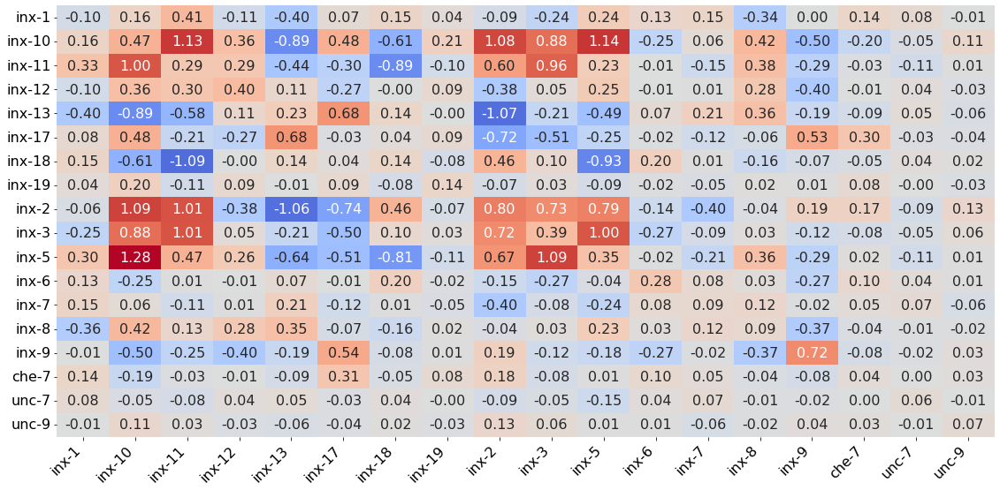

In [9]:
# Labels for the heatmap
labels = [
    "inx-1", "inx-10", "inx-11", "inx-12", "inx-13", "inx-17",
    "inx-18", "inx-19", "inx-2", "inx-3", "inx-5", "inx-6",
    "inx-7", "inx-8", "inx-9", "che-7", "unc-7", "unc-9"
]

# Create a heatmap
plt.figure(figsize=(16, 8))  # Adjust the figure size as needed
sns.heatmap(ABT, annot=True, fmt=".2f", cmap='coolwarm', center = 0.0, cbar=False, xticklabels=labels, yticklabels=labels)

# Rotate the tick labels for better readability
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Show the plot
plt.tight_layout()  # Adjust layout to fit everything nicely
plt.plot()

In [10]:
reader=csv.reader(open("rule_matrix_0.2150.csv", "r"), delimiter=",")
tof=list(reader)
tof=np.array(tof).astype("double") # operator O from connectome model

In [11]:
from scipy.stats import pearsonr
coef, p = pearsonr(ABT.flatten(), tof.flatten())
print (coef, p)

0.9032272054194419 2.4879801571707755e-120


In [12]:
from scipy.stats import pearsonr
import numpy as np

# Assuming ABT and tof are numpy arrays that have been defined earlier
ABTf = ABT.flatten()
toff = tof.flatten()

# Create a mask for the condition
mask = (np.abs(toff) > 0.05) & (np.abs(ABTf) > 0.05)

# Apply the mask to both flattened arrays
filtered_ABTf = ABTf[mask]
filtered_toff = toff[mask]

# Calculate Pearson correlation coefficient
coef, p = pearsonr(filtered_ABTf, filtered_toff)
print(coef, p)

0.949890632452305 6.171721927767217e-101


In [13]:
# reconstruction of the connectivity matrix
XABTXT = X.dot(ABT).dot((X.T))

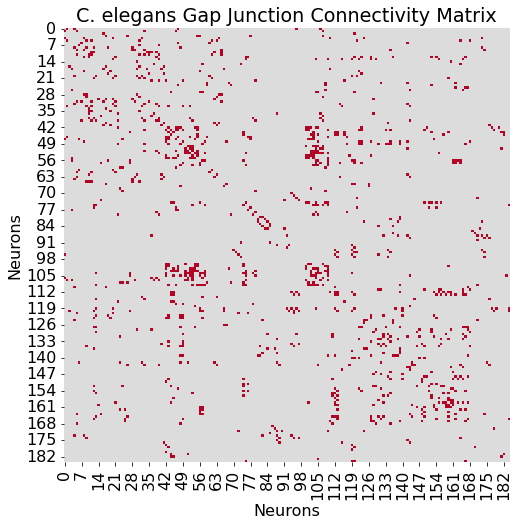

In [14]:
fig, axs = plt.subplots(1, 1, figsize=(8, 8))
heatmap = sns.heatmap(Z, cmap='coolwarm', cbar = False, vmin = -1, vmax = 1)
axs.set_xlabel('Neurons')
axs.set_ylabel('Neurons')
plt.title ('C. elegans Gap Junction Connectivity Matrix')
plt.savefig('figure2_target.svg', format='svg', bbox_inches='tight')

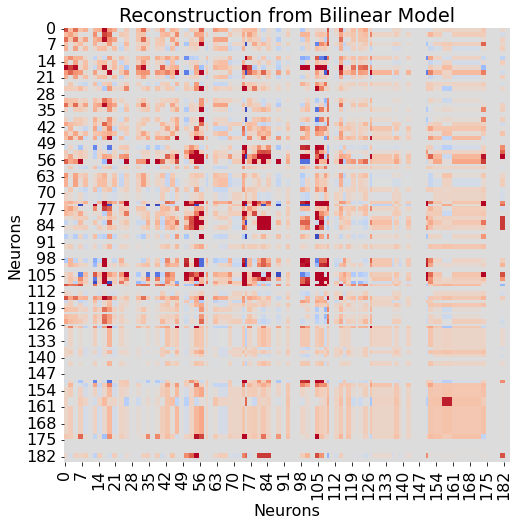

In [15]:
fig, axs = plt.subplots(1, 1, figsize=(8, 8))
heatmap = sns.heatmap(XABTXT, cmap='coolwarm', cbar = False, vmin = -0.5, vmax = 0.5)
axs.set_xlabel('Neurons')
axs.set_ylabel('Neurons')
plt.title ('Reconstruction from Bilinear Model')
plt.savefig('figure2_bilinear_estimated.svg', format='svg', bbox_inches='tight')

In [16]:
from sklearn.metrics import roc_auc_score
roc_auc_score(Z[W == 1].flatten(), XABTXT[W == 1].flatten())

0.643520781368353

In [17]:
np.save('A_est.npy', A_est)
np.save('B_est.npy', B_est)